 # Applying phase balancing using switchers in a simulation based on the Dataset of the ACN in 2019 using OpenDSS

## 1. Importing the necessary libraries

In [1]:
import win32com.client
dssObj = win32com.client.Dispatch("OpenDSSEngine.DSS")
dssText = dssObj.Text
dssCircuit = dssObj.ActiveCircuit
dssSolution = dssCircuit.Solution
dssElem = dssCircuit.ActiveCktElement
dssBus = dssCircuit.ActiveBus
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import os
import datetime

## 2. Compile the Master.DSS file for one time to activate Python interfacing 

In [2]:
dssText.Command = "compile 'C:/Users/lazhe/OneDrive/Thesis/OpenDSS/Test1/Master.DSS'"

## 3. Loading the Dataset to a dicionary called "data"

In [3]:
file_list = os.listdir("Dataset")
data = {}
for file in file_list:
    data[file[3:9].lower()] = pd.read_csv("Dataset/" + file)

## 4. Running the simulation 

The simulation is done with a 10 minutes timestamp for the whole year of 2019, so the total number of simulation number is 52560 points.

To assign the charging session to its approprate phases, we dectect in every begining of a charging session the two phases that have the lowest power and assign it to them.

P.S. 1: The OpenDSS simulatin using Python interfacing is a bit different than using only OpenDSS. Using only OpenDSS, the whole Dataset is fed to OpenDSS and we set the mode to yearly simulation and fix the timestamp and the total number of the time serie. In the case of Python interfacing, OpenDSS is called by a Python script to run a "Snap mode" simulation (simulation of a fixed values of the load power), then we change the values of the load power each timestamp depending on the Dataset. That's why the is a main loop that iterate over the Dataset to change the values and run a "Snap mode" simulation with OpenDSS every timestamp.

P.S. 2: You can skip the simulation and play around directly with the results, because they are already saved in a csv file and the simulation takes around 25 minutes (in my computer) tobe done.

In [4]:
begin = datetime.datetime.now()                                            #Get the begin time of the simulation to calculate the simulation time later
result = pd.DataFrame()                                                    #Initialize the result DataFrame 
n_sim_pt = data["ca-148"].shape[0]                                         #Number of simulation points
kW_P1 = 0                                                                  #Initialize the power of the phase one of the transformer t1 to 0 (this doesn't affect the simulation beacause the results are saved ones the main loop begins)
kW_P2 = 0                                                                  #Initialize the power of the phase tow of the transformer t1 to 0 (this doesn't affect the simulation beacause the results are saved ones the main loop begins)
kW_P3 = 0                                                                  #Initialize the power of the phase three of the transformer t1 to 0 (this doesn't affect the simulation beacause the results are saved one the main begins)
station_bus = {}                                                           #Define the station_bus dictionary that contains the bus number of each station
station_kW = {}                                                            #Define the station_kW dictionary that contain the power of each station
station_phases = {}                                                        #Define the station_phases dictionary that contains the phases of each station
for station in data:                                                       #Initializing station_kW dictionary zeros (this doesn't affect the simulation beacause the results are saved ones the main loop begins)
    station_kW[station] = 0
for i,station in zip(range(1,len(data) + 1),data):                         #Initializing station_bus dictionary zeros (this doesn't affect the simulation beacause the results are saved ones the main loop begins)
    station_bus[station] = str(i)
for station in data:                                                       #Initializing station_phases dictionary zeros (this doesn't affect the simulation beacause the results are saved ones the main loop begins)
    station_phases[station] = ".1.2"
for i in range(n_sim_pt):                                                  #The main for loop that iterate over the total simulation point
    print("simulation point number :", i + 1)                              #Print the number of the simulation poit
    for station in data:                                                   #for loop that that iterates over the  stations
        prev_station_kW = station_kW[station]                              #Get the previous value of the station power to be used later to dectect the begning of a new charging session
        station_kW[station] = str(float(data[station].iloc[i,0]) * 0.001)  #Convert the power from W to kW
        if float(prev_station_kW) == 0 and float(station_kW[station]) > 0: #Dectect a new charging session begining when the previous station power in null and the new one is non zero
            if max(kW_P1,kW_P2,kW_P3) == kW_P1:                            #Dectect which two phases of the transformer t1 that have the lowes power by knowing the maximum one and then the lowest ones are the others
                station_phases[station] = ".2.3"                           #Affect the charging session to the two phases that have the lowest power
            if max(kW_P1,kW_P2,kW_P3) == kW_P2:
                station_phases[station] = ".1.3"
            if max(kW_P1,kW_P2,kW_P3) == kW_P3:
                station_phases[station] = ".1.2"
        dssText.Command = 'Edit "Load.' + station + '" kW=' + station_kW[station] + ' bus1=' + station_bus[station] + station_phases[station]  #Change the power of the station "station" to its new value of power "station_kW" and phase numbers "station_phases[station]""
    dssSolution.Solve()                                                    #Run a Snap mode simulation
    dssText.Command = 'Export p_byphase'                                   #Export the powers per phase to a csv file to be used later
    columns = pd.read_csv("ACN_Infrastructure_EXP_P_BYPHASE.csv", error_bad_lines=False).columns   #Reading the results
    f = pd.read_csv("ACN_Infrastructure_EXP_P_BYPHASE.csv", error_bad_lines=False, usecols=columns)#from the exported csv file
    kW_P1 = f.iloc[87,4]                                                   #Set the new value of power of the phase one of the transformer t1
    kW_P2 = f.iloc[87,6]                                                   #Set the new value of power of the phase two of the transformer t1
    kW_P3 = f.iloc[87,8]                                                   #Set the new value of power of the phase three of the transformer t1
    result = result.append(pd.DataFrame({"P1 (kW)" : [kW_P1], "P2 (kW)" : [kW_P2], "P3 (kW)" : [kW_P3]}))#Saving the result in Pandas DataFrame
end = datetime.datetime.now()                                              #Get the end time of the simulation to calculate the simulation time later
print("Done ! (Simulation time :",end-begin,")")                           #Calculate and print the simulation time

simulation point number : 1


C:\Users\lazhe\AppData\Local\Programs\Python\Python39\lib\site-packages\IPython\core\interactiveshell.py:3441: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version.


  exec(code_obj, self.user_global_ns, self.user_ns)
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: 

simulation point number : 2
simulation point number : 3
simulation point number : 4
simulation point number : 5
simulation point number : 6
simulation point number : 7
simulation point number : 8
simulation point number : 9


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10
simulation point number : 11
simulation point number : 12
simulation point number : 13
simulation point number : 14
simulation point number : 15
simulation point number : 16
simulation point number : 17


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18
simulation point number : 19
simulation point number : 20
simulation point number : 21
simulation point number : 22
simulation point number : 23
simulation point number : 24
simulation point number : 25
simulation point number : 26
simulation point number : 27
simulation point number : 28
simulation point number : 29
simulation point number : 30
simulation point number : 31
simulation point number : 32
simulation point number : 33


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34
simulation point number : 35
simulation point number : 36
simulation point number : 37
simulation point number : 38
simulation point number : 39
simulation point number : 40
simulation point number : 41


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42
simulation point number : 43
simulation point number : 44
simulation point number : 45
simulation point number : 46
simulation point number : 47
simulation point number : 48
simulation point number : 49


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50
simulation point number : 51
simulation point number : 52
simulation point number : 53
simulation point number : 54
simulation point number : 55
simulation point number : 56
simulation point number : 57


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 58
simulation point number : 59
simulation point number : 60
simulation point number : 61
simulation point number : 62
simulation point number : 63
simulation point number : 64
simulation point number : 65


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 66
simulation point number : 67
simulation point number : 68
simulation point number : 69
simulation point number : 70
simulation point number : 71
simulation point number : 72


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 73
simulation point number : 74
simulation point number : 75
simulation point number : 76
simulation point number : 77
simulation point number : 78
simulation point number : 79
simulation point number : 80


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 81
simulation point number : 82
simulation point number : 83
simulation point number : 84
simulation point number : 85
simulation point number : 86
simulation point number : 87
simulation point number : 88


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 89
simulation point number : 90
simulation point number : 91
simulation point number : 92
simulation point number : 93
simulation point number : 94
simulation point number : 95
simulation point number : 96


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 97
simulation point number : 98
simulation point number : 99
simulation point number : 100
simulation point number : 101
simulation point number : 102
simulation point number : 103
simulation point number : 104


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 105
simulation point number : 106
simulation point number : 107
simulation point number : 108
simulation point number : 109
simulation point number : 110
simulation point number : 111
simulation point number : 112


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 113
simulation point number : 114
simulation point number : 115
simulation point number : 116
simulation point number : 117
simulation point number : 118
simulation point number : 119
simulation point number : 120


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 121
simulation point number : 122
simulation point number : 123
simulation point number : 124
simulation point number : 125
simulation point number : 126
simulation point number : 127
simulation point number : 128


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 129
simulation point number : 130
simulation point number : 131
simulation point number : 132
simulation point number : 133
simulation point number : 134
simulation point number : 135
simulation point number : 136


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 137
simulation point number : 138
simulation point number : 139
simulation point number : 140
simulation point number : 141
simulation point number : 142
simulation point number : 143
simulation point number : 144
simulation point number : 145


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 146
simulation point number : 147
simulation point number : 148
simulation point number : 149
simulation point number : 150
simulation point number : 151
simulation point number : 152
simulation point number : 153


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 154
simulation point number : 155
simulation point number : 156
simulation point number : 157
simulation point number : 158
simulation point number : 159
simulation point number : 160
simulation point number : 161


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 162
simulation point number : 163
simulation point number : 164
simulation point number : 165
simulation point number : 166
simulation point number : 167
simulation point number : 168
simulation point number : 169


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 170
simulation point number : 171
simulation point number : 172
simulation point number : 173
simulation point number : 174
simulation point number : 175
simulation point number : 176
simulation point number : 177


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 178
simulation point number : 179
simulation point number : 180
simulation point number : 181
simulation point number : 182
simulation point number : 183
simulation point number : 184
simulation point number : 185


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 186
simulation point number : 187
simulation point number : 188
simulation point number : 189
simulation point number : 190
simulation point number : 191
simulation point number : 192
simulation point number : 193
simulation point number : 194
simulation point number : 195
simulation point number : 196
simulation point number : 197
simulation point number : 198
simulation point number : 199
simulation point number : 200
simulation point number : 201


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 202
simulation point number : 203
simulation point number : 204
simulation point number : 205
simulation point number : 206
simulation point number : 207
simulation point number : 208


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 209
simulation point number : 210
simulation point number : 211
simulation point number : 212
simulation point number : 213
simulation point number : 214
simulation point number : 215
simulation point number : 216

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip


simulation point number : 217
simulation point number : 218
simulation point number : 219
simulation point number : 220
simulation point number : 221
simulation point number : 222
simulation point number : 223


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 224
simulation point number : 225
simulation point number : 226
simulation point number : 227
simulation point number : 228
simulation point number : 229
simulation point number : 230
simulation point number : 231


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 232
simulation point number : 233
simulation point number : 234
simulation point number : 235
simulation point number : 236
simulation point number : 237
simulation point number : 238
simulation point number : 239


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 240
simulation point number : 241
simulation point number : 242
simulation point number : 243
simulation point number : 244
simulation point number : 245
simulation point number : 246


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 247
simulation point number : 248
simulation point number : 249
simulation point number : 250
simulation point number : 251
simulation point number : 252
simulation point number : 253
simulation point number : 254


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 255
simulation point number : 256
simulation point number : 257
simulation point number : 258
simulation point number : 259
simulation point number : 260
simulation point number : 261


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 262
simulation point number : 263
simulation point number : 264
simulation point number : 265
simulation point number : 266
simulation point number : 267
simulation point number : 268


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 269
simulation point number : 270
simulation point number : 271
simulation point number : 272
simulation point number : 273
simulation point number : 274


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 275
simulation point number : 276
simulation point number : 277
simulation point number : 278
simulation point number : 279
simulation point number : 280


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 281
simulation point number : 282
simulation point number : 283
simulation point number : 284
simulation point number : 285
simulation point number : 286


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 287
simulation point number : 288
simulation point number : 289
simulation point number : 290
simulation point number : 291
simulation point number : 292
simulation point number : 293
simulation point number : 294


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 295
simulation point number : 296
simulation point number : 297
simulation point number : 298
simulation point number : 299
simulation point number : 300


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 301
simulation point number : 302
simulation point number : 303
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


 304
simulation point number : 305
simulation point number : 306


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 307
simulation point number : 308
simulation point number : 309
simulation point number : 310


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 311
simulation point number : 312
simulation point number : 313


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 314
simulation point number : 315
simulation point number : 316
simulation point number : 317
simulation point number : 318
simulation point number : 319
simulation point number : 320


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 321
simulation point number : 322
simulation point number : 323
simulation point number : 324
simulation point number : 325
simulation point number : 326
simulation point number : 327
simulation point number : 328


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 329
simulation point number : 330
simulation point number : 331
simulation point number : 332
simulation point number : 333
simulation point number : 334
simulation point number : 335
simulation point number : 336


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 337
simulation point number : 338


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 339
simulation point number : 340
simulation point number : 341
simulation point number : 342
simulation point number : 343
simulation point number : 344


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 345
simulation point number : 346
simulation point number : 347
simulation point number : 348
simulation point number : 349
simulation point number : 350
simulation point number : 351
simulation point number : 352


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 353
simulation point number : 354
simulation point number : 355
simulation point number : 356
simulation point number : 357
simulation point number : 358
simulation point number : 359
simulation point number : 360


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 361
simulation point number : 362
simulation point number : 363
simulation point number : 364
simulation point number : 365
simulation point number : 366
simulation point number : 367
simulation point number : 368


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 369
simulation point number : 370
simulation point number : 371
simulation point number : 372
simulation point number : 373
simulation point number : 374
simulation point number : 375


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 376
simulation point number : 377
simulation point number : 378
simulation point number : 379
simulation point number : 380
simulation point number : 381


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 382
simulation point number : 383
simulation point number : 384
simulation point number : 385
simulation point number : 386
simulation point number : 387


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 388
simulation point number : 389
simulation point number : 390


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 391
simulation point number : 392
simulation point number : 393
simulation point number : 394
simulation point number : 395
simulation point number : 396
simulation point number : 397
simulation point number : 398


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 399
simulation point number : 400
simulation point number : 401
simulation point number : 402
simulation point number : 403
simulation point number : 404


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 405
simulation point number : 406
simulation point number : 407
simulation point number : 408


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 409
simulation point number : 410
simulation point number : 411
simulation point number : 412
simulation point number : 413
simulation point number : 414


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 415
simulation point number : 416
simulation point number : 417
simulation point number : 418
simulation point number : 419


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 420
simulation point number : 421
simulation point number : 422
simulation point number : 423
simulation point number : 424


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 425
simulation point number : 426
simulation point number : 427
simulation point number : 428
simulation point number : 429
simulation point number : 430


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 431
simulation point number : 432
simulation point number : 433
simulation point number : 434
simulation point number : 435
simulation point number : 436


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 437
simulation point number : 438
simulation point number : 439
simulation point number : 440
simulation point number : 441
simulation point number : 442
simulation point number : 443
simulation point number : 444


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 445
simulation point number : 446
simulation point number : 447
simulation point number : 448
simulation point number : 449


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 450
simulation point number : 451
simulation point number : 452
simulation point number : 453
simulation point number : 454
simulation point number : 455


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 456
simulation point number : 457
simulation point number : 458
simulation point number : 459
simulation point number : 460
simulation point number : 461
simulation point number : 462
simulation point number : 463
simulation point number : 464
simulation point number : 465
simulation point number : 466
simulation point number : 467


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 468


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 469
simulation point number : 470
simulation point number : 471
simulation point number : 472
simulation point number : 473
simulation point number : 474
simulation point number : 475
simulation point number : 476
simulation point number : 477


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 478
simulation point number : 479
simulation point number : 480
simulation point number : 481
simulation point number : 482
simulation point number : 483
simulation point number : 484
simulation point number : 485


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 486
simulation point number : 487
simulation point number : 488
simulation point number : 489
simulation point number : 490
simulation point number : 491


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 492
simulation point number : 493
simulation point number : 494
simulation point number : 495
simulation point number : 496
simulation point number : 497
simulation point number : 498
simulation point number : 499
simulation point number : 500
simulation point number : 501
simulation point number : 502


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 503
simulation point number : 504
simulation point number : 505
simulation point number : 506
simulation point number : 507
simulation point number : 508
simulation point number : 509
simulation point number : 510


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 511
simulation point number : 512
simulation point number : 513
simulation point number : 514
simulation point number : 515
simulation point number : 516
simulation point number : 517
simulation point number : 518


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 519
simulation point number : 520
simulation point number : 521
simulation point number : 522


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 523
simulation point number : 524
simulation point number : 525
simulation point number : 526
simulation point number : 527
simulation point number : 528


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 529
simulation point number : 530
simulation point number : 531
simulation point number : 532
simulation point number : 533


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 534
simulation point number : 535
simulation point number : 536
simulation point number : 537
simulation point number : 538


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 539
simulation point number : 540
simulation point number : 541
simulation point number : 542
simulation point number : 543
simulation point number : 544
simulation point number : 545


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 546
simulation point number : 547
simulation point number : 548
simulation point number : 549
simulation point number : 550
simulation point number : 551
simulation point number : 552


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 553
simulation point number : 554
simulation point number : 555
simulation point number : 556
simulation point number : 557
simulation point number : 558
simulation point number : 559


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 560
simulation point number : 561
simulation point number : 562
simulation point number : 563
simulation point number : 564
simulation point number : 565
simulation point number : 566
simulation point number : 567
simulation point number : 568
simulation point number : 569
simulation point number : 570
simulation point number : 571
simulation point number : 572
simulation point number : 573
simulation point number : 574
simulation point number : 575
simulation point number : 576


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 577
simulation point number : 578
simulation point number : 579
simulation point number : 580
simulation point number : 581
simulation point number : 582
simulation point number : 583
simulation point number : 584


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 585
simulation point number : 586
simulation point number : 587
simulation point number : 588
simulation point number : 589
simulation point number : 590
simulation point number : 591
simulation point number : 592


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 593
simulation point number : 594
simulation point number : 595
simulation point number : 596
simulation point number : 597
simulation point number : 598
simulation point number : 599
simulation point number : 600


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 601
simulation point number : 602
simulation point number : 603
simulation point number : 604
simulation point number : 605
simulation point number : 606
simulation point number : 607
simulation point number : 608


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 609
simulation point number : 610
simulation point number : 611
simulation point number : 612
simulation point number : 613
simulation point number : 614
simulation point number : 615
simulation point number : 616


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 617
simulation point number : 618
simulation point number : 619
simulation point number : 620
simulation point number : 621
simulation point number : 622
simulation point number : 623
simulation point number : 624


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 625
simulation point number : 626
simulation point number : 627
simulation point number : 628
simulation point number : 629
simulation point number : 630
simulation point number : 631
simulation point number : 632


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 633
simulation point number : 634
simulation point number : 635
simulation point number : 636
simulation point number : 637
simulation point number : 638
simulation point number : 639
simulation point number : 640


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 641
simulation point number : 642
simulation point number : 643
simulation point number : 644
simulation point number : 645
simulation point number : 646
simulation point number : 647
simulation point number : 648
simulation point number : 649


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 650
simulation point number : 651
simulation point number : 652
simulation point number : 653
simulation point number : 654
simulation point number : 655
simulation point number : 656


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 657
simulation point number : 658
simulation point number : 659
simulation point number : 660
simulation point number : 661
simulation point number : 662
simulation point number : 663
simulation point number : 664


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 665
simulation point number : 666
simulation point number : 667
simulation point number : 668
simulation point number : 669
simulation point number : 670
simulation point number : 671
simulation point number : 672


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 673
simulation point number : 674
simulation point number : 675
simulation point number : 676
simulation point number : 677
simulation point number : 678


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 679
simulation point number : 680
simulation point number : 681
simulation point number : 682
simulation point number : 683
simulation point number : 684
simulation point number : 685
simulation point number : 686
simulation point number : 687
simulation point number : 688
simulation point number : 689
simulation point number : 690
simulation point number : 691
simulation point number : 692
simulation point number : 693
simulation point number : 694


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 695
simulation point number : 696
simulation point number : 697
simulation point number : 698
simulation point number : 699
simulation point number : 700
simulation point number : 701


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 702
simulation point number : 703
simulation point number : 704
simulation point number : 705
simulation point number : 706
simulation point number : 707


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 708
simulation point number : 709
simulation point number : 710
simulation point number : 711
simulation point number : 712
simulation point number : 713
simulation point number : 714


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 715
simulation point number : 716
simulation point number : 717
simulation point number : 718
simulation point number : 719
simulation point number : 720
simulation point number : 721
simulation point number : 722
simulation point number : 723


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 724
simulation point number : 725
simulation point number : 726
simulation point number : 727
simulation point number : 728
simulation point number : 729
simulation point number : 730
simulation point number : 731


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 732
simulation point number : 733
simulation point number : 734
simulation point number : 735
simulation point number : 736
simulation point number : 737
simulation point number : 738
simulation point number : 739


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 740
simulation point number : 741
simulation point number : 742
simulation point number : 743
simulation point number : 744
simulation point number : 745
simulation point number : 746
simulation point number : 747


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 748
simulation point number : 749
simulation point number : 750
simulation point number : 751
simulation point number : 752
simulation point number : 753
simulation point number : 754
simulation point number : 755


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 756
simulation point number : 757
simulation point number : 758
simulation point number : 759
simulation point number : 760
simulation point number : 761
simulation point number : 762
simulation point number : 763


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 764
simulation point number : 765
simulation point number : 766
simulation point number : 767
simulation point number : 768
simulation point number : 769
simulation point number : 770
simulation point number : 771


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 772
simulation point number : 773
simulation point number : 774
simulation point number : 775
simulation point number : 776
simulation point number : 777
simulation point number : 778
simulation point number : 779


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 780
simulation point number : 781
simulation point number : 782
simulation point number : 783
simulation point number : 784
simulation point number : 785
simulation point number : 786
simulation point number : 787


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 788
simulation point number : 789
simulation point number : 790
simulation point number : 791
simulation point number : 792
simulation point number : 793
simulation point number : 794
simulation point number : 795


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 796
simulation point number : 797
simulation point number : 798
simulation point number : 799
simulation point number : 800
simulation point number : 801
simulation point number : 802


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 803
simulation point number : 804
simulation point number : 805
simulation point number : 806
simulation point number : 807
simulation point number : 808
simulation point number : 809
simulation point number : 810


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 811
simulation point number : 812
simulation point number : 813
simulation point number : 814
simulation point number : 815
simulation point number : 816
simulation point number : 817
simulation point number : 818


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 819
simulation point number : 820
simulation point number : 821
simulation point number : 822
simulation point number : 823
simulation point number : 824
simulation point number : 825
simulation point number : 826


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 827
simulation point number : 828
simulation point number : 829
simulation point number : 830
simulation point number : 831
simulation point number : 832
simulation point number : 833
simulation point number : 834


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 835
simulation point number : 836
simulation point number : 837
simulation point number : 838
simulation point number : 839
simulation point number : 840
simulation point number : 841


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 842
simulation point number : 843
simulation point number : 844
simulation point number : 845
simulation point number : 846
simulation point number : 847
simulation point number : 848


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 849
simulation point number : 850
simulation point number : 851
simulation point number : 852
simulation point number : 853
simulation point number : 854


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 855
simulation point number : 856
simulation point number : 857
simulation point number : 858
simulation point number : 859
simulation point number : 860
simulation point number : 861


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 862
simulation point number : 863
simulation point number : 864
simulation point number : 865
simulation point number : 866
simulation point number : 867


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 868
simulation point number : 869
simulation point number : 870
simulation point number : 871
simulation point number : 872
simulation point number : 873
simulation point number : 874
simulation point number : 875
simulation point number : 876
simulation point number : 877
simulation point number : 878
simulation point number : 879
simulation point number : 880
simulation point number : 881
simulation point number : 882
simulation point number : 883


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 884
simulation point number : 885
simulation point number : 886
simulation point number : 887
simulation point number : 888
simulation point number : 889
simulation point number : 890
simulation point number : 891


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 892
simulation point number : 893
simulation point number : 894
simulation point number : 895
simulation point number : 896
simulation point number : 897
simulation point number : 898
simulation point number : 899
simulation point number : 900


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 901
simulation point number : 902
simulation point number : 903
simulation point number : 904
simulation point number : 905
simulation point number : 906
simulation point number : 907
simulation point number : 908


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 909
simulation point number : 910
simulation point number : 911
simulation point number : 912
simulation point number : 913
simulation point number : 914
simulation point number : 915


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 916
simulation point number : 917
simulation point number : 918
simulation point number : 919
simulation point number : 920
simulation point number : 921


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 922
simulation point number : 923
simulation point number : 924
simulation point number : 925
simulation point number : 926
simulation point number : 927


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 928
simulation point number : 929
simulation point number : 930
simulation point number : 931
simulation point number : 932
simulation point number : 933
simulation point number : 934
simulation point number : 935


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 936
simulation point number : 937
simulation point number : 938
simulation point number : 939
simulation point number : 940
simulation point number : 941
simulation point number : 942


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 943
simulation point number : 944
simulation point number : 945
simulation point number : 946
simulation point number : 947
simulation point number : 948
simulation point number : 949


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 950
simulation point number : 951
simulation point number : 952


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 953
simulation point number : 954
simulation point number : 955
simulation point number : 956


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 957
simulation point number : 958
simulation point number : 959
simulation point number : 960
simulation point number : 961


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 962
simulation point number : 963
simulation point number : 964
simulation point number : 965


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 966
simulation point number : 967
simulation point number : 968


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 969
simulation point number : 970
simulation point number : 971
simulation point number : 972
simulation point number : 973


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 974



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 975
simulation point number : 976
simulation point number : 977
simulation point number : 978
simulation point number : 979


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 980
simulation point number : 981
simulation point number : 982
simulation point number : 983


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 984
simulation point number : 985


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 986
simulation point number : 987
simulation point number : 988
simulation point number : 989
simulation point number : 990
simulation point number : 991
simulation point number : 992


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 993
simulation point number : 994
simulation point number : 995
simulation point number : 996
simulation point number : 997



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 998
simulation point number : 999
simulation point number : 1000
simulation point number : 1001
simulation point number : 1002


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1003
simulation point number : 1004
simulation point number : 1005
simulation point number : 1006
simulation point number : 1007
simulation point number : 1008
simulation point number : 1009
simulation point number : 1010
simulation point number : 1011
simulation point number : 1012
simulation point number : 1013


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1014
simulation point number : 1015
simulation point number : 1016
simulation point number : 1017
simulation point number : 1018


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1019
simulation point number : 1020
simulation point number : 1021
simulation point number : 1022
simulation point number : 1023


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1024
simulation point number : 1025
simulation point number : 1026
simulation point number : 1027
simulation point number : 1028


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1029
simulation point number : 1030
simulation point number : 1031
simulation point number : 1032
simulation point number : 1033


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1034
simulation point number : 1035
simulation point number : 1036
simulation point number : 1037
simulation point number : 1038
simulation point number : 1039


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1040
simulation point number : 1041
simulation point number : 1042
simulation point number : 1043
simulation point number : 1044


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1045
simulation point number : 1046
simulation point number : 1047
simulation point number : 1048


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1049
simulation point number : 1050
simulation point number : 1051


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1052
simulation point number : 1053
simulation point number : 1054
simulation point number : 1055


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1056
simulation point number : 1057
simulation point number : 1058
simulation point number : 1059


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1060
simulation point number : 1061
simulation point number : 1062
simulation point number : 1063


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1064
simulation point number : 1065
simulation point number : 1066
simulation point number : 1067
simulation point number : 1068


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1069
simulation point number : 1070
simulation point number : 1071
simulation point number : 1072


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1073
simulation point number : 1074
simulation point number : 1075
simulation point number : 1076
simulation point number : 1077
simulation point number : 1078


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1079
simulation point number : 1080
simulation point number : 1081
simulation point number : 1082
simulation point number : 1083


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1084
simulation point number : 1085


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1086
simulation point number : 1087
simulation point number : 1088
simulation point number : 1089
simulation point number : 1090
simulation point number : 1091
simulation point number : 1092
simulation point number : 1093
simulation point number : 1094


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1095
simulation point number : 1096
simulation point number : 1097
simulation point number : 1098
simulation point number : 1099
simulation point number : 1100
simulation point number : 1101


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1102
simulation point number : 1103


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1104
simulation point number : 1105
simulation point number : 1106
simulation point number : 1107
simulation point number : 1108
simulation point number : 1109
simulation point number : 1110
simulation point number : 1111


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1112
simulation point number : 1113
simulation point number : 1114
simulation point number : 1115
simulation point number : 1116
simulation point number : 1117
simulation point number : 1118
simulation point number : 1119


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1120
simulation point number : 1121
simulation point number : 1122
simulation point number : 1123
simulation point number : 1124
simulation point number : 1125
simulation point number : 1126
simulation point number : 1127


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1128
simulation point number : 1129
simulation point number : 1130
simulation point number : 1131
simulation point number : 1132
simulation point number : 1133
simulation point number : 1134
simulation point number : 1135


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1136
simulation point number : 1137
simulation point number : 1138
simulation point number : 1139
simulation point number : 1140
simulation point number : 1141
simulation point number : 1142
simulation point number : 1143

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip


simulation point number : 1144
simulation point number : 1145
simulation point number : 1146
simulation point number : 1147
simulation point number : 1148
simulation point number : 1149
simulation point number : 1150


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1151
simulation point number : 1152
simulation point number : 1153
simulation point number : 1154
simulation point number : 1155
simulation point number : 1156
simulation point number : 1157


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1158
simulation point number : 1159
simulation point number : 1160
simulation point number : 1161
simulation point number : 1162
simulation point number : 1163
simulation point number : 1164
simulation point number : 1165
simulation point number : 1166
simulation point number : 1167
simulation point number : 1168
simulation point number : 1169
simulation point number : 1170


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1171
simulation point number : 1172
simulation point number : 1173
simulation point number : 1174
simulation point number : 1175
simulation point number : 1176
simulation point number : 1177
simulation point number : 1178


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1179
simulation point number : 1180
simulation point number : 1181
simulation point number : 1182
simulation point number : 1183
simulation point number : 1184
simulation point number : 1185
simulation point number : 1186


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1187
simulation point number : 1188
simulation point number : 1189
simulation point number : 1190
simulation point number : 1191
simulation point number : 1192
simulation point number : 1193
simulation point number : 1194


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1195
simulation point number : 1196
simulation point number : 1197
simulation point number : 1198
simulation point number : 1199
simulation point number : 1200
simulation point number : 1201
simulation point number : 1202


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1203
simulation point number : 1204
simulation point number : 1205
simulation point number : 1206
simulation point number : 1207
simulation point number : 1208
simulation point number : 1209


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1210
simulation point number : 1211
simulation point number : 1212
simulation point number : 1213
simulation point number : 1214
simulation point number : 1215
simulation point number : 1216
simulation point number : 1217


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1218
simulation point number : 1219
simulation point number : 1220
simulation point number : 1221
simulation point number : 1222
simulation point number : 1223
simulation point number : 1224
simulation point number : 1225
simulation point number : 1226
simulation point number : 1227
simulation point number : 1228
simulation point number : 1229
simulation point number : 1230
simulation point number : 1231


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1232
simulation point number : 1233


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1234
simulation point number : 1235
simulation point number : 1236
simulation point number : 1237
simulation point number : 1238


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1239
simulation point number : 1240
simulation point number : 1241
simulation point number : 1242
simulation point number : 1243
simulation point number : 1244


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1245
simulation point number : 1246
simulation point number : 1247
simulation point number : 1248
simulation point number : 1249


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1250
simulation point number : 1251
simulation point number : 1252
simulation point number : 1253
simulation point number : 1254
simulation point number : 1255


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1256
simulation point number : 1257
simulation point number : 1258
simulation point number : 1259
simulation point number : 1260


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1261
simulation point number : 1262
simulation point number : 1263
simulation point number : 1264


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1265
simulation point number : 1266
simulation point number : 1267
simulation point number : 1268
simulation point number : 1269


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1270
simulation point number : 1271
simulation point number : 1272
simulation point number : 1273
simulation point number : 1274


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1275
simulation point number : 1276
simulation point number : 1277
simulation point number : 1278
simulation point number : 1279
simulation point number : 1280


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1281
simulation point number : 1282
simulation point number : 1283
simulation point number : 1284
simulation point number : 1285
simulation point number : 1286


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1287
simulation point number : 1288
simulation point number : 1289
simulation point number : 1290
simulation point number : 1291


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1292
simulation point number : 1293
simulation point number : 1294
simulation point number : 1295
simulation point number : 1296


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1297
simulation point number : 1298
simulation point number : 1299
simulation point number : 1300
simulation point number : 1301


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1302
simulation point number : 1303
simulation point number : 1304
simulation point number : 1305
simulation point number : 1306
simulation point number : 1307


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1308
simulation point number : 1309
simulation point number : 1310
simulation point number : 1311
simulation point number : 1312
simulation point number : 1313
simulation point number : 1314


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1315
simulation point number : 1316
simulation point number : 1317
simulation point number : 1318
simulation point number : 1319
simulation point number : 1320
simulation point number : 1321
simulation point number : 1322


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1323
simulation point number : 1324
simulation point number : 1325
simulation point number : 1326
simulation point number : 1327
simulation point number : 1328


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1329
simulation point number : 1330
simulation point number : 1331
simulation point number : 1332
simulation point number : 1333
simulation point number : 1334


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1335
simulation point number : 1336
simulation point number : 1337
simulation point number : 1338
simulation point number : 1339
simulation point number : 1340


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1341
simulation point number : 1342
simulation point number : 1343
simulation point number : 1344
simulation point number : 1345


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1346
simulation point number : 1347
simulation point number : 1348
simulation point number : 1349
simulation point number : 1350
simulation point number : 1351
simulation point number : 1352
simulation point number : 1353


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1354
simulation point number : 1355
simulation point number : 1356
simulation point number : 1357
simulation point number : 1358
simulation point number : 1359


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1360
simulation point number : 1361
simulation point number : 1362
simulation point number : 1363
simulation point number : 1364


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1365
simulation point number : 1366
simulation point number : 1367
simulation point number : 1368
simulation point number : 1369
simulation point number : 1370


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1371
simulation point number : 1372
simulation point number : 1373
simulation point number : 1374
simulation point number : 1375
simulation point number : 1376
simulation point number : 1377


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1378
simulation point number : 1379
simulation point number : 1380
simulation point number : 1381
simulation point number : 1382
simulation point number : 1383
simulation point number : 1384
simulation point number : 1385
simulation point number : 1386
simulation point number : 1387
simulation point number : 1388
simulation point number : 1389
simulation point number : 1390


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1391
simulation point number : 1392
simulation point number : 1393
simulation point number : 1394
simulation point number : 1395
simulation point number : 1396
simulation point number : 1397
simulation point number : 1398


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1399
simulation point number : 1400
simulation point number : 1401
simulation point number : 1402
simulation point number : 1403
simulation point number : 1404
simulation point number : 1405
simulation point number : 1406


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1407
simulation point number : 1408
simulation point number : 1409
simulation point number : 1410
simulation point number : 1411
simulation point number : 1412
simulation point number : 1413
simulation point number : 1414


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1415
simulation point number : 1416
simulation point number : 1417
simulation point number : 1418
simulation point number : 1419
simulation point number : 1420
simulation point number : 1421


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1422
simulation point number : 1423
simulation point number : 1424
simulation point number : 1425
simulation point number : 1426
simulation point number : 1427
simulation point number : 1428
simulation point number : 1429


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1430
simulation point number : 1431
simulation point number : 1432
simulation point number : 1433
simulation point number : 1434
simulation point number : 1435
simulation point number : 1436
simulation point number : 1437


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1438
simulation point number : 1439
simulation point number : 1440
simulation point number : 1441
simulation point number : 1442
simulation point number : 1443
simulation point number : 1444
simulation point number : 1445


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1446
simulation point number : 1447
simulation point number : 1448
simulation point number : 1449
simulation point number : 1450
simulation point number : 1451
simulation point number : 1452
simulation point number : 1453


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1454
simulation point number : 1455
simulation point number : 1456
simulation point number : 1457
simulation point number : 1458
simulation point number : 1459
simulation point number : 1460
simulation point number : 1461


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1462
simulation point number : 1463
simulation point number : 1464
simulation point number : 1465
simulation point number : 1466
simulation point number : 1467
simulation point number : 1468
simulation point number : 1469


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1470
simulation point number : 1471
simulation point number : 1472
simulation point number : 1473
simulation point number : 1474
simulation point number : 1475
simulation point number : 1476
simulation point number : 1477


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1478
simulation point number : 1479
simulation point number : 1480
simulation point number : 1481
simulation point number : 1482
simulation point number : 1483


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1484
simulation point number : 1485
simulation point number : 1486
simulation point number : 1487
simulation point number : 1488
simulation point number : 1489
simulation point number : 1490
simulation point number : 1491


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1492
simulation point number : 1493
simulation point number : 1494
simulation point number : 1495
simulation point number : 1496
simulation point number : 1497


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1498
simulation point number : 1499
simulation point number : 1500
simulation point number : 1501
simulation point number : 1502
simulation point number : 1503


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1504
simulation point number : 1505
simulation point number : 1506
simulation point number : 1507
simulation point number : 1508
simulation point number : 1509
simulation point number : 1510
simulation point number : 1511


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1512
simulation point number : 1513
simulation point number : 1514
simulation point number : 1515
simulation point number : 1516
simulation point number : 1517
simulation point number : 1518
simulation point number : 1519


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1520
simulation point number : 1521
simulation point number : 1522
simulation point number : 1523
simulation point number : 1524
simulation point number : 1525
simulation point number : 1526
simulation point number : 1527
simulation point number : 1528
simulation point number : 1529
simulation point number : 1530
simulation point number : 1531
simulation point number : 1532
simulation point number : 1533


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1534
simulation point number : 1535
simulation point number : 1536
simulation point number : 1537
simulation point number : 1538
simulation point number : 1539
simulation point number : 1540
simulation point number : 1541
simulation point number : 1542


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1543
simulation point number : 1544
simulation point number : 1545
simulation point number : 1546
simulation point number : 1547
simulation point number : 1548
simulation point number : 1549
simulation point number : 1550


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1551
simulation point number : 1552
simulation point number : 1553
simulation point number : 1554
simulation point number : 1555
simulation point number : 1556
simulation point number : 1557
simulation point number : 1558


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1559
simulation point number : 1560
simulation point number : 1561
simulation point number : 1562
simulation point number : 1563
simulation point number : 1564
simulation point number : 1565


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 1566
simulation point number : 1567
simulation point number : 1568
simulation point number : 1569
simulation point number : 1570
simulation point number : 1571
simulation point number : 1572



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1573
simulation point number : 1574
simulation point number : 1575
simulation point number : 1576
simulation point number : 1577
simulation point number : 1578
simulation point number : 1579


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1580
simulation point number : 1581
simulation point number : 1582
simulation point number : 1583
simulation point number : 1584
simulation point number : 1585
simulation point number : 1586
simulation point number : 1587


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1588
simulation point number : 1589
simulation point number : 1590
simulation point number : 1591
simulation point number : 1592
simulation point number : 1593
simulation point number : 1594


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1595
simulation point number : 1596
simulation point number : 1597
simulation point number : 1598
simulation point number : 1599
simulation point number : 1600
simulation point number : 1601


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1602
simulation point number : 1603
simulation point number : 1604
simulation point number : 1605
simulation point number : 1606


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1607
simulation point number : 1608
simulation point number : 1609
simulation point number : 1610
simulation point number : 1611
simulation point number : 1612
simulation point number : 1613
simulation point number : 1614


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1615
simulation point number : 1616
simulation point number : 1617
simulation point number : 1618
simulation point number : 1619
simulation point number : 1620
simulation point number : 1621


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1622
simulation point number : 1623
simulation point number : 1624
simulation point number : 1625
simulation point number : 1626


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1627
simulation point number : 1628
simulation point number : 1629
simulation point number : 1630
simulation point number : 1631
simulation point number : 1632


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1633
simulation point number : 1634
simulation point number : 1635
simulation point number : 1636
simulation point number : 1637
simulation point number : 1638
simulation point number : 1639


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1640
simulation point number : 1641
simulation point number : 1642
simulation point number : 1643
simulation point number : 1644
simulation point number : 1645


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1646
simulation point number : 1647
simulation point number : 1648
simulation point number : 1649
simulation point number : 1650
simulation point number : 1651


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1652
simulation point number : 1653
simulation point number : 1654
simulation point number : 1655
simulation point number : 1656
simulation point number : 1657


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1658
simulation point number : 1659
simulation point number : 1660
simulation point number : 1661
simulation point number : 1662
simulation point number : 1663
simulation point number : 1664
simulation point number : 1665


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1666
simulation point number : 1667
simulation point number : 1668
simulation point number : 1669
simulation point number : 1670
simulation point number : 1671


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1672
simulation point number : 1673
simulation point number : 1674
simulation point number : 1675
simulation point number : 1676
simulation point number : 1677
simulation point number : 1678
simulation point number : 1679
simulation point number : 1680
simulation point number : 1681
simulation point number : 1682
simulation point number : 1683
simulation point number : 1684
simulation point number : 1685
simulation point number : 1686


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1687
simulation point number : 1688
simulation point number : 1689
simulation point number : 1690
simulation point number : 1691
simulation point number : 1692
simulation point number : 1693


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1694
simulation point number : 1695
simulation point number : 1696
simulation point number : 1697
simulation point number : 1698
simulation point number : 1699
simulation point number : 1700
simulation point number : 1701


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1702
simulation point number : 1703
simulation point number : 1704
simulation point number : 1705
simulation point number : 1706
simulation point number : 1707
simulation point number : 1708


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1709
simulation point number : 1710
simulation point number : 1711
simulation point number : 1712
simulation point number : 1713


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1714
simulation point number : 1715
simulation point number : 1716
simulation point number : 1717
simulation point number : 1718
simulation point number : 1719
simulation point number : 1720


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1721
simulation point number : 1722
simulation point number : 1723
simulation point number : 1724
simulation point number : 1725
simulation point number : 1726


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1727
simulation point number : 1728
simulation point number : 1729
simulation point number : 1730
simulation point number : 1731
simulation point number : 1732
simulation point number : 1733
simulation point number : 1734


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1735
simulation point number : 1736
simulation point number : 1737
simulation point number : 1738
simulation point number : 1739
simulation point number : 1740


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1741
simulation point number : 1742
simulation point number : 1743
simulation point number : 1744
simulation point number : 1745
simulation point number : 1746


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1747
simulation point number : 1748
simulation point number : 1749
simulation point number : 1750
simulation point number : 1751
simulation point number : 1752
simulation point number : 1753
simulation point number : 1754


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1755
simulation point number : 1756
simulation point number : 1757
simulation point number : 1758
simulation point number : 1759
simulation point number : 1760
simulation point number : 1761
simulation point number : 1762


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1763
simulation point number : 1764
simulation point number : 1765
simulation point number : 1766
simulation point number : 1767
simulation point number : 1768
simulation point number : 1769
simulation point number : 1770


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1771
simulation point number : 1772
simulation point number : 1773


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1774
simulation point number : 1775
simulation point number : 1776
simulation point number : 1777
simulation point number : 1778
simulation point number : 1779
simulation point number : 1780
simulation point number : 1781


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1782
simulation point number : 1783
simulation point number : 1784
simulation point number : 1785
simulation point number : 1786
simulation point number : 1787
simulation point number : 1788
simulation point number : 1789


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1790
simulation point number : 1791
simulation point number : 1792
simulation point number : 1793
simulation point number : 1794
simulation point number : 1795
simulation point number : 1796
simulation point number : 1797


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1798
simulation point number : 1799
simulation point number : 1800
simulation point number : 1801
simulation point number : 1802
simulation point number : 1803
simulation point number : 1804
simulation point number : 1805
simulation point number : 1806
simulation point number : 1807
simulation point number : 1808
simulation point number : 1809
simulation point number : 1810
simulation point number : 1811
simulation point number : 1812


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1813
simulation point number : 1814
simulation point number : 1815
simulation point number : 1816
simulation point number : 1817
simulation point number : 1818
simulation point number : 1819


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1820
simulation point number : 1821
simulation point number : 1822
simulation point number : 1823
simulation point number : 1824
simulation point number : 1825
simulation point number : 1826
simulation point number : 1827


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1828
simulation point number : 1829
simulation point number : 1830
simulation point number : 1831
simulation point number : 1832
simulation point number : 1833
simulation point number : 1834
simulation point number : 1835


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1836
simulation point number : 1837
simulation point number : 1838
simulation point number : 1839
simulation point number : 1840
simulation point number : 1841
simulation point number : 1842


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1843
simulation point number : 1844
simulation point number : 1845
simulation point number : 1846
simulation point number : 1847
simulation point number : 1848
simulation point number : 1849
simulation point number : 1850


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1851
simulation point number : 1852
simulation point number : 1853
simulation point number : 1854
simulation point number : 1855
simulation point number : 1856
simulation point number : 1857
simulation point number : 1858


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1859
simulation point number : 1860
simulation point number : 1861
simulation point number : 1862
simulation point number : 1863
simulation point number : 1864
simulation point number : 1865


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1866
simulation point number : 1867
simulation point number : 1868
simulation point number : 1869
simulation point number : 1870
simulation point number : 1871
simulation point number : 1872
simulation point number : 1873


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1874
simulation point number : 1875
simulation point number : 1876
simulation point number : 1877
simulation point number : 1878
simulation point number : 1879
simulation point number : 1880
simulation point number : 1881


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1882
simulation point number : 1883
simulation point number : 1884
simulation point number : 1885
simulation point number : 1886
simulation point number : 1887
simulation point number : 1888


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1889
simulation point number : 1890
simulation point number : 1891
simulation point number : 1892
simulation point number : 1893
simulation point number : 1894
simulation point number : 1895
simulation point number : 1896
simulation point number : 1897


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1898
simulation point number : 1899
simulation point number : 1900
simulation point number : 1901
simulation point number : 1902
simulation point number : 1903


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1904
simulation point number : 1905
simulation point number : 1906
simulation point number : 1907
simulation point number : 1908
simulation point number : 1909
simulation point number : 1910


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1911
simulation point number : 1912
simulation point number : 1913
simulation point number : 1914
simulation point number : 1915
simulation point number : 1916
simulation point number : 1917
simulation point number : 1918
simulation point number : 1919
simulation point number : 1920
simulation point number : 1921
simulation point number : 1922
simulation point number : 1923


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1924
simulation point number : 1925
simulation point number : 1926
simulation point number : 1927
simulation point number : 1928
simulation point number : 1929
simulation point number : 1930
simulation point number : 1931


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1932
simulation point number : 1933
simulation point number : 1934
simulation point number : 1935
simulation point number : 1936
simulation point number : 1937


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1938
simulation point number : 1939
simulation point number : 1940
simulation point number : 1941
simulation point number : 1942
simulation point number : 1943
simulation point number : 1944


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1945
simulation point number : 1946
simulation point number : 1947
simulation point number : 1948
simulation point number : 1949
simulation point number : 1950
simulation point number : 1951
simulation point number : 1952


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1953
simulation point number : 1954
simulation point number : 1955
simulation point number : 1956
simulation point number : 1957
simulation point number : 1958
simulation point number : 1959
simulation point number : 1960


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1961
simulation point number : 1962
simulation point number : 1963
simulation point number : 1964
simulation point number : 1965
simulation point number : 1966
simulation point number : 1967
simulation point number : 1968


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1969
simulation point number : 1970
simulation point number : 1971
simulation point number : 1972
simulation point number : 1973
simulation point number : 1974
simulation point number : 1975
simulation point number : 1976


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1977
simulation point number : 1978
simulation point number : 1979
simulation point number : 1980
simulation point number : 1981
simulation point number : 1982
simulation point number : 1983
simulation point number : 1984


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1985
simulation point number : 1986
simulation point number : 1987
simulation point number : 1988
simulation point number : 1989
simulation point number : 1990


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 1991
simulation point number : 1992
simulation point number : 1993
simulation point number : 1994
simulation point number : 1995
simulation point number : 1996
simulation point number : 1997


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 1998
simulation point number : 1999
simulation point number : 2000
simulation point number : 2001
simulation point number : 2002


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2003
simulation point number : 2004
simulation point number : 2005
simulation point number : 2006
simulation point number : 2007
simulation point number : 2008
simulation point number : 2009
simulation point number : 2010


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2011
simulation point number : 2012
simulation point number : 2013
simulation point number : 2014
simulation point number : 2015
simulation point number : 2016
simulation point number : 2017
simulation point number : 2018
simulation point number : 2019


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2020
simulation point number : 2021
simulation point number : 2022
simulation point number : 2023
simulation point number : 2024
simulation point number : 2025
simulation point number : 2026
simulation point number : 2027


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2028
simulation point number : 2029
simulation point number : 2030
simulation point number : 2031
simulation point number : 2032
simulation point number : 2033
simulation point number : 2034
simulation point number : 2035


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2036
simulation point number : 2037
simulation point number : 2038
simulation point number : 2039
simulation point number : 2040
simulation point number : 2041
simulation point number : 2042
simulation point number : 2043
simulation point number : 2044


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2045
simulation point number : 2046
simulation point number : 2047
simulation point number : 2048
simulation point number : 2049
simulation point number : 2050
simulation point number : 2051
simulation point number : 2052


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2053
simulation point number : 2054
simulation point number : 2055
simulation point number : 2056
simulation point number : 2057
simulation point number : 2058
simulation point number : 2059
simulation point number : 2060


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2061
simulation point number : 2062
simulation point number : 2063
simulation point number : 2064
simulation point number : 2065
simulation point number : 2066
simulation point number : 2067
simulation point number : 2068


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2069
simulation point number : 2070
simulation point number : 2071
simulation point number : 2072
simulation point number : 2073
simulation point number : 2074
simulation point number : 2075
simulation point number : 2076


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2077
simulation point number : 2078
simulation point number : 2079
simulation point number : 2080
simulation point number : 2081
simulation point number : 2082
simulation point number : 2083
simulation point number : 2084
simulation point number : 2085


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2086
simulation point number : 2087
simulation point number : 2088
simulation point number : 2089
simulation point number : 2090
simulation point number : 2091
simulation point number : 2092


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2093
simulation point number : 2094
simulation point number : 2095
simulation point number : 2096
simulation point number : 2097
simulation point number : 2098
simulation point number : 2099
simulation point number : 2100
simulation point number : 2101
simulation point number : 2102
simulation point number : 2103
simulation point number : 2104
simulation point number : 2105
simulation point number : 2106
simulation point number : 2107
simulation point number : 2108


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2109
simulation point number : 2110
simulation point number : 2111
simulation point number : 2112
simulation point number : 2113
simulation point number : 2114
simulation point number : 2115
simulation point number : 2116


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2117
simulation point number : 2118
simulation point number : 2119
simulation point number : 2120
simulation point number : 2121
simulation point number : 2122
simulation point number : 2123
simulation point number : 2124


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2125
simulation point number : 2126
simulation point number : 2127
simulation point number : 2128
simulation point number : 2129
simulation point number : 2130
simulation point number : 2131
simulation point number : 2132


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2133
simulation point number : 2134
simulation point number : 2135
simulation point number : 2136
simulation point number : 2137
simulation point number : 2138
simulation point number : 2139
simulation point number : 2140


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2141
simulation point number : 2142
simulation point number : 2143
simulation point number : 2144
simulation point number : 2145
simulation point number : 2146
simulation point number : 2147
simulation point number : 2148


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2149
simulation point number : 2150
simulation point number : 2151
simulation point number : 2152
simulation point number : 2153
simulation point number : 2154
simulation point number : 2155
simulation point number : 2156


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2157
simulation point number : 2158
simulation point number : 2159
simulation point number : 2160
simulation point number : 2161
simulation point number : 2162
simulation point number : 2163
simulation point number : 2164


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2165
simulation point number : 2166
simulation point number : 2167
simulation point number : 2168
simulation point number : 2169
simulation point number : 2170
simulation point number : 2171
simulation point number : 2172


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2173
simulation point number : 2174
simulation point number : 2175
simulation point number : 2176
simulation point number : 2177
simulation point number : 2178
simulation point number : 2179
simulation point number : 2180


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2181
simulation point number : 2182
simulation point number : 2183
simulation point number : 2184
simulation point number : 2185
simulation point number : 2186
simulation point number : 2187
simulation point number : 

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

2188
simulation point number : 2189
simulation point number : 2190


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2191
simulation point number : 2192
simulation point number : 2193
simulation point number : 2194
simulation point number : 2195
simulation point number : 2196


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2197
simulation point number : 2198
simulation point number : 2199
simulation point number : 2200
simulation point number : 2201
simulation point number : 2202
simulation point number : 2203


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2204
simulation point number : 2205
simulation point number : 2206
simulation point number : 2207
simulation point number : 2208
simulation point number : 2209
simulation point number : 2210
simulation point number : 2211


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2212
simulation point number : 2213
simulation point number : 2214
simulation point number : 2215
simulation point number : 2216
simulation point number : 2217
simulation point number : 2218
simulation point number : 2219
simulation point number : 2220
simulation point number : 2221
simulation point number : 2222
simulation point number : 2223
simulation point number : 2224


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2225
simulation point number : 2226
simulation point number : 2227
simulation point number : 2228
simulation point number : 2229


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2230
simulation point number : 2231
simulation point number : 2232
simulation point number : 2233
simulation point number : 2234
simulation point number : 2235


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2236
simulation point number : 2237
simulation point number : 2238
simulation point number : 2239
simulation point number : 2240
simulation point number : 2241
simulation point number : 2242


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2243
simulation point number : 2244
simulation point number : 2245
simulation point number : 2246
simulation point number : 2247


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2248
simulation point number : 2249
simulation point number : 2250
simulation point number : 2251
simulation point number : 2252


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2253
simulation point number : 2254
simulation point number : 2255
simulation point number : 2256
simulation point number : 2257
simulation point number : 2258
simulation point number : 2259


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2260
simulation point number : 2261
simulation point number : 2262
simulation point number : 2263
simulation point number : 2264
simulation point number : 2265


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2266
simulation point number : 2267
simulation point number : 2268
simulation point number : 2269
simulation point number : 2270


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2271
simulation point number : 2272
simulation point number : 2273
simulation point number : 2274
simulation point number : 2275
simulation point number : 2276


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2277
simulation point number : 2278
simulation point number : 2279
simulation point number : 2280
simulation point number : 2281
simulation point number : 2282


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2283
simulation point number : 2284
simulation point number : 2285
simulation point number : 2286
simulation point number : 2287
simulation point number : 2288
simulation point number : 2289


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2290
simulation point number : 2291
simulation point number : 2292
simulation point number : 2293
simulation point number : 2294
simulation point number : 2295


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2296
simulation point number : 2297
simulation point number : 2298
simulation point number : 2299
simulation point number : 2300
simulation point number : 2301
simulation point number : 2302


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2303
simulation point number : 2304
simulation point number : 2305
simulation point number : 2306
simulation point number : 2307
simulation point number : 2308


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2309
simulation point number : 2310
simulation point number : 2311
simulation point number : 2312
simulation point number : 2313
simulation point number : 2314


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2315
simulation point number : 2316
simulation point number : 2317
simulation point number : 2318
simulation point number : 2319
simulation point number : 2320
simulation point number : 2321


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2322
simulation point number : 2323
simulation point number : 2324
simulation point number : 2325
simulation point number : 2326
simulation point number : 2327
simulation point number : 2328


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2329
simulation point number : 2330
simulation point number : 2331
simulation point number : 2332
simulation point number : 2333
simulation point number : 2334
simulation point number : 2335


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2336
simulation point number : 2337
simulation point number : 2338
simulation point number : 2339
simulation point number : 2340
simulation point number : 2341
simulation point number : 2342


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2343
simulation point number : 2344
simulation point number : 2345
simulation point number : 2346
simulation point number : 2347
simulation point number : 2348
simulation point number : 2349


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2350
simulation point number : 2351
simulation point number : 2352
simulation point number : 2353
simulation point number : 2354
simulation point number : 2355
simulation point number : 2356


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2357
simulation point number : 2358
simulation point number : 2359
simulation point number : 2360
simulation point number : 2361
simulation point number : 2362
simulation point number : 2363


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2364
simulation point number : 2365
simulation point number : 2366
simulation point number : 2367
simulation point number : 2368
simulation point number : 2369


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2370
simulation point number : 2371
simulation point number : 2372
simulation point number : 2373


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2374
simulation point number : 2375
simulation point number : 2376
simulation point number : 2377
simulation point number : 2378


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2379
simulation point number : 2380
simulation point number : 2381
simulation point number : 2382
simulation point number : 2383
simulation point number : 2384


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2385
simulation point number : 2386
simulation point number : 2387
simulation point number : 2388
simulation point number : 2389
simulation point number : 2390


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2391
simulation point number : 2392
simulation point number : 2393
simulation point number : 2394
simulation point number : 2395


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2396
simulation point number : 2397
simulation point number : 2398
simulation point number : 2399
simulation point number : 2400


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2401
simulation point number : 2402
simulation point number : 2403
simulation point number : 2404
simulation point number : 2405


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2406
simulation point number : 2407
simulation point number : 2408
simulation point number : 2409
simulation point number : 2410


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2411
simulation point number : 2412
simulation point number : 2413
simulation point number : 2414
simulation point number : 2415


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2416
simulation point number : 2417
simulation point number : 2418
simulation point number : 2419
simulation point number : 2420
simulation point number : 2421


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2422
simulation point number : 2423
simulation point number : 2424
simulation point number : 2425
simulation point number : 2426
simulation point number : 2427


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2428
simulation point number : 2429
simulation point number : 2430
simulation point number : 2431
simulation point number : 2432


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2433
simulation point number : 2434
simulation point number : 2435
simulation point number : 2436
simulation point number : 2437


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2438
simulation point number : 2439
simulation point number : 2440
simulation point number : 2441
simulation point number : 2442
simulation point number : 2443
simulation point number : 2444


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2445
simulation point number : 2446
simulation point number : 2447
simulation point number : 2448
simulation point number : 2449
simulation point number : 2450


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2451
simulation point number : 2452
simulation point number : 2453
simulation point number : 2454
simulation point number : 2455
simulation point number : 2456
simulation point number : 2457
simulation point number : 2458


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2459
simulation point number : 2460
simulation point number : 2461
simulation point number : 2462
simulation point number : 2463
simulation point number : 2464
simulation point number : 2465
simulation point number : 2466
simulation point number : 2467
simulation point number : 2468
simulation point number : 2469
simulation point number : 2470
simulation point number : 2471
simulation point number : 2472


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2473
simulation point number : 2474
simulation point number : 2475
simulation point number : 2476
simulation point number : 2477
simulation point number : 2478
simulation point number : 2479
simulation point number : 2480


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2481
simulation point number : 2482
simulation point number : 2483
simulation point number : 2484
simulation point number : 2485
simulation point number : 2486
simulation point number : 2487


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2488
simulation point number : 2489
simulation point number : 2490
simulation point number : 2491
simulation point number : 2492
simulation point number : 2493
simulation point number : 2494


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2495
simulation point number : 2496
simulation point number : 2497
simulation point number : 2498
simulation point number : 2499
simulation point number : 2500
simulation point number : 2501


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2502
simulation point number : 2503
simulation point number : 2504
simulation point number : 2505
simulation point number : 2506
simulation point number : 2507
simulation point number : 2508


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2509
simulation point number : 2510
simulation point number : 2511
simulation point number : 2512
simulation point number : 2513
simulation point number : 2514
simulation point number : 2515
simulation point number : 2516


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2517
simulation point number : 2518
simulation point number : 2519
simulation point number : 2520
simulation point number : 2521
simulation point number : 2522
simulation point number : 2523
simulation point number : 2524


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2525
simulation point number : 2526
simulation point number : 2527
simulation point number : 2528
simulation point number : 2529
simulation point number : 2530
simulation point number : 2531


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2532
simulation point number : 2533
simulation point number : 2534
simulation point number : 2535
simulation point number : 2536
simulation point number : 2537
simulation point number : 2538


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2539
simulation point number : 2540
simulation point number : 2541
simulation point number : 2542
simulation point number : 2543
simulation point number : 2544
simulation point number : 2545


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2546
simulation point number : 2547
simulation point number : 2548
simulation point number : 2549
simulation point number : 2550
simulation point number : 2551
simulation point number : 2552


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2553
simulation point number : 2554
simulation point number : 2555
simulation point number : 2556
simulation point number : 2557
simulation point number : 2558
simulation point number : 2559


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2560
simulation point number : 2561
simulation point number : 2562
simulation point number : 2563
simulation point number : 2564
simulation point number : 2565
simulation point number : 2566


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2567
simulation point number : 2568
simulation point number : 2569
simulation point number : 2570
simulation point number : 2571
simulation point number : 2572
simulation point number : 2573


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2574
simulation point number : 2575
simulation point number : 2576
simulation point number : 2577
simulation point number : 2578
simulation point number : 2579
simulation point number : 2580
simulation point number : 2581


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2582
simulation point number : 2583
simulation point number : 2584
simulation point number : 2585
simulation point number : 2586
simulation point number : 2587
simulation point number : 2588
simulation point number : 2589


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2590
simulation point number : 2591
simulation point number : 2592
simulation point number : 2593
simulation point number : 2594
simulation point number : 2595
simulation point number : 2596
simulation point number : 2597


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2598
simulation point number : 2599
simulation point number : 2600
simulation point number : 2601
simulation point number : 2602
simulation point number : 2603
simulation point number : 2604
simulation point number : 2605


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2606
simulation point number : 2607
simulation point number : 2608
simulation point number : 2609
simulation point number : 2610
simulation point number : 2611
simulation point number : 2612


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2613
simulation point number : 2614
simulation point number : 2615
simulation point number : 2616
simulation point number : 2617
simulation point number : 2618
simulation point number : 2619
simulation point number : 2620


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2621
simulation point number : 2622
simulation point number : 2623
simulation point number : 2624
simulation point number : 2625
simulation point number : 2626
simulation point number : 2627


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2628
simulation point number : 2629
simulation point number : 2630
simulation point number : 2631
simulation point number : 2632
simulation point number : 2633
simulation point number : 2634
simulation point number : 2635


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2636
simulation point number : 2637
simulation point number : 2638
simulation point number : 2639
simulation point number : 2640
simulation point number : 2641
simulation point number : 2642
simulation point number : 2643


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2644
simulation point number : 2645
simulation point number : 2646
simulation point number : 2647
simulation point number : 2648
simulation point number : 2649
simulation point number : 2650
simulation point number : 2651


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2652
simulation point number : 2653
simulation point number : 2654
simulation point number : 2655
simulation point number : 2656
simulation point number : 2657
simulation point number : 2658


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2659
simulation point number : 2660
simulation point number : 2661
simulation point number : 2662
simulation point number : 2663


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2664
simulation point number : 2665
simulation point number : 2666
simulation point number : 2667
simulation point number : 2668


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2669
simulation point number : 2670
simulation point number : 2671
simulation point number : 2672
simulation point number : 2673
simulation point number : 2674
simulation point number : 2675
simulation point number : 2676
simulation point number : 2677
simulation point number : 2678
simulation point number : 2679
simulation point number : 2680
simulation point number : 2681


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2682
simulation point number : 2683
simulation point number : 2684
simulation point number : 2685
simulation point number : 2686
simulation point number : 2687
simulation point number : 2688


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2689
simulation point number : 2690
simulation point number : 2691
simulation point number : 2692
simulation point number : 2693
simulation point number : 2694


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2695
simulation point number : 2696
simulation point number : 2697
simulation point number : 2698
simulation point number : 2699
simulation point number : 2700


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2701
simulation point number : 2702
simulation point number : 2703
simulation point number : 2704
simulation point number : 2705
simulation point number : 2706
simulation point number : 2707


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2708
simulation point number : 2709
simulation point number : 2710
simulation point number : 2711
simulation point number : 2712
simulation point number : 2713
simulation point number : 2714


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2715
simulation point number : 2716
simulation point number : 2717
simulation point number : 2718
simulation point number : 2719
simulation point number : 2720


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2721
simulation point number : 2722
simulation point number : 2723
simulation point number : 2724
simulation point number : 2725
simulation point number : 2726
simulation point number : 2727


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2728
simulation point number : 2729
simulation point number : 2730
simulation point number : 2731
simulation point number : 2732


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2733
simulation point number : 2734
simulation point number : 2735
simulation point number : 2736


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2737
simulation point number : 2738
simulation point number : 2739
simulation point number : 2740


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2741
simulation point number : 2742
simulation point number : 2743
simulation point number : 2744
simulation point number : 2745
simulation point number : 2746


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2747
simulation point number : 2748
simulation point number : 2749
simulation point number : 2750
simulation point number : 2751
simulation point number : 2752
simulation point number : 2753


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2754
simulation point number : 2755
simulation point number : 2756
simulation point number : 2757
simulation point number : 2758
simulation point number : 2759
simulation point number : 2760


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2761
simulation point number : 2762
simulation point number : 2763
simulation point number : 2764
simulation point number : 2765
simulation point number : 2766
simulation point number : 2767


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2768
simulation point number : 2769
simulation point number : 2770
simulation point number : 2771
simulation point number : 2772
simulation point number : 2773


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2774
simulation point number : 2775
simulation point number : 2776
simulation point number : 2777


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2778
simulation point number : 2779
simulation point number : 2780
simulation point number : 2781
simulation point number : 2782


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2783
simulation point number : 2784
simulation point number : 2785
simulation point number : 2786
simulation point number : 2787


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2788
simulation point number : 2789
simulation point number : 2790
simulation point number : 2791
simulation point number : 2792


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2793
simulation point number : 2794
simulation point number : 2795


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2796
simulation point number : 2797
simulation point number : 2798


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2799
simulation point number : 2800
simulation point number : 2801
simulation point number : 2802


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2803
simulation point number : 2804
simulation point number : 2805
simulation point number : 2806
simulation point number : 2807


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2808
simulation point number : 2809
simulation point number : 2810
simulation point number : 2811
simulation point number : 2812


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2813
simulation point number : 2814
simulation point number : 2815
simulation point number : 2816


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2817
simulation point number : 2818
simulation point number : 2819
simulation point number : 2820


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2821
simulation point number : 2822
simulation point number : 2823
simulation point number : 2824
simulation point number : 2825
simulation point number : 2826
simulation point number : 2827
simulation point number : 2828
simulation point number : 2829
simulation point number : 2830
simulation point number : 2831


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2832
simulation point number : 2833
simulation point number : 2834
simulation point number : 2835
simulation point number : 2836


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2837
simulation point number : 2838
simulation point number : 2839
simulation point number : 2840


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2841
simulation point number : 2842
simulation point number : 2843
simulation point number : 2844
simulation point number : 2845


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2846
simulation point number : 2847
simulation point number : 2848
simulation point number : 2849


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2850
simulation point number : 2851
simulation point number : 2852
simulation point number : 2853
simulation point number : 2854


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2855
simulation point number : 2856
simulation point number : 2857
simulation point number : 2858
simulation point number : 2859


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2860
simulation point number : 2861
simulation point number : 2862
simulation point number : 2863
simulation point number : 2864


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2865
simulation point number : 2866
simulation point number : 2867
simulation point number : 2868
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


 2869
simulation point number : 2870
simulation point number : 2871
simulation point number : 2872
simulation point number : 2873


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2874
simulation point number : 2875
simulation point number : 2876
simulation point number : 2877
simulation point number : 2878


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2879
simulation point number : 2880
simulation point number : 2881
simulation point number : 2882
simulation point number : 2883
simulation point number : 2884
simulation point number : 2885


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2886
simulation point number : 2887
simulation point number : 2888
simulation point number : 2889
simulation point number : 2890
simulation point number : 2891
simulation point number : 2892


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2893
simulation point number : 2894
simulation point number : 2895
simulation point number : 2896
simulation point number : 2897
simulation point number : 2898
simulation point number : 2899


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2900
simulation point number : 2901
simulation point number : 2902
simulation point number : 2903
simulation point number : 2904
simulation point number : 2905
simulation point number : 2906


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2907
simulation point number : 2908
simulation point number : 2909
simulation point number : 2910
simulation point number : 2911


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2912
simulation point number : 2913
simulation point number : 2914
simulation point number : 2915
simulation point number : 2916


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2917
simulation point number : 2918
simulation point number : 2919
simulation point number : 2920
simulation point number : 2921


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2922
simulation point number : 2923
simulation point number : 2924
simulation point number : 2925
simulation point number : 2926
simulation point number : 2927
simulation point number : 2928
simulation point number : 2929
simulation point number : 2930
simulation point number : 2931
simulation point number : 2932


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2933
simulation point number : 2934
simulation point number : 2935
simulation point number : 2936


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2937
simulation point number : 2938
simulation point number : 2939
simulation point number : 2940


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2941
simulation point number : 2942
simulation point number : 2943
simulation point number : 2944
simulation point number : 2945


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2946
simulation point number : 2947
simulation point number : 2948
simulation point number : 2949
simulation point number : 2950


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2951
simulation point number : 2952
simulation point number : 2953
simulation point number : 2954


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2955
simulation point number : 2956
simulation point number : 2957
simulation point number : 2958
simulation point number : 2959


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2960
simulation point number : 2961
simulation point number : 2962
simulation point number : 2963


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2964
simulation point number : 2965
simulation point number : 2966
simulation point number : 2967


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2968
simulation point number : 2969
simulation point number : 2970
simulation point number : 2971


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2972
simulation point number : 2973
simulation point number : 2974
simulation point number : 2975


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2976


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2977
simulation point number : 2978
simulation point number : 2979
simulation point number : 2980


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2981
simulation point number : 2982
simulation point number : 2983
simulation point number : 2984
simulation point number : 2985
simulation point number : 2986


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 2987
simulation point number : 2988
simulation point number : 2989
simulation point number : 2990
simulation point number : 2991
simulation point number : 2992
simulation point number : 2993
simulation point number : 2994
simulation point number : 2995
simulation point number : 2996
simulation point number : 2997
simulation point number : 2998


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 2999
simulation point number : 3000
simulation point number : 3001
simulation point number : 3002


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3003
simulation point number : 3004
simulation point number : 3005
simulation point number : 3006
simulation point number : 3007


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3008
simulation point number : 3009
simulation point number : 3010
simulation point number : 3011


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3012
simulation point number : 3013
simulation point number : 3014
simulation point number : 3015


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3016
simulation point number : 3017
simulation point number : 3018
simulation point number : 3019
simulation point number : 3020
simulation point number : 3021


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3022
simulation point number : 3023
simulation point number : 3024
simulation point number : 3025
simulation point number : 3026
simulation point number : 3027
simulation point number : 3028


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3029
simulation point number : 3030
simulation point number : 3031
simulation point number : 3032
simulation point number : 3033
simulation point number : 3034
simulation point number : 3035


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3036
simulation point number : 3037
simulation point number : 3038
simulation point number : 3039
simulation point number : 3040
simulation point number : 3041


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3042
simulation point number : 3043


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3044
simulation point number : 3045
simulation point number : 3046
simulation point number : 3047
simulation point number : 3048
simulation point number : 3049
simulation point number : 3050
simulation point number : 3051
simulation point number : 3052


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3053
simulation point number : 3054
simulation point number : 3055
simulation point number : 3056
simulation point number : 3057


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 3058
simulation point number : 3059
simulation point number : 3060
simulation point number : 3061
simulation point number : 3062
simulation point number : 3063



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3064
simulation point number : 3065
simulation point number : 3066
simulation point number : 3067
simulation point number : 3068
simulation point number : 3069
simulation point number : 3070


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3071
simulation point number : 3072
simulation point number : 3073


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3074
simulation point number : 3075
simulation point number : 3076
simulation point number : 3077
simulation point number : 3078
simulation point number : 3079
simulation point number : 3080
simulation point number : 3081
simulation point number : 3082
simulation point number : 3083
simulation point number : 3084


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3085
simulation point number : 3086
simulation point number : 3087
simulation point number : 3088
simulation point number : 3089
simulation point number : 3090
simulation point number : 3091
simulation point number : 3092
simulation point number : 3093
simulation point number : 3094


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3095
simulation point number : 3096
simulation point number : 3097


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3098
simulation point number : 3099
simulation point number : 3100
simulation point number : 3101
simulation point number : 3102
simulation point number : 3103


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3104
simulation point number : 3105
simulation point number : 3106
simulation point number : 3107
simulation point number : 3108


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3109
simulation point number : 3110
simulation point number : 3111
simulation point number : 3112
simulation point number : 3113


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3114
simulation point number : 3115
simulation point number : 3116
simulation point number : 3117
simulation point number : 3118


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3119
simulation point number : 3120
simulation point number : 3121
simulation point number : 3122
simulation point number : 3123
simulation point number : 3124


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3125
simulation point number : 3126
simulation point number : 3127
simulation point number : 3128
simulation point number : 3129
simulation point number : 3130


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3131
simulation point number : 3132
simulation point number : 3133
simulation point number : 3134
simulation point number : 3135


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3136
simulation point number : 3137
simulation point number : 3138
simulation point number : 3139
simulation point number : 3140


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 3141
simulation point number : 3142
simulation point number : 3143
simulation point number : 3144



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3145
simulation point number : 3146
simulation point number : 3147
simulation point number : 3148


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3149
simulation point number : 3150
simulation point number : 3151
simulation point number : 3152
simulation point number : 3153
simulation point number : 3154


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3155
simulation point number : 3156
simulation point number : 3157
simulation point number : 3158
simulation point number : 3159


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3160
simulation point number : 3161
simulation point number : 3162
simulation point number : 3163
simulation point number : 3164


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3165
simulation point number : 3166
simulation point number : 3167
simulation point number : 3168
simulation point number : 3169
simulation point number : 3170
simulation point number : 3171


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 3172
simulation point number : 3173
simulation point number : 3174
simulation point number : 3175
simulation point number : 3176



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3177
simulation point number : 3178
simulation point number : 3179
simulation point number : 3180
simulation point number : 3181


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3182
simulation point number : 3183
simulation point number : 3184
simulation point number : 3185
simulation point number : 3186
simulation point number : 3187


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3188
simulation point number : 3189
simulation point number : 3190
simulation point number : 3191
simulation point number : 3192
simulation point number : 3193
simulation point number : 3194
simulation point number : 3195


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3196
simulation point number : 3197
simulation point number : 3198
simulation point number : 3199
simulation point number : 3200
simulation point number : 3201
simulation point number : 3202


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3203
simulation point number : 3204
simulation point number : 3205
simulation point number : 3206
simulation point number : 3207


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3208
simulation point number : 3209
simulation point number : 3210
simulation point number : 3211


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3212
simulation point number : 3213
simulation point number : 3214
simulation point number : 3215
simulation point number : 3216
simulation point number : 3217
simulation point number : 3218
simulation point number : 3219
simulation point number : 3220


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3221
simulation point number : 3222
simulation point number : 3223
simulation point number : 3224


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3225
simulation point number : 3226
simulation point number : 3227
simulation point number : 3228
simulation point number : 3229
simulation point number : 3230


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3231
simulation point number : 3232
simulation point number : 3233
simulation point number : 3234
simulation point number : 3235


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3236
simulation point number : 3237
simulation point number : 3238
simulation point number : 3239
simulation point number : 3240
simulation point number : 3241
simulation point number : 3242


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3243
simulation point number : 3244
simulation point number : 3245
simulation point number : 3246
simulation point number : 3247
simulation point number : 3248
simulation point number : 3249


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3250
simulation point number : 3251
simulation point number : 3252
simulation point number : 3253
simulation point number : 3254
simulation point number : 3255


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3256
simulation point number : 3257
simulation point number : 3258
simulation point number : 3259
simulation point number : 3260
simulation point number : 3261


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3262
simulation point number : 3263
simulation point number : 3264
simulation point number : 3265
simulation point number : 3266
simulation point number : 3267
simulation point number : 3268


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3269
simulation point number : 3270
simulation point number : 3271
simulation point number : 3272
simulation point number : 3273
simulation point number : 3274
simulation point number : 3275
simulation point number : 3276


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3277
simulation point number : 3278
simulation point number : 3279
simulation point number : 3280
simulation point number : 3281
simulation point number : 3282


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3283
simulation point number : 3284
simulation point number : 3285
simulation point number : 3286
simulation point number : 3287
simulation point number : 3288
simulation point number : 3289


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3290
simulation point number : 3291
simulation point number : 3292
simulation point number : 3293
simulation point number : 3294
simulation point number : 3295
simulation point number : 3296


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3297
simulation point number : 3298
simulation point number : 3299
simulation point number : 3300
simulation point number : 3301
simulation point number : 3302


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3303
simulation point number : 3304
simulation point number : 3305
simulation point number : 3306
simulation point number : 3307
simulation point number : 3308
simulation point number : 3309


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3310
simulation point number : 3311
simulation point number : 3312
simulation point number : 3313
simulation point number : 3314
simulation point number : 3315
simulation point number : 3316


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3317
simulation point number : 3318
simulation point number : 3319
simulation point number : 3320
simulation point number : 3321
simulation point number : 3322
simulation point number : 3323


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3324
simulation point number : 3325
simulation point number : 3326
simulation point number : 3327
simulation point number : 3328
simulation point number : 3329
simulation point number : 3330


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3331
simulation point number : 3332
simulation point number : 3333
simulation point number : 3334
simulation point number : 3335
simulation point number : 3336


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3337
simulation point number : 3338
simulation point number : 3339
simulation point number : 3340
simulation point number : 3341
simulation point number : 3342
simulation point number : 3343


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3344
simulation point number : 3345
simulation point number : 3346
simulation point number : 3347
simulation point number : 3348
simulation point number : 3349
simulation point number : 3350


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3351
simulation point number : 3352
simulation point number : 3353
simulation point number : 3354
simulation point number : 3355
simulation point number : 3356
simulation point number : 3357
simulation point number : 3358


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3359
simulation point number : 3360
simulation point number : 3361
simulation point number : 3362
simulation point number : 3363
simulation point number : 3364
simulation point number : 3365
simulation point number : 3366


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3367
simulation point number : 3368
simulation point number : 3369
simulation point number : 3370
simulation point number : 3371
simulation point number : 3372
simulation point number : 3373
simulation point number : 3374


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3375
simulation point number : 3376
simulation point number : 3377
simulation point number : 3378


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3379
simulation point number : 3380
simulation point number : 3381
simulation point number : 3382
simulation point number : 3383
simulation point number : 3384
simulation point number : 3385
simulation point number : 3386



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3387
simulation point number : 3388
simulation point number : 3389
simulation point number : 3390


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3391
simulation point number : 3392
simulation point number : 3393
simulation point number : 3394


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3395
simulation point number : 3396
simulation point number : 3397
simulation point number : 3398
simulation point number : 3399
simulation point number : 3400


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3401
simulation point number : 3402
simulation point number : 3403
simulation point number : 3404


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3405


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3406
simulation point number : 3407
simulation point number : 3408
simulation point number : 3409
simulation point number : 3410
simulation point number : 3411
simulation point number : 3412
simulation point number : 3413
simulation point number : 3414
simulation point number : 3415
simulation point number : 3416
simulation point number : 3417


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3418
simulation point number : 3419
simulation point number : 3420
simulation point number : 3421
simulation point number : 3422
simulation point number : 3423
simulation point number : 3424


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3425
simulation point number : 3426
simulation point number : 3427
simulation point number : 3428
simulation point number : 3429


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3430
simulation point number : 3431
simulation point number : 3432
simulation point number : 3433
simulation point number : 3434
simulation point number : 3435
simulation point number : 3436


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3437
simulation point number : 3438
simulation point number : 3439
simulation point number : 3440
simulation point number : 3441
simulation point number : 3442


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3443
simulation point number : 3444
simulation point number : 3445
simulation point number : 3446


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3447
simulation point number : 3448
simulation point number : 3449
simulation point number : 3450
simulation point number : 3451
simulation point number : 3452
simulation point number : 3453
simulation point number : 3454
simulation point number : 3455


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3456
simulation point number : 3457
simulation point number : 3458
simulation point number : 3459
simulation point number : 3460
simulation point number : 3461
simulation point number : 3462
simulation point number : 3463


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3464
simulation point number : 3465
simulation point number : 3466
simulation point number : 3467
simulation point number : 3468
simulation point number : 3469
simulation point number : 3470
simulation point number : 3471


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3472
simulation point number : 3473
simulation point number : 3474
simulation point number : 3475
simulation point number : 3476
simulation point number : 3477
simulation point number : 3478
simulation point number : 3479


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3480
simulation point number : 3481
simulation point number : 3482
simulation point number : 3483
simulation point number : 3484
simulation point number : 3485
simulation point number : 3486
simulation point number : 3487


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3488
simulation point number : 3489
simulation point number : 3490
simulation point number : 3491
simulation point number : 3492
simulation point number : 3493
simulation point number : 3494
simulation point number : 3495
simulation point number : 3496
simulation point number : 3497
simulation point number : 3498
simulation point number : 3499
simulation point number : 3500
simulation point number : 3501
simulation point number : 3502
simulation point number : 3503


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3504
simulation point number : 3505
simulation point number : 3506
simulation point number : 3507
simulation point number : 3508
simulation point number : 3509
simulation point number : 3510
simulation point number : 3511


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3512
simulation point number : 3513
simulation point number : 3514
simulation point number : 3515
simulation point number : 3516
simulation point number : 3517
simulation point number : 3518


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3519
simulation point number : 3520
simulation point number : 3521
simulation point number : 3522
simulation point number : 3523
simulation point number : 3524
simulation point number : 3525
simulation point number : 3526


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3527
simulation point number : 3528
simulation point number : 3529
simulation point number : 3530
simulation point number : 3531
simulation point number : 3532
simulation point number : 3533
simulation point number : 3534


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3535
simulation point number : 3536
simulation point number : 3537
simulation point number : 3538
simulation point number : 3539
simulation point number : 3540
simulation point number : 3541
simulation point number : 3542


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3543
simulation point number : 3544
simulation point number : 3545
simulation point number : 3546
simulation point number : 3547
simulation point number : 3548


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3549
simulation point number : 3550
simulation point number : 3551
simulation point number : 3552
simulation point number : 3553
simulation point number : 3554
simulation point number : 3555


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3556
simulation point number : 3557
simulation point number : 3558
simulation point number : 3559
simulation point number : 3560
simulation point number : 3561
simulation point number : 3562
simulation point number : 3563


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3564
simulation point number : 3565
simulation point number : 3566
simulation point number : 3567
simulation point number : 3568
simulation point number : 3569
simulation point number : 3570
simulation point number : 3571


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3572
simulation point number : 3573
simulation point number : 3574
simulation point number : 3575
simulation point number : 3576
simulation point number : 3577
simulation point number : 3578
simulation point number : 3579


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3580
simulation point number : 3581
simulation point number : 3582
simulation point number : 3583
simulation point number : 3584
simulation point number : 3585
simulation point number : 3586
simulation point number : 3587


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3588
simulation point number : 3589
simulation point number : 3590
simulation point number : 3591
simulation point number : 3592
simulation point number : 3593
simulation point number : 3594
simulation point number : 3595


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3596
simulation point number : 3597
simulation point number : 3598
simulation point number : 3599
simulation point number : 3600
simulation point number : 3601
simulation point number : 3602


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3603
simulation point number : 3604
simulation point number : 3605
simulation point number : 3606
simulation point number : 3607
simulation point number : 3608
simulation point number : 3609
simulation point number : 3610


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3611
simulation point number : 3612
simulation point number : 3613
simulation point number : 3614
simulation point number : 3615
simulation point number : 3616
simulation point number : 3617


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3618
simulation point number : 3619
simulation point number : 3620
simulation point number : 3621
simulation point number : 3622
simulation point number : 3623
simulation point number : 3624
simulation point number : 3625


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3626
simulation point number : 3627
simulation point number : 3628
simulation point number : 3629
simulation point number : 3630
simulation point number : 3631
simulation point number : 3632
simulation point number : 3633


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3634
simulation point number : 3635
simulation point number : 3636
simulation point number : 3637
simulation point number : 3638
simulation point number : 3639
simulation point number : 3640


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3641
simulation point number : 3642
simulation point number : 3643
simulation point number : 3644
simulation point number : 3645
simulation point number : 3646
simulation point number : 3647
simulation point number : 3648


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3649
simulation point number : 3650
simulation point number : 3651
simulation point number : 3652
simulation point number : 3653
simulation point number : 3654
simulation point number : 3655
simulation point number : 3656


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3657
simulation point number : 3658
simulation point number : 3659
simulation point number : 3660
simulation point number : 3661
simulation point number : 3662


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3663
simulation point number : 3664
simulation point number : 3665
simulation point number : 3666
simulation point number : 3667
simulation point number : 3668
simulation point number : 3669
simulation point number : 3670


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3671
simulation point number : 3672
simulation point number : 3673
simulation point number : 3674
simulation point number : 3675
simulation point number : 3676
simulation point number : 3677
simulation point number : 3678


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3679
simulation point number : 3680
simulation point number : 3681
simulation point number : 3682
simulation point number : 3683
simulation point number : 3684
simulation point number : 3685
simulation point number : 3686


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3687
simulation point number : 3688
simulation point number : 3689
simulation point number : 3690
simulation point number : 3691


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3692
simulation point number : 3693
simulation point number : 3694
simulation point number : 3695
simulation point number : 3696


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3697
simulation point number : 3698
simulation point number : 3699
simulation point number : 3700
simulation point number : 3701


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3702
simulation point number : 3703
simulation point number : 3704
simulation point number : 3705
simulation point number : 3706
simulation point number : 3707
simulation point number : 3708
simulation point number : 3709
simulation point number : 3710
simulation point number : 3711


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3712
simulation point number : 3713
simulation point number : 3714
simulation point number : 3715
simulation point number : 3716


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3717
simulation point number : 3718
simulation point number : 3719
simulation point number : 3720
simulation point number : 3721


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3722
simulation point number : 3723
simulation point number : 3724
simulation point number : 3725
simulation point number : 3726
simulation point number : 3727
simulation point number : 3728


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3729
simulation point number : 3730
simulation point number : 3731
simulation point number : 3732
simulation point number : 3733
simulation point number : 3734
simulation point number : 3735


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 3736
simulation point number : 3737
simulation point number : 3738
simulation point number : 3739
simulation point number : 3740
simulation point number : 3741



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3742
simulation point number : 3743
simulation point number : 3744
simulation point number : 3745


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3746
simulation point number : 3747
simulation point number : 3748
simulation point number : 3749
simulation point number : 3750


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3751
simulation point number : 3752
simulation point number : 3753
simulation point number : 3754
simulation point number : 3755
simulation point number : 3756
simulation point number : 3757
simulation point number : 3758
simulation point number : 3759
simulation point number : 3760
simulation point number : 3761


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3762
simulation point number : 3763
simulation point number : 3764
simulation point number : 3765
simulation point number : 3766
simulation point number : 3767
simulation point number : 3768


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3769
simulation point number : 3770
simulation point number : 3771
simulation point number : 3772
simulation point number : 3773
simulation point number : 3774


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3775
simulation point number : 3776
simulation point number : 3777
simulation point number : 3778
simulation point number : 3779


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3780
simulation point number : 3781
simulation point number : 3782
simulation point number : 3783
simulation point number : 3784


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3785
simulation point number : 3786
simulation point number : 3787
simulation point number : 3788
simulation point number : 3789


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3790
simulation point number : 3791
simulation point number : 3792
simulation point number : 3793


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3794
simulation point number : 3795
simulation point number : 3796
simulation point number : 3797


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3798
simulation point number : 3799
simulation point number : 3800
simulation point number : 3801
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


 3802
simulation point number : 3803
simulation point number : 3804


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3805
simulation point number : 3806
simulation point number : 3807
simulation point number : 3808
simulation point number : 3809
simulation point number : 3810
simulation point number : 3811
simulation point number : 3812


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3813
simulation point number : 3814
simulation point number : 3815
simulation point number : 3816


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3817
simulation point number : 3818
simulation point number : 3819
simulation point number : 3820


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3821
simulation point number : 3822
simulation point number : 3823
simulation point number : 3824
simulation point number : 3825


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3826
simulation point number : 3827
simulation point number : 3828
simulation point number : 3829
simulation point number : 3830
simulation point number : 3831
simulation point number : 3832
simulation point number : 3833


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3834
simulation point number : 3835
simulation point number : 3836
simulation point number : 3837
simulation point number : 3838
simulation point number : 3839


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3840
simulation point number : 3841
simulation point number : 3842
simulation point number : 3843
simulation point number : 3844
simulation point number : 3845


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3846
simulation point number : 3847
simulation point number : 3848
simulation point number : 3849
simulation point number : 3850
simulation point number : 3851


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3852
simulation point number : 3853
simulation point number : 3854
simulation point number : 3855
simulation point number : 3856
simulation point number : 3857


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3858
simulation point number : 3859
simulation point number : 3860
simulation point number : 3861
simulation point number : 3862
simulation point number : 3863
simulation point number : 3864
simulation point number : 3865


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3866
simulation point number : 3867
simulation point number : 3868
simulation point number : 3869


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3870
simulation point number : 3871
simulation point number : 3872
simulation point number : 3873


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3874
simulation point number : 3875
simulation point number : 3876
simulation point number : 3877
simulation point number : 3878


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3879
simulation point number : 3880
simulation point number : 3881
simulation point number : 3882
simulation point number : 3883
simulation point number : 3884


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3885
simulation point number : 3886
simulation point number : 3887
simulation point number : 3888


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3889
simulation point number : 3890
simulation point number : 3891
simulation point number : 3892
simulation point number : 3893


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3894
simulation point number : 3895
simulation point number : 3896
simulation point number : 3897
simulation point number : 3898


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3899
simulation point number : 3900
simulation point number : 3901
simulation point number : 3902
simulation point number : 3903
simulation point number : 3904
simulation point number : 3905


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3906
simulation point number : 3907
simulation point number : 3908
simulation point number : 3909
simulation point number : 3910
simulation point number : 3911
simulation point number : 3912


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3913
simulation point number : 3914
simulation point number : 3915
simulation point number : 3916
simulation point number : 3917


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3918
simulation point number : 3919
simulation point number : 3920
simulation point number : 3921
simulation point number : 3922
simulation point number : 3923
simulation point number : 3924
simulation point number : 3925


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3926
simulation point number : 3927
simulation point number : 3928
simulation point number : 3929


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3930
simulation point number : 3931
simulation point number : 3932
simulation point number : 3933


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3934
simulation point number : 3935
simulation point number : 3936
simulation point number : 3937


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3938
simulation point number : 3939
simulation point number : 3940
simulation point number : 3941


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3942
simulation point number : 3943
simulation point number : 3944
simulation point number : 3945


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3946


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3947
simulation point number : 3948
simulation point number : 3949
simulation point number : 3950
simulation point number : 3951
simulation point number : 3952


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3953
simulation point number : 3954
simulation point number : 3955
simulation point number : 3956
simulation point number : 3957
simulation point number : 3958
simulation point number : 3959
simulation point number : 3960
simulation point number : 3961
simulation point number : 3962
simulation point number : 3963
simulation point number : 3964


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3965
simulation point number : 3966
simulation point number : 3967
simulation point number : 3968
simulation point number : 3969
simulation point number : 3970


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3971
simulation point number : 3972
simulation point number : 3973
simulation point number : 3974
simulation point number : 3975
simulation point number : 3976
simulation point number : 3977


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3978
simulation point number : 3979
simulation point number : 3980
simulation point number : 3981
simulation point number : 3982
simulation point number : 3983
simulation point number : 3984


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3985
simulation point number : 3986
simulation point number : 3987
simulation point number : 3988
simulation point number : 3989
simulation point number : 3990
simulation point number : 3991


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 3992
simulation point number : 3993
simulation point number : 3994
simulation point number : 3995
simulation point number : 3996
simulation point number : 3997
simulation point number : 3998


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 3999
simulation point number : 4000
simulation point number : 4001
simulation point number : 4002
simulation point number : 4003
simulation point number : 4004
simulation point number : 4005


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4006
simulation point number : 4007
simulation point number : 4008
simulation point number : 4009
simulation point number : 4010
simulation point number : 4011
simulation point number : 4012


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4013
simulation point number : 4014
simulation point number : 4015
simulation point number : 4016
simulation point number : 4017
simulation point number : 4018
simulation point number : 4019
simulation point number : 4020


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4021
simulation point number : 4022
simulation point number : 4023
simulation point number : 4024
simulation point number : 4025
simulation point number : 4026
simulation point number : 4027
simulation point number : 4028


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4029
simulation point number : 4030
simulation point number : 4031
simulation point number : 4032
simulation point number : 4033
simulation point number : 4034
simulation point number : 4035


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4036
simulation point number : 4037
simulation point number : 4038
simulation point number : 4039
simulation point number : 4040
simulation point number : 4041
simulation point number : 4042
simulation point number : 4043


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4044
simulation point number : 4045
simulation point number : 4046
simulation point number : 4047
simulation point number : 4048
simulation point number : 4049
simulation point number : 4050
simulation point number : 4051


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4052
simulation point number : 4053
simulation point number : 4054
simulation point number : 4055
simulation point number : 4056
simulation point number : 4057
simulation point number : 4058


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4059
simulation point number : 4060
simulation point number : 4061
simulation point number : 4062
simulation point number : 4063
simulation point number : 4064
simulation point number : 4065
simulation point number : 4066


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4067
simulation point number : 4068
simulation point number : 4069
simulation point number : 4070
simulation point number : 4071
simulation point number : 4072
simulation point number : 4073
simulation point number : 4074


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4075
simulation point number : 4076
simulation point number : 4077
simulation point number : 4078
simulation point number : 4079
simulation point number : 4080
simulation point number : 4081


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4082
simulation point number : 4083
simulation point number : 4084
simulation point number : 4085
simulation point number : 4086
simulation point number : 4087
simulation point number : 4088


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4089
simulation point number : 4090
simulation point number : 4091
simulation point number : 4092
simulation point number : 4093
simulation point number : 4094
simulation point number : 4095


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4096
simulation point number : 4097
simulation point number : 4098
simulation point number : 4099
simulation point number : 4100
simulation point number : 4101
simulation point number : 4102
simulation point number : 4103
simulation point number : 4104
simulation point number : 4105
simulation point number : 4106
simulation point number : 4107


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4108
simulation point number : 4109
simulation point number : 4110
simulation point number : 4111
simulation point number : 4112
simulation point number : 4113


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4114
simulation point number : 4115
simulation point number : 4116
simulation point number : 4117
simulation point number : 4118


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4119
simulation point number : 4120
simulation point number : 4121
simulation point number : 4122
simulation point number : 4123
simulation point number : 4124


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4125
simulation point number : 4126
simulation point number : 4127
simulation point number : 4128
simulation point number : 4129
simulation point number : 4130


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4131
simulation point number : 4132
simulation point number : 4133
simulation point number : 4134
simulation point number : 4135


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4136
simulation point number : 4137
simulation point number : 4138
simulation point number : 4139
simulation point number : 4140
simulation point number : 4141
simulation point number : 4142
simulation point number : 4143


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4144
simulation point number : 4145
simulation point number : 4146
simulation point number : 4147
simulation point number : 4148
simulation point number : 4149
simulation point number : 4150


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4151
simulation point number : 4152
simulation point number : 4153
simulation point number : 4154
simulation point number : 4155
simulation point number : 4156
simulation point number : 4157


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4158
simulation point number : 4159
simulation point number : 4160
simulation point number : 4161
simulation point number : 4162
simulation point number : 4163


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4164
simulation point number : 4165
simulation point number : 4166
simulation point number : 4167
simulation point number : 4168
simulation point number : 4169
simulation point number : 4170


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4171
simulation point number : 4172
simulation point number : 4173
simulation point number : 4174
simulation point number : 4175
simulation point number : 4176
simulation point number : 4177
simulation point number : 4178


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4179
simulation point number : 4180
simulation point number : 4181
simulation point number : 4182
simulation point number : 4183
simulation point number : 4184
simulation point number : 4185


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4186
simulation point number : 4187
simulation point number : 4188
simulation point number : 4189
simulation point number : 4190
simulation point number : 4191
simulation point number : 4192


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4193
simulation point number : 4194
simulation point number : 4195
simulation point number : 4196
simulation point number : 4197
simulation point number : 4198
simulation point number : 4199


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4200
simulation point number : 4201
simulation point number : 4202
simulation point number : 4203
simulation point number : 4204
simulation point number : 4205
simulation point number : 4206
simulation point number : 4207


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4208
simulation point number : 4209
simulation point number : 4210
simulation point number : 4211
simulation point number : 4212
simulation point number : 4213
simulation point number : 4214
simulation point number : 4215


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4216
simulation point number : 4217
simulation point number : 4218
simulation point number : 4219
simulation point number : 4220
simulation point number : 4221
simulation point number : 4222
simulation point number : 4223


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4224
simulation point number : 4225
simulation point number : 4226
simulation point number : 4227
simulation point number : 4228
simulation point number : 4229
simulation point number : 4230


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4231
simulation point number : 4232
simulation point number : 4233
simulation point number : 4234
simulation point number : 4235
simulation point number : 4236
simulation point number : 4237
simulation point number : 4238
simulation point number : 4239
simulation point number : 4240
simulation point number : 4241
simulation point number : 4242
simulation point number : 4243
simulation point number : 4244
simulation point number : 4245


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4246
simulation point number : 4247
simulation point number : 4248
simulation point number : 4249
simulation point number : 4250
simulation point number : 4251
simulation point number : 4252
simulation point number : 4253


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4254
simulation point number : 4255
simulation point number : 4256
simulation point number : 4257
simulation point number : 4258
simulation point number : 4259


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4260
simulation point number : 4261
simulation point number : 4262
simulation point number : 4263
simulation point number : 4264
simulation point number : 4265
simulation point number : 4266
simulation point number : 4267


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4268
simulation point number : 4269
simulation point number : 4270
simulation point number : 4271
simulation point number : 4272
simulation point number : 4273
simulation point number : 4274
simulation point number : 4275


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4276
simulation point number : 4277
simulation point number : 4278
simulation point number : 4279
simulation point number : 4280
simulation point number : 4281
simulation point number : 4282


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4283
simulation point number : 4284
simulation point number : 4285
simulation point number : 4286
simulation point number : 4287
simulation point number : 4288
simulation point number : 4289
simulation point number : 4290


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4291
simulation point number : 4292
simulation point number : 4293
simulation point number : 4294
simulation point number : 4295
simulation point number : 4296
simulation point number : 4297
simulation point number : 4298


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4299
simulation point number : 4300
simulation point number : 4301
simulation point number : 4302
simulation point number : 4303
simulation point number : 4304
simulation point number : 4305
simulation point number : 4306


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4307
simulation point number : 4308
simulation point number : 4309
simulation point number : 4310
simulation point number : 4311
simulation point number : 4312


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4313
simulation point number : 4314
simulation point number : 4315
simulation point number : 4316


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4317
simulation point number : 4318
simulation point number : 4319
simulation point number : 4320
simulation point number : 4321
simulation point number : 4322
simulation point number : 4323
simulation point number : 4324


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4325
simulation point number : 4326
simulation point number : 4327
simulation point number : 4328
simulation point number : 4329
simulation point number : 4330
simulation point number : 4331
simulation point number : 4332


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4333
simulation point number : 4334
simulation point number : 4335
simulation point number : 4336
simulation point number : 4337
simulation point number : 4338
simulation point number : 4339


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4340
simulation point number : 4341
simulation point number : 4342
simulation point number : 4343


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4344
simulation point number : 4345
simulation point number : 4346
simulation point number : 4347
simulation point number : 4348
simulation point number : 4349
simulation point number : 4350
simulation point number : 4351
simulation point number : 4352
simulation point number : 4353
simulation point number : 4354
simulation point number : 4355
simulation point number : 4356
simulation point number : 4357
simulation point number : 4358


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4359
simulation point number : 4360
simulation point number : 4361
simulation point number : 4362
simulation point number : 4363
simulation point number : 4364
simulation point number : 4365


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4366
simulation point number : 4367
simulation point number : 4368
simulation point number : 4369
simulation point number : 4370
simulation point number : 4371
simulation point number : 4372


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4373
simulation point number : 4374
simulation point number : 4375
simulation point number : 4376
simulation point number : 4377
simulation point number : 4378
simulation point number : 4379
simulation point number : 4380


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4381
simulation point number : 4382
simulation point number : 4383
simulation point number : 4384
simulation point number : 4385
simulation point number : 4386
simulation point number : 4387


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4388
simulation point number : 4389
simulation point number : 4390
simulation point number : 4391
simulation point number : 4392
simulation point number : 4393
simulation point number : 4394


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4395
simulation point number : 4396
simulation point number : 4397
simulation point number : 4398
simulation point number : 4399
simulation point number : 4400


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4401
simulation point number : 4402
simulation point number : 4403
simulation point number : 4404
simulation point number : 4405
simulation point number : 4406
simulation point number : 4407


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4408
simulation point number : 4409
simulation point number : 4410
simulation point number : 4411
simulation point number : 4412


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4413
simulation point number : 4414
simulation point number : 4415
simulation point number : 4416
simulation point number : 4417
simulation point number : 4418
simulation point number : 4419
simulation point number : 4420


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4421
simulation point number : 4422
simulation point number : 4423
simulation point number : 4424
simulation point number : 4425
simulation point number : 4426
simulation point number : 4427
simulation point number : 4428


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4429
simulation point number : 4430
simulation point number : 4431
simulation point number : 4432
simulation point number : 4433
simulation point number : 4434
simulation point number : 4435


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4436
simulation point number : 4437
simulation point number : 4438
simulation point number : 4439
simulation point number : 4440
simulation point number : 4441
simulation point number : 4442
simulation point number : 4443


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4444
simulation point number : 4445
simulation point number : 4446
simulation point number : 4447
simulation point number : 4448
simulation point number : 4449
simulation point number : 4450
simulation point number : 4451


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4452
simulation point number : 4453
simulation point number : 4454
simulation point number : 4455
simulation point number : 4456
simulation point number : 4457
simulation point number : 4458


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4459
simulation point number : 4460
simulation point number : 4461
simulation point number : 4462
simulation point number : 4463
simulation point number : 4464
simulation point number : 4465
simulation point number : 4466


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4467
simulation point number : 4468
simulation point number : 4469
simulation point number : 4470
simulation point number : 4471
simulation point number : 4472
simulation point number : 4473
simulation point number : 4474


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4475
simulation point number : 4476
simulation point number : 4477
simulation point number : 4478
simulation point number : 4479
simulation point number : 4480
simulation point number : 4481


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4482
simulation point number : 4483
simulation point number : 4484
simulation point number : 4485
simulation point number : 4486
simulation point number : 4487
simulation point number : 4488
simulation point number : 4489


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4490
simulation point number : 4491
simulation point number : 4492
simulation point number : 4493
simulation point number : 4494
simulation point number : 4495
simulation point number : 4496
simulation point number : 4497


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4498
simulation point number : 4499
simulation point number : 4500
simulation point number : 4501
simulation point number : 4502
simulation point number : 4503
simulation point number : 4504
simulation point number : 4505
simulation point number : 4506
simulation point number : 4507
simulation point number : 4508
simulation point number : 4509
simulation point number : 4510
simulation point number : 4511
simulation point number : 4512
simulation point number : 4513


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4514
simulation point number : 4515
simulation point number : 4516
simulation point number : 4517
simulation point number : 4518
simulation point number : 4519
simulation point number : 4520
simulation point number : 4521


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4522
simulation point number : 4523
simulation point number : 4524
simulation point number : 4525
simulation point number : 4526
simulation point number : 4527
simulation point number : 4528
simulation point number : 4529


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4530
simulation point number : 4531
simulation point number : 4532
simulation point number : 4533
simulation point number : 4534
simulation point number : 4535
simulation point number : 4536
simulation point number : 4537


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4538
simulation point number : 4539
simulation point number : 4540
simulation point number : 4541
simulation point number : 4542
simulation point number : 4543
simulation point number : 4544


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4545
simulation point number : 4546
simulation point number : 4547
simulation point number : 4548
simulation point number : 4549
simulation point number : 4550
simulation point number : 4551
simulation point number : 4552


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4553
simulation point number : 4554
simulation point number : 4555
simulation point number : 4556
simulation point number : 4557
simulation point number : 4558
simulation point number : 4559
simulation point number : 4560


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4561
simulation point number : 4562
simulation point number : 4563
simulation point number : 4564
simulation point number : 4565
simulation point number : 4566
simulation point number : 4567


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4568
simulation point number : 4569
simulation point number : 4570
simulation point number : 4571
simulation point number : 4572
simulation point number : 4573


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4574
simulation point number : 4575
simulation point number : 4576
simulation point number : 4577
simulation point number : 4578
simulation point number : 4579
simulation point number : 4580


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4581
simulation point number : 4582
simulation point number : 4583
simulation point number : 4584
simulation point number : 4585
simulation point number : 4586
simulation point number : 4587


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4588
simulation point number : 4589
simulation point number : 4590
simulation point number : 4591
simulation point number : 4592
simulation point number : 4593
simulation point number : 4594
simulation point number : 4595


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4596
simulation point number : 4597
simulation point number : 4598
simulation point number : 4599
simulation point number : 4600
simulation point number : 4601
simulation point number : 4602
simulation point number : 4603
simulation point number : 4604
simulation point number : 4605
simulation point number : 4606
simulation point number : 4607
simulation point number : 4608
simulation point number : 4609
simulation point number : 4610


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4611
simulation point number : 4612
simulation point number : 4613
simulation point number : 4614
simulation point number : 4615
simulation point number : 4616
simulation point number : 4617
simulation point number : 4618


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4619
simulation point number : 4620
simulation point number : 4621
simulation point number : 4622
simulation point number : 4623
simulation point number : 4624
simulation point number : 4625
simulation point number : 4626


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4627
simulation point number : 4628
simulation point number : 4629
simulation point number : 4630
simulation point number : 4631
simulation point number : 4632
simulation point number : 4633
simulation point number : 4634


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4635
simulation point number : 4636
simulation point number : 4637
simulation point number : 4638
simulation point number : 4639
simulation point number : 4640
simulation point number : 4641


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4642
simulation point number : 4643
simulation point number : 4644
simulation point number : 4645
simulation point number : 4646
simulation point number : 4647
simulation point number : 4648
simulation point number : 4649


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4650
simulation point number : 4651
simulation point number : 4652
simulation point number : 4653
simulation point number : 4654
simulation point number : 4655
simulation point number : 4656
simulation point number : 4657


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4658
simulation point number : 4659
simulation point number : 4660
simulation point number : 4661
simulation point number : 4662
simulation point number : 4663
simulation point number : 4664


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4665
simulation point number : 4666
simulation point number : 4667
simulation point number : 4668
simulation point number : 4669
simulation point number : 4670
simulation point number : 4671
simulation point number : 4672


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4673
simulation point number : 4674
simulation point number : 4675
simulation point number : 4676
simulation point number : 4677
simulation point number : 4678
simulation point number : 4679
simulation point number : 4680


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4681
simulation point number : 4682
simulation point number : 4683
simulation point number : 4684
simulation point number : 4685
simulation point number : 4686
simulation point number : 4687


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4688
simulation point number : 4689
simulation point number : 4690
simulation point number : 4691
simulation point number : 4692
simulation point number : 4693
simulation point number : 4694


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4695
simulation point number : 4696
simulation point number : 4697
simulation point number : 4698
simulation point number : 4699
simulation point number : 4700


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4701
simulation point number : 4702
simulation point number : 4703
simulation point number : 4704
simulation point number : 4705
simulation point number : 4706
simulation point number : 4707


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4708
simulation point number : 4709
simulation point number : 4710
simulation point number : 4711
simulation point number : 4712
simulation point number : 4713
simulation point number : 4714


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4715
simulation point number : 4716
simulation point number : 4717
simulation point number : 4718
simulation point number : 4719
simulation point number : 4720
simulation point number : 4721
simulation point number : 4722


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4723
simulation point number : 4724
simulation point number : 4725
simulation point number : 4726
simulation point number : 4727
simulation point number : 4728
simulation point number : 4729


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4730
simulation point number : 4731
simulation point number : 4732
simulation point number : 4733
simulation point number : 4734
simulation point number : 4735
simulation point number : 4736
simulation point number : 4737
simulation point number : 4738
simulation point number : 4739
simulation point number : 4740
simulation point number : 4741
simulation point number : 4742
simulation point number : 4743


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4744
simulation point number : 4745
simulation point number : 4746
simulation point number : 4747
simulation point number : 4748
simulation point number : 4749
simulation point number : 4750
simulation point number : 4751


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4752
simulation point number : 4753
simulation point number : 4754
simulation point number : 4755
simulation point number : 4756
simulation point number : 4757
simulation point number : 4758


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4759
simulation point number : 4760
simulation point number : 4761
simulation point number : 4762
simulation point number : 4763
simulation point number : 4764
simulation point number : 4765


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4766
simulation point number : 4767
simulation point number : 4768
simulation point number : 4769
simulation point number : 4770
simulation point number : 4771
simulation point number : 4772
simulation point number : 4773


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4774
simulation point number : 4775
simulation point number : 4776
simulation point number : 4777
simulation point number : 4778
simulation point number : 4779
simulation point number : 4780


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4781
simulation point number : 4782
simulation point number : 4783
simulation point number : 4784
simulation point number : 4785
simulation point number : 4786


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4787
simulation point number : 4788
simulation point number : 4789
simulation point number : 4790
simulation point number : 4791
simulation point number : 4792
simulation point number : 4793


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4794
simulation point number : 4795
simulation point number : 4796
simulation point number : 4797
simulation point number : 4798
simulation point number : 4799
simulation point number : 4800
simulation point number : 4801


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4802
simulation point number : 4803
simulation point number : 4804
simulation point number : 4805
simulation point number : 4806
simulation point number : 4807
simulation point number : 4808


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4809
simulation point number : 4810
simulation point number : 4811
simulation point number : 4812
simulation point number : 4813
simulation point number : 4814
simulation point number : 4815


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4816
simulation point number : 4817
simulation point number : 4818
simulation point number : 4819
simulation point number : 4820
simulation point number : 4821


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4822
simulation point number : 4823
simulation point number : 4824
simulation point number : 4825
simulation point number : 4826
simulation point number : 4827
simulation point number : 4828


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4829
simulation point number : 4830
simulation point number : 4831
simulation point number : 4832
simulation point number : 4833
simulation point number : 4834
simulation point number : 4835


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4836
simulation point number : 4837
simulation point number : 4838
simulation point number : 4839
simulation point number : 4840
simulation point number : 4841
simulation point number : 4842


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4843
simulation point number : 4844
simulation point number : 4845
simulation point number : 4846
simulation point number : 4847
simulation point number : 4848
simulation point number : 4849


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4850
simulation point number : 4851
simulation point number : 4852
simulation point number : 4853
simulation point number : 4854
simulation point number : 4855
simulation point number : 4856
simulation point number : 4857


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4858
simulation point number : 4859
simulation point number : 4860
simulation point number : 4861
simulation point number : 4862
simulation point number : 4863
simulation point number : 4864


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4865
simulation point number : 4866
simulation point number : 4867
simulation point number : 4868
simulation point number : 4869
simulation point number : 4870
simulation point number : 4871
simulation point number : 4872


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4873
simulation point number : 4874
simulation point number : 4875
simulation point number : 4876
simulation point number : 4877
simulation point number : 4878
simulation point number : 4879


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4880
simulation point number : 4881
simulation point number : 4882
simulation point number : 4883
simulation point number : 4884
simulation point number : 4885
simulation point number : 4886
simulation point number : 4887
simulation point number : 4888
simulation point number : 4889
simulation point number : 4890
simulation point number : 4891
simulation point number : 4892


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4893
simulation point number : 4894
simulation point number : 4895
simulation point number : 4896
simulation point number : 4897
simulation point number : 4898
simulation point number : 4899
simulation point number : 4900


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4901
simulation point number : 4902
simulation point number : 4903
simulation point number : 4904
simulation point number : 4905
simulation point number : 4906
simulation point number : 4907
simulation point number : 4908


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4909
simulation point number : 4910
simulation point number : 4911
simulation point number : 4912
simulation point number : 4913
simulation point number : 4914
simulation point number : 4915
simulation point number : 4916


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4917
simulation point number : 4918
simulation point number : 4919
simulation point number : 4920
simulation point number : 4921
simulation point number : 4922
simulation point number : 4923


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4924
simulation point number : 4925
simulation point number : 4926
simulation point number : 4927
simulation point number : 4928
simulation point number : 4929
simulation point number : 4930
simulation point number : 4931


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4932
simulation point number : 4933
simulation point number : 4934
simulation point number : 4935
simulation point number : 4936
simulation point number : 4937
simulation point number : 4938
simulation point number : 4939


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4940
simulation point number : 4941
simulation point number : 4942
simulation point number : 4943
simulation point number : 4944
simulation point number : 4945
simulation point number : 4946
simulation point number : 4947


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 4948
simulation point number : 4949
simulation point number : 4950
simulation point number : 4951
simulation point number : 4952
simulation point number : 4953
simulation point number : 4954
simulation point number : 4955


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4956
simulation point number : 4957
simulation point number : 4958
simulation point number : 4959
simulation point number : 4960
simulation point number : 4961
simulation point number : 4962
simulation point number : 4963


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4964
simulation point number : 4965
simulation point number : 4966
simulation point number : 4967
simulation point number : 4968
simulation point number : 4969
simulation point number : 4970
simulation point number : 4971


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4972
simulation point number : 4973
simulation point number : 4974
simulation point number : 4975
simulation point number : 4976
simulation point number : 4977
simulation point number : 4978


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4979
simulation point number : 4980
simulation point number : 4981
simulation point number : 4982
simulation point number : 4983
simulation point number : 4984
simulation point number : 4985


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4986
simulation point number : 4987
simulation point number : 4988
simulation point number : 4989
simulation point number : 4990
simulation point number : 4991
simulation point number : 4992
simulation point number : 4993


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 4994
simulation point number : 4995
simulation point number : 4996
simulation point number : 4997
simulation point number : 4998
simulation point number : 4999
simulation point number : 5000
simulation point number : 5001


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5002
simulation point number : 5003
simulation point number : 5004
simulation point number : 5005
simulation point number : 5006
simulation point number : 5007
simulation point number : 5008
simulation point number : 5009


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5010
simulation point number : 5011
simulation point number : 5012
simulation point number : 5013
simulation point number : 5014
simulation point number : 5015
simulation point number : 5016
simulation point number : 5017


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5018
simulation point number : 5019
simulation point number : 5020
simulation point number : 5021
simulation point number : 5022
simulation point number : 5023


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5024
simulation point number : 5025
simulation point number : 5026
simulation point number : 5027
simulation point number : 5028
simulation point number : 5029
simulation point number : 5030
simulation point number : 5031
simulation point number : 5032
simulation point number : 5033
simulation point number : 5034
simulation point number : 5035
simulation point number : 5036
simulation point number : 5037
simulation point number : 5038
simulation point number : 5039


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5040
simulation point number : 5041
simulation point number : 5042
simulation point number : 5043
simulation point number : 5044
simulation point number : 5045
simulation point number : 5046
simulation point number : 5047


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5048
simulation point number : 5049
simulation point number : 5050
simulation point number : 5051
simulation point number : 5052
simulation point number : 5053
simulation point number : 5054


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5055
simulation point number : 5056
simulation point number : 5057
simulation point number : 5058
simulation point number : 5059
simulation point number : 5060
simulation point number : 5061


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5062
simulation point number : 5063
simulation point number : 5064
simulation point number : 5065
simulation point number : 5066
simulation point number : 5067
simulation point number : 5068


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5069
simulation point number : 5070
simulation point number : 5071
simulation point number : 5072
simulation point number : 5073
simulation point number : 5074
simulation point number : 5075
simulation point number : 5076


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5077
simulation point number : 5078
simulation point number : 5079
simulation point number : 5080
simulation point number : 5081
simulation point number : 5082
simulation point number : 5083
simulation point number : 5084


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5085
simulation point number : 5086
simulation point number : 5087
simulation point number : 5088
simulation point number : 5089
simulation point number : 5090
simulation point number : 5091


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5092
simulation point number : 5093
simulation point number : 5094
simulation point number : 5095
simulation point number : 5096
simulation point number : 5097
simulation point number : 5098


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5099
simulation point number : 5100
simulation point number : 5101
simulation point number : 5102
simulation point number : 5103
simulation point number : 5104
simulation point number : 5105


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5106
simulation point number : 5107
simulation point number : 5108
simulation point number : 5109
simulation point number : 5110
simulation point number : 5111
simulation point number : 5112


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5113
simulation point number : 5114
simulation point number : 5115
simulation point number : 5116
simulation point number : 5117
simulation point number : 5118
simulation point number : 5119


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5120
simulation point number : 5121
simulation point number : 5122
simulation point number : 5123
simulation point number : 5124
simulation point number : 5125
simulation point number : 5126


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5127
simulation point number : 5128
simulation point number : 5129
simulation point number : 5130
simulation point number : 5131
simulation point number : 5132
simulation point number : 5133


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5134
simulation point number : 5135
simulation point number : 5136
simulation point number : 5137
simulation point number : 5138
simulation point number : 5139
simulation point number : 5140
simulation point number : 5141
simulation point number : 5142
simulation point number : 5143
simulation point number : 5144
simulation point number : 5145
simulation point number : 5146
simulation point number : 5147
simulation point number : 5148


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5149
simulation point number : 5150
simulation point number : 5151
simulation point number : 5152
simulation point number : 5153
simulation point number : 5154
simulation point number : 5155


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5156
simulation point number : 5157
simulation point number : 5158
simulation point number : 5159
simulation point number : 5160
simulation point number : 5161
simulation point number : 5162


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5163
simulation point number : 5164
simulation point number : 5165
simulation point number : 5166
simulation point number : 5167
simulation point number : 5168
simulation point number : 5169
simulation point number : 5170


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5171
simulation point number : 5172
simulation point number : 5173
simulation point number : 5174
simulation point number : 5175
simulation point number : 5176
simulation point number : 5177
simulation point number : 5178


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5179
simulation point number : 5180
simulation point number : 5181
simulation point number : 5182
simulation point number : 5183
simulation point number : 5184
simulation point number : 5185
simulation point number : 5186


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5187
simulation point number : 5188
simulation point number : 5189
simulation point number : 5190
simulation point number : 5191
simulation point number : 5192
simulation point number : 5193
simulation point number : 5194


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5195
simulation point number : 5196
simulation point number : 5197
simulation point number : 5198
simulation point number : 5199
simulation point number : 5200
simulation point number : 5201


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5202
simulation point number : 5203
simulation point number : 5204
simulation point number : 5205
simulation point number : 5206
simulation point number : 5207
simulation point number : 5208
simulation point number : 5209


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5210
simulation point number : 5211
simulation point number : 5212
simulation point number : 5213
simulation point number : 5214
simulation point number : 5215
simulation point number : 5216


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5217
simulation point number : 5218
simulation point number : 5219
simulation point number : 5220
simulation point number : 5221
simulation point number : 5222
simulation point number : 5223


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5224
simulation point number : 5225
simulation point number : 5226
simulation point number : 5227
simulation point number : 5228
simulation point number : 5229
simulation point number : 5230


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5231
simulation point number : 5232
simulation point number : 5233
simulation point number : 5234
simulation point number : 5235
simulation point number : 5236
simulation point number : 5237
simulation point number : 5238


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5239
simulation point number : 5240
simulation point number : 5241
simulation point number : 5242
simulation point number : 5243
simulation point number : 5244
simulation point number : 5245
simulation point number : 5246
simulation point number : 5247


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5248
simulation point number : 5249
simulation point number : 5250
simulation point number : 5251
simulation point number : 5252
simulation point number : 5253
simulation point number : 5254
simulation point number : 5255


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5256
simulation point number : 5257
simulation point number : 5258
simulation point number : 5259
simulation point number : 5260
simulation point number : 5261
simulation point number : 5262
simulation point number : 5263


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5264
simulation point number : 5265
simulation point number : 5266
simulation point number : 5267
simulation point number : 5268
simulation point number : 5269
simulation point number : 5270
simulation point number : 5271


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5272
simulation point number : 5273
simulation point number : 5274
simulation point number : 5275
simulation point number : 5276
simulation point number : 5277
simulation point number : 5278
simulation point number : 5279


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5280
simulation point number : 5281
simulation point number : 5282
simulation point number : 5283
simulation point number : 5284
simulation point number : 5285
simulation point number : 5286
simulation point number : 5287
simulation point number : 5288


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5289
simulation point number : 5290
simulation point number : 5291
simulation point number : 5292
simulation point number : 5293
simulation point number : 5294
simulation point number : 5295
simulation point number : 5296
simulation point number : 5297


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5298
simulation point number : 5299
simulation point number : 5300
simulation point number : 5301
simulation point number : 5302
simulation point number : 5303
simulation point number : 5304
simulation point number : 5305
simulation point number : 5306
simulation point number : 5307
simulation point number : 5308
simulation point number : 5309
simulation point number : 5310
simulation point number : 5311
simulation point number : 5312
simulation point number : 5313


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5314
simulation point number : 5315
simulation point number : 5316
simulation point number : 5317
simulation point number : 5318
simulation point number : 5319
simulation point number : 5320
simulation point number : 5321


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5322
simulation point number : 5323
simulation point number : 5324
simulation point number : 5325
simulation point number : 5326
simulation point number : 5327
simulation point number : 5328
simulation point number : 5329
simulation point number : 5330


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5331
simulation point number : 5332
simulation point number : 5333
simulation point number : 5334
simulation point number : 5335
simulation point number : 5336
simulation point number : 5337
simulation point number : 5338


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5339
simulation point number : 5340
simulation point number : 5341
simulation point number : 5342
simulation point number : 5343
simulation point number : 5344
simulation point number : 5345
simulation point number : 5346
simulation point number : 5347


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5348
simulation point number : 5349
simulation point number : 5350
simulation point number : 5351
simulation point number : 5352
simulation point number : 5353
simulation point number : 5354
simulation point number : 5355


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5356
simulation point number : 5357
simulation point number : 5358
simulation point number : 5359
simulation point number : 5360
simulation point number : 5361
simulation point number : 5362
simulation point number : 5363


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5364
simulation point number : 5365
simulation point number : 5366
simulation point number : 5367
simulation point number : 5368
simulation point number : 5369
simulation point number : 5370
simulation point number : 5371
simulation point number : 5372


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5373
simulation point number : 5374
simulation point number : 5375
simulation point number : 5376
simulation point number : 5377
simulation point number : 5378
simulation point number : 5379
simulation point number : 5380


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5381
simulation point number : 5382
simulation point number : 5383
simulation point number : 5384
simulation point number : 5385
simulation point number : 5386
simulation point number : 5387


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5388
simulation point number : 5389
simulation point number : 5390
simulation point number : 5391
simulation point number : 5392
simulation point number : 5393
simulation point number : 5394
simulation point number : 5395


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5396
simulation point number : 5397
simulation point number : 5398
simulation point number : 5399
simulation point number : 5400
simulation point number : 5401
simulation point number : 5402
simulation point number : 5403


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5404
simulation point number : 5405
simulation point number : 5406
simulation point number : 5407
simulation point number : 5408
simulation point number : 5409
simulation point number : 5410


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5411
simulation point number : 5412
simulation point number : 5413
simulation point number : 5414
simulation point number : 5415
simulation point number : 5416
simulation point number : 5417
simulation point number : 5418
simulation point number : 5419
simulation point number : 5420
simulation point number : 5421
simulation point number : 5422
simulation point number : 5423
simulation point number : 5424
simulation point number : 5425


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5426
simulation point number : 5427
simulation point number : 5428
simulation point number : 5429
simulation point number : 5430
simulation point number : 5431
simulation point number : 5432
simulation point number : 5433


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5434
simulation point number : 5435
simulation point number : 5436
simulation point number : 5437
simulation point number : 5438
simulation point number : 5439
simulation point number : 5440


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5441
simulation point number : 5442
simulation point number : 5443
simulation point number : 5444
simulation point number : 5445
simulation point number : 5446
simulation point number : 5447
simulation point number : 5448


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5449
simulation point number : 5450
simulation point number : 5451
simulation point number : 5452
simulation point number : 5453
simulation point number : 5454
simulation point number : 5455
simulation point number : 5456


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5457
simulation point number : 5458
simulation point number : 5459
simulation point number : 5460
simulation point number : 5461
simulation point number : 5462
simulation point number : 5463
simulation point number : 5464


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5465
simulation point number : 5466
simulation point number : 5467
simulation point number : 5468
simulation point number : 5469
simulation point number : 5470
simulation point number : 5471
simulation point number : 5472
simulation point number : 5473


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5474
simulation point number : 5475
simulation point number : 5476
simulation point number : 5477
simulation point number : 5478
simulation point number : 5479
simulation point number : 5480
simulation point number : 5481


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5482
simulation point number : 5483
simulation point number : 5484
simulation point number : 5485
simulation point number : 5486
simulation point number : 5487
simulation point number : 5488
simulation point number : 5489


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5490
simulation point number : 5491
simulation point number : 5492
simulation point number : 5493
simulation point number : 5494
simulation point number : 5495
simulation point number : 5496
simulation point number : 5497


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5498
simulation point number : 5499
simulation point number : 5500
simulation point number : 5501
simulation point number : 5502
simulation point number : 5503
simulation point number : 5504
simulation point number : 5505


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5506
simulation point number : 5507
simulation point number : 5508
simulation point number : 5509
simulation point number : 5510
simulation point number : 5511
simulation point number : 5512
simulation point number : 5513


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5514
simulation point number : 5515
simulation point number : 5516
simulation point number : 5517
simulation point number : 5518
simulation point number : 5519
simulation point number : 5520
simulation point number : 5521
simulation point number : 5522


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5523
simulation point number : 5524
simulation point number : 5525
simulation point number : 5526
simulation point number : 5527
simulation point number : 5528
simulation point number : 5529


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5530
simulation point number : 5531
simulation point number : 5532
simulation point number : 5533
simulation point number : 5534
simulation point number : 5535
simulation point number : 5536
simulation point number : 5537
simulation point number : 5538


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5539
simulation point number : 5540
simulation point number : 5541
simulation point number : 5542
simulation point number : 5543
simulation point number : 5544
simulation point number : 5545
simulation point number : 

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

5546
simulation point number : 5547
simulation point number : 5548
simulation point number : 5549
simulation point number : 5550
simulation point number : 5551
simulation point number : 5552
simulation point number : 5553
simulation point number : 5554
simulation point number : 5555


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5556
simulation point number : 5557
simulation point number : 5558
simulation point number : 5559
simulation point number : 5560
simulation point number : 5561
simulation point number : 5562
simulation point number : 5563
simulation point number : 5564


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5565
simulation point number : 5566
simulation point number : 5567
simulation point number : 5568
simulation point number : 5569
simulation point number : 5570
simulation point number : 5571
simulation point number : 5572
simulation point number : 5573
simulation point number : 5574
simulation point number : 5575
simulation point number : 5576
simulation point number : 5577
simulation point number : 5578
simulation point number : 5579
simulation point number : 5580


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5581
simulation point number : 5582
simulation point number : 5583
simulation point number : 5584
simulation point number : 5585
simulation point number : 5586
simulation point number : 5587
simulation point number : 5588


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5589
simulation point number : 5590
simulation point number : 5591
simulation point number : 5592
simulation point number : 5593
simulation point number : 5594
simulation point number : 5595


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5596
simulation point number : 5597
simulation point number : 5598
simulation point number : 5599
simulation point number : 5600
simulation point number : 5601
simulation point number : 5602
simulation point number : 5603


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5604
simulation point number : 5605
simulation point number : 5606
simulation point number : 5607
simulation point number : 5608
simulation point number : 5609
simulation point number : 5610


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5611
simulation point number : 5612
simulation point number : 5613
simulation point number : 5614
simulation point number : 5615
simulation point number : 5616


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5617
simulation point number : 5618
simulation point number : 5619
simulation point number : 5620
simulation point number : 5621
simulation point number : 5622
simulation point number : 5623
simulation point number : 5624
simulation point number : 5625
simulation point number : 5626
simulation point number : 5627
simulation point number : 5628
simulation point number : 5629
simulation point number : 5630


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5631
simulation point number : 5632
simulation point number : 5633
simulation point number : 5634
simulation point number : 5635
simulation point number : 5636


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5637
simulation point number : 5638
simulation point number : 5639
simulation point number : 5640
simulation point number : 5641
simulation point number : 5642
simulation point number : 5643


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5644
simulation point number : 5645
simulation point number : 5646
simulation point number : 5647
simulation point number : 5648
simulation point number : 5649
simulation point number : 5650


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5651
simulation point number : 5652
simulation point number : 5653
simulation point number : 5654
simulation point number : 5655
simulation point number : 5656
simulation point number : 5657
simulation point number : 5658


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5659
simulation point number : 5660
simulation point number : 5661
simulation point number : 5662
simulation point number : 5663
simulation point number : 5664
simulation point number : 5665


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5666
simulation point number : 5667
simulation point number : 5668
simulation point number : 5669
simulation point number : 5670


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5671
simulation point number : 5672
simulation point number : 5673
simulation point number : 5674


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5675
simulation point number : 5676
simulation point number : 5677
simulation point number : 5678
simulation point number : 5679


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5680
simulation point number : 5681
simulation point number : 5682
simulation point number : 5683
simulation point number : 5684


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5685
simulation point number : 5686
simulation point number : 5687
simulation point number : 5688
simulation point number : 5689
simulation point number : 5690


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5691
simulation point number : 5692
simulation point number : 5693
simulation point number : 5694
simulation point number : 5695


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 5696
simulation point number : 5697
simulation point number : 5698
simulation point number : 5699



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5700
simulation point number : 5701
simulation point number : 5702
simulation point number : 5703


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5704
simulation point number : 5705
simulation point number : 5706
simulation point number : 5707
simulation point number : 5708


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5709
simulation point number : 5710
simulation point number : 5711
simulation point number : 5712
simulation point number : 5713


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5714
simulation point number : 5715
simulation point number : 5716
simulation point number : 5717
simulation point number : 5718
simulation point number : 5719


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5720
simulation point number : 5721
simulation point number : 5722
simulation point number : 5723
simulation point number : 5724
simulation point number : 5725


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5726
simulation point number : 5727
simulation point number : 5728
simulation point number : 5729
simulation point number : 5730
simulation point number : 

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


5731
simulation point number : 5732
simulation point number : 5733
simulation point number : 5734
simulation point number : 5735
simulation point number : 5736
simulation point number : 5737
simulation point number : 5738
simulation point number : 5739
simulation point number : 5740
simulation point number : 5741


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5742
simulation point number : 5743
simulation point number : 5744
simulation point number : 5745
simulation point number : 5746



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5747
simulation point number : 5748
simulation point number : 5749
simulation point number : 5750
simulation point number : 5751
simulation point number : 5752


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5753
simulation point number : 5754
simulation point number : 5755
simulation point number : 5756
simulation point number : 5757
simulation point number : 5758


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5759
simulation point number : 5760
simulation point number : 5761
simulation point number : 5762
simulation point number : 5763


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5764
simulation point number : 5765
simulation point number : 5766
simulation point number : 5767
simulation point number : 5768
simulation point number : 5769


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5770
simulation point number : 5771
simulation point number : 5772
simulation point number : 5773
simulation point number : 5774
simulation point number : 5775
simulation point number : 5776


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5777
simulation point number : 5778
simulation point number : 5779
simulation point number : 5780
simulation point number : 5781
simulation point number : 5782
simulation point number : 5783


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5784
simulation point number : 5785
simulation point number : 5786
simulation point number : 5787
simulation point number : 5788
simulation point number : 5789
simulation point number : 5790
simulation point number : 5791


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5792
simulation point number : 5793
simulation point number : 5794
simulation point number : 5795
simulation point number : 5796


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5797
simulation point number : 5798
simulation point number : 5799
simulation point number : 5800
simulation point number : 5801
simulation point number : 5802
simulation point number : 5803
simulation point number : 5804
simulation point number : 5805
simulation point number : 5806
simulation point number : 5807
simulation point number : 5808
simulation point number : 5809


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5810
simulation point number : 5811
simulation point number : 5812
simulation point number : 5813
simulation point number : 5814
simulation point number : 5815


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5816
simulation point number : 5817
simulation point number : 5818
simulation point number : 5819
simulation point number : 5820
simulation point number : 5821
simulation point number : 5822
simulation point number : 5823


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5824
simulation point number : 5825
simulation point number : 5826
simulation point number : 5827
simulation point number : 5828
simulation point number : 5829
simulation point number : 5830
simulation point number : 5831


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5832
simulation point number : 5833
simulation point number : 5834
simulation point number : 5835
simulation point number : 5836
simulation point number : 5837


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5838
simulation point number : 5839
simulation point number : 5840
simulation point number : 5841
simulation point number : 5842
simulation point number : 5843
simulation point number : 5844
simulation point number : 5845
simulation point number : 5846
simulation point number : 5847


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5848
simulation point number : 5849
simulation point number : 5850
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


 5851
simulation point number : 5852
simulation point number : 5853
simulation point number : 5854
simulation point number : 5855


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 5856
simulation point number : 5857
simulation point number : 5858
simulation point number : 5859
simulation point number : 5860
simulation point number : 5861



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5862
simulation point number : 5863
simulation point number : 5864
simulation point number : 5865
simulation point number : 5866


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5867
simulation point number : 5868
simulation point number : 5869
simulation point number : 5870
simulation point number : 5871


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5872
simulation point number : 5873
simulation point number : 5874
simulation point number : 5875
simulation point number : 5876
simulation point number : 5877


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5878
simulation point number : 5879
simulation point number : 5880
simulation point number : 5881
simulation point number : 5882
simulation point number : 5883


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5884
simulation point number : 5885
simulation point number : 5886
simulation point number : 5887
simulation point number : 5888
simulation point number : 5889
simulation point number : 5890


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5891
simulation point number : 5892
simulation point number : 5893
simulation point number : 5894
simulation point number : 5895
simulation point number : 5896


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5897
simulation point number : 5898
simulation point number : 5899
simulation point number : 5900
simulation point number : 5901
simulation point number : 5902
simulation point number : 5903


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5904
simulation point number : 5905
simulation point number : 5906
simulation point number : 5907
simulation point number : 5908


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5909
simulation point number : 5910
simulation point number : 5911
simulation point number : 5912
simulation point number : 5913
simulation point number : 5914


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5915
simulation point number : 5916
simulation point number : 5917
simulation point number : 5918
simulation point number : 5919
simulation point number : 5920
simulation point number : 5921
simulation point number : 5922


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5923
simulation point number : 5924
simulation point number : 5925
simulation point number : 5926
simulation point number : 5927
simulation point number : 5928
simulation point number : 5929
simulation point number : 5930


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 5931
simulation point number : 5932
simulation point number : 5933
simulation point number : 5934
simulation point number : 5935
simulation point number : 5936
simulation point number : 5937
simulation point number : 5938
simulation point number : 5939
simulation point number : 5940
simulation point number : 5941
simulation point number : 5942


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5943
simulation point number : 5944
simulation point number : 5945


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5946
simulation point number : 5947
simulation point number : 5948
simulation point number : 5949
simulation point number : 5950
simulation point number : 5951


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5952
simulation point number : 5953
simulation point number : 5954
simulation point number : 5955
simulation point number : 5956
simulation point number : 5957


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5958
simulation point number : 5959
simulation point number : 5960
simulation point number : 5961
simulation point number : 5962
simulation point number : 5963


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5964
simulation point number : 5965
simulation point number : 5966
simulation point number : 5967
simulation point number : 5968


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5969
simulation point number : 5970
simulation point number : 5971
simulation point number : 5972
simulation point number : 5973
simulation point number : 5974


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5975
simulation point number : 5976
simulation point number : 5977
simulation point number : 5978
simulation point number : 5979
simulation point number : 5980


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5981
simulation point number : 5982
simulation point number : 5983
simulation point number : 5984
simulation point number : 5985
simulation point number : 5986
simulation point number : 5987
simulation point number : 5988
simulation point number : 5989
simulation point number : 5990
simulation point number : 5991
simulation point number : 5992


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5993
simulation point number : 5994
simulation point number : 5995


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 5996
simulation point number : 5997
simulation point number : 5998
simulation point number : 5999

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'



simulation point number : 6000
simulation point number : 6001
simulation point number : 6002
simulation point number : 6003
simulation point number : 6004


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6005
simulation point number : 6006
simulation point number : 6007
simulation point number : 6008
simulation point number : 6009
simulation point number : 6010


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6011
simulation point number : 6012
simulation point number : 6013
simulation point number : 6014
simulation point number : 6015
simulation point number : 6016


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6017
simulation point number : 6018
simulation point number : 6019
simulation point number : 6020
simulation point number : 6021
simulation point number : 6022


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6023
simulation point number : 6024
simulation point number : 6025
simulation point number : 6026
simulation point number : 6027
simulation point number : 6028


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 6029
simulation point number : 6030
simulation point number : 6031
simulation point number : 6032
simulation point number : 6033
simulation point number : 6034
simulation point number : 6035



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6036
simulation point number : 6037
simulation point number : 6038
simulation point number : 6039
simulation point number : 6040
simulation point number : 6041


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6042
simulation point number : 6043
simulation point number : 6044
simulation point number : 6045
simulation point number : 6046
simulation point number : 6047


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6048
simulation point number : 6049
simulation point number : 6050
simulation point number : 6051
simulation point number : 6052
simulation point number : 6053
simulation point number : 6054


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6055
simulation point number : 6056
simulation point number : 6057
simulation point number : 6058
simulation point number : 6059
simulation point number : 6060


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6061
simulation point number : 6062
simulation point number : 6063
simulation point number : 6064
simulation point number : 6065
simulation point number : 6066


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6067
simulation point number : 6068
simulation point number : 6069
simulation point number : 6070
simulation point number : 6071
simulation point number : 6072
simulation point number : 6073


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6074
simulation point number : 6075
simulation point number : 6076
simulation point number : 6077
simulation point number : 6078


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6079
simulation point number : 6080
simulation point number : 6081
simulation point number : 6082
simulation point number : 6083
simulation point number : 6084


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6085
simulation point number : 6086
simulation point number : 6087
simulation point number : 6088
simulation point number : 6089
simulation point number : 6090


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6091
simulation point number : 6092
simulation point number : 6093
simulation point number : 6094
simulation point number : 6095
simulation point number : 6096


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6097
simulation point number : 6098
simulation point number : 6099
simulation point number : 6100
simulation point number : 6101
simulation point number : 6102


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6103
simulation point number : 6104
simulation point number : 6105
simulation point number : 6106
simulation point number : 6107
simulation point number : 6108


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6109
simulation point number : 6110
simulation point number : 6111
simulation point number : 6112
simulation point number : 6113
simulation point number : 6114


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6115
simulation point number : 6116
simulation point number : 6117
simulation point number : 6118
simulation point number : 6119
simulation point number : 6120


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6121
simulation point number : 6122
simulation point number : 6123
simulation point number : 6124
simulation point number : 6125
simulation point number : 6126


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6127
simulation point number : 6128
simulation point number : 6129
simulation point number : 6130
simulation point number : 6131
simulation point number : 6132
simulation point number : 6133
simulation point number : 6134
simulation point number : 6135
simulation point number : 6136
simulation point number : 6137
simulation point number : 6138


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6139
simulation point number : 6140
simulation point number : 6141
simulation point number : 6142
simulation point number : 6143
simulation point number : 6144


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6145
simulation point number : 6146
simulation point number : 6147
simulation point number : 6148
simulation point number : 6149
simulation point number : 6150


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6151
simulation point number : 6152
simulation point number : 6153
simulation point number : 6154
simulation point number : 6155
simulation point number : 6156


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6157
simulation point number : 6158
simulation point number : 6159
simulation point number : 6160
simulation point number : 6161
simulation point number : 6162


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6163
simulation point number : 6164
simulation point number : 6165
simulation point number : 6166
simulation point number : 6167
simulation point number : 6168


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6169
simulation point number : 6170
simulation point number : 6171
simulation point number : 6172
simulation point number : 6173
simulation point number : 6174
simulation point number : 6175


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6176
simulation point number : 6177
simulation point number : 6178
simulation point number : 6179
simulation point number : 6180
simulation point number : 6181
simulation point number : 6182


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6183
simulation point number : 6184
simulation point number : 6185
simulation point number : 6186
simulation point number : 6187
simulation point number : 6188
simulation point number : 6189


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6190
simulation point number : 6191
simulation point number : 6192
simulation point number : 6193
simulation point number : 6194
simulation point number : 6195
simulation point number : 6196


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6197
simulation point number : 6198
simulation point number : 6199
simulation point number : 6200
simulation point number : 6201
simulation point number : 6202


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6203
simulation point number : 6204
simulation point number : 6205
simulation point number : 6206
simulation point number : 6207
simulation point number : 6208


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6209
simulation point number : 6210
simulation point number : 6211
simulation point number : 6212
simulation point number : 6213
simulation point number : 6214
simulation point number : 6215


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6216
simulation point number : 6217
simulation point number : 6218
simulation point number : 6219
simulation point number : 6220


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6221
simulation point number : 6222
simulation point number : 6223
simulation point number : 6224
simulation point number : 6225
simulation point number : 6226
simulation point number : 6227


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 6228
simulation point number : 6229
simulation point number : 6230
simulation point number : 6231
simulation point number : 6232
simulation point number : 6233



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6234
simulation point number : 6235
simulation point number : 6236
simulation point number : 6237
simulation point number : 6238
simulation point number : 6239
simulation point number : 6240
simulation point number : 6241
simulation point number : 6242
simulation point number : 6243
simulation point number : 6244
simulation point number : 6245


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6246
simulation point number : 6247
simulation point number : 6248
simulation point number : 6249
simulation point number : 6250
simulation point number : 6251


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6252
simulation point number : 6253
simulation point number : 6254
simulation point number : 6255
simulation point number : 6256
simulation point number : 6257
simulation point number : 6258


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6259
simulation point number : 6260
simulation point number : 6261
simulation point number : 6262
simulation point number : 6263


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6264
simulation point number : 6265
simulation point number : 6266


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 6267
simulation point number : 6268
simulation point number : 6269
simulation point number : 6270
simulation point number : 6271



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6272
simulation point number : 6273
simulation point number : 6274
simulation point number : 6275
simulation point number : 6276
simulation point number : 6277


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6278
simulation point number : 6279
simulation point number : 6280
simulation point number : 6281
simulation point number : 6282


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6283
simulation point number : 6284
simulation point number : 6285
simulation point number : 6286
simulation point number : 6287


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 6288
simulation point number : 6289
simulation point number : 6290
simulation point number : 6291
simulation point number : 6292



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6293
simulation point number : 6294
simulation point number : 6295
simulation point number : 6296
simulation point number : 6297


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6298
simulation point number : 6299
simulation point number : 6300
simulation point number : 6301
simulation point number : 6302


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6303
simulation point number : 6304
simulation point number : 6305
simulation point number : 6306
simulation point number : 6307
simulation point number : 6308
simulation point number : 6309
simulation point number : 6310


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6311
simulation point number : 6312
simulation point number : 6313
simulation point number : 6314


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6315
simulation point number : 6316
simulation point number : 6317
simulation point number : 6318
simulation point number : 6319
simulation point number : 6320
simulation point number : 6321
simulation point number : 6322
simulation point number : 6323


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6324
simulation point number : 6325
simulation point number : 6326
simulation point number : 6327
simulation point number : 6328
simulation point number : 6329
simulation point number : 6330
simulation point number : 6331
simulation point number : 6332


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6333
simulation point number : 6334
simulation point number : 6335
simulation point number : 6336
simulation point number : 6337
simulation point number : 6338
simulation point number : 6339
simulation point number : 6340


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6341
simulation point number : 6342
simulation point number : 6343
simulation point number : 6344
simulation point number : 6345
simulation point number : 6346
simulation point number : 6347
simulation point number : 6348
simulation point number : 6349
simulation point number : 6350
simulation point number : 6351
simulation point number : 6352
simulation point number : 6353
simulation point number : 6354
simulation point number : 6355
simulation point number : 6356


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6357
simulation point number : 6358
simulation point number : 6359
simulation point number : 6360
simulation point number : 6361
simulation point number : 6362
simulation point number : 6363
simulation point number : 6364


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6365
simulation point number : 6366
simulation point number : 6367
simulation point number : 6368
simulation point number : 6369
simulation point number : 6370
simulation point number : 6371
simulation point number : 6372


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6373
simulation point number : 6374
simulation point number : 6375
simulation point number : 6376
simulation point number : 6377
simulation point number : 6378
simulation point number : 6379
simulation point number : 6380


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6381
simulation point number : 6382
simulation point number : 6383
simulation point number : 6384
simulation point number : 6385
simulation point number : 6386
simulation point number : 6387
simulation point number : 6388


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6389
simulation point number : 6390
simulation point number : 6391
simulation point number : 6392
simulation point number : 6393


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6394
simulation point number : 6395
simulation point number : 6396
simulation point number : 6397
simulation point number : 6398
simulation point number : 6399
simulation point number : 6400
simulation point number : 6401


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6402
simulation point number : 6403
simulation point number : 6404
simulation point number : 6405
simulation point number : 6406
simulation point number : 6407
simulation point number : 6408
simulation point number : 6409


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6410
simulation point number : 6411
simulation point number : 6412
simulation point number : 6413
simulation point number : 6414
simulation point number : 6415


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6416
simulation point number : 6417
simulation point number : 6418
simulation point number : 6419
simulation point number : 6420
simulation point number : 6421
simulation point number : 6422


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6423
simulation point number : 6424
simulation point number : 6425
simulation point number : 6426
simulation point number : 6427
simulation point number : 6428
simulation point number : 6429
simulation point number : 6430


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6431
simulation point number : 6432
simulation point number : 6433
simulation point number : 6434
simulation point number : 6435
simulation point number : 6436
simulation point number : 6437
simulation point number : 6438


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6439
simulation point number : 6440
simulation point number : 6441
simulation point number : 6442
simulation point number : 6443
simulation point number : 6444
simulation point number : 6445
simulation point number : 6446


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6447
simulation point number : 6448
simulation point number : 6449
simulation point number : 6450
simulation point number : 6451


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6452
simulation point number : 6453
simulation point number : 6454
simulation point number : 6455
simulation point number : 6456
simulation point number : 6457
simulation point number : 6458


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6459
simulation point number : 6460
simulation point number : 6461
simulation point number : 6462
simulation point number : 6463
simulation point number : 6464
simulation point number : 6465
simulation point number : 6466


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6467
simulation point number : 6468
simulation point number : 6469
simulation point number : 6470
simulation point number : 6471
simulation point number : 6472
simulation point number : 6473
simulation point number : 6474


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6475
simulation point number : 6476
simulation point number : 6477
simulation point number : 6478
simulation point number : 6479
simulation point number : 6480


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6481
simulation point number : 6482
simulation point number : 6483
simulation point number : 6484
simulation point number : 6485
simulation point number : 6486


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6487
simulation point number : 6488
simulation point number : 6489
simulation point number : 6490
simulation point number : 6491
simulation point number : 6492
simulation point number : 6493
simulation point number : 6494
simulation point number : 6495
simulation point number : 6496
simulation point number : 6497
simulation point number : 6498
simulation point number : 6499
simulation point number : 6500


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6501
simulation point number : 6502
simulation point number : 6503
simulation point number : 6504
simulation point number : 6505
simulation point number : 6506
simulation point number : 6507
simulation point number : 6508


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6509
simulation point number : 6510
simulation point number : 6511
simulation point number : 6512
simulation point number : 6513
simulation point number : 6514
simulation point number : 6515
simulation point number : 6516


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6517
simulation point number : 6518
simulation point number : 6519
simulation point number : 6520
simulation point number : 6521
simulation point number : 6522
simulation point number : 6523
simulation point number : 6524


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6525
simulation point number : 6526
simulation point number : 6527
simulation point number : 6528
simulation point number : 6529
simulation point number : 6530
simulation point number : 6531
simulation point number : 6532
simulation point number : 6533


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6534
simulation point number : 6535
simulation point number : 6536
simulation point number : 6537
simulation point number : 6538
simulation point number : 6539
simulation point number : 6540
simulation point number : 6541


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6542
simulation point number : 6543
simulation point number : 6544
simulation point number : 6545
simulation point number : 6546
simulation point number : 6547
simulation point number : 6548
simulation point number : 6549


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6550
simulation point number : 6551
simulation point number : 6552
simulation point number : 6553
simulation point number : 6554
simulation point number : 6555
simulation point number : 6556
simulation point number : 6557


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6558
simulation point number : 6559
simulation point number : 6560
simulation point number : 6561
simulation point number : 6562
simulation point number : 6563
simulation point number : 6564
simulation point number : 6565


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6566
simulation point number : 6567
simulation point number : 6568
simulation point number : 6569
simulation point number : 6570
simulation point number : 6571
simulation point number : 6572
simulation point number : 6573


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6574
simulation point number : 6575
simulation point number : 6576
simulation point number : 6577
simulation point number : 6578
simulation point number : 6579
simulation point number : 6580
simulation point number : 6581


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6582
simulation point number : 6583
simulation point number : 6584
simulation point number : 6585
simulation point number : 6586
simulation point number : 6587
simulation point number : 6588


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6589
simulation point number : 6590
simulation point number : 6591
simulation point number : 6592
simulation point number : 6593


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6594
simulation point number : 6595
simulation point number : 6596
simulation point number : 6597
simulation point number : 6598
simulation point number : 6599
simulation point number : 6600


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6601
simulation point number : 6602
simulation point number : 6603
simulation point number : 6604
simulation point number : 6605
simulation point number : 6606
simulation point number : 6607
simulation point number : 6608
simulation point number : 6609
simulation point number : 6610
simulation point number : 6611
simulation point number : 6612


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6613
simulation point number : 6614
simulation point number : 6615
simulation point number : 6616
simulation point number : 6617
simulation point number : 6618
simulation point number : 6619
simulation point number : 6620


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6621
simulation point number : 6622
simulation point number : 6623
simulation point number : 6624
simulation point number : 6625
simulation point number : 6626
simulation point number : 6627
simulation point number : 6628
simulation point number : 6629


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6630
simulation point number : 6631
simulation point number : 6632
simulation point number : 6633
simulation point number : 6634
simulation point number : 6635


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6636
simulation point number : 6637
simulation point number : 6638
simulation point number : 6639
simulation point number : 6640
simulation point number : 6641


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6642
simulation point number : 6643
simulation point number : 6644
simulation point number : 6645
simulation point number : 6646
simulation point number : 6647


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6648
simulation point number : 6649
simulation point number : 6650
simulation point number : 6651
simulation point number : 6652


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6653
simulation point number : 6654
simulation point number : 6655
simulation point number : 6656
simulation point number : 6657


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6658
simulation point number : 6659
simulation point number : 6660
simulation point number : 6661
simulation point number : 6662
simulation point number : 6663


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6664
simulation point number : 6665
simulation point number : 6666
simulation point number : 6667
simulation point number : 6668
simulation point number : 6669


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6670
simulation point number : 6671
simulation point number : 6672
simulation point number : 6673
simulation point number : 6674
simulation point number : 6675


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6676
simulation point number : 6677
simulation point number : 6678
simulation point number : 6679
simulation point number : 6680
simulation point number : 6681


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6682
simulation point number : 6683
simulation point number : 6684
simulation point number : 6685
simulation point number : 6686
simulation point number : 6687
simulation point number : 6688


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6689
simulation point number : 6690
simulation point number : 6691
simulation point number : 6692
simulation point number : 6693
simulation point number : 6694
simulation point number : 6695
simulation point number : 6696


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6697
simulation point number : 6698
simulation point number : 6699
simulation point number : 6700
simulation point number : 6701
simulation point number : 6702
simulation point number : 6703
simulation point number : 6704


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6705
simulation point number : 6706
simulation point number : 6707
simulation point number : 6708
simulation point number : 6709
simulation point number : 6710


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6711
simulation point number : 6712
simulation point number : 6713
simulation point number : 6714
simulation point number : 6715
simulation point number : 6716
simulation point number : 6717
simulation point number : 6718


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6719
simulation point number : 6720
simulation point number : 6721
simulation point number : 6722
simulation point number : 6723


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6724
simulation point number : 6725
simulation point number : 6726
simulation point number : 6727
simulation point number : 6728
simulation point number : 6729
simulation point number : 6730
simulation point number : 6731


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6732
simulation point number : 6733
simulation point number : 6734
simulation point number : 6735
simulation point number : 6736
simulation point number : 6737
simulation point number : 6738
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


 6739
simulation point number : 6740
simulation point number : 6741
simulation point number : 6742
simulation point number : 6743
simulation point number : 6744
simulation point number : 6745


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6746
simulation point number : 6747
simulation point number : 6748
simulation point number : 6749
simulation point number : 6750
simulation point number : 6751
simulation point number : 6752
simulation point number : 6753


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6754
simulation point number : 6755
simulation point number : 6756
simulation point number : 6757
simulation point number : 6758
simulation point number : 6759
simulation point number : 6760


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6761
simulation point number : 6762
simulation point number : 6763
simulation point number : 6764
simulation point number : 6765
simulation point number : 6766


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6767
simulation point number : 6768
simulation point number : 6769
simulation point number : 6770
simulation point number : 6771
simulation point number : 6772
simulation point number : 6773
simulation point number : 6774


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6775
simulation point number : 6776
simulation point number : 6777
simulation point number : 6778
simulation point number : 6779
simulation point number : 6780
simulation point number : 6781
simulation point number : 6782


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6783
simulation point number : 6784
simulation point number : 6785
simulation point number : 6786
simulation point number : 6787
simulation point number : 6788
simulation point number : 6789


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6790
simulation point number : 6791
simulation point number : 6792
simulation point number : 6793
simulation point number : 6794


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6795
simulation point number : 6796
simulation point number : 6797
simulation point number : 6798
simulation point number : 6799
simulation point number : 6800


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6801
simulation point number : 6802
simulation point number : 6803
simulation point number : 6804
simulation point number : 6805
simulation point number : 6806


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6807
simulation point number : 6808
simulation point number : 6809
simulation point number : 6810
simulation point number : 6811
simulation point number : 6812
simulation point number : 6813
simulation point number : 6814
simulation point number : 6815
simulation point number : 6816


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6817
simulation point number : 6818
simulation point number : 6819
simulation point number : 6820
simulation point number : 6821


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6822
simulation point number : 6823
simulation point number : 6824
simulation point number : 6825
simulation point number : 6826


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6827
simulation point number : 6828
simulation point number : 6829
simulation point number : 6830
simulation point number : 6831


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6832
simulation point number : 6833
simulation point number : 6834
simulation point number : 6835
simulation point number : 6836
simulation point number : 6837


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6838
simulation point number : 6839
simulation point number : 6840
simulation point number : 6841
simulation point number : 6842
simulation point number : 6843


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6844
simulation point number : 6845
simulation point number : 6846
simulation point number : 6847
simulation point number : 6848
simulation point number : 6849


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6850
simulation point number : 6851
simulation point number : 6852
simulation point number : 6853
simulation point number : 6854
simulation point number : 6855
simulation point number : 6856


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6857
simulation point number : 6858
simulation point number : 6859
simulation point number : 6860
simulation point number : 6861
simulation point number : 6862
simulation point number : 6863
simulation point number : 6864


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6865
simulation point number : 6866
simulation point number : 6867
simulation point number : 6868
simulation point number : 6869
simulation point number : 6870
simulation point number : 6871


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6872
simulation point number : 6873
simulation point number : 6874
simulation point number : 6875
simulation point number : 6876
simulation point number : 6877


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6878
simulation point number : 6879
simulation point number : 6880
simulation point number : 6881
simulation point number : 6882
simulation point number : 6883
simulation point number : 6884
simulation point number : 6885


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6886
simulation point number : 6887
simulation point number : 6888
simulation point number : 6889
simulation point number : 6890
simulation point number : 6891
simulation point number : 6892
simulation point number : 6893


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6894
simulation point number : 6895
simulation point number : 6896
simulation point number : 6897
simulation point number : 6898
simulation point number : 6899
simulation point number : 6900


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6901
simulation point number : 6902
simulation point number : 6903
simulation point number : 6904
simulation point number : 6905
simulation point number : 6906
simulation point number : 6907
simulation point number : 6908
simulation point number : 6909
simulation point number : 6910
simulation point number : 6911
simulation point number : 6912
simulation point number : 6913
simulation point number : 6914
simulation point number : 6915
simulation point number : 6916


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6917
simulation point number : 6918
simulation point number : 6919
simulation point number : 6920
simulation point number : 6921
simulation point number : 6922
simulation point number : 6923
simulation point number : 6924


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6925
simulation point number : 6926
simulation point number : 6927
simulation point number : 6928
simulation point number : 6929
simulation point number : 6930
simulation point number : 6931
simulation point number : 6932


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6933
simulation point number : 6934
simulation point number : 6935
simulation point number : 6936
simulation point number : 6937
simulation point number : 6938
simulation point number : 6939
simulation point number : 6940


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6941
simulation point number : 6942
simulation point number : 6943
simulation point number : 6944
simulation point number : 6945
simulation point number : 6946
simulation point number : 6947
simulation point number : 6948


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6949
simulation point number : 6950
simulation point number : 6951
simulation point number : 6952
simulation point number : 6953
simulation point number : 6954
simulation point number : 6955
simulation point number : 6956


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6957
simulation point number : 6958
simulation point number : 6959
simulation point number : 6960
simulation point number : 6961
simulation point number : 6962
simulation point number : 6963
simulation point number : 6964


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6965
simulation point number : 6966
simulation point number : 6967
simulation point number : 6968
simulation point number : 6969
simulation point number : 6970
simulation point number : 6971
simulation point number : 6972


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6973
simulation point number : 6974
simulation point number : 6975
simulation point number : 6976
simulation point number : 6977
simulation point number : 6978
simulation point number : 6979
simulation point number : 6980


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6981
simulation point number : 6982
simulation point number : 6983
simulation point number : 6984
simulation point number : 6985
simulation point number : 6986
simulation point number : 6987
simulation point number : 6988


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 6989
simulation point number : 6990
simulation point number : 6991
simulation point number : 6992
simulation point number : 6993
simulation point number : 6994
simulation point number : 6995
simulation point number : 6996


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 6997
simulation point number : 6998
simulation point number : 6999
simulation point number : 7000
simulation point number : 7001
simulation point number : 7002


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7003
simulation point number : 7004
simulation point number : 7005
simulation point number : 7006
simulation point number : 7007
simulation point number : 7008


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7009
simulation point number : 7010
simulation point number : 7011
simulation point number : 7012
simulation point number : 7013
simulation point number : 7014
simulation point number : 7015
simulation point number : 7016
simulation point number : 7017
simulation point number : 7018
simulation point number : 7019
simulation point number : 7020
simulation point number : 7021


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7022
simulation point number : 7023
simulation point number : 7024
simulation point number : 7025
simulation point number : 7026
simulation point number : 7027


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7028
simulation point number : 7029
simulation point number : 7030
simulation point number : 7031
simulation point number : 7032
simulation point number : 7033
simulation point number : 7034


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7035
simulation point number : 7036
simulation point number : 7037
simulation point number : 7038
simulation point number : 7039


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7040
simulation point number : 7041
simulation point number : 7042
simulation point number : 7043
simulation point number : 7044
simulation point number : 7045


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7046
simulation point number : 7047
simulation point number : 7048
simulation point number : 7049
simulation point number : 7050


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7051
simulation point number : 7052
simulation point number : 7053
simulation point number : 7054
simulation point number : 7055
simulation point number : 7056


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7057
simulation point number : 7058
simulation point number : 7059
simulation point number : 7060
simulation point number : 7061
simulation point number : 7062
simulation point number : 7063


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7064
simulation point number : 7065
simulation point number : 7066
simulation point number : 7067
simulation point number : 7068
simulation point number : 7069
simulation point number : 7070
simulation point number : 7071


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7072
simulation point number : 7073
simulation point number : 7074
simulation point number : 7075
simulation point number : 7076
simulation point number : 7077


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7078
simulation point number : 7079
simulation point number : 7080
simulation point number : 7081
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


 7082
simulation point number : 7083
simulation point number : 7084
simulation point number : 7085


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7086
simulation point number : 7087
simulation point number : 7088
simulation point number : 7089
simulation point number : 7090
simulation point number : 7091
simulation point number : 7092


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7093
simulation point number : 7094
simulation point number : 7095
simulation point number : 7096
simulation point number : 7097
simulation point number : 7098
simulation point number : 7099


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7100
simulation point number : 7101
simulation point number : 7102
simulation point number : 7103
simulation point number : 7104
simulation point number : 7105


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7106
simulation point number : 7107
simulation point number : 7108
simulation point number : 7109
simulation point number : 7110
simulation point number : 7111
simulation point number : 7112


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7113
simulation point number : 7114
simulation point number : 7115
simulation point number : 7116
simulation point number : 7117
simulation point number : 7118


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7119
simulation point number : 7120
simulation point number : 7121
simulation point number : 7122
simulation point number : 7123
simulation point number : 7124


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7125
simulation point number : 7126
simulation point number : 7127
simulation point number : 7128
simulation point number : 7129
simulation point number : 7130
simulation point number : 7131


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7132
simulation point number : 7133
simulation point number : 7134
simulation point number : 7135
simulation point number : 7136
simulation point number : 7137


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7138
simulation point number : 7139
simulation point number : 7140
simulation point number : 7141
simulation point number : 7142
simulation point number : 7143
simulation point number : 7144
simulation point number : 7145
simulation point number : 7146
simulation point number : 7147
simulation point number : 7148
simulation point number : 7149
simulation point number : 7150


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7151
simulation point number : 7152
simulation point number : 7153
simulation point number : 7154
simulation point number : 7155
simulation point number : 7156


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7157
simulation point number : 7158
simulation point number : 7159
simulation point number : 7160
simulation point number : 7161
simulation point number : 7162
simulation point number : 7163


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7164
simulation point number : 7165
simulation point number : 7166
simulation point number : 7167
simulation point number : 7168
simulation point number : 7169


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7170
simulation point number : 7171
simulation point number : 7172
simulation point number : 7173
simulation point number : 7174
simulation point number : 7175


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7176
simulation point number : 7177
simulation point number : 7178
simulation point number : 7179
simulation point number : 7180
simulation point number : 7181


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7182
simulation point number : 7183
simulation point number : 7184
simulation point number : 7185
simulation point number : 7186


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7187
simulation point number : 7188
simulation point number : 7189
simulation point number : 7190
simulation point number : 7191


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7192
simulation point number : 7193
simulation point number : 7194
simulation point number : 7195
simulation point number : 7196


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7197
simulation point number : 7198
simulation point number : 7199
simulation point number : 7200
simulation point number : 7201


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7202
simulation point number : 7203
simulation point number : 7204
simulation point number : 7205
simulation point number : 7206
simulation point number : 7207


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7208
simulation point number : 7209
simulation point number : 7210
simulation point number : 7211
simulation point number : 7212


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7213
simulation point number : 7214
simulation point number : 7215
simulation point number : 7216
simulation point number : 7217
simulation point number : 7218


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7219
simulation point number : 7220
simulation point number : 7221
simulation point number : 7222
simulation point number : 7223
simulation point number : 7224


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7225
simulation point number : 7226
simulation point number : 7227
simulation point number : 7228
simulation point number : 7229
simulation point number : 7230


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7231
simulation point number : 7232
simulation point number : 7233
simulation point number : 7234
simulation point number : 7235
simulation point number : 7236


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7237
simulation point number : 7238
simulation point number : 7239
simulation point number : 7240
simulation point number : 7241
simulation point number : 7242


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7243
simulation point number : 7244
simulation point number : 7245
simulation point number : 7246
simulation point number : 7247
simulation point number : 7248


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7249
simulation point number : 7250
simulation point number : 7251
simulation point number : 7252
simulation point number : 7253
simulation point number : 7254


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7255
simulation point number : 7256
simulation point number : 7257
simulation point number : 7258
simulation point number : 7259
simulation point number : 7260
simulation point number : 7261


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7262
simulation point number : 7263
simulation point number : 7264
simulation point number : 7265
simulation point number : 7266
simulation point number : 7267
simulation point number : 7268
simulation point number : 7269


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7270
simulation point number : 7271
simulation point number : 7272
simulation point number : 7273
simulation point number : 7274
simulation point number : 7275
simulation point number : 7276
simulation point number : 7277


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7278
simulation point number : 7279
simulation point number : 7280
simulation point number : 7281
simulation point number : 7282
simulation point number : 7283
simulation point number : 7284


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7285
simulation point number : 7286
simulation point number : 7287
simulation point number : 7288
simulation point number : 7289
simulation point number : 7290
simulation point number : 7291
simulation point number : 7292


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7293
simulation point number : 7294
simulation point number : 7295
simulation point number : 7296
simulation point number : 7297
simulation point number : 7298
simulation point number : 7299
simulation point number : 7300
simulation point number : 7301


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7302
simulation point number : 7303
simulation point number : 7304
simulation point number : 7305
simulation point number : 7306
simulation point number : 7307
simulation point number : 7308
simulation point number : 7309


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7310
simulation point number : 7311
simulation point number : 7312
simulation point number : 7313
simulation point number : 7314
simulation point number : 7315
simulation point number : 7316
simulation point number : 7317


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7318
simulation point number : 7319
simulation point number : 7320
simulation point number : 7321
simulation point number : 7322
simulation point number : 7323
simulation point number : 7324
simulation point number : 7325


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7326
simulation point number : 7327
simulation point number : 7328
simulation point number : 7329
simulation point number : 7330
simulation point number : 7331


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7332
simulation point number : 7333
simulation point number : 7334
simulation point number : 7335
simulation point number : 7336
simulation point number : 7337
simulation point number : 7338
simulation point number : 7339


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7340
simulation point number : 7341
simulation point number : 7342
simulation point number : 7343
simulation point number : 7344
simulation point number : 7345
simulation point number : 7346
simulation point number : 7347
simulation point number : 7348
simulation point number : 7349
simulation point number : 7350
simulation point number : 7351
simulation point number : 7352
simulation point number : 7353
simulation point number : 7354
simulation point number : 7355


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7356
simulation point number : 7357
simulation point number : 7358
simulation point number : 7359
simulation point number : 7360
simulation point number : 7361
simulation point number : 7362
simulation point number : 7363


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7364
simulation point number : 7365
simulation point number : 7366
simulation point number : 7367
simulation point number : 7368
simulation point number : 7369
simulation point number : 7370
simulation point number : 7371
simulation point number : 7372


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7373
simulation point number : 7374
simulation point number : 7375
simulation point number : 7376
simulation point number : 7377
simulation point number : 7378
simulation point number : 7379
simulation point number : 7380


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7381
simulation point number : 7382
simulation point number : 7383
simulation point number : 7384
simulation point number : 7385
simulation point number : 7386
simulation point number : 7387
simulation point number : 7388


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7389
simulation point number : 7390
simulation point number : 7391
simulation point number : 7392
simulation point number : 7393
simulation point number : 7394
simulation point number : 7395
simulation point number : 7396


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7397
simulation point number : 7398
simulation point number : 7399
simulation point number : 7400
simulation point number : 7401
simulation point number : 7402
simulation point number : 7403


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7404
simulation point number : 7405
simulation point number : 7406
simulation point number : 7407
simulation point number : 7408
simulation point number : 7409
simulation point number : 7410


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7411
simulation point number : 7412
simulation point number : 7413
simulation point number : 7414
simulation point number : 7415
simulation point number : 7416
simulation point number : 7417
simulation point number : 7418


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7419
simulation point number : 7420
simulation point number : 7421
simulation point number : 7422
simulation point number : 7423
simulation point number : 7424
simulation point number : 7425
simulation point number : 7426


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7427
simulation point number : 7428
simulation point number : 7429
simulation point number : 7430
simulation point number : 7431
simulation point number : 7432
simulation point number : 7433
simulation point number : 7434
simulation point number : 7435


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7436
simulation point number : 7437
simulation point number : 7438
simulation point number : 7439
simulation point number : 7440
simulation point number : 7441


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7442
simulation point number : 7443
simulation point number : 7444
simulation point number : 7445
simulation point number : 7446


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7447
simulation point number : 7448
simulation point number : 7449
simulation point number : 7450
simulation point number : 7451
simulation point number : 7452


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7453
simulation point number : 7454
simulation point number : 7455
simulation point number : 7456
simulation point number : 7457
simulation point number : 7458
simulation point number : 7459
simulation point number : 7460


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7461
simulation point number : 7462
simulation point number : 7463
simulation point number : 7464
simulation point number : 7465
simulation point number : 7466


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7467
simulation point number : 7468
simulation point number : 7469
simulation point number : 7470
simulation point number : 7471
simulation point number : 7472
simulation point number : 7473
simulation point number : 7474


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7475
simulation point number : 7476
simulation point number : 7477
simulation point number : 7478
simulation point number : 7479
simulation point number : 7480
simulation point number : 7481


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7482
simulation point number : 7483
simulation point number : 7484
simulation point number : 7485
simulation point number : 7486
simulation point number : 7487
simulation point number : 7488
simulation point number : 7489


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7490
simulation point number : 7491
simulation point number : 7492
simulation point number : 7493
simulation point number : 7494
simulation point number : 7495
simulation point number : 7496
simulation point number : 7497


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7498
simulation point number : 7499
simulation point number : 7500
simulation point number : 7501
simulation point number : 7502
simulation point number : 7503
simulation point number : 7504
simulation point number : 7505


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7506
simulation point number : 7507
simulation point number : 7508
simulation point number : 7509
simulation point number : 7510
simulation point number : 7511
simulation point number : 7512
simulation point number : 7513
simulation point number : 7514


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7515
simulation point number : 7516
simulation point number : 7517
simulation point number : 7518
simulation point number : 7519
simulation point number : 7520
simulation point number : 7521
simulation point number : 7522
simulation point number : 7523
simulation point number : 7524
simulation point number : 7525
simulation point number : 7526
simulation point number : 7527
simulation point number : 7528
simulation point number : 7529
simulation point number : 7530


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7531
simulation point number : 7532
simulation point number : 7533
simulation point number : 7534
simulation point number : 7535
simulation point number : 7536
simulation point number : 7537
simulation point number : 7538


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7539
simulation point number : 7540
simulation point number : 7541
simulation point number : 7542
simulation point number : 7543
simulation point number : 7544
simulation point number : 7545
simulation point number : 7546
simulation point number : 7547


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7548
simulation point number : 7549
simulation point number : 7550
simulation point number : 7551
simulation point number : 7552
simulation point number : 7553
simulation point number : 7554
simulation point number : 7555


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7556
simulation point number : 7557
simulation point number : 7558
simulation point number : 7559
simulation point number : 7560
simulation point number : 7561
simulation point number : 7562
simulation point number : 7563


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7564
simulation point number : 7565
simulation point number : 7566
simulation point number : 7567
simulation point number : 7568
simulation point number : 7569
simulation point number : 7570
simulation point number : 7571


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7572
simulation point number : 7573
simulation point number : 7574
simulation point number : 7575
simulation point number : 7576
simulation point number : 7577
simulation point number : 7578
simulation point number : 7579


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7580
simulation point number : 7581
simulation point number : 7582
simulation point number : 7583
simulation point number : 7584
simulation point number : 7585
simulation point number : 7586
simulation point number : 7587


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7588
simulation point number : 7589
simulation point number : 7590
simulation point number : 7591
simulation point number : 7592
simulation point number : 7593
simulation point number : 7594
simulation point number : 7595


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7596
simulation point number : 7597
simulation point number : 7598
simulation point number : 7599
simulation point number : 7600
simulation point number : 7601
simulation point number : 7602
simulation point number : 7603
simulation point number : 7604


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7605
simulation point number : 7606
simulation point number : 7607
simulation point number : 7608
simulation point number : 7609
simulation point number : 7610
simulation point number : 7611
simulation point number : 7612


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7613
simulation point number : 7614
simulation point number : 7615
simulation point number : 7616
simulation point number : 7617
simulation point number : 7618
simulation point number : 7619


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7620
simulation point number : 7621
simulation point number : 7622
simulation point number : 7623
simulation point number : 7624
simulation point number : 7625
simulation point number : 7626
simulation point number : 7627


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7628
simulation point number : 7629
simulation point number : 7630
simulation point number : 7631
simulation point number : 7632
simulation point number : 7633
simulation point number : 7634
simulation point number : 7635


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7636
simulation point number : 7637
simulation point number : 7638
simulation point number : 7639
simulation point number : 7640
simulation point number : 7641
simulation point number : 7642
simulation point number : 7643
simulation point number : 7644


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7645
simulation point number : 7646
simulation point number : 7647
simulation point number : 7648
simulation point number : 7649
simulation point number : 7650
simulation point number : 7651
simulation point number : 7652


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7653
simulation point number : 7654
simulation point number : 7655
simulation point number : 7656
simulation point number : 7657
simulation point number : 7658
simulation point number : 7659
simulation point number : 7660


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7661
simulation point number : 7662
simulation point number : 7663
simulation point number : 7664
simulation point number : 7665
simulation point number : 7666
simulation point number : 7667
simulation point number : 7668
simulation point number : 7669


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7670
simulation point number : 7671
simulation point number : 7672
simulation point number : 7673
simulation point number : 7674
simulation point number : 7675
simulation point number : 7676
simulation point number : 7677


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7678
simulation point number : 7679
simulation point number : 7680
simulation point number : 7681
simulation point number : 7682
simulation point number : 7683
simulation point number : 7684
simulation point number : 7685
simulation point number : 7686
simulation point number : 7687
simulation point number : 7688
simulation point number : 7689
simulation point number : 7690
simulation point number : 7691
simulation point number : 7692


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7693
simulation point number : 7694
simulation point number : 7695
simulation point number : 7696
simulation point number : 7697
simulation point number : 7698
simulation point number : 7699
simulation point number : 7700


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7701
simulation point number : 7702
simulation point number : 7703
simulation point number : 7704
simulation point number : 7705
simulation point number : 7706
simulation point number : 7707
simulation point number : 7708


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7709
simulation point number : 7710
simulation point number : 7711
simulation point number : 7712
simulation point number : 7713
simulation point number : 7714
simulation point number : 7715


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7716
simulation point number : 7717
simulation point number : 7718
simulation point number : 7719
simulation point number : 7720


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7721
simulation point number : 7722
simulation point number : 7723
simulation point number : 7724
simulation point number : 7725
simulation point number : 7726


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7727
simulation point number : 7728
simulation point number : 7729
simulation point number : 7730
simulation point number : 7731
simulation point number : 7732
simulation point number : 7733


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7734
simulation point number : 7735
simulation point number : 7736
simulation point number : 7737
simulation point number : 7738
simulation point number : 7739
simulation point number : 7740


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7741
simulation point number : 7742
simulation point number : 7743
simulation point number : 7744


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7745
simulation point number : 7746
simulation point number : 7747
simulation point number : 7748
simulation point number : 7749
simulation point number : 7750
simulation point number : 7751
simulation point number : 7752


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7753
simulation point number : 7754
simulation point number : 7755
simulation point number : 7756
simulation point number : 7757
simulation point number : 7758
simulation point number : 7759
simulation point number : 7760


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7761
simulation point number : 7762
simulation point number : 7763
simulation point number : 7764
simulation point number : 7765
simulation point number : 7766
simulation point number : 7767
simulation point number : 7768


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7769
simulation point number : 7770
simulation point number : 7771
simulation point number : 7772


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7773
simulation point number : 7774
simulation point number : 7775
simulation point number : 7776
simulation point number : 7777


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7778
simulation point number : 7779
simulation point number : 7780
simulation point number : 7781
simulation point number : 7782
simulation point number : 7783
simulation point number : 7784
simulation point number : 7785


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7786
simulation point number : 7787
simulation point number : 7788
simulation point number : 7789
simulation point number : 7790
simulation point number : 7791
simulation point number : 7792
simulation point number : 7793


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7794
simulation point number : 7795
simulation point number : 7796
simulation point number : 7797
simulation point number : 7798
simulation point number : 7799
simulation point number : 7800
simulation point number : 7801


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 7802
simulation point number : 7803
simulation point number : 7804
simulation point number : 7805
simulation point number : 7806
simulation point number : 7807
simulation point number : 7808


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7809
simulation point number : 7810
simulation point number : 7811
simulation point number : 7812
simulation point number : 7813
simulation point number : 7814
simulation point number : 7815
simulation point number : 7816


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7817
simulation point number : 7818
simulation point number : 7819
simulation point number : 7820
simulation point number : 7821
simulation point number : 7822
simulation point number : 7823
simulation point number : 7824


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7825
simulation point number : 7826
simulation point number : 7827
simulation point number : 7828
simulation point number : 7829
simulation point number : 7830
simulation point number : 7831
simulation point number : 7832
simulation point number : 7833


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7834
simulation point number : 7835
simulation point number : 7836
simulation point number : 7837
simulation point number : 7838
simulation point number : 7839
simulation point number : 7840
simulation point number : 7841


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7842
simulation point number : 7843
simulation point number : 7844
simulation point number : 7845
simulation point number : 7846
simulation point number : 7847
simulation point number : 7848
simulation point number : 7849
simulation point number : 7850
simulation point number : 7851
simulation point number : 7852
simulation point number : 7853
simulation point number : 7854
simulation point number : 7855
simulation point number : 7856
simulation point number : 7857


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7858
simulation point number : 7859
simulation point number : 7860
simulation point number : 7861
simulation point number : 7862
simulation point number : 7863
simulation point number : 7864
simulation point number : 7865


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7866
simulation point number : 7867
simulation point number : 7868
simulation point number : 7869
simulation point number : 7870
simulation point number : 7871
simulation point number : 7872
simulation point number : 7873
simulation point number : 7874


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7875
simulation point number : 7876
simulation point number : 7877
simulation point number : 7878
simulation point number : 7879
simulation point number : 7880
simulation point number : 7881
simulation point number : 7882


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7883
simulation point number : 7884
simulation point number : 7885
simulation point number : 7886
simulation point number : 7887
simulation point number : 7888
simulation point number : 7889
simulation point number : 7890


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7891
simulation point number : 7892
simulation point number : 7893
simulation point number : 7894
simulation point number : 7895
simulation point number : 7896
simulation point number : 7897
simulation point number : 7898


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7899
simulation point number : 7900
simulation point number : 7901
simulation point number : 7902
simulation point number : 7903
simulation point number : 7904
simulation point number : 7905
simulation point number : 7906
simulation point number : 7907


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7908
simulation point number : 7909
simulation point number : 7910
simulation point number : 7911
simulation point number : 7912
simulation point number : 7913
simulation point number : 7914
simulation point number : 7915
simulation point number : 7916


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7917
simulation point number : 7918
simulation point number : 7919
simulation point number : 7920
simulation point number : 7921
simulation point number : 7922
simulation point number : 7923
simulation point number : 7924


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7925
simulation point number : 7926
simulation point number : 7927
simulation point number : 7928
simulation point number : 7929
simulation point number : 7930
simulation point number : 7931
simulation point number : 7932
simulation point number : 7933


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7934
simulation point number : 7935
simulation point number : 7936
simulation point number : 7937
simulation point number : 7938
simulation point number : 7939
simulation point number : 7940
simulation point number : 7941


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7942
simulation point number : 7943
simulation point number : 7944
simulation point number : 7945
simulation point number : 7946
simulation point number : 7947
simulation point number : 7948
simulation point number : 7949


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7950
simulation point number : 7951
simulation point number : 7952
simulation point number : 7953
simulation point number : 7954
simulation point number : 7955
simulation point number : 7956
simulation point number : 7957


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7958
simulation point number : 7959
simulation point number : 7960
simulation point number : 7961
simulation point number : 7962
simulation point number : 7963
simulation point number : 7964
simulation point number : 7965


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7966
simulation point number : 7967
simulation point number : 7968
simulation point number : 7969
simulation point number : 7970
simulation point number : 7971
simulation point number : 7972
simulation point number : 7973


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7974
simulation point number : 7975
simulation point number : 7976
simulation point number : 7977
simulation point number : 7978
simulation point number : 7979
simulation point number : 7980
simulation point number : 7981
simulation point number : 7982
simulation point number : 7983
simulation point number : 7984
simulation point number : 7985
simulation point number : 7986
simulation point number : 7987
simulation point number : 7988
simulation point number : 7989


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7990
simulation point number : 7991
simulation point number : 7992
simulation point number : 7993
simulation point number : 7994
simulation point number : 7995
simulation point number : 7996
simulation point number : 7997


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 7998
simulation point number : 7999
simulation point number : 8000
simulation point number : 8001
simulation point number : 8002
simulation point number : 8003
simulation point number : 8004


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8005
simulation point number : 8006
simulation point number : 8007
simulation point number : 8008
simulation point number : 8009
simulation point number : 8010
simulation point number : 8011
simulation point number : 8012


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8013
simulation point number : 8014
simulation point number : 8015
simulation point number : 8016
simulation point number : 8017
simulation point number : 8018
simulation point number : 8019
simulation point number : 8020


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8021
simulation point number : 8022
simulation point number : 8023
simulation point number : 8024
simulation point number : 8025
simulation point number : 8026
simulation point number : 8027


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 8028
simulation point number : 8029
simulation point number : 8030
simulation point number : 8031
simulation point number : 8032
simulation point number : 8033
simulation point number : 8034
simulation point number : 8035


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8036
simulation point number : 8037
simulation point number : 8038
simulation point number : 8039
simulation point number : 8040
simulation point number : 8041
simulation point number : 8042
simulation point number : 8043


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 8044
simulation point number : 8045
simulation point number : 8046
simulation point number : 8047
simulation point number : 8048
simulation point number : 8049
simulation point number : 8050
simulation point number : 8051


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8052
simulation point number : 8053
simulation point number : 8054
simulation point number : 8055
simulation point number : 8056
simulation point number : 8057
simulation point number : 8058
simulation point number : 8059


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8060
simulation point number : 8061
simulation point number : 8062
simulation point number : 8063
simulation point number : 8064
simulation point number : 8065
simulation point number : 8066
simulation point number : 8067


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8068
simulation point number : 8069
simulation point number : 8070
simulation point number : 8071
simulation point number : 8072
simulation point number : 8073
simulation point number : 8074
simulation point number : 8075


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8076
simulation point number : 8077
simulation point number : 8078
simulation point number : 8079
simulation point number : 8080
simulation point number : 8081
simulation point number : 8082
simulation point number : 8083


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8084
simulation point number : 8085
simulation point number : 8086
simulation point number : 8087
simulation point number : 8088
simulation point number : 8089
simulation point number : 8090
simulation point number : 8091


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8092
simulation point number : 8093
simulation point number : 8094
simulation point number : 8095
simulation point number : 8096
simulation point number : 8097
simulation point number : 8098
simulation point number : 8099
simulation point number : 8100
simulation point number : 8101
simulation point number : 8102
simulation point number : 8103
simulation point number : 8104
simulation point number : 8105
simulation point number : 8106
simulation point number : 8107


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8108
simulation point number : 8109
simulation point number : 8110
simulation point number : 8111
simulation point number : 8112
simulation point number : 8113
simulation point number : 8114
simulation point number : 8115


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8116
simulation point number : 8117
simulation point number : 8118
simulation point number : 8119
simulation point number : 8120
simulation point number : 8121
simulation point number : 8122
simulation point number : 8123
simulation point number : 8124


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8125
simulation point number : 8126
simulation point number : 8127
simulation point number : 8128
simulation point number : 8129
simulation point number : 8130
simulation point number : 8131
simulation point number : 8132


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8133
simulation point number : 8134
simulation point number : 8135
simulation point number : 8136
simulation point number : 8137
simulation point number : 8138
simulation point number : 8139
simulation point number : 8140


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8141
simulation point number : 8142
simulation point number : 8143
simulation point number : 8144
simulation point number : 8145
simulation point number : 8146
simulation point number : 8147
simulation point number : 8148
simulation point number : 8149


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8150
simulation point number : 8151
simulation point number : 8152
simulation point number : 8153
simulation point number : 8154
simulation point number : 8155
simulation point number : 8156
simulation point number : 8157


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8158
simulation point number : 8159
simulation point number : 8160
simulation point number : 8161
simulation point number : 8162
simulation point number : 8163
simulation point number : 8164
simulation point number : 8165


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8166
simulation point number : 8167
simulation point number : 8168
simulation point number : 8169
simulation point number : 8170
simulation point number : 8171
simulation point number : 8172
simulation point number : 8173


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8174
simulation point number : 8175
simulation point number : 8176
simulation point number : 8177
simulation point number : 8178
simulation point number : 8179
simulation point number : 8180
simulation point number : 8181


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8182
simulation point number : 8183
simulation point number : 8184
simulation point number : 8185
simulation point number : 8186
simulation point number : 8187
simulation point number : 8188
simulation point number : 8189
simulation point number : 8190


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 8191
simulation point number : 8192
simulation point number : 8193
simulation point number : 8194
simulation point number : 8195
simulation point number : 8196
simulation point number : 8197
simulation point number : 8198
simulation point number : 8199


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8200
simulation point number : 8201
simulation point number : 8202
simulation point number : 8203
simulation point number : 8204
simulation point number : 8205
simulation point number : 8206
simulation point number : 8207


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8208
simulation point number : 8209
simulation point number : 8210
simulation point number : 8211
simulation point number : 8212
simulation point number : 8213
simulation point number : 8214
simulation point number : 8215


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8216
simulation point number : 8217
simulation point number : 8218
simulation point number : 8219
simulation point number : 8220
simulation point number : 8221
simulation point number : 8222
simulation point number : 8223
simulation point number : 8224


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8225
simulation point number : 8226
simulation point number : 8227
simulation point number : 8228
simulation point number : 8229
simulation point number : 8230
simulation point number : 8231
simulation point number : 8232
simulation point number : 8233


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8234
simulation point number : 8235
simulation point number : 8236
simulation point number : 8237
simulation point number : 8238
simulation point number : 8239
simulation point number : 8240
simulation point number : 8241


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8242
simulation point number : 8243
simulation point number : 8244
simulation point number : 8245
simulation point number : 8246
simulation point number : 8247
simulation point number : 8248
simulation point number : 8249
simulation point number : 8250


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8251
simulation point number : 8252
simulation point number : 8253
simulation point number : 8254
simulation point number : 8255
simulation point number : 8256
simulation point number : 8257


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 8258
simulation point number : 8259
simulation point number : 8260
simulation point number : 8261
simulation point number : 8262
simulation point number : 8263
simulation point number : 8264
simulation point number : 8265


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8266
simulation point number : 8267
simulation point number : 8268
simulation point number : 8269
simulation point number : 8270
simulation point number : 8271
simulation point number : 8272
simulation point number : 8273


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8274
simulation point number : 8275
simulation point number : 8276
simulation point number : 8277
simulation point number : 8278
simulation point number : 8279
simulation point number : 8280
simulation point number : 8281


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8282
simulation point number : 8283
simulation point number : 8284
simulation point number : 8285
simulation point number : 8286
simulation point number : 8287
simulation point number : 8288
simulation point number : 8289


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8290
simulation point number : 8291
simulation point number : 8292
simulation point number : 8293
simulation point number : 8294
simulation point number : 8295
simulation point number : 8296
simulation point number : 8297


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8298
simulation point number : 8299
simulation point number : 8300
simulation point number : 8301
simulation point number : 8302
simulation point number : 8303
simulation point number : 8304
simulation point number : 8305


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8306
simulation point number : 8307
simulation point number : 8308
simulation point number : 8309
simulation point number : 8310
simulation point number : 8311
simulation point number : 8312
simulation point number : 8313
simulation point number : 8314


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8315
simulation point number : 8316
simulation point number : 8317
simulation point number : 8318
simulation point number : 8319
simulation point number : 8320
simulation point number : 8321
simulation point number : 8322


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8323
simulation point number : 8324
simulation point number : 8325
simulation point number : 8326
simulation point number : 8327
simulation point number : 8328
simulation point number : 8329
simulation point number : 8330


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8331
simulation point number : 8332
simulation point number : 8333
simulation point number : 8334
simulation point number : 8335
simulation point number : 8336
simulation point number : 8337
simulation point number : 8338
simulation point number : 8339
simulation point number : 8340
simulation point number : 8341
simulation point number : 8342
simulation point number : 8343
simulation point number : 8344
simulation point number : 8345
simulation point number : 8346
simulation point number : 

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

8347
simulation point number : 8348
simulation point number : 8349
simulation point number : 8350
simulation point number : 8351
simulation point number : 8352
simulation point number : 8353
simulation point number : 8354


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8355
simulation point number : 8356
simulation point number : 8357
simulation point number : 8358
simulation point number : 8359
simulation point number : 8360
simulation point number : 8361
simulation point number : 8362


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8363
simulation point number : 8364
simulation point number : 8365
simulation point number : 8366
simulation point number : 8367
simulation point number : 8368
simulation point number : 8369
simulation point number : 8370


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8371
simulation point number : 8372
simulation point number : 8373
simulation point number : 8374
simulation point number : 8375
simulation point number : 8376
simulation point number : 8377
simulation point number : 8378


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 8379
simulation point number : 8380
simulation point number : 8381
simulation point number : 8382
simulation point number : 8383


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 8384
simulation point number : 8385
simulation point number : 8386
simulation point number : 8387
simulation point number : 8388


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 8389
simulation point number : 8390
simulation point number : 8391
simulation point number : 8392
simulation point number : 8393
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


 8394
simulation point number : 8395
simulation point number : 8396
simulation point number : 8397
simulation point number : 8398
simulation point number : 8399


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 8400
simulation point number : 8401
simulation point number : 8402
simulation point number : 8403
simulation point number : 8404
simulation point number : 8405


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8406
simulation point number : 8407
simulation point number : 8408
simulation point number : 8409
simulation point number : 8410
simulation point number : 8411
simulation point number : 8412
simulation point number : 8413


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8414
simulation point number : 8415
simulation point number : 8416
simulation point number : 8417
simulation point number : 8418
simulation point number : 8419
simulation point number : 8420
simulation point number : 8421
simulation point number : 8422
simulation point number : 8423
simulation point number : 8424
simulation point number : 8425
simulation point number : 8426
simulation point number : 8427
simulation point number : 8428
simulation point number : 8429


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8430
simulation point number : 8431
simulation point number : 8432
simulation point number : 8433
simulation point number : 8434
simulation point number : 8435
simulation point number : 8436


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8437
simulation point number : 8438
simulation point number : 8439
simulation point number : 8440
simulation point number : 8441
simulation point number : 8442
simulation point number : 8443


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8444
simulation point number : 8445
simulation point number : 8446
simulation point number : 8447
simulation point number : 8448
simulation point number : 8449
simulation point number : 8450
simulation point number : 8451


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8452
simulation point number : 8453
simulation point number : 8454
simulation point number : 8455
simulation point number : 8456
simulation point number : 8457


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 8458
simulation point number : 8459
simulation point number : 8460
simulation point number : 8461
simulation point number : 8462
simulation point number : 8463
simulation point number : 8464


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8465
simulation point number : 8466
simulation point number : 8467
simulation point number : 8468
simulation point number : 8469
simulation point number : 8470
simulation point number : 8471
simulation point number : 8472


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8473
simulation point number : 8474
simulation point number : 8475
simulation point number : 8476
simulation point number : 8477
simulation point number : 8478
simulation point number : 8479
simulation point number : 8480
simulation point number : 8481


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8482
simulation point number : 8483
simulation point number : 8484
simulation point number : 8485
simulation point number : 8486
simulation point number : 8487
simulation point number : 8488
simulation point number : 8489


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8490
simulation point number : 8491
simulation point number : 8492
simulation point number : 8493
simulation point number : 8494
simulation point number : 8495
simulation point number : 8496
simulation point number : 8497
simulation point number : 8498


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8499
simulation point number : 8500
simulation point number : 8501
simulation point number : 8502
simulation point number : 8503
simulation point number : 8504


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 8505
simulation point number : 8506
simulation point number : 8507
simulation point number : 8508
simulation point number : 8509
simulation point number : 8510
simulation point number : 8511
simulation point number : 8512


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8513
simulation point number : 8514
simulation point number : 8515
simulation point number : 8516
simulation point number : 8517
simulation point number : 8518
simulation point number : 8519
simulation point number : 8520


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 8521
simulation point number : 8522
simulation point number : 8523
simulation point number : 8524
simulation point number : 8525


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 8526
simulation point number : 8527
simulation point number : 8528
simulation point number : 8529
simulation point number : 8530
simulation point number : 8531


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 8532
simulation point number : 8533
simulation point number : 8534
simulation point number : 8535
simulation point number : 8536
simulation point number : 8537


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 8538
simulation point number : 8539
simulation point number : 8540
simulation point number : 8541
simulation point number : 8542
simulation point number : 8543
simulation point number : 8544


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 8545
simulation point number : 8546
simulation point number : 8547
simulation point number : 8548
simulation point number : 8549
simulation point number : 8550
simulation point number : 8551
simulation point number : 8552
simulation point number : 8553
simulation point number : 8554
simulation point number : 8555


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8556
simulation point number : 8557
simulation point number : 8558
simulation point number : 8559
simulation point number : 8560



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 8561
simulation point number : 8562
simulation point number : 8563
simulation point number : 8564
simulation point number : 8565
simulation point number : 8566
simulation point number : 8567


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 8568
simulation point number : 8569
simulation point number : 8570
simulation point number : 8571
simulation point number : 8572
simulation point number : 8573


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 8574
simulation point number : 8575
simulation point number : 8576
simulation point number : 8577
simulation point number : 8578
simulation point number : 8579


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 8580
simulation point number : 8581
simulation point number : 8582
simulation point number : 8583
simulation point number : 8584
simulation point number : 8585
simulation point number : 8586
simulation point number : 8587


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8588
simulation point number : 8589
simulation point number : 8590
simulation point number : 8591
simulation point number : 8592
simulation point number : 8593
simulation point number : 8594
simulation point number : 8595


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8596
simulation point number : 8597
simulation point number : 8598
simulation point number : 8599
simulation point number : 8600
simulation point number : 8601
simulation point number : 8602
simulation point number : 8603


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8604
simulation point number : 8605
simulation point number : 8606
simulation point number : 8607
simulation point number : 8608
simulation point number : 8609
simulation point number : 8610
simulation point number : 8611


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8612
simulation point number : 8613
simulation point number : 8614
simulation point number : 8615
simulation point number : 8616
simulation point number : 8617
simulation point number : 8618
simulation point number : 8619


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8620
simulation point number : 8621
simulation point number : 8622
simulation point number : 8623
simulation point number : 8624
simulation point number : 8625


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 8626
simulation point number : 8627
simulation point number : 8628
simulation point number : 8629
simulation point number : 8630
simulation point number : 8631


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 8632
simulation point number : 8633
simulation point number : 8634
simulation point number : 8635
simulation point number : 8636
simulation point number : 8637
simulation point number : 8638
simulation point number : 8639


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8640
simulation point number : 8641
simulation point number : 8642
simulation point number : 8643
simulation point number : 8644
simulation point number : 8645
simulation point number : 8646
simulation point number : 8647


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8648
simulation point number : 8649
simulation point number : 8650
simulation point number : 8651
simulation point number : 8652
simulation point number : 8653
simulation point number : 8654
simulation point number : 8655


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8656
simulation point number : 8657
simulation point number : 8658
simulation point number : 8659
simulation point number : 8660
simulation point number : 8661
simulation point number : 8662
simulation point number : 8663


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8664
simulation point number : 8665
simulation point number : 8666
simulation point number : 8667
simulation point number : 8668
simulation point number : 8669
simulation point number : 8670
simulation point number : 8671


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8672
simulation point number : 8673
simulation point number : 8674
simulation point number : 8675
simulation point number : 8676
simulation point number : 8677
simulation point number : 8678
simulation point number : 8679


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8680
simulation point number : 8681
simulation point number : 8682
simulation point number : 8683
simulation point number : 8684
simulation point number : 8685
simulation point number : 8686
simulation point number : 8687


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8688
simulation point number : 8689
simulation point number : 8690
simulation point number : 8691
simulation point number : 8692
simulation point number : 8693
simulation point number : 8694
simulation point number : 8695


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8696
simulation point number : 8697
simulation point number : 8698
simulation point number : 8699
simulation point number : 8700
simulation point number : 8701
simulation point number : 8702
simulation point number : 8703
simulation point number : 8704
simulation point number : 8705
simulation point number : 8706
simulation point number : 8707
simulation point number : 8708
simulation point number : 8709
simulation point number : 8710
simulation point number : 8711


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8712
simulation point number : 8713
simulation point number : 8714
simulation point number : 8715
simulation point number : 8716
simulation point number : 8717
simulation point number : 8718
simulation point number : 8719


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8720
simulation point number : 8721
simulation point number : 8722
simulation point number : 8723
simulation point number : 8724
simulation point number : 8725
simulation point number : 8726
simulation point number : 8727


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8728
simulation point number : 8729
simulation point number : 8730
simulation point number : 8731
simulation point number : 8732
simulation point number : 8733
simulation point number : 8734
simulation point number : 

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

8735
simulation point number : 8736
simulation point number : 8737
simulation point number : 8738
simulation point number : 8739
simulation point number : 8740
simulation point number : 8741
simulation point number : 8742


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8743
simulation point number : 8744
simulation point number : 8745
simulation point number : 8746
simulation point number : 8747
simulation point number : 8748
simulation point number : 8749
simulation point number : 8750
simulation point number : 8751


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8752
simulation point number : 8753
simulation point number : 8754
simulation point number : 8755
simulation point number : 8756
simulation point number : 8757
simulation point number : 8758
simulation point number : 8759


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8760
simulation point number : 8761
simulation point number : 8762
simulation point number : 8763
simulation point number : 8764
simulation point number : 8765
simulation point number : 8766


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8767
simulation point number : 8768
simulation point number : 8769
simulation point number : 8770
simulation point number : 8771
simulation point number : 8772
simulation point number : 8773
simulation point number : 8774


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8775
simulation point number : 8776
simulation point number : 8777
simulation point number : 8778
simulation point number : 8779
simulation point number : 8780
simulation point number : 8781
simulation point number : 8782


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8783
simulation point number : 8784
simulation point number : 8785
simulation point number : 8786
simulation point number : 8787
simulation point number : 8788
simulation point number : 8789
simulation point number : 8790
simulation point number : 8791


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8792
simulation point number : 8793
simulation point number : 8794
simulation point number : 8795
simulation point number : 8796
simulation point number : 8797
simulation point number : 8798
simulation point number : 8799


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8800
simulation point number : 8801
simulation point number : 8802
simulation point number : 8803
simulation point number : 8804
simulation point number : 8805
simulation point number : 8806


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8807
simulation point number : 8808
simulation point number : 8809
simulation point number : 8810
simulation point number : 8811
simulation point number : 8812
simulation point number : 8813
simulation point number : 8814
simulation point number : 8815
simulation point number : 8816
simulation point number : 8817
simulation point number : 8818
simulation point number : 8819
simulation point number : 8820
simulation point number : 8821
simulation point number : 8822


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8823
simulation point number : 8824
simulation point number : 8825
simulation point number : 8826
simulation point number : 8827
simulation point number : 8828
simulation point number : 8829


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8830
simulation point number : 8831
simulation point number : 8832
simulation point number : 8833
simulation point number : 8834
simulation point number : 8835
simulation point number : 8836


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 8837
simulation point number : 8838
simulation point number : 8839
simulation point number : 8840
simulation point number : 8841
simulation point number : 8842
simulation point number : 8843


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8844
simulation point number : 8845
simulation point number : 8846
simulation point number : 8847
simulation point number : 8848
simulation point number : 8849
simulation point number : 8850
simulation point number : 8851


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8852
simulation point number : 8853
simulation point number : 8854
simulation point number : 8855
simulation point number : 8856
simulation point number : 8857
simulation point number : 8858
simulation point number : 8859


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8860
simulation point number : 8861
simulation point number : 8862
simulation point number : 8863
simulation point number : 8864
simulation point number : 8865
simulation point number : 8866
simulation point number : 8867


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8868
simulation point number : 8869
simulation point number : 8870
simulation point number : 8871
simulation point number : 8872
simulation point number : 8873
simulation point number : 8874


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8875
simulation point number : 8876
simulation point number : 8877
simulation point number : 8878
simulation point number : 8879
simulation point number : 8880
simulation point number : 8881


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8882
simulation point number : 8883
simulation point number : 8884
simulation point number : 8885
simulation point number : 8886
simulation point number : 8887
simulation point number : 8888
simulation point number : 8889


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8890
simulation point number : 8891
simulation point number : 8892
simulation point number : 8893
simulation point number : 8894
simulation point number : 8895
simulation point number : 8896
simulation point number : 8897


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8898
simulation point number : 8899
simulation point number : 8900
simulation point number : 8901
simulation point number : 8902
simulation point number : 8903
simulation point number : 8904
simulation point number : 8905
simulation point number : 8906
simulation point number : 8907
simulation point number : 8908
simulation point number : 8909
simulation point number : 8910
simulation point number : 8911
simulation point number : 8912
simulation point number : 8913


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8914
simulation point number : 8915
simulation point number : 8916
simulation point number : 8917
simulation point number : 8918
simulation point number : 8919
simulation point number : 8920
simulation point number : 8921


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8922
simulation point number : 8923
simulation point number : 8924
simulation point number : 8925
simulation point number : 8926
simulation point number : 8927
simulation point number : 8928
simulation point number : 8929


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8930
simulation point number : 8931
simulation point number : 8932
simulation point number : 8933
simulation point number : 8934
simulation point number : 8935
simulation point number : 8936
simulation point number : 8937
simulation point number : 8938


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8939
simulation point number : 8940
simulation point number : 8941
simulation point number : 8942
simulation point number : 8943
simulation point number : 8944
simulation point number : 8945
simulation point number : 8946


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8947
simulation point number : 8948
simulation point number : 8949
simulation point number : 8950
simulation point number : 8951
simulation point number : 8952
simulation point number : 8953
simulation point number : 8954
simulation point number : 8955


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8956
simulation point number : 8957
simulation point number : 8958
simulation point number : 8959
simulation point number : 8960
simulation point number : 8961
simulation point number : 8962
simulation point number : 8963


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8964
simulation point number : 8965
simulation point number : 8966
simulation point number : 8967
simulation point number : 8968
simulation point number : 8969
simulation point number : 8970
simulation point number : 8971


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8972
simulation point number : 8973
simulation point number : 8974
simulation point number : 8975
simulation point number : 8976
simulation point number : 8977
simulation point number : 8978
simulation point number : 8979


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8980
simulation point number : 8981
simulation point number : 8982
simulation point number : 8983
simulation point number : 8984
simulation point number : 8985
simulation point number : 8986
simulation point number : 8987
simulation point number : 8988


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8989
simulation point number : 8990
simulation point number : 8991
simulation point number : 8992
simulation point number : 8993
simulation point number : 8994
simulation point number : 8995
simulation point number : 8996


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 8997
simulation point number : 8998
simulation point number : 8999
simulation point number : 9000
simulation point number : 9001
simulation point number : 9002
simulation point number : 9003
simulation point number : 9004


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9005
simulation point number : 9006
simulation point number : 9007
simulation point number : 9008
simulation point number : 9009
simulation point number : 9010
simulation point number : 9011
simulation point number : 9012


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9013
simulation point number : 9014
simulation point number : 9015
simulation point number : 9016
simulation point number : 9017
simulation point number : 9018
simulation point number : 9019
simulation point number : 9020


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9021
simulation point number : 9022
simulation point number : 9023
simulation point number : 9024
simulation point number : 9025
simulation point number : 9026
simulation point number : 9027
simulation point number : 9028


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9029
simulation point number : 9030
simulation point number : 9031
simulation point number : 9032
simulation point number : 9033
simulation point number : 9034
simulation point number : 9035
simulation point number : 9036
simulation point number : 9037


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9038
simulation point number : 9039
simulation point number : 9040
simulation point number : 9041
simulation point number : 9042
simulation point number : 9043
simulation point number : 9044
simulation point number : 9045
simulation point number : 9046
simulation point number : 9047
simulation point number : 9048
simulation point number : 9049
simulation point number : 9050
simulation point number : 9051
simulation point number : 9052
simulation point number : 9053
simulation point number : 9054


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9055
simulation point number : 9056
simulation point number : 9057
simulation point number : 9058
simulation point number : 9059
simulation point number : 9060
simulation point number : 9061
simulation point number : 9062


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9063
simulation point number : 9064
simulation point number : 9065
simulation point number : 9066
simulation point number : 9067
simulation point number : 9068
simulation point number : 9069
simulation point number : 9070


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9071
simulation point number : 9072
simulation point number : 9073
simulation point number : 9074
simulation point number : 9075
simulation point number : 9076
simulation point number : 9077
simulation point number : 9078
simulation point number : 9079


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9080
simulation point number : 9081
simulation point number : 9082
simulation point number : 9083
simulation point number : 9084
simulation point number : 9085
simulation point number : 9086
simulation point number : 9087


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9088
simulation point number : 9089
simulation point number : 9090
simulation point number : 9091
simulation point number : 9092
simulation point number : 9093
simulation point number : 9094
simulation point number : 9095


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9096
simulation point number : 9097
simulation point number : 9098
simulation point number : 9099
simulation point number : 9100
simulation point number : 9101
simulation point number : 9102
simulation point number : 9103


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9104
simulation point number : 9105
simulation point number : 9106
simulation point number : 9107
simulation point number : 9108
simulation point number : 9109
simulation point number : 9110
simulation point number : 9111


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9112
simulation point number : 9113
simulation point number : 9114
simulation point number : 9115
simulation point number : 9116
simulation point number : 9117
simulation point number : 9118
simulation point number : 9119


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9120
simulation point number : 9121
simulation point number : 9122
simulation point number : 9123
simulation point number : 9124
simulation point number : 9125
simulation point number : 9126
simulation point number : 9127


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9128
simulation point number : 9129
simulation point number : 9130
simulation point number : 9131
simulation point number : 9132
simulation point number : 9133
simulation point number : 9134
simulation point number : 9135
simulation point number : 9136
simulation point number : 9137
simulation point number : 9138
simulation point number : 9139
simulation point number : 9140
simulation point number : 9141
simulation point number : 9142
simulation point number : 9143


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9144
simulation point number : 9145
simulation point number : 9146
simulation point number : 9147
simulation point number : 9148
simulation point number : 9149
simulation point number : 9150
simulation point number : 9151


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9152
simulation point number : 9153
simulation point number : 9154
simulation point number : 9155
simulation point number : 9156
simulation point number : 9157
simulation point number : 9158
simulation point number : 9159


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9160
simulation point number : 9161
simulation point number : 9162
simulation point number : 9163
simulation point number : 9164
simulation point number : 9165
simulation point number : 9166
simulation point number : 9167


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9168
simulation point number : 9169
simulation point number : 9170
simulation point number : 9171
simulation point number : 9172
simulation point number : 9173
simulation point number : 9174
simulation point number : 9175


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9176
simulation point number : 9177
simulation point number : 9178
simulation point number : 9179
simulation point number : 9180
simulation point number : 9181
simulation point number : 9182
simulation point number : 9183
simulation point number : 9184


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9185
simulation point number : 9186
simulation point number : 9187
simulation point number : 9188
simulation point number : 9189
simulation point number : 9190
simulation point number : 9191
simulation point number : 9192


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9193
simulation point number : 9194
simulation point number : 9195
simulation point number : 9196
simulation point number : 9197
simulation point number : 9198
simulation point number : 9199
simulation point number : 9200


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9201
simulation point number : 9202
simulation point number : 9203
simulation point number : 9204
simulation point number : 9205
simulation point number : 9206
simulation point number : 9207
simulation point number : 9208


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9209
simulation point number : 9210
simulation point number : 9211
simulation point number : 9212
simulation point number : 9213
simulation point number : 9214
simulation point number : 9215


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9216
simulation point number : 9217
simulation point number : 9218
simulation point number : 9219
simulation point number : 9220
simulation point number : 9221
simulation point number : 9222
simulation point number : 9223


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9224
simulation point number : 9225
simulation point number : 9226
simulation point number : 9227
simulation point number : 9228
simulation point number : 9229
simulation point number : 9230
simulation point number : 9231
simulation point number : 9232


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9233
simulation point number : 9234
simulation point number : 9235
simulation point number : 9236
simulation point number : 9237
simulation point number : 9238
simulation point number : 9239
simulation point number : 9240


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9241
simulation point number : 9242
simulation point number : 9243
simulation point number : 9244
simulation point number : 9245
simulation point number : 9246
simulation point number : 9247
simulation point number : 9248


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9249
simulation point number : 9250
simulation point number : 9251
simulation point number : 9252
simulation point number : 9253
simulation point number : 9254
simulation point number : 9255
simulation point number : 9256
simulation point number : 9257
simulation point number : 9258
simulation point number : 9259
simulation point number : 9260
simulation point number : 9261
simulation point number : 9262
simulation point number : 9263
simulation point number : 9264
simulation point number : 9265


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9266
simulation point number : 9267
simulation point number : 9268
simulation point number : 9269
simulation point number : 9270
simulation point number : 9271
simulation point number : 9272
simulation point number : 9273
simulation point number : 9274


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9275
simulation point number : 9276
simulation point number : 9277
simulation point number : 9278
simulation point number : 9279
simulation point number : 9280
simulation point number : 9281
simulation point number : 9282


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9283
simulation point number : 9284
simulation point number : 9285
simulation point number : 9286
simulation point number : 9287
simulation point number : 9288
simulation point number : 9289
simulation point number : 9290


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9291
simulation point number : 9292
simulation point number : 9293
simulation point number : 9294
simulation point number : 9295
simulation point number : 9296
simulation point number : 9297


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9298
simulation point number : 9299
simulation point number : 9300
simulation point number : 9301
simulation point number : 9302
simulation point number : 9303
simulation point number : 9304
simulation point number : 9305


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9306
simulation point number : 9307
simulation point number : 9308
simulation point number : 9309
simulation point number : 9310
simulation point number : 9311
simulation point number : 9312
simulation point number : 9313


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9314
simulation point number : 9315
simulation point number : 9316
simulation point number : 9317
simulation point number : 9318
simulation point number : 9319
simulation point number : 9320
simulation point number : 9321


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9322
simulation point number : 9323
simulation point number : 9324
simulation point number : 9325
simulation point number : 9326
simulation point number : 9327
simulation point number : 9328
simulation point number : 9329


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9330
simulation point number : 9331
simulation point number : 9332
simulation point number : 9333
simulation point number : 9334
simulation point number : 9335
simulation point number : 9336
simulation point number : 9337


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9338
simulation point number : 9339
simulation point number : 9340
simulation point number : 9341
simulation point number : 9342
simulation point number : 9343
simulation point number : 9344
simulation point number : 9345


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9346
simulation point number : 9347
simulation point number : 9348
simulation point number : 9349
simulation point number : 9350
simulation point number : 9351
simulation point number : 9352
simulation point number : 9353


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9354
simulation point number : 9355
simulation point number : 9356
simulation point number : 9357
simulation point number : 9358
simulation point number : 9359
simulation point number : 9360
simulation point number : 9361


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9362
simulation point number : 9363
simulation point number : 9364
simulation point number : 9365
simulation point number : 9366
simulation point number : 9367
simulation point number : 9368
simulation point number : 9369
simulation point number : 9370
simulation point number : 9371
simulation point number : 9372
simulation point number : 9373
simulation point number : 9374
simulation point number : 9375
simulation point number : 9376
simulation point number : 9377


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9378
simulation point number : 9379
simulation point number : 9380
simulation point number : 9381
simulation point number : 9382
simulation point number : 9383
simulation point number : 9384
simulation point number : 9385


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9386
simulation point number : 9387
simulation point number : 9388
simulation point number : 9389
simulation point number : 9390
simulation point number : 9391
simulation point number : 9392
simulation point number : 9393


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9394
simulation point number : 9395
simulation point number : 9396
simulation point number : 9397
simulation point number : 9398
simulation point number : 9399
simulation point number : 9400
simulation point number : 9401
simulation point number : 9402


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9403
simulation point number : 9404
simulation point number : 9405
simulation point number : 9406
simulation point number : 9407
simulation point number : 9408
simulation point number : 9409
simulation point number : 9410
simulation point number : 9411


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9412
simulation point number : 9413
simulation point number : 9414
simulation point number : 9415
simulation point number : 9416
simulation point number : 9417
simulation point number : 9418
simulation point number : 9419


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9420
simulation point number : 9421
simulation point number : 9422
simulation point number : 9423
simulation point number : 9424
simulation point number : 9425
simulation point number : 9426
simulation point number : 9427


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9428
simulation point number : 9429
simulation point number : 9430
simulation point number : 9431
simulation point number : 9432
simulation point number : 9433
simulation point number : 9434
simulation point number : 9435


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9436
simulation point number : 9437
simulation point number : 9438
simulation point number : 9439
simulation point number : 9440
simulation point number : 9441
simulation point number : 9442
simulation point number : 9443
simulation point number : 9444


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9445
simulation point number : 9446
simulation point number : 9447
simulation point number : 9448
simulation point number : 9449
simulation point number : 9450
simulation point number : 9451
simulation point number : 9452


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9453
simulation point number : 9454
simulation point number : 9455
simulation point number : 9456
simulation point number : 9457
simulation point number : 9458
simulation point number : 9459
simulation point number : 9460


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9461
simulation point number : 9462
simulation point number : 9463
simulation point number : 9464
simulation point number : 9465
simulation point number : 9466
simulation point number : 9467
simulation point number : 9468


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9469
simulation point number : 9470
simulation point number : 9471
simulation point number : 9472
simulation point number : 9473
simulation point number : 9474
simulation point number : 9475
simulation point number : 9476


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9477
simulation point number : 9478
simulation point number : 9479
simulation point number : 9480
simulation point number : 9481
simulation point number : 9482
simulation point number : 9483
simulation point number : 9484


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9485
simulation point number : 9486
simulation point number : 9487
simulation point number : 9488
simulation point number : 9489
simulation point number : 9490
simulation point number : 9491
simulation point number : 9492
simulation point number : 9493
simulation point number : 9494
simulation point number : 9495
simulation point number : 9496
simulation point number : 9497
simulation point number : 9498
simulation point number : 9499


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9500
simulation point number : 9501
simulation point number : 9502
simulation point number : 9503
simulation point number : 9504
simulation point number : 9505
simulation point number : 9506
simulation point number : 9507


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9508
simulation point number : 9509
simulation point number : 9510
simulation point number : 9511
simulation point number : 9512
simulation point number : 9513
simulation point number : 9514
simulation point number : 9515


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9516
simulation point number : 9517
simulation point number : 9518
simulation point number : 9519
simulation point number : 9520
simulation point number : 9521
simulation point number : 9522
simulation point number : 9523


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9524
simulation point number : 9525
simulation point number : 9526
simulation point number : 9527
simulation point number : 9528
simulation point number : 9529
simulation point number : 9530
simulation point number : 9531


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9532
simulation point number : 9533
simulation point number : 9534
simulation point number : 9535
simulation point number : 9536
simulation point number : 9537
simulation point number : 9538
simulation point number : 9539


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9540
simulation point number : 9541
simulation point number : 9542
simulation point number : 9543
simulation point number : 9544
simulation point number : 9545
simulation point number : 9546
simulation point number : 9547


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9548
simulation point number : 9549
simulation point number : 9550
simulation point number : 9551
simulation point number : 9552
simulation point number : 9553
simulation point number : 9554
simulation point number : 9555


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9556
simulation point number : 9557
simulation point number : 9558
simulation point number : 9559
simulation point number : 9560
simulation point number : 9561
simulation point number : 9562
simulation point number : 9563
simulation point number : 9564
simulation point number : 9565
simulation point number : 9566
simulation point number : 9567
simulation point number : 9568
simulation point number : 9569
simulation point number : 9570
simulation point number : 9571


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9572
simulation point number : 9573
simulation point number : 9574
simulation point number : 9575
simulation point number : 9576
simulation point number : 9577
simulation point number : 9578
simulation point number : 9579


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9580
simulation point number : 9581
simulation point number : 9582
simulation point number : 9583
simulation point number : 9584
simulation point number : 9585
simulation point number : 9586
simulation point number : 9587


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9588
simulation point number : 9589
simulation point number : 9590
simulation point number : 9591
simulation point number : 9592
simulation point number : 9593
simulation point number : 9594
simulation point number : 9595


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9596
simulation point number : 9597
simulation point number : 9598
simulation point number : 9599
simulation point number : 9600
simulation point number : 9601
simulation point number : 9602
simulation point number : 9603


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9604
simulation point number : 9605
simulation point number : 9606
simulation point number : 9607
simulation point number : 9608
simulation point number : 9609
simulation point number : 9610
simulation point number : 9611
simulation point number : 9612


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 9613
simulation point number : 9614
simulation point number : 9615
simulation point number : 9616
simulation point number : 9617
simulation point number : 9618
simulation point number : 9619


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9620
simulation point number : 9621
simulation point number : 9622
simulation point number : 9623
simulation point number : 9624
simulation point number : 9625
simulation point number : 9626
simulation point number : 9627


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9628
simulation point number : 9629
simulation point number : 9630
simulation point number : 9631
simulation point number : 9632
simulation point number : 9633
simulation point number : 9634
simulation point number : 9635
simulation point number : 9636


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9637
simulation point number : 9638
simulation point number : 9639
simulation point number : 9640
simulation point number : 9641
simulation point number : 9642
simulation point number : 9643
simulation point number : 9644


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9645
simulation point number : 9646
simulation point number : 9647
simulation point number : 9648
simulation point number : 9649
simulation point number : 9650
simulation point number : 9651
simulation point number : 9652


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9653
simulation point number : 9654
simulation point number : 9655
simulation point number : 9656
simulation point number : 9657
simulation point number : 9658
simulation point number : 9659
simulation point number : 9660


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9661
simulation point number : 9662
simulation point number : 9663
simulation point number : 9664
simulation point number : 9665
simulation point number : 9666
simulation point number : 9667
simulation point number : 9668
simulation point number : 9669


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9670
simulation point number : 9671
simulation point number : 9672
simulation point number : 9673
simulation point number : 9674
simulation point number : 9675
simulation point number : 9676
simulation point number : 9677
simulation point number : 9678
simulation point number : 9679
simulation point number : 9680
simulation point number : 9681
simulation point number : 9682
simulation point number : 9683
simulation point number : 9684
simulation point number : 9685


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9686
simulation point number : 9687
simulation point number : 9688
simulation point number : 9689
simulation point number : 9690
simulation point number : 9691
simulation point number : 9692
simulation point number : 9693
simulation point number : 9694


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9695
simulation point number : 9696
simulation point number : 9697
simulation point number : 9698
simulation point number : 9699
simulation point number : 9700
simulation point number : 9701
simulation point number : 9702


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9703
simulation point number : 9704
simulation point number : 9705
simulation point number : 9706
simulation point number : 9707
simulation point number : 9708
simulation point number : 9709
simulation point number : 9710


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9711
simulation point number : 9712
simulation point number : 9713
simulation point number : 9714
simulation point number : 9715
simulation point number : 9716
simulation point number : 9717
simulation point number : 9718
simulation point number : 9719


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9720
simulation point number : 9721
simulation point number : 9722
simulation point number : 9723
simulation point number : 9724
simulation point number : 9725
simulation point number : 9726
simulation point number : 9727


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9728
simulation point number : 9729
simulation point number : 9730
simulation point number : 9731
simulation point number : 9732
simulation point number : 9733
simulation point number : 9734
simulation point number : 9735
simulation point number : 9736


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9737
simulation point number : 9738
simulation point number : 9739
simulation point number : 9740
simulation point number : 9741
simulation point number : 9742
simulation point number : 9743
simulation point number : 9744


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 9745
simulation point number : 9746
simulation point number : 9747
simulation point number : 9748
simulation point number : 9749
simulation point number : 9750


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 9751
simulation point number : 9752
simulation point number : 9753
simulation point number : 9754
simulation point number : 9755
simulation point number : 9756
simulation point number : 9757
simulation point number : 9758
simulation point number : 9759


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9760
simulation point number : 9761
simulation point number : 9762
simulation point number : 9763
simulation point number : 9764
simulation point number : 9765
simulation point number : 9766
simulation point number : 9767


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9768
simulation point number : 9769
simulation point number : 9770
simulation point number : 9771
simulation point number : 9772
simulation point number : 9773
simulation point number : 9774
simulation point number : 9775


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9776
simulation point number : 9777
simulation point number : 9778
simulation point number : 9779
simulation point number : 9780
simulation point number : 9781
simulation point number : 9782
simulation point number : 9783
simulation point number : 9784


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9785
simulation point number : 9786
simulation point number : 9787
simulation point number : 9788
simulation point number : 9789
simulation point number : 9790
simulation point number : 9791
simulation point number : 9792


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9793
simulation point number : 9794
simulation point number : 9795
simulation point number : 9796
simulation point number : 9797
simulation point number : 9798
simulation point number : 9799
simulation point number : 9800


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9801
simulation point number : 9802
simulation point number : 9803
simulation point number : 9804
simulation point number : 9805
simulation point number : 9806
simulation point number : 9807
simulation point number : 9808


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9809
simulation point number : 9810
simulation point number : 9811
simulation point number : 9812
simulation point number : 9813
simulation point number : 9814
simulation point number : 9815
simulation point number : 9816
simulation point number : 9817
simulation point number : 9818
simulation point number : 9819
simulation point number : 9820
simulation point number : 9821
simulation point number : 9822


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 9823
simulation point number : 9824
simulation point number : 9825
simulation point number : 9826
simulation point number : 9827
simulation point number : 9828
simulation point number : 9829
simulation point number : 9830


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9831
simulation point number : 9832
simulation point number : 9833
simulation point number : 9834
simulation point number : 9835
simulation point number : 9836


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 9837
simulation point number : 9838
simulation point number : 9839
simulation point number : 9840
simulation point number : 9841
simulation point number : 9842
simulation point number : 9843


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 9844
simulation point number : 9845
simulation point number : 9846
simulation point number : 9847
simulation point number : 9848
simulation point number : 9849
simulation point number : 9850
simulation point number : 9851


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9852
simulation point number : 9853
simulation point number : 9854
simulation point number : 9855
simulation point number : 9856
simulation point number : 9857
simulation point number : 9858


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9859
simulation point number : 9860
simulation point number : 9861
simulation point number : 9862
simulation point number : 9863
simulation point number : 9864
simulation point number : 9865


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 9866
simulation point number : 9867
simulation point number : 9868
simulation point number : 9869
simulation point number : 9870
simulation point number : 9871
simulation point number : 9872
simulation point number : 9873


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 9874
simulation point number : 9875
simulation point number : 9876
simulation point number : 9877
simulation point number : 9878
simulation point number : 9879
simulation point number : 9880


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 9881
simulation point number : 9882
simulation point number : 9883
simulation point number : 9884
simulation point number : 9885
simulation point number : 9886
simulation point number : 9887


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9888
simulation point number : 9889
simulation point number : 9890
simulation point number : 9891
simulation point number : 9892
simulation point number : 9893
simulation point number : 9894


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9895
simulation point number : 9896
simulation point number : 9897
simulation point number : 9898
simulation point number : 9899
simulation point number : 9900


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 9901
simulation point number : 9902
simulation point number : 9903
simulation point number : 9904
simulation point number : 9905


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9906
simulation point number : 9907
simulation point number : 9908
simulation point number : 9909
simulation point number : 9910
simulation point number : 9911
simulation point number : 9912
simulation point number : 9913


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9914
simulation point number : 9915
simulation point number : 9916
simulation point number : 9917
simulation point number : 9918
simulation point number : 9919
simulation point number : 9920
simulation point number : 9921


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9922
simulation point number : 9923
simulation point number : 9924
simulation point number : 9925
simulation point number : 9926
simulation point number : 9927
simulation point number : 9928
simulation point number : 9929
simulation point number : 9930


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9931
simulation point number : 9932
simulation point number : 9933
simulation point number : 9934
simulation point number : 9935
simulation point number : 9936
simulation point number : 9937
simulation point number : 9938


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9939
simulation point number : 9940
simulation point number : 9941
simulation point number : 9942
simulation point number : 9943
simulation point number : 9944
simulation point number : 9945
simulation point number : 9946


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9947
simulation point number : 9948
simulation point number : 9949
simulation point number : 9950
simulation point number : 9951
simulation point number : 9952
simulation point number : 9953
simulation point number : 9954
simulation point number : 9955
simulation point number : 9956
simulation point number : 9957
simulation point number : 9958
simulation point number : 9959
simulation point number : 9960
simulation point number : 9961
simulation point number : 9962


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9963
simulation point number : 9964
simulation point number : 9965
simulation point number : 9966
simulation point number : 9967
simulation point number : 9968
simulation point number : 9969
simulation point number : 9970


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9971
simulation point number : 9972
simulation point number : 9973
simulation point number : 9974
simulation point number : 9975
simulation point number : 9976
simulation point number : 9977
simulation point number : 9978


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9979
simulation point number : 9980
simulation point number : 9981
simulation point number : 9982
simulation point number : 9983
simulation point number : 9984
simulation point number : 9985
simulation point number : 9986


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 9987
simulation point number : 9988
simulation point number : 9989
simulation point number : 9990
simulation point number : 9991
simulation point number : 9992
simulation point number : 9993


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 9994
simulation point number : 9995
simulation point number : 9996
simulation point number : 9997
simulation point number : 9998
simulation point number : 9999
simulation point number : 10000


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10001
simulation point number : 10002
simulation point number : 10003
simulation point number : 10004
simulation point number : 10005
simulation point number : 10006
simulation point number : 10007
simulation point number : 10008
simulation point number : 10009


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10010
simulation point number : 10011
simulation point number : 10012
simulation point number : 10013
simulation point number : 10014
simulation point number : 10015
simulation point number : 10016
simulation point number : 10017


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10018
simulation point number : 10019
simulation point number : 10020
simulation point number : 10021
simulation point number : 10022
simulation point number : 10023
simulation point number : 10024


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10025
simulation point number : 10026
simulation point number : 10027
simulation point number : 10028
simulation point number : 10029
simulation point number : 10030
simulation point number : 10031
simulation point number : 10032


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10033
simulation point number : 10034
simulation point number : 10035
simulation point number : 10036
simulation point number : 10037
simulation point number : 10038
simulation point number : 10039
simulation point number : 10040


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10041
simulation point number : 10042
simulation point number : 10043
simulation point number : 10044
simulation point number : 10045
simulation point number : 10046
simulation point number : 10047
simulation point number : 10048


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10049
simulation point number : 10050
simulation point number : 10051
simulation point number : 10052
simulation point number : 10053
simulation point number : 10054
simulation point number : 10055
simulation point number : 10056
simulation point number : 10057
simulation point number : 10058
simulation point number : 10059
simulation point number : 10060
simulation point number : 10061
simulation point number : 10062
simulation point number : 10063
simulation point number : 10064
simulation point number : 10065


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10066
simulation point number : 10067
simulation point number : 10068
simulation point number : 10069
simulation point number : 10070
simulation point number : 10071
simulation point number : 10072
simulation point number : 10073
simulation point number : 10074


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10075
simulation point number : 10076
simulation point number : 10077
simulation point number : 10078
simulation point number : 10079
simulation point number : 10080
simulation point number : 10081
simulation point number : 10082


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10083
simulation point number : 10084
simulation point number : 10085
simulation point number : 10086
simulation point number : 10087
simulation point number : 10088
simulation point number : 10089
simulation point number : 10090


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10091
simulation point number : 10092
simulation point number : 10093
simulation point number : 10094
simulation point number : 10095
simulation point number : 10096
simulation point number : 10097
simulation point number : 10098


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10099
simulation point number : 10100
simulation point number : 10101
simulation point number : 10102
simulation point number : 10103
simulation point number : 10104
simulation point number : 10105
simulation point number : 10106


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10107
simulation point number : 10108
simulation point number : 10109
simulation point number : 10110
simulation point number : 10111
simulation point number : 10112
simulation point number : 10113
simulation point number : 10114


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10115
simulation point number : 10116
simulation point number : 10117
simulation point number : 10118
simulation point number : 10119
simulation point number : 10120
simulation point number : 10121
simulation point number : 10122
simulation point number : 10123


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10124
simulation point number : 10125
simulation point number : 10126
simulation point number : 10127
simulation point number : 10128
simulation point number : 10129
simulation point number : 10130
simulation point number : 10131


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10132
simulation point number : 10133
simulation point number : 10134
simulation point number : 10135
simulation point number : 10136
simulation point number : 10137
simulation point number : 10138
simulation point number : 10139


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10140
simulation point number : 10141
simulation point number : 10142
simulation point number : 10143
simulation point number : 10144
simulation point number : 10145
simulation point number : 10146
simulation point number : 10147


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 10148
simulation point number : 10149
simulation point number : 10150
simulation point number : 10151
simulation point number : 10152
simulation point number : 10153
simulation point number : 10154


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10155
simulation point number : 10156
simulation point number : 10157
simulation point number : 10158
simulation point number : 10159
simulation point number : 10160
simulation point number : 10161
simulation point number : 10162


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10163
simulation point number : 10164
simulation point number : 10165
simulation point number : 10166
simulation point number : 10167
simulation point number : 10168
simulation point number : 10169
simulation point number : 10170


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10171
simulation point number : 10172
simulation point number : 10173
simulation point number : 10174
simulation point number : 10175
simulation point number : 10176
simulation point number : 10177
simulation point number : 10178
simulation point number : 10179


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10180
simulation point number : 10181
simulation point number : 10182
simulation point number : 10183
simulation point number : 10184
simulation point number : 10185
simulation point number : 10186
simulation point number : 10187
simulation point number : 10188
simulation point number : 10189
simulation point number : 10190
simulation point number : 10191
simulation point number : 10192
simulation point number : 10193
simulation point number : 10194
simulation point number : 10195
simulation point number : 10196


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10197
simulation point number : 10198
simulation point number : 10199
simulation point number : 10200
simulation point number : 10201
simulation point number : 10202
simulation point number : 10203
simulation point number : 10204


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10205
simulation point number : 10206
simulation point number : 10207
simulation point number : 10208
simulation point number : 10209
simulation point number : 10210
simulation point number : 10211
simulation point number : 10212


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10213
simulation point number : 10214
simulation point number : 10215
simulation point number : 10216
simulation point number : 10217
simulation point number : 10218
simulation point number : 10219
simulation point number : 10220


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10221
simulation point number : 10222
simulation point number : 10223
simulation point number : 10224
simulation point number : 10225
simulation point number : 10226
simulation point number : 10227
simulation point number : 10228


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10229
simulation point number : 10230
simulation point number : 10231
simulation point number : 10232
simulation point number : 10233
simulation point number : 10234
simulation point number : 10235
simulation point number : 10236


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10237
simulation point number : 10238
simulation point number : 10239
simulation point number : 10240
simulation point number : 10241
simulation point number : 10242
simulation point number : 10243
simulation point number : 10244


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10245
simulation point number : 10246
simulation point number : 10247
simulation point number : 10248
simulation point number : 10249
simulation point number : 10250
simulation point number : 10251
simulation point number : 10252
simulation point number : 10253


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10254
simulation point number : 10255
simulation point number : 10256
simulation point number : 10257
simulation point number : 10258
simulation point number : 10259
simulation point number : 10260


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10261
simulation point number : 10262
simulation point number : 10263
simulation point number : 10264
simulation point number : 10265
simulation point number : 10266
simulation point number : 10267
simulation point number : 10268


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10269
simulation point number : 10270
simulation point number : 10271
simulation point number : 10272
simulation point number : 10273
simulation point number : 10274
simulation point number : 10275
simulation point number : 10276
simulation point number : 10277


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10278
simulation point number : 10279
simulation point number : 10280
simulation point number : 10281
simulation point number : 10282
simulation point number : 10283
simulation point number : 10284
simulation point number : 10285


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10286
simulation point number : 10287
simulation point number : 10288
simulation point number : 10289
simulation point number : 10290
simulation point number : 10291
simulation point number : 10292
simulation point number : 10293


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10294
simulation point number : 10295
simulation point number : 10296
simulation point number : 10297
simulation point number : 10298
simulation point number : 10299
simulation point number : 10300
simulation point number : 10301


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10302
simulation point number : 10303
simulation point number : 10304
simulation point number : 10305
simulation point number : 10306
simulation point number : 10307
simulation point number : 10308
simulation point number : 10309
simulation point number : 10310
simulation point number : 10311
simulation point number : 10312
simulation point number : 10313
simulation point number : 10314
simulation point number : 10315
simulation point number : 10316
simulation point number : 10317
simulation point number : 10318


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10319
simulation point number : 10320
simulation point number : 10321
simulation point number : 10322
simulation point number : 10323
simulation point number : 10324
simulation point number : 10325
simulation point number : 10326
simulation point number : 10327


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10328
simulation point number : 10329
simulation point number : 10330
simulation point number : 10331
simulation point number : 10332
simulation point number : 10333
simulation point number : 10334
simulation point number : 10335


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10336
simulation point number : 10337
simulation point number : 10338
simulation point number : 10339
simulation point number : 10340
simulation point number : 10341
simulation point number : 10342
simulation point number : 10343


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10344
simulation point number : 10345
simulation point number : 10346
simulation point number : 10347
simulation point number : 10348
simulation point number : 10349
simulation point number : 10350
simulation point number : 10351
simulation point number : 10352


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10353
simulation point number : 10354
simulation point number : 10355
simulation point number : 10356
simulation point number : 10357
simulation point number : 10358
simulation point number : 10359


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10360
simulation point number : 10361
simulation point number : 10362
simulation point number : 10363
simulation point number : 10364
simulation point number : 10365
simulation point number : 10366
simulation point number : 10367
simulation point number : 10368


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10369
simulation point number : 10370
simulation point number : 10371
simulation point number : 10372
simulation point number : 10373
simulation point number : 10374
simulation point number : 10375
simulation point number : 10376


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10377
simulation point number : 10378
simulation point number : 10379
simulation point number : 10380
simulation point number : 10381
simulation point number : 10382
simulation point number : 10383
simulation point number : 10384


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10385
simulation point number : 10386
simulation point number : 10387
simulation point number : 10388
simulation point number : 10389
simulation point number : 10390
simulation point number : 10391
simulation point number : 10392
simulation point number : 10393


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10394
simulation point number : 10395
simulation point number : 10396
simulation point number : 10397
simulation point number : 10398
simulation point number : 10399
simulation point number : 10400
simulation point number : 10401
simulation point number : 10402


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10403
simulation point number : 10404
simulation point number : 10405
simulation point number : 10406
simulation point number : 10407
simulation point number : 10408
simulation point number : 10409
simulation point number : 10410


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10411
simulation point number : 10412
simulation point number : 10413
simulation point number : 10414
simulation point number : 10415
simulation point number : 10416
simulation point number : 10417
simulation point number : 10418


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10419
simulation point number : 10420
simulation point number : 10421
simulation point number : 10422
simulation point number : 10423
simulation point number : 10424
simulation point number : 10425
simulation point number : 10426


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10427
simulation point number : 10428
simulation point number : 10429
simulation point number : 10430
simulation point number : 10431
simulation point number : 10432
simulation point number : 10433
simulation point number : 10434


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10435
simulation point number : 10436
simulation point number : 10437
simulation point number : 10438
simulation point number : 10439
simulation point number : 10440
simulation point number : 10441
simulation point number : 10442


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10443
simulation point number : 10444
simulation point number : 10445
simulation point number : 10446
simulation point number : 10447
simulation point number : 10448
simulation point number : 10449
simulation point number : 10450
simulation point number : 10451


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10452
simulation point number : 10453
simulation point number : 10454
simulation point number : 10455
simulation point number : 10456
simulation point number : 10457
simulation point number : 10458
simulation point number : 10459


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10460
simulation point number : 10461
simulation point number : 10462
simulation point number : 10463
simulation point number : 10464
simulation point number : 10465
simulation point number : 10466
simulation point number : 10467


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10468
simulation point number : 10469
simulation point number : 10470
simulation point number : 10471
simulation point number : 10472
simulation point number : 10473
simulation point number : 10474
simulation point number : 10475
simulation point number : 10476


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10477
simulation point number : 10478
simulation point number : 10479
simulation point number : 10480
simulation point number : 10481
simulation point number : 10482
simulation point number : 10483
simulation point number : 10484


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10485
simulation point number : 10486
simulation point number : 10487
simulation point number : 10488
simulation point number : 10489
simulation point number : 10490
simulation point number : 10491
simulation point number : 10492
simulation point number : 10493


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10494
simulation point number : 10495
simulation point number : 10496
simulation point number : 10497
simulation point number : 10498
simulation point number : 10499
simulation point number : 10500
simulation point number : 10501
simulation point number : 10502
simulation point number : 10503
simulation point number : 10504
simulation point number : 10505
simulation point number : 10506
simulation point number : 10507
simulation point number : 10508
simulation point number : 10509
simulation point number : 10510


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10511
simulation point number : 10512
simulation point number : 10513
simulation point number : 10514
simulation point number : 10515
simulation point number : 10516
simulation point number : 10517
simulation point number : 10518
simulation point number : 10519


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10520
simulation point number : 10521
simulation point number : 10522
simulation point number : 10523
simulation point number : 10524
simulation point number : 10525
simulation point number : 10526
simulation point number : 10527
simulation point number : 10528


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10529
simulation point number : 10530
simulation point number : 10531
simulation point number : 10532
simulation point number : 10533
simulation point number : 10534
simulation point number : 10535
simulation point number : 10536


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10537
simulation point number : 10538
simulation point number : 10539
simulation point number : 10540
simulation point number : 10541
simulation point number : 10542
simulation point number : 10543
simulation point number : 10544
simulation point number : 10545


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10546
simulation point number : 10547
simulation point number : 10548
simulation point number : 10549
simulation point number : 10550
simulation point number : 10551
simulation point number : 10552
simulation point number : 10553
simulation point number : 10554


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10555
simulation point number : 10556
simulation point number : 10557
simulation point number : 10558
simulation point number : 10559
simulation point number : 10560
simulation point number : 10561
simulation point number : 10562


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10563
simulation point number : 10564
simulation point number : 10565
simulation point number : 10566
simulation point number : 10567
simulation point number : 10568
simulation point number : 10569
simulation point number : 10570


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10571
simulation point number : 10572
simulation point number : 10573
simulation point number : 10574
simulation point number : 10575
simulation point number : 10576
simulation point number : 10577
simulation point number : 10578
simulation point number : 10579


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10580
simulation point number : 10581
simulation point number : 10582
simulation point number : 10583
simulation point number : 10584
simulation point number : 10585
simulation point number : 10586


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10587
simulation point number : 10588
simulation point number : 10589
simulation point number : 10590
simulation point number : 10591
simulation point number : 10592
simulation point number : 10593
simulation point number : 10594


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10595
simulation point number : 10596
simulation point number : 10597
simulation point number : 10598
simulation point number : 10599
simulation point number : 10600
simulation point number : 10601
simulation point number : 10602


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10603
simulation point number : 10604
simulation point number : 10605
simulation point number : 10606
simulation point number : 10607
simulation point number : 10608
simulation point number : 10609
simulation point number : 10610
simulation point number : 10611


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10612
simulation point number : 10613
simulation point number : 10614
simulation point number : 10615
simulation point number : 10616
simulation point number : 10617
simulation point number : 10618
simulation point number : 10619
simulation point number : 10620


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10621
simulation point number : 10622
simulation point number : 10623
simulation point number : 10624
simulation point number : 10625
simulation point number : 10626
simulation point number : 10627
simulation point number : 10628


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10629
simulation point number : 10630
simulation point number : 10631
simulation point number : 10632
simulation point number : 10633
simulation point number : 10634
simulation point number : 10635
simulation point number : 10636


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10637
simulation point number : 10638
simulation point number : 10639
simulation point number : 10640
simulation point number : 10641
simulation point number : 10642
simulation point number : 10643
simulation point number : 10644


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10645
simulation point number : 10646
simulation point number : 10647
simulation point number : 10648
simulation point number : 10649
simulation point number : 10650
simulation point number : 10651
simulation point number : 10652
simulation point number : 10653


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10654
simulation point number : 10655
simulation point number : 10656
simulation point number : 10657
simulation point number : 10658
simulation point number : 10659
simulation point number : 10660
simulation point number : 10661


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10662
simulation point number : 10663
simulation point number : 10664
simulation point number : 10665
simulation point number : 10666
simulation point number : 10667
simulation point number : 10668
simulation point number : 10669


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10670
simulation point number : 10671
simulation point number : 10672
simulation point number : 10673
simulation point number : 10674
simulation point number : 10675
simulation point number : 10676
simulation point number : 10677


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10678
simulation point number : 10679
simulation point number : 10680
simulation point number : 10681
simulation point number : 10682
simulation point number : 10683
simulation point number : 10684
simulation point number : 10685
simulation point number : 10686
simulation point number : 10687
simulation point number : 10688
simulation point number : 10689
simulation point number : 10690
simulation point number : 10691
simulation point number : 10692
simulation point number : 10693
simulation point number : 10694


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10695
simulation point number : 10696
simulation point number : 10697
simulation point number : 10698
simulation point number : 10699
simulation point number : 10700
simulation point number : 10701
simulation point number : 10702
simulation point number : 10703


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10704
simulation point number : 10705
simulation point number : 10706
simulation point number : 10707
simulation point number : 10708
simulation point number : 10709
simulation point number : 10710
simulation point number : 10711
simulation point number : 10712


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10713
simulation point number : 10714
simulation point number : 10715
simulation point number : 10716
simulation point number : 10717
simulation point number : 10718
simulation point number : 10719
simulation point number : 10720
simulation point number : 10721


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10722
simulation point number : 10723
simulation point number : 10724
simulation point number : 10725
simulation point number : 10726
simulation point number : 10727
simulation point number : 10728
simulation point number : 10729


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10730
simulation point number : 10731
simulation point number : 10732
simulation point number : 10733
simulation point number : 10734
simulation point number : 10735
simulation point number : 10736
simulation point number : 10737
simulation point number : 10738


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10739
simulation point number : 10740
simulation point number : 10741
simulation point number : 10742
simulation point number : 10743
simulation point number : 10744
simulation point number : 10745
simulation point number : 10746


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10747
simulation point number : 10748
simulation point number : 10749
simulation point number : 10750
simulation point number : 10751
simulation point number : 10752
simulation point number : 10753
simulation point number : 10754


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10755
simulation point number : 10756
simulation point number : 10757
simulation point number : 10758
simulation point number : 10759
simulation point number : 10760
simulation point number : 10761
simulation point number : 10762


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10763
simulation point number : 10764
simulation point number : 10765
simulation point number : 10766
simulation point number : 10767
simulation point number : 10768
simulation point number : 10769
simulation point number : 10770


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10771
simulation point number : 10772
simulation point number : 10773
simulation point number : 10774
simulation point number : 10775
simulation point number : 10776
simulation point number : 10777
simulation point number : 10778


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10779
simulation point number : 10780
simulation point number : 10781
simulation point number : 10782
simulation point number : 10783
simulation point number : 10784
simulation point number : 10785
simulation point number : 10786


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10787
simulation point number : 10788
simulation point number : 10789
simulation point number : 10790
simulation point number : 10791
simulation point number : 10792
simulation point number : 10793


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10794
simulation point number : 10795
simulation point number : 10796
simulation point number : 10797
simulation point number : 10798
simulation point number : 10799
simulation point number : 10800
simulation point number : 10801


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10802
simulation point number : 10803
simulation point number : 10804
simulation point number : 10805
simulation point number : 10806
simulation point number : 10807
simulation point number : 10808
simulation point number : 10809
simulation point number : 10810


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10811
simulation point number : 10812
simulation point number : 10813
simulation point number : 10814
simulation point number : 10815
simulation point number : 10816
simulation point number : 10817
simulation point number : 10818
simulation point number : 10819
simulation point number : 10820
simulation point number : 10821
simulation point number : 10822
simulation point number : 10823
simulation point number : 10824
simulation point number : 10825
simulation point number : 10826


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10827
simulation point number : 10828
simulation point number : 10829
simulation point number : 10830
simulation point number : 10831
simulation point number : 10832
simulation point number : 10833
simulation point number : 10834
simulation point number : 10835


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10836
simulation point number : 10837
simulation point number : 10838
simulation point number : 10839
simulation point number : 10840
simulation point number : 10841
simulation point number : 10842
simulation point number : 10843


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10844
simulation point number : 10845
simulation point number : 10846
simulation point number : 10847
simulation point number : 10848
simulation point number : 10849
simulation point number : 10850
simulation point number : 10851


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10852
simulation point number : 10853
simulation point number : 10854
simulation point number : 10855
simulation point number : 10856
simulation point number : 10857
simulation point number : 10858
simulation point number : 10859
simulation point number : 10860


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10861
simulation point number : 10862
simulation point number : 10863
simulation point number : 10864
simulation point number : 10865
simulation point number : 10866
simulation point number : 10867
simulation point number : 10868
simulation point number : 10869


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10870
simulation point number : 10871
simulation point number : 10872
simulation point number : 10873
simulation point number : 10874
simulation point number : 10875
simulation point number : 10876
simulation point number : 10877


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10878
simulation point number : 10879
simulation point number : 10880
simulation point number : 10881
simulation point number : 10882
simulation point number : 10883
simulation point number : 10884
simulation point number : 10885


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10886
simulation point number : 10887
simulation point number : 10888
simulation point number : 10889
simulation point number : 10890
simulation point number : 10891
simulation point number : 10892
simulation point number : 10893


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10894
simulation point number : 10895
simulation point number : 10896
simulation point number : 10897
simulation point number : 10898
simulation point number : 10899
simulation point number : 10900
simulation point number : 10901


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10902
simulation point number : 10903
simulation point number : 10904
simulation point number : 10905
simulation point number : 10906
simulation point number : 10907
simulation point number : 10908


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10909
simulation point number : 10910
simulation point number : 10911
simulation point number : 10912
simulation point number : 10913
simulation point number : 10914
simulation point number : 10915
simulation point number : 10916


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10917
simulation point number : 10918
simulation point number : 10919
simulation point number : 10920
simulation point number : 10921
simulation point number : 10922
simulation point number : 10923
simulation point number : 10924


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10925
simulation point number : 10926
simulation point number : 10927
simulation point number : 10928
simulation point number : 10929
simulation point number : 10930
simulation point number : 10931
simulation point number : 10932


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10933
simulation point number : 10934
simulation point number : 10935
simulation point number : 10936
simulation point number : 10937
simulation point number : 10938
simulation point number : 10939
simulation point number : 10940
simulation point number : 10941
simulation point number : 10942
simulation point number : 10943
simulation point number : 10944
simulation point number : 10945
simulation point number : 10946


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 10947
simulation point number : 10948
simulation point number : 10949
simulation point number : 10950
simulation point number : 10951
simulation point number : 10952
simulation point number : 10953
simulation point number : 10954
simulation point number : 10955


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10956
simulation point number : 10957
simulation point number : 10958
simulation point number : 10959
simulation point number : 10960
simulation point number : 10961
simulation point number : 10962
simulation point number : 10963


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10964
simulation point number : 10965
simulation point number : 10966
simulation point number : 10967
simulation point number : 10968
simulation point number : 10969
simulation point number : 10970
simulation point number : 10971


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10972
simulation point number : 10973
simulation point number : 10974
simulation point number : 10975
simulation point number : 10976
simulation point number : 10977
simulation point number : 10978
simulation point number : 10979


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10980
simulation point number : 10981
simulation point number : 10982
simulation point number : 10983
simulation point number : 10984
simulation point number : 10985
simulation point number : 10986


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 10987
simulation point number : 10988
simulation point number : 10989
simulation point number : 10990
simulation point number : 10991
simulation point number : 10992
simulation point number : 10993
simulation point number : 10994


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 10995
simulation point number : 10996
simulation point number : 10997
simulation point number : 10998
simulation point number : 10999
simulation point number : 11000
simulation point number : 11001
simulation point number : 11002
simulation point number : 11003


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11004
simulation point number : 11005
simulation point number : 11006
simulation point number : 11007
simulation point number : 11008
simulation point number : 11009
simulation point number : 11010
simulation point number : 11011


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11012
simulation point number : 11013
simulation point number : 11014
simulation point number : 11015
simulation point number : 11016
simulation point number : 11017
simulation point number : 11018
simulation point number : 11019
simulation point number : 11020


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11021
simulation point number : 11022
simulation point number : 11023
simulation point number : 11024
simulation point number : 11025
simulation point number : 11026
simulation point number : 11027
simulation point number : 11028
simulation point number : 11029


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11030
simulation point number : 11031
simulation point number : 11032
simulation point number : 11033
simulation point number : 11034
simulation point number : 11035
simulation point number : 11036


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11037
simulation point number : 11038
simulation point number : 11039
simulation point number : 11040
simulation point number : 11041
simulation point number : 11042
simulation point number : 11043
simulation point number : 11044


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11045
simulation point number : 11046
simulation point number : 11047
simulation point number : 11048
simulation point number : 11049
simulation point number : 11050
simulation point number : 11051
simulation point number : 11052
simulation point number : 11053


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11054
simulation point number : 11055
simulation point number : 11056
simulation point number : 11057
simulation point number : 11058
simulation point number : 11059
simulation point number : 11060
simulation point number : 11061


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11062
simulation point number : 11063
simulation point number : 11064
simulation point number : 11065
simulation point number : 11066
simulation point number : 11067
simulation point number : 11068
simulation point number : 11069


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11070
simulation point number : 11071
simulation point number : 11072
simulation point number : 11073
simulation point number : 11074
simulation point number : 11075
simulation point number : 11076
simulation point number : 11077
simulation point number : 11078


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11079
simulation point number : 11080
simulation point number : 11081
simulation point number : 11082
simulation point number : 11083
simulation point number : 11084
simulation point number : 11085
simulation point number : 11086


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11087
simulation point number : 11088
simulation point number : 11089
simulation point number : 11090
simulation point number : 11091
simulation point number : 11092
simulation point number : 11093
simulation point number : 11094
simulation point number : 11095


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11096
simulation point number : 11097
simulation point number : 11098
simulation point number : 11099
simulation point number : 11100
simulation point number : 11101
simulation point number : 11102
simulation point number : 11103


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11104
simulation point number : 11105
simulation point number : 11106
simulation point number : 11107
simulation point number : 11108
simulation point number : 11109
simulation point number : 11110
simulation point number : 11111
simulation point number : 11112
simulation point number : 11113
simulation point number : 11114
simulation point number : 11115
simulation point number : 11116
simulation point number : 11117
simulation point number : 11118
simulation point number : 11119
simulation point number : 11120


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11121
simulation point number : 11122
simulation point number : 11123
simulation point number : 11124
simulation point number : 11125
simulation point number : 11126
simulation point number : 11127
simulation point number : 11128
simulation point number : 11129


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11130
simulation point number : 11131
simulation point number : 11132
simulation point number : 11133
simulation point number : 11134
simulation point number : 11135
simulation point number : 11136
simulation point number : 11137


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11138
simulation point number : 11139
simulation point number : 11140
simulation point number : 11141
simulation point number : 11142
simulation point number : 11143
simulation point number : 11144
simulation point number : 11145


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11146
simulation point number : 11147
simulation point number : 11148
simulation point number : 11149
simulation point number : 11150
simulation point number : 11151
simulation point number : 11152
simulation point number : 11153


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11154
simulation point number : 11155
simulation point number : 11156
simulation point number : 11157
simulation point number : 11158
simulation point number : 11159
simulation point number : 11160
simulation point number : 11161
simulation point number : 11162


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11163
simulation point number : 11164
simulation point number : 11165
simulation point number : 11166
simulation point number : 11167
simulation point number : 11168
simulation point number : 11169
simulation point number : 11170
simulation point number : 11171


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11172
simulation point number : 11173
simulation point number : 11174
simulation point number : 11175
simulation point number : 11176
simulation point number : 11177


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 11178
simulation point number : 11179
simulation point number : 11180
simulation point number : 11181
simulation point number : 11182


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 11183
simulation point number : 11184
simulation point number : 11185
simulation point number : 11186
simulation point number : 11187


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 11188
simulation point number : 11189
simulation point number : 11190
simulation point number : 11191
simulation point number : 11192
simulation point number : 11193
simulation point number : 11194
simulation point number : 11195


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11196
simulation point number : 11197
simulation point number : 11198
simulation point number : 11199
simulation point number : 11200
simulation point number : 11201
simulation point number : 11202
simulation point number : 11203


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11204
simulation point number : 11205
simulation point number : 11206
simulation point number : 11207
simulation point number : 11208
simulation point number : 11209
simulation point number : 11210


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11211
simulation point number : 11212
simulation point number : 11213
simulation point number : 11214
simulation point number : 11215
simulation point number : 11216
simulation point number : 11217
simulation point number : 11218
simulation point number : 11219


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11220
simulation point number : 11221
simulation point number : 11222
simulation point number : 11223
simulation point number : 11224
simulation point number : 11225
simulation point number : 11226
simulation point number : 11227


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11228
simulation point number : 11229
simulation point number : 11230
simulation point number : 11231
simulation point number : 11232
simulation point number : 11233
simulation point number : 11234
simulation point number : 11235
simulation point number : 11236


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11237
simulation point number : 11238
simulation point number : 11239
simulation point number : 11240
simulation point number : 11241
simulation point number : 11242
simulation point number : 11243
simulation point number : 11244


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11245
simulation point number : 11246
simulation point number : 11247
simulation point number : 11248
simulation point number : 11249
simulation point number : 11250
simulation point number : 11251
simulation point number : 11252


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11253
simulation point number : 11254
simulation point number : 11255
simulation point number : 11256
simulation point number : 11257
simulation point number : 11258
simulation point number : 11259
simulation point number : 11260
simulation point number : 11261


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11262
simulation point number : 11263
simulation point number : 11264
simulation point number : 11265
simulation point number : 11266
simulation point number : 11267
simulation point number : 11268
simulation point number : 11269


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11270
simulation point number : 11271
simulation point number : 11272
simulation point number : 11273
simulation point number : 11274
simulation point number : 11275
simulation point number : 11276
simulation point number : 11277
simulation point number : 11278


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11279
simulation point number : 11280
simulation point number : 11281
simulation point number : 11282
simulation point number : 11283
simulation point number : 11284
simulation point number : 11285
simulation point number : 11286


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11287
simulation point number : 11288
simulation point number : 11289
simulation point number : 11290
simulation point number : 11291
simulation point number : 11292
simulation point number : 11293
simulation point number : 11294
simulation point number : 11295
simulation point number : 11296
simulation point number : 11297
simulation point number : 11298
simulation point number : 11299
simulation point number : 11300
simulation point number : 11301
simulation point number : 11302


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11303
simulation point number : 11304
simulation point number : 11305
simulation point number : 11306
simulation point number : 11307
simulation point number : 11308
simulation point number : 11309
simulation point number : 11310
simulation point number : 11311


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11312
simulation point number : 11313
simulation point number : 11314
simulation point number : 11315
simulation point number : 11316
simulation point number : 11317
simulation point number : 11318
simulation point number : 11319
simulation point number : 11320

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip


simulation point number : 11321
simulation point number : 11322
simulation point number : 11323
simulation point number : 11324
simulation point number : 11325
simulation point number : 11326
simulation point number : 11327


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11328
simulation point number : 11329
simulation point number : 11330
simulation point number : 11331
simulation point number : 11332
simulation point number : 11333
simulation point number : 11334
simulation point number : 11335


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11336
simulation point number : 11337
simulation point number : 11338
simulation point number : 11339
simulation point number : 11340
simulation point number : 11341
simulation point number : 11342
simulation point number : 11343


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11344
simulation point number : 11345
simulation point number : 11346
simulation point number : 11347
simulation point number : 11348
simulation point number : 11349
simulation point number : 11350
simulation point number : 11351


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11352
simulation point number : 11353
simulation point number : 11354
simulation point number : 11355
simulation point number : 11356
simulation point number : 11357
simulation point number : 11358
simulation point number : 11359
simulation point number : 11360


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11361
simulation point number : 11362
simulation point number : 11363
simulation point number : 11364
simulation point number : 11365
simulation point number : 11366
simulation point number : 11367
simulation point number : 11368
simulation point number : 11369


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11370
simulation point number : 11371
simulation point number : 11372
simulation point number : 11373
simulation point number : 11374
simulation point number : 11375
simulation point number : 11376
simulation point number : 11377


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11378
simulation point number : 11379
simulation point number : 11380
simulation point number : 11381
simulation point number : 11382
simulation point number : 11383
simulation point number : 11384
simulation point number : 11385


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11386
simulation point number : 11387
simulation point number : 11388
simulation point number : 11389
simulation point number : 11390
simulation point number : 11391
simulation point number : 11392
simulation point number : 11393


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11394
simulation point number : 11395
simulation point number : 11396
simulation point number : 11397
simulation point number : 11398
simulation point number : 11399
simulation point number : 11400
simulation point number : 11401
simulation point number : 11402


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11403
simulation point number : 11404
simulation point number : 11405
simulation point number : 11406
simulation point number : 11407
simulation point number : 11408
simulation point number : 11409
simulation point number : 11410
simulation point number : 11411


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11412
simulation point number : 11413
simulation point number : 11414
simulation point number : 11415
simulation point number : 11416
simulation point number : 11417
simulation point number : 11418
simulation point number : 11419


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11420
simulation point number : 11421
simulation point number : 11422
simulation point number : 11423
simulation point number : 11424
simulation point number : 11425
simulation point number : 11426
simulation point number : 11427
simulation point number : 11428


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11429
simulation point number : 11430
simulation point number : 11431
simulation point number : 11432
simulation point number : 11433
simulation point number : 11434


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11435
simulation point number : 11436
simulation point number : 11437
simulation point number : 11438
simulation point number : 11439
simulation point number : 11440
simulation point number : 11441
simulation point number : 11442
simulation point number : 11443
simulation point number : 11444
simulation point number : 11445
simulation point number : 11446
simulation point number : 11447
simulation point number : 11448
simulation point number : 11449
simulation point number : 11450
simulation point number : 11451


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11452
simulation point number : 11453
simulation point number : 11454
simulation point number : 11455
simulation point number : 11456
simulation point number : 11457
simulation point number : 11458
simulation point number : 11459


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11460
simulation point number : 11461
simulation point number : 11462
simulation point number : 11463
simulation point number : 11464
simulation point number : 11465
simulation point number : 11466


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11467
simulation point number : 11468
simulation point number : 11469
simulation point number : 11470
simulation point number : 11471
simulation point number : 11472
simulation point number : 11473
simulation point number : 11474
simulation point number : 11475


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11476
simulation point number : 11477
simulation point number : 11478
simulation point number : 11479
simulation point number : 11480
simulation point number : 11481
simulation point number : 11482
simulation point number : 11483


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11484
simulation point number : 11485
simulation point number : 11486
simulation point number : 11487
simulation point number : 11488
simulation point number : 11489
simulation point number : 11490
simulation point number : 11491
simulation point number : 11492


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11493
simulation point number : 11494
simulation point number : 11495
simulation point number : 11496
simulation point number : 11497
simulation point number : 11498
simulation point number : 11499
simulation point number : 11500


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11501
simulation point number : 11502
simulation point number : 11503
simulation point number : 11504
simulation point number : 11505
simulation point number : 11506
simulation point number : 11507
simulation point number : 11508
simulation point number : 11509


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11510
simulation point number : 11511
simulation point number : 11512
simulation point number : 11513
simulation point number : 11514
simulation point number : 11515
simulation point number : 11516
simulation point number : 11517


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11518
simulation point number : 11519
simulation point number : 11520
simulation point number : 11521
simulation point number : 11522
simulation point number : 11523
simulation point number : 11524
simulation point number : 11525
simulation point number : 11526


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11527
simulation point number : 11528
simulation point number : 11529
simulation point number : 11530
simulation point number : 11531
simulation point number : 11532
simulation point number : 11533
simulation point number : 11534
simulation point number : 11535


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11536
simulation point number : 11537
simulation point number : 11538
simulation point number : 11539
simulation point number : 11540
simulation point number : 11541
simulation point number : 11542
simulation point number : 11543
simulation point number : 11544


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11545
simulation point number : 11546
simulation point number : 11547
simulation point number : 11548
simulation point number : 11549
simulation point number : 11550
simulation point number : 11551


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11552
simulation point number : 11553
simulation point number : 11554
simulation point number : 11555
simulation point number : 11556
simulation point number : 11557
simulation point number : 11558
simulation point number : 11559
simulation point number : 11560


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11561
simulation point number : 11562
simulation point number : 11563
simulation point number : 11564
simulation point number : 11565
simulation point number : 11566
simulation point number : 11567
simulation point number : 11568
simulation point number : 11569


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11570
simulation point number : 11571
simulation point number : 11572
simulation point number : 11573
simulation point number : 11574
simulation point number : 11575
simulation point number : 11576
simulation point number : 11577


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11578
simulation point number : 11579
simulation point number : 11580
simulation point number : 11581
simulation point number : 11582
simulation point number : 11583
simulation point number : 11584
simulation point number : 11585


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11586
simulation point number : 11587
simulation point number : 11588
simulation point number : 11589
simulation point number : 11590
simulation point number : 11591
simulation point number : 11592
simulation point number : 11593


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11594
simulation point number : 11595
simulation point number : 11596
simulation point number : 11597
simulation point number : 11598
simulation point number : 11599
simulation point number : 11600
simulation point number : 11601
simulation point number : 11602


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11603
simulation point number : 11604
simulation point number : 11605
simulation point number : 11606
simulation point number : 11607
simulation point number : 11608
simulation point number : 11609
simulation point number : 11610


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11611
simulation point number : 11612
simulation point number : 11613
simulation point number : 11614
simulation point number : 11615
simulation point number : 11616
simulation point number : 11617
simulation point number : 11618
simulation point number : 11619


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11620
simulation point number : 11621
simulation point number : 11622
simulation point number : 11623
simulation point number : 11624
simulation point number : 11625
simulation point number : 11626
simulation point number : 11627


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11628
simulation point number : 11629
simulation point number : 11630
simulation point number : 11631
simulation point number : 11632
simulation point number : 11633
simulation point number : 11634


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11635
simulation point number : 11636
simulation point number : 11637
simulation point number : 11638
simulation point number : 11639
simulation point number : 11640
simulation point number : 11641
simulation point number : 11642
simulation point number : 11643
simulation point number : 11644
simulation point number : 11645
simulation point number : 11646
simulation point number : 11647
simulation point number : 11648
simulation point number : 11649
simulation point number : 11650


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11651
simulation point number : 11652
simulation point number : 11653
simulation point number : 11654
simulation point number : 11655
simulation point number : 11656
simulation point number : 11657
simulation point number : 11658


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11659
simulation point number : 11660
simulation point number : 11661
simulation point number : 11662
simulation point number : 11663
simulation point number : 11664
simulation point number : 11665
simulation point number : 11666


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11667
simulation point number : 11668
simulation point number : 11669
simulation point number : 11670
simulation point number : 11671
simulation point number : 11672
simulation point number : 11673
simulation point number : 11674


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11675
simulation point number : 11676
simulation point number : 11677
simulation point number : 11678
simulation point number : 11679
simulation point number : 11680
simulation point number : 11681


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 11682
simulation point number : 11683
simulation point number : 11684
simulation point number : 11685
simulation point number : 11686


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 11687
simulation point number : 11688
simulation point number : 11689
simulation point number : 11690
simulation point number : 11691


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 11692
simulation point number : 11693
simulation point number : 11694
simulation point number : 11695
simulation point number : 11696
simulation point number : 11697
simulation point number : 11698


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11699
simulation point number : 11700
simulation point number : 11701
simulation point number : 11702
simulation point number : 11703
simulation point number : 11704
simulation point number : 11705
simulation point number : 11706


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11707
simulation point number : 11708
simulation point number : 11709
simulation point number : 11710
simulation point number : 11711
simulation point number : 11712
simulation point number : 11713
simulation point number : 11714
simulation point number : 11715


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11716
simulation point number : 11717
simulation point number : 11718
simulation point number : 11719
simulation point number : 11720
simulation point number : 11721
simulation point number : 11722
simulation point number : 11723


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11724
simulation point number : 11725
simulation point number : 11726
simulation point number : 11727
simulation point number : 11728
simulation point number : 11729
simulation point number : 11730
simulation point number : 11731
simulation point number : 11732


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11733
simulation point number : 11734
simulation point number : 11735
simulation point number : 11736
simulation point number : 11737
simulation point number : 11738
simulation point number : 11739
simulation point number : 11740


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11741
simulation point number : 11742
simulation point number : 11743
simulation point number : 11744
simulation point number : 11745
simulation point number : 11746
simulation point number : 11747
simulation point number : 11748


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11749
simulation point number : 11750
simulation point number : 11751
simulation point number : 11752
simulation point number : 11753
simulation point number : 11754
simulation point number : 11755
simulation point number : 11756


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11757
simulation point number : 11758
simulation point number : 11759
simulation point number : 11760
simulation point number : 11761
simulation point number : 11762
simulation point number : 11763
simulation point number : 11764


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11765
simulation point number : 11766
simulation point number : 11767
simulation point number : 11768
simulation point number : 11769
simulation point number : 11770
simulation point number : 11771
simulation point number : 11772
simulation point number : 11773


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11774
simulation point number : 11775
simulation point number : 11776
simulation point number : 11777
simulation point number : 11778
simulation point number : 11779
simulation point number : 11780
simulation point number : 11781
simulation point number : 11782


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11783
simulation point number : 11784
simulation point number : 11785
simulation point number : 11786
simulation point number : 11787
simulation point number : 11788
simulation point number : 11789
simulation point number : 11790


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11791
simulation point number : 11792
simulation point number : 11793
simulation point number : 11794
simulation point number : 11795
simulation point number : 11796
simulation point number : 11797
simulation point number : 11798


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11799
simulation point number : 11800
simulation point number : 11801
simulation point number : 11802
simulation point number : 11803
simulation point number : 11804
simulation point number : 11805
simulation point number : 11806


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11807
simulation point number : 11808
simulation point number : 11809
simulation point number : 11810
simulation point number : 11811
simulation point number : 11812
simulation point number : 11813
simulation point number : 11814
simulation point number : 11815


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11816
simulation point number : 11817
simulation point number : 11818
simulation point number : 11819
simulation point number : 11820
simulation point number : 11821
simulation point number : 11822
simulation point number : 11823
simulation point number : 11824
simulation point number : 11825
simulation point number : 11826
simulation point number : 11827
simulation point number : 11828
simulation point number : 11829
simulation point number : 11830
simulation point number : 11831


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11832
simulation point number : 11833
simulation point number : 11834
simulation point number : 11835
simulation point number : 11836
simulation point number : 11837
simulation point number : 11838
simulation point number : 11839
simulation point number : 11840


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11841
simulation point number : 11842
simulation point number : 11843
simulation point number : 11844
simulation point number : 11845
simulation point number : 11846
simulation point number : 11847
simulation point number : 11848
simulation point number : 11849


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11850
simulation point number : 11851
simulation point number : 11852
simulation point number : 11853
simulation point number : 11854
simulation point number : 11855
simulation point number : 11856
simulation point number : 11857


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11858
simulation point number : 11859
simulation point number : 11860
simulation point number : 11861
simulation point number : 11862
simulation point number : 11863
simulation point number : 11864
simulation point number : 11865
simulation point number : 11866


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11867
simulation point number : 11868
simulation point number : 11869
simulation point number : 11870
simulation point number : 11871
simulation point number : 11872
simulation point number : 11873


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11874
simulation point number : 11875
simulation point number : 11876
simulation point number : 11877
simulation point number : 11878
simulation point number : 11879
simulation point number : 11880


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 11881
simulation point number : 11882
simulation point number : 11883
simulation point number : 11884
simulation point number : 11885
simulation point number : 11886
simulation point number : 11887
simulation point number : 11888


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11889
simulation point number : 11890
simulation point number : 11891
simulation point number : 11892
simulation point number : 11893
simulation point number : 11894
simulation point number : 11895
simulation point number : 11896
simulation point number : 11897


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11898
simulation point number : 11899
simulation point number : 11900
simulation point number : 11901
simulation point number : 11902
simulation point number : 11903
simulation point number : 11904


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 11905
simulation point number : 11906
simulation point number : 11907
simulation point number : 11908
simulation point number : 11909
simulation point number : 11910


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 11911
simulation point number : 11912
simulation point number : 11913
simulation point number : 11914
simulation point number : 11915
simulation point number : 11916
simulation point number : 11917


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11918
simulation point number : 11919
simulation point number : 11920
simulation point number : 11921
simulation point number : 11922
simulation point number : 11923
simulation point number : 11924


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 11925
simulation point number : 11926
simulation point number : 11927
simulation point number : 11928
simulation point number : 11929
simulation point number : 11930
simulation point number : 11931


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 11932
simulation point number : 11933
simulation point number : 11934
simulation point number : 11935
simulation point number : 11936
simulation point number : 11937
simulation point number : 11938


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11939
simulation point number : 11940
simulation point number : 11941
simulation point number : 11942
simulation point number : 11943
simulation point number : 11944
simulation point number : 11945
simulation point number : 11946


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11947
simulation point number : 11948
simulation point number : 11949
simulation point number : 11950
simulation point number : 11951
simulation point number : 11952


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 11953
simulation point number : 11954
simulation point number : 11955
simulation point number : 11956
simulation point number : 11957


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 11958
simulation point number : 11959
simulation point number : 11960
simulation point number : 11961
simulation point number : 11962
simulation point number : 11963


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 11964
simulation point number : 11965
simulation point number : 11966
simulation point number : 11967
simulation point number : 11968
simulation point number : 11969
simulation point number : 11970


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 11971
simulation point number : 11972
simulation point number : 11973
simulation point number : 11974
simulation point number : 11975
simulation point number : 11976


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 11977
simulation point number : 11978
simulation point number : 11979
simulation point number : 11980
simulation point number : 11981
simulation point number : 11982
simulation point number : 11983



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 11984
simulation point number : 11985
simulation point number : 11986
simulation point number : 11987
simulation point number : 11988
simulation point number : 11989
simulation point number : 11990
simulation point number : 11991


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 11992
simulation point number : 11993
simulation point number : 11994
simulation point number : 11995
simulation point number : 11996
simulation point number : 11997
simulation point number : 11998
simulation point number : 11999


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12000
simulation point number : 12001
simulation point number : 12002
simulation point number : 12003
simulation point number : 12004
simulation point number : 12005
simulation point number : 12006
simulation point number : 12007
simulation point number : 12008


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12009
simulation point number : 12010
simulation point number : 12011
simulation point number : 12012
simulation point number : 12013
simulation point number : 12014
simulation point number : 12015
simulation point number : 12016


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12017
simulation point number : 12018
simulation point number : 12019
simulation point number : 12020
simulation point number : 12021
simulation point number : 12022
simulation point number : 12023
simulation point number : 12024


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12025
simulation point number : 12026
simulation point number : 12027
simulation point number : 12028
simulation point number : 12029
simulation point number : 12030
simulation point number : 12031
simulation point number : 12032


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12033
simulation point number : 12034
simulation point number : 12035
simulation point number : 12036
simulation point number : 12037
simulation point number : 12038
simulation point number : 12039
simulation point number : 12040


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12041
simulation point number : 12042
simulation point number : 12043
simulation point number : 12044
simulation point number : 12045
simulation point number : 12046
simulation point number : 12047
simulation point number : 12048
simulation point number : 12049
simulation point number : 12050
simulation point number : 12051
simulation point number : 12052


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12053
simulation point number : 12054
simulation point number : 12055
simulation point number : 12056


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12057
simulation point number : 12058
simulation point number : 12059
simulation point number : 12060
simulation point number : 12061
simulation point number : 12062
simulation point number : 12063
simulation point number : 12064


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12065
simulation point number : 12066
simulation point number : 12067
simulation point number : 12068
simulation point number : 12069
simulation point number : 12070
simulation point number : 12071
simulation point number : 12072


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12073
simulation point number : 12074
simulation point number : 12075
simulation point number : 12076
simulation point number : 12077
simulation point number : 12078
simulation point number : 12079
simulation point number : 12080
simulation point number : 12081


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12082
simulation point number : 12083
simulation point number : 12084
simulation point number : 12085
simulation point number : 12086
simulation point number : 12087
simulation point number : 12088
simulation point number : 12089
simulation point number : 12090


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12091
simulation point number : 12092
simulation point number : 12093
simulation point number : 12094
simulation point number : 12095
simulation point number : 12096
simulation point number : 12097
simulation point number : 12098


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12099
simulation point number : 12100
simulation point number : 12101
simulation point number : 12102
simulation point number : 12103
simulation point number : 12104
simulation point number : 12105
simulation point number : 12106


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12107
simulation point number : 12108
simulation point number : 12109
simulation point number : 12110
simulation point number : 12111
simulation point number : 12112
simulation point number : 12113
simulation point number : 12114
simulation point number : 12115
simulation point number : 12116
simulation point number : 12117
simulation point number : 12118
simulation point number : 12119
simulation point number : 12120
simulation point number : 12121
simulation point number : 12122


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12123
simulation point number : 12124
simulation point number : 12125
simulation point number : 12126
simulation point number : 12127
simulation point number : 12128
simulation point number : 12129
simulation point number : 12130


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12131
simulation point number : 12132
simulation point number : 12133
simulation point number : 12134
simulation point number : 12135
simulation point number : 12136
simulation point number : 12137
simulation point number : 12138


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12139
simulation point number : 12140
simulation point number : 12141
simulation point number : 12142
simulation point number : 12143
simulation point number : 12144
simulation point number : 12145
simulation point number : 12146


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12147
simulation point number : 12148
simulation point number : 12149
simulation point number : 12150
simulation point number : 12151
simulation point number : 12152
simulation point number : 12153
simulation point number : 12154


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12155
simulation point number : 12156
simulation point number : 12157
simulation point number : 12158
simulation point number : 12159
simulation point number : 12160
simulation point number : 12161
simulation point number : 12162
simulation point number : 12163


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12164
simulation point number : 12165
simulation point number : 12166
simulation point number : 12167
simulation point number : 12168
simulation point number : 12169
simulation point number : 12170


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12171
simulation point number : 12172
simulation point number : 12173
simulation point number : 12174
simulation point number : 12175
simulation point number : 12176
simulation point number : 12177
simulation point number : 12178


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12179
simulation point number : 12180
simulation point number : 12181
simulation point number : 12182
simulation point number : 12183
simulation point number : 12184
simulation point number : 12185


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12186
simulation point number : 12187
simulation point number : 12188
simulation point number : 12189
simulation point number : 12190
simulation point number : 12191
simulation point number : 12192


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12193
simulation point number : 12194
simulation point number : 12195
simulation point number : 12196
simulation point number : 12197
simulation point number : 12198
simulation point number : 12199
simulation point number : 12200


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12201
simulation point number : 12202
simulation point number : 12203
simulation point number : 12204
simulation point number : 12205
simulation point number : 12206
simulation point number : 12207
simulation point number : 12208


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12209
simulation point number : 12210
simulation point number : 12211
simulation point number : 12212
simulation point number : 12213
simulation point number : 12214
simulation point number : 12215
simulation point number : 12216


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12217
simulation point number : 12218
simulation point number : 12219
simulation point number : 12220
simulation point number : 12221
simulation point number : 12222
simulation point number : 12223
simulation point number : 12224
simulation point number : 12225
simulation point number : 12226
simulation point number : 12227
simulation point number : 12228
simulation point number : 12229
simulation point number : 12230
simulation point number : 12231
simulation point number : 12232


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12233
simulation point number : 12234
simulation point number : 12235
simulation point number : 12236
simulation point number : 12237
simulation point number : 12238
simulation point number : 12239
simulation point number : 12240


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12241
simulation point number : 12242
simulation point number : 12243
simulation point number : 12244
simulation point number : 12245
simulation point number : 12246
simulation point number : 12247
simulation point number : 12248


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12249
simulation point number : 12250
simulation point number : 12251
simulation point number : 12252
simulation point number : 12253
simulation point number : 12254
simulation point number : 12255


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12256
simulation point number : 12257
simulation point number : 12258
simulation point number : 12259
simulation point number : 12260
simulation point number : 12261
simulation point number : 12262
simulation point number : 12263


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12264
simulation point number : 12265
simulation point number : 12266
simulation point number : 12267
simulation point number : 12268
simulation point number : 12269
simulation point number : 12270
simulation point number : 12271


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12272
simulation point number : 12273
simulation point number : 12274
simulation point number : 12275
simulation point number : 12276
simulation point number : 12277
simulation point number : 12278
simulation point number : 12279
simulation point number : 12280


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12281
simulation point number : 12282
simulation point number : 12283
simulation point number : 12284
simulation point number : 12285
simulation point number : 12286
simulation point number : 12287
simulation point number : 12288


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12289
simulation point number : 12290
simulation point number : 12291
simulation point number : 12292
simulation point number : 12293
simulation point number : 12294
simulation point number : 12295
simulation point number : 12296


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12297
simulation point number : 12298
simulation point number : 12299
simulation point number : 12300
simulation point number : 12301
simulation point number : 12302
simulation point number : 12303
simulation point number : 12304
simulation point number : 12305


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12306
simulation point number : 12307
simulation point number : 12308
simulation point number : 12309
simulation point number : 12310
simulation point number : 12311
simulation point number : 12312
simulation point number : 12313


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12314
simulation point number : 12315
simulation point number : 12316
simulation point number : 12317
simulation point number : 12318
simulation point number : 12319
simulation point number : 12320
simulation point number : 12321


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12322
simulation point number : 12323
simulation point number : 12324
simulation point number : 12325
simulation point number : 12326
simulation point number : 12327
simulation point number : 12328
simulation point number : 12329


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12330
simulation point number : 12331
simulation point number : 12332
simulation point number : 12333
simulation point number : 12334
simulation point number : 12335
simulation point number : 12336


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12337
simulation point number : 12338
simulation point number : 12339
simulation point number : 12340
simulation point number : 12341
simulation point number : 12342
simulation point number : 12343
simulation point number : 12344


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12345
simulation point number : 12346
simulation point number : 12347
simulation point number : 12348
simulation point number : 12349
simulation point number : 12350
simulation point number : 12351
simulation point number : 12352


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12353
simulation point number : 12354
simulation point number : 12355
simulation point number : 12356
simulation point number : 12357
simulation point number : 12358
simulation point number : 12359
simulation point number : 12360


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12361
simulation point number : 12362
simulation point number : 12363
simulation point number : 12364
simulation point number : 12365
simulation point number : 12366
simulation point number : 12367
simulation point number : 12368


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12369
simulation point number : 12370
simulation point number : 12371
simulation point number : 12372
simulation point number : 12373
simulation point number : 12374
simulation point number : 12375
simulation point number : 12376


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12377
simulation point number : 12378
simulation point number : 12379
simulation point number : 12380
simulation point number : 12381
simulation point number : 12382
simulation point number : 12383
simulation point number : 12384
simulation point number : 12385


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12386
simulation point number : 12387
simulation point number : 12388
simulation point number : 12389
simulation point number : 12390
simulation point number : 12391
simulation point number : 12392
simulation point number : 12393
simulation point number : 12394
simulation point number : 12395
simulation point number : 12396
simulation point number : 12397
simulation point number : 12398
simulation point number : 12399
simulation point number : 12400
simulation point number : 12401
simulation point number : 12402


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12403
simulation point number : 12404
simulation point number : 12405
simulation point number : 12406
simulation point number : 12407
simulation point number : 12408
simulation point number : 12409
simulation point number : 12410


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12411
simulation point number : 12412
simulation point number : 12413
simulation point number : 12414
simulation point number : 12415
simulation point number : 12416
simulation point number : 12417
simulation point number : 12418


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12419
simulation point number : 12420
simulation point number : 12421
simulation point number : 12422
simulation point number : 12423
simulation point number : 12424
simulation point number : 12425
simulation point number : 12426


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12427
simulation point number : 12428
simulation point number : 12429
simulation point number : 12430
simulation point number : 12431
simulation point number : 12432
simulation point number : 12433
simulation point number : 12434


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12435
simulation point number : 12436
simulation point number : 12437
simulation point number : 12438
simulation point number : 12439
simulation point number : 12440
simulation point number : 12441


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12442
simulation point number : 12443
simulation point number : 12444
simulation point number : 12445
simulation point number : 12446


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12447
simulation point number : 12448
simulation point number : 12449
simulation point number : 12450
simulation point number : 12451
simulation point number : 12452


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12453
simulation point number : 12454
simulation point number : 12455
simulation point number : 12456
simulation point number : 12457
simulation point number : 12458
simulation point number : 12459


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12460
simulation point number : 12461
simulation point number : 12462
simulation point number : 12463
simulation point number : 12464
simulation point number : 12465
simulation point number : 12466


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12467
simulation point number : 12468
simulation point number : 12469
simulation point number : 12470
simulation point number : 12471
simulation point number : 12472
simulation point number : 12473


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12474
simulation point number : 12475
simulation point number : 12476
simulation point number : 12477
simulation point number : 12478
simulation point number : 12479


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12480
simulation point number : 12481
simulation point number : 12482
simulation point number : 12483
simulation point number : 12484
simulation point number : 12485
simulation point number : 12486
simulation point number : 12487


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12488
simulation point number : 12489
simulation point number : 12490
simulation point number : 12491
simulation point number : 12492
simulation point number : 12493
simulation point number : 12494


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12495
simulation point number : 12496
simulation point number : 12497
simulation point number : 12498
simulation point number : 12499
simulation point number : 12500
simulation point number : 12501
simulation point number : 12502


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12503
simulation point number : 12504
simulation point number : 12505
simulation point number : 12506
simulation point number : 12507
simulation point number : 12508


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12509
simulation point number : 12510
simulation point number : 12511
simulation point number : 12512
simulation point number : 12513
simulation point number : 12514
simulation point number : 12515


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12516
simulation point number : 12517
simulation point number : 12518
simulation point number : 12519
simulation point number : 12520
simulation point number : 12521
simulation point number : 12522
simulation point number : 12523


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12524
simulation point number : 12525
simulation point number : 12526
simulation point number : 12527
simulation point number : 12528
simulation point number : 12529
simulation point number : 12530


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12531
simulation point number : 12532
simulation point number : 12533
simulation point number : 12534
simulation point number : 12535
simulation point number : 12536


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12537
simulation point number : 12538
simulation point number : 12539
simulation point number : 12540
simulation point number : 12541
simulation point number : 12542
simulation point number : 12543


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12544
simulation point number : 12545
simulation point number : 12546
simulation point number : 12547
simulation point number : 12548
simulation point number : 12549
simulation point number : 12550


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12551
simulation point number : 12552
simulation point number : 12553
simulation point number : 12554
simulation point number : 12555
simulation point number : 12556


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12557
simulation point number : 12558
simulation point number : 12559
simulation point number : 12560
simulation point number : 12561
simulation point number : 12562
simulation point number : 12563


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12564
simulation point number : 12565
simulation point number : 12566
simulation point number : 12567
simulation point number : 12568
simulation point number : 12569
simulation point number : 12570
simulation point number : 12571


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12572
simulation point number : 12573
simulation point number : 12574
simulation point number : 12575
simulation point number : 12576
simulation point number : 12577
simulation point number : 12578
simulation point number : 12579
simulation point number : 12580
simulation point number : 12581
simulation point number : 12582
simulation point number : 12583
simulation point number : 12584
simulation point number : 12585
simulation point number : 12586


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12587
simulation point number : 12588
simulation point number : 12589
simulation point number : 12590
simulation point number : 12591
simulation point number : 12592
simulation point number : 12593
simulation point number : 12594


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12595
simulation point number : 12596
simulation point number : 12597
simulation point number : 12598
simulation point number : 12599
simulation point number : 12600


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12601
simulation point number : 12602
simulation point number : 12603
simulation point number : 12604


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12605
simulation point number : 12606
simulation point number : 12607
simulation point number : 12608
simulation point number : 12609


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12610
simulation point number : 12611
simulation point number : 12612
simulation point number : 12613
simulation point number : 12614


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12615
simulation point number : 12616
simulation point number : 12617
simulation point number : 12618
simulation point number : 12619


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12620
simulation point number : 12621
simulation point number : 12622
simulation point number : 12623
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


 12624
simulation point number : 12625
simulation point number : 12626
simulation point number : 12627
simulation point number : 12628


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12629
simulation point number : 12630
simulation point number : 12631
simulation point number : 12632
simulation point number : 12633


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12634
simulation point number : 12635
simulation point number : 12636
simulation point number : 12637
simulation point number : 12638
simulation point number : 12639


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12640
simulation point number : 12641
simulation point number : 12642
simulation point number : 12643
simulation point number : 12644
simulation point number : 12645


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12646
simulation point number : 12647
simulation point number : 12648
simulation point number : 12649
simulation point number : 12650
simulation point number : 12651


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12652
simulation point number : 12653
simulation point number : 12654
simulation point number : 12655
simulation point number : 12656


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12657
simulation point number : 12658
simulation point number : 12659
simulation point number : 12660
simulation point number : 12661
simulation point number : 12662
simulation point number : 12663
simulation point number : 12664


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12665
simulation point number : 12666
simulation point number : 12667
simulation point number : 12668
simulation point number : 12669


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12670
simulation point number : 12671
simulation point number : 12672
simulation point number : 12673
simulation point number : 12674


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12675
simulation point number : 12676
simulation point number : 12677
simulation point number : 12678
simulation point number : 12679
simulation point number : 12680


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12681
simulation point number : 12682
simulation point number : 12683
simulation point number : 12684
simulation point number : 12685


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12686
simulation point number : 12687
simulation point number : 12688
simulation point number : 12689
simulation point number : 12690
simulation point number : 12691
simulation point number : 12692
simulation point number : 12693
simulation point number : 12694
simulation point number : 12695
simulation point number : 12696
simulation point number : 12697


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12698
simulation point number : 12699
simulation point number : 12700
simulation point number : 12701
simulation point number : 12702
simulation point number : 12703
simulation point number : 12704


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 12705
simulation point number : 12706
simulation point number : 12707
simulation point number : 12708
simulation point number : 12709
simulation point number : 12710


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12711
simulation point number : 12712
simulation point number : 12713
simulation point number : 12714


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12715
simulation point number : 12716
simulation point number : 12717


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12718
simulation point number : 12719
simulation point number : 12720


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12721
simulation point number : 12722
simulation point number : 12723
simulation point number : 12724


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12725
simulation point number : 12726
simulation point number : 12727
simulation point number : 12728


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12729
simulation point number : 12730
simulation point number : 12731
simulation point number : 12732
simulation point number : 12733


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12734
simulation point number : 12735
simulation point number : 12736
simulation point number : 12737


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12738
simulation point number : 12739
simulation point number : 12740
simulation point number : 12741


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12742
simulation point number : 12743
simulation point number : 12744


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12745
simulation point number : 12746
simulation point number : 12747
simulation point number : 12748


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12749
simulation point number : 12750
simulation point number : 12751
simulation point number : 12752


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12753
simulation point number : 12754
simulation point number : 12755
simulation point number : 12756
simulation point number : 12757
simulation point number : 12758
simulation point number : 12759
simulation point number : 12760


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12761
simulation point number : 12762
simulation point number : 12763
simulation point number : 12764


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12765
simulation point number : 12766
simulation point number : 12767
simulation point number : 12768


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12769
simulation point number : 12770
simulation point number : 12771


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12772
simulation point number : 12773
simulation point number : 12774
simulation point number : 12775
simulation point number : 12776
simulation point number : 12777
simulation point number : 12778


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12779
simulation point number : 12780
simulation point number : 12781
simulation point number : 

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


12782
simulation point number : 12783
simulation point number : 12784


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12785
simulation point number : 12786
simulation point number : 12787
simulation point number : 12788


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12789
simulation point number : 12790
simulation point number : 12791
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


 12792
simulation point number : 12793
simulation point number : 12794
simulation point number : 12795


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12796
simulation point number : 12797
simulation point number : 12798
simulation point number : 12799


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12800
simulation point number : 12801
simulation point number : 12802
simulation point number : 12803


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12804
simulation point number : 12805
simulation point number : 12806
simulation point number : 12807


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12808
simulation point number : 12809
simulation point number : 12810
simulation point number : 12811


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12812
simulation point number : 12813
simulation point number : 12814
simulation point number : 12815


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12816
simulation point number : 12817
simulation point number : 12818
simulation point number : 12819
simulation point number : 12820
simulation point number : 12821
simulation point number : 12822


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12823
simulation point number : 12824
simulation point number : 12825
simulation point number : 12826


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12827
simulation point number : 12828
simulation point number : 12829
simulation point number : 12830


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12831
simulation point number : 12832
simulation point number : 12833
simulation point number : 12834


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12835
simulation point number : 12836
simulation point number : 12837
simulation point number : 12838


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12839
simulation point number : 12840
simulation point number : 12841
simulation point number : 12842


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12843
simulation point number : 12844
simulation point number : 12845
simulation point number : 12846


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12847
simulation point number : 12848
simulation point number : 12849
simulation point number : 12850


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12851
simulation point number : 12852
simulation point number : 12853
simulation point number : 12854


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 12855
simulation point number : 12856
simulation point number : 12857
simulation point number : 12858



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12859
simulation point number : 12860
simulation point number : 12861
simulation point number : 12862


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 12863
simulation point number : 12864
simulation point number : 12865



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12866
simulation point number : 12867
simulation point number : 12868
simulation point number : 12869


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12870
simulation point number : 12871
simulation point number : 12872
simulation point number : 12873


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12874
simulation point number : 12875
simulation point number : 12876
simulation point number : 12877


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12878
simulation point number : 12879
simulation point number : 12880
simulation point number : 12881


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12882
simulation point number : 12883
simulation point number : 12884
simulation point number : 12885


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12886
simulation point number : 12887
simulation point number : 12888
simulation point number : 12889
simulation point number : 12890


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12891
simulation point number : 12892
simulation point number : 12893
simulation point number : 12894


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12895
simulation point number : 12896
simulation point number : 12897
simulation point number : 12898
simulation point number : 12899
simulation point number : 12900
simulation point number : 12901
simulation point number : 12902
simulation point number : 12903


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12904
simulation point number : 12905
simulation point number : 12906
simulation point number : 12907
simulation point number : 12908


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12909
simulation point number : 12910
simulation point number : 12911
simulation point number : 12912
simulation point number : 12913


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12914
simulation point number : 12915
simulation point number : 12916
simulation point number : 12917


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12918
simulation point number : 12919
simulation point number : 12920
simulation point number : 12921
simulation point number : 12922


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12923
simulation point number : 12924
simulation point number : 12925
simulation point number : 12926
simulation point number : 12927


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12928
simulation point number : 12929
simulation point number : 12930
simulation point number : 12931
simulation point number : 12932
simulation point number : 12933


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12934
simulation point number : 12935
simulation point number : 12936
simulation point number : 12937
simulation point number : 12938
simulation point number : 12939


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12940
simulation point number : 12941
simulation point number : 12942
simulation point number : 12943
simulation point number : 12944
simulation point number : 12945


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12946
simulation point number : 12947
simulation point number : 12948
simulation point number : 12949
simulation point number : 12950
simulation point number : 12951


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12952
simulation point number : 12953
simulation point number : 12954
simulation point number : 12955
simulation point number : 12956
simulation point number : 12957


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12958
simulation point number : 12959
simulation point number : 12960
simulation point number : 12961
simulation point number : 12962
simulation point number : 12963


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12964
simulation point number : 12965
simulation point number : 12966
simulation point number : 12967
simulation point number : 12968
simulation point number : 12969


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12970
simulation point number : 12971
simulation point number : 12972
simulation point number : 12973
simulation point number : 12974
simulation point number : 12975


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 12976
simulation point number : 12977
simulation point number : 12978
simulation point number : 12979
simulation point number : 12980
simulation point number : 12981



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12982
simulation point number : 12983
simulation point number : 12984
simulation point number : 12985
simulation point number : 12986
simulation point number : 12987


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12988
simulation point number : 12989
simulation point number : 12990
simulation point number : 12991
simulation point number : 12992


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 12993
simulation point number : 12994
simulation point number : 12995
simulation point number : 12996
simulation point number : 12997



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 12998
simulation point number : 12999
simulation point number : 13000
simulation point number : 13001
simulation point number : 13002
simulation point number : 13003


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13004
simulation point number : 13005
simulation point number : 13006
simulation point number : 13007
simulation point number : 13008
simulation point number : 13009
simulation point number : 13010
simulation point number : 13011
simulation point number : 13012
simulation point number : 13013
simulation point number : 13014
simulation point number : 13015
simulation point number : 13016


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13017
simulation point number : 13018
simulation point number : 13019
simulation point number : 13020
simulation point number : 13021
simulation point number : 13022


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13023
simulation point number : 13024
simulation point number : 13025
simulation point number : 13026
simulation point number : 13027
simulation point number : 13028
simulation point number : 13029


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13030
simulation point number : 13031
simulation point number : 13032
simulation point number : 13033
simulation point number : 13034
simulation point number : 13035
simulation point number : 13036


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13037
simulation point number : 13038
simulation point number : 13039
simulation point number : 13040
simulation point number : 13041
simulation point number : 13042
simulation point number : 13043


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13044
simulation point number : 13045
simulation point number : 13046
simulation point number : 13047
simulation point number : 13048
simulation point number : 13049
simulation point number : 13050


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13051
simulation point number : 13052
simulation point number : 13053
simulation point number : 13054
simulation point number : 13055
simulation point number : 13056
simulation point number : 13057


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13058
simulation point number : 13059
simulation point number : 13060
simulation point number : 13061
simulation point number : 13062
simulation point number : 13063
simulation point number : 13064


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13065
simulation point number : 13066
simulation point number : 13067
simulation point number : 13068
simulation point number : 13069
simulation point number : 13070
simulation point number : 13071



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13072
simulation point number : 13073
simulation point number : 13074
simulation point number : 13075


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13076
simulation point number : 13077
simulation point number : 13078
simulation point number : 13079


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13080
simulation point number : 13081
simulation point number : 13082
simulation point number : 13083


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13084
simulation point number : 13085
simulation point number : 13086
simulation point number : 13087


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13088
simulation point number : 13089
simulation point number : 13090
simulation point number : 13091


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13092
simulation point number : 13093
simulation point number : 13094
simulation point number : 13095
simulation point number : 13096


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13097
simulation point number : 13098
simulation point number : 13099
simulation point number : 13100
simulation point number : 13101
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


 13102
simulation point number : 13103
simulation point number : 13104
simulation point number : 13105
simulation point number : 13106
simulation point number : 13107


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13108
simulation point number : 13109
simulation point number : 13110
simulation point number : 13111
simulation point number : 13112
simulation point number : 13113


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13114
simulation point number : 13115
simulation point number : 13116
simulation point number : 13117
simulation point number : 13118
simulation point number : 13119
simulation point number : 13120
simulation point number : 13121
simulation point number : 13122


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13123
simulation point number : 13124
simulation point number : 13125
simulation point number : 13126
simulation point number : 13127


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13128
simulation point number : 13129
simulation point number : 13130
simulation point number : 13131
simulation point number : 13132


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13133
simulation point number : 13134
simulation point number : 13135
simulation point number : 13136
simulation point number : 13137


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13138
simulation point number : 13139
simulation point number : 13140
simulation point number : 13141
simulation point number : 13142
simulation point number : 13143


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13144
simulation point number : 13145
simulation point number : 13146
simulation point number : 13147
simulation point number : 13148
simulation point number : 13149


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 13150
simulation point number : 13151
simulation point number : 13152
simulation point number : 13153



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13154
simulation point number : 13155
simulation point number : 13156
simulation point number : 13157
simulation point number : 13158
simulation point number : 13159


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13160
simulation point number : 13161
simulation point number : 13162
simulation point number : 13163
simulation point number : 13164
simulation point number : 13165
simulation point number : 13166


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13167
simulation point number : 13168
simulation point number : 13169
simulation point number : 13170
simulation point number : 13171


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13172
simulation point number : 13173
simulation point number : 13174
simulation point number : 13175
simulation point number : 13176
simulation point number : 13177
simulation point number : 13178


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13179
simulation point number : 13180
simulation point number : 13181
simulation point number : 13182
simulation point number : 13183
simulation point number : 13184
simulation point number : 13185


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13186
simulation point number : 13187
simulation point number : 13188
simulation point number : 13189
simulation point number : 13190
simulation point number : 13191
simulation point number : 13192


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13193
simulation point number : 13194
simulation point number : 13195
simulation point number : 13196
simulation point number : 13197
simulation point number : 13198
simulation point number : 13199


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13200
simulation point number : 13201
simulation point number : 13202
simulation point number : 13203
simulation point number : 13204
simulation point number : 13205
simulation point number : 13206
simulation point number : 13207


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13208
simulation point number : 13209
simulation point number : 13210
simulation point number : 13211
simulation point number : 13212
simulation point number : 13213
simulation point number : 13214


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13215
simulation point number : 13216
simulation point number : 13217
simulation point number : 13218
simulation point number : 13219
simulation point number : 13220


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13221
simulation point number : 13222
simulation point number : 13223
simulation point number : 13224
simulation point number : 13225
simulation point number : 13226
simulation point number : 13227
simulation point number : 13228
simulation point number : 13229
simulation point number : 13230
simulation point number : 13231
simulation point number : 13232


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13233
simulation point number : 13234
simulation point number : 13235
simulation point number : 13236
simulation point number : 13237
simulation point number : 13238
simulation point number : 13239


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13240
simulation point number : 13241
simulation point number : 13242
simulation point number : 13243
simulation point number : 13244
simulation point number : 13245
simulation point number : 13246
simulation point number : 13247


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13248
simulation point number : 13249
simulation point number : 13250
simulation point number : 13251
simulation point number : 13252
simulation point number : 13253
simulation point number : 13254


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13255
simulation point number : 13256
simulation point number : 13257
simulation point number : 13258
simulation point number : 13259
simulation point number : 13260
simulation point number : 13261
simulation point number : 13262


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13263
simulation point number : 13264
simulation point number : 13265
simulation point number : 13266
simulation point number : 13267
simulation point number : 13268
simulation point number : 13269


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13270
simulation point number : 13271
simulation point number : 13272
simulation point number : 13273
simulation point number : 13274
simulation point number : 13275
simulation point number : 13276


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13277
simulation point number : 13278
simulation point number : 13279
simulation point number : 13280
simulation point number : 13281
simulation point number : 13282
simulation point number : 13283
simulation point number : 13284


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13285
simulation point number : 13286
simulation point number : 13287
simulation point number : 13288
simulation point number : 13289
simulation point number : 13290
simulation point number : 13291
simulation point number : 13292


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13293
simulation point number : 13294
simulation point number : 13295
simulation point number : 13296
simulation point number : 13297
simulation point number : 13298
simulation point number : 13299
simulation point number : 13300


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 13301
simulation point number : 13302
simulation point number : 13303
simulation point number : 13304
simulation point number : 13305



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13306
simulation point number : 13307
simulation point number : 13308
simulation point number : 13309
simulation point number : 13310


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13311
simulation point number : 13312
simulation point number : 13313
simulation point number : 13314
simulation point number : 13315


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13316
simulation point number : 13317
simulation point number : 13318
simulation point number : 13319
simulation point number : 13320


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13321
simulation point number : 13322
simulation point number : 13323
simulation point number : 13324
simulation point number : 13325
simulation point number : 13326


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 13327
simulation point number : 13328
simulation point number : 13329
simulation point number : 13330
simulation point number : 13331



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13332
simulation point number : 13333
simulation point number : 13334
simulation point number : 13335


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13336
simulation point number : 13337
simulation point number : 13338
simulation point number : 13339


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13340
simulation point number : 13341
simulation point number : 13342
simulation point number : 13343
simulation point number : 13344


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13345
simulation point number : 13346
simulation point number : 13347
simulation point number : 13348
simulation point number : 13349


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13350
simulation point number : 13351
simulation point number : 13352
simulation point number : 13353
simulation point number : 13354
simulation point number : 13355
simulation point number : 13356
simulation point number : 13357


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13358
simulation point number : 13359
simulation point number : 13360
simulation point number : 13361
simulation point number : 13362
simulation point number : 13363
simulation point number : 13364


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13365
simulation point number : 13366
simulation point number : 13367
simulation point number : 13368
simulation point number : 13369
simulation point number : 13370
simulation point number : 13371


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13372
simulation point number : 13373
simulation point number : 13374
simulation point number : 13375
simulation point number : 13376
simulation point number : 13377
simulation point number : 13378
simulation point number : 13379


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13380
simulation point number : 13381
simulation point number : 13382
simulation point number : 13383
simulation point number : 13384
simulation point number : 13385
simulation point number : 13386


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13387
simulation point number : 13388
simulation point number : 13389
simulation point number : 13390
simulation point number : 13391
simulation point number : 13392
simulation point number : 13393


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13394
simulation point number : 13395
simulation point number : 13396
simulation point number : 13397
simulation point number : 13398
simulation point number : 13399
simulation point number : 13400


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13401
simulation point number : 13402
simulation point number : 13403
simulation point number : 13404
simulation point number : 13405
simulation point number : 13406
simulation point number : 13407
simulation point number : 13408


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13409
simulation point number : 13410
simulation point number : 13411
simulation point number : 13412
simulation point number : 13413
simulation point number : 13414
simulation point number : 13415


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13416
simulation point number : 13417
simulation point number : 13418
simulation point number : 13419
simulation point number : 13420
simulation point number : 13421


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13422
simulation point number : 13423
simulation point number : 13424
simulation point number : 13425
simulation point number : 13426
simulation point number : 13427
simulation point number : 13428


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13429
simulation point number : 13430
simulation point number : 13431
simulation point number : 13432
simulation point number : 13433


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13434
simulation point number : 13435
simulation point number : 13436
simulation point number : 13437
simulation point number : 13438


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13439
simulation point number : 13440
simulation point number : 13441
simulation point number : 13442
simulation point number : 13443
simulation point number : 13444
simulation point number : 13445


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13446
simulation point number : 13447
simulation point number : 13448
simulation point number : 13449
simulation point number : 13450
simulation point number : 13451
simulation point number : 13452
simulation point number : 13453
simulation point number : 13454


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13455
simulation point number : 13456
simulation point number : 13457
simulation point number : 13458
simulation point number : 13459
simulation point number : 13460
simulation point number : 13461


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13462
simulation point number : 13463
simulation point number : 13464
simulation point number : 13465
simulation point number : 13466
simulation point number : 13467


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13468
simulation point number : 13469
simulation point number : 13470
simulation point number : 13471
simulation point number : 13472
simulation point number : 13473
simulation point number : 13474
simulation point number : 13475
simulation point number : 13476
simulation point number : 13477
simulation point number : 13478
simulation point number : 13479
simulation point number : 13480
simulation point number : 13481
simulation point number : 13482


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13483
simulation point number : 13484
simulation point number : 13485
simulation point number : 13486
simulation point number : 13487
simulation point number : 13488
simulation point number : 13489
simulation point number : 13490


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13491
simulation point number : 13492
simulation point number : 13493
simulation point number : 13494
simulation point number : 13495
simulation point number : 13496
simulation point number : 13497


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13498
simulation point number : 13499
simulation point number : 13500
simulation point number : 13501
simulation point number : 13502
simulation point number : 13503
simulation point number : 13504
simulation point number : 13505


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13506
simulation point number : 13507
simulation point number : 13508
simulation point number : 13509
simulation point number : 13510
simulation point number : 13511
simulation point number : 13512
simulation point number : 13513
simulation point number : 13514
simulation point number : 13515
simulation point number : 13516
simulation point number : 13517
simulation point number : 13518
simulation point number : 13519


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13520
simulation point number : 13521
simulation point number : 13522
simulation point number : 13523
simulation point number : 13524
simulation point number : 13525
simulation point number : 13526


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13527
simulation point number : 13528
simulation point number : 13529
simulation point number : 13530
simulation point number : 13531
simulation point number : 13532


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13533
simulation point number : 13534
simulation point number : 13535
simulation point number : 13536
simulation point number : 13537
simulation point number : 13538
simulation point number : 13539


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13540
simulation point number : 13541
simulation point number : 13542
simulation point number : 13543
simulation point number : 13544
simulation point number : 13545
simulation point number : 13546
simulation point number : 13547


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13548
simulation point number : 13549
simulation point number : 13550
simulation point number : 13551
simulation point number : 13552
simulation point number : 13553
simulation point number : 13554


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13555
simulation point number : 13556
simulation point number : 13557
simulation point number : 13558
simulation point number : 13559
simulation point number : 13560
simulation point number : 13561


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13562
simulation point number : 13563
simulation point number : 13564
simulation point number : 13565
simulation point number : 13566
simulation point number : 13567
simulation point number : 13568


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13569
simulation point number : 13570
simulation point number : 13571
simulation point number : 13572
simulation point number : 13573
simulation point number : 13574
simulation point number : 13575


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13576
simulation point number : 13577
simulation point number : 13578
simulation point number : 13579
simulation point number : 13580
simulation point number : 13581
simulation point number : 13582


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13583
simulation point number : 13584
simulation point number : 13585
simulation point number : 13586
simulation point number : 13587
simulation point number : 13588
simulation point number : 13589


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13590
simulation point number : 13591
simulation point number : 13592
simulation point number : 13593
simulation point number : 13594
simulation point number : 13595
simulation point number : 13596
simulation point number : 13597
simulation point number : 13598
simulation point number : 13599
simulation point number : 13600
simulation point number : 13601
simulation point number : 13602
simulation point number : 13603
simulation point number : 13604


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13605
simulation point number : 13606
simulation point number : 13607
simulation point number : 13608
simulation point number : 13609
simulation point number : 13610
simulation point number : 13611
simulation point number : 13612


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13613
simulation point number : 13614
simulation point number : 13615
simulation point number : 13616
simulation point number : 13617
simulation point number : 13618
simulation point number : 13619
simulation point number : 13620


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13621
simulation point number : 13622
simulation point number : 13623
simulation point number : 13624
simulation point number : 13625
simulation point number : 13626
simulation point number : 13627
simulation point number : 13628


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13629
simulation point number : 13630
simulation point number : 13631
simulation point number : 13632
simulation point number : 13633
simulation point number : 13634
simulation point number : 13635


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13636
simulation point number : 13637
simulation point number : 13638
simulation point number : 13639
simulation point number : 13640
simulation point number : 13641
simulation point number : 13642
simulation point number : 13643


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13644
simulation point number : 13645
simulation point number : 13646
simulation point number : 13647
simulation point number : 13648
simulation point number : 13649


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13650
simulation point number : 13651
simulation point number : 13652
simulation point number : 13653
simulation point number : 13654
simulation point number : 13655
simulation point number : 13656


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13657
simulation point number : 13658
simulation point number : 13659
simulation point number : 13660
simulation point number : 13661
simulation point number : 13662
simulation point number : 13663


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13664
simulation point number : 13665
simulation point number : 13666
simulation point number : 13667
simulation point number : 13668
simulation point number : 13669
simulation point number : 13670
simulation point number : 13671


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13672
simulation point number : 13673
simulation point number : 13674
simulation point number : 13675
simulation point number : 13676


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13677
simulation point number : 13678
simulation point number : 13679
simulation point number : 13680
simulation point number : 13681
simulation point number : 13682
simulation point number : 13683
simulation point number : 13684


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13685
simulation point number : 13686
simulation point number : 13687
simulation point number : 13688
simulation point number : 13689
simulation point number : 13690


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13691
simulation point number : 13692
simulation point number : 13693
simulation point number : 13694
simulation point number : 13695
simulation point number : 13696
simulation point number : 13697


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13698
simulation point number : 13699
simulation point number : 13700
simulation point number : 13701
simulation point number : 13702
simulation point number : 13703
simulation point number : 13704
simulation point number : 13705


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13706
simulation point number : 13707
simulation point number : 13708
simulation point number : 13709
simulation point number : 13710
simulation point number : 13711
simulation point number : 13712


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13713
simulation point number : 13714
simulation point number : 13715
simulation point number : 13716
simulation point number : 13717


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 13718
simulation point number : 13719
simulation point number : 13720
simulation point number : 13721



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13722
simulation point number : 13723
simulation point number : 13724
simulation point number : 13725
simulation point number : 13726
simulation point number : 13727
simulation point number : 13728


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13729
simulation point number : 13730
simulation point number : 13731
simulation point number : 13732
simulation point number : 13733
simulation point number : 13734
simulation point number : 13735


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13736
simulation point number : 13737
simulation point number : 13738
simulation point number : 13739
simulation point number : 13740
simulation point number : 13741
simulation point number : 13742
simulation point number : 13743


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13744
simulation point number : 13745
simulation point number : 13746


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13747
simulation point number : 13748
simulation point number : 13749
simulation point number : 13750
simulation point number : 13751
simulation point number : 13752


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13753
simulation point number : 13754
simulation point number : 13755
simulation point number : 13756
simulation point number : 13757
simulation point number : 13758
simulation point number : 13759
simulation point number : 13760


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13761
simulation point number : 13762
simulation point number : 13763
simulation point number : 13764
simulation point number : 13765
simulation point number : 13766
simulation point number : 13767
simulation point number : 13768


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13769
simulation point number : 13770
simulation point number : 13771
simulation point number : 13772
simulation point number : 13773
simulation point number : 13774
simulation point number : 13775
simulation point number : 13776
simulation point number : 13777
simulation point number : 13778
simulation point number : 13779
simulation point number : 13780


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13781
simulation point number : 13782
simulation point number : 13783
simulation point number : 13784
simulation point number : 13785
simulation point number : 13786
simulation point number : 13787


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13788
simulation point number : 13789
simulation point number : 13790
simulation point number : 13791
simulation point number : 13792
simulation point number : 13793
simulation point number : 13794


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13795
simulation point number : 13796
simulation point number : 13797
simulation point number : 13798
simulation point number : 13799
simulation point number : 13800
simulation point number : 13801
simulation point number : 13802


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13803
simulation point number : 13804
simulation point number : 13805
simulation point number : 13806
simulation point number : 13807
simulation point number : 13808
simulation point number : 13809


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13810
simulation point number : 13811
simulation point number : 13812
simulation point number : 13813
simulation point number : 13814
simulation point number : 13815


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13816
simulation point number : 13817
simulation point number : 13818
simulation point number : 13819
simulation point number : 13820
simulation point number : 13821
simulation point number : 13822


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13823
simulation point number : 13824
simulation point number : 13825
simulation point number : 13826
simulation point number : 13827
simulation point number : 13828
simulation point number : 13829
simulation point number : 13830


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13831
simulation point number : 13832
simulation point number : 13833
simulation point number : 13834
simulation point number : 13835
simulation point number : 13836


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13837
simulation point number : 13838
simulation point number : 13839
simulation point number : 13840
simulation point number : 13841
simulation point number : 13842
simulation point number : 13843
simulation point number : 13844


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13845
simulation point number : 13846
simulation point number : 13847
simulation point number : 13848
simulation point number : 13849
simulation point number : 13850
simulation point number : 13851
simulation point number : 13852
simulation point number : 13853
simulation point number : 13854
simulation point number : 13855
simulation point number : 13856
simulation point number : 13857


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13858
simulation point number : 13859
simulation point number : 13860
simulation point number : 13861
simulation point number : 13862
simulation point number : 13863
simulation point number : 13864
simulation point number : 13865


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13866
simulation point number : 13867
simulation point number : 13868
simulation point number : 13869
simulation point number : 13870
simulation point number : 13871
simulation point number : 13872
simulation point number : 13873


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13874
simulation point number : 13875
simulation point number : 13876
simulation point number : 13877
simulation point number : 13878
simulation point number : 13879
simulation point number : 13880


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13881
simulation point number : 13882
simulation point number : 13883
simulation point number : 13884
simulation point number : 13885
simulation point number : 13886
simulation point number : 13887
simulation point number : 13888


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13889
simulation point number : 13890
simulation point number : 13891
simulation point number : 13892
simulation point number : 13893
simulation point number : 13894
simulation point number : 13895


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13896
simulation point number : 13897
simulation point number : 13898
simulation point number : 13899
simulation point number : 13900
simulation point number : 13901
simulation point number : 13902


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13903
simulation point number : 13904
simulation point number : 13905
simulation point number : 13906
simulation point number : 13907
simulation point number : 13908
simulation point number : 13909
simulation point number : 13910


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 13911
simulation point number : 13912
simulation point number : 13913
simulation point number : 13914
simulation point number : 13915
simulation point number : 13916
simulation point number : 13917
simulation point number : 13918


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13919
simulation point number : 13920
simulation point number : 13921
simulation point number : 13922
simulation point number : 13923
simulation point number : 13924


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13925
simulation point number : 13926
simulation point number : 13927
simulation point number : 13928
simulation point number : 13929
simulation point number : 13930
simulation point number : 13931


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13932
simulation point number : 13933
simulation point number : 13934
simulation point number : 13935
simulation point number : 13936
simulation point number : 13937


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13938
simulation point number : 13939
simulation point number : 13940
simulation point number : 13941
simulation point number : 13942
simulation point number : 13943


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13944
simulation point number : 13945
simulation point number : 13946
simulation point number : 13947
simulation point number : 13948
simulation point number : 13949


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13950
simulation point number : 13951
simulation point number : 13952
simulation point number : 13953
simulation point number : 13954
simulation point number : 13955


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13956
simulation point number : 13957
simulation point number : 13958
simulation point number : 13959
simulation point number : 13960
simulation point number : 13961
simulation point number : 13962
simulation point number : 13963
simulation point number : 13964
simulation point number : 13965
simulation point number : 13966
simulation point number : 13967
simulation point number : 13968


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13969
simulation point number : 13970
simulation point number : 13971
simulation point number : 13972
simulation point number : 13973
simulation point number : 13974


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13975
simulation point number : 13976
simulation point number : 13977
simulation point number : 13978
simulation point number : 13979
simulation point number : 13980


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13981
simulation point number : 13982
simulation point number : 13983
simulation point number : 13984
simulation point number : 13985
simulation point number : 13986
simulation point number : 13987


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13988
simulation point number : 13989
simulation point number : 13990
simulation point number : 13991
simulation point number : 13992
simulation point number : 13993


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 13994
simulation point number : 13995
simulation point number : 13996
simulation point number : 13997
simulation point number : 13998
simulation point number : 13999


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 14000
simulation point number : 14001
simulation point number : 14002
simulation point number : 14003
simulation point number : 14004
simulation point number : 14005


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 14006
simulation point number : 14007
simulation point number : 14008
simulation point number : 14009
simulation point number : 14010
simulation point number : 14011
simulation point number : 14012


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 14013
simulation point number : 14014
simulation point number : 14015
simulation point number : 14016
simulation point number : 14017
simulation point number : 14018
simulation point number : 14019


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 14020
simulation point number : 14021
simulation point number : 14022
simulation point number : 14023
simulation point number : 14024
simulation point number : 14025


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 14026
simulation point number : 14027
simulation point number : 14028
simulation point number : 14029
simulation point number : 14030
simulation point number : 14031


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 14032
simulation point number : 14033
simulation point number : 14034
simulation point number : 14035
simulation point number : 14036
simulation point number : 14037
simulation point number : 14038


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14039
simulation point number : 14040
simulation point number : 14041
simulation point number : 14042
simulation point number : 14043
simulation point number : 14044
simulation point number : 14045


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14046
simulation point number : 14047
simulation point number : 14048
simulation point number : 14049
simulation point number : 14050
simulation point number : 14051
simulation point number : 14052
simulation point number : 14053


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 14054
simulation point number : 14055
simulation point number : 14056
simulation point number : 14057
simulation point number : 14058
simulation point number : 14059
simulation point number : 14060


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14061
simulation point number : 14062
simulation point number : 14063
simulation point number : 14064
simulation point number : 14065
simulation point number : 14066
simulation point number : 14067
simulation point number : 14068


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14069
simulation point number : 14070
simulation point number : 14071
simulation point number : 14072
simulation point number : 14073
simulation point number : 14074
simulation point number : 14075
simulation point number : 14076
simulation point number : 14077
simulation point number : 14078
simulation point number : 14079
simulation point number : 14080
simulation point number : 14081
simulation point number : 14082


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14083
simulation point number : 14084
simulation point number : 14085
simulation point number : 14086
simulation point number : 14087
simulation point number : 14088
simulation point number : 14089


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14090
simulation point number : 14091
simulation point number : 14092
simulation point number : 14093
simulation point number : 14094
simulation point number : 14095
simulation point number : 14096


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14097
simulation point number : 14098
simulation point number : 14099
simulation point number : 14100
simulation point number : 14101
simulation point number : 14102
simulation point number : 14103


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14104
simulation point number : 14105
simulation point number : 14106
simulation point number : 14107
simulation point number : 14108
simulation point number : 14109
simulation point number : 14110


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14111
simulation point number : 14112
simulation point number : 14113
simulation point number : 14114
simulation point number : 14115
simulation point number : 14116
simulation point number : 14117


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14118
simulation point number : 14119
simulation point number : 14120
simulation point number : 14121
simulation point number : 14122
simulation point number : 14123
simulation point number : 14124
simulation point number : 14125


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14126
simulation point number : 14127
simulation point number : 14128
simulation point number : 14129
simulation point number : 14130
simulation point number : 14131
simulation point number : 14132
simulation point number : 14133


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14134
simulation point number : 14135
simulation point number : 14136
simulation point number : 14137
simulation point number : 14138
simulation point number : 14139
simulation point number : 14140


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14141
simulation point number : 14142
simulation point number : 14143
simulation point number : 14144
simulation point number : 14145
simulation point number : 14146
simulation point number : 14147
simulation point number : 14148
simulation point number : 14149
simulation point number : 14150
simulation point number : 14151
simulation point number : 14152
simulation point number : 14153
simulation point number : 14154


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14155
simulation point number : 14156
simulation point number : 14157
simulation point number : 14158
simulation point number : 14159
simulation point number : 14160
simulation point number : 14161
simulation point number : 14162


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14163
simulation point number : 14164
simulation point number : 14165
simulation point number : 14166
simulation point number : 14167
simulation point number : 14168
simulation point number : 14169
simulation point number : 14170


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14171
simulation point number : 14172
simulation point number : 14173
simulation point number : 14174
simulation point number : 14175
simulation point number : 14176
simulation point number : 14177
simulation point number : 14178


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 14179
simulation point number : 14180
simulation point number : 14181
simulation point number : 14182
simulation point number : 14183
simulation point number : 14184


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14185
simulation point number : 14186
simulation point number : 14187
simulation point number : 14188
simulation point number : 14189
simulation point number : 14190
simulation point number : 14191


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14192
simulation point number : 14193
simulation point number : 14194
simulation point number : 14195
simulation point number : 14196
simulation point number : 14197
simulation point number : 14198


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14199
simulation point number : 14200
simulation point number : 14201
simulation point number : 14202
simulation point number : 14203
simulation point number : 14204
simulation point number : 14205
simulation point number : 14206


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14207
simulation point number : 14208
simulation point number : 14209
simulation point number : 14210
simulation point number : 14211
simulation point number : 14212
simulation point number : 14213
simulation point number : 14214


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14215
simulation point number : 14216
simulation point number : 14217
simulation point number : 14218
simulation point number : 14219
simulation point number : 14220
simulation point number : 14221


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14222
simulation point number : 14223
simulation point number : 14224
simulation point number : 14225
simulation point number : 14226
simulation point number : 14227
simulation point number : 14228
simulation point number : 14229


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14230
simulation point number : 14231
simulation point number : 14232
simulation point number : 14233
simulation point number : 14234
simulation point number : 14235
simulation point number : 14236
simulation point number : 14237


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14238
simulation point number : 14239
simulation point number : 14240
simulation point number : 14241
simulation point number : 14242
simulation point number : 14243
simulation point number : 14244


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 14245
simulation point number : 14246
simulation point number : 14247
simulation point number : 14248
simulation point number : 14249
simulation point number : 14250
simulation point number : 14251


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14252
simulation point number : 14253
simulation point number : 14254
simulation point number : 14255
simulation point number : 14256
simulation point number : 14257
simulation point number : 14258


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 14259
simulation point number : 14260
simulation point number : 14261
simulation point number : 14262
simulation point number : 14263
simulation point number : 14264
simulation point number : 14265


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14266
simulation point number : 14267
simulation point number : 14268
simulation point number : 14269
simulation point number : 14270
simulation point number : 14271
simulation point number : 14272
simulation point number : 14273
simulation point number : 14274
simulation point number : 14275
simulation point number : 14276
simulation point number : 14277
simulation point number : 14278
simulation point number : 14279
simulation point number : 14280


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14281
simulation point number : 14282
simulation point number : 14283
simulation point number : 14284
simulation point number : 14285
simulation point number : 14286
simulation point number : 14287
simulation point number : 14288


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14289
simulation point number : 14290
simulation point number : 14291
simulation point number : 14292
simulation point number : 14293
simulation point number : 14294
simulation point number : 14295
simulation point number : 14296


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14297
simulation point number : 14298
simulation point number : 14299
simulation point number : 14300
simulation point number : 14301
simulation point number : 14302
simulation point number : 14303


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 14304
simulation point number : 14305
simulation point number : 14306
simulation point number : 14307
simulation point number : 14308
simulation point number : 14309
simulation point number : 14310
simulation point number : 14311


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14312
simulation point number : 14313
simulation point number : 14314
simulation point number : 14315
simulation point number : 14316
simulation point number : 14317
simulation point number : 14318
simulation point number : 14319


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14320
simulation point number : 14321
simulation point number : 14322
simulation point number : 14323
simulation point number : 14324
simulation point number : 14325
simulation point number : 14326
simulation point number : 14327


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14328
simulation point number : 14329
simulation point number : 14330
simulation point number : 14331
simulation point number : 14332
simulation point number : 14333
simulation point number : 14334
simulation point number : 14335


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14336
simulation point number : 14337
simulation point number : 14338
simulation point number : 14339
simulation point number : 14340
simulation point number : 14341
simulation point number : 14342


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 14343
simulation point number : 14344
simulation point number : 14345
simulation point number : 14346
simulation point number : 14347
simulation point number : 14348
simulation point number : 14349


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14350
simulation point number : 14351
simulation point number : 14352
simulation point number : 14353
simulation point number : 14354
simulation point number : 14355
simulation point number : 14356
simulation point number : 14357


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14358
simulation point number : 14359
simulation point number : 14360
simulation point number : 14361
simulation point number : 14362
simulation point number : 14363
simulation point number : 14364
simulation point number : 14365


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14366
simulation point number : 14367
simulation point number : 14368
simulation point number : 14369
simulation point number : 14370
simulation point number : 14371
simulation point number : 14372


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 14373
simulation point number : 14374
simulation point number : 14375
simulation point number : 14376
simulation point number : 14377
simulation point number : 14378


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 14379
simulation point number : 14380
simulation point number : 14381
simulation point number : 14382
simulation point number : 14383
simulation point number : 14384
simulation point number : 14385


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14386
simulation point number : 14387
simulation point number : 14388
simulation point number : 14389
simulation point number : 14390
simulation point number : 14391
simulation point number : 14392
simulation point number : 14393


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14394
simulation point number : 14395
simulation point number : 14396
simulation point number : 14397
simulation point number : 14398
simulation point number : 14399
simulation point number : 14400
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

 14401
simulation point number : 14402
simulation point number : 14403
simulation point number : 14404
simulation point number : 14405
simulation point number : 14406
simulation point number : 14407


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14408
simulation point number : 14409
simulation point number : 14410
simulation point number : 14411
simulation point number : 14412
simulation point number : 14413
simulation point number : 14414


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14415
simulation point number : 14416
simulation point number : 14417
simulation point number : 14418
simulation point number : 14419
simulation point number : 14420
simulation point number : 14421
simulation point number : 14422


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14423
simulation point number : 14424
simulation point number : 14425
simulation point number : 14426
simulation point number : 14427
simulation point number : 14428
simulation point number : 14429
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

 14430
simulation point number : 14431
simulation point number : 14432
simulation point number : 14433
simulation point number : 14434
simulation point number : 14435
simulation point number : 14436
simulation point number : 14437
simulation point number : 14438
simulation point number : 14439
simulation point number : 14440
simulation point number : 14441
simulation point number : 14442
simulation point number : 14443
simulation point number : 14444


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14445
simulation point number : 14446
simulation point number : 14447
simulation point number : 14448
simulation point number : 14449
simulation point number : 14450
simulation point number : 14451


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 14452
simulation point number : 14453
simulation point number : 14454
simulation point number : 14455
simulation point number : 14456
simulation point number : 14457
simulation point number : 14458
simulation point number : 14459


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14460
simulation point number : 14461
simulation point number : 14462
simulation point number : 14463
simulation point number : 14464
simulation point number : 14465
simulation point number : 14466
simulation point number : 14467


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14468
simulation point number : 14469
simulation point number : 14470
simulation point number : 14471
simulation point number : 14472
simulation point number : 14473
simulation point number : 14474
simulation point number : 14475


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14476
simulation point number : 14477
simulation point number : 14478
simulation point number : 14479
simulation point number : 14480
simulation point number : 14481
simulation point number : 14482


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 14483
simulation point number : 14484
simulation point number : 14485
simulation point number : 14486
simulation point number : 14487
simulation point number : 14488
simulation point number : 14489
simulation point number : 14490


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14491
simulation point number : 14492
simulation point number : 14493
simulation point number : 14494
simulation point number : 14495
simulation point number : 14496
simulation point number : 14497


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14498
simulation point number : 14499
simulation point number : 14500
simulation point number : 14501
simulation point number : 14502
simulation point number : 14503
simulation point number : 14504
simulation point number : 14505


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14506
simulation point number : 14507
simulation point number : 14508
simulation point number : 14509
simulation point number : 14510
simulation point number : 14511
simulation point number : 14512
simulation point number : 14513


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14514
simulation point number : 14515
simulation point number : 14516
simulation point number : 14517
simulation point number : 14518
simulation point number : 14519
simulation point number : 14520


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 14521
simulation point number : 14522
simulation point number : 14523
simulation point number : 14524
simulation point number : 14525
simulation point number : 14526
simulation point number : 14527
simulation point number : 14528


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14529
simulation point number : 14530
simulation point number : 14531
simulation point number : 14532
simulation point number : 14533
simulation point number : 14534
simulation point number : 14535
simulation point number : 14536


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14537
simulation point number : 14538
simulation point number : 14539
simulation point number : 14540
simulation point number : 14541
simulation point number : 14542
simulation point number : 14543
simulation point number : 14544


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14545
simulation point number : 14546
simulation point number : 14547
simulation point number : 14548
simulation point number : 14549
simulation point number : 14550
simulation point number : 14551
simulation point number : 14552


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14553
simulation point number : 14554
simulation point number : 14555
simulation point number : 14556
simulation point number : 14557
simulation point number : 14558
simulation point number : 14559


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14560
simulation point number : 14561
simulation point number : 14562
simulation point number : 14563
simulation point number : 14564
simulation point number : 14565
simulation point number : 14566


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14567
simulation point number : 14568
simulation point number : 14569
simulation point number : 14570
simulation point number : 14571
simulation point number : 14572
simulation point number : 14573


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14574
simulation point number : 14575
simulation point number : 14576
simulation point number : 14577
simulation point number : 14578
simulation point number : 14579
simulation point number : 14580
simulation point number : 14581


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14582
simulation point number : 14583
simulation point number : 14584
simulation point number : 14585
simulation point number : 14586
simulation point number : 14587
simulation point number : 14588
simulation point number : 14589


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14590
simulation point number : 14591
simulation point number : 14592
simulation point number : 14593
simulation point number : 14594
simulation point number : 14595
simulation point number : 14596


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 14597
simulation point number : 14598
simulation point number : 14599
simulation point number : 14600
simulation point number : 14601
simulation point number : 14602
simulation point number : 14603


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14604
simulation point number : 14605
simulation point number : 14606
simulation point number : 14607
simulation point number : 14608
simulation point number : 14609
simulation point number : 14610


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14611
simulation point number : 14612
simulation point number : 14613
simulation point number : 14614
simulation point number : 14615
simulation point number : 14616
simulation point number : 14617
simulation point number : 14618


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14619
simulation point number : 14620
simulation point number : 14621
simulation point number : 14622
simulation point number : 14623
simulation point number : 14624
simulation point number : 14625
simulation point number : 14626


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 14627
simulation point number : 14628
simulation point number : 14629
simulation point number : 14630
simulation point number : 14631
simulation point number : 14632
simulation point number : 14633


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14634
simulation point number : 14635
simulation point number : 14636
simulation point number : 14637
simulation point number : 14638
simulation point number : 14639
simulation point number : 14640
simulation point number : 14641


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14642
simulation point number : 14643
simulation point number : 14644
simulation point number : 14645
simulation point number : 14646
simulation point number : 14647
simulation point number : 14648
simulation point number : 14649


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 14650
simulation point number : 14651
simulation point number : 14652
simulation point number : 14653
simulation point number : 14654
simulation point number : 14655
simulation point number : 14656
simulation point number : 14657
simulation point number : 14658
simulation point number : 14659
simulation point number : 14660
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

 14661
simulation point number : 14662
simulation point number : 14663
simulation point number : 14664
simulation point number : 14665
simulation point number : 14666
simulation point number : 14667


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14668
simulation point number : 14669
simulation point number : 14670
simulation point number : 14671
simulation point number : 14672
simulation point number : 14673
simulation point number : 14674


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 14675
simulation point number : 14676
simulation point number : 14677
simulation point number : 14678
simulation point number : 14679
simulation point number : 14680
simulation point number : 14681


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14682
simulation point number : 14683
simulation point number : 14684
simulation point number : 14685
simulation point number : 14686
simulation point number : 14687
simulation point number : 14688


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 14689
simulation point number : 14690
simulation point number : 14691
simulation point number : 14692
simulation point number : 14693
simulation point number : 14694
simulation point number : 14695


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14696
simulation point number : 14697
simulation point number : 14698
simulation point number : 14699
simulation point number : 14700
simulation point number : 14701


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14702
simulation point number : 14703
simulation point number : 14704
simulation point number : 14705
simulation point number : 14706
simulation point number : 14707
simulation point number : 14708


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14709
simulation point number : 14710
simulation point number : 14711
simulation point number : 14712
simulation point number : 14713
simulation point number : 14714
simulation point number : 14715
simulation point number : 14716
simulation point number : 14717
simulation point number : 14718
simulation point number : 14719
simulation point number : 14720
simulation point number : 14721
simulation point number : 14722
simulation point number : 14723


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14724
simulation point number : 14725
simulation point number : 14726
simulation point number : 14727
simulation point number : 14728
simulation point number : 14729
simulation point number : 14730
simulation point number : 14731


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14732
simulation point number : 14733
simulation point number : 14734
simulation point number : 14735
simulation point number : 14736
simulation point number : 14737
simulation point number : 14738
simulation point number : 14739


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14740
simulation point number : 14741
simulation point number : 14742
simulation point number : 14743
simulation point number : 14744
simulation point number : 14745
simulation point number : 14746


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14747
simulation point number : 14748
simulation point number : 14749
simulation point number : 14750
simulation point number : 14751
simulation point number : 14752
simulation point number : 14753


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14754
simulation point number : 14755
simulation point number : 14756
simulation point number : 14757
simulation point number : 14758
simulation point number : 14759
simulation point number : 14760


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14761
simulation point number : 14762
simulation point number : 14763
simulation point number : 14764
simulation point number : 14765
simulation point number : 14766
simulation point number : 14767


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14768
simulation point number : 14769
simulation point number : 14770
simulation point number : 14771
simulation point number : 14772
simulation point number : 14773
simulation point number : 14774


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14775
simulation point number : 14776
simulation point number : 14777
simulation point number : 14778
simulation point number : 14779
simulation point number : 14780
simulation point number : 14781


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14782
simulation point number : 14783
simulation point number : 14784
simulation point number : 14785
simulation point number : 14786
simulation point number : 14787
simulation point number : 14788
simulation point number : 14789


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14790
simulation point number : 14791
simulation point number : 14792
simulation point number : 14793
simulation point number : 14794
simulation point number : 14795
simulation point number : 14796
simulation point number : 14797


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14798
simulation point number : 14799
simulation point number : 14800
simulation point number : 14801
simulation point number : 14802
simulation point number : 14803
simulation point number : 14804


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14805
simulation point number : 14806
simulation point number : 14807
simulation point number : 14808
simulation point number : 14809
simulation point number : 14810
simulation point number : 14811
simulation point number : 14812


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14813
simulation point number : 14814
simulation point number : 14815
simulation point number : 14816
simulation point number : 14817
simulation point number : 14818
simulation point number : 14819
simulation point number : 14820


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14821
simulation point number : 14822
simulation point number : 14823
simulation point number : 14824
simulation point number : 14825
simulation point number : 14826
simulation point number : 14827
simulation point number : 14828
simulation point number : 14829
simulation point number : 14830
simulation point number : 14831
simulation point number : 14832
simulation point number : 14833
simulation point number : 14834


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14835
simulation point number : 14836
simulation point number : 14837
simulation point number : 14838
simulation point number : 14839
simulation point number : 14840
simulation point number : 14841


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14842
simulation point number : 14843
simulation point number : 14844
simulation point number : 14845
simulation point number : 14846
simulation point number : 14847
simulation point number : 14848


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14849
simulation point number : 14850
simulation point number : 14851
simulation point number : 14852
simulation point number : 14853
simulation point number : 14854
simulation point number : 14855


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14856
simulation point number : 14857
simulation point number : 14858
simulation point number : 14859
simulation point number : 14860
simulation point number : 14861
simulation point number : 14862
simulation point number : 14863


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14864
simulation point number : 14865
simulation point number : 14866
simulation point number : 14867
simulation point number : 14868
simulation point number : 14869
simulation point number : 14870
simulation point number : 14871


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14872
simulation point number : 14873
simulation point number : 14874
simulation point number : 14875
simulation point number : 14876
simulation point number : 14877
simulation point number : 14878
simulation point number : 14879


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14880
simulation point number : 14881
simulation point number : 14882
simulation point number : 14883
simulation point number : 14884
simulation point number : 14885
simulation point number : 14886


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14887
simulation point number : 14888
simulation point number : 14889
simulation point number : 14890
simulation point number : 14891
simulation point number : 14892
simulation point number : 14893


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14894
simulation point number : 14895
simulation point number : 14896
simulation point number : 14897
simulation point number : 14898
simulation point number : 14899
simulation point number : 14900
simulation point number : 14901


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14902
simulation point number : 14903
simulation point number : 14904
simulation point number : 14905
simulation point number : 14906
simulation point number : 14907
simulation point number : 14908
simulation point number : 14909


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14910
simulation point number : 14911
simulation point number : 14912
simulation point number : 14913
simulation point number : 14914
simulation point number : 14915
simulation point number : 14916
simulation point number : 14917


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14918
simulation point number : 14919
simulation point number : 14920
simulation point number : 14921
simulation point number : 14922
simulation point number : 14923
simulation point number : 14924


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14925
simulation point number : 14926
simulation point number : 14927
simulation point number : 14928
simulation point number : 14929
simulation point number : 14930
simulation point number : 14931
simulation point number : 14932


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14933
simulation point number : 14934
simulation point number : 14935
simulation point number : 14936
simulation point number : 14937
simulation point number : 14938
simulation point number : 14939
simulation point number : 14940


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14941
simulation point number : 14942
simulation point number : 14943
simulation point number : 14944
simulation point number : 14945
simulation point number : 14946
simulation point number : 14947
simulation point number : 14948
simulation point number : 14949
simulation point number : 14950
simulation point number : 14951
simulation point number : 14952
simulation point number : 14953
simulation point number : 14954


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 14955
simulation point number : 14956
simulation point number : 14957
simulation point number : 14958
simulation point number : 14959
simulation point number : 14960
simulation point number : 14961
simulation point number : 14962


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14963
simulation point number : 14964
simulation point number : 14965
simulation point number : 14966
simulation point number : 14967
simulation point number : 14968
simulation point number : 14969
simulation point number : 14970


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14971
simulation point number : 14972
simulation point number : 14973
simulation point number : 14974
simulation point number : 14975
simulation point number : 14976
simulation point number : 14977
simulation point number : 14978


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14979
simulation point number : 14980
simulation point number : 14981
simulation point number : 14982
simulation point number : 14983
simulation point number : 14984
simulation point number : 14985
simulation point number : 14986


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 14987
simulation point number : 14988
simulation point number : 14989
simulation point number : 14990
simulation point number : 14991
simulation point number : 14992
simulation point number : 14993


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 14994
simulation point number : 14995
simulation point number : 14996
simulation point number : 14997
simulation point number : 14998
simulation point number : 14999
simulation point number : 15000
simulation point number : 15001


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15002
simulation point number : 15003
simulation point number : 15004
simulation point number : 15005
simulation point number : 15006
simulation point number : 15007
simulation point number : 15008
simulation point number : 15009


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15010
simulation point number : 15011
simulation point number : 15012
simulation point number : 15013
simulation point number : 15014
simulation point number : 15015
simulation point number : 15016
simulation point number : 15017


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15018
simulation point number : 15019
simulation point number : 15020
simulation point number : 15021
simulation point number : 15022
simulation point number : 15023
simulation point number : 15024


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15025
simulation point number : 15026
simulation point number : 15027
simulation point number : 15028
simulation point number : 15029
simulation point number : 15030
simulation point number : 15031


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15032
simulation point number : 15033
simulation point number : 15034
simulation point number : 15035
simulation point number : 15036
simulation point number : 15037


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15038
simulation point number : 15039
simulation point number : 15040
simulation point number : 15041
simulation point number : 15042


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15043
simulation point number : 15044
simulation point number : 15045
simulation point number : 15046
simulation point number : 15047
simulation point number : 15048
simulation point number : 15049


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15050
simulation point number : 15051
simulation point number : 15052
simulation point number : 15053
simulation point number : 15054
simulation point number : 15055


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15056
simulation point number : 15057
simulation point number : 15058
simulation point number : 15059
simulation point number : 15060
simulation point number : 15061
simulation point number : 15062


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 15063
simulation point number : 15064
simulation point number : 15065
simulation point number : 15066
simulation point number : 15067



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15068
simulation point number : 15069
simulation point number : 15070
simulation point number : 15071
simulation point number : 15072
simulation point number : 15073


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15074
simulation point number : 15075
simulation point number : 15076
simulation point number : 15077
simulation point number : 15078
simulation point number : 15079
simulation point number : 15080


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15081
simulation point number : 15082
simulation point number : 15083
simulation point number : 15084
simulation point number : 15085
simulation point number : 15086
simulation point number : 15087


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15088
simulation point number : 15089
simulation point number : 15090
simulation point number : 15091
simulation point number : 15092
simulation point number : 15093
simulation point number : 15094


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15095
simulation point number : 15096
simulation point number : 15097
simulation point number : 15098
simulation point number : 15099
simulation point number : 15100
simulation point number : 15101


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15102
simulation point number : 15103
simulation point number : 15104
simulation point number : 15105
simulation point number : 15106
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

 15107
simulation point number : 15108
simulation point number : 15109
simulation point number : 15110
simulation point number : 15111
simulation point number : 15112
simulation point number : 15113
simulation point number : 15114


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15115
simulation point number : 15116
simulation point number : 15117
simulation point number : 15118
simulation point number : 15119
simulation point number : 15120
simulation point number : 15121


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15122
simulation point number : 15123
simulation point number : 15124
simulation point number : 15125
simulation point number : 15126
simulation point number : 15127
simulation point number : 15128
simulation point number : 15129


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15130
simulation point number : 15131
simulation point number : 15132
simulation point number : 15133
simulation point number : 15134
simulation point number : 15135
simulation point number : 15136
simulation point number : 15137
simulation point number : 15138
simulation point number : 15139
simulation point number : 15140
simulation point number : 15141
simulation point number : 15142
simulation point number : 15143
simulation point number : 15144


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15145
simulation point number : 15146
simulation point number : 15147
simulation point number : 15148
simulation point number : 15149
simulation point number : 15150
simulation point number : 15151


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15152
simulation point number : 15153
simulation point number : 15154
simulation point number : 15155
simulation point number : 15156
simulation point number : 15157
simulation point number : 15158


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15159
simulation point number : 15160
simulation point number : 15161
simulation point number : 15162
simulation point number : 15163
simulation point number : 15164
simulation point number : 15165


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15166
simulation point number : 15167
simulation point number : 15168
simulation point number : 15169
simulation point number : 15170
simulation point number : 15171
simulation point number : 15172
simulation point number : 15173


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15174
simulation point number : 15175
simulation point number : 15176
simulation point number : 15177
simulation point number : 15178
simulation point number : 15179
simulation point number : 15180
simulation point number : 15181


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15182
simulation point number : 15183
simulation point number : 15184
simulation point number : 15185
simulation point number : 15186
simulation point number : 15187
simulation point number : 15188
simulation point number : 15189


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15190
simulation point number : 15191
simulation point number : 15192
simulation point number : 15193
simulation point number : 15194
simulation point number : 15195
simulation point number : 15196


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15197
simulation point number : 15198
simulation point number : 15199
simulation point number : 15200
simulation point number : 15201
simulation point number : 15202
simulation point number : 15203


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15204
simulation point number : 15205
simulation point number : 15206
simulation point number : 15207
simulation point number : 15208
simulation point number : 15209
simulation point number : 15210


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15211
simulation point number : 15212
simulation point number : 15213
simulation point number : 15214
simulation point number : 15215
simulation point number : 15216
simulation point number : 15217


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15218
simulation point number : 15219
simulation point number : 15220
simulation point number : 15221
simulation point number : 15222
simulation point number : 15223
simulation point number : 15224


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15225
simulation point number : 15226
simulation point number : 15227
simulation point number : 15228
simulation point number : 15229
simulation point number : 15230
simulation point number : 15231
simulation point number : 15232


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15233
simulation point number : 15234
simulation point number : 15235
simulation point number : 15236
simulation point number : 15237
simulation point number : 15238
simulation point number : 15239
simulation point number : 15240


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15241
simulation point number : 15242
simulation point number : 15243
simulation point number : 15244
simulation point number : 15245
simulation point number : 15246
simulation point number : 15247
simulation point number : 15248


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15249
simulation point number : 15250
simulation point number : 15251
simulation point number : 15252
simulation point number : 15253
simulation point number : 15254
simulation point number : 15255


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15256
simulation point number : 15257
simulation point number : 15258
simulation point number : 15259
simulation point number : 15260
simulation point number : 15261
simulation point number : 15262
simulation point number : 15263


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15264
simulation point number : 15265
simulation point number : 15266
simulation point number : 15267
simulation point number : 15268
simulation point number : 15269
simulation point number : 15270


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15271
simulation point number : 15272
simulation point number : 15273
simulation point number : 15274
simulation point number : 15275
simulation point number : 15276
simulation point number : 15277
simulation point number : 15278


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15279
simulation point number : 15280
simulation point number : 15281
simulation point number : 15282
simulation point number : 15283
simulation point number : 15284
simulation point number : 15285


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15286
simulation point number : 15287
simulation point number : 15288
simulation point number : 15289
simulation point number : 15290
simulation point number : 15291
simulation point number : 15292
simulation point number : 15293
simulation point number : 15294
simulation point number : 15295
simulation point number : 15296
simulation point number : 15297
simulation point number : 15298
simulation point number : 15299
simulation point number : 15300


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15301
simulation point number : 15302
simulation point number : 15303
simulation point number : 15304
simulation point number : 15305
simulation point number : 15306
simulation point number : 15307
simulation point number : 15308


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15309
simulation point number : 15310
simulation point number : 15311
simulation point number : 15312
simulation point number : 15313
simulation point number : 15314
simulation point number : 15315
simulation point number : 15316


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15317
simulation point number : 15318
simulation point number : 15319
simulation point number : 15320
simulation point number : 15321
simulation point number : 15322
simulation point number : 15323


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15324
simulation point number : 15325
simulation point number : 15326
simulation point number : 15327
simulation point number : 15328
simulation point number : 15329
simulation point number : 15330


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15331
simulation point number : 15332
simulation point number : 15333
simulation point number : 15334
simulation point number : 15335
simulation point number : 15336
simulation point number : 15337


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15338
simulation point number : 15339
simulation point number : 15340
simulation point number : 15341
simulation point number : 15342
simulation point number : 15343
simulation point number : 15344


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15345
simulation point number : 15346
simulation point number : 15347
simulation point number : 15348
simulation point number : 15349
simulation point number : 15350
simulation point number : 15351


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15352
simulation point number : 15353
simulation point number : 15354
simulation point number : 15355
simulation point number : 15356
simulation point number : 15357
simulation point number : 15358
simulation point number : 15359


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15360
simulation point number : 15361
simulation point number : 15362
simulation point number : 15363
simulation point number : 15364
simulation point number : 15365
simulation point number : 15366
simulation point number : 15367


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15368
simulation point number : 15369
simulation point number : 15370
simulation point number : 15371
simulation point number : 15372
simulation point number : 15373
simulation point number : 15374
simulation point number : 15375


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15376
simulation point number : 15377
simulation point number : 15378
simulation point number : 15379
simulation point number : 15380
simulation point number : 15381
simulation point number : 15382


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15383
simulation point number : 15384
simulation point number : 15385
simulation point number : 15386
simulation point number : 15387
simulation point number : 15388
simulation point number : 15389
simulation point number : 15390


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15391
simulation point number : 15392
simulation point number : 15393
simulation point number : 15394
simulation point number : 15395
simulation point number : 15396
simulation point number : 15397


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15398
simulation point number : 15399
simulation point number : 15400
simulation point number : 15401
simulation point number : 15402
simulation point number : 15403
simulation point number : 15404


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15405
simulation point number : 15406
simulation point number : 15407
simulation point number : 15408
simulation point number : 15409
simulation point number : 15410
simulation point number : 15411
simulation point number : 15412


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15413
simulation point number : 15414
simulation point number : 15415
simulation point number : 15416
simulation point number : 15417
simulation point number : 15418
simulation point number : 15419
simulation point number : 15420


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15421
simulation point number : 15422
simulation point number : 15423
simulation point number : 15424
simulation point number : 15425
simulation point number : 15426
simulation point number : 15427
simulation point number : 15428


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15429
simulation point number : 15430
simulation point number : 15431
simulation point number : 15432
simulation point number : 15433
simulation point number : 15434
simulation point number : 15435
simulation point number : 15436
simulation point number : 15437
simulation point number : 15438
simulation point number : 15439
simulation point number : 15440
simulation point number : 15441
simulation point number : 15442
simulation point number : 15443


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15444
simulation point number : 15445
simulation point number : 15446
simulation point number : 15447
simulation point number : 15448
simulation point number : 15449
simulation point number : 15450
simulation point number : 15451


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15452
simulation point number : 15453
simulation point number : 15454
simulation point number : 15455
simulation point number : 15456
simulation point number : 15457
simulation point number : 15458


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15459
simulation point number : 15460
simulation point number : 15461
simulation point number : 15462
simulation point number : 15463
simulation point number : 15464
simulation point number : 15465


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15466
simulation point number : 15467
simulation point number : 15468
simulation point number : 15469
simulation point number : 15470
simulation point number : 15471
simulation point number : 15472
simulation point number : 15473


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15474
simulation point number : 15475
simulation point number : 15476
simulation point number : 15477
simulation point number : 15478
simulation point number : 15479
simulation point number : 15480
simulation point number : 15481


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15482
simulation point number : 15483
simulation point number : 15484
simulation point number : 15485
simulation point number : 15486
simulation point number : 15487
simulation point number : 15488
simulation point number : 15489


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15490
simulation point number : 15491
simulation point number : 15492
simulation point number : 15493
simulation point number : 15494
simulation point number : 15495
simulation point number : 15496


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15497
simulation point number : 15498
simulation point number : 15499
simulation point number : 15500
simulation point number : 15501
simulation point number : 15502
simulation point number : 15503
simulation point number : 15504


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15505
simulation point number : 15506
simulation point number : 15507
simulation point number : 15508
simulation point number : 15509
simulation point number : 15510
simulation point number : 15511


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15512
simulation point number : 15513
simulation point number : 15514
simulation point number : 15515
simulation point number : 15516
simulation point number : 15517
simulation point number : 15518


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15519
simulation point number : 15520
simulation point number : 15521
simulation point number : 15522
simulation point number : 15523
simulation point number : 15524
simulation point number : 15525


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15526
simulation point number : 15527
simulation point number : 15528
simulation point number : 15529
simulation point number : 15530
simulation point number : 15531
simulation point number : 15532


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15533
simulation point number : 15534
simulation point number : 15535
simulation point number : 15536
simulation point number : 15537
simulation point number : 15538
simulation point number : 15539
simulation point number : 15540


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15541
simulation point number : 15542
simulation point number : 15543
simulation point number : 15544
simulation point number : 15545
simulation point number : 15546
simulation point number : 15547


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15548
simulation point number : 15549
simulation point number : 15550
simulation point number : 15551
simulation point number : 15552
simulation point number : 15553
simulation point number : 15554


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15555
simulation point number : 15556
simulation point number : 15557
simulation point number : 15558
simulation point number : 15559
simulation point number : 15560
simulation point number : 15561
simulation point number : 15562


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15563
simulation point number : 15564
simulation point number : 15565
simulation point number : 15566
simulation point number : 15567
simulation point number : 15568
simulation point number : 15569


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15570
simulation point number : 15571
simulation point number : 15572
simulation point number : 15573
simulation point number : 15574
simulation point number : 15575
simulation point number : 15576
simulation point number : 15577


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15578
simulation point number : 15579
simulation point number : 15580
simulation point number : 15581
simulation point number : 15582
simulation point number : 15583
simulation point number : 15584
simulation point number : 15585

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip


simulation point number : 15586
simulation point number : 15587
simulation point number : 15588
simulation point number : 15589
simulation point number : 15590
simulation point number : 15591
simulation point number : 15592
simulation point number : 15593


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15594
simulation point number : 15595
simulation point number : 15596
simulation point number : 15597
simulation point number : 15598
simulation point number : 15599
simulation point number : 15600
simulation point number : 15601


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15602
simulation point number : 15603
simulation point number : 15604
simulation point number : 15605
simulation point number : 15606
simulation point number : 15607
simulation point number : 15608
simulation point number : 15609


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15610
simulation point number : 15611
simulation point number : 15612
simulation point number : 15613
simulation point number : 15614
simulation point number : 15615
simulation point number : 15616
simulation point number : 15617


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15618
simulation point number : 15619
simulation point number : 15620
simulation point number : 15621
simulation point number : 15622
simulation point number : 15623
simulation point number : 15624
simulation point number : 15625
simulation point number : 15626
simulation point number : 15627
simulation point number : 15628
simulation point number : 15629
simulation point number : 15630
simulation point number : 15631
simulation point number : 15632


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15633
simulation point number : 15634
simulation point number : 15635
simulation point number : 15636
simulation point number : 15637
simulation point number : 15638
simulation point number : 15639


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15640
simulation point number : 15641
simulation point number : 15642
simulation point number : 15643
simulation point number : 15644
simulation point number : 15645
simulation point number : 15646


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15647
simulation point number : 15648
simulation point number : 15649
simulation point number : 15650
simulation point number : 15651
simulation point number : 15652
simulation point number : 15653


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15654
simulation point number : 15655
simulation point number : 15656
simulation point number : 15657
simulation point number : 15658
simulation point number : 15659
simulation point number : 15660
simulation point number : 15661


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15662
simulation point number : 15663
simulation point number : 15664
simulation point number : 15665
simulation point number : 15666
simulation point number : 15667
simulation point number : 15668
simulation point number : 15669


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15670
simulation point number : 15671
simulation point number : 15672
simulation point number : 15673
simulation point number : 15674
simulation point number : 15675
simulation point number : 15676
simulation point number : 15677


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15678
simulation point number : 15679
simulation point number : 15680
simulation point number : 15681
simulation point number : 15682
simulation point number : 15683
simulation point number : 15684


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15685
simulation point number : 15686
simulation point number : 15687
simulation point number : 15688
simulation point number : 15689
simulation point number : 15690
simulation point number : 15691


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15692
simulation point number : 15693
simulation point number : 15694
simulation point number : 15695
simulation point number : 15696
simulation point number : 15697
simulation point number : 15698


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15699
simulation point number : 15700
simulation point number : 15701
simulation point number : 15702
simulation point number : 15703
simulation point number : 15704
simulation point number : 15705


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15706
simulation point number : 15707
simulation point number : 15708
simulation point number : 15709
simulation point number : 15710
simulation point number : 15711
simulation point number : 15712


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15713
simulation point number : 15714
simulation point number : 15715
simulation point number : 15716
simulation point number : 15717
simulation point number : 15718
simulation point number : 15719


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15720
simulation point number : 15721
simulation point number : 15722
simulation point number : 15723
simulation point number : 15724


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15725
simulation point number : 15726
simulation point number : 15727
simulation point number : 15728
simulation point number : 15729
simulation point number : 15730
simulation point number : 15731


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15732
simulation point number : 15733
simulation point number : 15734
simulation point number : 15735
simulation point number : 15736
simulation point number : 15737
simulation point number : 15738


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15739
simulation point number : 15740
simulation point number : 15741
simulation point number : 15742
simulation point number : 15743
simulation point number : 15744
simulation point number : 15745


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15746
simulation point number : 15747
simulation point number : 15748
simulation point number : 15749
simulation point number : 15750
simulation point number : 15751
simulation point number : 15752
simulation point number : 15753


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15754
simulation point number : 15755
simulation point number : 15756
simulation point number : 15757
simulation point number : 15758
simulation point number : 15759
simulation point number : 15760



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15761
simulation point number : 15762
simulation point number : 15763
simulation point number : 15764
simulation point number : 15765
simulation point number : 15766
simulation point number : 15767


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15768
simulation point number : 15769
simulation point number : 15770
simulation point number : 15771
simulation point number : 15772
simulation point number : 15773
simulation point number : 15774
simulation point number : 15775
simulation point number : 15776
simulation point number : 15777
simulation point number : 15778
simulation point number : 15779
simulation point number : 15780
simulation point number : 15781


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15782
simulation point number : 15783
simulation point number : 15784
simulation point number : 15785
simulation point number : 15786
simulation point number : 15787
simulation point number : 15788


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15789
simulation point number : 15790
simulation point number : 15791
simulation point number : 15792
simulation point number : 15793
simulation point number : 15794
simulation point number : 15795


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15796
simulation point number : 15797
simulation point number : 15798
simulation point number : 15799
simulation point number : 15800
simulation point number : 15801
simulation point number : 15802


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15803
simulation point number : 15804
simulation point number : 15805
simulation point number : 15806
simulation point number : 15807
simulation point number : 15808
simulation point number : 15809


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15810
simulation point number : 15811
simulation point number : 15812
simulation point number : 15813
simulation point number : 15814
simulation point number : 15815
simulation point number : 15816


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15817
simulation point number : 15818
simulation point number : 15819
simulation point number : 15820
simulation point number : 15821
simulation point number : 15822
simulation point number : 15823


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15824
simulation point number : 15825
simulation point number : 15826
simulation point number : 15827
simulation point number : 15828
simulation point number : 15829
simulation point number : 15830


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15831
simulation point number : 15832
simulation point number : 15833
simulation point number : 15834
simulation point number : 15835
simulation point number : 15836
simulation point number : 15837


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15838
simulation point number : 15839
simulation point number : 15840
simulation point number : 15841
simulation point number : 15842
simulation point number : 15843


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15844
simulation point number : 15845
simulation point number : 15846
simulation point number : 15847
simulation point number : 15848
simulation point number : 15849
simulation point number : 15850


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15851
simulation point number : 15852
simulation point number : 15853
simulation point number : 15854
simulation point number : 15855
simulation point number : 15856
simulation point number : 15857


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15858
simulation point number : 15859
simulation point number : 15860
simulation point number : 15861
simulation point number : 15862
simulation point number : 15863
simulation point number : 15864


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15865
simulation point number : 15866
simulation point number : 15867
simulation point number : 15868
simulation point number : 15869
simulation point number : 15870
simulation point number : 15871


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15872
simulation point number : 15873
simulation point number : 15874
simulation point number : 15875
simulation point number : 15876
simulation point number : 15877
simulation point number : 15878
simulation point number : 15879


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15880
simulation point number : 15881
simulation point number : 15882
simulation point number : 15883
simulation point number : 15884
simulation point number : 15885
simulation point number : 15886
simulation point number : 15887


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15888
simulation point number : 15889
simulation point number : 15890
simulation point number : 15891
simulation point number : 15892
simulation point number : 15893
simulation point number : 15894


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15895
simulation point number : 15896
simulation point number : 15897
simulation point number : 15898
simulation point number : 15899
simulation point number : 15900
simulation point number : 15901


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15902
simulation point number : 15903
simulation point number : 15904
simulation point number : 15905
simulation point number : 15906
simulation point number : 15907
simulation point number : 15908


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15909
simulation point number : 15910
simulation point number : 15911
simulation point number : 15912
simulation point number : 15913
simulation point number : 15914
simulation point number : 15915


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15916
simulation point number : 15917
simulation point number : 15918
simulation point number : 15919
simulation point number : 15920
simulation point number : 15921
simulation point number : 15922
simulation point number : 15923
simulation point number : 15924
simulation point number : 15925
simulation point number : 15926
simulation point number : 15927
simulation point number : 15928
simulation point number : 15929


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15930
simulation point number : 15931
simulation point number : 15932
simulation point number : 15933
simulation point number : 15934
simulation point number : 15935
simulation point number : 15936


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15937
simulation point number : 15938
simulation point number : 15939
simulation point number : 15940
simulation point number : 15941
simulation point number : 15942
simulation point number : 15943


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15944
simulation point number : 15945
simulation point number : 15946
simulation point number : 15947
simulation point number : 15948
simulation point number : 15949
simulation point number : 15950


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15951
simulation point number : 15952
simulation point number : 15953
simulation point number : 15954
simulation point number : 15955
simulation point number : 15956
simulation point number : 15957


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15958
simulation point number : 15959
simulation point number : 15960
simulation point number : 15961
simulation point number : 15962
simulation point number : 15963


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15964
simulation point number : 15965
simulation point number : 15966
simulation point number : 15967
simulation point number : 15968
simulation point number : 15969


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15970
simulation point number : 15971
simulation point number : 15972
simulation point number : 15973
simulation point number : 15974
simulation point number : 15975


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 15976
simulation point number : 15977
simulation point number : 15978
simulation point number : 15979
simulation point number : 15980
simulation point number : 15981
simulation point number : 15982


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15983
simulation point number : 15984
simulation point number : 15985
simulation point number : 15986
simulation point number : 15987
simulation point number : 15988
simulation point number : 15989
simulation point number : 15990


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15991
simulation point number : 15992
simulation point number : 15993
simulation point number : 15994
simulation point number : 15995
simulation point number : 15996
simulation point number : 15997


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 15998
simulation point number : 15999
simulation point number : 16000
simulation point number : 16001
simulation point number : 16002
simulation point number : 16003
simulation point number : 16004
simulation point number : 16005


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16006
simulation point number : 16007
simulation point number : 16008
simulation point number : 16009
simulation point number : 16010
simulation point number : 16011
simulation point number : 16012
simulation point number : 16013


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16014
simulation point number : 16015
simulation point number : 16016
simulation point number : 16017
simulation point number : 16018
simulation point number : 16019
simulation point number : 16020
simulation point number : 16021


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16022
simulation point number : 16023
simulation point number : 16024
simulation point number : 16025
simulation point number : 16026
simulation point number : 16027
simulation point number : 16028


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 16029
simulation point number : 16030
simulation point number : 16031
simulation point number : 16032
simulation point number : 16033
simulation point number : 16034
simulation point number : 16035
simulation point number : 16036


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 16037
simulation point number : 16038
simulation point number : 16039
simulation point number : 16040
simulation point number : 16041
simulation point number : 16042


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 16043
simulation point number : 16044
simulation point number : 16045
simulation point number : 16046
simulation point number : 16047
simulation point number : 16048
simulation point number : 16049


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 16050
simulation point number : 16051
simulation point number : 16052
simulation point number : 16053
simulation point number : 16054
simulation point number : 16055


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16056
simulation point number : 16057
simulation point number : 16058
simulation point number : 16059
simulation point number : 16060
simulation point number : 16061
simulation point number : 16062


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 16063
simulation point number : 16064
simulation point number : 16065
simulation point number : 16066
simulation point number : 16067
simulation point number : 16068
simulation point number : 16069
simulation point number : 16070


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16071
simulation point number : 16072
simulation point number : 16073
simulation point number : 16074
simulation point number : 16075
simulation point number : 16076
simulation point number : 16077


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16078
simulation point number : 16079
simulation point number : 16080
simulation point number : 16081
simulation point number : 16082
simulation point number : 16083
simulation point number : 16084


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16085
simulation point number : 16086
simulation point number : 16087
simulation point number : 16088
simulation point number : 16089
simulation point number : 16090
simulation point number : 16091


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16092
simulation point number : 16093
simulation point number : 16094
simulation point number : 16095
simulation point number : 16096
simulation point number : 16097
simulation point number : 16098
simulation point number : 16099
simulation point number : 16100
simulation point number : 16101
simulation point number : 16102
simulation point number : 16103
simulation point number : 16104
simulation point number : 16105


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16106
simulation point number : 16107
simulation point number : 16108
simulation point number : 16109
simulation point number : 16110
simulation point number : 16111
simulation point number : 16112


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16113
simulation point number : 16114
simulation point number : 16115
simulation point number : 16116
simulation point number : 16117
simulation point number : 16118
simulation point number : 16119


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16120
simulation point number : 16121
simulation point number : 16122
simulation point number : 16123
simulation point number : 16124
simulation point number : 16125
simulation point number : 16126


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 16127
simulation point number : 16128
simulation point number : 16129
simulation point number : 16130
simulation point number : 16131
simulation point number : 16132
simulation point number : 16133


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16134
simulation point number : 16135
simulation point number : 16136
simulation point number : 16137
simulation point number : 16138
simulation point number : 16139
simulation point number : 16140
simulation point number : 16141


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16142
simulation point number : 16143
simulation point number : 16144
simulation point number : 16145
simulation point number : 16146
simulation point number : 16147
simulation point number : 16148
simulation point number : 16149


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16150
simulation point number : 16151
simulation point number : 16152
simulation point number : 16153
simulation point number : 16154
simulation point number : 16155
simulation point number : 16156


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16157
simulation point number : 16158
simulation point number : 16159
simulation point number : 16160
simulation point number : 16161
simulation point number : 16162
simulation point number : 16163
simulation point number : 16164


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16165
simulation point number : 16166
simulation point number : 16167
simulation point number : 16168
simulation point number : 16169
simulation point number : 16170
simulation point number : 16171


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16172
simulation point number : 16173
simulation point number : 16174
simulation point number : 16175
simulation point number : 16176
simulation point number : 16177
simulation point number : 16178


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16179
simulation point number : 16180
simulation point number : 16181
simulation point number : 16182
simulation point number : 16183
simulation point number : 16184
simulation point number : 16185
simulation point number : 16186
simulation point number : 16187
simulation point number : 16188
simulation point number : 16189
simulation point number : 16190
simulation point number : 16191
simulation point number : 16192
simulation point number : 16193


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16194
simulation point number : 16195
simulation point number : 16196
simulation point number : 16197
simulation point number : 16198
simulation point number : 16199
simulation point number : 16200
simulation point number : 16201


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16202
simulation point number : 16203
simulation point number : 16204
simulation point number : 16205
simulation point number : 16206
simulation point number : 16207
simulation point number : 16208


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16209
simulation point number : 16210
simulation point number : 16211
simulation point number : 16212
simulation point number : 16213
simulation point number : 16214
simulation point number : 16215


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16216
simulation point number : 16217
simulation point number : 16218
simulation point number : 16219
simulation point number : 16220
simulation point number : 16221
simulation point number : 16222
simulation point number : 16223
simulation point number : 16224
simulation point number : 16225
simulation point number : 16226
simulation point number : 16227
simulation point number : 16228
simulation point number : 16229
simulation point number : 16230


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16231
simulation point number : 16232
simulation point number : 16233
simulation point number : 16234
simulation point number : 16235
simulation point number : 16236
simulation point number : 16237
simulation point number : 16238


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16239
simulation point number : 16240
simulation point number : 16241
simulation point number : 16242
simulation point number : 16243
simulation point number : 16244
simulation point number : 16245


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16246
simulation point number : 16247
simulation point number : 16248
simulation point number : 16249
simulation point number : 16250
simulation point number : 16251
simulation point number : 16252
simulation point number : 16253


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16254
simulation point number : 16255
simulation point number : 16256
simulation point number : 16257
simulation point number : 16258
simulation point number : 16259
simulation point number : 16260
simulation point number : 16261


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16262
simulation point number : 16263
simulation point number : 16264
simulation point number : 16265
simulation point number : 16266
simulation point number : 16267
simulation point number : 16268
simulation point number : 16269


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16270
simulation point number : 16271
simulation point number : 16272
simulation point number : 16273
simulation point number : 16274
simulation point number : 16275
simulation point number : 16276


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 16277
simulation point number : 16278
simulation point number : 16279
simulation point number : 16280
simulation point number : 16281
simulation point number : 16282


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 16283
simulation point number : 16284
simulation point number : 16285
simulation point number : 16286
simulation point number : 16287


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 16288
simulation point number : 16289
simulation point number : 16290
simulation point number : 16291
simulation point number : 16292


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 16293
simulation point number : 16294
simulation point number : 16295
simulation point number : 16296
simulation point number : 16297


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 16298
simulation point number : 16299
simulation point number : 16300
simulation point number : 16301
simulation point number : 16302
simulation point number : 16303
simulation point number : 16304


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16305
simulation point number : 16306
simulation point number : 16307
simulation point number : 16308
simulation point number : 16309
simulation point number : 16310
simulation point number : 16311


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16312
simulation point number : 16313
simulation point number : 16314
simulation point number : 16315
simulation point number : 16316
simulation point number : 16317
simulation point number : 16318
simulation point number : 16319


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16320
simulation point number : 16321
simulation point number : 16322
simulation point number : 16323
simulation point number : 16324
simulation point number : 16325
simulation point number : 16326


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16327
simulation point number : 16328
simulation point number : 16329
simulation point number : 16330
simulation point number : 16331
simulation point number : 16332
simulation point number : 16333
simulation point number : 16334


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 16335
simulation point number : 16336
simulation point number : 16337
simulation point number : 16338
simulation point number : 16339
simulation point number : 16340
simulation point number : 16341


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16342
simulation point number : 16343
simulation point number : 16344
simulation point number : 16345
simulation point number : 16346
simulation point number : 16347
simulation point number : 16348
simulation point number : 16349


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16350
simulation point number : 16351
simulation point number : 16352
simulation point number : 16353
simulation point number : 16354
simulation point number : 16355
simulation point number : 16356
simulation point number : 16357


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16358
simulation point number : 16359
simulation point number : 16360
simulation point number : 16361
simulation point number : 16362
simulation point number : 16363
simulation point number : 16364


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16365
simulation point number : 16366
simulation point number : 16367
simulation point number : 16368
simulation point number : 16369
simulation point number : 16370
simulation point number : 16371


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16372
simulation point number : 16373
simulation point number : 16374
simulation point number : 16375
simulation point number : 16376
simulation point number : 16377
simulation point number : 16378
simulation point number : 16379
simulation point number : 16380
simulation point number : 16381
simulation point number : 16382
simulation point number : 16383
simulation point number : 16384
simulation point number : 16385
simulation point number : 16386


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16387
simulation point number : 16388
simulation point number : 16389
simulation point number : 16390
simulation point number : 16391
simulation point number : 16392
simulation point number : 16393
simulation point number : 16394


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16395
simulation point number : 16396
simulation point number : 16397
simulation point number : 16398
simulation point number : 16399
simulation point number : 16400
simulation point number : 16401


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16402
simulation point number : 16403
simulation point number : 16404
simulation point number : 16405
simulation point number : 16406
simulation point number : 16407
simulation point number : 16408


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16409
simulation point number : 16410
simulation point number : 16411
simulation point number : 16412
simulation point number : 16413
simulation point number : 16414
simulation point number : 16415


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 16416
simulation point number : 16417
simulation point number : 16418
simulation point number : 16419
simulation point number : 16420
simulation point number : 16421
simulation point number : 16422


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16423
simulation point number : 16424
simulation point number : 16425
simulation point number : 16426
simulation point number : 16427
simulation point number : 16428
simulation point number : 16429


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16430
simulation point number : 16431
simulation point number : 16432
simulation point number : 16433
simulation point number : 16434
simulation point number : 16435
simulation point number : 16436
simulation point number : 16437


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16438
simulation point number : 16439
simulation point number : 16440
simulation point number : 16441
simulation point number : 16442
simulation point number : 16443
simulation point number : 16444
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

 16445
simulation point number : 16446
simulation point number : 16447
simulation point number : 16448
simulation point number : 16449
simulation point number : 16450
simulation point number : 16451
simulation point number : 16452


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16453
simulation point number : 16454
simulation point number : 16455
simulation point number : 16456
simulation point number : 16457
simulation point number : 16458
simulation point number : 16459
simulation point number : 16460


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16461
simulation point number : 16462
simulation point number : 16463
simulation point number : 16464
simulation point number : 16465
simulation point number : 16466
simulation point number : 16467
simulation point number : 16468


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16469
simulation point number : 16470
simulation point number : 16471
simulation point number : 16472
simulation point number : 16473
simulation point number : 16474
simulation point number : 16475


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16476
simulation point number : 16477
simulation point number : 16478
simulation point number : 16479
simulation point number : 16480
simulation point number : 16481
simulation point number : 16482
simulation point number : 16483


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16484
simulation point number : 16485
simulation point number : 16486
simulation point number : 16487
simulation point number : 16488
simulation point number : 16489
simulation point number : 16490
simulation point number : 16491


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16492
simulation point number : 16493
simulation point number : 16494
simulation point number : 16495
simulation point number : 16496
simulation point number : 16497
simulation point number : 16498
simulation point number : 16499


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16500
simulation point number : 16501
simulation point number : 16502
simulation point number : 16503
simulation point number : 16504
simulation point number : 16505
simulation point number : 16506
simulation point number : 16507


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16508
simulation point number : 16509
simulation point number : 16510
simulation point number : 16511
simulation point number : 16512
simulation point number : 16513
simulation point number : 16514
simulation point number : 16515


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16516
simulation point number : 16517
simulation point number : 16518
simulation point number : 16519
simulation point number : 16520
simulation point number : 16521
simulation point number : 16522


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16523
simulation point number : 16524
simulation point number : 16525
simulation point number : 16526
simulation point number : 16527
simulation point number : 16528
simulation point number : 16529
simulation point number : 16530


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16531
simulation point number : 16532
simulation point number : 16533
simulation point number : 16534
simulation point number : 16535
simulation point number : 16536
simulation point number : 16537
simulation point number : 16538


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16539
simulation point number : 16540
simulation point number : 16541
simulation point number : 16542
simulation point number : 16543
simulation point number : 16544
simulation point number : 16545
simulation point number : 16546
simulation point number : 16547
simulation point number : 16548
simulation point number : 16549
simulation point number : 16550
simulation point number : 16551
simulation point number : 16552
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

 16553
simulation point number : 16554
simulation point number : 16555
simulation point number : 16556
simulation point number : 16557
simulation point number : 16558
simulation point number : 16559


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16560
simulation point number : 16561
simulation point number : 16562
simulation point number : 16563
simulation point number : 16564
simulation point number : 16565
simulation point number : 16566
simulation point number : 16567


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16568
simulation point number : 16569
simulation point number : 16570
simulation point number : 16571
simulation point number : 16572
simulation point number : 16573
simulation point number : 16574
simulation point number : 16575


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16576
simulation point number : 16577
simulation point number : 16578
simulation point number : 16579
simulation point number : 16580
simulation point number : 16581
simulation point number : 16582
simulation point number : 16583


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16584
simulation point number : 16585
simulation point number : 16586
simulation point number : 16587
simulation point number : 16588
simulation point number : 16589
simulation point number : 16590
simulation point number : 16591


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16592
simulation point number : 16593
simulation point number : 16594
simulation point number : 16595
simulation point number : 16596
simulation point number : 16597


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 16598
simulation point number : 16599
simulation point number : 16600
simulation point number : 16601
simulation point number : 16602


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 16603
simulation point number : 16604
simulation point number : 16605
simulation point number : 16606
simulation point number : 16607


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 16608
simulation point number : 16609
simulation point number : 16610
simulation point number : 16611
simulation point number : 16612
simulation point number : 16613
simulation point number : 16614


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16615
simulation point number : 16616
simulation point number : 16617
simulation point number : 16618
simulation point number : 16619
simulation point number : 16620
simulation point number : 16621
simulation point number : 16622


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16623
simulation point number : 16624
simulation point number : 16625
simulation point number : 16626
simulation point number : 16627
simulation point number : 16628
simulation point number : 16629


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 16630
simulation point number : 16631
simulation point number : 16632
simulation point number : 16633
simulation point number : 16634


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 16635
simulation point number : 16636
simulation point number : 16637
simulation point number : 16638
simulation point number : 16639


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 16640
simulation point number : 16641
simulation point number : 16642
simulation point number : 16643
simulation point number : 16644
simulation point number : 16645


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 16646
simulation point number : 16647
simulation point number : 16648
simulation point number : 16649
simulation point number : 16650
simulation point number : 16651
simulation point number : 16652
simulation point number : 16653


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16654
simulation point number : 16655
simulation point number : 16656
simulation point number : 16657
simulation point number : 16658
simulation point number : 16659
simulation point number : 16660


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16661
simulation point number : 16662
simulation point number : 16663
simulation point number : 16664
simulation point number : 16665
simulation point number : 16666
simulation point number : 16667


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16668
simulation point number : 16669
simulation point number : 16670
simulation point number : 16671
simulation point number : 16672
simulation point number : 16673
simulation point number : 16674
simulation point number : 16675
simulation point number : 16676
simulation point number : 16677
simulation point number : 16678
simulation point number : 16679
simulation point number : 16680
simulation point number : 16681


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16682
simulation point number : 16683
simulation point number : 16684
simulation point number : 16685
simulation point number : 16686
simulation point number : 16687
simulation point number : 16688


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16689
simulation point number : 16690
simulation point number : 16691
simulation point number : 16692
simulation point number : 16693
simulation point number : 16694
simulation point number : 16695
simulation point number : 16696


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16697
simulation point number : 16698
simulation point number : 16699
simulation point number : 16700
simulation point number : 16701
simulation point number : 16702
simulation point number : 16703
simulation point number : 16704


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16705
simulation point number : 16706
simulation point number : 16707
simulation point number : 16708
simulation point number : 16709
simulation point number : 16710
simulation point number : 16711


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16712
simulation point number : 16713
simulation point number : 16714
simulation point number : 16715
simulation point number : 16716
simulation point number : 16717
simulation point number : 16718


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16719
simulation point number : 16720
simulation point number : 16721
simulation point number : 16722
simulation point number : 16723
simulation point number : 16724
simulation point number : 16725
simulation point number : 16726


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16727
simulation point number : 16728
simulation point number : 16729
simulation point number : 16730
simulation point number : 16731
simulation point number : 16732
simulation point number : 16733
simulation point number : 16734


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16735
simulation point number : 16736
simulation point number : 16737
simulation point number : 16738
simulation point number : 16739
simulation point number : 16740
simulation point number : 16741
simulation point number : 16742


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16743
simulation point number : 16744
simulation point number : 16745
simulation point number : 16746
simulation point number : 16747
simulation point number : 16748
simulation point number : 16749
simulation point number : 16750


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16751
simulation point number : 16752
simulation point number : 16753
simulation point number : 16754
simulation point number : 16755
simulation point number : 16756
simulation point number : 16757
simulation point number : 16758


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16759
simulation point number : 16760
simulation point number : 16761
simulation point number : 16762
simulation point number : 16763
simulation point number : 16764
simulation point number : 16765
simulation point number : 16766


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16767
simulation point number : 16768
simulation point number : 16769
simulation point number : 16770
simulation point number : 16771
simulation point number : 16772
simulation point number : 16773
simulation point number : 16774


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16775
simulation point number : 16776
simulation point number : 16777
simulation point number : 16778
simulation point number : 16779
simulation point number : 16780
simulation point number : 16781
simulation point number : 16782


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16783
simulation point number : 16784
simulation point number : 16785
simulation point number : 16786
simulation point number : 16787
simulation point number : 16788
simulation point number : 16789
simulation point number : 16790


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16791
simulation point number : 16792
simulation point number : 16793
simulation point number : 16794
simulation point number : 16795
simulation point number : 16796
simulation point number : 16797
simulation point number : 16798


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16799
simulation point number : 16800
simulation point number : 16801
simulation point number : 16802
simulation point number : 16803
simulation point number : 16804


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16805
simulation point number : 16806
simulation point number : 16807
simulation point number : 16808
simulation point number : 16809
simulation point number : 16810
simulation point number : 16811


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16812
simulation point number : 16813
simulation point number : 16814
simulation point number : 16815
simulation point number : 16816
simulation point number : 16817
simulation point number : 16818
simulation point number : 16819
simulation point number : 16820
simulation point number : 16821
simulation point number : 16822
simulation point number : 16823
simulation point number : 16824
simulation point number : 16825
simulation point number : 16826


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16827
simulation point number : 16828
simulation point number : 16829
simulation point number : 16830
simulation point number : 16831
simulation point number : 16832
simulation point number : 16833


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16834
simulation point number : 16835
simulation point number : 16836
simulation point number : 16837
simulation point number : 16838
simulation point number : 16839
simulation point number : 16840
simulation point number : 16841


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16842
simulation point number : 16843
simulation point number : 16844
simulation point number : 16845
simulation point number : 16846
simulation point number : 16847
simulation point number : 16848
simulation point number : 16849


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 16850
simulation point number : 16851
simulation point number : 16852
simulation point number : 16853
simulation point number : 16854
simulation point number : 16855
simulation point number : 16856
simulation point number : 16857


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16858
simulation point number : 16859
simulation point number : 16860
simulation point number : 16861
simulation point number : 16862
simulation point number : 16863
simulation point number : 16864
simulation point number : 16865


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16866
simulation point number : 16867
simulation point number : 16868
simulation point number : 16869
simulation point number : 16870
simulation point number : 16871
simulation point number : 16872


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16873
simulation point number : 16874
simulation point number : 16875
simulation point number : 16876
simulation point number : 16877
simulation point number : 16878
simulation point number : 16879
simulation point number : 16880


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16881
simulation point number : 16882
simulation point number : 16883
simulation point number : 16884
simulation point number : 16885
simulation point number : 16886
simulation point number : 16887


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 16888
simulation point number : 16889
simulation point number : 16890
simulation point number : 16891
simulation point number : 16892
simulation point number : 16893
simulation point number : 16894


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 16895
simulation point number : 16896
simulation point number : 16897
simulation point number : 16898
simulation point number : 16899
simulation point number : 16900
simulation point number : 16901
simulation point number : 16902


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16903
simulation point number : 16904
simulation point number : 16905
simulation point number : 16906
simulation point number : 16907
simulation point number : 16908
simulation point number : 16909


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 16910
simulation point number : 16911
simulation point number : 16912
simulation point number : 16913
simulation point number : 16914
simulation point number : 16915
simulation point number : 16916


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 16917
simulation point number : 16918
simulation point number : 16919
simulation point number : 16920
simulation point number : 16921
simulation point number : 16922
simulation point number : 16923
simulation point number : 16924


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16925
simulation point number : 16926
simulation point number : 16927
simulation point number : 16928
simulation point number : 16929
simulation point number : 16930
simulation point number : 16931


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16932
simulation point number : 16933
simulation point number : 16934
simulation point number : 16935
simulation point number : 16936
simulation point number : 16937
simulation point number : 16938


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 16939
simulation point number : 16940
simulation point number : 16941
simulation point number : 16942
simulation point number : 16943
simulation point number : 16944


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 16945
simulation point number : 16946
simulation point number : 16947
simulation point number : 16948
simulation point number : 16949
simulation point number : 16950
simulation point number : 16951


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16952
simulation point number : 16953
simulation point number : 16954
simulation point number : 16955
simulation point number : 16956
simulation point number : 16957
simulation point number : 16958


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16959
simulation point number : 16960
simulation point number : 16961
simulation point number : 16962
simulation point number : 16963
simulation point number : 16964
simulation point number : 16965


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16966
simulation point number : 16967
simulation point number : 16968
simulation point number : 16969
simulation point number : 16970
simulation point number : 16971
simulation point number : 16972
simulation point number : 16973


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16974
simulation point number : 16975
simulation point number : 16976
simulation point number : 16977
simulation point number : 16978
simulation point number : 16979
simulation point number : 16980


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16981
simulation point number : 16982
simulation point number : 16983
simulation point number : 16984
simulation point number : 16985
simulation point number : 16986
simulation point number : 16987
simulation point number : 16988


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16989
simulation point number : 16990
simulation point number : 16991
simulation point number : 16992
simulation point number : 16993
simulation point number : 16994
simulation point number : 16995
simulation point number : 16996


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 16997
simulation point number : 16998
simulation point number : 16999
simulation point number : 17000
simulation point number : 17001
simulation point number : 17002
simulation point number : 17003
simulation point number : 17004
simulation point number : 17005
simulation point number : 17006
simulation point number : 17007
simulation point number : 17008
simulation point number : 17009
simulation point number : 17010
simulation point number : 17011


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17012
simulation point number : 17013
simulation point number : 17014
simulation point number : 17015
simulation point number : 17016
simulation point number : 17017
simulation point number : 17018
simulation point number : 17019


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17020
simulation point number : 17021
simulation point number : 17022
simulation point number : 17023
simulation point number : 17024
simulation point number : 17025
simulation point number : 17026
simulation point number : 17027


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17028
simulation point number : 17029
simulation point number : 17030
simulation point number : 17031
simulation point number : 17032
simulation point number : 17033
simulation point number : 17034


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17035
simulation point number : 17036
simulation point number : 17037
simulation point number : 17038
simulation point number : 17039
simulation point number : 17040
simulation point number : 17041
simulation point number : 17042


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17043
simulation point number : 17044
simulation point number : 17045
simulation point number : 17046
simulation point number : 17047
simulation point number : 17048
simulation point number : 17049


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17050
simulation point number : 17051
simulation point number : 17052
simulation point number : 17053
simulation point number : 17054
simulation point number : 17055
simulation point number : 17056
simulation point number : 17057


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17058
simulation point number : 17059
simulation point number : 17060
simulation point number : 17061
simulation point number : 17062
simulation point number : 17063
simulation point number : 17064
simulation point number : 17065


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17066
simulation point number : 17067
simulation point number : 17068
simulation point number : 17069
simulation point number : 17070
simulation point number : 17071
simulation point number : 17072
simulation point number : 17073


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17074
simulation point number : 17075
simulation point number : 17076
simulation point number : 17077
simulation point number : 17078
simulation point number : 17079
simulation point number : 17080
simulation point number : 17081


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17082
simulation point number : 17083
simulation point number : 17084
simulation point number : 17085
simulation point number : 17086
simulation point number : 17087
simulation point number : 17088


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17089
simulation point number : 17090
simulation point number : 17091
simulation point number : 17092
simulation point number : 17093
simulation point number : 17094
simulation point number : 17095


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17096
simulation point number : 17097
simulation point number : 17098
simulation point number : 17099
simulation point number : 17100
simulation point number : 17101
simulation point number : 17102


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17103
simulation point number : 17104
simulation point number : 17105
simulation point number : 17106
simulation point number : 17107
simulation point number : 17108
simulation point number : 17109


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17110
simulation point number : 17111
simulation point number : 17112
simulation point number : 17113
simulation point number : 17114
simulation point number : 17115
simulation point number : 17116


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17117
simulation point number : 17118
simulation point number : 17119
simulation point number : 17120
simulation point number : 17121
simulation point number : 17122
simulation point number : 17123
simulation point number : 17124
simulation point number : 17125
simulation point number : 17126
simulation point number : 17127
simulation point number : 17128
simulation point number : 17129
simulation point number : 17130
simulation point number : 17131


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17132
simulation point number : 17133
simulation point number : 17134
simulation point number : 17135
simulation point number : 17136
simulation point number : 17137
simulation point number : 17138
simulation point number : 17139


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17140
simulation point number : 17141
simulation point number : 17142
simulation point number : 17143
simulation point number : 17144
simulation point number : 17145
simulation point number : 17146
simulation point number : 17147


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17148
simulation point number : 17149
simulation point number : 17150
simulation point number : 17151
simulation point number : 17152
simulation point number : 17153
simulation point number : 17154


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17155
simulation point number : 17156
simulation point number : 17157
simulation point number : 17158
simulation point number : 17159
simulation point number : 17160
simulation point number : 17161
simulation point number : 17162


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17163
simulation point number : 17164
simulation point number : 17165
simulation point number : 17166
simulation point number : 17167
simulation point number : 17168
simulation point number : 17169
simulation point number : 17170


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17171
simulation point number : 17172
simulation point number : 17173
simulation point number : 17174
simulation point number : 17175
simulation point number : 17176
simulation point number : 17177


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17178
simulation point number : 17179
simulation point number : 17180
simulation point number : 17181
simulation point number : 17182
simulation point number : 17183
simulation point number : 17184


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17185
simulation point number : 17186
simulation point number : 17187
simulation point number : 17188
simulation point number : 17189
simulation point number : 17190
simulation point number : 17191
simulation point number : 17192


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 17193
simulation point number : 17194
simulation point number : 17195
simulation point number : 17196
simulation point number : 17197
simulation point number : 17198
simulation point number : 17199


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17200
simulation point number : 17201
simulation point number : 17202
simulation point number : 17203
simulation point number : 17204
simulation point number : 17205
simulation point number : 17206


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17207
simulation point number : 17208
simulation point number : 17209
simulation point number : 17210
simulation point number : 17211
simulation point number : 17212
simulation point number : 17213


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17214
simulation point number : 17215
simulation point number : 17216
simulation point number : 17217
simulation point number : 17218
simulation point number : 17219
simulation point number : 17220
simulation point number : 17221


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17222
simulation point number : 17223
simulation point number : 17224
simulation point number : 17225
simulation point number : 17226
simulation point number : 17227
simulation point number : 17228


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 17229
simulation point number : 17230
simulation point number : 17231
simulation point number : 17232
simulation point number : 17233
simulation point number : 17234
simulation point number : 17235


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17236
simulation point number : 17237
simulation point number : 17238
simulation point number : 17239
simulation point number : 17240
simulation point number : 17241
simulation point number : 17242
simulation point number : 17243


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17244
simulation point number : 17245
simulation point number : 17246
simulation point number : 17247
simulation point number : 17248
simulation point number : 17249
simulation point number : 17250
simulation point number : 17251


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 17252
simulation point number : 17253
simulation point number : 17254
simulation point number : 17255
simulation point number : 17256
simulation point number : 17257


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 17258
simulation point number : 17259
simulation point number : 17260
simulation point number : 17261
simulation point number : 17262
simulation point number : 17263
simulation point number : 17264


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17265
simulation point number : 17266
simulation point number : 17267
simulation point number : 17268
simulation point number : 17269
simulation point number : 17270
simulation point number : 17271


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17272
simulation point number : 17273
simulation point number : 17274
simulation point number : 17275
simulation point number : 17276
simulation point number : 17277
simulation point number : 17278
simulation point number : 17279
simulation point number : 17280
simulation point number : 17281
simulation point number : 17282
simulation point number : 17283
simulation point number : 17284
simulation point number : 17285


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17286
simulation point number : 17287
simulation point number : 17288
simulation point number : 17289
simulation point number : 17290
simulation point number : 17291
simulation point number : 17292


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17293
simulation point number : 17294
simulation point number : 17295
simulation point number : 17296
simulation point number : 17297
simulation point number : 17298
simulation point number : 17299
simulation point number : 17300


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17301
simulation point number : 17302
simulation point number : 17303
simulation point number : 17304
simulation point number : 17305
simulation point number : 17306
simulation point number : 17307
simulation point number : 17308


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17309
simulation point number : 17310
simulation point number : 17311
simulation point number : 17312
simulation point number : 17313
simulation point number : 17314
simulation point number : 17315
simulation point number : 17316


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17317
simulation point number : 17318
simulation point number : 17319
simulation point number : 17320
simulation point number : 17321
simulation point number : 17322
simulation point number : 17323


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 17324
simulation point number : 17325
simulation point number : 17326
simulation point number : 17327
simulation point number : 17328
simulation point number : 17329


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 17330
simulation point number : 17331
simulation point number : 17332
simulation point number : 17333
simulation point number : 17334
simulation point number : 17335
simulation point number : 17336


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17337
simulation point number : 17338
simulation point number : 17339
simulation point number : 17340
simulation point number : 17341
simulation point number : 17342
simulation point number : 17343


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 17344
simulation point number : 17345
simulation point number : 17346
simulation point number : 17347
simulation point number : 17348
simulation point number : 17349
simulation point number : 17350
simulation point number : 17351


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17352
simulation point number : 17353
simulation point number : 17354
simulation point number : 17355
simulation point number : 17356
simulation point number : 17357
simulation point number : 17358
simulation point number : 17359


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 17360
simulation point number : 17361
simulation point number : 17362
simulation point number : 17363
simulation point number : 17364
simulation point number : 17365
simulation point number : 17366


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17367
simulation point number : 17368
simulation point number : 17369
simulation point number : 17370
simulation point number : 17371
simulation point number : 17372
simulation point number : 17373
simulation point number : 17374


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17375
simulation point number : 17376
simulation point number : 17377
simulation point number : 17378
simulation point number : 17379
simulation point number : 17380
simulation point number : 17381
simulation point number : 17382


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17383
simulation point number : 17384
simulation point number : 17385
simulation point number : 17386
simulation point number : 17387
simulation point number : 17388
simulation point number : 17389


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17390
simulation point number : 17391
simulation point number : 17392
simulation point number : 17393
simulation point number : 17394
simulation point number : 17395
simulation point number : 17396


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17397
simulation point number : 17398
simulation point number : 17399
simulation point number : 17400
simulation point number : 17401
simulation point number : 17402
simulation point number : 17403


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17404
simulation point number : 17405
simulation point number : 17406
simulation point number : 17407
simulation point number : 17408
simulation point number : 17409
simulation point number : 17410


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17411
simulation point number : 17412
simulation point number : 17413
simulation point number : 17414
simulation point number : 17415
simulation point number : 17416
simulation point number : 17417
simulation point number : 17418


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17419
simulation point number : 17420
simulation point number : 17421
simulation point number : 17422
simulation point number : 17423
simulation point number : 17424
simulation point number : 17425
simulation point number : 17426


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17427
simulation point number : 17428
simulation point number : 17429
simulation point number : 17430
simulation point number : 17431
simulation point number : 17432
simulation point number : 17433


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17434
simulation point number : 17435
simulation point number : 17436
simulation point number : 17437
simulation point number : 17438
simulation point number : 17439
simulation point number : 17440


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17441
simulation point number : 17442
simulation point number : 17443
simulation point number : 17444
simulation point number : 17445
simulation point number : 17446
simulation point number : 17447
simulation point number : 17448


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17449
simulation point number : 17450
simulation point number : 17451
simulation point number : 17452
simulation point number : 17453
simulation point number : 17454
simulation point number : 17455
simulation point number : 17456


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17457
simulation point number : 17458
simulation point number : 17459
simulation point number : 17460
simulation point number : 17461
simulation point number : 17462
simulation point number : 17463
simulation point number : 17464


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17465
simulation point number : 17466
simulation point number : 17467
simulation point number : 17468
simulation point number : 17469
simulation point number : 17470
simulation point number : 17471
simulation point number : 17472
simulation point number : 17473
simulation point number : 17474
simulation point number : 17475
simulation point number : 17476
simulation point number : 17477
simulation point number : 17478


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 17479
simulation point number : 17480
simulation point number : 17481
simulation point number : 17482
simulation point number : 17483
simulation point number : 17484
simulation point number : 17485
simulation point number : 17486


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17487
simulation point number : 17488
simulation point number : 17489
simulation point number : 17490
simulation point number : 17491
simulation point number : 17492
simulation point number : 17493
simulation point number : 17494


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17495
simulation point number : 17496
simulation point number : 17497
simulation point number : 17498
simulation point number : 17499
simulation point number : 17500
simulation point number : 17501


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17502
simulation point number : 17503
simulation point number : 17504
simulation point number : 17505
simulation point number : 17506
simulation point number : 17507
simulation point number : 17508
simulation point number : 17509


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17510
simulation point number : 17511
simulation point number : 17512
simulation point number : 17513
simulation point number : 17514
simulation point number : 17515
simulation point number : 17516
simulation point number : 17517


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17518
simulation point number : 17519
simulation point number : 17520
simulation point number : 17521
simulation point number : 17522
simulation point number : 17523
simulation point number : 17524
simulation point number : 17525


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17526
simulation point number : 17527
simulation point number : 17528
simulation point number : 17529
simulation point number : 17530
simulation point number : 17531
simulation point number : 17532


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17533
simulation point number : 17534
simulation point number : 17535
simulation point number : 17536
simulation point number : 17537
simulation point number : 17538
simulation point number : 17539


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17540
simulation point number : 17541
simulation point number : 17542
simulation point number : 17543
simulation point number : 17544
simulation point number : 17545
simulation point number : 17546


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 17547
simulation point number : 17548
simulation point number : 17549
simulation point number : 17550
simulation point number : 17551
simulation point number : 17552
simulation point number : 17553


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17554
simulation point number : 17555
simulation point number : 17556
simulation point number : 17557
simulation point number : 17558
simulation point number : 17559
simulation point number : 17560
simulation point number : 17561


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17562
simulation point number : 17563
simulation point number : 17564
simulation point number : 17565
simulation point number : 17566
simulation point number : 17567
simulation point number : 17568
simulation point number : 17569


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17570
simulation point number : 17571
simulation point number : 17572
simulation point number : 17573
simulation point number : 17574
simulation point number : 17575
simulation point number : 17576
simulation point number : 17577


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17578
simulation point number : 17579
simulation point number : 17580
simulation point number : 17581
simulation point number : 17582
simulation point number : 17583
simulation point number : 17584
simulation point number : 17585


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17586
simulation point number : 17587
simulation point number : 17588
simulation point number : 17589
simulation point number : 17590
simulation point number : 17591
simulation point number : 17592
simulation point number : 17593


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17594
simulation point number : 17595
simulation point number : 17596
simulation point number : 17597
simulation point number : 17598
simulation point number : 17599
simulation point number : 17600


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17601
simulation point number : 17602
simulation point number : 17603
simulation point number : 17604
simulation point number : 17605
simulation point number : 17606
simulation point number : 17607


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17608
simulation point number : 17609
simulation point number : 17610
simulation point number : 17611
simulation point number : 17612
simulation point number : 17613
simulation point number : 17614


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17615
simulation point number : 17616
simulation point number : 17617
simulation point number : 17618
simulation point number : 17619
simulation point number : 17620
simulation point number : 17621
simulation point number : 17622
simulation point number : 17623
simulation point number : 17624
simulation point number : 17625
simulation point number : 17626
simulation point number : 17627
simulation point number : 17628
simulation point number : 17629


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17630
simulation point number : 17631
simulation point number : 17632
simulation point number : 17633
simulation point number : 17634
simulation point number : 17635


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17636
simulation point number : 17637
simulation point number : 17638
simulation point number : 17639
simulation point number : 17640
simulation point number : 17641
simulation point number : 17642
simulation point number : 17643


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17644
simulation point number : 17645
simulation point number : 17646
simulation point number : 17647
simulation point number : 17648
simulation point number : 17649
simulation point number : 17650
simulation point number : 17651
simulation point number : 17652
simulation point number : 17653
simulation point number : 17654
simulation point number : 17655
simulation point number : 17656
simulation point number : 17657
simulation point number : 17658


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17659
simulation point number : 17660
simulation point number : 17661
simulation point number : 17662
simulation point number : 17663
simulation point number : 17664


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 17665
simulation point number : 17666
simulation point number : 17667
simulation point number : 17668
simulation point number : 17669
simulation point number : 17670
simulation point number : 17671
simulation point number : 17672


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17673
simulation point number : 17674
simulation point number : 17675
simulation point number : 17676
simulation point number : 17677
simulation point number : 17678


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 17679
simulation point number : 17680
simulation point number : 17681
simulation point number : 17682
simulation point number : 17683
simulation point number : 17684
simulation point number : 17685
simulation point number : 17686


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17687
simulation point number : 17688
simulation point number : 17689
simulation point number : 17690
simulation point number : 17691
simulation point number : 17692
simulation point number : 17693


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17694
simulation point number : 17695
simulation point number : 17696
simulation point number : 17697
simulation point number : 17698
simulation point number : 17699
simulation point number : 17700


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 17701
simulation point number : 17702
simulation point number : 17703
simulation point number : 17704
simulation point number : 17705
simulation point number : 17706
simulation point number : 17707
simulation point number : 17708



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 17709
simulation point number : 17710
simulation point number : 17711
simulation point number : 17712
simulation point number : 17713
simulation point number : 17714
simulation point number : 17715
simulation point number : 17716


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17717
simulation point number : 17718
simulation point number : 17719
simulation point number : 17720
simulation point number : 17721
simulation point number : 17722
simulation point number : 17723
simulation point number : 17724


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17725
simulation point number : 17726
simulation point number : 17727
simulation point number : 17728
simulation point number : 17729
simulation point number : 17730
simulation point number : 17731


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17732
simulation point number : 17733
simulation point number : 17734
simulation point number : 17735
simulation point number : 17736
simulation point number : 17737
simulation point number : 17738
simulation point number : 17739


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17740
simulation point number : 17741
simulation point number : 17742
simulation point number : 17743
simulation point number : 17744
simulation point number : 17745
simulation point number : 17746


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17747
simulation point number : 17748
simulation point number : 17749
simulation point number : 17750
simulation point number : 17751
simulation point number : 17752
simulation point number : 17753


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17754
simulation point number : 17755
simulation point number : 17756
simulation point number : 17757
simulation point number : 17758
simulation point number : 17759
simulation point number : 17760


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 17761
simulation point number : 17762
simulation point number : 17763
simulation point number : 17764
simulation point number : 17765
simulation point number : 17766
simulation point number : 17767


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17768
simulation point number : 17769
simulation point number : 17770
simulation point number : 17771
simulation point number : 17772
simulation point number : 17773
simulation point number : 17774


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17775
simulation point number : 17776
simulation point number : 17777
simulation point number : 17778
simulation point number : 17779
simulation point number : 17780
simulation point number : 17781


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 17782
simulation point number : 17783
simulation point number : 17784
simulation point number : 17785
simulation point number : 17786
simulation point number : 17787
simulation point number : 17788


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17789
simulation point number : 17790
simulation point number : 17791
simulation point number : 17792
simulation point number : 17793
simulation point number : 17794
simulation point number : 17795


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 17796
simulation point number : 17797
simulation point number : 17798
simulation point number : 17799
simulation point number : 17800
simulation point number : 17801
simulation point number : 17802
simulation point number : 17803
simulation point number : 17804
simulation point number : 17805
simulation point number : 17806
simulation point number : 17807
simulation point number : 17808
simulation point number : 17809


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17810
simulation point number : 17811
simulation point number : 17812
simulation point number : 17813
simulation point number : 17814
simulation point number : 17815
simulation point number : 17816
simulation point number : 17817


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17818
simulation point number : 17819
simulation point number : 17820
simulation point number : 17821
simulation point number : 17822
simulation point number : 17823
simulation point number : 17824
simulation point number : 17825


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17826
simulation point number : 17827
simulation point number : 17828
simulation point number : 17829
simulation point number : 17830
simulation point number : 17831
simulation point number : 17832
simulation point number : 17833


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17834
simulation point number : 17835
simulation point number : 17836
simulation point number : 17837
simulation point number : 17838
simulation point number : 17839
simulation point number : 17840
simulation point number : 17841


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17842
simulation point number : 17843
simulation point number : 17844
simulation point number : 17845
simulation point number : 17846
simulation point number : 17847
simulation point number : 17848
simulation point number : 17849
simulation point number : 17850
simulation point number : 17851
simulation point number : 17852
simulation point number : 17853
simulation point number : 17854
simulation point number : 17855
simulation point number : 17856


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17857
simulation point number : 17858
simulation point number : 17859
simulation point number : 17860
simulation point number : 17861
simulation point number : 17862
simulation point number : 17863


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 17864
simulation point number : 17865
simulation point number : 17866
simulation point number : 17867
simulation point number : 17868
simulation point number : 17869
simulation point number : 17870


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17871
simulation point number : 17872
simulation point number : 17873
simulation point number : 17874
simulation point number : 17875
simulation point number : 17876
simulation point number : 17877


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 17878
simulation point number : 17879
simulation point number : 17880
simulation point number : 17881
simulation point number : 17882
simulation point number : 17883
simulation point number : 17884


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17885
simulation point number : 17886
simulation point number : 17887
simulation point number : 17888
simulation point number : 17889
simulation point number : 17890
simulation point number : 17891


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17892
simulation point number : 17893
simulation point number : 17894
simulation point number : 17895
simulation point number : 17896
simulation point number : 17897
simulation point number : 17898


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17899
simulation point number : 17900
simulation point number : 17901
simulation point number : 17902
simulation point number : 17903
simulation point number : 17904
simulation point number : 17905


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17906
simulation point number : 17907
simulation point number : 17908
simulation point number : 17909
simulation point number : 17910
simulation point number : 17911
simulation point number : 17912


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17913
simulation point number : 17914
simulation point number : 17915
simulation point number : 17916
simulation point number : 17917
simulation point number : 17918
simulation point number : 17919


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17920
simulation point number : 17921
simulation point number : 17922
simulation point number : 17923
simulation point number : 17924
simulation point number : 17925
simulation point number : 17926
simulation point number : 17927
simulation point number : 17928
simulation point number : 17929
simulation point number : 17930
simulation point number : 17931
simulation point number : 17932


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 17933
simulation point number : 17934
simulation point number : 17935
simulation point number : 17936
simulation point number : 17937
simulation point number : 17938
simulation point number : 17939
simulation point number : 17940


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17941
simulation point number : 17942
simulation point number : 17943
simulation point number : 17944
simulation point number : 17945
simulation point number : 17946
simulation point number : 17947


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17948
simulation point number : 17949
simulation point number : 17950
simulation point number : 17951
simulation point number : 17952
simulation point number : 17953
simulation point number : 17954
simulation point number : 17955


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17956
simulation point number : 17957
simulation point number : 17958
simulation point number : 17959
simulation point number : 17960
simulation point number : 17961
simulation point number : 17962
simulation point number : 17963


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17964
simulation point number : 17965
simulation point number : 17966
simulation point number : 17967
simulation point number : 17968
simulation point number : 17969
simulation point number : 17970


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17971
simulation point number : 17972
simulation point number : 17973
simulation point number : 17974
simulation point number : 17975
simulation point number : 17976
simulation point number : 17977


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17978
simulation point number : 17979
simulation point number : 17980
simulation point number : 17981
simulation point number : 17982
simulation point number : 17983
simulation point number : 17984


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17985
simulation point number : 17986
simulation point number : 17987
simulation point number : 17988
simulation point number : 17989
simulation point number : 17990
simulation point number : 17991
simulation point number : 17992


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 17993
simulation point number : 17994
simulation point number : 17995
simulation point number : 17996
simulation point number : 17997
simulation point number : 17998
simulation point number : 17999
simulation point number : 18000


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18001
simulation point number : 18002
simulation point number : 18003
simulation point number : 18004
simulation point number : 18005
simulation point number : 18006
simulation point number : 18007
simulation point number : 18008


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18009
simulation point number : 18010
simulation point number : 18011
simulation point number : 18012
simulation point number : 18013
simulation point number : 18014
simulation point number : 18015
simulation point number : 18016


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18017
simulation point number : 18018
simulation point number : 18019
simulation point number : 18020
simulation point number : 18021
simulation point number : 18022
simulation point number : 18023


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18024
simulation point number : 18025
simulation point number : 18026
simulation point number : 18027
simulation point number : 18028
simulation point number : 18029
simulation point number : 18030


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18031
simulation point number : 18032
simulation point number : 18033
simulation point number : 18034
simulation point number : 18035
simulation point number : 18036
simulation point number : 18037
simulation point number : 18038


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18039
simulation point number : 18040
simulation point number : 18041
simulation point number : 18042
simulation point number : 18043
simulation point number : 18044
simulation point number : 18045


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18046
simulation point number : 18047
simulation point number : 18048
simulation point number : 18049
simulation point number : 18050
simulation point number : 18051
simulation point number : 18052


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18053
simulation point number : 18054
simulation point number : 18055
simulation point number : 18056
simulation point number : 18057
simulation point number : 18058
simulation point number : 18059
simulation point number : 18060
simulation point number : 18061
simulation point number : 18062
simulation point number : 18063
simulation point number : 18064
simulation point number : 18065
simulation point number : 18066


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18067
simulation point number : 18068
simulation point number : 18069
simulation point number : 18070
simulation point number : 18071
simulation point number : 18072
simulation point number : 18073


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18074
simulation point number : 18075
simulation point number : 18076
simulation point number : 18077
simulation point number : 18078
simulation point number : 18079
simulation point number : 18080


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18081
simulation point number : 18082
simulation point number : 18083
simulation point number : 18084
simulation point number : 18085
simulation point number : 18086
simulation point number : 18087


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18088
simulation point number : 18089
simulation point number : 18090
simulation point number : 18091
simulation point number : 18092
simulation point number : 18093
simulation point number : 18094


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18095
simulation point number : 18096
simulation point number : 18097
simulation point number : 18098
simulation point number : 18099
simulation point number : 18100
simulation point number : 18101


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18102
simulation point number : 18103
simulation point number : 18104
simulation point number : 18105
simulation point number : 18106
simulation point number : 18107
simulation point number : 18108


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18109
simulation point number : 18110
simulation point number : 18111
simulation point number : 18112
simulation point number : 18113
simulation point number : 18114
simulation point number : 18115
simulation point number : 18116


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18117
simulation point number : 18118
simulation point number : 18119
simulation point number : 18120
simulation point number : 18121
simulation point number : 18122
simulation point number : 18123
simulation point number : 18124


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18125
simulation point number : 18126
simulation point number : 18127
simulation point number : 18128
simulation point number : 18129
simulation point number : 18130
simulation point number : 18131
simulation point number : 18132


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18133
simulation point number : 18134
simulation point number : 18135
simulation point number : 18136
simulation point number : 18137
simulation point number : 18138
simulation point number : 18139
simulation point number : 18140


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18141
simulation point number : 18142
simulation point number : 18143
simulation point number : 18144
simulation point number : 18145
simulation point number : 18146
simulation point number : 18147
simulation point number : 18148


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18149
simulation point number : 18150
simulation point number : 18151
simulation point number : 18152
simulation point number : 18153
simulation point number : 18154
simulation point number : 18155
simulation point number : 18156


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18157
simulation point number : 18158
simulation point number : 18159
simulation point number : 18160
simulation point number : 18161
simulation point number : 18162
simulation point number : 18163
simulation point number : 18164


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18165
simulation point number : 18166
simulation point number : 18167
simulation point number : 18168
simulation point number : 18169
simulation point number : 18170
simulation point number : 18171
simulation point number : 18172


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18173
simulation point number : 18174
simulation point number : 18175
simulation point number : 18176
simulation point number : 18177
simulation point number : 18178
simulation point number : 18179


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18180
simulation point number : 18181
simulation point number : 18182
simulation point number : 18183
simulation point number : 18184
simulation point number : 18185
simulation point number : 18186
simulation point number : 18187


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18188
simulation point number : 18189
simulation point number : 18190
simulation point number : 18191
simulation point number : 18192
simulation point number : 18193
simulation point number : 18194


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18195
simulation point number : 18196
simulation point number : 18197
simulation point number : 18198
simulation point number : 18199
simulation point number : 18200
simulation point number : 18201


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18202
simulation point number : 18203
simulation point number : 18204
simulation point number : 18205
simulation point number : 18206
simulation point number : 18207
simulation point number : 18208
simulation point number : 18209


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18210
simulation point number : 18211
simulation point number : 18212
simulation point number : 18213
simulation point number : 18214
simulation point number : 18215
simulation point number : 18216
simulation point number : 18217


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18218
simulation point number : 18219
simulation point number : 18220
simulation point number : 18221
simulation point number : 18222
simulation point number : 18223
simulation point number : 18224
simulation point number : 18225


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18226
simulation point number : 18227
simulation point number : 18228
simulation point number : 18229
simulation point number : 18230
simulation point number : 18231
simulation point number : 18232


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18233
simulation point number : 18234
simulation point number : 18235
simulation point number : 18236
simulation point number : 18237
simulation point number : 18238
simulation point number : 18239
simulation point number : 18240
simulation point number : 18241
simulation point number : 18242
simulation point number : 18243
simulation point number : 18244


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18245
simulation point number : 18246
simulation point number : 18247
simulation point number : 18248
simulation point number : 18249
simulation point number : 18250
simulation point number : 18251


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18252
simulation point number : 18253
simulation point number : 18254
simulation point number : 18255
simulation point number : 18256
simulation point number : 18257


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18258
simulation point number : 18259
simulation point number : 18260
simulation point number : 18261
simulation point number : 18262
simulation point number : 18263
simulation point number : 18264


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18265
simulation point number : 18266
simulation point number : 18267
simulation point number : 18268
simulation point number : 18269
simulation point number : 18270
simulation point number : 18271


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18272
simulation point number : 18273
simulation point number : 18274
simulation point number : 18275
simulation point number : 18276
simulation point number : 18277


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18278
simulation point number : 18279
simulation point number : 18280
simulation point number : 18281
simulation point number : 18282
simulation point number : 18283
simulation point number : 18284


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18285
simulation point number : 18286
simulation point number : 18287
simulation point number : 18288
simulation point number : 18289
simulation point number : 18290
simulation point number : 18291


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18292
simulation point number : 18293
simulation point number : 18294
simulation point number : 18295
simulation point number : 18296
simulation point number : 18297
simulation point number : 18298


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18299
simulation point number : 18300
simulation point number : 18301
simulation point number : 18302
simulation point number : 18303
simulation point number : 18304
simulation point number : 18305


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18306
simulation point number : 18307
simulation point number : 18308
simulation point number : 18309
simulation point number : 18310
simulation point number : 18311
simulation point number : 18312


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18313
simulation point number : 18314
simulation point number : 18315
simulation point number : 18316
simulation point number : 18317
simulation point number : 18318


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18319
simulation point number : 18320
simulation point number : 18321
simulation point number : 18322
simulation point number : 18323
simulation point number : 18324
simulation point number : 18325


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18326
simulation point number : 18327
simulation point number : 18328
simulation point number : 18329
simulation point number : 18330
simulation point number : 18331


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18332
simulation point number : 18333
simulation point number : 18334
simulation point number : 18335
simulation point number : 18336
simulation point number : 18337


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18338
simulation point number : 18339
simulation point number : 18340
simulation point number : 18341
simulation point number : 18342
simulation point number : 18343


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18344
simulation point number : 18345
simulation point number : 18346
simulation point number : 18347
simulation point number : 18348
simulation point number : 18349
simulation point number : 18350
simulation point number : 18351
simulation point number : 18352
simulation point number : 18353
simulation point number : 18354
simulation point number : 18355
simulation point number : 18356


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18357
simulation point number : 18358
simulation point number : 18359
simulation point number : 18360
simulation point number : 18361
simulation point number : 18362
simulation point number : 18363


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18364
simulation point number : 18365
simulation point number : 18366
simulation point number : 18367
simulation point number : 18368
simulation point number : 18369


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18370
simulation point number : 18371
simulation point number : 18372
simulation point number : 18373
simulation point number : 18374
simulation point number : 18375


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18376
simulation point number : 18377
simulation point number : 18378
simulation point number : 18379
simulation point number : 18380
simulation point number : 18381


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18382
simulation point number : 18383
simulation point number : 18384
simulation point number : 18385
simulation point number : 18386
simulation point number : 18387


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18388
simulation point number : 18389
simulation point number : 18390
simulation point number : 18391
simulation point number : 18392
simulation point number : 18393
simulation point number : 18394


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18395
simulation point number : 18396
simulation point number : 18397
simulation point number : 18398
simulation point number : 18399
simulation point number : 18400
simulation point number : 18401
simulation point number : 18402


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18403
simulation point number : 18404
simulation point number : 18405
simulation point number : 18406
simulation point number : 18407
simulation point number : 18408
simulation point number : 18409
simulation point number : 18410


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18411
simulation point number : 18412
simulation point number : 18413
simulation point number : 18414
simulation point number : 18415
simulation point number : 18416
simulation point number : 18417
simulation point number : 18418


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18419
simulation point number : 18420
simulation point number : 18421
simulation point number : 18422
simulation point number : 18423
simulation point number : 18424
simulation point number : 18425
simulation point number : 18426


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18427
simulation point number : 18428
simulation point number : 18429
simulation point number : 18430
simulation point number : 18431
simulation point number : 18432
simulation point number : 18433
simulation point number : 18434


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18435
simulation point number : 18436
simulation point number : 18437
simulation point number : 18438
simulation point number : 18439
simulation point number : 18440
simulation point number : 18441
simulation point number : 18442


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18443
simulation point number : 18444
simulation point number : 18445
simulation point number : 18446
simulation point number : 18447
simulation point number : 18448
simulation point number : 18449
simulation point number : 18450


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18451
simulation point number : 18452
simulation point number : 18453
simulation point number : 18454
simulation point number : 18455
simulation point number : 18456
simulation point number : 18457


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18458
simulation point number : 18459
simulation point number : 18460
simulation point number : 18461
simulation point number : 18462
simulation point number : 18463
simulation point number : 18464
simulation point number : 18465


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18466
simulation point number : 18467
simulation point number : 18468
simulation point number : 18469
simulation point number : 18470
simulation point number : 18471
simulation point number : 18472
simulation point number : 18473


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18474
simulation point number : 18475
simulation point number : 18476
simulation point number : 18477
simulation point number : 18478
simulation point number : 18479
simulation point number : 18480
simulation point number : 18481


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18482
simulation point number : 18483
simulation point number : 18484
simulation point number : 18485
simulation point number : 18486
simulation point number : 18487
simulation point number : 18488


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18489
simulation point number : 18490
simulation point number : 18491
simulation point number : 18492
simulation point number : 18493
simulation point number : 18494
simulation point number : 18495


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18496
simulation point number : 18497
simulation point number : 18498
simulation point number : 18499
simulation point number : 18500
simulation point number : 18501
simulation point number : 18502


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18503
simulation point number : 18504
simulation point number : 18505
simulation point number : 18506
simulation point number : 18507
simulation point number : 18508
simulation point number : 18509


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18510
simulation point number : 18511
simulation point number : 18512
simulation point number : 18513
simulation point number : 18514
simulation point number : 18515
simulation point number : 18516


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18517
simulation point number : 18518
simulation point number : 18519
simulation point number : 18520
simulation point number : 18521
simulation point number : 18522
simulation point number : 18523


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18524
simulation point number : 18525
simulation point number : 18526
simulation point number : 18527
simulation point number : 18528
simulation point number : 18529
simulation point number : 18530


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18531
simulation point number : 18532
simulation point number : 18533
simulation point number : 18534
simulation point number : 18535
simulation point number : 18536
simulation point number : 18537
simulation point number : 18538


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18539
simulation point number : 18540
simulation point number : 18541
simulation point number : 18542
simulation point number : 18543
simulation point number : 18544
simulation point number : 18545
simulation point number : 18546
simulation point number : 18547
simulation point number : 18548
simulation point number : 18549
simulation point number : 18550
simulation point number : 18551
simulation point number : 18552


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18553
simulation point number : 18554
simulation point number : 18555
simulation point number : 18556
simulation point number : 18557
simulation point number : 18558
simulation point number : 18559


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18560
simulation point number : 18561
simulation point number : 18562
simulation point number : 18563
simulation point number : 18564
simulation point number : 18565
simulation point number : 18566
simulation point number : 18567


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18568
simulation point number : 18569
simulation point number : 18570
simulation point number : 18571
simulation point number : 18572
simulation point number : 18573
simulation point number : 18574
simulation point number : 18575


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18576
simulation point number : 18577
simulation point number : 18578
simulation point number : 18579
simulation point number : 18580
simulation point number : 18581
simulation point number : 18582
simulation point number : 18583


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18584
simulation point number : 18585
simulation point number : 18586
simulation point number : 18587
simulation point number : 18588
simulation point number : 18589
simulation point number : 18590
simulation point number : 18591


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18592
simulation point number : 18593
simulation point number : 18594
simulation point number : 18595
simulation point number : 18596
simulation point number : 18597
simulation point number : 18598
simulation point number : 18599


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18600
simulation point number : 18601
simulation point number : 18602
simulation point number : 18603
simulation point number : 18604
simulation point number : 18605
simulation point number : 18606
simulation point number : 18607


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18608
simulation point number : 18609
simulation point number : 18610
simulation point number : 18611
simulation point number : 18612
simulation point number : 18613
simulation point number : 18614
simulation point number : 18615


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18616
simulation point number : 18617
simulation point number : 18618
simulation point number : 18619
simulation point number : 18620
simulation point number : 18621
simulation point number : 18622


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18623
simulation point number : 18624
simulation point number : 18625
simulation point number : 18626
simulation point number : 18627
simulation point number : 18628
simulation point number : 18629
simulation point number : 18630


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18631
simulation point number : 18632
simulation point number : 18633
simulation point number : 18634
simulation point number : 18635
simulation point number : 18636
simulation point number : 18637
simulation point number : 18638
simulation point number : 18639


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18640
simulation point number : 18641
simulation point number : 18642
simulation point number : 18643
simulation point number : 18644
simulation point number : 18645
simulation point number : 18646
simulation point number : 18647


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18648
simulation point number : 18649
simulation point number : 18650
simulation point number : 18651
simulation point number : 18652
simulation point number : 18653
simulation point number : 18654
simulation point number : 18655


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18656
simulation point number : 18657
simulation point number : 18658
simulation point number : 18659
simulation point number : 18660
simulation point number : 18661
simulation point number : 18662
simulation point number : 18663


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18664
simulation point number : 18665
simulation point number : 18666
simulation point number : 18667
simulation point number : 18668
simulation point number : 18669
simulation point number : 18670


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18671
simulation point number : 18672
simulation point number : 18673
simulation point number : 18674
simulation point number : 18675
simulation point number : 18676
simulation point number : 18677


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18678
simulation point number : 18679
simulation point number : 18680
simulation point number : 18681
simulation point number : 18682
simulation point number : 18683
simulation point number : 18684
simulation point number : 18685


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18686
simulation point number : 18687
simulation point number : 18688
simulation point number : 18689
simulation point number : 18690
simulation point number : 18691
simulation point number : 18692


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18693
simulation point number : 18694
simulation point number : 18695
simulation point number : 18696
simulation point number : 18697
simulation point number : 18698
simulation point number : 18699


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18700
simulation point number : 18701
simulation point number : 18702
simulation point number : 18703
simulation point number : 18704
simulation point number : 18705
simulation point number : 18706


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18707
simulation point number : 18708
simulation point number : 18709
simulation point number : 18710
simulation point number : 18711
simulation point number : 18712


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18713
simulation point number : 18714
simulation point number : 18715


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18716
simulation point number : 18717


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18718
simulation point number : 18719
simulation point number : 18720
simulation point number : 18721
simulation point number : 18722
simulation point number : 18723
simulation point number : 18724



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18725
simulation point number : 18726
simulation point number : 18727
simulation point number : 18728


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18729
simulation point number : 18730


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18731
simulation point number : 18732
simulation point number : 18733
simulation point number : 18734
simulation point number : 18735
simulation point number : 18736
simulation point number : 18737

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'



simulation point number : 18738
simulation point number : 18739
simulation point number : 18740
simulation point number : 18741
simulation point number : 18742
simulation point number : 18743


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18744
simulation point number : 18745
simulation point number : 18746


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18747
simulation point number : 18748
simulation point number : 18749
simulation point number : 18750
simulation point number : 18751


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18752
simulation point number : 18753
simulation point number : 18754
simulation point number : 18755
simulation point number : 18756
simulation point number : 18757


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18758
simulation point number : 18759
simulation point number : 18760
simulation point number : 18761
simulation point number : 18762
simulation point number : 18763
simulation point number : 18764
simulation point number : 18765
simulation point number : 18766
simulation point number : 18767
simulation point number : 18768
simulation point number : 18769
simulation point number : 18770


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18771
simulation point number : 18772
simulation point number : 18773
simulation point number : 18774
simulation point number : 18775
simulation point number : 18776
simulation point number : 18777


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18778
simulation point number : 18779
simulation point number : 18780
simulation point number : 18781
simulation point number : 18782
simulation point number : 18783
simulation point number : 18784
simulation point number : 18785


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18786
simulation point number : 18787
simulation point number : 18788
simulation point number : 18789
simulation point number : 18790
simulation point number : 18791
simulation point number : 18792


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18793
simulation point number : 18794
simulation point number : 18795
simulation point number : 18796
simulation point number : 18797
simulation point number : 18798
simulation point number : 18799


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18800
simulation point number : 18801
simulation point number : 18802
simulation point number : 18803
simulation point number : 18804
simulation point number : 18805
simulation point number : 18806
simulation point number : 18807


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18808
simulation point number : 18809
simulation point number : 18810
simulation point number : 18811
simulation point number : 18812
simulation point number : 18813
simulation point number : 18814


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18815
simulation point number : 18816
simulation point number : 18817
simulation point number : 18818
simulation point number : 18819
simulation point number : 18820
simulation point number : 18821


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18822
simulation point number : 18823
simulation point number : 18824
simulation point number : 18825
simulation point number : 18826
simulation point number : 18827
simulation point number : 18828


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18829
simulation point number : 18830
simulation point number : 18831
simulation point number : 18832
simulation point number : 18833
simulation point number : 18834
simulation point number : 18835


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18836
simulation point number : 18837
simulation point number : 18838
simulation point number : 18839
simulation point number : 18840
simulation point number : 18841
simulation point number : 18842
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

 18843
simulation point number : 18844
simulation point number : 18845
simulation point number : 18846
simulation point number : 18847
simulation point number : 18848
simulation point number : 18849
simulation point number : 18850


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18851
simulation point number : 18852
simulation point number : 18853
simulation point number : 18854
simulation point number : 18855
simulation point number : 18856
simulation point number : 18857
simulation point number : 18858
simulation point number : 18859
simulation point number : 18860
simulation point number : 18861
simulation point number : 18862
simulation point number : 18863


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18864
simulation point number : 18865
simulation point number : 18866
simulation point number : 18867
simulation point number : 18868
simulation point number : 18869
simulation point number : 18870
simulation point number : 18871


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18872
simulation point number : 18873
simulation point number : 18874
simulation point number : 18875
simulation point number : 18876


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18877
simulation point number : 18878
simulation point number : 18879
simulation point number : 18880
simulation point number : 18881


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18882
simulation point number : 18883
simulation point number : 18884
simulation point number : 18885
simulation point number : 18886


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18887
simulation point number : 18888
simulation point number : 18889
simulation point number : 18890
simulation point number : 18891


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18892
simulation point number : 18893
simulation point number : 18894
simulation point number : 18895
simulation point number : 18896
simulation point number : 18897


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 18898
simulation point number : 18899
simulation point number : 18900
simulation point number : 18901
simulation point number : 18902
simulation point number : 18903
simulation point number : 18904
simulation point number : 18905


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18906
simulation point number : 18907
simulation point number : 18908
simulation point number : 18909
simulation point number : 18910
simulation point number : 18911
simulation point number : 18912
simulation point number : 18913


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18914
simulation point number : 18915
simulation point number : 18916
simulation point number : 18917
simulation point number : 18918
simulation point number : 18919
simulation point number : 18920


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18921
simulation point number : 18922
simulation point number : 18923
simulation point number : 18924
simulation point number : 18925
simulation point number : 18926
simulation point number : 18927


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18928
simulation point number : 18929
simulation point number : 18930
simulation point number : 18931
simulation point number : 18932
simulation point number : 18933
simulation point number : 18934


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18935
simulation point number : 18936
simulation point number : 18937
simulation point number : 18938
simulation point number : 18939
simulation point number : 18940
simulation point number : 18941
simulation point number : 18942


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18943
simulation point number : 18944
simulation point number : 18945
simulation point number : 18946
simulation point number : 18947
simulation point number : 18948
simulation point number : 18949
simulation point number : 18950
simulation point number : 18951
simulation point number : 18952
simulation point number : 18953
simulation point number : 18954
simulation point number : 18955
simulation point number : 18956


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18957
simulation point number : 18958
simulation point number : 18959
simulation point number : 18960
simulation point number : 18961
simulation point number : 18962
simulation point number : 18963


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18964
simulation point number : 18965
simulation point number : 18966
simulation point number : 18967
simulation point number : 18968
simulation point number : 18969
simulation point number : 18970
simulation point number : 18971


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18972
simulation point number : 18973
simulation point number : 18974
simulation point number : 18975
simulation point number : 18976
simulation point number : 18977
simulation point number : 18978
simulation point number : 18979


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18980
simulation point number : 18981
simulation point number : 18982
simulation point number : 18983
simulation point number : 18984
simulation point number : 18985
simulation point number : 18986
simulation point number : 18987


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18988
simulation point number : 18989
simulation point number : 18990
simulation point number : 18991
simulation point number : 18992
simulation point number : 18993
simulation point number : 18994
simulation point number : 18995


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 18996
simulation point number : 18997
simulation point number : 18998
simulation point number : 18999
simulation point number : 19000
simulation point number : 19001
simulation point number : 19002


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19003
simulation point number : 19004
simulation point number : 19005
simulation point number : 19006
simulation point number : 19007
simulation point number : 19008
simulation point number : 19009
simulation point number : 19010


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19011
simulation point number : 19012
simulation point number : 19013
simulation point number : 19014
simulation point number : 19015
simulation point number : 19016
simulation point number : 19017


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19018
simulation point number : 19019
simulation point number : 19020
simulation point number : 19021
simulation point number : 19022
simulation point number : 19023
simulation point number : 19024


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19025
simulation point number : 19026
simulation point number : 19027
simulation point number : 19028
simulation point number : 19029
simulation point number : 19030
simulation point number : 19031
simulation point number : 19032


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19033
simulation point number : 19034
simulation point number : 19035
simulation point number : 19036
simulation point number : 19037
simulation point number : 19038
simulation point number : 19039


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19040
simulation point number : 19041
simulation point number : 19042
simulation point number : 19043
simulation point number : 19044
simulation point number : 19045
simulation point number : 19046


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19047
simulation point number : 19048
simulation point number : 19049
simulation point number : 19050
simulation point number : 19051
simulation point number : 19052
simulation point number : 19053


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19054
simulation point number : 19055
simulation point number : 19056
simulation point number : 19057
simulation point number : 19058
simulation point number : 19059
simulation point number : 19060
simulation point number : 19061
simulation point number : 19062
simulation point number : 19063
simulation point number : 19064
simulation point number : 19065
simulation point number : 19066
simulation point number : 19067


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19068
simulation point number : 19069
simulation point number : 19070
simulation point number : 19071
simulation point number : 19072
simulation point number : 19073
simulation point number : 19074


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19075
simulation point number : 19076
simulation point number : 19077
simulation point number : 19078
simulation point number : 19079
simulation point number : 19080
simulation point number : 19081


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19082
simulation point number : 19083
simulation point number : 19084
simulation point number : 19085
simulation point number : 19086
simulation point number : 19087
simulation point number : 19088
simulation point number : 19089


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19090
simulation point number : 19091
simulation point number : 19092
simulation point number : 19093
simulation point number : 19094
simulation point number : 19095
simulation point number : 19096
simulation point number : 19097


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19098
simulation point number : 19099
simulation point number : 19100
simulation point number : 19101
simulation point number : 19102
simulation point number : 19103
simulation point number : 19104


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19105
simulation point number : 19106
simulation point number : 19107
simulation point number : 19108
simulation point number : 19109
simulation point number : 19110
simulation point number : 19111


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19112
simulation point number : 19113
simulation point number : 19114
simulation point number : 19115
simulation point number : 19116
simulation point number : 19117
simulation point number : 19118


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19119
simulation point number : 19120
simulation point number : 19121
simulation point number : 19122
simulation point number : 19123
simulation point number : 19124
simulation point number : 19125
simulation point number : 19126


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19127
simulation point number : 19128
simulation point number : 19129
simulation point number : 19130
simulation point number : 19131
simulation point number : 19132
simulation point number : 19133
simulation point number : 19134


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19135
simulation point number : 19136
simulation point number : 19137
simulation point number : 19138
simulation point number : 19139
simulation point number : 19140
simulation point number : 19141


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19142
simulation point number : 19143
simulation point number : 19144
simulation point number : 19145
simulation point number : 19146
simulation point number : 19147
simulation point number : 19148


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19149
simulation point number : 19150
simulation point number : 19151
simulation point number : 19152
simulation point number : 19153
simulation point number : 19154
simulation point number : 19155


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19156
simulation point number : 19157
simulation point number : 19158
simulation point number : 19159
simulation point number : 19160
simulation point number : 19161
simulation point number : 19162


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19163
simulation point number : 19164
simulation point number : 19165
simulation point number : 19166
simulation point number : 19167
simulation point number : 19168
simulation point number : 19169
simulation point number : 19170
simulation point number : 19171
simulation point number : 19172
simulation point number : 19173
simulation point number : 19174
simulation point number : 19175
simulation point number : 19176


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19177
simulation point number : 19178
simulation point number : 19179
simulation point number : 19180
simulation point number : 19181
simulation point number : 19182
simulation point number : 19183


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19184
simulation point number : 19185
simulation point number : 19186
simulation point number : 19187
simulation point number : 19188
simulation point number : 19189
simulation point number : 19190
simulation point number : 19191


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19192
simulation point number : 19193
simulation point number : 19194
simulation point number : 19195
simulation point number : 19196
simulation point number : 19197
simulation point number : 19198
simulation point number : 19199


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19200
simulation point number : 19201
simulation point number : 19202
simulation point number : 19203
simulation point number : 19204
simulation point number : 19205
simulation point number : 19206


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19207
simulation point number : 19208
simulation point number : 19209
simulation point number : 19210
simulation point number : 19211
simulation point number : 19212
simulation point number : 19213


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19214
simulation point number : 19215
simulation point number : 19216
simulation point number : 19217
simulation point number : 19218
simulation point number : 19219
simulation point number : 19220
simulation point number : 19221


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19222
simulation point number : 19223
simulation point number : 19224
simulation point number : 19225
simulation point number : 19226
simulation point number : 19227
simulation point number : 19228


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19229
simulation point number : 19230
simulation point number : 19231
simulation point number : 19232
simulation point number : 19233
simulation point number : 19234
simulation point number : 19235


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19236
simulation point number : 19237
simulation point number : 19238
simulation point number : 19239
simulation point number : 19240
simulation point number : 19241
simulation point number : 19242


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19243
simulation point number : 19244
simulation point number : 19245
simulation point number : 19246
simulation point number : 19247
simulation point number : 19248
simulation point number : 19249


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19250
simulation point number : 19251
simulation point number : 19252
simulation point number : 19253
simulation point number : 19254
simulation point number : 19255
simulation point number : 19256


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19257
simulation point number : 19258
simulation point number : 19259
simulation point number : 19260
simulation point number : 19261
simulation point number : 19262
simulation point number : 19263
simulation point number : 19264


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19265
simulation point number : 19266
simulation point number : 19267
simulation point number : 19268
simulation point number : 19269
simulation point number : 19270
simulation point number : 19271
simulation point number : 19272


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19273
simulation point number : 19274
simulation point number : 19275
simulation point number : 19276
simulation point number : 19277
simulation point number : 19278
simulation point number : 19279
simulation point number : 19280


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19281
simulation point number : 19282
simulation point number : 19283
simulation point number : 19284
simulation point number : 19285
simulation point number : 19286
simulation point number : 19287



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19288
simulation point number : 19289
simulation point number : 19290
simulation point number : 19291
simulation point number : 19292
simulation point number : 19293
simulation point number : 19294
simulation point number : 19295


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19296
simulation point number : 19297
simulation point number : 19298
simulation point number : 19299
simulation point number : 19300
simulation point number : 19301
simulation point number : 19302


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19303
simulation point number : 19304
simulation point number : 19305
simulation point number : 19306
simulation point number : 19307
simulation point number : 19308
simulation point number : 19309


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19310
simulation point number : 19311
simulation point number : 19312
simulation point number : 19313
simulation point number : 19314
simulation point number : 19315
simulation point number : 19316


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19317
simulation point number : 19318
simulation point number : 19319
simulation point number : 19320
simulation point number : 19321
simulation point number : 19322
simulation point number : 19323
simulation point number : 19324


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19325
simulation point number : 19326
simulation point number : 19327
simulation point number : 19328
simulation point number : 19329
simulation point number : 19330
simulation point number : 19331
simulation point number : 19332
simulation point number : 19333
simulation point number : 19334
simulation point number : 19335
simulation point number : 19336


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19337
simulation point number : 19338
simulation point number : 19339
simulation point number : 19340
simulation point number : 19341
simulation point number : 19342
simulation point number : 19343
simulation point number : 19344


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19345
simulation point number : 19346
simulation point number : 19347
simulation point number : 19348
simulation point number : 19349
simulation point number : 19350
simulation point number : 19351


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19352
simulation point number : 19353
simulation point number : 19354
simulation point number : 19355
simulation point number : 19356
simulation point number : 19357
simulation point number : 19358


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19359
simulation point number : 19360
simulation point number : 19361
simulation point number : 19362
simulation point number : 19363
simulation point number : 19364
simulation point number : 19365


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19366
simulation point number : 19367
simulation point number : 19368
simulation point number : 19369
simulation point number : 19370
simulation point number : 19371
simulation point number : 19372


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19373
simulation point number : 19374
simulation point number : 19375
simulation point number : 19376
simulation point number : 19377
simulation point number : 19378
simulation point number : 19379


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19380
simulation point number : 19381
simulation point number : 19382
simulation point number : 19383
simulation point number : 19384
simulation point number : 19385
simulation point number : 19386
simulation point number : 19387


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19388
simulation point number : 19389
simulation point number : 19390
simulation point number : 19391
simulation point number : 19392
simulation point number : 19393
simulation point number : 19394
simulation point number : 19395


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19396
simulation point number : 19397
simulation point number : 19398
simulation point number : 19399
simulation point number : 19400
simulation point number : 19401
simulation point number : 19402
simulation point number : 19403


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19404
simulation point number : 19405
simulation point number : 19406
simulation point number : 19407
simulation point number : 19408
simulation point number : 19409
simulation point number : 19410
simulation point number : 19411


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19412
simulation point number : 19413
simulation point number : 19414
simulation point number : 19415
simulation point number : 19416
simulation point number : 19417
simulation point number : 19418
simulation point number : 19419


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19420
simulation point number : 19421
simulation point number : 19422
simulation point number : 19423
simulation point number : 19424
simulation point number : 19425
simulation point number : 19426
simulation point number : 19427


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19428
simulation point number : 19429
simulation point number : 19430
simulation point number : 19431
simulation point number : 19432
simulation point number : 19433
simulation point number : 19434
simulation point number : 19435


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19436
simulation point number : 19437
simulation point number : 19438
simulation point number : 19439
simulation point number : 19440
simulation point number : 19441
simulation point number : 19442


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19443
simulation point number : 19444
simulation point number : 19445
simulation point number : 19446
simulation point number : 19447
simulation point number : 19448
simulation point number : 19449


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19450
simulation point number : 19451
simulation point number : 19452
simulation point number : 19453
simulation point number : 19454
simulation point number : 19455
simulation point number : 19456
simulation point number : 19457
simulation point number : 19458
simulation point number : 19459
simulation point number : 19460
simulation point number : 19461
simulation point number : 19462


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19463
simulation point number : 19464
simulation point number : 19465
simulation point number : 19466
simulation point number : 19467
simulation point number : 19468
simulation point number : 19469
simulation point number : 19470


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19471
simulation point number : 19472
simulation point number : 19473
simulation point number : 19474
simulation point number : 19475
simulation point number : 19476
simulation point number : 19477


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19478
simulation point number : 19479
simulation point number : 19480
simulation point number : 19481
simulation point number : 19482
simulation point number : 19483


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19484
simulation point number : 19485
simulation point number : 19486
simulation point number : 19487
simulation point number : 19488
simulation point number : 19489
simulation point number : 19490


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19491
simulation point number : 19492
simulation point number : 19493
simulation point number : 19494
simulation point number : 19495
simulation point number : 19496
simulation point number : 19497
simulation point number : 19498


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19499
simulation point number : 19500
simulation point number : 19501
simulation point number : 19502
simulation point number : 19503
simulation point number : 19504
simulation point number : 19505


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19506
simulation point number : 19507
simulation point number : 19508
simulation point number : 19509
simulation point number : 19510
simulation point number : 19511
simulation point number : 19512
simulation point number : 19513


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 19514
simulation point number : 19515
simulation point number : 19516
simulation point number : 19517
simulation point number : 19518
simulation point number : 19519
simulation point number : 19520
simulation point number : 19521



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19522
simulation point number : 19523
simulation point number : 19524
simulation point number : 19525
simulation point number : 19526
simulation point number : 19527
simulation point number : 19528
simulation point number : 19529


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19530
simulation point number : 19531
simulation point number : 19532
simulation point number : 19533
simulation point number : 19534
simulation point number : 19535
simulation point number : 19536
simulation point number : 19537


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19538
simulation point number : 19539
simulation point number : 19540
simulation point number : 19541
simulation point number : 19542
simulation point number : 19543
simulation point number : 19544


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19545
simulation point number : 19546
simulation point number : 19547
simulation point number : 19548
simulation point number : 19549
simulation point number : 19550
simulation point number : 19551


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19552
simulation point number : 19553
simulation point number : 19554
simulation point number : 19555
simulation point number : 19556
simulation point number : 19557
simulation point number : 19558
simulation point number : 19559


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19560
simulation point number : 19561
simulation point number : 19562
simulation point number : 19563
simulation point number : 19564
simulation point number : 19565
simulation point number : 19566


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19567
simulation point number : 19568
simulation point number : 19569
simulation point number : 19570
simulation point number : 19571
simulation point number : 19572
simulation point number : 19573


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19574
simulation point number : 19575
simulation point number : 19576
simulation point number : 19577
simulation point number : 19578
simulation point number : 19579


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19580
simulation point number : 19581
simulation point number : 19582
simulation point number : 19583
simulation point number : 19584
simulation point number : 19585


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19586
simulation point number : 19587
simulation point number : 19588
simulation point number : 19589
simulation point number : 19590
simulation point number : 19591
simulation point number : 19592


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19593
simulation point number : 19594
simulation point number : 19595
simulation point number : 19596
simulation point number : 19597
simulation point number : 19598
simulation point number : 19599


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19600
simulation point number : 19601
simulation point number : 19602
simulation point number : 19603
simulation point number : 19604
simulation point number : 19605
simulation point number : 19606


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19607
simulation point number : 19608
simulation point number : 19609
simulation point number : 19610
simulation point number : 19611
simulation point number : 19612
simulation point number : 19613
simulation point number : 19614
simulation point number : 19615
simulation point number : 19616
simulation point number : 19617
simulation point number : 19618
simulation point number : 19619
simulation point number : 19620


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19621
simulation point number : 19622
simulation point number : 19623
simulation point number : 19624
simulation point number : 19625
simulation point number : 19626


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19627
simulation point number : 19628
simulation point number : 19629
simulation point number : 19630
simulation point number : 19631


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19632
simulation point number : 19633
simulation point number : 19634
simulation point number : 19635
simulation point number : 19636


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19637
simulation point number : 19638
simulation point number : 19639
simulation point number : 19640


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19641
simulation point number : 19642
simulation point number : 19643
simulation point number : 19644
simulation point number : 19645
simulation point number : 19646


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19647
simulation point number : 19648
simulation point number : 19649
simulation point number : 19650
simulation point number : 19651


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19652
simulation point number : 19653
simulation point number : 19654
simulation point number : 19655
simulation point number : 19656
simulation point number : 19657


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19658
simulation point number : 19659
simulation point number : 19660
simulation point number : 19661
simulation point number : 19662
simulation point number : 19663
simulation point number : 19664


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19665
simulation point number : 19666
simulation point number : 19667
simulation point number : 19668
simulation point number : 19669


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19670
simulation point number : 19671
simulation point number : 19672
simulation point number : 19673
simulation point number : 19674


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19675
simulation point number : 19676
simulation point number : 19677
simulation point number : 19678
simulation point number : 19679
simulation point number : 19680


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19681
simulation point number : 19682
simulation point number : 19683
simulation point number : 19684
simulation point number : 19685


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 19686
simulation point number : 19687
simulation point number : 19688
simulation point number : 19689
simulation point number : 19690



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19691
simulation point number : 19692
simulation point number : 19693
simulation point number : 19694
simulation point number : 19695


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19696
simulation point number : 19697
simulation point number : 19698
simulation point number : 19699
simulation point number : 19700
simulation point number : 19701


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19702
simulation point number : 19703
simulation point number : 19704
simulation point number : 19705
simulation point number : 19706
simulation point number : 19707


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19708
simulation point number : 19709
simulation point number : 19710
simulation point number : 19711
simulation point number : 19712
simulation point number : 19713


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19714
simulation point number : 19715
simulation point number : 19716
simulation point number : 19717
simulation point number : 19718
simulation point number : 19719


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19720
simulation point number : 19721
simulation point number : 19722
simulation point number : 19723
simulation point number : 19724


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19725
simulation point number : 19726
simulation point number : 19727
simulation point number : 19728
simulation point number : 19729
simulation point number : 19730


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19731
simulation point number : 19732
simulation point number : 19733
simulation point number : 19734
simulation point number : 19735
simulation point number : 19736


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19737
simulation point number : 19738
simulation point number : 19739
simulation point number : 19740
simulation point number : 19741
simulation point number : 19742
simulation point number : 19743
simulation point number : 19744


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19745
simulation point number : 19746
simulation point number : 19747
simulation point number : 19748
simulation point number : 19749
simulation point number : 19750
simulation point number : 19751
simulation point number : 19752


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19753
simulation point number : 19754
simulation point number : 19755
simulation point number : 19756
simulation point number : 19757
simulation point number : 19758
simulation point number : 19759


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19760
simulation point number : 19761
simulation point number : 19762
simulation point number : 19763
simulation point number : 19764
simulation point number : 19765
simulation point number : 19766


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19767
simulation point number : 19768
simulation point number : 19769
simulation point number : 19770
simulation point number : 19771
simulation point number : 19772
simulation point number : 19773


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19774
simulation point number : 19775
simulation point number : 19776
simulation point number : 19777
simulation point number : 19778
simulation point number : 19779
simulation point number : 19780


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19781
simulation point number : 19782
simulation point number : 19783
simulation point number : 19784
simulation point number : 19785
simulation point number : 19786
simulation point number : 19787


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19788
simulation point number : 19789
simulation point number : 19790
simulation point number : 19791
simulation point number : 19792
simulation point number : 19793
simulation point number : 19794


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19795
simulation point number : 19796
simulation point number : 19797
simulation point number : 19798
simulation point number : 19799
simulation point number : 19800
simulation point number : 19801
simulation point number : 19802


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19803
simulation point number : 19804
simulation point number : 19805
simulation point number : 19806
simulation point number : 19807
simulation point number : 19808
simulation point number : 19809
simulation point number : 19810


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19811
simulation point number : 19812
simulation point number : 19813
simulation point number : 19814
simulation point number : 19815
simulation point number : 19816
simulation point number : 19817


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19818
simulation point number : 19819
simulation point number : 19820
simulation point number : 19821
simulation point number : 19822
simulation point number : 19823
simulation point number : 19824


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19825
simulation point number : 19826
simulation point number : 19827
simulation point number : 19828
simulation point number : 19829
simulation point number : 19830
simulation point number : 19831


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19832
simulation point number : 19833
simulation point number : 19834
simulation point number : 19835
simulation point number : 19836
simulation point number : 19837
simulation point number : 19838
simulation point number : 19839
simulation point number : 19840
simulation point number : 19841
simulation point number : 19842
simulation point number : 19843
simulation point number : 19844
simulation point number : 19845
simulation point number : 19846


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19847
simulation point number : 19848
simulation point number : 19849
simulation point number : 19850
simulation point number : 19851
simulation point number : 19852
simulation point number : 19853
simulation point number : 19854


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19855
simulation point number : 19856
simulation point number : 19857
simulation point number : 19858
simulation point number : 19859
simulation point number : 19860
simulation point number : 19861


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19862
simulation point number : 19863
simulation point number : 19864
simulation point number : 19865
simulation point number : 19866
simulation point number : 19867
simulation point number : 19868


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19869
simulation point number : 19870
simulation point number : 19871
simulation point number : 19872
simulation point number : 19873
simulation point number : 19874
simulation point number : 19875
simulation point number : 19876


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19877
simulation point number : 19878
simulation point number : 19879
simulation point number : 19880
simulation point number : 19881
simulation point number : 19882
simulation point number : 19883
simulation point number : 19884


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19885
simulation point number : 19886
simulation point number : 19887
simulation point number : 19888
simulation point number : 19889
simulation point number : 19890
simulation point number : 19891
simulation point number : 19892


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19893
simulation point number : 19894
simulation point number : 19895
simulation point number : 19896
simulation point number : 19897
simulation point number : 19898
simulation point number : 19899


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19900
simulation point number : 19901
simulation point number : 19902
simulation point number : 19903
simulation point number : 19904
simulation point number : 19905
simulation point number : 19906
simulation point number : 19907


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19908
simulation point number : 19909
simulation point number : 19910
simulation point number : 19911
simulation point number : 19912
simulation point number : 19913
simulation point number : 19914


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19915
simulation point number : 19916
simulation point number : 19917
simulation point number : 19918
simulation point number : 19919
simulation point number : 19920
simulation point number : 19921
simulation point number : 19922


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19923
simulation point number : 19924
simulation point number : 19925
simulation point number : 19926
simulation point number : 19927
simulation point number : 19928
simulation point number : 19929
simulation point number : 19930


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19931
simulation point number : 19932
simulation point number : 19933
simulation point number : 19934
simulation point number : 19935
simulation point number : 19936
simulation point number : 19937


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19938
simulation point number : 19939
simulation point number : 19940
simulation point number : 19941
simulation point number : 19942
simulation point number : 19943
simulation point number : 19944
simulation point number : 19945


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19946
simulation point number : 19947
simulation point number : 19948
simulation point number : 19949
simulation point number : 19950
simulation point number : 19951
simulation point number : 19952
simulation point number : 19953


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19954
simulation point number : 19955
simulation point number : 19956
simulation point number : 19957
simulation point number : 19958
simulation point number : 19959
simulation point number : 19960


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19961
simulation point number : 19962
simulation point number : 19963
simulation point number : 19964
simulation point number : 19965


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19966
simulation point number : 19967
simulation point number : 19968
simulation point number : 19969
simulation point number : 19970
simulation point number : 19971
simulation point number : 19972


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19973
simulation point number : 19974
simulation point number : 19975
simulation point number : 19976
simulation point number : 19977
simulation point number : 19978
simulation point number : 19979
simulation point number : 19980
simulation point number : 19981
simulation point number : 19982
simulation point number : 19983
simulation point number : 19984
simulation point number : 19985
simulation point number : 19986
simulation point number : 19987


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 19988
simulation point number : 19989
simulation point number : 19990
simulation point number : 19991
simulation point number : 19992



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 19993
simulation point number : 19994
simulation point number : 19995
simulation point number : 19996
simulation point number : 19997
simulation point number : 19998
simulation point number : 19999


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20000
simulation point number : 20001
simulation point number : 20002
simulation point number : 20003
simulation point number : 20004
simulation point number : 20005
simulation point number : 20006


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20007
simulation point number : 20008
simulation point number : 20009
simulation point number : 20010
simulation point number : 20011
simulation point number : 20012
simulation point number : 20013
simulation point number : 20014


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20015
simulation point number : 20016
simulation point number : 20017
simulation point number : 20018
simulation point number : 20019
simulation point number : 20020
simulation point number : 20021


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20022
simulation point number : 20023
simulation point number : 20024
simulation point number : 20025
simulation point number : 20026
simulation point number : 20027
simulation point number : 20028


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20029
simulation point number : 20030
simulation point number : 20031
simulation point number : 20032
simulation point number : 20033
simulation point number : 20034
simulation point number : 20035


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20036
simulation point number : 20037
simulation point number : 20038
simulation point number : 20039
simulation point number : 20040
simulation point number : 20041
simulation point number : 20042


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20043
simulation point number : 20044
simulation point number : 20045
simulation point number : 20046
simulation point number : 20047
simulation point number : 20048
simulation point number : 20049
simulation point number : 20050
simulation point number : 20051
simulation point number : 20052
simulation point number : 20053
simulation point number : 20054
simulation point number : 20055
simulation point number : 20056
simulation point number : 20057


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20058
simulation point number : 20059
simulation point number : 20060
simulation point number : 20061
simulation point number : 20062
simulation point number : 20063
simulation point number : 20064
simulation point number : 20065


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20066
simulation point number : 20067
simulation point number : 20068
simulation point number : 20069
simulation point number : 20070
simulation point number : 20071
simulation point number : 20072
simulation point number : 20073
simulation point number : 20074
simulation point number : 20075
simulation point number : 20076
simulation point number : 20077
simulation point number : 20078


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20079
simulation point number : 20080
simulation point number : 20081
simulation point number : 20082
simulation point number : 20083
simulation point number : 20084
simulation point number : 20085
simulation point number : 20086


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20087
simulation point number : 20088
simulation point number : 20089
simulation point number : 20090
simulation point number : 20091
simulation point number : 20092
simulation point number : 20093
simulation point number : 20094


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20095
simulation point number : 20096
simulation point number : 20097
simulation point number : 20098
simulation point number : 20099
simulation point number : 20100
simulation point number : 20101


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20102
simulation point number : 20103
simulation point number : 20104
simulation point number : 20105
simulation point number : 20106
simulation point number : 20107
simulation point number : 20108


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20109
simulation point number : 20110
simulation point number : 20111
simulation point number : 20112
simulation point number : 20113
simulation point number : 20114
simulation point number : 20115
simulation point number : 20116


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20117
simulation point number : 20118
simulation point number : 20119
simulation point number : 20120
simulation point number : 20121
simulation point number : 20122
simulation point number : 20123
simulation point number : 20124


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20125
simulation point number : 20126
simulation point number : 20127
simulation point number : 20128
simulation point number : 20129
simulation point number : 20130
simulation point number : 20131


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20132
simulation point number : 20133
simulation point number : 20134
simulation point number : 20135
simulation point number : 20136
simulation point number : 20137
simulation point number : 20138


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20139
simulation point number : 20140
simulation point number : 20141
simulation point number : 20142
simulation point number : 20143
simulation point number : 20144
simulation point number : 20145
simulation point number : 20146


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20147
simulation point number : 20148
simulation point number : 20149
simulation point number : 20150
simulation point number : 20151
simulation point number : 20152
simulation point number : 20153


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20154
simulation point number : 20155
simulation point number : 20156
simulation point number : 20157
simulation point number : 20158
simulation point number : 20159
simulation point number : 20160


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20161
simulation point number : 20162
simulation point number : 20163
simulation point number : 20164
simulation point number : 20165
simulation point number : 20166
simulation point number : 20167
simulation point number : 20168


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20169
simulation point number : 20170
simulation point number : 20171
simulation point number : 20172
simulation point number : 20173
simulation point number : 20174
simulation point number : 20175
simulation point number : 20176


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20177
simulation point number : 20178
simulation point number : 20179
simulation point number : 20180
simulation point number : 20181
simulation point number : 20182
simulation point number : 20183
simulation point number : 20184


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20185
simulation point number : 20186
simulation point number : 20187
simulation point number : 20188
simulation point number : 20189
simulation point number : 20190
simulation point number : 20191
simulation point number : 20192


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20193
simulation point number : 20194
simulation point number : 20195
simulation point number : 20196
simulation point number : 20197
simulation point number : 20198
simulation point number : 20199
simulation point number : 20200


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20201
simulation point number : 20202
simulation point number : 20203
simulation point number : 20204
simulation point number : 20205
simulation point number : 20206
simulation point number : 20207
simulation point number : 20208
simulation point number : 20209
simulation point number : 20210
simulation point number : 20211
simulation point number : 20212
simulation point number : 20213
simulation point number : 20214


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20215
simulation point number : 20216
simulation point number : 20217
simulation point number : 20218
simulation point number : 20219
simulation point number : 20220
simulation point number : 20221


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20222
simulation point number : 20223
simulation point number : 20224
simulation point number : 20225
simulation point number : 20226
simulation point number : 20227
simulation point number : 20228


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20229
simulation point number : 20230
simulation point number : 20231
simulation point number : 20232
simulation point number : 20233
simulation point number : 20234
simulation point number : 20235
simulation point number : 20236


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20237
simulation point number : 20238
simulation point number : 20239
simulation point number : 20240
simulation point number : 20241
simulation point number : 20242
simulation point number : 20243


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20244
simulation point number : 20245
simulation point number : 20246
simulation point number : 20247
simulation point number : 20248
simulation point number : 20249
simulation point number : 20250


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20251
simulation point number : 20252
simulation point number : 20253
simulation point number : 20254
simulation point number : 20255
simulation point number : 20256
simulation point number : 20257
simulation point number : 20258


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20259
simulation point number : 20260
simulation point number : 20261
simulation point number : 20262
simulation point number : 20263
simulation point number : 20264
simulation point number : 20265


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20266
simulation point number : 20267
simulation point number : 20268
simulation point number : 20269
simulation point number : 20270
simulation point number : 20271
simulation point number : 20272
simulation point number : 20273


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20274
simulation point number : 20275
simulation point number : 20276
simulation point number : 20277
simulation point number : 20278
simulation point number : 20279
simulation point number : 20280
simulation point number : 20281


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20282
simulation point number : 20283
simulation point number : 20284
simulation point number : 20285
simulation point number : 20286
simulation point number : 20287
simulation point number : 20288
simulation point number : 20289


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20290
simulation point number : 20291
simulation point number : 20292
simulation point number : 20293
simulation point number : 20294
simulation point number : 20295
simulation point number : 20296
simulation point number : 20297


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20298
simulation point number : 20299
simulation point number : 20300
simulation point number : 20301
simulation point number : 20302
simulation point number : 20303
simulation point number : 20304
simulation point number : 20305


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20306
simulation point number : 20307
simulation point number : 20308
simulation point number : 20309
simulation point number : 20310
simulation point number : 20311
simulation point number : 20312


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20313
simulation point number : 20314
simulation point number : 20315
simulation point number : 20316
simulation point number : 20317
simulation point number : 20318
simulation point number : 20319
simulation point number : 20320


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20321
simulation point number : 20322
simulation point number : 20323
simulation point number : 20324
simulation point number : 20325
simulation point number : 20326
simulation point number : 20327



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20328
simulation point number : 20329
simulation point number : 20330
simulation point number : 20331
simulation point number : 20332
simulation point number : 20333
simulation point number : 20334
simulation point number : 20335


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20336
simulation point number : 20337
simulation point number : 20338
simulation point number : 20339
simulation point number : 20340
simulation point number : 20341
simulation point number : 20342


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20343
simulation point number : 20344
simulation point number : 20345
simulation point number : 20346
simulation point number : 20347
simulation point number : 20348
simulation point number : 20349


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20350
simulation point number : 20351
simulation point number : 20352
simulation point number : 20353
simulation point number : 20354
simulation point number : 20355
simulation point number : 20356
simulation point number : 20357


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20358
simulation point number : 20359
simulation point number : 20360
simulation point number : 20361
simulation point number : 20362
simulation point number : 20363
simulation point number : 20364
simulation point number : 20365
simulation point number : 20366
simulation point number : 20367
simulation point number : 20368
simulation point number : 20369
simulation point number : 20370
simulation point number : 20371


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20372
simulation point number : 20373
simulation point number : 20374
simulation point number : 20375
simulation point number : 20376
simulation point number : 20377
simulation point number : 20378
simulation point number : 20379


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20380
simulation point number : 20381
simulation point number : 20382
simulation point number : 20383
simulation point number : 20384
simulation point number : 20385
simulation point number : 20386


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20387
simulation point number : 20388
simulation point number : 20389
simulation point number : 20390
simulation point number : 20391
simulation point number : 20392
simulation point number : 20393


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20394
simulation point number : 20395
simulation point number : 20396
simulation point number : 20397
simulation point number : 20398
simulation point number : 20399
simulation point number : 20400


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20401
simulation point number : 20402
simulation point number : 20403
simulation point number : 20404
simulation point number : 20405
simulation point number : 20406


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20407
simulation point number : 20408
simulation point number : 20409
simulation point number : 20410
simulation point number : 20411
simulation point number : 20412
simulation point number : 20413
simulation point number : 20414


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20415
simulation point number : 20416
simulation point number : 20417
simulation point number : 20418
simulation point number : 20419
simulation point number : 20420


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20421
simulation point number : 20422
simulation point number : 20423
simulation point number : 20424
simulation point number : 20425
simulation point number : 20426
simulation point number : 20427
simulation point number : 20428


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20429
simulation point number : 20430
simulation point number : 20431
simulation point number : 20432
simulation point number : 20433
simulation point number : 20434
simulation point number : 20435
simulation point number : 20436


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20437
simulation point number : 20438
simulation point number : 20439
simulation point number : 20440
simulation point number : 20441
simulation point number : 20442
simulation point number : 20443


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20444
simulation point number : 20445
simulation point number : 20446
simulation point number : 20447
simulation point number : 20448
simulation point number : 20449
simulation point number : 20450
simulation point number : 20451


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20452
simulation point number : 20453
simulation point number : 20454
simulation point number : 20455
simulation point number : 20456
simulation point number : 20457
simulation point number : 20458
simulation point number : 20459


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20460
simulation point number : 20461
simulation point number : 20462
simulation point number : 20463
simulation point number : 20464
simulation point number : 20465
simulation point number : 20466


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20467
simulation point number : 20468
simulation point number : 20469
simulation point number : 20470
simulation point number : 20471
simulation point number : 20472
simulation point number : 20473


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20474
simulation point number : 20475
simulation point number : 20476
simulation point number : 20477
simulation point number : 20478
simulation point number : 20479
simulation point number : 20480
simulation point number : 20481
simulation point number : 20482
simulation point number : 20483
simulation point number : 20484
simulation point number : 20485
simulation point number : 20486
simulation point number : 20487


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20488
simulation point number : 20489
simulation point number : 20490
simulation point number : 20491
simulation point number : 20492
simulation point number : 20493
simulation point number : 20494


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20495
simulation point number : 20496
simulation point number : 20497
simulation point number : 20498
simulation point number : 20499
simulation point number : 20500
simulation point number : 20501
simulation point number : 20502


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20503
simulation point number : 20504
simulation point number : 20505
simulation point number : 20506
simulation point number : 20507
simulation point number : 20508
simulation point number : 20509


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20510
simulation point number : 20511
simulation point number : 20512
simulation point number : 20513
simulation point number : 20514
simulation point number : 20515
simulation point number : 20516


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20517
simulation point number : 20518
simulation point number : 20519
simulation point number : 20520
simulation point number : 20521
simulation point number : 20522
simulation point number : 20523


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20524
simulation point number : 20525
simulation point number : 20526
simulation point number : 20527
simulation point number : 20528
simulation point number : 20529
simulation point number : 20530


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20531
simulation point number : 20532
simulation point number : 20533
simulation point number : 20534
simulation point number : 20535
simulation point number : 20536
simulation point number : 20537


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20538
simulation point number : 20539
simulation point number : 20540
simulation point number : 20541
simulation point number : 20542
simulation point number : 20543
simulation point number : 20544


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20545
simulation point number : 20546
simulation point number : 20547
simulation point number : 20548
simulation point number : 20549
simulation point number : 20550
simulation point number : 20551
simulation point number : 20552


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20553
simulation point number : 20554
simulation point number : 20555
simulation point number : 20556
simulation point number : 20557
simulation point number : 20558
simulation point number : 20559
simulation point number : 20560


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20561
simulation point number : 20562
simulation point number : 20563
simulation point number : 20564
simulation point number : 20565
simulation point number : 20566
simulation point number : 20567
simulation point number : 20568


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20569
simulation point number : 20570
simulation point number : 20571
simulation point number : 20572
simulation point number : 20573
simulation point number : 20574
simulation point number : 20575
simulation point number : 20576


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20577
simulation point number : 20578
simulation point number : 20579
simulation point number : 20580
simulation point number : 20581
simulation point number : 20582
simulation point number : 20583
simulation point number : 20584


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20585
simulation point number : 20586
simulation point number : 20587
simulation point number : 20588
simulation point number : 20589
simulation point number : 20590
simulation point number : 20591
simulation point number : 20592


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20593
simulation point number : 20594
simulation point number : 20595
simulation point number : 20596
simulation point number : 20597
simulation point number : 20598
simulation point number : 20599
simulation point number : 20600
simulation point number : 20601
simulation point number : 20602
simulation point number : 20603
simulation point number : 20604
simulation point number : 20605
simulation point number : 20606


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20607
simulation point number : 20608
simulation point number : 20609
simulation point number : 20610
simulation point number : 20611
simulation point number : 20612


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20613
simulation point number : 20614
simulation point number : 20615
simulation point number : 20616
simulation point number : 20617
simulation point number : 20618
simulation point number : 20619


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20620
simulation point number : 20621
simulation point number : 20622
simulation point number : 20623
simulation point number : 20624
simulation point number : 20625
simulation point number : 20626
simulation point number : 20627


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20628
simulation point number : 20629
simulation point number : 20630
simulation point number : 20631
simulation point number : 20632
simulation point number : 20633
simulation point number : 20634


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20635
simulation point number : 20636
simulation point number : 20637
simulation point number : 20638
simulation point number : 20639


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20640
simulation point number : 20641
simulation point number : 20642
simulation point number : 20643
simulation point number : 20644
simulation point number : 20645
simulation point number : 20646


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20647
simulation point number : 20648
simulation point number : 20649
simulation point number : 20650
simulation point number : 20651
simulation point number : 20652
simulation point number : 20653
simulation point number : 20654
simulation point number : 20655


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20656
simulation point number : 20657
simulation point number : 20658
simulation point number : 20659
simulation point number : 20660


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20661
simulation point number : 20662
simulation point number : 20663
simulation point number : 20664


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20665
simulation point number : 20666
simulation point number : 20667
simulation point number : 20668


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20669
simulation point number : 20670
simulation point number : 20671
simulation point number : 20672
simulation point number : 20673


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20674
simulation point number : 20675
simulation point number : 20676
simulation point number : 20677


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20678
simulation point number : 20679
simulation point number : 20680
simulation point number : 20681
simulation point number : 20682


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20683
simulation point number : 20684
simulation point number : 20685
simulation point number : 20686
simulation point number : 20687


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20688
simulation point number : 20689
simulation point number : 20690
simulation point number : 20691
simulation point number : 20692


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20693
simulation point number : 20694
simulation point number : 20695
simulation point number : 20696
simulation point number : 20697
simulation point number : 20698


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20699
simulation point number : 20700
simulation point number : 20701
simulation point number : 20702
simulation point number : 20703
simulation point number : 20704


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20705
simulation point number : 20706
simulation point number : 20707
simulation point number : 20708
simulation point number : 20709
simulation point number : 20710


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20711
simulation point number : 20712
simulation point number : 20713
simulation point number : 20714
simulation point number : 20715


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20716
simulation point number : 20717
simulation point number : 20718
simulation point number : 20719
simulation point number : 20720


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20721
simulation point number : 20722
simulation point number : 20723
simulation point number : 20724
simulation point number : 20725


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20726
simulation point number : 20727
simulation point number : 20728
simulation point number : 20729
simulation point number : 20730
simulation point number : 20731
simulation point number : 20732
simulation point number : 20733
simulation point number : 20734
simulation point number : 20735


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20736
simulation point number : 20737
simulation point number : 20738
simulation point number : 20739
simulation point number : 20740
simulation point number : 20741


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 20742
simulation point number : 20743
simulation point number : 20744
simulation point number : 20745
simulation point number : 20746
simulation point number : 20747


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20748
simulation point number : 20749
simulation point number : 20750
simulation point number : 20751
simulation point number : 20752
simulation point number : 20753


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20754
simulation point number : 20755
simulation point number : 20756
simulation point number : 20757
simulation point number : 20758
simulation point number : 20759
simulation point number : 20760
simulation point number : 20761
simulation point number : 20762
simulation point number : 20763
simulation point number : 20764
simulation point number : 20765


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20766
simulation point number : 20767
simulation point number : 20768
simulation point number : 20769
simulation point number : 20770
simulation point number : 20771


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20772
simulation point number : 20773
simulation point number : 20774
simulation point number : 20775
simulation point number : 20776
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


 20777
simulation point number : 20778
simulation point number : 20779
simulation point number : 20780


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20781
simulation point number : 20782
simulation point number : 20783
simulation point number : 20784
simulation point number : 20785
simulation point number : 20786


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20787
simulation point number : 20788
simulation point number : 20789
simulation point number : 20790
simulation point number : 20791
simulation point number : 20792


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20793
simulation point number : 20794
simulation point number : 20795
simulation point number : 20796
simulation point number : 20797
simulation point number : 20798


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20799
simulation point number : 20800
simulation point number : 20801
simulation point number : 20802
simulation point number : 20803
simulation point number : 20804


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20805
simulation point number : 20806
simulation point number : 20807
simulation point number : 20808
simulation point number : 20809
simulation point number : 20810


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 20811
simulation point number : 20812
simulation point number : 20813
simulation point number : 20814
simulation point number : 20815



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20816
simulation point number : 20817
simulation point number : 20818
simulation point number : 20819
simulation point number : 20820
simulation point number : 20821


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20822
simulation point number : 20823
simulation point number : 20824
simulation point number : 20825
simulation point number : 20826
simulation point number : 20827


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 20828
simulation point number : 20829
simulation point number : 20830
simulation point number : 20831
simulation point number : 20832



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20833
simulation point number : 20834
simulation point number : 20835
simulation point number : 20836
simulation point number : 20837
simulation point number : 20838


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20839
simulation point number : 20840
simulation point number : 20841
simulation point number : 20842
simulation point number : 20843
simulation point number : 20844


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20845
simulation point number : 20846
simulation point number : 20847
simulation point number : 20848
simulation point number : 20849
simulation point number : 20850


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20851
simulation point number : 20852
simulation point number : 20853
simulation point number : 20854
simulation point number : 20855
simulation point number : 20856


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20857
simulation point number : 20858
simulation point number : 20859
simulation point number : 20860
simulation point number : 20861
simulation point number : 20862


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20863
simulation point number : 20864
simulation point number : 20865
simulation point number : 20866
simulation point number : 20867
simulation point number : 20868


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20869
simulation point number : 20870
simulation point number : 20871
simulation point number : 20872
simulation point number : 20873
simulation point number : 20874


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20875
simulation point number : 20876
simulation point number : 20877
simulation point number : 20878
simulation point number : 20879
simulation point number : 20880


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20881
simulation point number : 20882
simulation point number : 20883
simulation point number : 20884
simulation point number : 20885


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20886
simulation point number : 20887
simulation point number : 20888
simulation point number : 20889
simulation point number : 20890
simulation point number : 20891


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20892
simulation point number : 20893
simulation point number : 20894
simulation point number : 20895
simulation point number : 20896
simulation point number : 20897


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20898
simulation point number : 20899
simulation point number : 20900
simulation point number : 20901
simulation point number : 20902
simulation point number : 20903


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20904
simulation point number : 20905
simulation point number : 20906
simulation point number : 20907
simulation point number : 20908
simulation point number : 20909


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20910
simulation point number : 20911
simulation point number : 20912
simulation point number : 20913
simulation point number : 20914
simulation point number : 20915


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20916
simulation point number : 20917
simulation point number : 20918
simulation point number : 20919
simulation point number : 20920
simulation point number : 20921


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20922
simulation point number : 20923
simulation point number : 20924
simulation point number : 20925
simulation point number : 20926
simulation point number : 20927


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20928
simulation point number : 20929
simulation point number : 20930
simulation point number : 20931
simulation point number : 20932
simulation point number : 20933


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20934
simulation point number : 20935
simulation point number : 20936
simulation point number : 20937
simulation point number : 20938
simulation point number : 20939


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20940
simulation point number : 20941
simulation point number : 20942
simulation point number : 20943
simulation point number : 20944
simulation point number : 20945


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20946
simulation point number : 20947
simulation point number : 20948
simulation point number : 20949
simulation point number : 20950
simulation point number : 20951


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20952
simulation point number : 20953
simulation point number : 20954
simulation point number : 20955
simulation point number : 20956
simulation point number : 20957


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20958
simulation point number : 20959
simulation point number : 20960
simulation point number : 20961
simulation point number : 20962
simulation point number : 20963
simulation point number : 20964
simulation point number : 20965
simulation point number : 20966
simulation point number : 20967
simulation point number : 20968


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 20969
simulation point number : 20970
simulation point number : 20971
simulation point number : 20972
simulation point number : 20973



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20974
simulation point number : 20975
simulation point number : 20976
simulation point number : 20977
simulation point number : 20978


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20979
simulation point number : 20980
simulation point number : 20981
simulation point number : 20982
simulation point number : 20983


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20984
simulation point number : 20985
simulation point number : 20986
simulation point number : 20987
simulation point number : 20988
simulation point number : 20989


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20990
simulation point number : 20991
simulation point number : 20992
simulation point number : 20993
simulation point number : 20994
simulation point number : 20995


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 20996
simulation point number : 20997
simulation point number : 20998
simulation point number : 20999
simulation point number : 21000
simulation point number : 21001


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21002
simulation point number : 21003
simulation point number : 21004
simulation point number : 21005
simulation point number : 21006
simulation point number : 21007


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21008
simulation point number : 21009
simulation point number : 21010
simulation point number : 21011
simulation point number : 21012


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21013
simulation point number : 21014
simulation point number : 21015
simulation point number : 21016
simulation point number : 21017


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21018
simulation point number : 21019
simulation point number : 21020
simulation point number : 21021
simulation point number : 21022


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21023
simulation point number : 21024
simulation point number : 21025
simulation point number : 21026
simulation point number : 21027
simulation point number : 21028


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21029
simulation point number : 21030
simulation point number : 21031
simulation point number : 21032
simulation point number : 21033


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21034
simulation point number : 21035
simulation point number : 21036
simulation point number : 21037
simulation point number : 21038
simulation point number : 21039


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21040
simulation point number : 21041
simulation point number : 21042
simulation point number : 21043
simulation point number : 21044
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


 21045
simulation point number : 21046
simulation point number : 21047
simulation point number : 21048
simulation point number : 21049
simulation point number : 21050
simulation point number : 21051
simulation point number : 21052
simulation point number : 21053
simulation point number : 21054
simulation point number : 21055


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21056
simulation point number : 21057
simulation point number : 21058
simulation point number : 21059
simulation point number : 21060
simulation point number : 21061


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21062
simulation point number : 21063
simulation point number : 21064
simulation point number : 21065
simulation point number : 21066


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21067
simulation point number : 21068
simulation point number : 21069
simulation point number : 21070
simulation point number : 21071
simulation point number : 21072
simulation point number : 21073


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21074
simulation point number : 21075
simulation point number : 21076
simulation point number : 21077
simulation point number : 21078
simulation point number : 21079
simulation point number : 21080


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21081
simulation point number : 21082
simulation point number : 21083
simulation point number : 21084
simulation point number : 21085
simulation point number : 21086
simulation point number : 21087


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21088
simulation point number : 21089
simulation point number : 21090
simulation point number : 21091
simulation point number : 21092
simulation point number : 21093
simulation point number : 21094


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21095
simulation point number : 21096
simulation point number : 21097
simulation point number : 21098
simulation point number : 21099
simulation point number : 21100
simulation point number : 21101


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21102
simulation point number : 21103
simulation point number : 21104
simulation point number : 21105
simulation point number : 21106
simulation point number : 21107
simulation point number : 21108


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21109
simulation point number : 21110
simulation point number : 21111
simulation point number : 21112
simulation point number : 21113
simulation point number : 21114
simulation point number : 21115
simulation point number : 21116


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21117
simulation point number : 21118
simulation point number : 21119
simulation point number : 21120
simulation point number : 21121
simulation point number : 21122
simulation point number : 21123
simulation point number : 21124


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21125
simulation point number : 21126
simulation point number : 21127
simulation point number : 21128
simulation point number : 21129
simulation point number : 21130
simulation point number : 21131


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21132
simulation point number : 21133
simulation point number : 21134
simulation point number : 21135
simulation point number : 21136
simulation point number : 21137
simulation point number : 21138


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21139
simulation point number : 21140
simulation point number : 21141
simulation point number : 21142
simulation point number : 21143
simulation point number : 21144
simulation point number : 21145
simulation point number : 21146


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21147
simulation point number : 21148
simulation point number : 21149
simulation point number : 21150
simulation point number : 21151
simulation point number : 21152
simulation point number : 21153
simulation point number : 21154


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21155
simulation point number : 21156
simulation point number : 21157
simulation point number : 21158
simulation point number : 21159
simulation point number : 21160
simulation point number : 21161
simulation point number : 21162


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21163
simulation point number : 21164
simulation point number : 21165
simulation point number : 21166
simulation point number : 21167
simulation point number : 21168
simulation point number : 21169
simulation point number : 21170


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21171
simulation point number : 21172
simulation point number : 21173
simulation point number : 21174
simulation point number : 21175
simulation point number : 21176
simulation point number : 21177


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21178
simulation point number : 21179
simulation point number : 21180
simulation point number : 21181
simulation point number : 21182
simulation point number : 21183
simulation point number : 21184


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21185
simulation point number : 21186
simulation point number : 21187
simulation point number : 21188
simulation point number : 21189
simulation point number : 21190
simulation point number : 21191
simulation point number : 21192
simulation point number : 21193
simulation point number : 21194
simulation point number : 21195
simulation point number : 21196
simulation point number : 21197
simulation point number : 21198
simulation point number : 21199


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21200
simulation point number : 21201
simulation point number : 21202
simulation point number : 21203
simulation point number : 21204
simulation point number : 21205
simulation point number : 21206


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21207
simulation point number : 21208
simulation point number : 21209
simulation point number : 21210
simulation point number : 21211
simulation point number : 21212
simulation point number : 21213
simulation point number : 21214


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21215
simulation point number : 21216
simulation point number : 21217
simulation point number : 21218
simulation point number : 21219
simulation point number : 21220
simulation point number : 21221


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21222
simulation point number : 21223
simulation point number : 21224
simulation point number : 21225
simulation point number : 21226


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21227
simulation point number : 21228
simulation point number : 21229
simulation point number : 21230
simulation point number : 21231
simulation point number : 21232


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21233
simulation point number : 21234
simulation point number : 21235
simulation point number : 21236
simulation point number : 21237
simulation point number : 21238
simulation point number : 21239


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21240
simulation point number : 21241
simulation point number : 21242
simulation point number : 21243
simulation point number : 21244
simulation point number : 21245
simulation point number : 21246


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21247
simulation point number : 21248
simulation point number : 21249
simulation point number : 21250
simulation point number : 21251
simulation point number : 21252
simulation point number : 21253


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21254
simulation point number : 21255
simulation point number : 21256
simulation point number : 21257
simulation point number : 21258
simulation point number : 21259
simulation point number : 21260
simulation point number : 21261



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21262
simulation point number : 21263
simulation point number : 21264
simulation point number : 21265
simulation point number : 21266
simulation point number : 21267
simulation point number : 21268


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21269
simulation point number : 21270
simulation point number : 21271
simulation point number : 21272
simulation point number : 21273
simulation point number : 21274
simulation point number : 21275


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21276
simulation point number : 21277
simulation point number : 21278
simulation point number : 21279
simulation point number : 21280
simulation point number : 21281
simulation point number : 21282


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21283
simulation point number : 21284
simulation point number : 21285
simulation point number : 21286
simulation point number : 21287
simulation point number : 21288
simulation point number : 21289
simulation point number : 21290
simulation point number : 21291


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21292
simulation point number : 21293
simulation point number : 21294
simulation point number : 21295
simulation point number : 21296
simulation point number : 21297
simulation point number : 21298
simulation point number : 21299
simulation point number : 21300
simulation point number : 21301
simulation point number : 21302
simulation point number : 21303
simulation point number : 21304
simulation point number : 21305


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21306
simulation point number : 21307
simulation point number : 21308
simulation point number : 21309
simulation point number : 21310
simulation point number : 21311
simulation point number : 21312
simulation point number : 21313


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21314
simulation point number : 21315
simulation point number : 21316
simulation point number : 21317
simulation point number : 21318
simulation point number : 21319
simulation point number : 21320
simulation point number : 21321


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21322
simulation point number : 21323
simulation point number : 21324
simulation point number : 21325
simulation point number : 21326
simulation point number : 21327
simulation point number : 21328
simulation point number : 21329


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21330
simulation point number : 21331
simulation point number : 21332
simulation point number : 21333
simulation point number : 21334
simulation point number : 21335
simulation point number : 21336
simulation point number : 21337


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21338
simulation point number : 21339
simulation point number : 21340
simulation point number : 21341
simulation point number : 21342
simulation point number : 21343
simulation point number : 21344


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21345
simulation point number : 21346
simulation point number : 21347
simulation point number : 21348
simulation point number : 21349
simulation point number : 21350
simulation point number : 21351


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21352
simulation point number : 21353
simulation point number : 21354
simulation point number : 21355
simulation point number : 21356
simulation point number : 21357
simulation point number : 21358


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21359
simulation point number : 21360
simulation point number : 21361
simulation point number : 21362
simulation point number : 21363
simulation point number : 21364
simulation point number : 21365


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21366
simulation point number : 21367
simulation point number : 21368
simulation point number : 21369
simulation point number : 21370
simulation point number : 21371


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21372
simulation point number : 21373
simulation point number : 21374
simulation point number : 21375
simulation point number : 21376
simulation point number : 21377
simulation point number : 21378
simulation point number : 21379


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21380
simulation point number : 21381
simulation point number : 21382
simulation point number : 21383


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21384
simulation point number : 21385
simulation point number : 21386
simulation point number : 21387
simulation point number : 21388
simulation point number : 21389
simulation point number : 21390


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21391
simulation point number : 21392
simulation point number : 21393
simulation point number : 21394
simulation point number : 21395
simulation point number : 21396
simulation point number : 21397
simulation point number : 21398


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21399
simulation point number : 21400
simulation point number : 21401
simulation point number : 21402
simulation point number : 21403
simulation point number : 21404
simulation point number : 21405
simulation point number : 21406


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21407
simulation point number : 21408
simulation point number : 21409
simulation point number : 21410
simulation point number : 21411
simulation point number : 21412
simulation point number : 21413
simulation point number : 21414
simulation point number : 21415
simulation point number : 21416
simulation point number : 21417
simulation point number : 21418


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21419
simulation point number : 21420
simulation point number : 21421
simulation point number : 21422
simulation point number : 21423
simulation point number : 21424
simulation point number : 21425
simulation point number : 21426
simulation point number : 21427
simulation point number : 21428
simulation point number : 21429
simulation point number : 21430


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21431
simulation point number : 21432
simulation point number : 21433
simulation point number : 21434
simulation point number : 21435
simulation point number : 21436
simulation point number : 21437


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21438
simulation point number : 21439
simulation point number : 21440
simulation point number : 21441
simulation point number : 21442
simulation point number : 21443
simulation point number : 21444


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21445
simulation point number : 21446
simulation point number : 21447
simulation point number : 21448
simulation point number : 21449
simulation point number : 21450
simulation point number : 21451


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21452
simulation point number : 21453
simulation point number : 21454
simulation point number : 21455
simulation point number : 21456
simulation point number : 21457
simulation point number : 21458


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21459
simulation point number : 21460
simulation point number : 21461
simulation point number : 21462
simulation point number : 21463
simulation point number : 21464
simulation point number : 21465


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21466
simulation point number : 21467
simulation point number : 21468
simulation point number : 21469
simulation point number : 21470
simulation point number : 21471
simulation point number : 21472
simulation point number : 21473


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21474
simulation point number : 21475
simulation point number : 21476
simulation point number : 21477
simulation point number : 21478
simulation point number : 21479
simulation point number : 21480
simulation point number : 21481


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21482
simulation point number : 21483
simulation point number : 21484
simulation point number : 21485
simulation point number : 21486
simulation point number : 21487
simulation point number : 21488
simulation point number : 21489


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21490
simulation point number : 21491
simulation point number : 21492
simulation point number : 21493
simulation point number : 21494
simulation point number : 21495
simulation point number : 21496


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21497
simulation point number : 21498
simulation point number : 21499
simulation point number : 21500
simulation point number : 21501
simulation point number : 21502
simulation point number : 21503


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21504
simulation point number : 21505
simulation point number : 21506
simulation point number : 21507
simulation point number : 21508
simulation point number : 21509
simulation point number : 21510
simulation point number : 21511


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21512
simulation point number : 21513
simulation point number : 21514
simulation point number : 21515
simulation point number : 21516
simulation point number : 21517
simulation point number : 21518


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21519
simulation point number : 21520
simulation point number : 21521
simulation point number : 21522
simulation point number : 21523
simulation point number : 21524
simulation point number : 21525
simulation point number : 21526


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21527
simulation point number : 21528
simulation point number : 21529
simulation point number : 21530
simulation point number : 21531
simulation point number : 21532
simulation point number : 21533



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21534
simulation point number : 21535
simulation point number : 21536
simulation point number : 21537
simulation point number : 21538
simulation point number : 21539
simulation point number : 21540


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21541
simulation point number : 21542
simulation point number : 21543
simulation point number : 21544
simulation point number : 21545
simulation point number : 21546
simulation point number : 21547


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21548
simulation point number : 21549
simulation point number : 21550
simulation point number : 21551
simulation point number : 21552
simulation point number : 21553
simulation point number : 21554


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21555
simulation point number : 21556
simulation point number : 21557
simulation point number : 21558
simulation point number : 21559
simulation point number : 21560
simulation point number : 21561
simulation point number : 21562


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21563
simulation point number : 21564
simulation point number : 21565
simulation point number : 21566
simulation point number : 21567
simulation point number : 21568
simulation point number : 21569


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21570
simulation point number : 21571
simulation point number : 21572
simulation point number : 21573
simulation point number : 21574
simulation point number : 21575
simulation point number : 21576
simulation point number : 21577


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21578
simulation point number : 21579
simulation point number : 21580
simulation point number : 21581
simulation point number : 21582
simulation point number : 21583
simulation point number : 21584
simulation point number : 21585


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21586
simulation point number : 21587
simulation point number : 21588
simulation point number : 21589
simulation point number : 21590
simulation point number : 21591
simulation point number : 21592
simulation point number : 21593


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21594
simulation point number : 21595
simulation point number : 21596
simulation point number : 21597
simulation point number : 21598
simulation point number : 21599
simulation point number : 21600
simulation point number : 21601


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21602
simulation point number : 21603
simulation point number : 21604
simulation point number : 21605
simulation point number : 21606
simulation point number : 21607
simulation point number : 21608


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21609
simulation point number : 21610
simulation point number : 21611
simulation point number : 21612
simulation point number : 21613
simulation point number : 21614
simulation point number : 21615


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21616
simulation point number : 21617
simulation point number : 21618
simulation point number : 21619
simulation point number : 21620
simulation point number : 21621


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21622
simulation point number : 21623
simulation point number : 21624
simulation point number : 21625
simulation point number : 21626
simulation point number : 21627
simulation point number : 21628
simulation point number : 21629


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21630
simulation point number : 21631
simulation point number : 21632
simulation point number : 21633
simulation point number : 21634
simulation point number : 21635
simulation point number : 21636
simulation point number : 21637


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21638
simulation point number : 21639
simulation point number : 21640
simulation point number : 21641
simulation point number : 21642
simulation point number : 21643
simulation point number : 21644
simulation point number : 21645


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21646
simulation point number : 21647
simulation point number : 21648
simulation point number : 21649
simulation point number : 21650


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 21651
simulation point number : 21652
simulation point number : 21653
simulation point number : 21654
simulation point number : 21655



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21656
simulation point number : 21657
simulation point number : 21658
simulation point number : 21659
simulation point number : 21660


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 21661
simulation point number : 21662
simulation point number : 21663
simulation point number : 21664
simulation point number : 21665



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21666
simulation point number : 21667
simulation point number : 21668
simulation point number : 21669
simulation point number : 21670


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21671
simulation point number : 21672
simulation point number : 21673
simulation point number : 21674
simulation point number : 21675


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21676
simulation point number : 21677
simulation point number : 21678
simulation point number : 21679
simulation point number : 21680
simulation point number : 21681


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21682
simulation point number : 21683
simulation point number : 21684
simulation point number : 21685
simulation point number : 21686
simulation point number : 21687
simulation point number : 21688
simulation point number : 21689
simulation point number : 21690
simulation point number : 21691
simulation point number : 21692


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21693
simulation point number : 21694
simulation point number : 21695
simulation point number : 21696
simulation point number : 21697


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21698
simulation point number : 21699
simulation point number : 21700
simulation point number : 21701
simulation point number : 21702


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21703
simulation point number : 21704
simulation point number : 21705
simulation point number : 21706
simulation point number : 21707


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21708
simulation point number : 21709
simulation point number : 21710
simulation point number : 21711
simulation point number : 21712


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21713
simulation point number : 21714
simulation point number : 21715
simulation point number : 21716
simulation point number : 21717


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21718
simulation point number : 21719
simulation point number : 21720
simulation point number : 21721
simulation point number : 21722
simulation point number : 21723


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21724
simulation point number : 21725
simulation point number : 21726
simulation point number : 21727
simulation point number : 21728


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21729
simulation point number : 21730
simulation point number : 21731
simulation point number : 21732
simulation point number : 21733
simulation point number : 21734


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21735
simulation point number : 21736
simulation point number : 21737
simulation point number : 21738
simulation point number : 21739
simulation point number : 21740


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21741
simulation point number : 21742
simulation point number : 21743
simulation point number : 21744
simulation point number : 21745
simulation point number : 21746
simulation point number : 21747
simulation point number : 21748
simulation point number : 21749
simulation point number : 21750
simulation point number : 21751


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21752
simulation point number : 21753
simulation point number : 21754
simulation point number : 21755
simulation point number : 21756
simulation point number : 21757


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21758
simulation point number : 21759
simulation point number : 21760
simulation point number : 21761
simulation point number : 21762
simulation point number : 21763


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21764
simulation point number : 21765
simulation point number : 21766
simulation point number : 21767
simulation point number : 21768
simulation point number : 21769


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21770
simulation point number : 21771
simulation point number : 21772
simulation point number : 21773
simulation point number : 21774
simulation point number : 21775


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21776
simulation point number : 21777
simulation point number : 21778
simulation point number : 21779
simulation point number : 21780
simulation point number : 21781
simulation point number : 21782


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21783
simulation point number : 21784
simulation point number : 21785
simulation point number : 21786
simulation point number : 21787
simulation point number : 21788
simulation point number : 21789
simulation point number : 21790


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21791
simulation point number : 21792
simulation point number : 21793
simulation point number : 21794
simulation point number : 21795
simulation point number : 21796
simulation point number : 21797


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21798
simulation point number : 21799
simulation point number : 21800
simulation point number : 21801
simulation point number : 21802
simulation point number : 21803
simulation point number : 21804


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21805
simulation point number : 21806
simulation point number : 21807
simulation point number : 21808
simulation point number : 21809
simulation point number : 21810
simulation point number : 21811


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21812
simulation point number : 21813
simulation point number : 21814
simulation point number : 21815
simulation point number : 21816
simulation point number : 21817
simulation point number : 21818


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21819
simulation point number : 21820
simulation point number : 21821
simulation point number : 21822
simulation point number : 21823
simulation point number : 21824
simulation point number : 21825
simulation point number : 21826


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21827
simulation point number : 21828
simulation point number : 21829
simulation point number : 21830
simulation point number : 21831
simulation point number : 21832
simulation point number : 21833
simulation point number : 21834


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21835
simulation point number : 21836
simulation point number : 21837
simulation point number : 21838
simulation point number : 21839
simulation point number : 21840
simulation point number : 21841
simulation point number : 21842


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21843
simulation point number : 21844
simulation point number : 21845
simulation point number : 21846
simulation point number : 21847
simulation point number : 21848
simulation point number : 21849
simulation point number : 21850


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21851
simulation point number : 21852
simulation point number : 21853
simulation point number : 21854
simulation point number : 21855
simulation point number : 21856


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21857
simulation point number : 21858
simulation point number : 21859
simulation point number : 21860
simulation point number : 21861
simulation point number : 21862
simulation point number : 21863


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21864
simulation point number : 21865
simulation point number : 21866
simulation point number : 21867
simulation point number : 21868
simulation point number : 21869
simulation point number : 21870
simulation point number : 21871


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21872
simulation point number : 21873
simulation point number : 21874
simulation point number : 21875
simulation point number : 21876
simulation point number : 21877
simulation point number : 21878
simulation point number : 21879
simulation point number : 21880
simulation point number : 21881
simulation point number : 21882
simulation point number : 21883
simulation point number : 21884
simulation point number : 21885


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21886
simulation point number : 21887
simulation point number : 21888
simulation point number : 21889
simulation point number : 21890
simulation point number : 21891
simulation point number : 21892


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21893
simulation point number : 21894
simulation point number : 21895
simulation point number : 21896
simulation point number : 21897
simulation point number : 21898
simulation point number : 21899
simulation point number : 21900


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21901
simulation point number : 21902
simulation point number : 21903
simulation point number : 21904
simulation point number : 21905
simulation point number : 21906
simulation point number : 21907


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21908
simulation point number : 21909
simulation point number : 21910
simulation point number : 21911
simulation point number : 21912
simulation point number : 21913
simulation point number : 21914


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21915
simulation point number : 21916
simulation point number : 21917
simulation point number : 21918
simulation point number : 21919
simulation point number : 21920
simulation point number : 21921
simulation point number : 21922


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21923
simulation point number : 21924
simulation point number : 21925
simulation point number : 21926
simulation point number : 21927
simulation point number : 21928
simulation point number : 21929
simulation point number : 21930


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21931
simulation point number : 21932
simulation point number : 21933
simulation point number : 21934
simulation point number : 21935
simulation point number : 21936
simulation point number : 21937
simulation point number : 21938


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21939
simulation point number : 21940
simulation point number : 21941
simulation point number : 21942
simulation point number : 21943
simulation point number : 21944
simulation point number : 21945
simulation point number : 21946


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21947
simulation point number : 21948
simulation point number : 21949
simulation point number : 21950
simulation point number : 21951
simulation point number : 21952
simulation point number : 21953


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21954
simulation point number : 21955
simulation point number : 21956
simulation point number : 21957
simulation point number : 21958
simulation point number : 21959
simulation point number : 21960


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21961
simulation point number : 21962
simulation point number : 21963
simulation point number : 21964
simulation point number : 21965
simulation point number : 21966
simulation point number : 21967


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21968
simulation point number : 21969
simulation point number : 21970
simulation point number : 21971
simulation point number : 21972
simulation point number : 21973
simulation point number : 21974


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21975
simulation point number : 21976
simulation point number : 21977
simulation point number : 21978
simulation point number : 21979
simulation point number : 21980
simulation point number : 21981
simulation point number : 21982


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21983
simulation point number : 21984
simulation point number : 21985
simulation point number : 21986
simulation point number : 21987
simulation point number : 21988
simulation point number : 21989


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 21990
simulation point number : 21991
simulation point number : 21992
simulation point number : 21993
simulation point number : 21994
simulation point number : 21995
simulation point number : 21996


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 21997
simulation point number : 21998
simulation point number : 21999
simulation point number : 22000
simulation point number : 22001
simulation point number : 22002
simulation point number : 22003
simulation point number : 22004

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip


simulation point number : 22005
simulation point number : 22006
simulation point number : 22007
simulation point number : 22008
simulation point number : 22009
simulation point number : 22010
simulation point number : 22011


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22012
simulation point number : 22013
simulation point number : 22014
simulation point number : 22015
simulation point number : 22016
simulation point number : 22017
simulation point number : 22018
simulation point number : 22019


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22020
simulation point number : 22021
simulation point number : 22022
simulation point number : 22023
simulation point number : 22024


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22025
simulation point number : 22026
simulation point number : 22027
simulation point number : 22028
simulation point number : 22029
simulation point number : 22030
simulation point number : 22031
simulation point number : 22032


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22033
simulation point number : 22034
simulation point number : 22035
simulation point number : 22036
simulation point number : 22037
simulation point number : 22038
simulation point number : 22039


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22040
simulation point number : 22041
simulation point number : 22042
simulation point number : 22043
simulation point number : 22044
simulation point number : 22045
simulation point number : 22046



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22047
simulation point number : 22048
simulation point number : 22049
simulation point number : 22050
simulation point number : 22051
simulation point number : 22052
simulation point number : 22053


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22054
simulation point number : 22055
simulation point number : 22056
simulation point number : 22057
simulation point number : 22058
simulation point number : 22059
simulation point number : 22060
simulation point number : 

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

22061
simulation point number : 22062
simulation point number : 22063
simulation point number : 22064
simulation point number : 22065
simulation point number : 22066
simulation point number : 22067


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22068
simulation point number : 22069
simulation point number : 22070
simulation point number : 22071
simulation point number : 22072
simulation point number : 22073
simulation point number : 22074


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22075
simulation point number : 22076
simulation point number : 22077
simulation point number : 22078
simulation point number : 22079
simulation point number : 22080
simulation point number : 22081
simulation point number : 22082


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22083
simulation point number : 22084
simulation point number : 22085
simulation point number : 22086
simulation point number : 22087
simulation point number : 22088
simulation point number : 22089
simulation point number : 22090
simulation point number : 22091
simulation point number : 22092
simulation point number : 22093
simulation point number : 22094
simulation point number : 22095
simulation point number : 22096
simulation point number : 22097


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22098
simulation point number : 22099
simulation point number : 22100
simulation point number : 22101
simulation point number : 22102
simulation point number : 22103
simulation point number : 22104
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

 22105
simulation point number : 22106
simulation point number : 22107
simulation point number : 22108
simulation point number : 22109
simulation point number : 22110
simulation point number : 22111


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22112
simulation point number : 22113
simulation point number : 22114
simulation point number : 22115
simulation point number : 22116
simulation point number : 22117
simulation point number : 22118


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22119
simulation point number : 22120
simulation point number : 22121
simulation point number : 22122
simulation point number : 22123
simulation point number : 22124
simulation point number : 22125


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22126
simulation point number : 22127
simulation point number : 22128
simulation point number : 22129
simulation point number : 22130
simulation point number : 22131
simulation point number : 22132
simulation point number : 22133


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22134
simulation point number : 22135
simulation point number : 22136
simulation point number : 22137
simulation point number : 22138
simulation point number : 22139
simulation point number : 22140
simulation point number : 22141


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22142
simulation point number : 22143
simulation point number : 22144
simulation point number : 22145
simulation point number : 22146
simulation point number : 22147
simulation point number : 22148



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22149
simulation point number : 22150
simulation point number : 22151
simulation point number : 22152
simulation point number : 22153
simulation point number : 22154
simulation point number : 22155


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22156
simulation point number : 22157
simulation point number : 22158
simulation point number : 22159
simulation point number : 22160
simulation point number : 22161
simulation point number : 22162
simulation point number : 22163


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22164
simulation point number : 22165
simulation point number : 22166
simulation point number : 22167
simulation point number : 22168
simulation point number : 22169
simulation point number : 22170


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22171
simulation point number : 22172
simulation point number : 22173
simulation point number : 22174
simulation point number : 22175
simulation point number : 22176
simulation point number : 22177
simulation point number : 22178


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22179
simulation point number : 22180
simulation point number : 22181
simulation point number : 22182
simulation point number : 22183
simulation point number : 22184
simulation point number : 22185
simulation point number : 22186


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22187
simulation point number : 22188
simulation point number : 22189
simulation point number : 22190
simulation point number : 22191
simulation point number : 22192
simulation point number : 22193


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22194
simulation point number : 22195
simulation point number : 22196
simulation point number : 22197
simulation point number : 22198
simulation point number : 22199
simulation point number : 22200


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22201
simulation point number : 22202
simulation point number : 22203
simulation point number : 22204
simulation point number : 22205
simulation point number : 22206


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22207
simulation point number : 22208
simulation point number : 22209
simulation point number : 22210
simulation point number : 22211


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22212
simulation point number : 22213
simulation point number : 22214
simulation point number : 22215
simulation point number : 22216
simulation point number : 22217


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22218
simulation point number : 22219
simulation point number : 22220
simulation point number : 22221
simulation point number : 22222
simulation point number : 22223


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22224
simulation point number : 22225
simulation point number : 22226
simulation point number : 22227
simulation point number : 22228
simulation point number : 22229
simulation point number : 22230
simulation point number : 22231
simulation point number : 22232
simulation point number : 22233
simulation point number : 22234


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22235
simulation point number : 22236
simulation point number : 22237
simulation point number : 22238
simulation point number : 22239
simulation point number : 22240


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22241
simulation point number : 22242
simulation point number : 22243
simulation point number : 22244
simulation point number : 22245
simulation point number : 22246
simulation point number : 22247


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22248
simulation point number : 22249
simulation point number : 22250
simulation point number : 22251
simulation point number : 22252
simulation point number : 22253


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22254
simulation point number : 22255
simulation point number : 22256
simulation point number : 22257
simulation point number : 22258
simulation point number : 22259


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22260
simulation point number : 22261
simulation point number : 22262
simulation point number : 22263
simulation point number : 22264
simulation point number : 22265


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22266
simulation point number : 22267
simulation point number : 22268
simulation point number : 22269
simulation point number : 22270
simulation point number : 22271
simulation point number : 22272


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22273
simulation point number : 22274
simulation point number : 22275
simulation point number : 22276
simulation point number : 22277
simulation point number : 22278
simulation point number : 22279


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22280
simulation point number : 22281
simulation point number : 22282
simulation point number : 22283
simulation point number : 22284
simulation point number : 22285
simulation point number : 22286


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 22287
simulation point number : 22288
simulation point number : 22289
simulation point number : 22290
simulation point number : 22291
simulation point number : 22292
simulation point number : 22293



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22294
simulation point number : 22295
simulation point number : 22296
simulation point number : 22297
simulation point number : 22298


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22299
simulation point number : 22300
simulation point number : 22301
simulation point number : 22302
simulation point number : 22303


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22304
simulation point number : 22305
simulation point number : 22306
simulation point number : 22307
simulation point number : 22308


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22309
simulation point number : 22310
simulation point number : 22311
simulation point number : 22312
simulation point number : 22313


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22314
simulation point number : 22315
simulation point number : 22316
simulation point number : 22317
simulation point number : 22318


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22319
simulation point number : 22320
simulation point number : 22321
simulation point number : 22322
simulation point number : 22323
simulation point number : 22324
simulation point number : 22325


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22326
simulation point number : 22327
simulation point number : 22328
simulation point number : 22329
simulation point number : 22330
simulation point number : 22331
simulation point number : 22332


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22333
simulation point number : 22334
simulation point number : 22335
simulation point number : 22336
simulation point number : 22337
simulation point number : 22338


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22339
simulation point number : 22340
simulation point number : 22341
simulation point number : 22342
simulation point number : 22343
simulation point number : 22344
simulation point number : 22345
simulation point number : 22346
simulation point number : 22347
simulation point number : 22348
simulation point number : 22349
simulation point number : 22350


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22351
simulation point number : 22352
simulation point number : 22353
simulation point number : 22354
simulation point number : 22355
simulation point number : 22356
simulation point number : 22357


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22358
simulation point number : 22359
simulation point number : 22360
simulation point number : 22361
simulation point number : 22362
simulation point number : 22363


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22364
simulation point number : 22365
simulation point number : 22366
simulation point number : 22367
simulation point number : 22368
simulation point number : 22369


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22370
simulation point number : 22371
simulation point number : 22372
simulation point number : 22373
simulation point number : 22374


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22375
simulation point number : 22376
simulation point number : 22377
simulation point number : 22378
simulation point number : 22379
simulation point number : 22380
simulation point number : 22381


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22382
simulation point number : 22383
simulation point number : 22384
simulation point number : 22385
simulation point number : 22386
simulation point number : 22387
simulation point number : 22388


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22389
simulation point number : 22390
simulation point number : 22391
simulation point number : 22392
simulation point number : 22393
simulation point number : 22394
simulation point number : 22395


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22396
simulation point number : 22397
simulation point number : 22398
simulation point number : 22399
simulation point number : 22400
simulation point number : 22401
simulation point number : 22402


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22403
simulation point number : 22404
simulation point number : 22405
simulation point number : 22406
simulation point number : 22407
simulation point number : 22408
simulation point number : 22409


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22410
simulation point number : 22411
simulation point number : 22412
simulation point number : 22413
simulation point number : 22414
simulation point number : 22415
simulation point number : 22416


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22417
simulation point number : 22418
simulation point number : 22419
simulation point number : 22420
simulation point number : 22421
simulation point number : 22422
simulation point number : 22423
simulation point number : 22424


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22425
simulation point number : 22426
simulation point number : 22427
simulation point number : 22428
simulation point number : 22429
simulation point number : 22430
simulation point number : 22431
simulation point number : 22432


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22433
simulation point number : 22434
simulation point number : 22435
simulation point number : 22436
simulation point number : 22437
simulation point number : 22438
simulation point number : 22439
simulation point number : 22440


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22441
simulation point number : 22442
simulation point number : 22443
simulation point number : 22444
simulation point number : 22445
simulation point number : 22446
simulation point number : 22447


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22448
simulation point number : 22449
simulation point number : 22450
simulation point number : 22451
simulation point number : 22452
simulation point number : 22453
simulation point number : 22454


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22455
simulation point number : 22456
simulation point number : 22457
simulation point number : 22458
simulation point number : 22459
simulation point number : 22460
simulation point number : 22461
simulation point number : 22462


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22463
simulation point number : 22464
simulation point number : 22465
simulation point number : 22466
simulation point number : 22467
simulation point number : 22468
simulation point number : 22469
simulation point number : 22470


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22471
simulation point number : 22472
simulation point number : 22473
simulation point number : 22474
simulation point number : 22475
simulation point number : 22476
simulation point number : 22477


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22478
simulation point number : 22479
simulation point number : 22480
simulation point number : 22481
simulation point number : 22482
simulation point number : 22483
simulation point number : 22484


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22485
simulation point number : 22486
simulation point number : 22487
simulation point number : 22488
simulation point number : 22489
simulation point number : 22490
simulation point number : 22491
simulation point number : 22492


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22493
simulation point number : 22494
simulation point number : 22495
simulation point number : 22496
simulation point number : 22497
simulation point number : 22498
simulation point number : 22499


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22500
simulation point number : 22501
simulation point number : 22502
simulation point number : 22503
simulation point number : 22504
simulation point number : 22505
simulation point number : 22506


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22507
simulation point number : 22508
simulation point number : 22509
simulation point number : 22510
simulation point number : 22511
simulation point number : 22512
simulation point number : 22513
simulation point number : 22514


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22515
simulation point number : 22516
simulation point number : 22517
simulation point number : 22518
simulation point number : 22519
simulation point number : 22520
simulation point number : 22521
simulation point number : 22522
simulation point number : 22523
simulation point number : 22524
simulation point number : 22525
simulation point number : 22526
simulation point number : 22527
simulation point number : 22528


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22529
simulation point number : 22530
simulation point number : 22531
simulation point number : 22532
simulation point number : 22533
simulation point number : 22534
simulation point number : 22535


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22536
simulation point number : 22537
simulation point number : 22538
simulation point number : 22539
simulation point number : 22540
simulation point number : 22541


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22542
simulation point number : 22543
simulation point number : 22544
simulation point number : 22545
simulation point number : 22546
simulation point number : 22547
simulation point number : 22548


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22549
simulation point number : 22550
simulation point number : 22551
simulation point number : 22552
simulation point number : 22553
simulation point number : 22554
simulation point number : 22555


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22556
simulation point number : 22557
simulation point number : 22558
simulation point number : 22559
simulation point number : 22560
simulation point number : 22561


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22562
simulation point number : 22563
simulation point number : 22564
simulation point number : 22565
simulation point number : 22566
simulation point number : 22567
simulation point number : 22568


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22569
simulation point number : 22570
simulation point number : 22571
simulation point number : 22572
simulation point number : 22573
simulation point number : 22574
simulation point number : 22575
simulation point number : 22576


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22577
simulation point number : 22578
simulation point number : 22579
simulation point number : 22580
simulation point number : 22581
simulation point number : 22582
simulation point number : 22583
simulation point number : 22584


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22585
simulation point number : 22586
simulation point number : 22587
simulation point number : 22588
simulation point number : 22589
simulation point number : 22590
simulation point number : 22591
simulation point number : 22592


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22593
simulation point number : 22594
simulation point number : 22595
simulation point number : 22596
simulation point number : 22597
simulation point number : 22598
simulation point number : 22599
simulation point number : 22600


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22601
simulation point number : 22602
simulation point number : 22603
simulation point number : 22604
simulation point number : 22605
simulation point number : 22606
simulation point number : 22607
simulation point number : 22608


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22609
simulation point number : 22610
simulation point number : 22611
simulation point number : 22612
simulation point number : 22613
simulation point number : 22614
simulation point number : 22615


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22616
simulation point number : 22617
simulation point number : 22618
simulation point number : 22619
simulation point number : 22620
simulation point number : 22621
simulation point number : 22622
simulation point number : 22623


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22624
simulation point number : 22625
simulation point number : 22626
simulation point number : 22627
simulation point number : 22628
simulation point number : 22629
simulation point number : 22630
simulation point number : 22631


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22632
simulation point number : 22633
simulation point number : 22634
simulation point number : 22635
simulation point number : 22636
simulation point number : 22637
simulation point number : 22638


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22639
simulation point number : 22640
simulation point number : 22641
simulation point number : 22642
simulation point number : 22643
simulation point number : 22644
simulation point number : 22645


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22646
simulation point number : 22647
simulation point number : 22648
simulation point number : 22649
simulation point number : 22650
simulation point number : 22651
simulation point number : 22652


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22653
simulation point number : 22654
simulation point number : 22655
simulation point number : 22656
simulation point number : 22657
simulation point number : 22658
simulation point number : 22659


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22660
simulation point number : 22661
simulation point number : 22662
simulation point number : 22663
simulation point number : 22664
simulation point number : 22665
simulation point number : 22666
simulation point number : 22667


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22668
simulation point number : 22669
simulation point number : 22670
simulation point number : 22671
simulation point number : 22672
simulation point number : 22673
simulation point number : 22674
simulation point number : 22675


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22676
simulation point number : 22677
simulation point number : 22678
simulation point number : 22679
simulation point number : 22680
simulation point number : 22681
simulation point number : 22682


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22683
simulation point number : 22684
simulation point number : 22685
simulation point number : 22686
simulation point number : 22687
simulation point number : 22688
simulation point number : 22689
simulation point number : 22690


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22691
simulation point number : 22692
simulation point number : 22693
simulation point number : 22694
simulation point number : 22695
simulation point number : 22696
simulation point number : 22697


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22698
simulation point number : 22699
simulation point number : 22700
simulation point number : 22701
simulation point number : 22702
simulation point number : 22703
simulation point number : 22704


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22705
simulation point number : 22706
simulation point number : 22707
simulation point number : 22708
simulation point number : 22709
simulation point number : 22710
simulation point number : 22711


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22712
simulation point number : 22713
simulation point number : 22714
simulation point number : 22715
simulation point number : 22716
simulation point number : 22717
simulation point number : 22718
simulation point number : 22719
simulation point number : 22720
simulation point number : 22721
simulation point number : 22722
simulation point number : 22723
simulation point number : 22724
simulation point number : 22725


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22726
simulation point number : 22727
simulation point number : 22728
simulation point number : 22729
simulation point number : 22730
simulation point number : 22731
simulation point number : 22732


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22733
simulation point number : 22734
simulation point number : 22735
simulation point number : 22736
simulation point number : 22737
simulation point number : 22738
simulation point number : 22739


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22740
simulation point number : 22741
simulation point number : 22742
simulation point number : 22743
simulation point number : 22744
simulation point number : 22745
simulation point number : 22746
simulation point number : 22747


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22748
simulation point number : 22749
simulation point number : 22750
simulation point number : 22751
simulation point number : 22752
simulation point number : 22753
simulation point number : 22754


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22755
simulation point number : 22756
simulation point number : 22757
simulation point number : 22758
simulation point number : 22759
simulation point number : 22760
simulation point number : 22761


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22762
simulation point number : 22763
simulation point number : 22764
simulation point number : 22765
simulation point number : 22766
simulation point number : 22767
simulation point number : 22768
simulation point number : 22769


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22770
simulation point number : 22771
simulation point number : 22772
simulation point number : 22773
simulation point number : 22774
simulation point number : 22775
simulation point number : 22776


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22777
simulation point number : 22778
simulation point number : 22779
simulation point number : 22780
simulation point number : 22781
simulation point number : 22782


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22783
simulation point number : 22784
simulation point number : 22785
simulation point number : 22786
simulation point number : 22787
simulation point number : 22788


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22789
simulation point number : 22790
simulation point number : 22791
simulation point number : 22792
simulation point number : 22793
simulation point number : 22794


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22795
simulation point number : 22796
simulation point number : 22797
simulation point number : 22798
simulation point number : 22799


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22800
simulation point number : 22801
simulation point number : 22802
simulation point number : 22803
simulation point number : 22804
simulation point number : 22805


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22806
simulation point number : 22807
simulation point number : 22808
simulation point number : 22809
simulation point number : 22810
simulation point number : 22811
simulation point number : 22812


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22813
simulation point number : 22814
simulation point number : 22815
simulation point number : 22816
simulation point number : 22817
simulation point number : 22818
simulation point number : 22819
simulation point number : 22820


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22821
simulation point number : 22822
simulation point number : 22823
simulation point number : 22824
simulation point number : 22825
simulation point number : 22826
simulation point number : 22827


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22828
simulation point number : 22829
simulation point number : 22830
simulation point number : 22831
simulation point number : 22832
simulation point number : 22833
simulation point number : 22834


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22835
simulation point number : 22836
simulation point number : 22837
simulation point number : 22838
simulation point number : 22839
simulation point number : 22840


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22841
simulation point number : 22842
simulation point number : 22843
simulation point number : 22844
simulation point number : 22845
simulation point number : 22846
simulation point number : 22847
simulation point number : 22848


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22849
simulation point number : 22850
simulation point number : 22851
simulation point number : 22852
simulation point number : 22853
simulation point number : 22854
simulation point number : 22855


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22856
simulation point number : 22857
simulation point number : 22858
simulation point number : 22859
simulation point number : 22860
simulation point number : 22861
simulation point number : 22862
simulation point number : 22863


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22864
simulation point number : 22865
simulation point number : 22866
simulation point number : 22867
simulation point number : 22868
simulation point number : 22869
simulation point number : 22870


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22871
simulation point number : 22872
simulation point number : 22873
simulation point number : 22874
simulation point number : 22875
simulation point number : 22876
simulation point number : 22877


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22878
simulation point number : 22879
simulation point number : 22880
simulation point number : 22881
simulation point number : 22882
simulation point number : 22883
simulation point number : 22884


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22885
simulation point number : 22886
simulation point number : 22887
simulation point number : 22888
simulation point number : 22889
simulation point number : 22890
simulation point number : 22891
simulation point number : 22892
simulation point number : 22893
simulation point number : 22894
simulation point number : 22895
simulation point number : 22896
simulation point number : 22897
simulation point number : 22898


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22899
simulation point number : 22900
simulation point number : 22901
simulation point number : 22902
simulation point number : 22903
simulation point number : 22904
simulation point number : 22905
simulation point number : 22906


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22907
simulation point number : 22908
simulation point number : 22909
simulation point number : 22910
simulation point number : 22911
simulation point number : 22912
simulation point number : 22913
simulation point number : 22914


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22915
simulation point number : 22916
simulation point number : 22917
simulation point number : 22918
simulation point number : 22919
simulation point number : 22920
simulation point number : 22921
simulation point number : 22922


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22923
simulation point number : 22924
simulation point number : 22925
simulation point number : 22926
simulation point number : 22927
simulation point number : 22928
simulation point number : 22929


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22930
simulation point number : 22931
simulation point number : 22932
simulation point number : 22933
simulation point number : 22934
simulation point number : 22935
simulation point number : 22936
simulation point number : 22937


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22938
simulation point number : 22939
simulation point number : 22940
simulation point number : 22941
simulation point number : 22942
simulation point number : 22943
simulation point number : 22944
simulation point number : 22945


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22946
simulation point number : 22947
simulation point number : 22948
simulation point number : 22949
simulation point number : 22950
simulation point number : 22951
simulation point number : 22952
simulation point number : 22953


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22954
simulation point number : 22955
simulation point number : 22956
simulation point number : 22957
simulation point number : 22958
simulation point number : 22959
simulation point number : 22960


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22961
simulation point number : 22962
simulation point number : 22963
simulation point number : 22964
simulation point number : 22965
simulation point number : 22966
simulation point number : 22967


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22968
simulation point number : 22969
simulation point number : 22970
simulation point number : 22971
simulation point number : 22972
simulation point number : 22973
simulation point number : 22974



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 22975
simulation point number : 22976
simulation point number : 22977
simulation point number : 22978
simulation point number : 22979
simulation point number : 22980
simulation point number : 22981


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22982
simulation point number : 22983
simulation point number : 22984
simulation point number : 22985
simulation point number : 22986
simulation point number : 22987
simulation point number : 22988


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22989
simulation point number : 22990
simulation point number : 22991
simulation point number : 22992
simulation point number : 22993
simulation point number : 22994
simulation point number : 22995
simulation point number : 22996


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 22997
simulation point number : 22998
simulation point number : 22999
simulation point number : 23000
simulation point number : 23001
simulation point number : 23002
simulation point number : 23003
simulation point number : 23004


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23005
simulation point number : 23006
simulation point number : 23007
simulation point number : 23008
simulation point number : 23009
simulation point number : 23010
simulation point number : 23011


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23012
simulation point number : 23013
simulation point number : 23014
simulation point number : 23015
simulation point number : 23016
simulation point number : 23017
simulation point number : 23018


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23019
simulation point number : 23020
simulation point number : 23021
simulation point number : 23022
simulation point number : 23023
simulation point number : 23024
simulation point number : 23025
simulation point number : 23026


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23027
simulation point number : 23028
simulation point number : 23029
simulation point number : 23030
simulation point number : 23031
simulation point number : 23032
simulation point number : 23033


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23034
simulation point number : 23035
simulation point number : 23036
simulation point number : 23037
simulation point number : 23038
simulation point number : 23039
simulation point number : 23040


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23041
simulation point number : 23042
simulation point number : 23043
simulation point number : 23044
simulation point number : 23045
simulation point number : 23046
simulation point number : 23047


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23048
simulation point number : 23049
simulation point number : 23050
simulation point number : 23051
simulation point number : 23052
simulation point number : 23053
simulation point number : 23054


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23055
simulation point number : 23056
simulation point number : 23057
simulation point number : 23058
simulation point number : 23059
simulation point number : 23060
simulation point number : 23061
simulation point number : 23062


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23063
simulation point number : 23064
simulation point number : 23065
simulation point number : 23066
simulation point number : 23067
simulation point number : 23068
simulation point number : 23069


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23070
simulation point number : 23071
simulation point number : 23072
simulation point number : 23073
simulation point number : 23074
simulation point number : 23075
simulation point number : 23076


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23077
simulation point number : 23078
simulation point number : 23079
simulation point number : 23080
simulation point number : 23081
simulation point number : 23082
simulation point number : 23083


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23084
simulation point number : 23085
simulation point number : 23086
simulation point number : 23087
simulation point number : 23088
simulation point number : 23089
simulation point number : 23090
simulation point number : 23091
simulation point number : 23092
simulation point number : 23093
simulation point number : 23094
simulation point number : 23095
simulation point number : 23096
simulation point number : 23097


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23098
simulation point number : 23099
simulation point number : 23100
simulation point number : 23101
simulation point number : 23102
simulation point number : 23103
simulation point number : 23104


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23105
simulation point number : 23106
simulation point number : 23107
simulation point number : 23108
simulation point number : 23109
simulation point number : 23110
simulation point number : 23111


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23112
simulation point number : 23113
simulation point number : 23114
simulation point number : 23115
simulation point number : 23116
simulation point number : 23117


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23118
simulation point number : 23119
simulation point number : 23120
simulation point number : 23121
simulation point number : 23122
simulation point number : 23123
simulation point number : 23124


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23125
simulation point number : 23126
simulation point number : 23127
simulation point number : 23128
simulation point number : 23129
simulation point number : 23130
simulation point number : 23131


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23132
simulation point number : 23133
simulation point number : 23134
simulation point number : 23135
simulation point number : 23136
simulation point number : 23137
simulation point number : 23138


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23139
simulation point number : 23140
simulation point number : 23141
simulation point number : 23142
simulation point number : 23143
simulation point number : 23144
simulation point number : 23145
simulation point number : 23146


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23147
simulation point number : 23148
simulation point number : 23149
simulation point number : 23150
simulation point number : 23151
simulation point number : 23152
simulation point number : 23153
simulation point number : 23154


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23155
simulation point number : 23156
simulation point number : 23157
simulation point number : 23158
simulation point number : 23159
simulation point number : 23160
simulation point number : 23161
simulation point number : 23162


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23163
simulation point number : 23164
simulation point number : 23165
simulation point number : 23166
simulation point number : 23167
simulation point number : 23168
simulation point number : 23169
simulation point number : 23170
simulation point number : 23171
simulation point number : 23172
simulation point number : 23173
simulation point number : 23174
simulation point number : 23175
simulation point number : 23176
simulation point number : 23177


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23178
simulation point number : 23179
simulation point number : 23180
simulation point number : 23181
simulation point number : 23182
simulation point number : 23183
simulation point number : 23184
simulation point number : 23185


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23186
simulation point number : 23187
simulation point number : 23188
simulation point number : 23189
simulation point number : 23190
simulation point number : 23191
simulation point number : 23192
simulation point number : 23193


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23194
simulation point number : 23195
simulation point number : 23196
simulation point number : 23197
simulation point number : 23198
simulation point number : 23199
simulation point number : 23200
simulation point number : 23201


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23202
simulation point number : 23203
simulation point number : 23204
simulation point number : 23205
simulation point number : 23206
simulation point number : 23207
simulation point number : 23208


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23209
simulation point number : 23210
simulation point number : 23211
simulation point number : 23212
simulation point number : 23213
simulation point number : 23214
simulation point number : 23215


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23216
simulation point number : 23217
simulation point number : 23218
simulation point number : 23219
simulation point number : 23220
simulation point number : 23221
simulation point number : 23222


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23223
simulation point number : 23224
simulation point number : 23225
simulation point number : 23226
simulation point number : 23227
simulation point number : 23228
simulation point number : 23229


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23230
simulation point number : 23231
simulation point number : 23232
simulation point number : 23233
simulation point number : 23234
simulation point number : 23235
simulation point number : 23236
simulation point number : 23237


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23238
simulation point number : 23239
simulation point number : 23240
simulation point number : 23241
simulation point number : 23242
simulation point number : 23243


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23244
simulation point number : 23245
simulation point number : 23246
simulation point number : 23247
simulation point number : 23248
simulation point number : 23249
simulation point number : 23250


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23251
simulation point number : 23252
simulation point number : 23253
simulation point number : 23254
simulation point number : 23255
simulation point number : 23256
simulation point number : 23257


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23258
simulation point number : 23259
simulation point number : 23260
simulation point number : 23261
simulation point number : 23262
simulation point number : 23263
simulation point number : 23264


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23265
simulation point number : 23266
simulation point number : 23267
simulation point number : 23268
simulation point number : 23269
simulation point number : 23270
simulation point number : 23271


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23272
simulation point number : 23273
simulation point number : 23274
simulation point number : 23275
simulation point number : 23276
simulation point number : 23277
simulation point number : 23278
simulation point number : 23279


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23280
simulation point number : 23281
simulation point number : 23282
simulation point number : 23283
simulation point number : 23284
simulation point number : 23285
simulation point number : 23286
simulation point number : 23287
simulation point number : 23288
simulation point number : 23289
simulation point number : 23290
simulation point number : 23291


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23292
simulation point number : 23293
simulation point number : 23294
simulation point number : 23295
simulation point number : 23296
simulation point number : 23297
simulation point number : 23298


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23299
simulation point number : 23300
simulation point number : 23301
simulation point number : 23302
simulation point number : 23303
simulation point number : 23304
simulation point number : 23305


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23306
simulation point number : 23307
simulation point number : 23308
simulation point number : 23309
simulation point number : 23310
simulation point number : 23311


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23312
simulation point number : 23313
simulation point number : 23314
simulation point number : 23315
simulation point number : 23316
simulation point number : 23317
simulation point number : 23318
simulation point number : 23319


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23320
simulation point number : 23321
simulation point number : 23322
simulation point number : 23323
simulation point number : 23324
simulation point number : 23325
simulation point number : 23326
simulation point number : 23327


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23328
simulation point number : 23329
simulation point number : 23330
simulation point number : 23331
simulation point number : 23332
simulation point number : 23333
simulation point number : 23334
simulation point number : 23335


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23336
simulation point number : 23337
simulation point number : 23338
simulation point number : 23339
simulation point number : 23340
simulation point number : 23341
simulation point number : 23342


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23343
simulation point number : 23344
simulation point number : 23345
simulation point number : 23346
simulation point number : 23347
simulation point number : 23348
simulation point number : 23349
simulation point number : 23350


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23351
simulation point number : 23352
simulation point number : 23353
simulation point number : 23354
simulation point number : 23355
simulation point number : 23356
simulation point number : 23357
simulation point number : 23358


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23359
simulation point number : 23360
simulation point number : 23361
simulation point number : 23362
simulation point number : 23363
simulation point number : 23364
simulation point number : 23365


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23366
simulation point number : 23367
simulation point number : 23368
simulation point number : 23369
simulation point number : 23370
simulation point number : 23371


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23372
simulation point number : 23373
simulation point number : 23374
simulation point number : 23375
simulation point number : 23376
simulation point number : 23377
simulation point number : 23378


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23379
simulation point number : 23380
simulation point number : 23381
simulation point number : 23382
simulation point number : 23383
simulation point number : 23384


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23385
simulation point number : 23386
simulation point number : 23387
simulation point number : 23388
simulation point number : 23389
simulation point number : 23390


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23391
simulation point number : 23392
simulation point number : 23393
simulation point number : 23394
simulation point number : 23395
simulation point number : 23396


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23397
simulation point number : 23398
simulation point number : 23399
simulation point number : 23400
simulation point number : 23401
simulation point number : 23402


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23403
simulation point number : 23404
simulation point number : 23405
simulation point number : 23406
simulation point number : 23407
simulation point number : 23408


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23409
simulation point number : 23410
simulation point number : 23411
simulation point number : 23412
simulation point number : 23413
simulation point number : 23414
simulation point number : 23415


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23416
simulation point number : 23417
simulation point number : 23418
simulation point number : 23419
simulation point number : 23420
simulation point number : 23421
simulation point number : 23422
simulation point number : 23423
simulation point number : 23424
simulation point number : 23425
simulation point number : 23426
simulation point number : 23427
simulation point number : 23428
simulation point number : 23429


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23430
simulation point number : 23431
simulation point number : 23432
simulation point number : 23433
simulation point number : 23434
simulation point number : 23435
simulation point number : 23436


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23437
simulation point number : 23438
simulation point number : 23439
simulation point number : 23440
simulation point number : 23441
simulation point number : 23442
simulation point number : 23443


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23444
simulation point number : 23445
simulation point number : 23446
simulation point number : 23447
simulation point number : 23448
simulation point number : 23449
simulation point number : 23450
simulation point number : 23451


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23452
simulation point number : 23453
simulation point number : 23454
simulation point number : 23455
simulation point number : 23456
simulation point number : 23457
simulation point number : 23458
simulation point number : 23459


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23460
simulation point number : 23461
simulation point number : 23462
simulation point number : 23463
simulation point number : 23464
simulation point number : 23465
simulation point number : 23466
simulation point number : 23467


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23468
simulation point number : 23469
simulation point number : 23470
simulation point number : 23471
simulation point number : 23472
simulation point number : 23473
simulation point number : 23474


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23475
simulation point number : 23476
simulation point number : 23477
simulation point number : 23478
simulation point number : 23479
simulation point number : 23480
simulation point number : 23481


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23482
simulation point number : 23483
simulation point number : 23484
simulation point number : 23485
simulation point number : 23486
simulation point number : 23487
simulation point number : 23488
simulation point number : 23489


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23490
simulation point number : 23491
simulation point number : 23492
simulation point number : 23493
simulation point number : 23494
simulation point number : 23495


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23496
simulation point number : 23497
simulation point number : 23498
simulation point number : 23499
simulation point number : 23500
simulation point number : 23501
simulation point number : 23502


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23503
simulation point number : 23504
simulation point number : 23505
simulation point number : 23506
simulation point number : 23507
simulation point number : 23508
simulation point number : 23509


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23510
simulation point number : 23511
simulation point number : 23512
simulation point number : 23513
simulation point number : 23514
simulation point number : 23515
simulation point number : 23516
simulation point number : 23517
simulation point number : 23518
simulation point number : 23519
simulation point number : 23520
simulation point number : 23521
simulation point number : 23522
simulation point number : 23523
simulation point number : 23524


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23525
simulation point number : 23526
simulation point number : 23527
simulation point number : 23528
simulation point number : 23529
simulation point number : 23530


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23531
simulation point number : 23532
simulation point number : 23533
simulation point number : 23534
simulation point number : 23535
simulation point number : 23536
simulation point number : 23537


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23538
simulation point number : 23539
simulation point number : 23540
simulation point number : 23541
simulation point number : 23542
simulation point number : 23543
simulation point number : 23544


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23545
simulation point number : 23546
simulation point number : 23547
simulation point number : 23548
simulation point number : 23549
simulation point number : 23550
simulation point number : 23551


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23552
simulation point number : 23553
simulation point number : 23554
simulation point number : 23555
simulation point number : 23556
simulation point number : 23557
simulation point number : 23558


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23559
simulation point number : 23560
simulation point number : 23561
simulation point number : 23562
simulation point number : 23563
simulation point number : 23564
simulation point number : 23565


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23566
simulation point number : 23567
simulation point number : 23568
simulation point number : 23569
simulation point number : 23570
simulation point number : 23571
simulation point number : 23572


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23573
simulation point number : 23574
simulation point number : 23575
simulation point number : 23576
simulation point number : 23577
simulation point number : 23578
simulation point number : 23579


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23580
simulation point number : 23581
simulation point number : 23582
simulation point number : 23583
simulation point number : 23584
simulation point number : 23585
simulation point number : 23586
simulation point number : 23587


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23588
simulation point number : 23589
simulation point number : 23590
simulation point number : 23591
simulation point number : 23592
simulation point number : 23593
simulation point number : 23594


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23595
simulation point number : 23596
simulation point number : 23597
simulation point number : 23598
simulation point number : 23599
simulation point number : 23600
simulation point number : 23601


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23602
simulation point number : 23603
simulation point number : 23604
simulation point number : 23605
simulation point number : 23606
simulation point number : 23607
simulation point number : 23608
simulation point number : 23609


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23610
simulation point number : 23611
simulation point number : 23612
simulation point number : 23613
simulation point number : 23614
simulation point number : 23615
simulation point number : 23616
simulation point number : 23617
simulation point number : 23618
simulation point number : 23619
simulation point number : 23620
simulation point number : 23621
simulation point number : 23622
simulation point number : 23623
simulation point number : 23624


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23625
simulation point number : 23626
simulation point number : 23627
simulation point number : 23628
simulation point number : 23629
simulation point number : 23630
simulation point number : 23631
simulation point number : 23632


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23633
simulation point number : 23634
simulation point number : 23635
simulation point number : 23636
simulation point number : 23637
simulation point number : 23638
simulation point number : 23639
simulation point number : 23640


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23641
simulation point number : 23642
simulation point number : 23643
simulation point number : 23644
simulation point number : 23645
simulation point number : 23646
simulation point number : 23647


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23648
simulation point number : 23649
simulation point number : 23650
simulation point number : 23651
simulation point number : 23652
simulation point number : 23653
simulation point number : 23654
simulation point number : 23655


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23656
simulation point number : 23657
simulation point number : 23658
simulation point number : 23659
simulation point number : 23660
simulation point number : 23661
simulation point number : 23662


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23663
simulation point number : 23664
simulation point number : 23665
simulation point number : 23666
simulation point number : 23667
simulation point number : 23668
simulation point number : 23669


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23670
simulation point number : 23671
simulation point number : 23672
simulation point number : 23673
simulation point number : 23674
simulation point number : 23675
simulation point number : 23676


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23677
simulation point number : 23678
simulation point number : 23679
simulation point number : 23680
simulation point number : 23681
simulation point number : 23682
simulation point number : 23683
simulation point number : 23684


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23685
simulation point number : 23686
simulation point number : 23687
simulation point number : 23688
simulation point number : 23689
simulation point number : 23690
simulation point number : 23691


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23692
simulation point number : 23693
simulation point number : 23694
simulation point number : 23695
simulation point number : 23696
simulation point number : 23697


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23698
simulation point number : 23699
simulation point number : 23700
simulation point number : 23701
simulation point number : 23702
simulation point number : 23703
simulation point number : 23704
simulation point number : 23705


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23706
simulation point number : 23707
simulation point number : 23708
simulation point number : 23709
simulation point number : 23710
simulation point number : 23711
simulation point number : 23712
simulation point number : 23713


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23714
simulation point number : 23715
simulation point number : 23716
simulation point number : 23717
simulation point number : 23718
simulation point number : 23719
simulation point number : 23720
simulation point number : 23721


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23722
simulation point number : 23723
simulation point number : 23724
simulation point number : 23725
simulation point number : 23726
simulation point number : 23727
simulation point number : 23728


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23729
simulation point number : 23730
simulation point number : 23731
simulation point number : 23732
simulation point number : 23733
simulation point number : 23734
simulation point number : 23735


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23736
simulation point number : 23737
simulation point number : 23738
simulation point number : 23739
simulation point number : 23740
simulation point number : 23741
simulation point number : 23742
simulation point number : 23743


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23744
simulation point number : 23745
simulation point number : 23746
simulation point number : 23747
simulation point number : 23748
simulation point number : 23749
simulation point number : 23750
simulation point number : 23751


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23752
simulation point number : 23753
simulation point number : 23754
simulation point number : 23755
simulation point number : 23756
simulation point number : 23757
simulation point number : 23758


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23759
simulation point number : 23760
simulation point number : 23761
simulation point number : 23762
simulation point number : 23763
simulation point number : 23764
simulation point number : 23765
simulation point number : 23766
simulation point number : 23767
simulation point number : 23768
simulation point number : 23769
simulation point number : 23770
simulation point number : 23771
simulation point number : 23772


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23773
simulation point number : 23774
simulation point number : 23775
simulation point number : 23776
simulation point number : 23777
simulation point number : 23778
simulation point number : 23779


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23780
simulation point number : 23781
simulation point number : 23782
simulation point number : 23783
simulation point number : 23784
simulation point number : 23785
simulation point number : 23786


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23787
simulation point number : 23788
simulation point number : 23789
simulation point number : 23790
simulation point number : 23791
simulation point number : 23792
simulation point number : 23793
simulation point number : 23794


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23795
simulation point number : 23796
simulation point number : 23797
simulation point number : 23798
simulation point number : 23799
simulation point number : 23800
simulation point number : 23801
simulation point number : 23802



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23803
simulation point number : 23804
simulation point number : 23805
simulation point number : 23806
simulation point number : 23807
simulation point number : 23808
simulation point number : 23809
simulation point number : 23810


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23811
simulation point number : 23812
simulation point number : 23813
simulation point number : 23814
simulation point number : 23815
simulation point number : 23816
simulation point number : 23817


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23818
simulation point number : 23819
simulation point number : 23820
simulation point number : 23821
simulation point number : 23822
simulation point number : 23823
simulation point number : 23824


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23825
simulation point number : 23826
simulation point number : 23827
simulation point number : 23828
simulation point number : 23829
simulation point number : 23830
simulation point number : 23831
simulation point number : 23832


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23833
simulation point number : 23834
simulation point number : 23835
simulation point number : 23836
simulation point number : 23837
simulation point number : 23838
simulation point number : 23839
simulation point number : 23840


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23841
simulation point number : 23842
simulation point number : 23843
simulation point number : 23844
simulation point number : 23845
simulation point number : 23846
simulation point number : 23847
simulation point number : 23848


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23849
simulation point number : 23850
simulation point number : 23851
simulation point number : 23852
simulation point number : 23853
simulation point number : 23854
simulation point number : 23855


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23856
simulation point number : 23857
simulation point number : 23858
simulation point number : 23859
simulation point number : 23860
simulation point number : 23861
simulation point number : 23862


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23863
simulation point number : 23864
simulation point number : 23865
simulation point number : 23866
simulation point number : 23867
simulation point number : 23868
simulation point number : 23869


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23870
simulation point number : 23871
simulation point number : 23872
simulation point number : 23873
simulation point number : 23874
simulation point number : 23875
simulation point number : 23876


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23877
simulation point number : 23878
simulation point number : 23879
simulation point number : 23880
simulation point number : 23881
simulation point number : 23882
simulation point number : 23883


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23884
simulation point number : 23885
simulation point number : 23886
simulation point number : 23887
simulation point number : 23888
simulation point number : 23889
simulation point number : 23890
simulation point number : 23891
simulation point number : 23892
simulation point number : 23893
simulation point number : 23894
simulation point number : 23895
simulation point number : 23896
simulation point number : 23897


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23898
simulation point number : 23899
simulation point number : 23900
simulation point number : 23901
simulation point number : 23902
simulation point number : 23903
simulation point number : 23904


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23905
simulation point number : 23906
simulation point number : 23907
simulation point number : 23908
simulation point number : 23909
simulation point number : 23910
simulation point number : 23911


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23912
simulation point number : 23913
simulation point number : 23914
simulation point number : 23915
simulation point number : 23916
simulation point number : 23917
simulation point number : 23918


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23919
simulation point number : 23920
simulation point number : 23921
simulation point number : 23922
simulation point number : 23923
simulation point number : 23924
simulation point number : 23925
simulation point number : 23926


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23927
simulation point number : 23928
simulation point number : 23929
simulation point number : 23930
simulation point number : 23931
simulation point number : 23932
simulation point number : 23933
simulation point number : 23934


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23935
simulation point number : 23936
simulation point number : 23937
simulation point number : 23938
simulation point number : 23939
simulation point number : 23940
simulation point number : 23941


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23942
simulation point number : 23943
simulation point number : 23944
simulation point number : 23945
simulation point number : 23946
simulation point number : 23947
simulation point number : 23948


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23949
simulation point number : 23950
simulation point number : 23951
simulation point number : 23952
simulation point number : 23953
simulation point number : 23954
simulation point number : 23955


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23956
simulation point number : 23957
simulation point number : 23958
simulation point number : 23959
simulation point number : 23960
simulation point number : 23961
simulation point number : 23962
simulation point number : 23963


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23964
simulation point number : 23965
simulation point number : 23966
simulation point number : 23967
simulation point number : 23968
simulation point number : 23969
simulation point number : 23970


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23971
simulation point number : 23972
simulation point number : 23973
simulation point number : 23974
simulation point number : 23975
simulation point number : 23976
simulation point number : 23977



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23978
simulation point number : 23979
simulation point number : 23980
simulation point number : 23981
simulation point number : 23982
simulation point number : 23983
simulation point number : 23984


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 23985
simulation point number : 23986
simulation point number : 23987
simulation point number : 23988
simulation point number : 23989
simulation point number : 23990
simulation point number : 23991
simulation point number : 23992


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 23993
simulation point number : 23994
simulation point number : 23995
simulation point number : 23996
simulation point number : 23997
simulation point number : 23998
simulation point number : 23999


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24000
simulation point number : 24001
simulation point number : 24002
simulation point number : 24003
simulation point number : 24004
simulation point number : 24005
simulation point number : 24006
simulation point number : 24007


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24008
simulation point number : 24009
simulation point number : 24010
simulation point number : 24011
simulation point number : 24012
simulation point number : 24013
simulation point number : 24014
simulation point number : 24015


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24016
simulation point number : 24017
simulation point number : 24018
simulation point number : 24019
simulation point number : 24020
simulation point number : 24021
simulation point number : 24022


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24023
simulation point number : 24024
simulation point number : 24025
simulation point number : 24026
simulation point number : 24027
simulation point number : 24028
simulation point number : 24029


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24030
simulation point number : 24031
simulation point number : 24032
simulation point number : 24033
simulation point number : 24034
simulation point number : 24035
simulation point number : 24036


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24037
simulation point number : 24038
simulation point number : 24039
simulation point number : 24040
simulation point number : 24041
simulation point number : 24042
simulation point number : 24043
simulation point number : 24044


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24045
simulation point number : 24046
simulation point number : 24047
simulation point number : 24048
simulation point number : 24049
simulation point number : 24050
simulation point number : 24051
simulation point number : 24052


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24053
simulation point number : 24054
simulation point number : 24055
simulation point number : 24056
simulation point number : 24057
simulation point number : 24058
simulation point number : 24059
simulation point number : 24060
simulation point number : 24061
simulation point number : 24062
simulation point number : 24063
simulation point number : 24064
simulation point number : 24065
simulation point number : 24066
simulation point number : 24067


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24068
simulation point number : 24069
simulation point number : 24070
simulation point number : 24071
simulation point number : 24072
simulation point number : 24073
simulation point number : 24074


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24075
simulation point number : 24076
simulation point number : 24077
simulation point number : 24078
simulation point number : 24079
simulation point number : 24080
simulation point number : 24081


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24082
simulation point number : 24083
simulation point number : 24084
simulation point number : 24085
simulation point number : 24086
simulation point number : 24087
simulation point number : 24088


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24089
simulation point number : 24090
simulation point number : 24091
simulation point number : 24092
simulation point number : 24093
simulation point number : 24094
simulation point number : 24095
simulation point number : 24096


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24097
simulation point number : 24098
simulation point number : 24099
simulation point number : 24100
simulation point number : 24101
simulation point number : 24102


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24103
simulation point number : 24104
simulation point number : 24105
simulation point number : 24106
simulation point number : 24107
simulation point number : 24108
simulation point number : 24109


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24110
simulation point number : 24111
simulation point number : 24112
simulation point number : 24113
simulation point number : 24114
simulation point number : 24115
simulation point number : 24116
simulation point number : 24117


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24118
simulation point number : 24119
simulation point number : 24120
simulation point number : 24121
simulation point number : 24122
simulation point number : 24123
simulation point number : 24124


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 24125
simulation point number : 24126
simulation point number : 24127
simulation point number : 24128
simulation point number : 24129
simulation point number : 24130
simulation point number : 24131


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24132
simulation point number : 24133
simulation point number : 24134
simulation point number : 24135
simulation point number : 24136
simulation point number : 24137
simulation point number : 24138
simulation point number : 24139
simulation point number : 24140
simulation point number : 24141
simulation point number : 24142
simulation point number : 24143
simulation point number : 24144
simulation point number : 24145


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24146
simulation point number : 24147
simulation point number : 24148
simulation point number : 24149
simulation point number : 24150
simulation point number : 24151
simulation point number : 24152


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24153
simulation point number : 24154
simulation point number : 24155
simulation point number : 24156
simulation point number : 24157
simulation point number : 24158
simulation point number : 24159


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24160
simulation point number : 24161
simulation point number : 24162
simulation point number : 24163
simulation point number : 24164
simulation point number : 24165
simulation point number : 24166


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24167
simulation point number : 24168
simulation point number : 24169
simulation point number : 24170
simulation point number : 24171
simulation point number : 24172
simulation point number : 24173


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24174
simulation point number : 24175
simulation point number : 24176
simulation point number : 24177
simulation point number : 24178
simulation point number : 24179
simulation point number : 24180


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 24181
simulation point number : 24182
simulation point number : 24183
simulation point number : 24184
simulation point number : 24185
simulation point number : 24186
simulation point number : 24187


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 24188
simulation point number : 24189
simulation point number : 24190
simulation point number : 24191
simulation point number : 24192
simulation point number : 24193
simulation point number : 24194


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24195
simulation point number : 24196
simulation point number : 24197
simulation point number : 24198
simulation point number : 24199
simulation point number : 24200
simulation point number : 24201


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24202
simulation point number : 24203
simulation point number : 24204
simulation point number : 24205
simulation point number : 24206
simulation point number : 24207
simulation point number : 24208
simulation point number : 24209
simulation point number : 24210
simulation point number : 24211
simulation point number : 24212
simulation point number : 24213
simulation point number : 24214
simulation point number : 24215


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24216
simulation point number : 24217
simulation point number : 24218
simulation point number : 24219
simulation point number : 24220
simulation point number : 24221
simulation point number : 24222
simulation point number : 24223


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24224
simulation point number : 24225
simulation point number : 24226
simulation point number : 24227
simulation point number : 24228
simulation point number : 24229
simulation point number : 24230


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24231
simulation point number : 24232
simulation point number : 24233
simulation point number : 24234
simulation point number : 24235
simulation point number : 24236
simulation point number : 24237


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24238
simulation point number : 24239
simulation point number : 24240
simulation point number : 24241
simulation point number : 24242
simulation point number : 24243
simulation point number : 24244


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24245
simulation point number : 24246
simulation point number : 24247
simulation point number : 24248
simulation point number : 24249
simulation point number : 24250
simulation point number : 24251


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24252
simulation point number : 24253
simulation point number : 24254
simulation point number : 24255
simulation point number : 24256
simulation point number : 24257
simulation point number : 24258


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24259
simulation point number : 24260
simulation point number : 24261
simulation point number : 24262
simulation point number : 24263
simulation point number : 24264
simulation point number : 24265


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24266
simulation point number : 24267
simulation point number : 24268
simulation point number : 24269
simulation point number : 24270
simulation point number : 24271
simulation point number : 24272



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 24273
simulation point number : 24274
simulation point number : 24275
simulation point number : 24276
simulation point number : 24277
simulation point number : 24278
simulation point number : 24279
simulation point number : 24280


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24281
simulation point number : 24282
simulation point number : 24283
simulation point number : 24284
simulation point number : 24285
simulation point number : 24286
simulation point number : 24287
simulation point number : 24288


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24289
simulation point number : 24290
simulation point number : 24291
simulation point number : 24292
simulation point number : 24293
simulation point number : 24294
simulation point number : 24295
simulation point number : 24296
simulation point number : 24297
simulation point number : 24298
simulation point number : 24299
simulation point number : 24300
simulation point number : 24301
simulation point number : 24302


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 24303
simulation point number : 24304
simulation point number : 24305
simulation point number : 24306
simulation point number : 24307
simulation point number : 24308
simulation point number : 24309
simulation point number : 24310


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24311
simulation point number : 24312
simulation point number : 24313
simulation point number : 24314
simulation point number : 24315
simulation point number : 24316
simulation point number : 24317
simulation point number : 24318


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24319
simulation point number : 24320
simulation point number : 24321
simulation point number : 24322
simulation point number : 24323
simulation point number : 24324
simulation point number : 24325
simulation point number : 24326
simulation point number : 24327
simulation point number : 24328
simulation point number : 24329
simulation point number : 24330
simulation point number : 24331
simulation point number : 24332
simulation point number : 24333


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24334
simulation point number : 24335
simulation point number : 24336
simulation point number : 24337
simulation point number : 24338
simulation point number : 24339
simulation point number : 24340
simulation point number : 24341


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24342
simulation point number : 24343
simulation point number : 24344
simulation point number : 24345
simulation point number : 24346
simulation point number : 24347
simulation point number : 24348


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24349
simulation point number : 24350
simulation point number : 24351
simulation point number : 24352
simulation point number : 24353
simulation point number : 24354
simulation point number : 24355
simulation point number : 24356


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24357
simulation point number : 24358
simulation point number : 24359
simulation point number : 24360
simulation point number : 24361
simulation point number : 24362
simulation point number : 24363
simulation point number : 24364


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24365
simulation point number : 24366
simulation point number : 24367
simulation point number : 24368
simulation point number : 24369
simulation point number : 24370
simulation point number : 24371


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24372
simulation point number : 24373
simulation point number : 24374
simulation point number : 24375
simulation point number : 24376
simulation point number : 24377
simulation point number : 24378
simulation point number : 24379


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24380
simulation point number : 24381
simulation point number : 24382
simulation point number : 24383
simulation point number : 24384
simulation point number : 24385
simulation point number : 24386


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24387
simulation point number : 24388
simulation point number : 24389
simulation point number : 24390
simulation point number : 24391
simulation point number : 24392
simulation point number : 24393
simulation point number : 24394


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24395
simulation point number : 24396
simulation point number : 24397
simulation point number : 24398
simulation point number : 24399
simulation point number : 24400
simulation point number : 24401
simulation point number : 24402


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24403
simulation point number : 24404
simulation point number : 24405
simulation point number : 24406
simulation point number : 24407
simulation point number : 24408
simulation point number : 24409
simulation point number : 24410


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24411
simulation point number : 24412
simulation point number : 24413
simulation point number : 24414
simulation point number : 24415
simulation point number : 24416
simulation point number : 24417
simulation point number : 24418


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24419
simulation point number : 24420
simulation point number : 24421
simulation point number : 24422
simulation point number : 24423
simulation point number : 24424
simulation point number : 24425
simulation point number : 24426


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 24427
simulation point number : 24428
simulation point number : 24429
simulation point number : 24430
simulation point number : 24431
simulation point number : 24432
simulation point number : 24433
simulation point number : 24434


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24435
simulation point number : 24436
simulation point number : 24437
simulation point number : 24438
simulation point number : 24439
simulation point number : 24440
simulation point number : 24441


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24442
simulation point number : 24443
simulation point number : 24444
simulation point number : 24445
simulation point number : 24446
simulation point number : 24447
simulation point number : 24448


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24449
simulation point number : 24450
simulation point number : 24451
simulation point number : 24452
simulation point number : 24453
simulation point number : 24454
simulation point number : 24455
simulation point number : 24456


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24457
simulation point number : 24458
simulation point number : 24459
simulation point number : 24460
simulation point number : 24461
simulation point number : 24462
simulation point number : 24463
simulation point number : 24464


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24465
simulation point number : 24466
simulation point number : 24467
simulation point number : 24468
simulation point number : 24469
simulation point number : 24470
simulation point number : 24471
simulation point number : 24472


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24473
simulation point number : 24474
simulation point number : 24475
simulation point number : 24476
simulation point number : 24477
simulation point number : 24478
simulation point number : 24479


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24480
simulation point number : 24481
simulation point number : 24482
simulation point number : 24483
simulation point number : 24484
simulation point number : 24485
simulation point number : 24486


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24487
simulation point number : 24488
simulation point number : 24489
simulation point number : 24490
simulation point number : 24491
simulation point number : 24492
simulation point number : 24493


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24494
simulation point number : 24495
simulation point number : 24496
simulation point number : 24497
simulation point number : 24498
simulation point number : 24499
simulation point number : 24500
simulation point number : 24501
simulation point number : 24502
simulation point number : 24503
simulation point number : 24504
simulation point number : 24505
simulation point number : 24506
simulation point number : 24507


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 24508
simulation point number : 24509
simulation point number : 24510
simulation point number : 24511
simulation point number : 24512
simulation point number : 24513
simulation point number : 24514


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24515
simulation point number : 24516
simulation point number : 24517
simulation point number : 24518
simulation point number : 24519
simulation point number : 24520
simulation point number : 24521


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 24522
simulation point number : 24523
simulation point number : 24524
simulation point number : 24525
simulation point number : 24526
simulation point number : 24527


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 24528
simulation point number : 24529
simulation point number : 24530
simulation point number : 24531
simulation point number : 24532
simulation point number : 24533
simulation point number : 24534
simulation point number : 24535


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24536
simulation point number : 24537
simulation point number : 24538
simulation point number : 24539
simulation point number : 24540
simulation point number : 24541
simulation point number : 24542
simulation point number : 24543


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24544
simulation point number : 24545
simulation point number : 24546
simulation point number : 24547
simulation point number : 24548
simulation point number : 24549
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


 24550
simulation point number : 24551
simulation point number : 24552
simulation point number : 24553
simulation point number : 24554
simulation point number : 24555


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 24556
simulation point number : 24557
simulation point number : 24558
simulation point number : 24559
simulation point number : 24560
simulation point number : 24561
simulation point number : 24562


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24563
simulation point number : 24564
simulation point number : 24565
simulation point number : 24566
simulation point number : 24567
simulation point number : 24568
simulation point number : 24569
simulation point number : 24570


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24571
simulation point number : 24572
simulation point number : 24573
simulation point number : 24574
simulation point number : 24575
simulation point number : 24576
simulation point number : 24577


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24578
simulation point number : 24579
simulation point number : 24580
simulation point number : 24581
simulation point number : 24582
simulation point number : 24583
simulation point number : 24584
simulation point number : 24585


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24586
simulation point number : 24587
simulation point number : 24588
simulation point number : 24589
simulation point number : 24590
simulation point number : 24591
simulation point number : 24592
simulation point number : 24593


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24594
simulation point number : 24595
simulation point number : 24596
simulation point number : 24597
simulation point number : 24598
simulation point number : 24599
simulation point number : 24600
simulation point number : 24601


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 24602
simulation point number : 24603
simulation point number : 24604
simulation point number : 24605
simulation point number : 24606
simulation point number : 24607
simulation point number : 24608


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24609
simulation point number : 24610
simulation point number : 24611
simulation point number : 24612
simulation point number : 24613
simulation point number : 24614
simulation point number : 24615


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24616
simulation point number : 24617
simulation point number : 24618
simulation point number : 24619
simulation point number : 24620
simulation point number : 24621
simulation point number : 24622


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24623
simulation point number : 24624
simulation point number : 24625
simulation point number : 24626
simulation point number : 24627
simulation point number : 24628
simulation point number : 24629


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24630
simulation point number : 24631
simulation point number : 24632
simulation point number : 24633
simulation point number : 24634
simulation point number : 24635
simulation point number : 24636
simulation point number : 24637
simulation point number : 24638
simulation point number : 24639
simulation point number : 24640
simulation point number : 24641
simulation point number : 24642
simulation point number : 24643


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24644
simulation point number : 24645
simulation point number : 24646
simulation point number : 24647
simulation point number : 24648
simulation point number : 24649
simulation point number : 24650


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24651
simulation point number : 24652
simulation point number : 24653
simulation point number : 24654
simulation point number : 24655
simulation point number : 24656
simulation point number : 24657


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24658
simulation point number : 24659
simulation point number : 24660
simulation point number : 24661
simulation point number : 24662
simulation point number : 24663
simulation point number : 24664


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24665
simulation point number : 24666
simulation point number : 24667
simulation point number : 24668
simulation point number : 24669
simulation point number : 24670
simulation point number : 24671


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24672
simulation point number : 24673
simulation point number : 24674
simulation point number : 24675
simulation point number : 24676
simulation point number : 24677
simulation point number : 24678
simulation point number : 24679


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24680
simulation point number : 24681
simulation point number : 24682
simulation point number : 24683
simulation point number : 24684
simulation point number : 24685
simulation point number : 24686
simulation point number : 24687


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24688
simulation point number : 24689
simulation point number : 24690
simulation point number : 24691
simulation point number : 24692
simulation point number : 24693
simulation point number : 24694


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24695
simulation point number : 24696
simulation point number : 24697
simulation point number : 24698
simulation point number : 24699
simulation point number : 24700
simulation point number : 24701


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24702
simulation point number : 24703
simulation point number : 24704
simulation point number : 24705
simulation point number : 24706
simulation point number : 24707
simulation point number : 24708
simulation point number : 24709
simulation point number : 24710
simulation point number : 24711
simulation point number : 24712
simulation point number : 24713
simulation point number : 24714
simulation point number : 24715
simulation point number : 24716


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24717
simulation point number : 24718
simulation point number : 24719
simulation point number : 24720
simulation point number : 24721
simulation point number : 24722
simulation point number : 24723
simulation point number : 24724


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24725
simulation point number : 24726
simulation point number : 24727
simulation point number : 24728
simulation point number : 24729
simulation point number : 24730
simulation point number : 24731


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 24732
simulation point number : 24733
simulation point number : 24734
simulation point number : 24735
simulation point number : 24736
simulation point number : 24737
simulation point number : 24738
simulation point number : 24739


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24740
simulation point number : 24741
simulation point number : 24742
simulation point number : 24743
simulation point number : 24744
simulation point number : 24745
simulation point number : 24746
simulation point number : 24747


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24748
simulation point number : 24749
simulation point number : 24750
simulation point number : 24751
simulation point number : 24752
simulation point number : 24753
simulation point number : 24754
simulation point number : 24755


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24756
simulation point number : 24757
simulation point number : 24758
simulation point number : 24759
simulation point number : 24760
simulation point number : 24761
simulation point number : 24762


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24763
simulation point number : 24764
simulation point number : 24765
simulation point number : 24766
simulation point number : 24767
simulation point number : 24768


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 24769
simulation point number : 24770
simulation point number : 24771
simulation point number : 24772
simulation point number : 24773
simulation point number : 24774
simulation point number : 24775
simulation point number : 24776


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24777
simulation point number : 24778
simulation point number : 24779
simulation point number : 24780
simulation point number : 24781
simulation point number : 24782
simulation point number : 24783
simulation point number : 24784


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24785
simulation point number : 24786
simulation point number : 24787
simulation point number : 24788
simulation point number : 24789
simulation point number : 24790
simulation point number : 24791


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24792
simulation point number : 24793
simulation point number : 24794
simulation point number : 24795
simulation point number : 24796
simulation point number : 24797
simulation point number : 24798
simulation point number : 24799


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24800
simulation point number : 24801
simulation point number : 24802
simulation point number : 24803
simulation point number : 24804
simulation point number : 24805
simulation point number : 24806
simulation point number : 24807


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24808
simulation point number : 24809
simulation point number : 24810
simulation point number : 24811
simulation point number : 24812
simulation point number : 24813
simulation point number : 24814


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24815
simulation point number : 24816
simulation point number : 24817
simulation point number : 24818
simulation point number : 24819
simulation point number : 24820
simulation point number : 24821


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 24822
simulation point number : 24823
simulation point number : 24824
simulation point number : 24825
simulation point number : 24826
simulation point number : 24827
simulation point number : 24828


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24829
simulation point number : 24830
simulation point number : 24831
simulation point number : 24832
simulation point number : 24833
simulation point number : 24834
simulation point number : 24835


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24836
simulation point number : 24837
simulation point number : 24838
simulation point number : 24839
simulation point number : 24840
simulation point number : 24841
simulation point number : 24842


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24843
simulation point number : 24844
simulation point number : 24845
simulation point number : 24846
simulation point number : 24847
simulation point number : 24848
simulation point number : 24849
simulation point number : 24850
simulation point number : 24851
simulation point number : 24852
simulation point number : 24853
simulation point number : 24854
simulation point number : 24855
simulation point number : 24856


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24857
simulation point number : 24858
simulation point number : 24859
simulation point number : 24860
simulation point number : 24861
simulation point number : 24862
simulation point number : 24863


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 24864
simulation point number : 24865
simulation point number : 24866
simulation point number : 24867
simulation point number : 24868
simulation point number : 24869
simulation point number : 24870


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24871
simulation point number : 24872
simulation point number : 24873
simulation point number : 24874
simulation point number : 24875
simulation point number : 24876
simulation point number : 24877
simulation point number : 24878


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24879
simulation point number : 24880
simulation point number : 24881
simulation point number : 24882
simulation point number : 24883
simulation point number : 24884


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24885
simulation point number : 24886
simulation point number : 24887
simulation point number : 24888
simulation point number : 24889
simulation point number : 24890
simulation point number : 24891


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24892
simulation point number : 24893
simulation point number : 24894
simulation point number : 24895
simulation point number : 24896
simulation point number : 24897
simulation point number : 24898
simulation point number : 24899


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24900
simulation point number : 24901
simulation point number : 24902
simulation point number : 24903
simulation point number : 24904
simulation point number : 24905
simulation point number : 24906


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24907
simulation point number : 24908
simulation point number : 24909
simulation point number : 24910
simulation point number : 24911
simulation point number : 24912
simulation point number : 24913


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24914
simulation point number : 24915
simulation point number : 24916
simulation point number : 24917
simulation point number : 24918
simulation point number : 24919
simulation point number : 24920
simulation point number : 24921
simulation point number : 24922
simulation point number : 24923
simulation point number : 24924
simulation point number : 24925
simulation point number : 24926
simulation point number : 24927
simulation point number : 24928


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24929
simulation point number : 24930
simulation point number : 24931
simulation point number : 24932
simulation point number : 24933
simulation point number : 24934
simulation point number : 24935
simulation point number : 24936


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24937
simulation point number : 24938
simulation point number : 24939
simulation point number : 24940
simulation point number : 24941
simulation point number : 24942
simulation point number : 24943
simulation point number : 24944
simulation point number : 24945
simulation point number : 24946
simulation point number : 24947
simulation point number : 24948
simulation point number : 24949
simulation point number : 24950
simulation point number : 24951


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24952
simulation point number : 24953
simulation point number : 24954
simulation point number : 24955
simulation point number : 24956
simulation point number : 24957
simulation point number : 24958
simulation point number : 24959


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24960
simulation point number : 24961
simulation point number : 24962
simulation point number : 24963
simulation point number : 24964
simulation point number : 24965
simulation point number : 24966


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24967
simulation point number : 24968
simulation point number : 24969
simulation point number : 24970
simulation point number : 24971
simulation point number : 24972
simulation point number : 24973
simulation point number : 24974


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24975
simulation point number : 24976
simulation point number : 24977
simulation point number : 24978
simulation point number : 24979
simulation point number : 24980
simulation point number : 24981
simulation point number : 24982


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24983
simulation point number : 24984
simulation point number : 24985
simulation point number : 24986
simulation point number : 24987
simulation point number : 24988
simulation point number : 24989


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24990
simulation point number : 24991
simulation point number : 24992
simulation point number : 24993
simulation point number : 24994
simulation point number : 24995
simulation point number : 24996


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 24997
simulation point number : 24998
simulation point number : 24999
simulation point number : 25000
simulation point number : 25001
simulation point number : 25002
simulation point number : 25003
simulation point number : 25004


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25005
simulation point number : 25006
simulation point number : 25007
simulation point number : 25008
simulation point number : 25009
simulation point number : 25010
simulation point number : 25011


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25012
simulation point number : 25013
simulation point number : 25014
simulation point number : 25015
simulation point number : 25016
simulation point number : 25017
simulation point number : 25018


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25019
simulation point number : 25020
simulation point number : 25021
simulation point number : 25022
simulation point number : 25023
simulation point number : 25024
simulation point number : 25025
simulation point number : 25026


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25027
simulation point number : 25028
simulation point number : 25029
simulation point number : 25030
simulation point number : 25031
simulation point number : 25032
simulation point number : 25033


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25034
simulation point number : 25035
simulation point number : 25036
simulation point number : 25037
simulation point number : 25038
simulation point number : 25039
simulation point number : 25040


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25041
simulation point number : 25042
simulation point number : 25043
simulation point number : 25044
simulation point number : 25045
simulation point number : 25046
simulation point number : 25047
simulation point number : 25048
simulation point number : 25049
simulation point number : 25050
simulation point number : 25051
simulation point number : 25052
simulation point number : 25053
simulation point number : 25054
simulation point number : 25055


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25056
simulation point number : 25057
simulation point number : 25058
simulation point number : 25059
simulation point number : 25060
simulation point number : 25061
simulation point number : 25062
simulation point number : 25063


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25064
simulation point number : 25065
simulation point number : 25066
simulation point number : 25067
simulation point number : 25068
simulation point number : 25069
simulation point number : 25070
simulation point number : 25071


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25072
simulation point number : 25073
simulation point number : 25074
simulation point number : 25075
simulation point number : 25076
simulation point number : 25077


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25078
simulation point number : 25079
simulation point number : 25080
simulation point number : 25081
simulation point number : 25082
simulation point number : 25083
simulation point number : 25084
simulation point number : 25085


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25086
simulation point number : 25087
simulation point number : 25088
simulation point number : 25089
simulation point number : 25090
simulation point number : 25091
simulation point number : 25092
simulation point number : 25093


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25094
simulation point number : 25095
simulation point number : 25096
simulation point number : 25097
simulation point number : 25098
simulation point number : 25099
simulation point number : 25100


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25101
simulation point number : 25102
simulation point number : 25103
simulation point number : 25104
simulation point number : 25105
simulation point number : 25106
simulation point number : 25107


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25108
simulation point number : 25109
simulation point number : 25110
simulation point number : 25111
simulation point number : 25112
simulation point number : 25113
simulation point number : 25114


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25115
simulation point number : 25116
simulation point number : 25117
simulation point number : 25118
simulation point number : 25119
simulation point number : 25120
simulation point number : 25121


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25122
simulation point number : 25123
simulation point number : 25124
simulation point number : 25125
simulation point number : 25126
simulation point number : 25127
simulation point number : 25128
simulation point number : 25129


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25130
simulation point number : 25131
simulation point number : 25132
simulation point number : 25133
simulation point number : 25134
simulation point number : 25135
simulation point number : 25136


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 25137
simulation point number : 25138
simulation point number : 25139
simulation point number : 25140
simulation point number : 25141
simulation point number : 25142
simulation point number : 25143
simulation point number : 25144
simulation point number : 25145
simulation point number : 25146
simulation point number : 25147
simulation point number : 25148
simulation point number : 25149


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25150
simulation point number : 25151
simulation point number : 25152
simulation point number : 25153
simulation point number : 25154
simulation point number : 25155
simulation point number : 25156


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25157
simulation point number : 25158
simulation point number : 25159
simulation point number : 25160
simulation point number : 25161
simulation point number : 25162
simulation point number : 25163


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25164
simulation point number : 25165
simulation point number : 25166
simulation point number : 25167
simulation point number : 25168
simulation point number : 25169
simulation point number : 25170


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25171
simulation point number : 25172
simulation point number : 25173
simulation point number : 25174
simulation point number : 25175
simulation point number : 25176
simulation point number : 25177
simulation point number : 25178


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25179
simulation point number : 25180
simulation point number : 25181
simulation point number : 25182
simulation point number : 25183
simulation point number : 25184
simulation point number : 25185
simulation point number : 25186


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25187
simulation point number : 25188
simulation point number : 25189
simulation point number : 25190
simulation point number : 25191
simulation point number : 25192
simulation point number : 25193
simulation point number : 25194


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25195
simulation point number : 25196
simulation point number : 25197
simulation point number : 25198
simulation point number : 25199
simulation point number : 25200
simulation point number : 25201
simulation point number : 25202


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25203
simulation point number : 25204
simulation point number : 25205
simulation point number : 25206
simulation point number : 25207
simulation point number : 25208
simulation point number : 25209
simulation point number : 25210


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25211
simulation point number : 25212
simulation point number : 25213
simulation point number : 25214
simulation point number : 25215
simulation point number : 25216
simulation point number : 25217


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25218
simulation point number : 25219
simulation point number : 25220
simulation point number : 25221
simulation point number : 25222
simulation point number : 25223
simulation point number : 25224
simulation point number : 25225



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 25226
simulation point number : 25227
simulation point number : 25228
simulation point number : 25229
simulation point number : 25230
simulation point number : 25231
simulation point number : 25232
simulation point number : 25233


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25234
simulation point number : 25235
simulation point number : 25236
simulation point number : 25237
simulation point number : 25238
simulation point number : 25239
simulation point number : 25240
simulation point number : 25241


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25242
simulation point number : 25243
simulation point number : 25244
simulation point number : 25245
simulation point number : 25246
simulation point number : 25247
simulation point number : 25248


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25249
simulation point number : 25250
simulation point number : 25251
simulation point number : 25252
simulation point number : 25253
simulation point number : 25254
simulation point number : 25255


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25256
simulation point number : 25257
simulation point number : 25258
simulation point number : 25259
simulation point number : 25260
simulation point number : 25261
simulation point number : 25262


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25263
simulation point number : 25264
simulation point number : 25265
simulation point number : 25266
simulation point number : 25267
simulation point number : 25268
simulation point number : 25269
simulation point number : 25270


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25271
simulation point number : 25272
simulation point number : 25273
simulation point number : 25274
simulation point number : 25275
simulation point number : 25276
simulation point number : 25277
simulation point number : 25278


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25279
simulation point number : 25280
simulation point number : 25281
simulation point number : 25282
simulation point number : 25283
simulation point number : 25284
simulation point number : 25285
simulation point number : 25286
simulation point number : 25287
simulation point number : 25288
simulation point number : 25289
simulation point number : 25290
simulation point number : 25291
simulation point number : 25292


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25293
simulation point number : 25294
simulation point number : 25295
simulation point number : 25296
simulation point number : 25297
simulation point number : 25298
simulation point number : 25299
simulation point number : 25300


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25301
simulation point number : 25302
simulation point number : 25303
simulation point number : 25304
simulation point number : 25305
simulation point number : 25306
simulation point number : 25307
simulation point number : 25308


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25309
simulation point number : 25310
simulation point number : 25311
simulation point number : 25312
simulation point number : 25313
simulation point number : 25314
simulation point number : 25315


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 25316
simulation point number : 25317
simulation point number : 25318
simulation point number : 25319
simulation point number : 25320
simulation point number : 25321
simulation point number : 25322


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25323
simulation point number : 25324
simulation point number : 25325
simulation point number : 25326
simulation point number : 25327
simulation point number : 25328
simulation point number : 25329
simulation point number : 25330


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25331
simulation point number : 25332
simulation point number : 25333
simulation point number : 25334
simulation point number : 25335
simulation point number : 25336
simulation point number : 25337


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25338
simulation point number : 25339
simulation point number : 25340
simulation point number : 25341
simulation point number : 25342
simulation point number : 25343
simulation point number : 25344
simulation point number : 25345


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25346
simulation point number : 25347
simulation point number : 25348
simulation point number : 25349
simulation point number : 25350
simulation point number : 25351
simulation point number : 25352
simulation point number : 25353


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25354
simulation point number : 25355
simulation point number : 25356
simulation point number : 25357
simulation point number : 25358
simulation point number : 25359
simulation point number : 25360
simulation point number : 25361


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25362
simulation point number : 25363
simulation point number : 25364
simulation point number : 25365
simulation point number : 25366
simulation point number : 25367
simulation point number : 25368


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25369
simulation point number : 25370
simulation point number : 25371
simulation point number : 25372
simulation point number : 25373
simulation point number : 25374
simulation point number : 25375
simulation point number : 25376


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25377
simulation point number : 25378
simulation point number : 25379
simulation point number : 25380
simulation point number : 25381
simulation point number : 25382
simulation point number : 25383
simulation point number : 25384


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25385
simulation point number : 25386
simulation point number : 25387
simulation point number : 25388
simulation point number : 25389
simulation point number : 25390
simulation point number : 25391


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25392
simulation point number : 25393
simulation point number : 25394
simulation point number : 25395
simulation point number : 25396
simulation point number : 25397
simulation point number : 25398
simulation point number : 25399


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25400
simulation point number : 25401
simulation point number : 25402
simulation point number : 25403
simulation point number : 25404
simulation point number : 25405
simulation point number : 25406


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25407
simulation point number : 25408
simulation point number : 25409
simulation point number : 25410
simulation point number : 25411
simulation point number : 25412
simulation point number : 25413


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25414
simulation point number : 25415
simulation point number : 25416
simulation point number : 25417
simulation point number : 25418
simulation point number : 25419
simulation point number : 25420
simulation point number : 25421


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25422
simulation point number : 25423
simulation point number : 25424
simulation point number : 25425
simulation point number : 25426
simulation point number : 25427
simulation point number : 25428
simulation point number : 25429


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25430
simulation point number : 25431
simulation point number : 25432
simulation point number : 25433
simulation point number : 25434
simulation point number : 25435
simulation point number : 25436
simulation point number : 25437
simulation point number : 25438
simulation point number : 25439
simulation point number : 25440
simulation point number : 25441
simulation point number : 25442
simulation point number : 25443
simulation point number : 25444


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25445
simulation point number : 25446
simulation point number : 25447
simulation point number : 25448
simulation point number : 25449
simulation point number : 25450
simulation point number : 25451
simulation point number : 25452


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25453
simulation point number : 25454
simulation point number : 25455
simulation point number : 25456
simulation point number : 25457
simulation point number : 25458
simulation point number : 25459


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 25460
simulation point number : 25461
simulation point number : 25462
simulation point number : 25463
simulation point number : 25464
simulation point number : 25465
simulation point number : 25466
simulation point number : 25467


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25468
simulation point number : 25469
simulation point number : 25470
simulation point number : 25471
simulation point number : 25472
simulation point number : 25473
simulation point number : 25474


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25475
simulation point number : 25476
simulation point number : 25477
simulation point number : 25478
simulation point number : 25479
simulation point number : 25480


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 25481
simulation point number : 25482
simulation point number : 25483
simulation point number : 25484
simulation point number : 25485
simulation point number : 25486
simulation point number : 25487


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25488
simulation point number : 25489
simulation point number : 25490
simulation point number : 25491
simulation point number : 25492
simulation point number : 25493
simulation point number : 25494


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25495
simulation point number : 25496
simulation point number : 25497
simulation point number : 25498
simulation point number : 25499
simulation point number : 25500
simulation point number : 25501


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25502
simulation point number : 25503
simulation point number : 25504
simulation point number : 25505
simulation point number : 25506
simulation point number : 25507
simulation point number : 25508


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 25509
simulation point number : 25510
simulation point number : 25511
simulation point number : 25512
simulation point number : 25513
simulation point number : 25514


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 25515
simulation point number : 25516
simulation point number : 25517
simulation point number : 25518
simulation point number : 25519
simulation point number : 25520
simulation point number : 25521


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25522
simulation point number : 25523
simulation point number : 25524
simulation point number : 25525
simulation point number : 25526
simulation point number : 25527
simulation point number : 25528


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25529
simulation point number : 25530
simulation point number : 25531
simulation point number : 25532
simulation point number : 25533
simulation point number : 25534
simulation point number : 25535
simulation point number : 25536


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25537
simulation point number : 25538
simulation point number : 25539
simulation point number : 25540
simulation point number : 25541
simulation point number : 25542
simulation point number : 25543
simulation point number : 25544
simulation point number : 25545
simulation point number : 25546
simulation point number : 25547
simulation point number : 25548
simulation point number : 25549
simulation point number : 25550
simulation point number : 25551


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25552
simulation point number : 25553
simulation point number : 25554
simulation point number : 25555
simulation point number : 25556
simulation point number : 25557
simulation point number : 25558
simulation point number : 25559


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25560
simulation point number : 25561
simulation point number : 25562
simulation point number : 25563
simulation point number : 25564
simulation point number : 25565
simulation point number : 25566


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25567
simulation point number : 25568
simulation point number : 25569
simulation point number : 25570
simulation point number : 25571
simulation point number : 25572
simulation point number : 25573


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25574
simulation point number : 25575
simulation point number : 25576
simulation point number : 25577
simulation point number : 25578
simulation point number : 25579
simulation point number : 25580


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25581
simulation point number : 25582
simulation point number : 25583
simulation point number : 25584
simulation point number : 25585
simulation point number : 25586
simulation point number : 25587


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25588
simulation point number : 25589
simulation point number : 25590
simulation point number : 25591
simulation point number : 25592
simulation point number : 25593
simulation point number : 25594
simulation point number : 25595


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25596
simulation point number : 25597
simulation point number : 25598
simulation point number : 25599
simulation point number : 25600
simulation point number : 25601
simulation point number : 25602
simulation point number : 25603


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25604
simulation point number : 25605
simulation point number : 25606
simulation point number : 25607
simulation point number : 25608
simulation point number : 25609
simulation point number : 25610
simulation point number : 25611


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25612
simulation point number : 25613
simulation point number : 25614
simulation point number : 25615
simulation point number : 25616
simulation point number : 25617
simulation point number : 25618
simulation point number : 25619


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25620
simulation point number : 25621
simulation point number : 25622
simulation point number : 25623
simulation point number : 25624
simulation point number : 25625
simulation point number : 25626
simulation point number : 25627


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25628
simulation point number : 25629
simulation point number : 25630
simulation point number : 25631
simulation point number : 25632
simulation point number : 25633
simulation point number : 25634


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25635
simulation point number : 25636
simulation point number : 25637
simulation point number : 25638
simulation point number : 25639
simulation point number : 25640
simulation point number : 25641
simulation point number : 25642


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25643
simulation point number : 25644
simulation point number : 25645
simulation point number : 25646
simulation point number : 25647
simulation point number : 25648
simulation point number : 25649
simulation point number : 25650


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25651
simulation point number : 25652
simulation point number : 25653
simulation point number : 25654
simulation point number : 25655
simulation point number : 25656
simulation point number : 25657
simulation point number : 25658


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25659
simulation point number : 25660
simulation point number : 25661
simulation point number : 25662
simulation point number : 25663
simulation point number : 25664
simulation point number : 25665


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25666
simulation point number : 25667
simulation point number : 25668
simulation point number : 25669
simulation point number : 25670
simulation point number : 25671
simulation point number : 25672
simulation point number : 25673
simulation point number : 25674
simulation point number : 25675
simulation point number : 25676
simulation point number : 25677
simulation point number : 25678
simulation point number : 25679


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25680
simulation point number : 25681
simulation point number : 25682
simulation point number : 25683
simulation point number : 25684
simulation point number : 25685
simulation point number : 25686
simulation point number : 25687


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25688
simulation point number : 25689
simulation point number : 25690
simulation point number : 25691
simulation point number : 25692
simulation point number : 25693
simulation point number : 25694
simulation point number : 25695


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25696
simulation point number : 25697
simulation point number : 25698
simulation point number : 25699
simulation point number : 25700
simulation point number : 25701
simulation point number : 25702


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 25703
simulation point number : 25704
simulation point number : 25705
simulation point number : 25706
simulation point number : 25707


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 25708
simulation point number : 25709
simulation point number : 25710
simulation point number : 25711
simulation point number : 25712


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 25713
simulation point number : 25714
simulation point number : 25715
simulation point number : 25716
simulation point number : 25717
simulation point number : 25718
simulation point number : 25719


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 25720
simulation point number : 25721
simulation point number : 25722
simulation point number : 25723
simulation point number : 25724
simulation point number : 25725
simulation point number : 25726


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 25727
simulation point number : 25728
simulation point number : 25729
simulation point number : 25730
simulation point number : 25731
simulation point number : 25732
simulation point number : 25733


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25734
simulation point number : 25735
simulation point number : 25736
simulation point number : 25737
simulation point number : 25738
simulation point number : 25739
simulation point number : 25740


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25741
simulation point number : 25742
simulation point number : 25743
simulation point number : 25744
simulation point number : 25745
simulation point number : 25746
simulation point number : 25747


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25748
simulation point number : 25749
simulation point number : 25750
simulation point number : 25751
simulation point number : 25752
simulation point number : 25753
simulation point number : 25754


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25755
simulation point number : 25756
simulation point number : 25757
simulation point number : 25758
simulation point number : 25759
simulation point number : 25760
simulation point number : 25761


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25762
simulation point number : 25763
simulation point number : 25764
simulation point number : 25765
simulation point number : 25766
simulation point number : 25767
simulation point number : 25768


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 25769
simulation point number : 25770
simulation point number : 25771
simulation point number : 25772
simulation point number : 25773
simulation point number : 25774
simulation point number : 25775


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25776
simulation point number : 25777
simulation point number : 25778
simulation point number : 25779
simulation point number : 25780
simulation point number : 25781
simulation point number : 25782
simulation point number : 25783


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25784
simulation point number : 25785
simulation point number : 25786
simulation point number : 25787
simulation point number : 25788
simulation point number : 25789
simulation point number : 25790
simulation point number : 25791


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25792
simulation point number : 25793
simulation point number : 25794
simulation point number : 25795
simulation point number : 25796
simulation point number : 25797
simulation point number : 25798
simulation point number : 25799
simulation point number : 25800
simulation point number : 25801
simulation point number : 25802
simulation point number : 25803
simulation point number : 25804
simulation point number : 25805


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25806
simulation point number : 25807
simulation point number : 25808
simulation point number : 25809
simulation point number : 25810
simulation point number : 25811
simulation point number : 25812


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25813
simulation point number : 25814
simulation point number : 25815
simulation point number : 25816
simulation point number : 25817
simulation point number : 25818
simulation point number : 25819


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25820
simulation point number : 25821
simulation point number : 25822
simulation point number : 25823
simulation point number : 25824
simulation point number : 25825
simulation point number : 25826
simulation point number : 25827


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25828
simulation point number : 25829
simulation point number : 25830
simulation point number : 25831
simulation point number : 25832
simulation point number : 25833
simulation point number : 25834
simulation point number : 25835


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25836
simulation point number : 25837
simulation point number : 25838
simulation point number : 25839
simulation point number : 25840
simulation point number : 25841
simulation point number : 25842


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25843
simulation point number : 25844
simulation point number : 25845
simulation point number : 25846
simulation point number : 25847
simulation point number : 25848
simulation point number : 25849
simulation point number : 25850


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25851
simulation point number : 25852
simulation point number : 25853
simulation point number : 25854
simulation point number : 25855
simulation point number : 25856
simulation point number : 25857
simulation point number : 25858


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25859
simulation point number : 25860
simulation point number : 25861
simulation point number : 25862
simulation point number : 25863
simulation point number : 25864
simulation point number : 25865


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25866
simulation point number : 25867
simulation point number : 25868
simulation point number : 25869
simulation point number : 25870
simulation point number : 25871
simulation point number : 25872


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25873
simulation point number : 25874
simulation point number : 25875
simulation point number : 25876
simulation point number : 25877
simulation point number : 25878
simulation point number : 25879


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25880
simulation point number : 25881
simulation point number : 25882
simulation point number : 25883
simulation point number : 25884
simulation point number : 25885
simulation point number : 25886
simulation point number : 25887


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25888
simulation point number : 25889
simulation point number : 25890
simulation point number : 25891
simulation point number : 25892
simulation point number : 25893
simulation point number : 25894
simulation point number : 25895


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25896
simulation point number : 25897
simulation point number : 25898
simulation point number : 25899
simulation point number : 25900
simulation point number : 25901
simulation point number : 25902
simulation point number : 25903
simulation point number : 25904
simulation point number : 25905
simulation point number : 25906
simulation point number : 25907
simulation point number : 25908
simulation point number : 25909


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25910
simulation point number : 25911
simulation point number : 25912
simulation point number : 25913
simulation point number : 25914
simulation point number : 25915
simulation point number : 25916
simulation point number : 25917


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25918
simulation point number : 25919
simulation point number : 25920
simulation point number : 25921
simulation point number : 25922
simulation point number : 25923


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25924
simulation point number : 25925
simulation point number : 25926
simulation point number : 25927
simulation point number : 25928
simulation point number : 25929
simulation point number : 25930
simulation point number : 25931


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25932
simulation point number : 25933
simulation point number : 25934
simulation point number : 25935
simulation point number : 25936
simulation point number : 25937
simulation point number : 25938
simulation point number : 25939


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25940
simulation point number : 25941
simulation point number : 25942
simulation point number : 25943
simulation point number : 25944
simulation point number : 25945
simulation point number : 25946
simulation point number : 25947


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25948
simulation point number : 25949
simulation point number : 25950
simulation point number : 25951
simulation point number : 25952
simulation point number : 25953
simulation point number : 25954
simulation point number : 25955


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 25956
simulation point number : 25957
simulation point number : 25958
simulation point number : 25959
simulation point number : 25960
simulation point number : 25961


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 25962
simulation point number : 25963
simulation point number : 25964
simulation point number : 25965
simulation point number : 25966
simulation point number : 25967
simulation point number : 25968


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25969
simulation point number : 25970
simulation point number : 25971
simulation point number : 25972
simulation point number : 25973
simulation point number : 25974
simulation point number : 25975
simulation point number : 25976


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25977
simulation point number : 25978
simulation point number : 25979
simulation point number : 25980
simulation point number : 25981
simulation point number : 25982
simulation point number : 25983


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25984
simulation point number : 25985
simulation point number : 25986
simulation point number : 25987
simulation point number : 25988
simulation point number : 25989
simulation point number : 25990
simulation point number : 25991


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 25992
simulation point number : 25993
simulation point number : 25994
simulation point number : 25995
simulation point number : 25996
simulation point number : 25997
simulation point number : 25998
simulation point number : 25999


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26000
simulation point number : 26001
simulation point number : 26002
simulation point number : 26003
simulation point number : 26004
simulation point number : 26005
simulation point number : 26006


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26007
simulation point number : 26008
simulation point number : 26009
simulation point number : 26010
simulation point number : 26011
simulation point number : 26012
simulation point number : 26013
simulation point number : 26014


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26015
simulation point number : 26016
simulation point number : 26017
simulation point number : 26018
simulation point number : 26019
simulation point number : 26020
simulation point number : 26021


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26022
simulation point number : 26023
simulation point number : 26024
simulation point number : 26025
simulation point number : 26026
simulation point number : 26027
simulation point number : 26028
simulation point number : 26029
simulation point number : 26030
simulation point number : 26031
simulation point number : 26032
simulation point number : 26033
simulation point number : 26034
simulation point number : 26035
simulation point number : 26036


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26037
simulation point number : 26038
simulation point number : 26039
simulation point number : 26040
simulation point number : 26041
simulation point number : 26042
simulation point number : 26043


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26044
simulation point number : 26045
simulation point number : 26046
simulation point number : 26047
simulation point number : 26048
simulation point number : 26049
simulation point number : 26050


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26051
simulation point number : 26052
simulation point number : 26053
simulation point number : 26054
simulation point number : 26055
simulation point number : 26056
simulation point number : 26057
simulation point number : 26058


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26059
simulation point number : 26060
simulation point number : 26061
simulation point number : 26062
simulation point number : 26063
simulation point number : 26064
simulation point number : 26065
simulation point number : 26066


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26067
simulation point number : 26068
simulation point number : 26069
simulation point number : 26070
simulation point number : 26071
simulation point number : 26072
simulation point number : 26073
simulation point number : 26074


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26075
simulation point number : 26076
simulation point number : 26077
simulation point number : 26078
simulation point number : 26079
simulation point number : 26080
simulation point number : 26081
simulation point number : 26082


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26083
simulation point number : 26084
simulation point number : 26085
simulation point number : 26086
simulation point number : 26087
simulation point number : 26088
simulation point number : 26089


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26090
simulation point number : 26091
simulation point number : 26092
simulation point number : 26093
simulation point number : 26094
simulation point number : 26095
simulation point number : 26096
simulation point number : 26097


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26098
simulation point number : 26099
simulation point number : 26100
simulation point number : 26101
simulation point number : 26102
simulation point number : 26103
simulation point number : 26104


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26105
simulation point number : 26106
simulation point number : 26107
simulation point number : 26108
simulation point number : 26109
simulation point number : 26110
simulation point number : 26111


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26112
simulation point number : 26113
simulation point number : 26114
simulation point number : 26115
simulation point number : 26116
simulation point number : 26117
simulation point number : 26118


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26119
simulation point number : 26120
simulation point number : 26121
simulation point number : 26122
simulation point number : 26123
simulation point number : 26124
simulation point number : 26125
simulation point number : 26126


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26127
simulation point number : 26128
simulation point number : 26129
simulation point number : 26130
simulation point number : 26131
simulation point number : 26132
simulation point number : 26133
simulation point number : 26134


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26135
simulation point number : 26136
simulation point number : 26137
simulation point number : 26138
simulation point number : 26139
simulation point number : 26140
simulation point number : 26141
simulation point number : 26142



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26143
simulation point number : 26144
simulation point number : 26145
simulation point number : 26146
simulation point number : 26147
simulation point number : 26148
simulation point number : 26149
simulation point number : 26150


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26151
simulation point number : 26152
simulation point number : 26153
simulation point number : 26154
simulation point number : 26155
simulation point number : 26156
simulation point number : 26157


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26158
simulation point number : 26159
simulation point number : 26160
simulation point number : 26161
simulation point number : 26162
simulation point number : 26163
simulation point number : 26164
simulation point number : 26165


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26166
simulation point number : 26167
simulation point number : 26168
simulation point number : 26169
simulation point number : 26170
simulation point number : 26171
simulation point number : 26172


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26173
simulation point number : 26174
simulation point number : 26175
simulation point number : 26176
simulation point number : 26177
simulation point number : 26178
simulation point number : 26179
simulation point number : 26180


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26181
simulation point number : 26182
simulation point number : 26183
simulation point number : 26184
simulation point number : 26185
simulation point number : 26186
simulation point number : 26187
simulation point number : 26188


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26189
simulation point number : 26190
simulation point number : 26191
simulation point number : 26192
simulation point number : 26193
simulation point number : 26194
simulation point number : 26195


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26196
simulation point number : 26197
simulation point number : 26198
simulation point number : 26199
simulation point number : 26200
simulation point number : 26201
simulation point number : 26202


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26203
simulation point number : 26204
simulation point number : 26205
simulation point number : 26206
simulation point number : 26207
simulation point number : 26208
simulation point number : 26209


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26210
simulation point number : 26211
simulation point number : 26212
simulation point number : 26213
simulation point number : 26214
simulation point number : 26215
simulation point number : 26216
simulation point number : 26217
simulation point number : 26218
simulation point number : 26219
simulation point number : 26220
simulation point number : 26221
simulation point number : 26222
simulation point number : 26223
simulation point number : 26224


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26225
simulation point number : 26226
simulation point number : 26227
simulation point number : 26228
simulation point number : 26229
simulation point number : 26230
simulation point number : 26231
simulation point number : 26232


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26233
simulation point number : 26234
simulation point number : 26235
simulation point number : 26236
simulation point number : 26237
simulation point number : 26238
simulation point number : 26239


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26240
simulation point number : 26241
simulation point number : 26242
simulation point number : 26243
simulation point number : 26244
simulation point number : 26245
simulation point number : 26246


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26247
simulation point number : 26248
simulation point number : 26249
simulation point number : 26250
simulation point number : 26251
simulation point number : 26252
simulation point number : 26253


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26254
simulation point number : 26255
simulation point number : 26256
simulation point number : 26257
simulation point number : 26258
simulation point number : 26259
simulation point number : 26260


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26261
simulation point number : 26262
simulation point number : 26263
simulation point number : 26264
simulation point number : 26265
simulation point number : 26266
simulation point number : 26267


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26268
simulation point number : 26269
simulation point number : 26270
simulation point number : 26271
simulation point number : 26272
simulation point number : 26273
simulation point number : 26274


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26275
simulation point number : 26276
simulation point number : 26277
simulation point number : 26278
simulation point number : 26279
simulation point number : 26280
simulation point number : 26281
simulation point number : 26282


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26283
simulation point number : 26284
simulation point number : 26285
simulation point number : 26286
simulation point number : 26287
simulation point number : 26288
simulation point number : 26289
simulation point number : 26290


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26291
simulation point number : 26292
simulation point number : 26293
simulation point number : 26294
simulation point number : 26295
simulation point number : 26296
simulation point number : 26297


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26298
simulation point number : 26299
simulation point number : 26300
simulation point number : 26301
simulation point number : 26302
simulation point number : 26303
simulation point number : 26304
simulation point number : 26305
simulation point number : 26306
simulation point number : 26307
simulation point number : 26308
simulation point number : 26309
simulation point number : 26310
simulation point number : 26311


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26312
simulation point number : 26313
simulation point number : 26314
simulation point number : 26315
simulation point number : 26316
simulation point number : 26317
simulation point number : 26318


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26319
simulation point number : 26320
simulation point number : 26321
simulation point number : 26322
simulation point number : 26323
simulation point number : 26324
simulation point number : 26325


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26326
simulation point number : 26327
simulation point number : 26328
simulation point number : 26329
simulation point number : 26330
simulation point number : 26331
simulation point number : 26332


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26333
simulation point number : 26334
simulation point number : 26335
simulation point number : 26336
simulation point number : 26337
simulation point number : 26338
simulation point number : 26339


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26340
simulation point number : 26341
simulation point number : 26342
simulation point number : 26343
simulation point number : 26344
simulation point number : 26345
simulation point number : 26346


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26347
simulation point number : 26348
simulation point number : 26349
simulation point number : 26350
simulation point number : 26351
simulation point number : 26352
simulation point number : 26353


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26354
simulation point number : 26355
simulation point number : 26356
simulation point number : 26357
simulation point number : 26358
simulation point number : 26359
simulation point number : 26360


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26361
simulation point number : 26362
simulation point number : 26363
simulation point number : 26364
simulation point number : 26365
simulation point number : 26366
simulation point number : 26367


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26368
simulation point number : 26369
simulation point number : 26370
simulation point number : 26371
simulation point number : 26372
simulation point number : 26373
simulation point number : 26374
simulation point number : 26375
simulation point number : 26376
simulation point number : 26377
simulation point number : 26378
simulation point number : 26379
simulation point number : 26380
simulation point number : 26381
simulation point number : 26382


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26383
simulation point number : 26384
simulation point number : 26385
simulation point number : 26386
simulation point number : 26387
simulation point number : 26388
simulation point number : 26389
simulation point number : 26390


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26391
simulation point number : 26392
simulation point number : 26393
simulation point number : 26394
simulation point number : 26395
simulation point number : 26396
simulation point number : 26397


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26398
simulation point number : 26399
simulation point number : 26400
simulation point number : 26401
simulation point number : 26402
simulation point number : 26403
simulation point number : 26404
simulation point number : 26405


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26406
simulation point number : 26407
simulation point number : 26408
simulation point number : 26409
simulation point number : 26410
simulation point number : 26411
simulation point number : 26412


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26413
simulation point number : 26414
simulation point number : 26415
simulation point number : 26416
simulation point number : 26417
simulation point number : 26418
simulation point number : 26419
simulation point number : 26420


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26421
simulation point number : 26422
simulation point number : 26423
simulation point number : 26424
simulation point number : 26425


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26426
simulation point number : 26427
simulation point number : 26428
simulation point number : 26429
simulation point number : 26430


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26431
simulation point number : 26432
simulation point number : 26433
simulation point number : 26434
simulation point number : 26435
simulation point number : 26436


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26437
simulation point number : 26438
simulation point number : 26439
simulation point number : 26440
simulation point number : 26441


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26442
simulation point number : 26443
simulation point number : 26444
simulation point number : 26445
simulation point number : 26446


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26447
simulation point number : 26448
simulation point number : 26449
simulation point number : 26450
simulation point number : 26451


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26452
simulation point number : 26453
simulation point number : 26454
simulation point number : 26455
simulation point number : 26456
simulation point number : 26457


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26458
simulation point number : 26459
simulation point number : 26460
simulation point number : 26461
simulation point number : 26462
simulation point number : 26463


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26464
simulation point number : 26465
simulation point number : 26466
simulation point number : 26467
simulation point number : 26468
simulation point number : 26469


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26470
simulation point number : 26471
simulation point number : 26472
simulation point number : 26473
simulation point number : 26474


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26475
simulation point number : 26476
simulation point number : 26477
simulation point number : 26478


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26479
simulation point number : 26480
simulation point number : 26481
simulation point number : 26482


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26483
simulation point number : 26484
simulation point number : 26485
simulation point number : 26486
simulation point number : 26487


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26488
simulation point number : 26489
simulation point number : 26490
simulation point number : 26491
simulation point number : 26492
simulation point number : 26493
simulation point number : 26494
simulation point number : 26495
simulation point number : 26496
simulation point number : 26497


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26498
simulation point number : 26499
simulation point number : 26500
simulation point number : 26501
simulation point number : 26502


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26503
simulation point number : 26504
simulation point number : 26505
simulation point number : 26506
simulation point number : 26507
simulation point number : 26508


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26509
simulation point number : 26510
simulation point number : 26511
simulation point number : 26512
simulation point number : 26513
simulation point number : 26514


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26515
simulation point number : 26516
simulation point number : 26517
simulation point number : 26518
simulation point number : 26519
simulation point number : 26520


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26521
simulation point number : 26522
simulation point number : 26523
simulation point number : 26524
simulation point number : 26525
simulation point number : 26526


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26527
simulation point number : 26528
simulation point number : 26529
simulation point number : 26530
simulation point number : 26531
simulation point number : 26532
simulation point number : 26533


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26534
simulation point number : 26535
simulation point number : 26536
simulation point number : 26537
simulation point number : 26538
simulation point number : 26539


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26540
simulation point number : 26541
simulation point number : 26542
simulation point number : 26543
simulation point number : 26544
simulation point number : 26545


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26546
simulation point number : 26547
simulation point number : 26548
simulation point number : 26549
simulation point number : 26550
simulation point number : 26551


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26552
simulation point number : 26553
simulation point number : 26554
simulation point number : 26555
simulation point number : 26556
simulation point number : 26557


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26558
simulation point number : 26559
simulation point number : 26560
simulation point number : 26561
simulation point number : 26562


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26563
simulation point number : 26564
simulation point number : 26565
simulation point number : 26566
simulation point number : 26567


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26568
simulation point number : 26569
simulation point number : 26570
simulation point number : 26571
simulation point number : 26572
simulation point number : 26573
simulation point number : 26574
simulation point number : 26575
simulation point number : 26576
simulation point number : 26577


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26578
simulation point number : 26579
simulation point number : 26580
simulation point number : 26581
simulation point number : 26582


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26583
simulation point number : 26584
simulation point number : 26585
simulation point number : 26586
simulation point number : 26587
simulation point number : 26588


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26589
simulation point number : 26590
simulation point number : 26591
simulation point number : 26592
simulation point number : 26593


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26594
simulation point number : 26595
simulation point number : 26596
simulation point number : 26597
simulation point number : 26598
simulation point number : 26599


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26600
simulation point number : 26601
simulation point number : 26602
simulation point number : 26603
simulation point number : 26604


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26605
simulation point number : 26606
simulation point number : 26607
simulation point number : 26608
simulation point number : 26609


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26610
simulation point number : 26611
simulation point number : 26612
simulation point number : 26613
simulation point number : 26614


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26615
simulation point number : 26616
simulation point number : 26617
simulation point number : 26618
simulation point number : 26619
simulation point number : 26620


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26621
simulation point number : 26622
simulation point number : 26623
simulation point number : 26624
simulation point number : 26625
simulation point number : 26626


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26627
simulation point number : 26628
simulation point number : 26629
simulation point number : 26630
simulation point number : 26631
simulation point number : 26632


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26633
simulation point number : 26634
simulation point number : 26635
simulation point number : 26636
simulation point number : 26637
simulation point number : 26638


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26639
simulation point number : 26640
simulation point number : 26641
simulation point number : 26642
simulation point number : 26643
simulation point number : 26644


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26645
simulation point number : 26646
simulation point number : 26647
simulation point number : 26648
simulation point number : 26649
simulation point number : 26650
simulation point number : 26651
simulation point number : 26652
simulation point number : 26653
simulation point number : 26654
simulation point number : 26655
simulation point number : 26656


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26657
simulation point number : 26658
simulation point number : 26659
simulation point number : 26660
simulation point number : 26661
simulation point number : 26662
simulation point number : 26663


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26664
simulation point number : 26665
simulation point number : 26666
simulation point number : 26667
simulation point number : 26668
simulation point number : 26669


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26670
simulation point number : 26671
simulation point number : 26672
simulation point number : 26673
simulation point number : 26674
simulation point number : 26675
simulation point number : 26676


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26677
simulation point number : 26678
simulation point number : 26679
simulation point number : 26680
simulation point number : 26681
simulation point number : 26682


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26683
simulation point number : 26684
simulation point number : 26685
simulation point number : 26686
simulation point number : 26687
simulation point number : 26688
simulation point number : 26689


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26690
simulation point number : 26691
simulation point number : 26692
simulation point number : 26693
simulation point number : 26694
simulation point number : 26695
simulation point number : 26696


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26697
simulation point number : 26698
simulation point number : 26699
simulation point number : 26700
simulation point number : 26701


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26702
simulation point number : 26703
simulation point number : 26704
simulation point number : 26705
simulation point number : 26706
simulation point number : 26707


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26708
simulation point number : 26709
simulation point number : 26710
simulation point number : 26711
simulation point number : 26712
simulation point number : 26713


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26714
simulation point number : 26715
simulation point number : 26716
simulation point number : 26717
simulation point number : 26718
simulation point number : 26719
simulation point number : 26720


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26721
simulation point number : 26722
simulation point number : 26723
simulation point number : 26724
simulation point number : 26725
simulation point number : 26726
simulation point number : 26727
simulation point number : 26728


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26729
simulation point number : 26730
simulation point number : 26731
simulation point number : 26732
simulation point number : 26733
simulation point number : 26734
simulation point number : 26735
simulation point number : 26736


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26737
simulation point number : 26738
simulation point number : 26739
simulation point number : 26740
simulation point number : 26741
simulation point number : 26742
simulation point number : 26743
simulation point number : 26744


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26745
simulation point number : 26746
simulation point number : 26747
simulation point number : 26748
simulation point number : 26749
simulation point number : 26750
simulation point number : 26751


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26752
simulation point number : 26753
simulation point number : 26754
simulation point number : 26755
simulation point number : 26756
simulation point number : 26757
simulation point number : 26758


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26759
simulation point number : 26760
simulation point number : 26761
simulation point number : 26762
simulation point number : 26763
simulation point number : 26764
simulation point number : 26765
simulation point number : 26766


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26767
simulation point number : 26768
simulation point number : 26769
simulation point number : 26770
simulation point number : 26771
simulation point number : 26772
simulation point number : 26773


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26774
simulation point number : 26775
simulation point number : 26776
simulation point number : 26777
simulation point number : 26778
simulation point number : 26779
simulation point number : 26780


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26781
simulation point number : 26782
simulation point number : 26783
simulation point number : 26784
simulation point number : 26785
simulation point number : 26786
simulation point number : 26787


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26788
simulation point number : 26789
simulation point number : 26790
simulation point number : 26791
simulation point number : 26792
simulation point number : 26793
simulation point number : 26794
simulation point number : 26795


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26796
simulation point number : 26797
simulation point number : 26798
simulation point number : 26799
simulation point number : 26800
simulation point number : 26801
simulation point number : 26802


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26803
simulation point number : 26804
simulation point number : 26805
simulation point number : 26806
simulation point number : 26807
simulation point number : 26808
simulation point number : 26809
simulation point number : 26810


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26811
simulation point number : 26812
simulation point number : 26813
simulation point number : 26814
simulation point number : 26815
simulation point number : 26816
simulation point number : 26817
simulation point number : 26818
simulation point number : 26819
simulation point number : 26820
simulation point number : 26821
simulation point number : 26822
simulation point number : 26823
simulation point number : 26824


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26825
simulation point number : 26826
simulation point number : 26827
simulation point number : 26828
simulation point number : 26829
simulation point number : 26830
simulation point number : 26831


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26832
simulation point number : 26833
simulation point number : 26834
simulation point number : 26835
simulation point number : 26836
simulation point number : 26837
simulation point number : 26838


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26839
simulation point number : 26840
simulation point number : 26841
simulation point number : 26842
simulation point number : 26843
simulation point number : 26844
simulation point number : 26845
simulation point number : 26846


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26847
simulation point number : 26848
simulation point number : 26849
simulation point number : 26850
simulation point number : 26851
simulation point number : 26852
simulation point number : 26853


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26854
simulation point number : 26855
simulation point number : 26856
simulation point number : 26857
simulation point number : 26858
simulation point number : 26859
simulation point number : 26860


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26861
simulation point number : 26862
simulation point number : 26863
simulation point number : 26864
simulation point number : 26865
simulation point number : 26866
simulation point number : 26867
simulation point number : 26868


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26869
simulation point number : 26870
simulation point number : 26871
simulation point number : 26872
simulation point number : 26873
simulation point number : 26874
simulation point number : 26875
simulation point number : 26876


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26877
simulation point number : 26878
simulation point number : 26879
simulation point number : 26880
simulation point number : 26881
simulation point number : 26882
simulation point number : 26883
simulation point number : 26884


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26885
simulation point number : 26886
simulation point number : 26887
simulation point number : 26888
simulation point number : 26889
simulation point number : 26890
simulation point number : 26891


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26892
simulation point number : 26893
simulation point number : 26894
simulation point number : 26895
simulation point number : 26896
simulation point number : 26897
simulation point number : 26898


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26899
simulation point number : 26900
simulation point number : 26901
simulation point number : 26902
simulation point number : 26903
simulation point number : 26904
simulation point number : 26905
simulation point number : 26906
simulation point number : 26907
simulation point number : 26908
simulation point number : 26909
simulation point number : 26910
simulation point number : 26911
simulation point number : 26912


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26913
simulation point number : 26914
simulation point number : 26915
simulation point number : 26916
simulation point number : 26917
simulation point number : 26918


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26919
simulation point number : 26920
simulation point number : 26921
simulation point number : 26922
simulation point number : 26923
simulation point number : 26924
simulation point number : 26925


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26926
simulation point number : 26927
simulation point number : 26928
simulation point number : 26929
simulation point number : 26930
simulation point number : 26931
simulation point number : 26932
simulation point number : 26933


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 26934
simulation point number : 26935
simulation point number : 26936
simulation point number : 26937
simulation point number : 26938
simulation point number : 26939
simulation point number : 26940


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26941
simulation point number : 26942
simulation point number : 26943
simulation point number : 26944
simulation point number : 26945
simulation point number : 26946
simulation point number : 26947
simulation point number : 26948


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26949
simulation point number : 26950
simulation point number : 26951
simulation point number : 26952
simulation point number : 26953
simulation point number : 26954
simulation point number : 26955


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26956
simulation point number : 26957
simulation point number : 26958
simulation point number : 26959
simulation point number : 26960
simulation point number : 26961
simulation point number : 26962


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26963
simulation point number : 26964
simulation point number : 26965
simulation point number : 26966
simulation point number : 26967
simulation point number : 26968
simulation point number : 26969
simulation point number : 26970


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26971
simulation point number : 26972
simulation point number : 26973
simulation point number : 26974
simulation point number : 26975
simulation point number : 26976
simulation point number : 26977


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26978
simulation point number : 26979
simulation point number : 26980
simulation point number : 26981
simulation point number : 26982
simulation point number : 26983
simulation point number : 26984
simulation point number : 26985


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26986
simulation point number : 26987
simulation point number : 26988
simulation point number : 26989
simulation point number : 26990
simulation point number : 26991
simulation point number : 26992
simulation point number : 26993


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 26994
simulation point number : 26995
simulation point number : 26996
simulation point number : 26997
simulation point number : 26998
simulation point number : 26999
simulation point number : 27000
simulation point number : 27001


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27002
simulation point number : 27003
simulation point number : 27004
simulation point number : 27005
simulation point number : 27006
simulation point number : 27007
simulation point number : 27008
simulation point number : 27009
simulation point number : 27010
simulation point number : 27011
simulation point number : 27012
simulation point number : 27013
simulation point number : 27014
simulation point number : 27015
simulation point number : 27016


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27017
simulation point number : 27018
simulation point number : 27019
simulation point number : 27020
simulation point number : 27021
simulation point number : 27022
simulation point number : 27023
simulation point number : 27024


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27025
simulation point number : 27026
simulation point number : 27027
simulation point number : 27028
simulation point number : 27029
simulation point number : 27030
simulation point number : 27031


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27032
simulation point number : 27033
simulation point number : 27034
simulation point number : 27035
simulation point number : 27036
simulation point number : 27037
simulation point number : 27038
simulation point number : 27039


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27040
simulation point number : 27041
simulation point number : 27042
simulation point number : 27043
simulation point number : 27044
simulation point number : 27045
simulation point number : 27046


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27047
simulation point number : 27048
simulation point number : 27049
simulation point number : 27050
simulation point number : 27051
simulation point number : 27052
simulation point number : 27053
simulation point number : 27054


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27055
simulation point number : 27056
simulation point number : 27057
simulation point number : 27058
simulation point number : 27059
simulation point number : 27060
simulation point number : 27061


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27062
simulation point number : 27063
simulation point number : 27064
simulation point number : 27065
simulation point number : 27066
simulation point number : 27067
simulation point number : 27068


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27069
simulation point number : 27070
simulation point number : 27071
simulation point number : 27072
simulation point number : 27073
simulation point number : 27074
simulation point number : 27075


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27076
simulation point number : 27077
simulation point number : 27078
simulation point number : 27079
simulation point number : 27080
simulation point number : 27081
simulation point number : 27082


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27083
simulation point number : 27084
simulation point number : 27085
simulation point number : 27086
simulation point number : 27087
simulation point number : 27088
simulation point number : 27089


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27090
simulation point number : 27091
simulation point number : 27092
simulation point number : 27093
simulation point number : 27094
simulation point number : 27095
simulation point number : 27096
simulation point number : 27097


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27098
simulation point number : 27099
simulation point number : 27100
simulation point number : 27101
simulation point number : 27102
simulation point number : 27103
simulation point number : 27104


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27105
simulation point number : 27106
simulation point number : 27107
simulation point number : 27108
simulation point number : 27109
simulation point number : 27110
simulation point number : 27111


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27112
simulation point number : 27113
simulation point number : 27114
simulation point number : 27115
simulation point number : 27116
simulation point number : 27117
simulation point number : 27118


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27119
simulation point number : 27120
simulation point number : 27121
simulation point number : 27122
simulation point number : 27123
simulation point number : 27124
simulation point number : 27125
simulation point number : 27126
simulation point number : 27127
simulation point number : 27128
simulation point number : 27129
simulation point number : 27130
simulation point number : 27131
simulation point number : 27132
simulation point number : 27133


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27134
simulation point number : 27135
simulation point number : 27136
simulation point number : 27137
simulation point number : 27138
simulation point number : 27139
simulation point number : 27140


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27141
simulation point number : 27142
simulation point number : 27143
simulation point number : 27144
simulation point number : 27145
simulation point number : 27146
simulation point number : 27147
simulation point number : 27148


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27149
simulation point number : 27150
simulation point number : 27151
simulation point number : 27152
simulation point number : 27153
simulation point number : 27154


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27155
simulation point number : 27156
simulation point number : 27157
simulation point number : 27158
simulation point number : 27159
simulation point number : 27160
simulation point number : 27161


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27162
simulation point number : 27163
simulation point number : 27164
simulation point number : 27165
simulation point number : 27166
simulation point number : 27167
simulation point number : 27168


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27169
simulation point number : 27170
simulation point number : 27171
simulation point number : 27172
simulation point number : 27173
simulation point number : 27174
simulation point number : 27175
simulation point number : 27176


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27177
simulation point number : 27178
simulation point number : 27179
simulation point number : 27180
simulation point number : 27181
simulation point number : 27182
simulation point number : 27183
simulation point number : 27184


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27185
simulation point number : 27186
simulation point number : 27187
simulation point number : 27188
simulation point number : 27189
simulation point number : 27190


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27191
simulation point number : 27192
simulation point number : 27193
simulation point number : 27194
simulation point number : 27195
simulation point number : 27196
simulation point number : 27197
simulation point number : 27198


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27199
simulation point number : 27200
simulation point number : 27201
simulation point number : 27202
simulation point number : 27203
simulation point number : 27204
simulation point number : 27205


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27206
simulation point number : 27207
simulation point number : 27208
simulation point number : 27209
simulation point number : 27210
simulation point number : 27211
simulation point number : 27212


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27213
simulation point number : 27214
simulation point number : 27215
simulation point number : 27216
simulation point number : 27217
simulation point number : 27218
simulation point number : 27219


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27220
simulation point number : 27221
simulation point number : 27222
simulation point number : 27223
simulation point number : 27224
simulation point number : 27225
simulation point number : 27226
simulation point number : 27227
simulation point number : 27228
simulation point number : 27229
simulation point number : 27230
simulation point number : 27231
simulation point number : 27232
simulation point number : 27233


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27234
simulation point number : 27235
simulation point number : 27236
simulation point number : 27237
simulation point number : 27238
simulation point number : 27239
simulation point number : 27240


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27241
simulation point number : 27242
simulation point number : 27243
simulation point number : 27244
simulation point number : 27245
simulation point number : 27246
simulation point number : 27247
simulation point number : 27248


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27249
simulation point number : 27250
simulation point number : 27251
simulation point number : 27252
simulation point number : 27253
simulation point number : 27254


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27255
simulation point number : 27256
simulation point number : 27257
simulation point number : 27258
simulation point number : 27259
simulation point number : 27260


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27261
simulation point number : 27262
simulation point number : 27263
simulation point number : 27264
simulation point number : 27265


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27266
simulation point number : 27267
simulation point number : 27268
simulation point number : 27269
simulation point number : 27270
simulation point number : 27271
simulation point number : 27272


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27273
simulation point number : 27274
simulation point number : 27275
simulation point number : 27276
simulation point number : 27277
simulation point number : 27278
simulation point number : 27279


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27280
simulation point number : 27281
simulation point number : 27282
simulation point number : 27283
simulation point number : 27284


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27285
simulation point number : 27286
simulation point number : 27287
simulation point number : 27288
simulation point number : 27289
simulation point number : 27290
simulation point number : 27291
simulation point number : 27292
simulation point number : 27293
simulation point number : 27294
simulation point number : 27295
simulation point number : 27296
simulation point number : 27297
simulation point number : 27298
simulation point number : 27299


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27300
simulation point number : 27301
simulation point number : 27302
simulation point number : 27303
simulation point number : 27304
simulation point number : 27305
simulation point number : 27306


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27307
simulation point number : 27308
simulation point number : 27309
simulation point number : 27310
simulation point number : 27311
simulation point number : 27312
simulation point number : 27313
simulation point number : 27314


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27315
simulation point number : 27316
simulation point number : 27317
simulation point number : 27318
simulation point number : 27319
simulation point number : 27320
simulation point number : 27321
simulation point number : 27322



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27323
simulation point number : 27324
simulation point number : 27325
simulation point number : 27326
simulation point number : 27327
simulation point number : 27328
simulation point number : 27329


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27330
simulation point number : 27331
simulation point number : 27332
simulation point number : 27333
simulation point number : 27334
simulation point number : 27335
simulation point number : 27336


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27337
simulation point number : 27338
simulation point number : 27339
simulation point number : 27340
simulation point number : 27341
simulation point number : 27342
simulation point number : 27343


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27344
simulation point number : 27345
simulation point number : 27346
simulation point number : 27347
simulation point number : 27348
simulation point number : 27349
simulation point number : 27350
simulation point number : 27351
simulation point number : 27352
simulation point number : 27353
simulation point number : 27354
simulation point number : 27355
simulation point number : 27356


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27357
simulation point number : 27358
simulation point number : 27359
simulation point number : 27360
simulation point number : 27361
simulation point number : 27362
simulation point number : 27363
simulation point number : 27364


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27365
simulation point number : 27366
simulation point number : 27367
simulation point number : 27368
simulation point number : 27369
simulation point number : 27370
simulation point number : 27371
simulation point number : 27372


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27373
simulation point number : 27374
simulation point number : 27375
simulation point number : 27376
simulation point number : 27377
simulation point number : 27378
simulation point number : 27379
simulation point number : 27380


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27381
simulation point number : 27382
simulation point number : 27383
simulation point number : 27384
simulation point number : 27385
simulation point number : 27386
simulation point number : 27387
simulation point number : 27388


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27389
simulation point number : 27390
simulation point number : 27391
simulation point number : 27392
simulation point number : 27393
simulation point number : 27394
simulation point number : 27395


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27396
simulation point number : 27397
simulation point number : 27398
simulation point number : 27399
simulation point number : 27400
simulation point number : 27401
simulation point number : 27402


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27403
simulation point number : 27404
simulation point number : 27405
simulation point number : 27406
simulation point number : 27407
simulation point number : 27408
simulation point number : 27409


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27410
simulation point number : 27411
simulation point number : 27412
simulation point number : 27413
simulation point number : 27414
simulation point number : 27415
simulation point number : 27416
simulation point number : 27417


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27418
simulation point number : 27419
simulation point number : 27420
simulation point number : 27421
simulation point number : 27422
simulation point number : 27423
simulation point number : 27424
simulation point number : 27425


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27426
simulation point number : 27427
simulation point number : 27428
simulation point number : 27429
simulation point number : 27430
simulation point number : 27431
simulation point number : 27432


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27433
simulation point number : 27434
simulation point number : 27435
simulation point number : 27436
simulation point number : 27437
simulation point number : 27438


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27439
simulation point number : 27440
simulation point number : 27441
simulation point number : 27442
simulation point number : 27443
simulation point number : 27444
simulation point number : 27445


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27446
simulation point number : 27447
simulation point number : 27448
simulation point number : 27449
simulation point number : 27450
simulation point number : 27451
simulation point number : 27452


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27453
simulation point number : 27454
simulation point number : 27455
simulation point number : 27456
simulation point number : 27457
simulation point number : 27458
simulation point number : 27459


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27460
simulation point number : 27461
simulation point number : 27462
simulation point number : 27463
simulation point number : 27464
simulation point number : 27465
simulation point number : 27466


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27467
simulation point number : 27468
simulation point number : 27469
simulation point number : 27470
simulation point number : 27471
simulation point number : 27472
simulation point number : 27473
simulation point number : 27474
simulation point number : 27475
simulation point number : 27476
simulation point number : 27477
simulation point number : 27478
simulation point number : 27479
simulation point number : 27480
simulation point number : 27481


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27482
simulation point number : 27483
simulation point number : 27484
simulation point number : 27485
simulation point number : 27486
simulation point number : 27487
simulation point number : 27488
simulation point number : 27489


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27490
simulation point number : 27491
simulation point number : 27492
simulation point number : 27493
simulation point number : 27494
simulation point number : 27495
simulation point number : 27496


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27497
simulation point number : 27498
simulation point number : 27499
simulation point number : 27500
simulation point number : 27501
simulation point number : 27502
simulation point number : 27503
simulation point number : 27504


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27505
simulation point number : 27506
simulation point number : 27507
simulation point number : 27508
simulation point number : 27509
simulation point number : 27510
simulation point number : 27511
simulation point number : 27512


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27513
simulation point number : 27514
simulation point number : 27515
simulation point number : 27516
simulation point number : 27517
simulation point number : 27518
simulation point number : 27519
simulation point number : 27520


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27521
simulation point number : 27522
simulation point number : 27523
simulation point number : 27524
simulation point number : 27525
simulation point number : 27526
simulation point number : 27527
simulation point number : 27528


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27529
simulation point number : 27530
simulation point number : 27531
simulation point number : 27532
simulation point number : 27533
simulation point number : 27534
simulation point number : 27535
simulation point number : 27536


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27537
simulation point number : 27538
simulation point number : 27539
simulation point number : 27540
simulation point number : 27541
simulation point number : 27542
simulation point number : 27543
simulation point number : 27544


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27545
simulation point number : 27546
simulation point number : 27547
simulation point number : 27548
simulation point number : 27549
simulation point number : 27550
simulation point number : 27551
simulation point number : 27552


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27553
simulation point number : 27554
simulation point number : 27555
simulation point number : 27556
simulation point number : 27557
simulation point number : 27558
simulation point number : 27559


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27560
simulation point number : 27561
simulation point number : 27562
simulation point number : 27563
simulation point number : 27564
simulation point number : 27565
simulation point number : 27566
simulation point number : 27567


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27568
simulation point number : 27569
simulation point number : 27570
simulation point number : 27571
simulation point number : 27572
simulation point number : 27573
simulation point number : 27574
simulation point number : 27575


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27576
simulation point number : 27577
simulation point number : 27578
simulation point number : 27579
simulation point number : 27580
simulation point number : 27581
simulation point number : 27582
simulation point number : 27583


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27584
simulation point number : 27585
simulation point number : 27586
simulation point number : 27587
simulation point number : 27588
simulation point number : 27589
simulation point number : 27590
simulation point number : 27591


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27592
simulation point number : 27593
simulation point number : 27594
simulation point number : 27595
simulation point number : 27596
simulation point number : 27597
simulation point number : 27598


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27599
simulation point number : 27600
simulation point number : 27601
simulation point number : 27602
simulation point number : 27603
simulation point number : 27604
simulation point number : 27605
simulation point number : 27606
simulation point number : 27607
simulation point number : 27608
simulation point number : 27609
simulation point number : 27610
simulation point number : 27611
simulation point number : 27612
simulation point number : 27613


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27614
simulation point number : 27615
simulation point number : 27616
simulation point number : 27617
simulation point number : 27618
simulation point number : 27619
simulation point number : 27620
simulation point number : 27621


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27622
simulation point number : 27623
simulation point number : 27624
simulation point number : 27625
simulation point number : 27626
simulation point number : 27627
simulation point number : 27628
simulation point number : 27629


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27630
simulation point number : 27631
simulation point number : 27632
simulation point number : 27633
simulation point number : 27634
simulation point number : 27635
simulation point number : 27636
simulation point number : 27637


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27638
simulation point number : 27639
simulation point number : 27640
simulation point number : 27641
simulation point number : 27642
simulation point number : 27643
simulation point number : 27644


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27645
simulation point number : 27646
simulation point number : 27647
simulation point number : 27648
simulation point number : 27649
simulation point number : 27650
simulation point number : 27651


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27652
simulation point number : 27653
simulation point number : 27654
simulation point number : 27655
simulation point number : 27656
simulation point number : 27657
simulation point number : 27658
simulation point number : 27659


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27660
simulation point number : 27661
simulation point number : 27662
simulation point number : 27663
simulation point number : 27664
simulation point number : 27665
simulation point number : 27666


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27667
simulation point number : 27668
simulation point number : 27669
simulation point number : 27670
simulation point number : 27671
simulation point number : 27672
simulation point number : 27673


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27674
simulation point number : 27675
simulation point number : 27676
simulation point number : 27677
simulation point number : 27678
simulation point number : 27679
simulation point number : 27680


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27681
simulation point number : 27682
simulation point number : 27683
simulation point number : 27684
simulation point number : 27685
simulation point number : 27686
simulation point number : 27687
simulation point number : 27688


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27689
simulation point number : 27690
simulation point number : 27691
simulation point number : 27692
simulation point number : 27693
simulation point number : 27694
simulation point number : 27695


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27696
simulation point number : 27697
simulation point number : 27698
simulation point number : 27699
simulation point number : 27700
simulation point number : 27701
simulation point number : 27702
simulation point number : 27703


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27704
simulation point number : 27705
simulation point number : 27706
simulation point number : 27707
simulation point number : 27708
simulation point number : 27709
simulation point number : 27710
simulation point number : 27711


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27712
simulation point number : 27713
simulation point number : 27714
simulation point number : 27715
simulation point number : 27716
simulation point number : 27717
simulation point number : 27718


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27719
simulation point number : 27720
simulation point number : 27721
simulation point number : 27722
simulation point number : 27723
simulation point number : 27724


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27725
simulation point number : 27726
simulation point number : 27727
simulation point number : 27728
simulation point number : 27729
simulation point number : 27730
simulation point number : 27731
simulation point number : 27732


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27733
simulation point number : 27734
simulation point number : 27735
simulation point number : 27736
simulation point number : 27737
simulation point number : 27738
simulation point number : 27739


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27740
simulation point number : 27741
simulation point number : 27742
simulation point number : 27743
simulation point number : 27744
simulation point number : 27745


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27746
simulation point number : 27747
simulation point number : 27748
simulation point number : 27749
simulation point number : 27750
simulation point number : 27751


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27752
simulation point number : 27753
simulation point number : 27754
simulation point number : 27755
simulation point number : 27756
simulation point number : 27757


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27758
simulation point number : 27759
simulation point number : 27760
simulation point number : 27761
simulation point number : 27762
simulation point number : 27763
simulation point number : 27764


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27765
simulation point number : 27766
simulation point number : 27767
simulation point number : 27768
simulation point number : 27769
simulation point number : 27770
simulation point number : 27771


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27772
simulation point number : 27773
simulation point number : 27774
simulation point number : 27775
simulation point number : 27776
simulation point number : 27777
simulation point number : 27778


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27779
simulation point number : 27780
simulation point number : 27781
simulation point number : 27782
simulation point number : 27783
simulation point number : 27784
simulation point number : 27785
simulation point number : 27786
simulation point number : 27787
simulation point number : 27788
simulation point number : 27789
simulation point number : 27790
simulation point number : 27791
simulation point number : 27792
simulation point number : 27793

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip


simulation point number : 27794
simulation point number : 27795
simulation point number : 27796
simulation point number : 27797
simulation point number : 27798
simulation point number : 27799


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27800
simulation point number : 27801
simulation point number : 27802
simulation point number : 27803
simulation point number : 27804
simulation point number : 27805
simulation point number : 27806
simulation point number : 27807


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27808
simulation point number : 27809
simulation point number : 27810
simulation point number : 27811
simulation point number : 27812
simulation point number : 27813
simulation point number : 27814
simulation point number : 27815


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27816
simulation point number : 27817
simulation point number : 27818
simulation point number : 27819
simulation point number : 27820
simulation point number : 27821
simulation point number : 27822
simulation point number : 27823


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27824
simulation point number : 27825
simulation point number : 27826
simulation point number : 27827
simulation point number : 27828
simulation point number : 27829
simulation point number : 27830


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27831
simulation point number : 27832
simulation point number : 27833
simulation point number : 27834
simulation point number : 27835
simulation point number : 27836
simulation point number : 27837


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27838
simulation point number : 27839
simulation point number : 27840
simulation point number : 27841
simulation point number : 27842
simulation point number : 27843
simulation point number : 27844


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27845
simulation point number : 27846
simulation point number : 27847
simulation point number : 27848
simulation point number : 27849
simulation point number : 27850
simulation point number : 27851


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27852
simulation point number : 27853
simulation point number : 27854
simulation point number : 27855
simulation point number : 27856
simulation point number : 27857
simulation point number : 27858


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27859
simulation point number : 27860
simulation point number : 27861
simulation point number : 27862
simulation point number : 27863
simulation point number : 27864
simulation point number : 27865
simulation point number : 27866


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27867
simulation point number : 27868
simulation point number : 27869
simulation point number : 27870
simulation point number : 27871
simulation point number : 27872
simulation point number : 27873


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27874
simulation point number : 27875
simulation point number : 27876
simulation point number : 27877
simulation point number : 27878
simulation point number : 27879
simulation point number : 27880
simulation point number : 27881


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27882
simulation point number : 27883
simulation point number : 27884
simulation point number : 27885
simulation point number : 27886
simulation point number : 27887
simulation point number : 27888
simulation point number : 27889


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27890
simulation point number : 27891
simulation point number : 27892
simulation point number : 27893
simulation point number : 27894
simulation point number : 27895
simulation point number : 27896
simulation point number : 27897


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27898
simulation point number : 27899
simulation point number : 27900
simulation point number : 27901
simulation point number : 27902
simulation point number : 27903
simulation point number : 27904


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27905
simulation point number : 27906
simulation point number : 27907
simulation point number : 27908
simulation point number : 27909
simulation point number : 27910
simulation point number : 27911
simulation point number : 27912


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27913
simulation point number : 27914
simulation point number : 27915
simulation point number : 27916
simulation point number : 27917
simulation point number : 27918
simulation point number : 27919
simulation point number : 27920


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27921
simulation point number : 27922
simulation point number : 27923
simulation point number : 27924
simulation point number : 27925


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27926
simulation point number : 27927
simulation point number : 27928
simulation point number : 27929
simulation point number : 27930
simulation point number : 27931
simulation point number : 27932
simulation point number : 27933


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27934
simulation point number : 27935
simulation point number : 27936
simulation point number : 27937
simulation point number : 27938
simulation point number : 27939
simulation point number : 27940
simulation point number : 27941


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27942
simulation point number : 27943
simulation point number : 27944
simulation point number : 27945
simulation point number : 27946
simulation point number : 27947
simulation point number : 27948
simulation point number : 27949


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27950
simulation point number : 27951
simulation point number : 27952
simulation point number : 27953
simulation point number : 27954
simulation point number : 27955
simulation point number : 27956
simulation point number : 27957


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27958
simulation point number : 27959
simulation point number : 27960
simulation point number : 27961
simulation point number : 27962
simulation point number : 27963
simulation point number : 27964


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27965
simulation point number : 27966
simulation point number : 27967
simulation point number : 27968
simulation point number : 27969
simulation point number : 27970
simulation point number : 27971


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27972
simulation point number : 27973
simulation point number : 27974
simulation point number : 27975
simulation point number : 27976
simulation point number : 27977
simulation point number : 27978


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27979
simulation point number : 27980
simulation point number : 27981
simulation point number : 27982
simulation point number : 27983
simulation point number : 27984


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27985
simulation point number : 27986
simulation point number : 27987
simulation point number : 27988
simulation point number : 27989
simulation point number : 27990
simulation point number : 27991


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 27992
simulation point number : 27993
simulation point number : 27994
simulation point number : 27995
simulation point number : 27996
simulation point number : 27997


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 27998
simulation point number : 27999
simulation point number : 28000
simulation point number : 28001
simulation point number : 28002
simulation point number : 28003
simulation point number : 28004
simulation point number : 28005


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28006
simulation point number : 28007
simulation point number : 28008
simulation point number : 28009
simulation point number : 28010


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28011
simulation point number : 28012
simulation point number : 28013
simulation point number : 28014
simulation point number : 28015
simulation point number : 28016
simulation point number : 28017


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28018
simulation point number : 28019
simulation point number : 28020
simulation point number : 28021
simulation point number : 28022
simulation point number : 28023
simulation point number : 28024


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28025
simulation point number : 28026
simulation point number : 28027
simulation point number : 28028
simulation point number : 28029
simulation point number : 28030
simulation point number : 28031
simulation point number : 28032


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28033
simulation point number : 28034
simulation point number : 28035
simulation point number : 28036
simulation point number : 28037
simulation point number : 28038
simulation point number : 28039


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28040
simulation point number : 28041
simulation point number : 28042
simulation point number : 28043
simulation point number : 28044
simulation point number : 28045
simulation point number : 28046
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


 28047
simulation point number : 28048
simulation point number : 28049
simulation point number : 28050
simulation point number : 28051
simulation point number : 28052
simulation point number : 28053


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28054
simulation point number : 28055
simulation point number : 28056
simulation point number : 28057
simulation point number : 28058
simulation point number : 28059
simulation point number : 28060
simulation point number : 28061
simulation point number : 28062
simulation point number : 28063
simulation point number : 28064
simulation point number : 28065
simulation point number : 28066
simulation point number : 28067


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28068
simulation point number : 28069
simulation point number : 28070
simulation point number : 28071
simulation point number : 28072
simulation point number : 28073
simulation point number : 28074


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28075
simulation point number : 28076
simulation point number : 28077
simulation point number : 28078
simulation point number : 28079
simulation point number : 28080
simulation point number : 28081


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28082
simulation point number : 28083
simulation point number : 28084
simulation point number : 28085
simulation point number : 28086
simulation point number : 28087
simulation point number : 28088


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28089
simulation point number : 28090
simulation point number : 28091
simulation point number : 28092
simulation point number : 28093
simulation point number : 28094
simulation point number : 28095


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28096
simulation point number : 28097
simulation point number : 28098
simulation point number : 28099
simulation point number : 28100
simulation point number : 28101
simulation point number : 28102
simulation point number : 28103


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28104
simulation point number : 28105
simulation point number : 28106
simulation point number : 28107
simulation point number : 28108
simulation point number : 28109
simulation point number : 28110
simulation point number : 28111


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28112
simulation point number : 28113
simulation point number : 28114
simulation point number : 28115
simulation point number : 28116
simulation point number : 28117
simulation point number : 28118


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28119
simulation point number : 28120
simulation point number : 28121
simulation point number : 28122
simulation point number : 28123
simulation point number : 28124
simulation point number : 28125
simulation point number : 28126


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28127
simulation point number : 28128
simulation point number : 28129
simulation point number : 28130
simulation point number : 28131
simulation point number : 28132
simulation point number : 28133


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28134
simulation point number : 28135
simulation point number : 28136
simulation point number : 28137
simulation point number : 28138
simulation point number : 28139
simulation point number : 28140


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28141
simulation point number : 28142
simulation point number : 28143
simulation point number : 28144
simulation point number : 28145
simulation point number : 28146
simulation point number : 28147
simulation point number : 28148


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28149
simulation point number : 28150
simulation point number : 28151
simulation point number : 28152
simulation point number : 28153
simulation point number : 28154
simulation point number : 28155
simulation point number : 28156
simulation point number : 28157
simulation point number : 28158
simulation point number : 28159
simulation point number : 28160
simulation point number : 28161
simulation point number : 28162
simulation point number : 28163


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28164
simulation point number : 28165
simulation point number : 28166
simulation point number : 28167
simulation point number : 28168
simulation point number : 28169


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28170
simulation point number : 28171
simulation point number : 28172
simulation point number : 28173
simulation point number : 28174
simulation point number : 28175
simulation point number : 28176


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28177
simulation point number : 28178
simulation point number : 28179
simulation point number : 28180
simulation point number : 28181
simulation point number : 28182
simulation point number : 28183


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28184
simulation point number : 28185
simulation point number : 28186
simulation point number : 28187
simulation point number : 28188
simulation point number : 28189
simulation point number : 28190


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28191
simulation point number : 28192
simulation point number : 28193
simulation point number : 28194
simulation point number : 28195
simulation point number : 28196
simulation point number : 28197


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28198
simulation point number : 28199
simulation point number : 28200
simulation point number : 28201
simulation point number : 28202
simulation point number : 28203
simulation point number : 28204


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28205
simulation point number : 28206
simulation point number : 28207
simulation point number : 28208
simulation point number : 28209
simulation point number : 28210
simulation point number : 28211
simulation point number : 28212


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28213
simulation point number : 28214
simulation point number : 28215
simulation point number : 28216
simulation point number : 28217
simulation point number : 28218
simulation point number : 28219
simulation point number : 28220


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28221
simulation point number : 28222
simulation point number : 28223
simulation point number : 28224
simulation point number : 28225
simulation point number : 28226
simulation point number : 28227


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28228
simulation point number : 28229
simulation point number : 28230
simulation point number : 28231
simulation point number : 28232
simulation point number : 28233
simulation point number : 28234


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28235
simulation point number : 28236
simulation point number : 28237
simulation point number : 28238
simulation point number : 28239
simulation point number : 28240
simulation point number : 28241


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28242
simulation point number : 28243
simulation point number : 28244
simulation point number : 28245
simulation point number : 28246
simulation point number : 28247
simulation point number : 28248
simulation point number : 28249


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28250
simulation point number : 28251
simulation point number : 28252
simulation point number : 28253
simulation point number : 28254
simulation point number : 28255
simulation point number : 28256
simulation point number : 28257


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28258
simulation point number : 28259
simulation point number : 28260
simulation point number : 28261
simulation point number : 28262
simulation point number : 28263
simulation point number : 28264
simulation point number : 28265


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28266
simulation point number : 28267
simulation point number : 28268
simulation point number : 28269
simulation point number : 28270
simulation point number : 28271
simulation point number : 28272
simulation point number : 28273


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28274
simulation point number : 28275
simulation point number : 28276
simulation point number : 28277
simulation point number : 28278
simulation point number : 28279
simulation point number : 28280
simulation point number : 28281


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28282
simulation point number : 28283
simulation point number : 28284
simulation point number : 28285
simulation point number : 28286
simulation point number : 28287
simulation point number : 28288
simulation point number : 28289


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28290
simulation point number : 28291
simulation point number : 28292
simulation point number : 28293
simulation point number : 28294
simulation point number : 28295


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28296
simulation point number : 28297
simulation point number : 28298
simulation point number : 28299
simulation point number : 28300
simulation point number : 28301
simulation point number : 28302


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28303
simulation point number : 28304
simulation point number : 28305
simulation point number : 28306
simulation point number : 28307
simulation point number : 28308


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28309
simulation point number : 28310
simulation point number : 28311
simulation point number : 28312
simulation point number : 28313
simulation point number : 28314
simulation point number : 28315
simulation point number : 28316
simulation point number : 28317
simulation point number : 28318
simulation point number : 28319
simulation point number : 28320
simulation point number : 28321
simulation point number : 28322


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28323
simulation point number : 28324
simulation point number : 28325
simulation point number : 28326
simulation point number : 28327
simulation point number : 28328
simulation point number : 28329


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28330
simulation point number : 28331
simulation point number : 28332
simulation point number : 28333
simulation point number : 28334
simulation point number : 28335
simulation point number : 28336


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28337
simulation point number : 28338
simulation point number : 28339
simulation point number : 28340
simulation point number : 28341
simulation point number : 28342
simulation point number : 28343


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28344
simulation point number : 28345
simulation point number : 28346
simulation point number : 28347
simulation point number : 28348
simulation point number : 28349
simulation point number : 28350
simulation point number : 

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


28351
simulation point number : 28352
simulation point number : 28353
simulation point number : 28354
simulation point number : 28355
simulation point number : 28356


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28357
simulation point number : 28358
simulation point number : 28359
simulation point number : 28360
simulation point number : 28361
simulation point number : 28362
simulation point number : 28363


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28364
simulation point number : 28365
simulation point number : 28366
simulation point number : 28367
simulation point number : 28368
simulation point number : 28369
simulation point number : 28370
simulation point number : 28371


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28372
simulation point number : 28373
simulation point number : 28374
simulation point number : 28375
simulation point number : 28376
simulation point number : 28377
simulation point number : 28378
simulation point number : 28379


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28380
simulation point number : 28381
simulation point number : 28382
simulation point number : 28383
simulation point number : 28384
simulation point number : 28385
simulation point number : 28386


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28387
simulation point number : 28388
simulation point number : 28389
simulation point number : 28390
simulation point number : 28391
simulation point number : 28392
simulation point number : 28393


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28394
simulation point number : 28395
simulation point number : 28396
simulation point number : 28397
simulation point number : 28398
simulation point number : 28399
simulation point number : 28400


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28401
simulation point number : 28402
simulation point number : 28403
simulation point number : 28404
simulation point number : 28405
simulation point number : 28406
simulation point number : 28407


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28408
simulation point number : 28409
simulation point number : 28410
simulation point number : 28411
simulation point number : 28412
simulation point number : 28413
simulation point number : 28414


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28415
simulation point number : 28416
simulation point number : 28417
simulation point number : 28418
simulation point number : 28419
simulation point number : 28420
simulation point number : 28421
simulation point number : 28422


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28423
simulation point number : 28424
simulation point number : 28425
simulation point number : 28426
simulation point number : 28427
simulation point number : 28428
simulation point number : 28429
simulation point number : 28430


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28431
simulation point number : 28432
simulation point number : 28433
simulation point number : 28434
simulation point number : 28435
simulation point number : 28436


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28437
simulation point number : 28438
simulation point number : 28439
simulation point number : 28440
simulation point number : 28441
simulation point number : 28442
simulation point number : 28443
simulation point number : 28444
simulation point number : 28445
simulation point number : 28446
simulation point number : 28447
simulation point number : 28448
simulation point number : 28449
simulation point number : 28450


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28451
simulation point number : 28452
simulation point number : 28453
simulation point number : 28454
simulation point number : 28455
simulation point number : 28456
simulation point number : 28457


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28458
simulation point number : 28459
simulation point number : 28460
simulation point number : 28461
simulation point number : 28462
simulation point number : 28463


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28464
simulation point number : 28465
simulation point number : 28466
simulation point number : 28467
simulation point number : 28468
simulation point number : 28469
simulation point number : 28470
simulation point number : 28471


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28472
simulation point number : 28473
simulation point number : 28474
simulation point number : 28475
simulation point number : 28476
simulation point number : 28477
simulation point number : 28478
simulation point number : 28479


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28480
simulation point number : 28481
simulation point number : 28482
simulation point number : 28483
simulation point number : 28484
simulation point number : 28485
simulation point number : 28486


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28487
simulation point number : 28488
simulation point number : 28489
simulation point number : 28490
simulation point number : 28491
simulation point number : 28492
simulation point number : 28493


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28494
simulation point number : 28495
simulation point number : 28496
simulation point number : 28497
simulation point number : 28498
simulation point number : 28499
simulation point number : 28500


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28501
simulation point number : 28502
simulation point number : 28503
simulation point number : 28504
simulation point number : 28505
simulation point number : 28506
simulation point number : 28507


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28508
simulation point number : 28509
simulation point number : 28510
simulation point number : 28511
simulation point number : 28512
simulation point number : 28513
simulation point number : 28514
simulation point number : 28515


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28516
simulation point number : 28517
simulation point number : 28518
simulation point number : 28519
simulation point number : 28520
simulation point number : 28521
simulation point number : 28522
simulation point number : 28523


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28524
simulation point number : 28525
simulation point number : 28526
simulation point number : 28527
simulation point number : 28528
simulation point number : 28529
simulation point number : 28530
simulation point number : 28531


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28532
simulation point number : 28533
simulation point number : 28534
simulation point number : 28535
simulation point number : 28536
simulation point number : 28537
simulation point number : 28538
simulation point number : 28539
simulation point number : 28540
simulation point number : 28541
simulation point number : 28542
simulation point number : 28543
simulation point number : 28544
simulation point number : 28545
simulation point number : 28546


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28547
simulation point number : 28548
simulation point number : 28549
simulation point number : 28550
simulation point number : 28551
simulation point number : 28552
simulation point number : 28553
simulation point number : 28554


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28555
simulation point number : 28556
simulation point number : 28557
simulation point number : 28558
simulation point number : 28559
simulation point number : 28560
simulation point number : 28561
simulation point number : 28562


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28563
simulation point number : 28564
simulation point number : 28565
simulation point number : 28566
simulation point number : 28567
simulation point number : 28568
simulation point number : 28569
simulation point number : 28570


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28571
simulation point number : 28572
simulation point number : 28573
simulation point number : 28574
simulation point number : 28575
simulation point number : 28576
simulation point number : 28577


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28578
simulation point number : 28579
simulation point number : 28580
simulation point number : 28581
simulation point number : 28582
simulation point number : 28583
simulation point number : 28584


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28585
simulation point number : 28586
simulation point number : 28587
simulation point number : 28588
simulation point number : 28589
simulation point number : 28590
simulation point number : 28591



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28592
simulation point number : 28593
simulation point number : 28594
simulation point number : 28595


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28596
simulation point number : 28597
simulation point number : 28598
simulation point number : 28599
simulation point number : 28600
simulation point number : 28601
simulation point number : 28602
simulation point number : 28603


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28604
simulation point number : 28605
simulation point number : 28606
simulation point number : 28607
simulation point number : 28608
simulation point number : 28609
simulation point number : 28610


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28611
simulation point number : 28612
simulation point number : 28613
simulation point number : 28614
simulation point number : 28615
simulation point number : 28616
simulation point number : 28617



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28618
simulation point number : 28619
simulation point number : 28620
simulation point number : 28621
simulation point number : 28622
simulation point number : 28623
simulation point number : 28624
simulation point number : 28625
simulation point number : 28626
simulation point number : 28627
simulation point number : 28628
simulation point number : 28629
simulation point number : 28630
simulation point number : 28631


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28632
simulation point number : 28633
simulation point number : 28634
simulation point number : 28635
simulation point number : 28636
simulation point number : 28637
simulation point number : 28638


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28639
simulation point number : 28640
simulation point number : 28641
simulation point number : 28642
simulation point number : 28643
simulation point number : 28644
simulation point number : 28645


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28646
simulation point number : 28647
simulation point number : 28648
simulation point number : 28649
simulation point number : 28650
simulation point number : 28651
simulation point number : 28652
simulation point number : 28653


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28654
simulation point number : 28655
simulation point number : 28656
simulation point number : 28657
simulation point number : 28658
simulation point number : 28659
simulation point number : 28660
simulation point number : 28661


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28662
simulation point number : 28663
simulation point number : 28664
simulation point number : 28665
simulation point number : 28666
simulation point number : 28667
simulation point number : 28668


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28669
simulation point number : 28670
simulation point number : 28671
simulation point number : 28672
simulation point number : 28673
simulation point number : 28674
simulation point number : 28675


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28676
simulation point number : 28677
simulation point number : 28678
simulation point number : 28679
simulation point number : 28680
simulation point number : 28681
simulation point number : 28682


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28683
simulation point number : 28684
simulation point number : 28685
simulation point number : 28686
simulation point number : 28687
simulation point number : 28688
simulation point number : 28689


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28690
simulation point number : 28691
simulation point number : 28692
simulation point number : 28693
simulation point number : 28694
simulation point number : 28695
simulation point number : 28696


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28697
simulation point number : 28698
simulation point number : 28699
simulation point number : 28700
simulation point number : 28701
simulation point number : 28702
simulation point number : 28703


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28704
simulation point number : 28705
simulation point number : 28706
simulation point number : 28707
simulation point number : 28708
simulation point number : 28709
simulation point number : 28710


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28711
simulation point number : 28712
simulation point number : 28713
simulation point number : 28714
simulation point number : 28715
simulation point number : 28716
simulation point number : 28717


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28718
simulation point number : 28719
simulation point number : 28720
simulation point number : 28721
simulation point number : 28722
simulation point number : 28723
simulation point number : 28724
simulation point number : 28725


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28726
simulation point number : 28727
simulation point number : 28728
simulation point number : 28729
simulation point number : 28730
simulation point number : 28731
simulation point number : 28732
simulation point number : 28733


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28734
simulation point number : 28735
simulation point number : 28736
simulation point number : 28737
simulation point number : 28738


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28739
simulation point number : 28740
simulation point number : 28741
simulation point number : 28742
simulation point number : 28743
simulation point number : 28744
simulation point number : 28745
simulation point number : 28746


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28747
simulation point number : 28748
simulation point number : 28749
simulation point number : 28750
simulation point number : 28751
simulation point number : 28752
simulation point number : 28753
simulation point number : 28754


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28755
simulation point number : 28756
simulation point number : 28757
simulation point number : 28758
simulation point number : 28759
simulation point number : 28760
simulation point number : 28761


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28762
simulation point number : 28763
simulation point number : 28764
simulation point number : 28765
simulation point number : 28766
simulation point number : 28767
simulation point number : 28768
simulation point number : 28769
simulation point number : 28770
simulation point number : 28771
simulation point number : 28772
simulation point number : 28773
simulation point number : 28774
simulation point number : 28775


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28776
simulation point number : 28777
simulation point number : 28778
simulation point number : 28779
simulation point number : 28780
simulation point number : 28781
simulation point number : 28782
simulation point number : 28783


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28784
simulation point number : 28785
simulation point number : 28786
simulation point number : 28787
simulation point number : 28788
simulation point number : 28789
simulation point number : 28790
simulation point number : 28791


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28792
simulation point number : 28793
simulation point number : 28794
simulation point number : 28795
simulation point number : 28796
simulation point number : 28797
simulation point number : 28798
simulation point number : 28799


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28800
simulation point number : 28801
simulation point number : 28802
simulation point number : 28803
simulation point number : 28804
simulation point number : 28805
simulation point number : 28806
simulation point number : 28807


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28808
simulation point number : 28809
simulation point number : 28810
simulation point number : 28811
simulation point number : 28812
simulation point number : 28813
simulation point number : 28814
simulation point number : 28815


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28816
simulation point number : 28817
simulation point number : 28818
simulation point number : 28819
simulation point number : 28820
simulation point number : 28821
simulation point number : 28822
simulation point number : 28823


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28824
simulation point number : 28825
simulation point number : 28826
simulation point number : 28827
simulation point number : 28828


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28829
simulation point number : 28830
simulation point number : 28831
simulation point number : 28832
simulation point number : 28833
simulation point number : 28834
simulation point number : 28835


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28836
simulation point number : 28837
simulation point number : 28838
simulation point number : 28839
simulation point number : 28840
simulation point number : 28841
simulation point number : 28842
simulation point number : 28843


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28844
simulation point number : 28845
simulation point number : 28846
simulation point number : 28847
simulation point number : 28848
simulation point number : 28849
simulation point number : 28850
simulation point number : 28851


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28852
simulation point number : 28853
simulation point number : 28854
simulation point number : 28855
simulation point number : 28856
simulation point number : 28857
simulation point number : 28858


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28859
simulation point number : 28860
simulation point number : 28861
simulation point number : 28862
simulation point number : 28863
simulation point number : 28864
simulation point number : 28865


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28866
simulation point number : 28867
simulation point number : 28868
simulation point number : 28869
simulation point number : 28870
simulation point number : 28871
simulation point number : 28872


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28873
simulation point number : 28874
simulation point number : 28875
simulation point number : 28876
simulation point number : 28877
simulation point number : 28878
simulation point number : 28879
simulation point number : 28880


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28881
simulation point number : 28882
simulation point number : 28883
simulation point number : 28884
simulation point number : 28885
simulation point number : 28886
simulation point number : 28887
simulation point number : 28888


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28889
simulation point number : 28890
simulation point number : 28891
simulation point number : 28892
simulation point number : 28893
simulation point number : 28894
simulation point number : 28895
simulation point number : 28896


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28897
simulation point number : 28898
simulation point number : 28899
simulation point number : 28900
simulation point number : 28901
simulation point number : 28902
simulation point number : 28903


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28904
simulation point number : 28905
simulation point number : 28906
simulation point number : 28907
simulation point number : 28908
simulation point number : 28909
simulation point number : 28910
simulation point number : 28911


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28912
simulation point number : 28913
simulation point number : 28914
simulation point number : 28915
simulation point number : 28916
simulation point number : 28917
simulation point number : 28918
simulation point number : 28919


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28920
simulation point number : 28921
simulation point number : 28922
simulation point number : 28923
simulation point number : 28924
simulation point number : 28925
simulation point number : 28926


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28927
simulation point number : 28928
simulation point number : 28929
simulation point number : 28930
simulation point number : 28931
simulation point number : 28932
simulation point number : 28933


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28934
simulation point number : 28935
simulation point number : 28936
simulation point number : 28937
simulation point number : 28938
simulation point number : 28939
simulation point number : 28940


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28941
simulation point number : 28942
simulation point number : 28943
simulation point number : 28944
simulation point number : 28945
simulation point number : 28946
simulation point number : 28947


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28948
simulation point number : 28949
simulation point number : 28950
simulation point number : 28951
simulation point number : 28952
simulation point number : 28953
simulation point number : 28954
simulation point number : 28955


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28956
simulation point number : 28957
simulation point number : 28958
simulation point number : 28959
simulation point number : 28960


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28961
simulation point number : 28962
simulation point number : 28963
simulation point number : 28964
simulation point number : 28965
simulation point number : 28966
simulation point number : 28967
simulation point number : 28968


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28969
simulation point number : 28970
simulation point number : 28971
simulation point number : 28972
simulation point number : 28973
simulation point number : 28974
simulation point number : 28975


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28976
simulation point number : 28977
simulation point number : 28978
simulation point number : 28979
simulation point number : 28980
simulation point number : 28981
simulation point number : 28982


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 28983
simulation point number : 28984
simulation point number : 28985
simulation point number : 28986
simulation point number : 28987
simulation point number : 28988
simulation point number : 28989


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28990
simulation point number : 28991
simulation point number : 28992
simulation point number : 28993
simulation point number : 28994
simulation point number : 28995
simulation point number : 28996
simulation point number : 28997


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 28998
simulation point number : 28999
simulation point number : 29000
simulation point number : 29001
simulation point number : 29002
simulation point number : 29003
simulation point number : 29004
simulation point number : 29005


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29006
simulation point number : 29007
simulation point number : 29008
simulation point number : 29009
simulation point number : 29010
simulation point number : 29011
simulation point number : 29012
simulation point number : 29013
simulation point number : 29014
simulation point number : 29015
simulation point number : 29016
simulation point number : 29017
simulation point number : 29018
simulation point number : 29019


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29020
simulation point number : 29021
simulation point number : 29022
simulation point number : 29023
simulation point number : 29024
simulation point number : 29025
simulation point number : 29026


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29027
simulation point number : 29028
simulation point number : 29029
simulation point number : 29030
simulation point number : 29031
simulation point number : 29032
simulation point number : 29033


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 29034
simulation point number : 29035
simulation point number : 29036
simulation point number : 29037
simulation point number : 29038
simulation point number : 29039
simulation point number : 29040


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29041
simulation point number : 29042
simulation point number : 29043
simulation point number : 29044
simulation point number : 29045
simulation point number : 29046
simulation point number : 29047
simulation point number : 29048


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29049
simulation point number : 29050
simulation point number : 29051
simulation point number : 29052
simulation point number : 29053
simulation point number : 29054
simulation point number : 29055


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29056
simulation point number : 29057
simulation point number : 29058
simulation point number : 29059
simulation point number : 29060
simulation point number : 29061
simulation point number : 29062
simulation point number : 29063


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29064
simulation point number : 29065
simulation point number : 29066
simulation point number : 29067
simulation point number : 29068
simulation point number : 29069
simulation point number : 29070
simulation point number : 29071


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29072
simulation point number : 29073
simulation point number : 29074
simulation point number : 29075
simulation point number : 29076
simulation point number : 29077
simulation point number : 29078
simulation point number : 29079


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29080
simulation point number : 29081
simulation point number : 29082
simulation point number : 29083
simulation point number : 29084
simulation point number : 29085
simulation point number : 29086
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

 29087
simulation point number : 29088
simulation point number : 29089
simulation point number : 29090
simulation point number : 29091
simulation point number : 29092
simulation point number : 29093
simulation point number : 29094


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29095
simulation point number : 29096
simulation point number : 29097
simulation point number : 29098
simulation point number : 29099
simulation point number : 29100
simulation point number : 29101
simulation point number : 29102


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29103
simulation point number : 29104
simulation point number : 29105
simulation point number : 29106
simulation point number : 29107
simulation point number : 29108
simulation point number : 29109
simulation point number : 29110


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29111
simulation point number : 29112
simulation point number : 29113
simulation point number : 29114
simulation point number : 29115
simulation point number : 29116
simulation point number : 29117


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29118
simulation point number : 29119
simulation point number : 29120
simulation point number : 29121
simulation point number : 29122
simulation point number : 29123
simulation point number : 29124
simulation point number : 29125


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 29126
simulation point number : 29127
simulation point number : 29128
simulation point number : 29129
simulation point number : 29130
simulation point number : 29131
simulation point number : 29132


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29133
simulation point number : 29134
simulation point number : 29135
simulation point number : 29136
simulation point number : 29137
simulation point number : 29138
simulation point number : 29139
simulation point number : 29140


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 29141
simulation point number : 29142
simulation point number : 29143
simulation point number : 29144
simulation point number : 29145
simulation point number : 29146
simulation point number : 29147


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29148
simulation point number : 29149
simulation point number : 29150
simulation point number : 29151
simulation point number : 29152
simulation point number : 29153
simulation point number : 29154



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 29155
simulation point number : 29156
simulation point number : 29157
simulation point number : 29158
simulation point number : 29159
simulation point number : 29160
simulation point number : 29161


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 29162
simulation point number : 29163
simulation point number : 29164
simulation point number : 29165
simulation point number : 29166
simulation point number : 29167
simulation point number : 29168


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29169
simulation point number : 29170
simulation point number : 29171
simulation point number : 29172
simulation point number : 29173
simulation point number : 29174
simulation point number : 29175
simulation point number : 29176
simulation point number : 29177
simulation point number : 29178
simulation point number : 29179
simulation point number : 29180
simulation point number : 29181
simulation point number : 29182


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 29183
simulation point number : 29184
simulation point number : 29185
simulation point number : 29186
simulation point number : 29187
simulation point number : 29188
simulation point number : 29189


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29190
simulation point number : 29191
simulation point number : 29192
simulation point number : 29193
simulation point number : 29194
simulation point number : 29195
simulation point number : 29196
simulation point number : 29197
simulation point number : 29198
simulation point number : 29199
simulation point number : 29200
simulation point number : 29201
simulation point number : 29202
simulation point number : 29203


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29204
simulation point number : 29205
simulation point number : 29206
simulation point number : 29207
simulation point number : 29208
simulation point number : 29209
simulation point number : 29210


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 29211
simulation point number : 29212
simulation point number : 29213
simulation point number : 29214
simulation point number : 29215
simulation point number : 29216
simulation point number : 29217


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29218
simulation point number : 29219
simulation point number : 29220
simulation point number : 29221
simulation point number : 29222
simulation point number : 29223
simulation point number : 29224


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29225
simulation point number : 29226
simulation point number : 29227
simulation point number : 29228
simulation point number : 29229
simulation point number : 29230
simulation point number : 29231


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29232
simulation point number : 29233
simulation point number : 29234
simulation point number : 29235
simulation point number : 29236
simulation point number : 29237
simulation point number : 29238
simulation point number : 29239


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29240
simulation point number : 29241
simulation point number : 29242
simulation point number : 29243
simulation point number : 29244
simulation point number : 29245


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 29246
simulation point number : 29247
simulation point number : 29248
simulation point number : 29249
simulation point number : 29250
simulation point number : 29251


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29252
simulation point number : 29253
simulation point number : 29254
simulation point number : 29255
simulation point number : 29256
simulation point number : 29257
simulation point number : 29258


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29259
simulation point number : 29260
simulation point number : 29261
simulation point number : 29262
simulation point number : 29263
simulation point number : 29264
simulation point number : 29265
simulation point number : 29266


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29267
simulation point number : 29268
simulation point number : 29269
simulation point number : 29270
simulation point number : 29271
simulation point number : 29272
simulation point number : 29273
simulation point number : 29274


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29275
simulation point number : 29276
simulation point number : 29277
simulation point number : 29278
simulation point number : 29279
simulation point number : 29280
simulation point number : 29281
simulation point number : 29282


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29283
simulation point number : 29284
simulation point number : 29285
simulation point number : 29286
simulation point number : 29287
simulation point number : 29288
simulation point number : 29289
simulation point number : 29290
simulation point number : 29291
simulation point number : 29292
simulation point number : 29293
simulation point number : 29294
simulation point number : 29295
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


 29296
simulation point number : 29297
simulation point number : 29298
simulation point number : 29299
simulation point number : 29300
simulation point number : 29301
simulation point number : 29302


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 29303
simulation point number : 29304
simulation point number : 29305
simulation point number : 29306
simulation point number : 29307
simulation point number : 29308
simulation point number : 29309


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29310
simulation point number : 29311
simulation point number : 29312
simulation point number : 29313
simulation point number : 29314
simulation point number : 29315
simulation point number : 29316


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29317
simulation point number : 29318
simulation point number : 29319
simulation point number : 29320
simulation point number : 29321
simulation point number : 29322
simulation point number : 29323


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29324
simulation point number : 29325
simulation point number : 29326
simulation point number : 29327
simulation point number : 29328
simulation point number : 29329
simulation point number : 29330


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29331
simulation point number : 29332
simulation point number : 29333
simulation point number : 29334
simulation point number : 29335
simulation point number : 29336
simulation point number : 29337


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29338
simulation point number : 29339
simulation point number : 29340
simulation point number : 29341
simulation point number : 29342
simulation point number : 29343
simulation point number : 29344


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29345
simulation point number : 29346
simulation point number : 29347
simulation point number : 29348
simulation point number : 29349
simulation point number : 29350
simulation point number : 29351
simulation point number : 29352


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29353
simulation point number : 29354
simulation point number : 29355
simulation point number : 29356
simulation point number : 29357
simulation point number : 29358
simulation point number : 29359
simulation point number : 29360
simulation point number : 29361
simulation point number : 29362
simulation point number : 29363
simulation point number : 29364
simulation point number : 29365
simulation point number : 29366
simulation point number : 29367


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29368
simulation point number : 29369
simulation point number : 29370
simulation point number : 29371
simulation point number : 29372
simulation point number : 29373
simulation point number : 29374
simulation point number : 29375


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29376
simulation point number : 29377
simulation point number : 29378
simulation point number : 29379
simulation point number : 29380
simulation point number : 29381
simulation point number : 29382
simulation point number : 29383


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29384
simulation point number : 29385
simulation point number : 29386
simulation point number : 29387
simulation point number : 29388
simulation point number : 29389
simulation point number : 29390


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29391
simulation point number : 29392
simulation point number : 29393
simulation point number : 29394
simulation point number : 29395
simulation point number : 29396
simulation point number : 29397
simulation point number : 29398


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29399
simulation point number : 29400
simulation point number : 29401
simulation point number : 29402
simulation point number : 29403
simulation point number : 29404
simulation point number : 29405
simulation point number : 29406


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29407
simulation point number : 29408
simulation point number : 29409
simulation point number : 29410
simulation point number : 29411
simulation point number : 29412
simulation point number : 29413
simulation point number : 29414
simulation point number : 29415
simulation point number : 29416
simulation point number : 29417
simulation point number : 29418
simulation point number : 29419


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 29420
simulation point number : 29421
simulation point number : 29422
simulation point number : 29423
simulation point number : 29424
simulation point number : 29425
simulation point number : 29426
simulation point number : 29427


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29428
simulation point number : 29429
simulation point number : 29430
simulation point number : 29431
simulation point number : 29432
simulation point number : 29433
simulation point number : 29434
simulation point number : 29435


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29436
simulation point number : 29437
simulation point number : 29438
simulation point number : 29439
simulation point number : 29440
simulation point number : 29441


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 29442
simulation point number : 29443
simulation point number : 29444
simulation point number : 29445
simulation point number : 29446
simulation point number : 29447
simulation point number : 29448


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 29449
simulation point number : 29450
simulation point number : 29451
simulation point number : 29452
simulation point number : 29453
simulation point number : 29454
simulation point number : 29455


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29456
simulation point number : 29457
simulation point number : 29458
simulation point number : 29459
simulation point number : 29460
simulation point number : 29461
simulation point number : 29462
simulation point number : 29463


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 29464
simulation point number : 29465
simulation point number : 29466
simulation point number : 29467
simulation point number : 29468
simulation point number : 29469
simulation point number : 29470


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29471
simulation point number : 29472
simulation point number : 29473
simulation point number : 29474
simulation point number : 29475
simulation point number : 29476
simulation point number : 29477
simulation point number : 29478


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29479
simulation point number : 29480
simulation point number : 29481
simulation point number : 29482
simulation point number : 29483
simulation point number : 29484
simulation point number : 29485
simulation point number : 29486


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29487
simulation point number : 29488
simulation point number : 29489
simulation point number : 29490
simulation point number : 29491
simulation point number : 29492
simulation point number : 29493


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29494
simulation point number : 29495
simulation point number : 29496
simulation point number : 29497
simulation point number : 29498
simulation point number : 29499
simulation point number : 29500


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29501
simulation point number : 29502
simulation point number : 29503
simulation point number : 29504
simulation point number : 29505
simulation point number : 29506
simulation point number : 29507
simulation point number : 29508


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29509
simulation point number : 29510
simulation point number : 29511
simulation point number : 29512
simulation point number : 29513
simulation point number : 29514
simulation point number : 29515
simulation point number : 29516


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29517
simulation point number : 29518
simulation point number : 29519
simulation point number : 29520
simulation point number : 29521
simulation point number : 29522
simulation point number : 29523


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 29524
simulation point number : 29525
simulation point number : 29526
simulation point number : 29527
simulation point number : 29528
simulation point number : 29529
simulation point number : 29530


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 29531
simulation point number : 29532
simulation point number : 29533
simulation point number : 29534
simulation point number : 29535
simulation point number : 29536
simulation point number : 29537


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29538
simulation point number : 29539
simulation point number : 29540
simulation point number : 29541
simulation point number : 29542
simulation point number : 29543
simulation point number : 29544


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29545
simulation point number : 29546
simulation point number : 29547
simulation point number : 29548
simulation point number : 29549
simulation point number : 29550
simulation point number : 29551


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29552
simulation point number : 29553
simulation point number : 29554
simulation point number : 29555
simulation point number : 29556
simulation point number : 29557
simulation point number : 29558
simulation point number : 29559


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 29560
simulation point number : 29561
simulation point number : 29562
simulation point number : 29563
simulation point number : 29564
simulation point number : 29565
simulation point number : 29566


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29567
simulation point number : 29568
simulation point number : 29569
simulation point number : 29570
simulation point number : 29571
simulation point number : 29572
simulation point number : 29573
simulation point number : 29574
simulation point number : 29575
simulation point number : 29576
simulation point number : 29577
simulation point number : 29578
simulation point number : 29579
simulation point number : 29580


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 29581
simulation point number : 29582
simulation point number : 29583
simulation point number : 29584
simulation point number : 29585
simulation point number : 29586
simulation point number : 29587
simulation point number : 29588


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29589
simulation point number : 29590
simulation point number : 29591
simulation point number : 29592
simulation point number : 29593
simulation point number : 29594
simulation point number : 29595
simulation point number : 29596


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29597
simulation point number : 29598
simulation point number : 29599
simulation point number : 29600
simulation point number : 29601
simulation point number : 29602
simulation point number : 29603
simulation point number : 29604


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29605
simulation point number : 29606
simulation point number : 29607
simulation point number : 29608
simulation point number : 29609
simulation point number : 29610
simulation point number : 29611
simulation point number : 29612


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29613
simulation point number : 29614
simulation point number : 29615
simulation point number : 29616
simulation point number : 29617
simulation point number : 29618
simulation point number : 29619


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 29620
simulation point number : 29621
simulation point number : 29622
simulation point number : 29623
simulation point number : 29624
simulation point number : 29625
simulation point number : 29626
simulation point number : 29627


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29628
simulation point number : 29629
simulation point number : 29630
simulation point number : 29631
simulation point number : 29632
simulation point number : 29633
simulation point number : 29634


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 29635
simulation point number : 29636
simulation point number : 29637
simulation point number : 29638
simulation point number : 29639
simulation point number : 29640
simulation point number : 29641


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 29642
simulation point number : 29643
simulation point number : 29644
simulation point number : 29645
simulation point number : 29646
simulation point number : 29647
simulation point number : 29648


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29649
simulation point number : 29650
simulation point number : 29651
simulation point number : 29652
simulation point number : 29653
simulation point number : 29654
simulation point number : 29655


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29656
simulation point number : 29657
simulation point number : 29658
simulation point number : 29659
simulation point number : 29660
simulation point number : 29661
simulation point number : 29662


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29663
simulation point number : 29664
simulation point number : 29665
simulation point number : 29666
simulation point number : 29667
simulation point number : 29668
simulation point number : 29669


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29670
simulation point number : 29671
simulation point number : 29672
simulation point number : 29673
simulation point number : 29674
simulation point number : 29675
simulation point number : 29676
simulation point number : 29677


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29678
simulation point number : 29679
simulation point number : 29680
simulation point number : 29681
simulation point number : 29682
simulation point number : 29683
simulation point number : 29684


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29685
simulation point number : 29686
simulation point number : 29687
simulation point number : 29688
simulation point number : 29689
simulation point number : 29690
simulation point number : 29691


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29692
simulation point number : 29693
simulation point number : 29694
simulation point number : 29695
simulation point number : 29696
simulation point number : 29697
simulation point number : 29698
simulation point number : 29699


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29700
simulation point number : 29701
simulation point number : 29702
simulation point number : 29703
simulation point number : 29704
simulation point number : 29705
simulation point number : 29706


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29707
simulation point number : 29708
simulation point number : 29709
simulation point number : 29710
simulation point number : 29711
simulation point number : 29712
simulation point number : 29713
simulation point number : 29714


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29715
simulation point number : 29716
simulation point number : 29717
simulation point number : 29718
simulation point number : 29719
simulation point number : 29720
simulation point number : 29721
simulation point number : 29722


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29723
simulation point number : 29724
simulation point number : 29725
simulation point number : 29726
simulation point number : 29727
simulation point number : 29728
simulation point number : 29729
simulation point number : 29730


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29731
simulation point number : 29732
simulation point number : 29733
simulation point number : 29734
simulation point number : 29735
simulation point number : 29736
simulation point number : 29737
simulation point number : 29738


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29739
simulation point number : 29740
simulation point number : 29741
simulation point number : 29742
simulation point number : 29743
simulation point number : 29744
simulation point number : 29745
simulation point number : 29746
simulation point number : 29747
simulation point number : 29748
simulation point number : 29749
simulation point number : 29750
simulation point number : 29751
simulation point number : 29752


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 29753
simulation point number : 29754
simulation point number : 29755
simulation point number : 29756
simulation point number : 29757
simulation point number : 29758
simulation point number : 29759


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 29760
simulation point number : 29761
simulation point number : 29762
simulation point number : 29763
simulation point number : 29764
simulation point number : 29765
simulation point number : 29766
simulation point number : 29767


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29768
simulation point number : 29769
simulation point number : 29770
simulation point number : 29771
simulation point number : 29772
simulation point number : 29773
simulation point number : 29774
simulation point number : 29775


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29776
simulation point number : 29777
simulation point number : 29778
simulation point number : 29779
simulation point number : 29780
simulation point number : 29781
simulation point number : 29782


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29783
simulation point number : 29784
simulation point number : 29785
simulation point number : 29786
simulation point number : 29787
simulation point number : 29788
simulation point number : 29789


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 29790
simulation point number : 29791
simulation point number : 29792
simulation point number : 29793
simulation point number : 29794
simulation point number : 29795
simulation point number : 29796


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29797
simulation point number : 29798
simulation point number : 29799
simulation point number : 29800
simulation point number : 29801
simulation point number : 29802
simulation point number : 29803
simulation point number : 29804


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29805
simulation point number : 29806
simulation point number : 29807
simulation point number : 29808
simulation point number : 29809
simulation point number : 29810
simulation point number : 29811


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29812
simulation point number : 29813
simulation point number : 29814
simulation point number : 29815
simulation point number : 29816
simulation point number : 29817
simulation point number : 29818


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29819
simulation point number : 29820
simulation point number : 29821
simulation point number : 29822
simulation point number : 29823
simulation point number : 29824
simulation point number : 29825


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29826
simulation point number : 29827
simulation point number : 29828
simulation point number : 29829
simulation point number : 29830
simulation point number : 29831
simulation point number : 29832
simulation point number : 29833


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29834
simulation point number : 29835
simulation point number : 29836
simulation point number : 29837
simulation point number : 29838
simulation point number : 29839
simulation point number : 29840
simulation point number : 29841


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29842
simulation point number : 29843
simulation point number : 29844
simulation point number : 29845
simulation point number : 29846
simulation point number : 29847
simulation point number : 29848
simulation point number : 29849


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29850
simulation point number : 29851
simulation point number : 29852
simulation point number : 29853
simulation point number : 29854
simulation point number : 29855


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29856
simulation point number : 29857
simulation point number : 29858
simulation point number : 29859
simulation point number : 29860
simulation point number : 29861
simulation point number : 29862
simulation point number : 29863
simulation point number : 29864
simulation point number : 29865
simulation point number : 29866
simulation point number : 29867
simulation point number : 29868
simulation point number : 29869
simulation point number : 29870


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29871
simulation point number : 29872
simulation point number : 29873
simulation point number : 29874
simulation point number : 29875
simulation point number : 29876
simulation point number : 29877


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 29878
simulation point number : 29879
simulation point number : 29880
simulation point number : 29881
simulation point number : 29882
simulation point number : 29883
simulation point number : 29884


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29885
simulation point number : 29886
simulation point number : 29887
simulation point number : 29888
simulation point number : 29889
simulation point number : 29890
simulation point number : 29891


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29892
simulation point number : 29893
simulation point number : 29894
simulation point number : 29895
simulation point number : 29896
simulation point number : 29897
simulation point number : 29898


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29899
simulation point number : 29900
simulation point number : 29901
simulation point number : 29902
simulation point number : 29903
simulation point number : 29904
simulation point number : 29905


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29906
simulation point number : 29907
simulation point number : 29908
simulation point number : 29909
simulation point number : 29910
simulation point number : 29911
simulation point number : 29912


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29913
simulation point number : 29914
simulation point number : 29915
simulation point number : 29916
simulation point number : 29917
simulation point number : 29918
simulation point number : 29919


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29920
simulation point number : 29921
simulation point number : 29922
simulation point number : 29923
simulation point number : 29924
simulation point number : 29925
simulation point number : 29926


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29927
simulation point number : 29928
simulation point number : 29929
simulation point number : 29930
simulation point number : 29931
simulation point number : 29932
simulation point number : 29933
simulation point number : 29934


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29935
simulation point number : 29936
simulation point number : 29937
simulation point number : 29938
simulation point number : 29939
simulation point number : 29940
simulation point number : 29941
simulation point number : 29942


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29943
simulation point number : 29944
simulation point number : 29945
simulation point number : 29946
simulation point number : 29947
simulation point number : 29948
simulation point number : 29949
simulation point number : 29950
simulation point number : 29951
simulation point number : 29952
simulation point number : 29953
simulation point number : 29954
simulation point number : 29955
simulation point number : 29956
simulation point number : 29957


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29958
simulation point number : 29959
simulation point number : 29960
simulation point number : 29961
simulation point number : 29962
simulation point number : 29963
simulation point number : 29964
simulation point number : 29965


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29966
simulation point number : 29967
simulation point number : 29968
simulation point number : 29969
simulation point number : 29970
simulation point number : 29971
simulation point number : 29972


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29973
simulation point number : 29974
simulation point number : 29975
simulation point number : 29976
simulation point number : 29977
simulation point number : 29978
simulation point number : 29979
simulation point number : 29980
simulation point number : 29981
simulation point number : 29982
simulation point number : 29983
simulation point number : 29984
simulation point number : 29985
simulation point number : 29986


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 29987
simulation point number : 29988
simulation point number : 29989
simulation point number : 29990
simulation point number : 29991
simulation point number : 29992
simulation point number : 29993


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 29994
simulation point number : 29995
simulation point number : 29996
simulation point number : 29997
simulation point number : 29998
simulation point number : 29999
simulation point number : 30000


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30001
simulation point number : 30002
simulation point number : 30003
simulation point number : 30004
simulation point number : 30005
simulation point number : 30006
simulation point number : 30007


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30008
simulation point number : 30009
simulation point number : 30010
simulation point number : 30011
simulation point number : 30012
simulation point number : 30013
simulation point number : 30014
simulation point number : 30015


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30016
simulation point number : 30017
simulation point number : 30018
simulation point number : 30019
simulation point number : 30020
simulation point number : 30021
simulation point number : 30022


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30023
simulation point number : 30024
simulation point number : 30025
simulation point number : 30026
simulation point number : 30027
simulation point number : 30028
simulation point number : 30029


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30030
simulation point number : 30031
simulation point number : 30032
simulation point number : 30033
simulation point number : 30034
simulation point number : 30035
simulation point number : 30036


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30037
simulation point number : 30038
simulation point number : 30039
simulation point number : 30040
simulation point number : 30041
simulation point number : 30042
simulation point number : 30043


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30044
simulation point number : 30045
simulation point number : 30046
simulation point number : 30047
simulation point number : 30048
simulation point number : 30049
simulation point number : 30050


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30051
simulation point number : 30052
simulation point number : 30053
simulation point number : 30054
simulation point number : 30055
simulation point number : 30056
simulation point number : 30057
simulation point number : 30058
simulation point number : 30059
simulation point number : 30060
simulation point number : 30061
simulation point number : 30062
simulation point number : 30063
simulation point number : 30064


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30065
simulation point number : 30066
simulation point number : 30067
simulation point number : 30068
simulation point number : 30069
simulation point number : 30070
simulation point number : 30071
simulation point number : 30072


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30073
simulation point number : 30074
simulation point number : 30075
simulation point number : 30076
simulation point number : 30077
simulation point number : 30078
simulation point number : 30079


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30080
simulation point number : 30081
simulation point number : 30082
simulation point number : 30083
simulation point number : 30084
simulation point number : 30085
simulation point number : 30086
simulation point number : 30087


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30088
simulation point number : 30089
simulation point number : 30090
simulation point number : 30091
simulation point number : 30092
simulation point number : 30093
simulation point number : 30094


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30095
simulation point number : 30096
simulation point number : 30097
simulation point number : 30098
simulation point number : 30099
simulation point number : 30100
simulation point number : 30101


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30102
simulation point number : 30103
simulation point number : 30104
simulation point number : 30105
simulation point number : 30106
simulation point number : 30107
simulation point number : 30108


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30109
simulation point number : 30110
simulation point number : 30111
simulation point number : 30112
simulation point number : 30113
simulation point number : 30114
simulation point number : 30115
simulation point number : 30116


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30117
simulation point number : 30118
simulation point number : 30119
simulation point number : 30120
simulation point number : 30121
simulation point number : 30122
simulation point number : 30123


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30124
simulation point number : 30125
simulation point number : 30126
simulation point number : 30127
simulation point number : 30128
simulation point number : 30129
simulation point number : 30130


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30131
simulation point number : 30132
simulation point number : 30133
simulation point number : 30134
simulation point number : 30135
simulation point number : 30136
simulation point number : 30137


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30138
simulation point number : 30139
simulation point number : 30140
simulation point number : 30141
simulation point number : 30142
simulation point number : 30143
simulation point number : 30144
simulation point number : 30145
simulation point number : 30146
simulation point number : 30147
simulation point number : 30148
simulation point number : 30149
simulation point number : 30150
simulation point number : 30151


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30152
simulation point number : 30153
simulation point number : 30154
simulation point number : 30155
simulation point number : 30156
simulation point number : 30157
simulation point number : 30158


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30159
simulation point number : 30160
simulation point number : 30161
simulation point number : 30162
simulation point number : 30163
simulation point number : 30164
simulation point number : 30165
simulation point number : 30166


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30167
simulation point number : 30168
simulation point number : 30169
simulation point number : 30170
simulation point number : 30171
simulation point number : 30172
simulation point number : 30173


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30174
simulation point number : 30175
simulation point number : 30176
simulation point number : 30177
simulation point number : 30178
simulation point number : 30179
simulation point number : 30180


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30181
simulation point number : 30182
simulation point number : 30183
simulation point number : 30184
simulation point number : 30185
simulation point number : 30186
simulation point number : 30187


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30188
simulation point number : 30189
simulation point number : 30190
simulation point number : 30191
simulation point number : 30192
simulation point number : 30193
simulation point number : 30194


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30195
simulation point number : 30196
simulation point number : 30197
simulation point number : 30198
simulation point number : 30199
simulation point number : 30200


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30201
simulation point number : 30202
simulation point number : 30203
simulation point number : 30204
simulation point number : 30205
simulation point number : 30206
simulation point number : 30207


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30208
simulation point number : 30209
simulation point number : 30210
simulation point number : 30211
simulation point number : 30212
simulation point number : 30213


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30214
simulation point number : 30215
simulation point number : 30216
simulation point number : 30217
simulation point number : 30218
simulation point number : 30219
simulation point number : 30220


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30221
simulation point number : 30222
simulation point number : 30223
simulation point number : 30224
simulation point number : 30225
simulation point number : 30226
simulation point number : 30227


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30228
simulation point number : 30229
simulation point number : 30230
simulation point number : 30231
simulation point number : 30232


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30233
simulation point number : 30234
simulation point number : 30235
simulation point number : 30236
simulation point number : 30237
simulation point number : 30238
simulation point number : 30239
simulation point number : 30240


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30241
simulation point number : 30242
simulation point number : 30243
simulation point number : 30244
simulation point number : 30245
simulation point number : 30246
simulation point number : 30247
simulation point number : 30248


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30249
simulation point number : 30250
simulation point number : 30251
simulation point number : 30252
simulation point number : 30253
simulation point number : 30254
simulation point number : 30255


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30256
simulation point number : 30257
simulation point number : 30258
simulation point number : 30259
simulation point number : 30260
simulation point number : 30261
simulation point number : 30262


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30263
simulation point number : 30264
simulation point number : 30265
simulation point number : 30266
simulation point number : 30267
simulation point number : 30268
simulation point number : 30269
simulation point number : 30270
simulation point number : 30271
simulation point number : 30272
simulation point number : 30273
simulation point number : 30274
simulation point number : 30275
simulation point number : 30276
simulation point number : 30277


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30278
simulation point number : 30279
simulation point number : 30280
simulation point number : 30281
simulation point number : 30282
simulation point number : 30283
simulation point number : 30284
simulation point number : 30285


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30286
simulation point number : 30287
simulation point number : 30288
simulation point number : 30289
simulation point number : 30290
simulation point number : 30291
simulation point number : 30292


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30293
simulation point number : 30294
simulation point number : 30295
simulation point number : 30296
simulation point number : 30297
simulation point number : 30298
simulation point number : 30299


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30300
simulation point number : 30301
simulation point number : 30302
simulation point number : 30303
simulation point number : 30304
simulation point number : 30305
simulation point number : 30306
simulation point number : 30307


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30308
simulation point number : 30309
simulation point number : 30310
simulation point number : 30311
simulation point number : 30312
simulation point number : 30313
simulation point number : 30314



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30315
simulation point number : 30316
simulation point number : 30317
simulation point number : 30318
simulation point number : 30319
simulation point number : 30320
simulation point number : 30321


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30322
simulation point number : 30323
simulation point number : 30324
simulation point number : 30325
simulation point number : 30326
simulation point number : 30327
simulation point number : 30328


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30329
simulation point number : 30330
simulation point number : 30331
simulation point number : 30332
simulation point number : 30333
simulation point number : 30334
simulation point number : 30335


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30336
simulation point number : 30337
simulation point number : 30338
simulation point number : 30339
simulation point number : 30340
simulation point number : 30341
simulation point number : 30342


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30343
simulation point number : 30344
simulation point number : 30345
simulation point number : 30346
simulation point number : 30347
simulation point number : 30348
simulation point number : 30349
simulation point number : 30350


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30351
simulation point number : 30352
simulation point number : 30353
simulation point number : 30354
simulation point number : 30355
simulation point number : 30356
simulation point number : 30357


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30358
simulation point number : 30359
simulation point number : 30360
simulation point number : 30361
simulation point number : 30362
simulation point number : 30363
simulation point number : 30364


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30365
simulation point number : 30366
simulation point number : 30367
simulation point number : 30368
simulation point number : 30369
simulation point number : 30370
simulation point number : 30371


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30372
simulation point number : 30373
simulation point number : 30374
simulation point number : 30375
simulation point number : 30376
simulation point number : 30377
simulation point number : 30378
simulation point number : 30379


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30380
simulation point number : 30381
simulation point number : 30382
simulation point number : 30383
simulation point number : 30384
simulation point number : 30385
simulation point number : 30386
simulation point number : 30387


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30388
simulation point number : 30389
simulation point number : 30390
simulation point number : 30391
simulation point number : 30392
simulation point number : 30393
simulation point number : 30394
simulation point number : 30395


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30396
simulation point number : 30397
simulation point number : 30398
simulation point number : 30399
simulation point number : 30400
simulation point number : 30401


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30402
simulation point number : 30403
simulation point number : 30404
simulation point number : 30405
simulation point number : 30406
simulation point number : 30407
simulation point number : 30408


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30409
simulation point number : 30410
simulation point number : 30411
simulation point number : 30412
simulation point number : 30413
simulation point number : 30414
simulation point number : 30415


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30416
simulation point number : 30417
simulation point number : 30418
simulation point number : 30419
simulation point number : 30420
simulation point number : 30421
simulation point number : 30422
simulation point number : 30423
simulation point number : 30424
simulation point number : 30425
simulation point number : 30426
simulation point number : 30427
simulation point number : 30428
simulation point number : 30429
simulation point number : 30430


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30431
simulation point number : 30432
simulation point number : 30433
simulation point number : 30434
simulation point number : 30435
simulation point number : 30436
simulation point number : 30437


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30438
simulation point number : 30439
simulation point number : 30440
simulation point number : 30441
simulation point number : 30442
simulation point number : 30443
simulation point number : 30444


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30445
simulation point number : 30446
simulation point number : 30447
simulation point number : 30448
simulation point number : 30449
simulation point number : 30450
simulation point number : 30451


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30452
simulation point number : 30453
simulation point number : 30454
simulation point number : 30455
simulation point number : 30456
simulation point number : 30457
simulation point number : 30458
simulation point number : 30459


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30460
simulation point number : 30461
simulation point number : 30462
simulation point number : 30463
simulation point number : 30464
simulation point number : 30465
simulation point number : 30466


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30467
simulation point number : 30468
simulation point number : 30469
simulation point number : 30470
simulation point number : 30471
simulation point number : 30472
simulation point number : 30473


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30474
simulation point number : 30475
simulation point number : 30476
simulation point number : 30477
simulation point number : 30478
simulation point number : 30479
simulation point number : 30480


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30481
simulation point number : 30482
simulation point number : 30483
simulation point number : 30484
simulation point number : 30485
simulation point number : 30486
simulation point number : 30487


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30488
simulation point number : 30489
simulation point number : 30490
simulation point number : 30491
simulation point number : 30492
simulation point number : 30493
simulation point number : 30494


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30495
simulation point number : 30496
simulation point number : 30497
simulation point number : 30498
simulation point number : 30499
simulation point number : 30500
simulation point number : 30501


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30502
simulation point number : 30503
simulation point number : 30504
simulation point number : 30505
simulation point number : 30506
simulation point number : 30507
simulation point number : 30508


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30509
simulation point number : 30510
simulation point number : 30511
simulation point number : 30512
simulation point number : 30513
simulation point number : 30514


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30515
simulation point number : 30516
simulation point number : 30517
simulation point number : 30518
simulation point number : 30519
simulation point number : 30520
simulation point number : 30521
simulation point number : 30522
simulation point number : 30523
simulation point number : 30524
simulation point number : 30525
simulation point number : 30526
simulation point number : 30527
simulation point number : 30528
simulation point number : 

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

30529
simulation point number : 30530
simulation point number : 30531
simulation point number : 30532
simulation point number : 30533
simulation point number : 30534
simulation point number : 30535


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30536
simulation point number : 30537
simulation point number : 30538
simulation point number : 30539
simulation point number : 30540
simulation point number : 30541


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30542
simulation point number : 30543
simulation point number : 30544
simulation point number : 30545
simulation point number : 30546
simulation point number : 30547
simulation point number : 30548
simulation point number : 30549


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30550
simulation point number : 30551
simulation point number : 30552
simulation point number : 30553
simulation point number : 30554
simulation point number : 30555
simulation point number : 30556


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30557
simulation point number : 30558
simulation point number : 30559
simulation point number : 30560
simulation point number : 30561
simulation point number : 30562
simulation point number : 30563
simulation point number : 30564



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30565
simulation point number : 30566
simulation point number : 30567
simulation point number : 30568
simulation point number : 30569
simulation point number : 30570


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30571
simulation point number : 30572
simulation point number : 30573
simulation point number : 30574
simulation point number : 30575
simulation point number : 30576
simulation point number : 30577


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30578
simulation point number : 30579
simulation point number : 30580
simulation point number : 30581
simulation point number : 30582
simulation point number : 30583
simulation point number : 30584


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30585
simulation point number : 30586
simulation point number : 30587
simulation point number : 30588
simulation point number : 30589
simulation point number : 30590
simulation point number : 30591


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30592
simulation point number : 30593
simulation point number : 30594
simulation point number : 30595
simulation point number : 30596
simulation point number : 30597
simulation point number : 30598
simulation point number : 30599
simulation point number : 30600
simulation point number : 30601
simulation point number : 30602
simulation point number : 30603
simulation point number : 30604
simulation point number : 30605


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30606
simulation point number : 30607
simulation point number : 30608
simulation point number : 30609
simulation point number : 30610
simulation point number : 30611
simulation point number : 30612
simulation point number : 30613


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30614
simulation point number : 30615
simulation point number : 30616
simulation point number : 30617
simulation point number : 30618
simulation point number : 30619
simulation point number : 30620
simulation point number : 30621


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30622
simulation point number : 30623
simulation point number : 30624
simulation point number : 30625
simulation point number : 30626
simulation point number : 30627
simulation point number : 30628


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30629
simulation point number : 30630
simulation point number : 30631
simulation point number : 30632
simulation point number : 30633
simulation point number : 30634
simulation point number : 30635
simulation point number : 30636


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30637
simulation point number : 30638
simulation point number : 30639
simulation point number : 30640
simulation point number : 30641
simulation point number : 30642
simulation point number : 30643


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30644
simulation point number : 30645
simulation point number : 30646
simulation point number : 30647
simulation point number : 30648
simulation point number : 30649
simulation point number : 30650


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30651
simulation point number : 30652
simulation point number : 30653
simulation point number : 30654
simulation point number : 30655
simulation point number : 30656
simulation point number : 30657


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30658
simulation point number : 30659
simulation point number : 30660
simulation point number : 30661
simulation point number : 30662
simulation point number : 30663
simulation point number : 30664


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30665
simulation point number : 30666
simulation point number : 30667
simulation point number : 30668
simulation point number : 30669
simulation point number : 30670
simulation point number : 30671


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30672
simulation point number : 30673
simulation point number : 30674
simulation point number : 30675
simulation point number : 30676
simulation point number : 30677
simulation point number : 30678


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30679
simulation point number : 30680
simulation point number : 30681
simulation point number : 30682
simulation point number : 30683


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30684
simulation point number : 30685
simulation point number : 30686
simulation point number : 30687
simulation point number : 30688


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30689
simulation point number : 30690
simulation point number : 30691
simulation point number : 30692
simulation point number : 30693
simulation point number : 30694


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30695
simulation point number : 30696
simulation point number : 30697
simulation point number : 30698
simulation point number : 30699
simulation point number : 30700


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30701
simulation point number : 30702
simulation point number : 30703
simulation point number : 30704
simulation point number : 30705
simulation point number : 30706
simulation point number : 30707
simulation point number : 30708
simulation point number : 30709
simulation point number : 30710
simulation point number : 30711
simulation point number : 30712


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30713
simulation point number : 30714
simulation point number : 30715
simulation point number : 30716
simulation point number : 30717
simulation point number : 30718
simulation point number : 30719


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30720
simulation point number : 30721
simulation point number : 30722
simulation point number : 30723
simulation point number : 30724
simulation point number : 30725


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30726
simulation point number : 30727
simulation point number : 30728
simulation point number : 30729
simulation point number : 30730
simulation point number : 30731


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30732
simulation point number : 30733
simulation point number : 30734
simulation point number : 30735
simulation point number : 30736
simulation point number : 30737


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30738
simulation point number : 30739
simulation point number : 30740
simulation point number : 30741


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30742
simulation point number : 30743
simulation point number : 30744
simulation point number : 30745
simulation point number : 30746
simulation point number : 30747
simulation point number : 30748


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30749
simulation point number : 30750
simulation point number : 30751
simulation point number : 30752
simulation point number : 30753
simulation point number : 30754


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30755
simulation point number : 30756
simulation point number : 30757
simulation point number : 30758
simulation point number : 30759
simulation point number : 30760


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30761
simulation point number : 30762
simulation point number : 30763
simulation point number : 30764
simulation point number : 30765
simulation point number : 30766
simulation point number : 30767


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 30768
simulation point number : 30769
simulation point number : 30770
simulation point number : 30771



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30772
simulation point number : 30773
simulation point number : 30774
simulation point number : 30775
simulation point number : 30776
simulation point number : 30777
simulation point number : 30778


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30779
simulation point number : 30780
simulation point number : 30781
simulation point number : 30782
simulation point number : 30783
simulation point number : 30784


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30785
simulation point number : 30786
simulation point number : 30787
simulation point number : 30788
simulation point number : 30789


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30790
simulation point number : 30791
simulation point number : 30792
simulation point number : 30793
simulation point number : 30794


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30795
simulation point number : 30796
simulation point number : 30797
simulation point number : 30798
simulation point number : 30799
simulation point number : 30800


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30801
simulation point number : 30802
simulation point number : 30803
simulation point number : 30804
simulation point number : 30805
simulation point number : 30806


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30807
simulation point number : 30808
simulation point number : 30809
simulation point number : 30810
simulation point number : 30811
simulation point number : 30812
simulation point number : 30813


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30814
simulation point number : 30815
simulation point number : 30816
simulation point number : 30817
simulation point number : 30818
simulation point number : 30819


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30820
simulation point number : 30821
simulation point number : 30822
simulation point number : 30823
simulation point number : 30824
simulation point number : 30825
simulation point number : 30826
simulation point number : 30827
simulation point number : 30828
simulation point number : 30829
simulation point number : 30830
simulation point number : 30831


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30832
simulation point number : 30833
simulation point number : 30834
simulation point number : 30835
simulation point number : 30836
simulation point number : 30837
simulation point number : 30838


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30839
simulation point number : 30840
simulation point number : 30841
simulation point number : 30842
simulation point number : 30843
simulation point number : 30844
simulation point number : 30845


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30846
simulation point number : 30847
simulation point number : 30848
simulation point number : 30849
simulation point number : 30850
simulation point number : 30851
simulation point number : 30852


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30853
simulation point number : 30854
simulation point number : 30855
simulation point number : 30856
simulation point number : 30857
simulation point number : 30858


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30859
simulation point number : 30860
simulation point number : 30861
simulation point number : 30862
simulation point number : 30863
simulation point number : 30864
simulation point number : 30865


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30866
simulation point number : 30867
simulation point number : 30868
simulation point number : 30869
simulation point number : 30870
simulation point number : 30871


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30872
simulation point number : 30873
simulation point number : 30874
simulation point number : 30875
simulation point number : 30876
simulation point number : 30877


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30878
simulation point number : 30879
simulation point number : 30880
simulation point number : 30881
simulation point number : 30882
simulation point number : 30883


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30884
simulation point number : 30885
simulation point number : 30886
simulation point number : 30887
simulation point number : 30888
simulation point number : 30889


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30890
simulation point number : 30891
simulation point number : 30892
simulation point number : 30893
simulation point number : 30894
simulation point number : 30895


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30896
simulation point number : 30897
simulation point number : 30898
simulation point number : 30899
simulation point number : 30900
simulation point number : 30901
simulation point number : 30902


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30903
simulation point number : 30904
simulation point number : 30905
simulation point number : 30906
simulation point number : 30907


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30908
simulation point number : 30909
simulation point number : 30910
simulation point number : 30911
simulation point number : 30912
simulation point number : 30913


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30914
simulation point number : 30915
simulation point number : 30916
simulation point number : 30917
simulation point number : 30918
simulation point number : 30919
simulation point number : 30920
simulation point number : 30921


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30922
simulation point number : 30923
simulation point number : 30924
simulation point number : 30925
simulation point number : 30926
simulation point number : 30927
simulation point number : 30928


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30929
simulation point number : 30930
simulation point number : 30931
simulation point number : 30932
simulation point number : 30933
simulation point number : 30934
simulation point number : 30935


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 30936
simulation point number : 30937
simulation point number : 30938
simulation point number : 30939
simulation point number : 30940
simulation point number : 30941
simulation point number : 30942


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30943
simulation point number : 30944
simulation point number : 30945
simulation point number : 30946
simulation point number : 30947
simulation point number : 30948
simulation point number : 30949


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30950
simulation point number : 30951
simulation point number : 30952
simulation point number : 30953
simulation point number : 30954
simulation point number : 30955
simulation point number : 30956


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30957
simulation point number : 30958
simulation point number : 30959
simulation point number : 30960
simulation point number : 30961
simulation point number : 30962
simulation point number : 30963
simulation point number : 30964


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30965
simulation point number : 30966
simulation point number : 30967
simulation point number : 30968
simulation point number : 30969
simulation point number : 30970
simulation point number : 30971
simulation point number : 30972
simulation point number : 30973
simulation point number : 30974
simulation point number : 30975
simulation point number : 30976
simulation point number : 30977
simulation point number : 30978


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30979
simulation point number : 30980
simulation point number : 30981
simulation point number : 30982
simulation point number : 30983
simulation point number : 30984
simulation point number : 30985


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30986
simulation point number : 30987
simulation point number : 30988
simulation point number : 30989
simulation point number : 30990
simulation point number : 30991
simulation point number : 30992
simulation point number : 30993


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 30994
simulation point number : 30995
simulation point number : 30996
simulation point number : 30997
simulation point number : 30998
simulation point number : 30999
simulation point number : 31000
simulation point number : 31001


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31002
simulation point number : 31003
simulation point number : 31004
simulation point number : 31005
simulation point number : 31006
simulation point number : 31007
simulation point number : 31008
simulation point number : 31009


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31010
simulation point number : 31011
simulation point number : 31012
simulation point number : 31013
simulation point number : 31014
simulation point number : 31015
simulation point number : 31016


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31017
simulation point number : 31018
simulation point number : 31019
simulation point number : 31020
simulation point number : 31021
simulation point number : 31022
simulation point number : 31023


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31024
simulation point number : 31025
simulation point number : 31026
simulation point number : 31027
simulation point number : 31028
simulation point number : 31029
simulation point number : 31030


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31031
simulation point number : 31032
simulation point number : 31033
simulation point number : 31034
simulation point number : 31035
simulation point number : 31036
simulation point number : 31037


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31038
simulation point number : 31039
simulation point number : 31040
simulation point number : 31041
simulation point number : 31042
simulation point number : 31043
simulation point number : 31044
simulation point number : 31045


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31046
simulation point number : 31047
simulation point number : 31048
simulation point number : 31049
simulation point number : 31050
simulation point number : 31051
simulation point number : 31052
simulation point number : 31053


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31054
simulation point number : 31055
simulation point number : 31056
simulation point number : 31057
simulation point number : 31058
simulation point number : 31059
simulation point number : 31060


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31061
simulation point number : 31062
simulation point number : 31063
simulation point number : 31064
simulation point number : 31065
simulation point number : 31066
simulation point number : 31067
simulation point number : 31068


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31069
simulation point number : 31070
simulation point number : 31071
simulation point number : 31072
simulation point number : 31073
simulation point number : 31074
simulation point number : 31075
simulation point number : 31076


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31077
simulation point number : 31078
simulation point number : 31079
simulation point number : 31080
simulation point number : 31081
simulation point number : 31082
simulation point number : 31083
simulation point number : 31084
simulation point number : 31085
simulation point number : 31086
simulation point number : 31087
simulation point number : 31088
simulation point number : 31089
simulation point number : 31090
simulation point number : 31091


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31092
simulation point number : 31093
simulation point number : 31094
simulation point number : 31095
simulation point number : 31096
simulation point number : 31097
simulation point number : 31098
simulation point number : 31099


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31100
simulation point number : 31101
simulation point number : 31102
simulation point number : 31103
simulation point number : 31104
simulation point number : 31105
simulation point number : 31106
simulation point number : 31107


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31108
simulation point number : 31109
simulation point number : 31110
simulation point number : 31111
simulation point number : 31112
simulation point number : 31113
simulation point number : 31114


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 31115
simulation point number : 31116
simulation point number : 31117
simulation point number : 31118
simulation point number : 31119
simulation point number : 31120
simulation point number : 31121


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 31122
simulation point number : 31123
simulation point number : 31124
simulation point number : 31125
simulation point number : 31126
simulation point number : 31127
simulation point number : 31128


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 31129
simulation point number : 31130
simulation point number : 31131
simulation point number : 31132
simulation point number : 31133
simulation point number : 31134
simulation point number : 31135
simulation point number : 31136


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31137
simulation point number : 31138
simulation point number : 31139
simulation point number : 31140
simulation point number : 31141
simulation point number : 31142
simulation point number : 31143


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 31144
simulation point number : 31145
simulation point number : 31146
simulation point number : 31147
simulation point number : 31148
simulation point number : 31149
simulation point number : 31150
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

 31151
simulation point number : 31152
simulation point number : 31153
simulation point number : 31154
simulation point number : 31155
simulation point number : 31156
simulation point number : 31157
simulation point number : 31158


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31159
simulation point number : 31160
simulation point number : 31161
simulation point number : 31162
simulation point number : 31163
simulation point number : 31164
simulation point number : 31165
simulation point number : 31166


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31167
simulation point number : 31168
simulation point number : 31169
simulation point number : 31170
simulation point number : 31171
simulation point number : 31172
simulation point number : 31173


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 31174
simulation point number : 31175
simulation point number : 31176
simulation point number : 31177
simulation point number : 31178
simulation point number : 31179
simulation point number : 31180


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31181
simulation point number : 31182
simulation point number : 31183
simulation point number : 31184
simulation point number : 31185
simulation point number : 31186
simulation point number : 31187
simulation point number : 31188


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31189
simulation point number : 31190
simulation point number : 31191
simulation point number : 31192
simulation point number : 31193
simulation point number : 31194
simulation point number : 31195
simulation point number : 31196


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31197
simulation point number : 31198
simulation point number : 31199
simulation point number : 31200
simulation point number : 31201
simulation point number : 31202
simulation point number : 31203


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 31204
simulation point number : 31205
simulation point number : 31206
simulation point number : 31207
simulation point number : 31208
simulation point number : 31209
simulation point number : 31210


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31211
simulation point number : 31212
simulation point number : 31213
simulation point number : 31214
simulation point number : 31215
simulation point number : 31216
simulation point number : 31217


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 31218
simulation point number : 31219
simulation point number : 31220
simulation point number : 31221
simulation point number : 31222
simulation point number : 31223


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31224
simulation point number : 31225
simulation point number : 31226
simulation point number : 31227
simulation point number : 31228
simulation point number : 31229
simulation point number : 31230
simulation point number : 31231


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31232
simulation point number : 31233
simulation point number : 31234
simulation point number : 31235
simulation point number : 31236
simulation point number : 31237
simulation point number : 31238


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31239
simulation point number : 31240
simulation point number : 31241
simulation point number : 31242
simulation point number : 31243
simulation point number : 31244
simulation point number : 31245
simulation point number : 31246


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 31247
simulation point number : 31248
simulation point number : 31249
simulation point number : 31250
simulation point number : 31251
simulation point number : 31252
simulation point number : 31253


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31254
simulation point number : 31255
simulation point number : 31256
simulation point number : 31257
simulation point number : 31258
simulation point number : 31259
simulation point number : 31260


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31261
simulation point number : 31262
simulation point number : 31263
simulation point number : 31264
simulation point number : 31265
simulation point number : 31266
simulation point number : 31267
simulation point number : 31268


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31269
simulation point number : 31270
simulation point number : 31271
simulation point number : 31272
simulation point number : 31273
simulation point number : 31274
simulation point number : 31275
simulation point number : 31276


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31277
simulation point number : 31278
simulation point number : 31279
simulation point number : 31280
simulation point number : 31281
simulation point number : 31282
simulation point number : 31283
simulation point number : 31284


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 31285
simulation point number : 31286
simulation point number : 31287
simulation point number : 31288
simulation point number : 31289
simulation point number : 31290
simulation point number : 31291


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31292
simulation point number : 31293
simulation point number : 31294
simulation point number : 31295
simulation point number : 31296
simulation point number : 31297
simulation point number : 31298
simulation point number : 31299
simulation point number : 31300
simulation point number : 31301
simulation point number : 31302
simulation point number : 31303
simulation point number : 31304
simulation point number : 31305
simulation point number : 31306


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31307
simulation point number : 31308
simulation point number : 31309
simulation point number : 31310
simulation point number : 31311
simulation point number : 31312
simulation point number : 31313


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31314
simulation point number : 31315
simulation point number : 31316
simulation point number : 31317
simulation point number : 31318
simulation point number : 31319
simulation point number : 31320


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31321
simulation point number : 31322
simulation point number : 31323
simulation point number : 31324
simulation point number : 31325
simulation point number : 31326
simulation point number : 31327


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31328
simulation point number : 31329
simulation point number : 31330
simulation point number : 31331
simulation point number : 31332
simulation point number : 31333
simulation point number : 31334
simulation point number : 31335


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31336
simulation point number : 31337
simulation point number : 31338
simulation point number : 31339
simulation point number : 31340
simulation point number : 31341
simulation point number : 31342


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31343
simulation point number : 31344
simulation point number : 31345
simulation point number : 31346
simulation point number : 31347
simulation point number : 31348
simulation point number : 31349


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31350
simulation point number : 31351
simulation point number : 31352
simulation point number : 31353
simulation point number : 31354
simulation point number : 31355
simulation point number : 31356


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31357
simulation point number : 31358
simulation point number : 31359
simulation point number : 31360
simulation point number : 31361
simulation point number : 31362
simulation point number : 31363


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31364
simulation point number : 31365
simulation point number : 31366
simulation point number : 31367
simulation point number : 31368
simulation point number : 31369
simulation point number : 31370
simulation point number : 31371


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31372
simulation point number : 31373
simulation point number : 31374
simulation point number : 31375
simulation point number : 31376
simulation point number : 31377
simulation point number : 31378
simulation point number : 31379


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31380
simulation point number : 31381
simulation point number : 31382
simulation point number : 31383
simulation point number : 31384
simulation point number : 31385
simulation point number : 31386
simulation point number : 31387
simulation point number : 31388
simulation point number : 31389
simulation point number : 31390
simulation point number : 31391
simulation point number : 31392
simulation point number : 31393
simulation point number : 31394


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31395
simulation point number : 31396
simulation point number : 31397
simulation point number : 31398
simulation point number : 31399
simulation point number : 31400
simulation point number : 31401
simulation point number : 31402


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31403
simulation point number : 31404
simulation point number : 31405
simulation point number : 31406
simulation point number : 31407
simulation point number : 31408
simulation point number : 31409
simulation point number : 31410


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31411
simulation point number : 31412
simulation point number : 31413
simulation point number : 31414
simulation point number : 31415
simulation point number : 31416
simulation point number : 31417


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31418
simulation point number : 31419
simulation point number : 31420
simulation point number : 31421
simulation point number : 31422
simulation point number : 31423
simulation point number : 31424


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31425
simulation point number : 31426
simulation point number : 31427
simulation point number : 31428
simulation point number : 31429
simulation point number : 31430
simulation point number : 31431


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31432
simulation point number : 31433
simulation point number : 31434
simulation point number : 31435
simulation point number : 31436
simulation point number : 31437
simulation point number : 31438


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31439
simulation point number : 31440
simulation point number : 31441
simulation point number : 31442
simulation point number : 31443
simulation point number : 31444
simulation point number : 31445


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 31446
simulation point number : 31447
simulation point number : 31448
simulation point number : 31449
simulation point number : 31450
simulation point number : 31451
simulation point number : 31452


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 31453
simulation point number : 31454
simulation point number : 31455
simulation point number : 31456
simulation point number : 31457
simulation point number : 31458
simulation point number : 31459


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31460
simulation point number : 31461
simulation point number : 31462
simulation point number : 31463
simulation point number : 31464
simulation point number : 31465
simulation point number : 31466


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31467
simulation point number : 31468
simulation point number : 31469
simulation point number : 31470
simulation point number : 31471
simulation point number : 31472
simulation point number : 31473
simulation point number : 31474


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 31475
simulation point number : 31476
simulation point number : 31477
simulation point number : 31478
simulation point number : 31479
simulation point number : 31480
simulation point number : 31481


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31482
simulation point number : 31483
simulation point number : 31484
simulation point number : 31485
simulation point number : 31486
simulation point number : 31487
simulation point number : 31488
simulation point number : 31489


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31490
simulation point number : 31491
simulation point number : 31492
simulation point number : 31493
simulation point number : 31494
simulation point number : 31495
simulation point number : 31496
simulation point number : 31497


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31498
simulation point number : 31499
simulation point number : 31500
simulation point number : 31501
simulation point number : 31502
simulation point number : 31503
simulation point number : 31504


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31505
simulation point number : 31506
simulation point number : 31507
simulation point number : 31508
simulation point number : 31509
simulation point number : 31510
simulation point number : 31511
simulation point number : 31512
simulation point number : 31513
simulation point number : 31514
simulation point number : 31515
simulation point number : 31516
simulation point number : 31517
simulation point number : 31518
simulation point number : 31519


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31520
simulation point number : 31521
simulation point number : 31522
simulation point number : 31523
simulation point number : 31524
simulation point number : 31525
simulation point number : 31526
simulation point number : 31527


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31528
simulation point number : 31529
simulation point number : 31530
simulation point number : 31531
simulation point number : 31532
simulation point number : 31533
simulation point number : 31534


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31535
simulation point number : 31536
simulation point number : 31537
simulation point number : 31538
simulation point number : 31539
simulation point number : 31540
simulation point number : 31541
simulation point number : 31542


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31543
simulation point number : 31544
simulation point number : 31545
simulation point number : 31546
simulation point number : 31547
simulation point number : 31548
simulation point number : 31549
simulation point number : 31550


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31551
simulation point number : 31552
simulation point number : 31553
simulation point number : 31554
simulation point number : 31555
simulation point number : 31556
simulation point number : 31557
simulation point number : 31558


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31559
simulation point number : 31560
simulation point number : 31561
simulation point number : 31562
simulation point number : 31563
simulation point number : 31564
simulation point number : 31565


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31566
simulation point number : 31567
simulation point number : 31568
simulation point number : 31569
simulation point number : 31570
simulation point number : 31571
simulation point number : 31572


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31573
simulation point number : 31574
simulation point number : 31575
simulation point number : 31576
simulation point number : 31577
simulation point number : 31578
simulation point number : 31579


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31580
simulation point number : 31581
simulation point number : 31582
simulation point number : 31583
simulation point number : 31584
simulation point number : 31585
simulation point number : 31586


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 31587
simulation point number : 31588
simulation point number : 31589
simulation point number : 31590
simulation point number : 31591
simulation point number : 31592


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31593
simulation point number : 31594
simulation point number : 31595
simulation point number : 31596
simulation point number : 31597
simulation point number : 31598
simulation point number : 31599


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31600
simulation point number : 31601
simulation point number : 31602
simulation point number : 31603
simulation point number : 31604
simulation point number : 31605
simulation point number : 31606
simulation point number : 31607
simulation point number : 31608
simulation point number : 31609
simulation point number : 31610
simulation point number : 31611
simulation point number : 31612
simulation point number : 31613
simulation point number : 31614


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31615
simulation point number : 31616
simulation point number : 31617
simulation point number : 31618
simulation point number : 31619
simulation point number : 31620
simulation point number : 31621


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 31622
simulation point number : 31623
simulation point number : 31624
simulation point number : 31625
simulation point number : 31626
simulation point number : 31627
simulation point number : 31628


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31629
simulation point number : 31630
simulation point number : 31631
simulation point number : 31632
simulation point number : 31633
simulation point number : 31634
simulation point number : 31635


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31636
simulation point number : 31637
simulation point number : 31638
simulation point number : 31639
simulation point number : 31640
simulation point number : 31641
simulation point number : 31642


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31643
simulation point number : 31644
simulation point number : 31645
simulation point number : 31646
simulation point number : 31647
simulation point number : 31648
simulation point number : 31649


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31650
simulation point number : 31651
simulation point number : 31652
simulation point number : 31653
simulation point number : 31654
simulation point number : 31655
simulation point number : 31656


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31657
simulation point number : 31658
simulation point number : 31659
simulation point number : 31660
simulation point number : 31661
simulation point number : 31662
simulation point number : 31663
simulation point number : 31664


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31665
simulation point number : 31666
simulation point number : 31667
simulation point number : 31668
simulation point number : 31669
simulation point number : 31670
simulation point number : 31671


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 31672
simulation point number : 31673
simulation point number : 31674
simulation point number : 31675
simulation point number : 31676
simulation point number : 31677
simulation point number : 31678


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31679
simulation point number : 31680
simulation point number : 31681
simulation point number : 31682
simulation point number : 31683
simulation point number : 31684
simulation point number : 31685


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31686
simulation point number : 31687
simulation point number : 31688
simulation point number : 31689
simulation point number : 31690
simulation point number : 31691
simulation point number : 31692
simulation point number : 31693


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31694
simulation point number : 31695
simulation point number : 31696
simulation point number : 31697
simulation point number : 31698
simulation point number : 31699
simulation point number : 31700
simulation point number : 31701


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31702
simulation point number : 31703
simulation point number : 31704
simulation point number : 31705
simulation point number : 31706
simulation point number : 31707
simulation point number : 31708
simulation point number : 31709
simulation point number : 31710
simulation point number : 31711
simulation point number : 31712
simulation point number : 31713
simulation point number : 31714
simulation point number : 31715
simulation point number : 31716


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31717
simulation point number : 31718
simulation point number : 31719
simulation point number : 31720
simulation point number : 31721
simulation point number : 31722
simulation point number : 31723


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 31724
simulation point number : 31725
simulation point number : 31726
simulation point number : 31727
simulation point number : 31728
simulation point number : 31729
simulation point number : 31730
simulation point number : 31731


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31732
simulation point number : 31733
simulation point number : 31734
simulation point number : 31735
simulation point number : 31736
simulation point number : 31737
simulation point number : 31738
simulation point number : 31739


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31740
simulation point number : 31741
simulation point number : 31742
simulation point number : 31743
simulation point number : 31744
simulation point number : 31745
simulation point number : 31746
simulation point number : 31747


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31748
simulation point number : 31749
simulation point number : 31750
simulation point number : 31751
simulation point number : 31752
simulation point number : 31753
simulation point number : 31754


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 31755
simulation point number : 31756
simulation point number : 31757
simulation point number : 31758


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 31759
simulation point number : 31760
simulation point number : 31761
simulation point number : 31762
simulation point number : 31763
simulation point number : 31764
simulation point number : 31765


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31766
simulation point number : 31767
simulation point number : 31768
simulation point number : 31769
simulation point number : 31770
simulation point number : 31771
simulation point number : 31772


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 31773
simulation point number : 31774
simulation point number : 31775
simulation point number : 31776
simulation point number : 31777
simulation point number : 31778
simulation point number : 31779


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31780
simulation point number : 31781
simulation point number : 31782
simulation point number : 31783
simulation point number : 31784
simulation point number : 31785
simulation point number : 31786


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 31787
simulation point number : 31788
simulation point number : 31789
simulation point number : 31790
simulation point number : 31791
simulation point number : 31792
simulation point number : 31793


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31794
simulation point number : 31795
simulation point number : 31796
simulation point number : 31797
simulation point number : 31798
simulation point number : 31799
simulation point number : 31800
simulation point number : 31801


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31802
simulation point number : 31803
simulation point number : 31804
simulation point number : 31805
simulation point number : 31806
simulation point number : 31807
simulation point number : 31808


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31809
simulation point number : 31810
simulation point number : 31811
simulation point number : 31812
simulation point number : 31813
simulation point number : 31814
simulation point number : 31815


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 31816
simulation point number : 31817
simulation point number : 31818
simulation point number : 31819
simulation point number : 31820
simulation point number : 31821
simulation point number : 31822


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31823
simulation point number : 31824
simulation point number : 31825
simulation point number : 31826
simulation point number : 31827
simulation point number : 31828
simulation point number : 31829
simulation point number : 31830


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31831
simulation point number : 31832
simulation point number : 31833
simulation point number : 31834
simulation point number : 31835
simulation point number : 31836
simulation point number : 31837
simulation point number : 31838


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31839
simulation point number : 31840
simulation point number : 31841
simulation point number : 31842
simulation point number : 31843
simulation point number : 31844
simulation point number : 31845


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31846
simulation point number : 31847
simulation point number : 31848
simulation point number : 31849
simulation point number : 31850
simulation point number : 31851
simulation point number : 31852
simulation point number : 31853
simulation point number : 31854
simulation point number : 31855
simulation point number : 31856
simulation point number : 31857
simulation point number : 31858
simulation point number : 31859
simulation point number : 31860


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31861
simulation point number : 31862
simulation point number : 31863
simulation point number : 31864
simulation point number : 31865
simulation point number : 31866
simulation point number : 31867


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31868
simulation point number : 31869
simulation point number : 31870
simulation point number : 31871
simulation point number : 31872
simulation point number : 31873
simulation point number : 31874


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 31875
simulation point number : 31876
simulation point number : 31877
simulation point number : 31878
simulation point number : 31879
simulation point number : 31880
simulation point number : 31881


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31882
simulation point number : 31883
simulation point number : 31884
simulation point number : 31885
simulation point number : 31886
simulation point number : 31887
simulation point number : 31888


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31889
simulation point number : 31890
simulation point number : 31891
simulation point number : 31892
simulation point number : 31893
simulation point number : 31894
simulation point number : 31895


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31896
simulation point number : 31897
simulation point number : 31898
simulation point number : 31899
simulation point number : 31900
simulation point number : 31901
simulation point number : 31902


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31903
simulation point number : 31904
simulation point number : 31905
simulation point number : 31906
simulation point number : 31907
simulation point number : 31908
simulation point number : 31909


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31910
simulation point number : 31911
simulation point number : 31912
simulation point number : 31913
simulation point number : 31914
simulation point number : 31915
simulation point number : 31916


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31917
simulation point number : 31918
simulation point number : 31919
simulation point number : 31920
simulation point number : 31921
simulation point number : 31922
simulation point number : 31923
simulation point number : 31924


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31925
simulation point number : 31926
simulation point number : 31927
simulation point number : 31928
simulation point number : 31929
simulation point number : 31930
simulation point number : 31931
simulation point number : 31932
simulation point number : 31933
simulation point number : 31934
simulation point number : 31935
simulation point number : 31936
simulation point number : 31937


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 31938
simulation point number : 31939
simulation point number : 31940
simulation point number : 31941
simulation point number : 31942
simulation point number : 31943
simulation point number : 31944


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31945
simulation point number : 31946
simulation point number : 31947
simulation point number : 31948
simulation point number : 31949
simulation point number : 31950
simulation point number : 31951
simulation point number : 31952


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31953
simulation point number : 31954
simulation point number : 31955
simulation point number : 31956
simulation point number : 31957
simulation point number : 31958
simulation point number : 31959


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 31960
simulation point number : 31961
simulation point number : 31962
simulation point number : 31963
simulation point number : 31964
simulation point number : 31965
simulation point number : 31966


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 31967
simulation point number : 31968
simulation point number : 31969
simulation point number : 31970
simulation point number : 31971
simulation point number : 31972
simulation point number : 31973
simulation point number : 31974


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 31975
simulation point number : 31976
simulation point number : 31977
simulation point number : 31978
simulation point number : 31979


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 31980
simulation point number : 31981
simulation point number : 31982
simulation point number : 31983
simulation point number : 31984



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 31985
simulation point number : 31986
simulation point number : 31987
simulation point number : 31988
simulation point number : 31989


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 31990
simulation point number : 31991
simulation point number : 31992
simulation point number : 31993
simulation point number : 31994


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 31995
simulation point number : 31996
simulation point number : 31997
simulation point number : 31998
simulation point number : 31999
simulation point number : 32000
simulation point number : 32001


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32002
simulation point number : 32003
simulation point number : 32004
simulation point number : 32005
simulation point number : 32006
simulation point number : 32007
simulation point number : 32008
simulation point number : 32009


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32010
simulation point number : 32011
simulation point number : 32012
simulation point number : 32013
simulation point number : 32014
simulation point number : 32015
simulation point number : 32016
simulation point number : 32017


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32018
simulation point number : 32019
simulation point number : 32020
simulation point number : 32021
simulation point number : 32022
simulation point number : 32023
simulation point number : 32024


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32025
simulation point number : 32026
simulation point number : 32027
simulation point number : 32028
simulation point number : 32029
simulation point number : 32030
simulation point number : 32031
simulation point number : 32032


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32033
simulation point number : 32034
simulation point number : 32035
simulation point number : 32036
simulation point number : 32037
simulation point number : 32038
simulation point number : 32039
simulation point number : 32040


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32041
simulation point number : 32042
simulation point number : 32043
simulation point number : 32044
simulation point number : 32045
simulation point number : 32046
simulation point number : 32047


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32048
simulation point number : 32049
simulation point number : 32050
simulation point number : 32051
simulation point number : 32052
simulation point number : 32053
simulation point number : 32054
simulation point number : 32055


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32056
simulation point number : 32057
simulation point number : 32058
simulation point number : 32059
simulation point number : 32060
simulation point number : 32061
simulation point number : 32062


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32063
simulation point number : 32064
simulation point number : 32065
simulation point number : 32066
simulation point number : 32067
simulation point number : 32068
simulation point number : 32069


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32070
simulation point number : 32071
simulation point number : 32072
simulation point number : 32073
simulation point number : 32074
simulation point number : 32075
simulation point number : 32076


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32077
simulation point number : 32078
simulation point number : 32079
simulation point number : 32080
simulation point number : 32081


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32082
simulation point number : 32083
simulation point number : 32084
simulation point number : 32085
simulation point number : 32086
simulation point number : 32087
simulation point number : 32088
simulation point number : 32089
simulation point number : 32090
simulation point number : 32091
simulation point number : 32092
simulation point number : 32093
simulation point number : 32094
simulation point number : 32095


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32096
simulation point number : 32097
simulation point number : 32098
simulation point number : 32099
simulation point number : 32100
simulation point number : 32101
simulation point number : 32102


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32103
simulation point number : 32104
simulation point number : 32105
simulation point number : 32106
simulation point number : 32107
simulation point number : 32108
simulation point number : 32109


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32110
simulation point number : 32111
simulation point number : 32112
simulation point number : 32113
simulation point number : 32114
simulation point number : 32115
simulation point number : 32116


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32117
simulation point number : 32118
simulation point number : 32119
simulation point number : 32120
simulation point number : 32121
simulation point number : 32122
simulation point number : 32123
simulation point number : 32124


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32125
simulation point number : 32126
simulation point number : 32127
simulation point number : 32128
simulation point number : 32129
simulation point number : 32130
simulation point number : 32131
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

 32132
simulation point number : 32133
simulation point number : 32134
simulation point number : 32135
simulation point number : 32136
simulation point number : 32137
simulation point number : 32138


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32139
simulation point number : 32140
simulation point number : 32141
simulation point number : 32142
simulation point number : 32143
simulation point number : 32144
simulation point number : 32145
simulation point number : 32146


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32147
simulation point number : 32148
simulation point number : 32149
simulation point number : 32150
simulation point number : 32151
simulation point number : 32152
simulation point number : 32153
simulation point number : 32154


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32155
simulation point number : 32156
simulation point number : 32157
simulation point number : 32158
simulation point number : 32159
simulation point number : 32160
simulation point number : 32161
simulation point number : 32162


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32163
simulation point number : 32164
simulation point number : 32165
simulation point number : 32166
simulation point number : 32167
simulation point number : 32168
simulation point number : 32169
simulation point number : 32170


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32171
simulation point number : 32172
simulation point number : 32173
simulation point number : 32174
simulation point number : 32175
simulation point number : 32176
simulation point number : 32177


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32178
simulation point number : 32179
simulation point number : 32180
simulation point number : 32181
simulation point number : 32182
simulation point number : 32183


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32184
simulation point number : 32185
simulation point number : 32186
simulation point number : 32187
simulation point number : 32188
simulation point number : 32189


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32190
simulation point number : 32191
simulation point number : 32192
simulation point number : 32193
simulation point number : 32194
simulation point number : 32195
simulation point number : 32196


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32197
simulation point number : 32198
simulation point number : 32199
simulation point number : 32200
simulation point number : 32201
simulation point number : 32202
simulation point number : 32203


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32204
simulation point number : 32205
simulation point number : 32206
simulation point number : 32207
simulation point number : 32208
simulation point number : 32209
simulation point number : 32210


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32211
simulation point number : 32212
simulation point number : 32213
simulation point number : 32214
simulation point number : 32215
simulation point number : 32216
simulation point number : 32217


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32218
simulation point number : 32219
simulation point number : 32220
simulation point number : 32221
simulation point number : 32222
simulation point number : 32223
simulation point number : 32224
simulation point number : 32225
simulation point number : 32226
simulation point number : 32227
simulation point number : 32228
simulation point number : 32229
simulation point number : 32230
simulation point number : 32231


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32232
simulation point number : 32233
simulation point number : 32234
simulation point number : 32235
simulation point number : 32236
simulation point number : 32237
simulation point number : 32238
simulation point number : 32239


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32240
simulation point number : 32241
simulation point number : 32242
simulation point number : 32243
simulation point number : 32244
simulation point number : 32245
simulation point number : 32246


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32247
simulation point number : 32248
simulation point number : 32249
simulation point number : 32250
simulation point number : 32251
simulation point number : 32252
simulation point number : 32253
simulation point number : 32254


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32255
simulation point number : 32256
simulation point number : 32257
simulation point number : 32258
simulation point number : 32259
simulation point number : 32260
simulation point number : 32261


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32262
simulation point number : 32263
simulation point number : 32264
simulation point number : 32265
simulation point number : 32266
simulation point number : 32267
simulation point number : 32268
simulation point number : 32269


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32270
simulation point number : 32271
simulation point number : 32272
simulation point number : 32273
simulation point number : 32274
simulation point number : 32275
simulation point number : 32276


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32277
simulation point number : 32278
simulation point number : 32279
simulation point number : 32280
simulation point number : 32281
simulation point number : 32282
simulation point number : 32283


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32284
simulation point number : 32285
simulation point number : 32286
simulation point number : 32287
simulation point number : 32288
simulation point number : 32289


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32290
simulation point number : 32291
simulation point number : 32292
simulation point number : 32293
simulation point number : 32294
simulation point number : 32295
simulation point number : 32296


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32297
simulation point number : 32298
simulation point number : 32299
simulation point number : 32300
simulation point number : 32301
simulation point number : 32302
simulation point number : 32303


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32304
simulation point number : 32305
simulation point number : 32306
simulation point number : 32307
simulation point number : 32308
simulation point number : 32309
simulation point number : 32310
simulation point number : 32311
simulation point number : 32312
simulation point number : 32313
simulation point number : 32314
simulation point number : 32315
simulation point number : 32316
simulation point number : 32317
simulation point number : 32318


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32319
simulation point number : 32320
simulation point number : 32321
simulation point number : 32322
simulation point number : 32323
simulation point number : 32324


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32325
simulation point number : 32326
simulation point number : 32327
simulation point number : 32328
simulation point number : 32329
simulation point number : 32330
simulation point number : 32331


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32332
simulation point number : 32333
simulation point number : 32334
simulation point number : 32335
simulation point number : 32336
simulation point number : 32337
simulation point number : 32338


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32339
simulation point number : 32340
simulation point number : 32341
simulation point number : 32342
simulation point number : 32343
simulation point number : 32344
simulation point number : 32345


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32346
simulation point number : 32347
simulation point number : 32348
simulation point number : 32349
simulation point number : 32350
simulation point number : 32351
simulation point number : 32352


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32353
simulation point number : 32354
simulation point number : 32355
simulation point number : 32356
simulation point number : 32357
simulation point number : 32358
simulation point number : 32359


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32360
simulation point number : 32361
simulation point number : 32362
simulation point number : 32363
simulation point number : 32364
simulation point number : 32365
simulation point number : 32366
simulation point number : 32367


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32368
simulation point number : 32369
simulation point number : 32370
simulation point number : 32371
simulation point number : 32372
simulation point number : 32373
simulation point number : 32374


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32375
simulation point number : 32376
simulation point number : 32377
simulation point number : 32378
simulation point number : 32379
simulation point number : 32380
simulation point number : 32381
simulation point number : 32382


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32383
simulation point number : 32384
simulation point number : 32385
simulation point number : 32386
simulation point number : 32387
simulation point number : 32388
simulation point number : 32389
simulation point number : 32390
simulation point number : 32391
simulation point number : 32392
simulation point number : 32393
simulation point number : 32394
simulation point number : 32395
simulation point number : 32396


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32397
simulation point number : 32398
simulation point number : 32399
simulation point number : 32400
simulation point number : 32401
simulation point number : 32402
simulation point number : 32403


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32404
simulation point number : 32405
simulation point number : 32406
simulation point number : 32407
simulation point number : 32408
simulation point number : 32409
simulation point number : 32410


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32411
simulation point number : 32412
simulation point number : 32413
simulation point number : 32414
simulation point number : 32415
simulation point number : 32416


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32417
simulation point number : 32418
simulation point number : 32419
simulation point number : 32420
simulation point number : 32421
simulation point number : 32422
simulation point number : 32423


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32424
simulation point number : 32425
simulation point number : 32426
simulation point number : 32427
simulation point number : 32428
simulation point number : 32429
simulation point number : 32430


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32431
simulation point number : 32432
simulation point number : 32433
simulation point number : 32434
simulation point number : 32435
simulation point number : 32436
simulation point number : 32437


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32438
simulation point number : 32439
simulation point number : 32440
simulation point number : 32441
simulation point number : 32442
simulation point number : 32443
simulation point number : 32444
simulation point number : 32445


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32446
simulation point number : 32447
simulation point number : 32448
simulation point number : 32449
simulation point number : 32450
simulation point number : 32451
simulation point number : 32452
simulation point number : 32453
simulation point number : 32454
simulation point number : 32455
simulation point number : 32456
simulation point number : 32457
simulation point number : 32458
simulation point number : 32459
simulation point number : 32460


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32461
simulation point number : 32462
simulation point number : 32463
simulation point number : 32464
simulation point number : 32465
simulation point number : 32466
simulation point number : 32467


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32468
simulation point number : 32469
simulation point number : 32470
simulation point number : 32471
simulation point number : 32472
simulation point number : 32473
simulation point number : 32474


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32475
simulation point number : 32476
simulation point number : 32477
simulation point number : 32478
simulation point number : 32479
simulation point number : 32480
simulation point number : 32481


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32482
simulation point number : 32483
simulation point number : 32484
simulation point number : 32485
simulation point number : 32486
simulation point number : 32487
simulation point number : 32488
simulation point number : 32489


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32490
simulation point number : 32491
simulation point number : 32492
simulation point number : 32493
simulation point number : 32494
simulation point number : 32495
simulation point number : 32496


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32497
simulation point number : 32498
simulation point number : 32499
simulation point number : 32500
simulation point number : 32501
simulation point number : 32502


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32503
simulation point number : 32504
simulation point number : 32505
simulation point number : 32506
simulation point number : 32507
simulation point number : 32508
simulation point number : 32509
simulation point number : 32510


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32511
simulation point number : 32512
simulation point number : 32513
simulation point number : 32514
simulation point number : 32515
simulation point number : 32516
simulation point number : 32517


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32518
simulation point number : 32519
simulation point number : 32520
simulation point number : 32521
simulation point number : 32522
simulation point number : 32523
simulation point number : 32524


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32525
simulation point number : 32526
simulation point number : 32527
simulation point number : 32528
simulation point number : 32529
simulation point number : 32530
simulation point number : 32531


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32532
simulation point number : 32533
simulation point number : 32534
simulation point number : 32535
simulation point number : 32536
simulation point number : 32537
simulation point number : 32538
simulation point number : 32539

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip


simulation point number : 32540
simulation point number : 32541
simulation point number : 32542
simulation point number : 32543
simulation point number : 32544
simulation point number : 32545
simulation point number : 32546


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32547
simulation point number : 32548
simulation point number : 32549
simulation point number : 32550
simulation point number : 32551
simulation point number : 32552
simulation point number : 32553
simulation point number : 32554


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32555
simulation point number : 32556
simulation point number : 32557
simulation point number : 32558
simulation point number : 32559
simulation point number : 32560
simulation point number : 32561


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32562
simulation point number : 32563
simulation point number : 32564
simulation point number : 32565
simulation point number : 32566
simulation point number : 32567
simulation point number : 32568
simulation point number : 32569


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32570
simulation point number : 32571
simulation point number : 32572
simulation point number : 32573
simulation point number : 32574
simulation point number : 32575
simulation point number : 32576
simulation point number : 32577
simulation point number : 32578
simulation point number : 32579
simulation point number : 32580
simulation point number : 32581
simulation point number : 32582
simulation point number : 32583
simulation point number : 32584


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32585
simulation point number : 32586
simulation point number : 32587
simulation point number : 32588
simulation point number : 32589
simulation point number : 32590
simulation point number : 32591
simulation point number : 32592


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32593
simulation point number : 32594
simulation point number : 32595
simulation point number : 32596
simulation point number : 32597
simulation point number : 32598
simulation point number : 32599
simulation point number : 32600


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32601
simulation point number : 32602
simulation point number : 32603
simulation point number : 32604
simulation point number : 32605
simulation point number : 32606
simulation point number : 32607


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32608
simulation point number : 32609
simulation point number : 32610
simulation point number : 32611
simulation point number : 32612
simulation point number : 32613
simulation point number : 32614
simulation point number : 32615


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32616
simulation point number : 32617
simulation point number : 32618
simulation point number : 32619
simulation point number : 32620
simulation point number : 32621


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32622
simulation point number : 32623
simulation point number : 32624
simulation point number : 32625
simulation point number : 32626
simulation point number : 32627
simulation point number : 32628
simulation point number : 32629


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32630
simulation point number : 32631
simulation point number : 32632
simulation point number : 32633
simulation point number : 32634
simulation point number : 32635
simulation point number : 32636
simulation point number : 32637


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32638
simulation point number : 32639
simulation point number : 32640
simulation point number : 32641
simulation point number : 32642
simulation point number : 32643


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32644
simulation point number : 32645
simulation point number : 32646
simulation point number : 32647
simulation point number : 32648
simulation point number : 32649
simulation point number : 32650


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32651
simulation point number : 32652
simulation point number : 32653
simulation point number : 32654
simulation point number : 32655
simulation point number : 32656
simulation point number : 32657


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32658
simulation point number : 32659
simulation point number : 32660
simulation point number : 32661
simulation point number : 32662
simulation point number : 32663
simulation point number : 32664
simulation point number : 32665


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32666
simulation point number : 32667
simulation point number : 32668
simulation point number : 32669
simulation point number : 32670
simulation point number : 32671
simulation point number : 32672
simulation point number : 32673


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32674
simulation point number : 32675
simulation point number : 32676
simulation point number : 32677
simulation point number : 32678
simulation point number : 32679
simulation point number : 32680


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32681
simulation point number : 32682
simulation point number : 32683
simulation point number : 32684
simulation point number : 32685
simulation point number : 32686
simulation point number : 32687


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32688
simulation point number : 32689
simulation point number : 32690
simulation point number : 32691
simulation point number : 32692
simulation point number : 32693
simulation point number : 32694


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32695
simulation point number : 32696
simulation point number : 32697
simulation point number : 32698
simulation point number : 32699
simulation point number : 32700
simulation point number : 32701


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32702
simulation point number : 32703
simulation point number : 32704
simulation point number : 32705
simulation point number : 32706
simulation point number : 32707
simulation point number : 32708


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32709
simulation point number : 32710
simulation point number : 32711
simulation point number : 32712
simulation point number : 32713
simulation point number : 32714
simulation point number : 32715


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32716
simulation point number : 32717
simulation point number : 32718
simulation point number : 32719
simulation point number : 32720
simulation point number : 32721
simulation point number : 32722
simulation point number : 32723


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32724
simulation point number : 32725
simulation point number : 32726
simulation point number : 32727
simulation point number : 32728
simulation point number : 32729
simulation point number : 32730


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32731
simulation point number : 32732
simulation point number : 32733
simulation point number : 32734
simulation point number : 32735
simulation point number : 32736
simulation point number : 32737


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32738
simulation point number : 32739
simulation point number : 32740
simulation point number : 32741
simulation point number : 32742
simulation point number : 32743
simulation point number : 32744


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32745
simulation point number : 32746
simulation point number : 32747
simulation point number : 32748
simulation point number : 32749
simulation point number : 32750
simulation point number : 32751


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32752
simulation point number : 32753
simulation point number : 32754
simulation point number : 32755
simulation point number : 32756
simulation point number : 32757
simulation point number : 32758
simulation point number : 32759


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32760
simulation point number : 32761
simulation point number : 32762
simulation point number : 32763
simulation point number : 32764
simulation point number : 32765
simulation point number : 32766
simulation point number : 32767


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32768
simulation point number : 32769
simulation point number : 32770
simulation point number : 32771
simulation point number : 32772
simulation point number : 32773
simulation point number : 32774


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32775
simulation point number : 32776
simulation point number : 32777
simulation point number : 32778
simulation point number : 32779
simulation point number : 32780
simulation point number : 32781


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32782
simulation point number : 32783
simulation point number : 32784
simulation point number : 32785
simulation point number : 32786
simulation point number : 32787
simulation point number : 32788


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32789
simulation point number : 32790
simulation point number : 32791
simulation point number : 32792
simulation point number : 32793
simulation point number : 32794
simulation point number : 32795


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32796
simulation point number : 32797
simulation point number : 32798
simulation point number : 32799
simulation point number : 32800
simulation point number : 32801
simulation point number : 32802
simulation point number : 32803
simulation point number : 32804
simulation point number : 32805
simulation point number : 32806
simulation point number : 32807
simulation point number : 32808
simulation point number : 32809


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32810
simulation point number : 32811
simulation point number : 32812
simulation point number : 32813
simulation point number : 32814
simulation point number : 32815
simulation point number : 32816


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32817
simulation point number : 32818
simulation point number : 32819
simulation point number : 32820
simulation point number : 32821
simulation point number : 32822
simulation point number : 32823
simulation point number : 32824


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32825
simulation point number : 32826
simulation point number : 32827
simulation point number : 32828
simulation point number : 32829
simulation point number : 32830
simulation point number : 32831
simulation point number : 32832



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32833
simulation point number : 32834
simulation point number : 32835
simulation point number : 32836
simulation point number : 32837
simulation point number : 32838
simulation point number : 32839


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32840
simulation point number : 32841
simulation point number : 32842
simulation point number : 32843
simulation point number : 32844
simulation point number : 32845


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32846
simulation point number : 32847
simulation point number : 32848
simulation point number : 32849
simulation point number : 32850
simulation point number : 32851


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32852
simulation point number : 32853
simulation point number : 32854
simulation point number : 32855
simulation point number : 32856
simulation point number : 32857


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32858
simulation point number : 32859
simulation point number : 32860
simulation point number : 32861
simulation point number : 32862


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32863
simulation point number : 32864
simulation point number : 32865
simulation point number : 32866
simulation point number : 32867


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32868
simulation point number : 32869
simulation point number : 32870
simulation point number : 32871
simulation point number : 32872


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32873
simulation point number : 32874
simulation point number : 32875
simulation point number : 32876
simulation point number : 32877
simulation point number : 32878


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32879
simulation point number : 32880
simulation point number : 32881
simulation point number : 32882
simulation point number : 32883
simulation point number : 32884
simulation point number : 32885
simulation point number : 32886
simulation point number : 32887
simulation point number : 32888
simulation point number : 32889
simulation point number : 32890
simulation point number : 32891
simulation point number : 32892


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32893
simulation point number : 32894
simulation point number : 32895
simulation point number : 32896
simulation point number : 32897
simulation point number : 32898
simulation point number : 32899


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32900
simulation point number : 32901
simulation point number : 32902
simulation point number : 32903
simulation point number : 32904


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32905
simulation point number : 32906
simulation point number : 32907
simulation point number : 32908
simulation point number : 32909
simulation point number : 32910


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32911
simulation point number : 32912
simulation point number : 32913
simulation point number : 32914
simulation point number : 32915
simulation point number : 32916


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32917
simulation point number : 32918
simulation point number : 32919
simulation point number : 32920
simulation point number : 32921
simulation point number : 32922
simulation point number : 32923


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32924
simulation point number : 32925
simulation point number : 32926
simulation point number : 32927
simulation point number : 32928
simulation point number : 32929
simulation point number : 32930


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32931
simulation point number : 32932
simulation point number : 32933
simulation point number : 32934
simulation point number : 32935
simulation point number : 32936
simulation point number : 32937


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32938
simulation point number : 32939
simulation point number : 32940
simulation point number : 32941
simulation point number : 32942
simulation point number : 32943
simulation point number : 32944


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32945
simulation point number : 32946
simulation point number : 32947
simulation point number : 32948
simulation point number : 32949
simulation point number : 32950
simulation point number : 32951
simulation point number : 32952


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32953
simulation point number : 32954
simulation point number : 32955
simulation point number : 32956
simulation point number : 32957
simulation point number : 32958
simulation point number : 32959
simulation point number : 32960


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 32961
simulation point number : 32962
simulation point number : 32963
simulation point number : 32964
simulation point number : 32965
simulation point number : 32966
simulation point number : 32967


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32968
simulation point number : 32969
simulation point number : 32970
simulation point number : 32971
simulation point number : 32972
simulation point number : 32973
simulation point number : 32974


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32975
simulation point number : 32976
simulation point number : 32977
simulation point number : 32978
simulation point number : 32979
simulation point number : 32980
simulation point number : 32981


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32982
simulation point number : 32983
simulation point number : 32984
simulation point number : 32985
simulation point number : 32986
simulation point number : 32987
simulation point number : 32988
simulation point number : 32989
simulation point number : 32990
simulation point number : 32991
simulation point number : 32992
simulation point number : 32993
simulation point number : 32994
simulation point number : 32995


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 32996
simulation point number : 32997
simulation point number : 32998
simulation point number : 32999
simulation point number : 33000
simulation point number : 33001
simulation point number : 33002


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33003
simulation point number : 33004
simulation point number : 33005
simulation point number : 33006
simulation point number : 33007
simulation point number : 33008
simulation point number : 33009
simulation point number : 33010


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33011
simulation point number : 33012
simulation point number : 33013
simulation point number : 33014
simulation point number : 33015
simulation point number : 33016
simulation point number : 33017


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33018
simulation point number : 33019
simulation point number : 33020
simulation point number : 33021
simulation point number : 33022
simulation point number : 33023
simulation point number : 33024


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33025
simulation point number : 33026
simulation point number : 33027
simulation point number : 33028
simulation point number : 33029
simulation point number : 33030
simulation point number : 33031
simulation point number : 33032


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33033
simulation point number : 33034
simulation point number : 33035
simulation point number : 33036
simulation point number : 33037
simulation point number : 33038
simulation point number : 33039


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33040
simulation point number : 33041
simulation point number : 33042
simulation point number : 33043
simulation point number : 33044
simulation point number : 33045
simulation point number : 33046


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33047
simulation point number : 33048
simulation point number : 33049
simulation point number : 33050
simulation point number : 33051
simulation point number : 33052


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33053
simulation point number : 33054
simulation point number : 33055
simulation point number : 33056
simulation point number : 33057
simulation point number : 33058
simulation point number : 33059


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33060
simulation point number : 33061
simulation point number : 33062
simulation point number : 33063
simulation point number : 33064
simulation point number : 33065
simulation point number : 33066


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33067
simulation point number : 33068
simulation point number : 33069
simulation point number : 33070
simulation point number : 33071
simulation point number : 33072
simulation point number : 33073


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33074
simulation point number : 33075
simulation point number : 33076
simulation point number : 33077
simulation point number : 33078
simulation point number : 33079
simulation point number : 33080


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33081
simulation point number : 33082
simulation point number : 33083
simulation point number : 33084
simulation point number : 33085
simulation point number : 33086
simulation point number : 33087


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33088
simulation point number : 33089
simulation point number : 33090
simulation point number : 33091
simulation point number : 33092
simulation point number : 33093
simulation point number : 33094
simulation point number : 33095


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33096
simulation point number : 33097
simulation point number : 33098
simulation point number : 33099
simulation point number : 33100
simulation point number : 33101
simulation point number : 33102


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33103
simulation point number : 33104
simulation point number : 33105
simulation point number : 33106
simulation point number : 33107
simulation point number : 33108
simulation point number : 33109


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33110
simulation point number : 33111
simulation point number : 33112
simulation point number : 33113
simulation point number : 33114
simulation point number : 33115
simulation point number : 33116


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33117
simulation point number : 33118
simulation point number : 33119
simulation point number : 33120
simulation point number : 33121
simulation point number : 33122
simulation point number : 33123
simulation point number : 33124


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33125
simulation point number : 33126
simulation point number : 33127
simulation point number : 33128
simulation point number : 33129
simulation point number : 33130
simulation point number : 33131
simulation point number : 33132
simulation point number : 33133
simulation point number : 33134
simulation point number : 33135
simulation point number : 33136
simulation point number : 33137
simulation point number : 33138


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33139
simulation point number : 33140
simulation point number : 33141
simulation point number : 33142
simulation point number : 33143
simulation point number : 33144
simulation point number : 33145


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33146
simulation point number : 33147
simulation point number : 33148
simulation point number : 33149
simulation point number : 33150
simulation point number : 33151
simulation point number : 33152
simulation point number : 33153


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33154
simulation point number : 33155
simulation point number : 33156
simulation point number : 33157
simulation point number : 33158
simulation point number : 33159
simulation point number : 33160


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33161
simulation point number : 33162
simulation point number : 33163
simulation point number : 33164
simulation point number : 33165
simulation point number : 33166
simulation point number : 33167


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33168
simulation point number : 33169
simulation point number : 33170
simulation point number : 33171
simulation point number : 33172
simulation point number : 33173


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33174
simulation point number : 33175
simulation point number : 33176
simulation point number : 33177
simulation point number : 33178
simulation point number : 33179
simulation point number : 33180
simulation point number : 33181


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33182
simulation point number : 33183
simulation point number : 33184
simulation point number : 33185
simulation point number : 33186
simulation point number : 33187
simulation point number : 33188
simulation point number : 33189


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33190
simulation point number : 33191
simulation point number : 33192
simulation point number : 33193
simulation point number : 33194
simulation point number : 33195
simulation point number : 33196


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33197
simulation point number : 33198
simulation point number : 33199
simulation point number : 33200
simulation point number : 33201
simulation point number : 33202
simulation point number : 33203


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33204
simulation point number : 33205
simulation point number : 33206
simulation point number : 33207
simulation point number : 33208
simulation point number : 33209
simulation point number : 33210


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33211
simulation point number : 33212
simulation point number : 33213
simulation point number : 33214
simulation point number : 33215
simulation point number : 33216
simulation point number : 33217


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33218
simulation point number : 33219
simulation point number : 33220
simulation point number : 33221
simulation point number : 33222
simulation point number : 33223
simulation point number : 33224
simulation point number : 33225
simulation point number : 33226
simulation point number : 33227
simulation point number : 33228
simulation point number : 33229
simulation point number : 33230


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33231
simulation point number : 33232
simulation point number : 33233
simulation point number : 33234
simulation point number : 33235
simulation point number : 33236
simulation point number : 33237
simulation point number : 33238


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33239
simulation point number : 33240
simulation point number : 33241
simulation point number : 33242
simulation point number : 33243
simulation point number : 33244
simulation point number : 33245
simulation point number : 33246


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33247
simulation point number : 33248
simulation point number : 33249
simulation point number : 33250
simulation point number : 33251
simulation point number : 33252
simulation point number : 33253


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33254
simulation point number : 33255
simulation point number : 33256
simulation point number : 33257
simulation point number : 33258
simulation point number : 33259
simulation point number : 33260


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33261
simulation point number : 33262
simulation point number : 33263
simulation point number : 33264
simulation point number : 33265
simulation point number : 33266
simulation point number : 33267
simulation point number : 33268


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33269
simulation point number : 33270
simulation point number : 33271
simulation point number : 33272
simulation point number : 33273
simulation point number : 33274
simulation point number : 33275
simulation point number : 33276


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33277
simulation point number : 33278
simulation point number : 33279
simulation point number : 33280
simulation point number : 33281
simulation point number : 33282
simulation point number : 33283


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33284
simulation point number : 33285
simulation point number : 33286
simulation point number : 33287
simulation point number : 33288
simulation point number : 33289
simulation point number : 33290


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33291
simulation point number : 33292
simulation point number : 33293
simulation point number : 33294
simulation point number : 33295
simulation point number : 33296
simulation point number : 33297


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33298
simulation point number : 33299
simulation point number : 33300
simulation point number : 33301
simulation point number : 33302
simulation point number : 33303
simulation point number : 33304
simulation point number : 33305


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33306
simulation point number : 33307
simulation point number : 33308
simulation point number : 33309
simulation point number : 33310
simulation point number : 33311
simulation point number : 33312


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33313
simulation point number : 33314
simulation point number : 33315
simulation point number : 33316
simulation point number : 33317
simulation point number : 33318
simulation point number : 33319


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33320
simulation point number : 33321
simulation point number : 33322
simulation point number : 33323
simulation point number : 33324
simulation point number : 33325
simulation point number : 33326
simulation point number : 33327


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33328
simulation point number : 33329
simulation point number : 33330
simulation point number : 33331
simulation point number : 33332
simulation point number : 33333
simulation point number : 33334


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33335
simulation point number : 33336
simulation point number : 33337
simulation point number : 33338
simulation point number : 33339
simulation point number : 33340
simulation point number : 33341


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33342
simulation point number : 33343
simulation point number : 33344
simulation point number : 33345
simulation point number : 33346
simulation point number : 33347
simulation point number : 33348


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33349
simulation point number : 33350
simulation point number : 33351
simulation point number : 33352
simulation point number : 33353
simulation point number : 33354
simulation point number : 33355
simulation point number : 33356
simulation point number : 33357
simulation point number : 33358
simulation point number : 33359
simulation point number : 33360
simulation point number : 33361


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33362
simulation point number : 33363
simulation point number : 33364
simulation point number : 33365
simulation point number : 33366
simulation point number : 33367
simulation point number : 33368


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33369
simulation point number : 33370
simulation point number : 33371
simulation point number : 33372
simulation point number : 33373
simulation point number : 33374
simulation point number : 33375


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33376
simulation point number : 33377
simulation point number : 33378
simulation point number : 33379
simulation point number : 33380
simulation point number : 33381
simulation point number : 33382
simulation point number : 33383


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33384
simulation point number : 33385
simulation point number : 33386
simulation point number : 33387
simulation point number : 33388
simulation point number : 33389
simulation point number : 33390


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33391
simulation point number : 33392
simulation point number : 33393
simulation point number : 33394
simulation point number : 33395
simulation point number : 33396
simulation point number : 33397


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33398
simulation point number : 33399
simulation point number : 33400
simulation point number : 33401
simulation point number : 33402
simulation point number : 33403
simulation point number : 33404


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33405
simulation point number : 33406
simulation point number : 33407
simulation point number : 33408
simulation point number : 33409
simulation point number : 33410
simulation point number : 33411
simulation point number : 33412


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33413
simulation point number : 33414
simulation point number : 33415
simulation point number : 33416
simulation point number : 33417
simulation point number : 33418
simulation point number : 33419
simulation point number : 33420


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33421
simulation point number : 33422
simulation point number : 33423
simulation point number : 33424
simulation point number : 33425
simulation point number : 33426
simulation point number : 33427
simulation point number : 33428


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33429
simulation point number : 33430
simulation point number : 33431
simulation point number : 33432
simulation point number : 33433
simulation point number : 33434
simulation point number : 33435
simulation point number : 33436


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33437
simulation point number : 33438
simulation point number : 33439
simulation point number : 33440
simulation point number : 33441
simulation point number : 33442
simulation point number : 33443


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33444
simulation point number : 33445
simulation point number : 33446
simulation point number : 33447
simulation point number : 33448
simulation point number : 33449
simulation point number : 33450
simulation point number : 33451


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33452
simulation point number : 33453
simulation point number : 33454
simulation point number : 33455
simulation point number : 33456
simulation point number : 33457
simulation point number : 33458
simulation point number : 33459


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33460
simulation point number : 33461
simulation point number : 33462
simulation point number : 33463
simulation point number : 33464
simulation point number : 33465
simulation point number : 33466
simulation point number : 33467


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33468
simulation point number : 33469
simulation point number : 33470
simulation point number : 33471
simulation point number : 33472
simulation point number : 33473
simulation point number : 33474
simulation point number : 33475


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33476
simulation point number : 33477
simulation point number : 33478
simulation point number : 33479
simulation point number : 33480
simulation point number : 33481
simulation point number : 33482


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33483
simulation point number : 33484
simulation point number : 33485
simulation point number : 33486
simulation point number : 33487
simulation point number : 33488
simulation point number : 33489
simulation point number : 33490


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33491
simulation point number : 33492
simulation point number : 33493
simulation point number : 33494
simulation point number : 33495
simulation point number : 33496
simulation point number : 33497
simulation point number : 33498


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33499
simulation point number : 33500
simulation point number : 33501
simulation point number : 33502
simulation point number : 33503
simulation point number : 33504
simulation point number : 33505


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33506
simulation point number : 33507
simulation point number : 33508
simulation point number : 33509
simulation point number : 33510


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33511
simulation point number : 33512
simulation point number : 33513
simulation point number : 33514
simulation point number : 33515


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33516
simulation point number : 33517
simulation point number : 33518
simulation point number : 33519
simulation point number : 33520
simulation point number : 33521
simulation point number : 33522


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33523
simulation point number : 33524
simulation point number : 33525
simulation point number : 33526
simulation point number : 33527
simulation point number : 33528
simulation point number : 33529


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33530
simulation point number : 33531
simulation point number : 33532
simulation point number : 33533
simulation point number : 33534
simulation point number : 33535
simulation point number : 33536
simulation point number : 33537
simulation point number : 33538
simulation point number : 33539
simulation point number : 33540
simulation point number : 33541
simulation point number : 33542


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33543
simulation point number : 33544
simulation point number : 33545
simulation point number : 33546
simulation point number : 33547
simulation point number : 33548
simulation point number : 33549


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33550
simulation point number : 33551
simulation point number : 33552
simulation point number : 33553
simulation point number : 33554
simulation point number : 33555
simulation point number : 33556


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33557
simulation point number : 33558
simulation point number : 33559
simulation point number : 33560
simulation point number : 33561
simulation point number : 33562
simulation point number : 33563
simulation point number : 33564


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33565
simulation point number : 33566
simulation point number : 33567
simulation point number : 33568
simulation point number : 33569
simulation point number : 33570
simulation point number : 33571


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33572
simulation point number : 33573
simulation point number : 33574
simulation point number : 33575
simulation point number : 33576
simulation point number : 33577
simulation point number : 33578


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33579
simulation point number : 33580
simulation point number : 33581
simulation point number : 33582
simulation point number : 33583
simulation point number : 33584
simulation point number : 33585


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33586
simulation point number : 33587
simulation point number : 33588
simulation point number : 33589
simulation point number : 33590
simulation point number : 33591
simulation point number : 33592


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33593
simulation point number : 33594
simulation point number : 33595
simulation point number : 33596
simulation point number : 33597
simulation point number : 33598
simulation point number : 33599


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33600
simulation point number : 33601
simulation point number : 33602
simulation point number : 33603
simulation point number : 33604
simulation point number : 33605
simulation point number : 33606


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33607
simulation point number : 33608
simulation point number : 33609
simulation point number : 33610
simulation point number : 33611
simulation point number : 33612
simulation point number : 33613


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33614
simulation point number : 33615
simulation point number : 33616
simulation point number : 33617
simulation point number : 33618
simulation point number : 33619
simulation point number : 33620
simulation point number : 33621
simulation point number : 33622
simulation point number : 33623
simulation point number : 33624
simulation point number : 33625
simulation point number : 33626
simulation point number : 33627
simulation point number : 33628


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33629
simulation point number : 33630
simulation point number : 33631
simulation point number : 33632
simulation point number : 33633
simulation point number : 33634
simulation point number : 33635


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33636
simulation point number : 33637
simulation point number : 33638
simulation point number : 33639
simulation point number : 33640
simulation point number : 33641
simulation point number : 33642


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33643
simulation point number : 33644
simulation point number : 33645
simulation point number : 33646
simulation point number : 33647
simulation point number : 33648
simulation point number : 33649


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33650
simulation point number : 33651
simulation point number : 33652
simulation point number : 33653
simulation point number : 33654
simulation point number : 33655


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33656
simulation point number : 33657
simulation point number : 33658
simulation point number : 33659
simulation point number : 33660
simulation point number : 33661
simulation point number : 33662


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33663
simulation point number : 33664
simulation point number : 33665
simulation point number : 33666
simulation point number : 33667
simulation point number : 33668
simulation point number : 33669


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33670
simulation point number : 33671
simulation point number : 33672
simulation point number : 33673
simulation point number : 33674
simulation point number : 33675
simulation point number : 33676
simulation point number : 33677


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33678
simulation point number : 33679
simulation point number : 33680
simulation point number : 33681
simulation point number : 33682
simulation point number : 33683
simulation point number : 33684


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33685
simulation point number : 33686
simulation point number : 33687
simulation point number : 33688
simulation point number : 33689
simulation point number : 33690
simulation point number : 33691


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33692
simulation point number : 33693
simulation point number : 33694
simulation point number : 33695
simulation point number : 33696
simulation point number : 33697
simulation point number : 33698


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33699
simulation point number : 33700
simulation point number : 33701
simulation point number : 33702
simulation point number : 33703
simulation point number : 33704
simulation point number : 33705
simulation point number : 33706
simulation point number : 33707
simulation point number : 33708
simulation point number : 33709
simulation point number : 33710
simulation point number : 33711
simulation point number : 33712
simulation point number : 33713


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33714
simulation point number : 33715
simulation point number : 33716
simulation point number : 33717
simulation point number : 33718
simulation point number : 33719
simulation point number : 33720
simulation point number : 33721


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33722
simulation point number : 33723
simulation point number : 33724
simulation point number : 33725
simulation point number : 33726
simulation point number : 33727
simulation point number : 33728


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33729
simulation point number : 33730
simulation point number : 33731
simulation point number : 33732
simulation point number : 33733
simulation point number : 33734
simulation point number : 33735
simulation point number : 33736


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33737
simulation point number : 33738
simulation point number : 33739
simulation point number : 33740
simulation point number : 33741
simulation point number : 33742
simulation point number : 33743
simulation point number : 33744


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33745
simulation point number : 33746
simulation point number : 33747
simulation point number : 33748
simulation point number : 33749
simulation point number : 33750
simulation point number : 33751


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33752
simulation point number : 33753
simulation point number : 33754
simulation point number : 33755
simulation point number : 33756
simulation point number : 33757
simulation point number : 33758


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33759
simulation point number : 33760
simulation point number : 33761
simulation point number : 33762
simulation point number : 33763
simulation point number : 33764
simulation point number : 33765


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33766
simulation point number : 33767
simulation point number : 33768
simulation point number : 33769
simulation point number : 33770
simulation point number : 33771
simulation point number : 33772


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33773
simulation point number : 33774
simulation point number : 33775
simulation point number : 33776
simulation point number : 33777
simulation point number : 33778
simulation point number : 33779


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33780
simulation point number : 33781
simulation point number : 33782
simulation point number : 33783
simulation point number : 33784
simulation point number : 33785
simulation point number : 33786


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33787
simulation point number : 33788
simulation point number : 33789
simulation point number : 33790
simulation point number : 33791
simulation point number : 33792
simulation point number : 33793


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33794
simulation point number : 33795
simulation point number : 33796
simulation point number : 33797
simulation point number : 33798
simulation point number : 33799
simulation point number : 33800


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33801
simulation point number : 33802
simulation point number : 33803
simulation point number : 33804
simulation point number : 33805
simulation point number : 33806
simulation point number : 33807


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33808
simulation point number : 33809
simulation point number : 33810
simulation point number : 33811
simulation point number : 33812
simulation point number : 33813
simulation point number : 33814
simulation point number : 33815
simulation point number : 33816
simulation point number : 33817
simulation point number : 33818
simulation point number : 33819
simulation point number : 33820
simulation point number : 33821


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33822
simulation point number : 33823
simulation point number : 33824
simulation point number : 33825
simulation point number : 33826
simulation point number : 33827
simulation point number : 33828
simulation point number : 33829


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33830
simulation point number : 33831
simulation point number : 33832
simulation point number : 33833
simulation point number : 33834
simulation point number : 33835
simulation point number : 33836


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33837
simulation point number : 33838
simulation point number : 33839
simulation point number : 33840
simulation point number : 33841
simulation point number : 33842
simulation point number : 33843


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33844
simulation point number : 33845
simulation point number : 33846
simulation point number : 33847
simulation point number : 33848
simulation point number : 33849
simulation point number : 33850


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33851
simulation point number : 33852
simulation point number : 33853
simulation point number : 33854
simulation point number : 33855
simulation point number : 33856
simulation point number : 33857


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33858
simulation point number : 33859
simulation point number : 33860
simulation point number : 33861
simulation point number : 33862
simulation point number : 33863
simulation point number : 33864
simulation point number : 33865


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33866
simulation point number : 33867
simulation point number : 33868
simulation point number : 33869
simulation point number : 33870
simulation point number : 33871
simulation point number : 33872


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33873
simulation point number : 33874
simulation point number : 33875
simulation point number : 33876
simulation point number : 33877
simulation point number : 33878
simulation point number : 33879


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33880
simulation point number : 33881
simulation point number : 33882
simulation point number : 33883
simulation point number : 33884
simulation point number : 33885
simulation point number : 33886


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33887
simulation point number : 33888
simulation point number : 33889
simulation point number : 33890
simulation point number : 33891
simulation point number : 33892
simulation point number : 33893
simulation point number : 33894


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33895
simulation point number : 33896
simulation point number : 33897
simulation point number : 33898
simulation point number : 33899
simulation point number : 33900
simulation point number : 33901


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33902
simulation point number : 33903
simulation point number : 33904
simulation point number : 33905
simulation point number : 33906
simulation point number : 33907
simulation point number : 33908
simulation point number : 33909
simulation point number : 33910
simulation point number : 33911
simulation point number : 33912
simulation point number : 33913
simulation point number : 33914
simulation point number : 33915


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33916
simulation point number : 33917
simulation point number : 33918
simulation point number : 33919
simulation point number : 33920
simulation point number : 33921
simulation point number : 33922


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33923
simulation point number : 33924
simulation point number : 33925
simulation point number : 33926
simulation point number : 33927
simulation point number : 33928
simulation point number : 33929


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33930
simulation point number : 33931
simulation point number : 33932
simulation point number : 33933
simulation point number : 33934
simulation point number : 33935
simulation point number : 33936


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33937
simulation point number : 33938
simulation point number : 33939
simulation point number : 33940
simulation point number : 33941
simulation point number : 33942
simulation point number : 33943


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33944
simulation point number : 33945
simulation point number : 33946
simulation point number : 33947
simulation point number : 33948
simulation point number : 33949
simulation point number : 33950


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33951
simulation point number : 33952
simulation point number : 33953
simulation point number : 33954
simulation point number : 33955
simulation point number : 33956
simulation point number : 33957
simulation point number : 33958


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33959
simulation point number : 33960
simulation point number : 33961
simulation point number : 33962
simulation point number : 33963
simulation point number : 33964
simulation point number : 33965
simulation point number : 33966


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33967
simulation point number : 33968
simulation point number : 33969
simulation point number : 33970
simulation point number : 33971
simulation point number : 33972
simulation point number : 33973
simulation point number : 33974


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 33975
simulation point number : 33976
simulation point number : 33977
simulation point number : 33978
simulation point number : 33979
simulation point number : 33980
simulation point number : 33981


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33982
simulation point number : 33983
simulation point number : 33984
simulation point number : 33985
simulation point number : 33986
simulation point number : 33987
simulation point number : 33988
simulation point number : 33989


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33990
simulation point number : 33991
simulation point number : 33992
simulation point number : 33993
simulation point number : 33994
simulation point number : 33995
simulation point number : 33996
simulation point number : 33997


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 33998
simulation point number : 33999
simulation point number : 34000
simulation point number : 34001
simulation point number : 34002
simulation point number : 34003
simulation point number : 34004
simulation point number : 34005


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34006
simulation point number : 34007
simulation point number : 34008
simulation point number : 34009
simulation point number : 34010


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34011
simulation point number : 34012
simulation point number : 34013
simulation point number : 34014
simulation point number : 34015
simulation point number : 34016
simulation point number : 34017


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34018
simulation point number : 34019
simulation point number : 34020
simulation point number : 34021
simulation point number : 34022
simulation point number : 34023
simulation point number : 34024


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34025
simulation point number : 34026
simulation point number : 34027
simulation point number : 34028
simulation point number : 34029
simulation point number : 34030
simulation point number : 34031


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34032
simulation point number : 34033
simulation point number : 34034
simulation point number : 34035
simulation point number : 34036
simulation point number : 34037
simulation point number : 34038
simulation point number : 34039
simulation point number : 34040
simulation point number : 34041


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34042
simulation point number : 34043
simulation point number : 34044
simulation point number : 34045
simulation point number : 34046
simulation point number : 34047
simulation point number : 34048
simulation point number : 34049


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34050
simulation point number : 34051
simulation point number : 34052
simulation point number : 34053
simulation point number : 34054
simulation point number : 34055
simulation point number : 34056
simulation point number : 34057


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34058
simulation point number : 34059
simulation point number : 34060
simulation point number : 34061
simulation point number : 34062
simulation point number : 34063


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34064
simulation point number : 34065
simulation point number : 34066
simulation point number : 34067
simulation point number : 34068
simulation point number : 34069
simulation point number : 34070
simulation point number : 34071


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34072
simulation point number : 34073
simulation point number : 34074
simulation point number : 34075
simulation point number : 34076


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34077
simulation point number : 34078
simulation point number : 34079
simulation point number : 34080
simulation point number : 34081
simulation point number : 34082
simulation point number : 34083


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34084
simulation point number : 34085
simulation point number : 34086
simulation point number : 34087
simulation point number : 34088
simulation point number : 34089
simulation point number : 34090


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34091
simulation point number : 34092
simulation point number : 34093
simulation point number : 34094
simulation point number : 34095
simulation point number : 34096
simulation point number : 34097
simulation point number : 34098


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34099
simulation point number : 34100
simulation point number : 34101
simulation point number : 34102
simulation point number : 34103
simulation point number : 34104
simulation point number : 34105
simulation point number : 34106


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34107
simulation point number : 34108
simulation point number : 34109
simulation point number : 34110
simulation point number : 34111
simulation point number : 34112


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34113
simulation point number : 34114
simulation point number : 34115
simulation point number : 34116
simulation point number : 34117
simulation point number : 34118
simulation point number : 34119


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34120
simulation point number : 34121
simulation point number : 34122
simulation point number : 34123
simulation point number : 34124
simulation point number : 34125
simulation point number : 34126
simulation point number : 34127


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34128
simulation point number : 34129
simulation point number : 34130
simulation point number : 34131
simulation point number : 34132
simulation point number : 34133
simulation point number : 34134
simulation point number : 34135


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34136
simulation point number : 34137
simulation point number : 34138
simulation point number : 34139
simulation point number : 34140
simulation point number : 34141
simulation point number : 34142


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34143
simulation point number : 34144
simulation point number : 34145
simulation point number : 34146
simulation point number : 34147
simulation point number : 34148
simulation point number : 34149
simulation point number : 34150


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34151
simulation point number : 34152
simulation point number : 34153
simulation point number : 34154
simulation point number : 34155
simulation point number : 34156
simulation point number : 34157
simulation point number : 34158


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34159
simulation point number : 34160
simulation point number : 34161
simulation point number : 34162
simulation point number : 34163
simulation point number : 34164
simulation point number : 34165
simulation point number : 34166


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34167
simulation point number : 34168
simulation point number : 34169
simulation point number : 34170
simulation point number : 34171
simulation point number : 34172
simulation point number : 34173


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34174
simulation point number : 34175
simulation point number : 34176
simulation point number : 34177
simulation point number : 34178
simulation point number : 34179
simulation point number : 34180


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34181
simulation point number : 34182
simulation point number : 34183
simulation point number : 34184
simulation point number : 34185
simulation point number : 34186
simulation point number : 34187
simulation point number : 34188
simulation point number : 34189
simulation point number : 34190
simulation point number : 34191
simulation point number : 34192
simulation point number : 34193
simulation point number : 34194


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34195
simulation point number : 34196
simulation point number : 34197
simulation point number : 34198
simulation point number : 34199
simulation point number : 34200
simulation point number : 34201
simulation point number : 34202


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34203
simulation point number : 34204
simulation point number : 34205
simulation point number : 34206
simulation point number : 34207
simulation point number : 34208
simulation point number : 34209


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34210
simulation point number : 34211
simulation point number : 34212
simulation point number : 34213
simulation point number : 34214
simulation point number : 34215
simulation point number : 34216


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34217
simulation point number : 34218
simulation point number : 34219
simulation point number : 34220
simulation point number : 34221
simulation point number : 34222
simulation point number : 34223
simulation point number : 34224


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34225
simulation point number : 34226
simulation point number : 34227
simulation point number : 34228
simulation point number : 34229
simulation point number : 34230
simulation point number : 34231


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34232
simulation point number : 34233
simulation point number : 34234
simulation point number : 34235
simulation point number : 34236
simulation point number : 34237
simulation point number : 34238
simulation point number : 34239


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34240
simulation point number : 34241
simulation point number : 34242
simulation point number : 34243
simulation point number : 34244
simulation point number : 34245
simulation point number : 34246


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34247
simulation point number : 34248
simulation point number : 34249
simulation point number : 34250
simulation point number : 34251
simulation point number : 34252
simulation point number : 34253


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34254
simulation point number : 34255
simulation point number : 34256
simulation point number : 34257
simulation point number : 34258
simulation point number : 34259
simulation point number : 34260
simulation point number : 34261


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34262
simulation point number : 34263
simulation point number : 34264
simulation point number : 34265
simulation point number : 34266
simulation point number : 34267
simulation point number : 34268
simulation point number : 34269


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34270
simulation point number : 34271
simulation point number : 34272
simulation point number : 34273
simulation point number : 34274
simulation point number : 34275
simulation point number : 34276
simulation point number : 34277


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34278
simulation point number : 34279
simulation point number : 34280
simulation point number : 34281
simulation point number : 34282
simulation point number : 34283
simulation point number : 34284
simulation point number : 34285


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34286
simulation point number : 34287
simulation point number : 34288
simulation point number : 34289
simulation point number : 34290
simulation point number : 34291
simulation point number : 34292


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34293
simulation point number : 34294
simulation point number : 34295
simulation point number : 34296
simulation point number : 34297
simulation point number : 34298
simulation point number : 34299


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34300
simulation point number : 34301
simulation point number : 34302
simulation point number : 34303
simulation point number : 34304
simulation point number : 34305
simulation point number : 34306


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34307
simulation point number : 34308
simulation point number : 34309
simulation point number : 34310
simulation point number : 34311
simulation point number : 34312
simulation point number : 34313


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34314
simulation point number : 34315
simulation point number : 34316
simulation point number : 34317
simulation point number : 34318
simulation point number : 34319


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34320
simulation point number : 34321
simulation point number : 34322
simulation point number : 34323
simulation point number : 34324
simulation point number : 34325
simulation point number : 34326
simulation point number : 34327
simulation point number : 34328
simulation point number : 34329
simulation point number : 34330
simulation point number : 34331
simulation point number : 34332


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34333
simulation point number : 34334
simulation point number : 34335
simulation point number : 34336
simulation point number : 34337
simulation point number : 34338
simulation point number : 34339


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34340
simulation point number : 34341
simulation point number : 34342
simulation point number : 34343
simulation point number : 34344
simulation point number : 34345
simulation point number : 34346


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34347
simulation point number : 34348
simulation point number : 34349
simulation point number : 34350
simulation point number : 34351
simulation point number : 34352
simulation point number : 34353


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34354
simulation point number : 34355
simulation point number : 34356
simulation point number : 34357
simulation point number : 34358
simulation point number : 34359
simulation point number : 34360
simulation point number : 34361


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34362
simulation point number : 34363
simulation point number : 34364
simulation point number : 34365
simulation point number : 34366
simulation point number : 34367
simulation point number : 34368
simulation point number : 34369


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34370
simulation point number : 34371
simulation point number : 34372
simulation point number : 34373
simulation point number : 34374
simulation point number : 34375
simulation point number : 34376


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34377
simulation point number : 34378
simulation point number : 34379
simulation point number : 34380
simulation point number : 34381
simulation point number : 34382
simulation point number : 34383
simulation point number : 34384


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34385
simulation point number : 34386
simulation point number : 34387
simulation point number : 34388
simulation point number : 34389
simulation point number : 34390
simulation point number : 34391


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34392
simulation point number : 34393
simulation point number : 34394
simulation point number : 34395
simulation point number : 34396
simulation point number : 34397
simulation point number : 34398
simulation point number : 34399


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34400
simulation point number : 34401
simulation point number : 34402
simulation point number : 34403
simulation point number : 34404
simulation point number : 34405
simulation point number : 34406
simulation point number : 34407


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34408
simulation point number : 34409
simulation point number : 34410
simulation point number : 34411
simulation point number : 34412
simulation point number : 34413
simulation point number : 34414


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34415
simulation point number : 34416
simulation point number : 34417
simulation point number : 34418
simulation point number : 34419
simulation point number : 34420
simulation point number : 34421
simulation point number : 34422


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34423
simulation point number : 34424
simulation point number : 34425
simulation point number : 34426
simulation point number : 34427
simulation point number : 34428
simulation point number : 34429


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34430
simulation point number : 34431
simulation point number : 34432
simulation point number : 34433
simulation point number : 34434
simulation point number : 34435
simulation point number : 34436


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34437
simulation point number : 34438
simulation point number : 34439
simulation point number : 34440
simulation point number : 34441
simulation point number : 34442
simulation point number : 34443


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34444
simulation point number : 34445
simulation point number : 34446
simulation point number : 34447
simulation point number : 34448
simulation point number : 34449
simulation point number : 34450
simulation point number : 34451


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34452
simulation point number : 34453
simulation point number : 34454
simulation point number : 34455
simulation point number : 34456
simulation point number : 34457
simulation point number : 34458
simulation point number : 34459


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34460
simulation point number : 34461
simulation point number : 34462
simulation point number : 34463
simulation point number : 34464
simulation point number : 34465
simulation point number : 34466
simulation point number : 34467
simulation point number : 34468
simulation point number : 34469
simulation point number : 34470
simulation point number : 34471
simulation point number : 34472
simulation point number : 34473


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34474
simulation point number : 34475
simulation point number : 34476
simulation point number : 34477
simulation point number : 34478
simulation point number : 34479
simulation point number : 34480
simulation point number : 34481


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34482
simulation point number : 34483
simulation point number : 34484
simulation point number : 34485
simulation point number : 34486
simulation point number : 34487
simulation point number : 34488


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34489
simulation point number : 34490
simulation point number : 34491
simulation point number : 34492
simulation point number : 34493
simulation point number : 34494
simulation point number : 34495


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34496
simulation point number : 34497
simulation point number : 34498
simulation point number : 34499
simulation point number : 34500
simulation point number : 34501
simulation point number : 34502


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34503
simulation point number : 34504
simulation point number : 34505
simulation point number : 34506
simulation point number : 34507
simulation point number : 34508
simulation point number : 34509


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34510
simulation point number : 34511
simulation point number : 34512
simulation point number : 34513
simulation point number : 34514
simulation point number : 34515
simulation point number : 34516
simulation point number : 34517


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34518
simulation point number : 34519
simulation point number : 34520
simulation point number : 34521
simulation point number : 34522
simulation point number : 34523
simulation point number : 34524


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34525
simulation point number : 34526
simulation point number : 34527
simulation point number : 34528
simulation point number : 34529
simulation point number : 34530


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34531
simulation point number : 34532
simulation point number : 34533
simulation point number : 34534
simulation point number : 34535
simulation point number : 34536


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34537
simulation point number : 34538
simulation point number : 34539
simulation point number : 34540
simulation point number : 34541
simulation point number : 34542
simulation point number : 34543


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34544
simulation point number : 34545
simulation point number : 34546
simulation point number : 34547
simulation point number : 34548
simulation point number : 34549
simulation point number : 34550
simulation point number : 34551


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34552
simulation point number : 34553
simulation point number : 34554
simulation point number : 34555
simulation point number : 34556
simulation point number : 34557
simulation point number : 34558


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34559
simulation point number : 34560
simulation point number : 34561
simulation point number : 34562
simulation point number : 34563
simulation point number : 34564


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34565
simulation point number : 34566
simulation point number : 34567
simulation point number : 34568
simulation point number : 34569
simulation point number : 34570
simulation point number : 34571
simulation point number : 34572
simulation point number : 34573
simulation point number : 34574
simulation point number : 34575
simulation point number : 34576
simulation point number : 34577


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34578
simulation point number : 34579
simulation point number : 34580
simulation point number : 34581
simulation point number : 34582
simulation point number : 34583
simulation point number : 34584


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34585
simulation point number : 34586
simulation point number : 34587
simulation point number : 34588
simulation point number : 34589
simulation point number : 34590
simulation point number : 34591


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34592
simulation point number : 34593
simulation point number : 34594
simulation point number : 34595
simulation point number : 34596
simulation point number : 34597
simulation point number : 34598


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34599
simulation point number : 34600
simulation point number : 34601
simulation point number : 34602
simulation point number : 34603
simulation point number : 34604
simulation point number : 34605


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34606
simulation point number : 34607
simulation point number : 34608
simulation point number : 34609
simulation point number : 34610
simulation point number : 34611
simulation point number : 34612


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34613
simulation point number : 34614
simulation point number : 34615
simulation point number : 34616
simulation point number : 34617
simulation point number : 34618
simulation point number : 34619
simulation point number : 34620


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34621
simulation point number : 34622
simulation point number : 34623
simulation point number : 34624
simulation point number : 34625
simulation point number : 34626
simulation point number : 34627
simulation point number : 34628


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34629
simulation point number : 34630
simulation point number : 34631
simulation point number : 34632
simulation point number : 34633
simulation point number : 34634
simulation point number : 34635


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34636
simulation point number : 34637
simulation point number : 34638
simulation point number : 34639
simulation point number : 34640
simulation point number : 34641
simulation point number : 34642


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34643
simulation point number : 34644
simulation point number : 34645
simulation point number : 34646
simulation point number : 34647


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34648
simulation point number : 34649
simulation point number : 34650
simulation point number : 34651
simulation point number : 34652
simulation point number : 34653
simulation point number : 34654
simulation point number : 34655
simulation point number : 34656
simulation point number : 34657
simulation point number : 34658
simulation point number : 34659
simulation point number : 34660
simulation point number : 34661


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34662
simulation point number : 34663
simulation point number : 34664
simulation point number : 34665
simulation point number : 34666
simulation point number : 34667
simulation point number : 34668


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34669
simulation point number : 34670
simulation point number : 34671
simulation point number : 34672
simulation point number : 34673
simulation point number : 34674
simulation point number : 34675


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34676
simulation point number : 34677
simulation point number : 34678
simulation point number : 34679
simulation point number : 34680
simulation point number : 34681
simulation point number : 34682
simulation point number : 34683


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34684
simulation point number : 34685
simulation point number : 34686
simulation point number : 34687
simulation point number : 34688
simulation point number : 34689
simulation point number : 34690


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34691
simulation point number : 34692
simulation point number : 34693
simulation point number : 34694
simulation point number : 34695
simulation point number : 34696
simulation point number : 34697


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34698
simulation point number : 34699
simulation point number : 34700
simulation point number : 34701
simulation point number : 34702
simulation point number : 34703
simulation point number : 34704


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34705
simulation point number : 34706
simulation point number : 34707
simulation point number : 34708
simulation point number : 34709
simulation point number : 34710


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34711
simulation point number : 34712
simulation point number : 34713
simulation point number : 34714
simulation point number : 34715
simulation point number : 34716
simulation point number : 34717


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34718
simulation point number : 34719
simulation point number : 34720
simulation point number : 34721
simulation point number : 34722
simulation point number : 34723
simulation point number : 34724


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34725
simulation point number : 34726
simulation point number : 34727
simulation point number : 34728
simulation point number : 34729
simulation point number : 34730
simulation point number : 34731


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34732
simulation point number : 34733
simulation point number : 34734
simulation point number : 34735
simulation point number : 34736
simulation point number : 34737
simulation point number : 34738
simulation point number : 34739
simulation point number : 34740
simulation point number : 34741
simulation point number : 34742
simulation point number : 34743
simulation point number : 34744
simulation point number : 34745


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34746
simulation point number : 34747
simulation point number : 34748
simulation point number : 34749
simulation point number : 34750
simulation point number : 34751
simulation point number : 34752
simulation point number : 34753


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34754
simulation point number : 34755
simulation point number : 34756
simulation point number : 34757
simulation point number : 34758
simulation point number : 34759
simulation point number : 34760


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34761
simulation point number : 34762
simulation point number : 34763
simulation point number : 34764
simulation point number : 34765
simulation point number : 34766
simulation point number : 34767


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34768
simulation point number : 34769
simulation point number : 34770
simulation point number : 34771
simulation point number : 34772
simulation point number : 34773
simulation point number : 34774


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34775
simulation point number : 34776
simulation point number : 34777
simulation point number : 34778
simulation point number : 34779
simulation point number : 34780
simulation point number : 34781


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34782
simulation point number : 34783
simulation point number : 34784
simulation point number : 34785
simulation point number : 34786
simulation point number : 34787
simulation point number : 34788


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34789
simulation point number : 34790
simulation point number : 34791
simulation point number : 34792
simulation point number : 34793
simulation point number : 34794
simulation point number : 34795


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34796
simulation point number : 34797
simulation point number : 34798
simulation point number : 34799
simulation point number : 34800
simulation point number : 34801
simulation point number : 34802
simulation point number : 34803


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34804
simulation point number : 34805
simulation point number : 34806
simulation point number : 34807
simulation point number : 34808
simulation point number : 34809
simulation point number : 34810


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34811
simulation point number : 34812
simulation point number : 34813
simulation point number : 34814
simulation point number : 34815
simulation point number : 34816
simulation point number : 34817


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34818
simulation point number : 34819
simulation point number : 34820
simulation point number : 34821
simulation point number : 34822
simulation point number : 34823
simulation point number : 34824
simulation point number : 34825


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34826
simulation point number : 34827
simulation point number : 34828
simulation point number : 34829
simulation point number : 34830
simulation point number : 34831
simulation point number : 34832
simulation point number : 34833


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34834
simulation point number : 34835
simulation point number : 34836
simulation point number : 34837
simulation point number : 34838


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34839
simulation point number : 34840
simulation point number : 34841
simulation point number : 34842
simulation point number : 34843


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34844
simulation point number : 34845
simulation point number : 34846


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34847
simulation point number : 34848
simulation point number : 34849
simulation point number : 34850
simulation point number : 34851


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34852
simulation point number : 34853
simulation point number : 34854
simulation point number : 34855
simulation point number : 34856
simulation point number : 34857
simulation point number : 34858
simulation point number : 34859
simulation point number : 34860
simulation point number : 34861
simulation point number : 34862


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34863
simulation point number : 34864
simulation point number : 34865
simulation point number : 34866
simulation point number : 34867


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34868
simulation point number : 34869
simulation point number : 34870
simulation point number : 34871
simulation point number : 34872


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34873
simulation point number : 34874
simulation point number : 34875
simulation point number : 34876
simulation point number : 34877


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34878
simulation point number : 34879
simulation point number : 34880
simulation point number : 34881
simulation point number : 34882
simulation point number : 34883
simulation point number : 34884


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34885
simulation point number : 34886
simulation point number : 34887
simulation point number : 34888
simulation point number : 34889
simulation point number : 34890


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34891
simulation point number : 34892
simulation point number : 34893
simulation point number : 34894
simulation point number : 34895


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34896
simulation point number : 34897
simulation point number : 34898
simulation point number : 34899
simulation point number : 34900


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34901
simulation point number : 34902
simulation point number : 34903
simulation point number : 34904
simulation point number : 34905
simulation point number : 34906
simulation point number : 34907


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34908
simulation point number : 34909
simulation point number : 34910
simulation point number : 34911
simulation point number : 34912


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34913
simulation point number : 34914
simulation point number : 34915
simulation point number : 34916
simulation point number : 34917
simulation point number : 34918


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34919
simulation point number : 34920
simulation point number : 34921
simulation point number : 34922
simulation point number : 34923


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34924
simulation point number : 34925
simulation point number : 34926
simulation point number : 34927
simulation point number : 34928
simulation point number : 34929


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34930
simulation point number : 34931
simulation point number : 34932
simulation point number : 34933
simulation point number : 34934
simulation point number : 34935


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 34936
simulation point number : 34937
simulation point number : 34938
simulation point number : 34939



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34940
simulation point number : 34941
simulation point number : 34942
simulation point number : 34943
simulation point number : 34944


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34945
simulation point number : 34946
simulation point number : 34947
simulation point number : 34948
simulation point number : 34949


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34950
simulation point number : 34951
simulation point number : 34952
simulation point number : 34953
simulation point number : 34954


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34955
simulation point number : 34956
simulation point number : 34957
simulation point number : 34958


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34959
simulation point number : 34960
simulation point number : 34961
simulation point number : 34962
simulation point number : 34963
simulation point number : 34964
simulation point number : 34965
simulation point number : 34966
simulation point number : 34967
simulation point number : 34968
simulation point number : 34969


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 34970
simulation point number : 34971
simulation point number : 34972
simulation point number : 34973
simulation point number : 34974
simulation point number : 34975


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34976
simulation point number : 34977
simulation point number : 34978
simulation point number : 34979
simulation point number : 34980
simulation point number : 34981
simulation point number : 34982
simulation point number : 34983
simulation point number : 34984
simulation point number : 34985


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34986
simulation point number : 34987
simulation point number : 34988
simulation point number : 34989
simulation point number : 34990


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 34991
simulation point number : 34992
simulation point number : 34993
simulation point number : 34994
simulation point number : 34995



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 34996
simulation point number : 34997
simulation point number : 34998
simulation point number : 34999
simulation point number : 35000
simulation point number : 35001


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35002
simulation point number : 35003
simulation point number : 35004
simulation point number : 35005
simulation point number : 35006
simulation point number : 35007


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35008
simulation point number : 35009
simulation point number : 35010
simulation point number : 35011
simulation point number : 35012
simulation point number : 35013


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35014
simulation point number : 35015
simulation point number : 35016
simulation point number : 35017
simulation point number : 35018
simulation point number : 35019


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35020
simulation point number : 35021
simulation point number : 35022
simulation point number : 35023
simulation point number : 35024
simulation point number : 35025
simulation point number : 35026


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35027
simulation point number : 35028
simulation point number : 35029
simulation point number : 35030
simulation point number : 35031
simulation point number : 35032


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 35033
simulation point number : 35034
simulation point number : 35035
simulation point number : 35036
simulation point number : 35037
simulation point number : 35038



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35039
simulation point number : 35040
simulation point number : 35041
simulation point number : 35042
simulation point number : 35043
simulation point number : 35044
simulation point number : 35045
simulation point number : 35046
simulation point number : 35047
simulation point number : 35048
simulation point number : 35049


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35050
simulation point number : 35051
simulation point number : 35052
simulation point number : 35053
simulation point number : 35054
simulation point number : 35055


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35056
simulation point number : 35057
simulation point number : 35058
simulation point number : 35059
simulation point number : 35060
simulation point number : 35061


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35062
simulation point number : 35063
simulation point number : 35064
simulation point number : 35065
simulation point number : 35066
simulation point number : 35067


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35068
simulation point number : 35069
simulation point number : 35070
simulation point number : 35071
simulation point number : 35072
simulation point number : 35073
simulation point number : 35074


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35075
simulation point number : 35076
simulation point number : 35077
simulation point number : 35078
simulation point number : 35079
simulation point number : 35080


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35081
simulation point number : 35082
simulation point number : 35083
simulation point number : 35084
simulation point number : 35085
simulation point number : 35086


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35087
simulation point number : 35088
simulation point number : 35089
simulation point number : 35090
simulation point number : 35091
simulation point number : 35092
simulation point number : 35093


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35094
simulation point number : 35095
simulation point number : 35096
simulation point number : 35097
simulation point number : 35098
simulation point number : 35099


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35100
simulation point number : 35101
simulation point number : 35102
simulation point number : 35103
simulation point number : 35104
simulation point number : 35105


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35106
simulation point number : 35107
simulation point number : 35108
simulation point number : 35109
simulation point number : 35110
simulation point number : 35111


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35112
simulation point number : 35113
simulation point number : 35114
simulation point number : 35115
simulation point number : 35116
simulation point number : 35117
simulation point number : 35118
simulation point number : 35119
simulation point number : 35120
simulation point number : 35121
simulation point number : 35122
simulation point number : 35123


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35124
simulation point number : 35125
simulation point number : 35126
simulation point number : 35127
simulation point number : 35128


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35129
simulation point number : 35130
simulation point number : 35131
simulation point number : 35132
simulation point number : 35133
simulation point number : 35134
simulation point number : 35135


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35136
simulation point number : 35137
simulation point number : 35138
simulation point number : 35139
simulation point number : 35140
simulation point number : 35141
simulation point number : 35142
simulation point number : 35143


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35144
simulation point number : 35145
simulation point number : 35146
simulation point number : 35147
simulation point number : 35148
simulation point number : 35149
simulation point number : 35150
simulation point number : 35151


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35152
simulation point number : 35153
simulation point number : 35154
simulation point number : 35155
simulation point number : 35156
simulation point number : 35157
simulation point number : 35158
simulation point number : 35159


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35160
simulation point number : 35161
simulation point number : 35162
simulation point number : 35163
simulation point number : 35164
simulation point number : 35165
simulation point number : 35166


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35167
simulation point number : 35168
simulation point number : 35169
simulation point number : 35170
simulation point number : 35171
simulation point number : 35172
simulation point number : 35173


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35174
simulation point number : 35175
simulation point number : 35176
simulation point number : 35177
simulation point number : 35178
simulation point number : 35179
simulation point number : 35180


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35181
simulation point number : 35182
simulation point number : 35183
simulation point number : 35184
simulation point number : 35185
simulation point number : 35186
simulation point number : 35187



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35188
simulation point number : 35189
simulation point number : 35190
simulation point number : 35191
simulation point number : 35192
simulation point number : 35193
simulation point number : 35194


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35195
simulation point number : 35196
simulation point number : 35197
simulation point number : 35198
simulation point number : 35199
simulation point number : 35200
simulation point number : 35201
simulation point number : 35202


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35203
simulation point number : 35204
simulation point number : 35205
simulation point number : 35206
simulation point number : 35207
simulation point number : 35208
simulation point number : 35209


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35210
simulation point number : 35211
simulation point number : 35212
simulation point number : 35213
simulation point number : 35214
simulation point number : 35215
simulation point number : 35216


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35217
simulation point number : 35218
simulation point number : 35219
simulation point number : 35220
simulation point number : 35221
simulation point number : 35222


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35223
simulation point number : 35224
simulation point number : 35225
simulation point number : 35226
simulation point number : 35227
simulation point number : 35228
simulation point number : 35229
simulation point number : 35230


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35231
simulation point number : 35232
simulation point number : 35233
simulation point number : 35234
simulation point number : 35235
simulation point number : 35236
simulation point number : 35237
simulation point number : 35238
simulation point number : 35239
simulation point number : 35240
simulation point number : 35241
simulation point number : 35242
simulation point number : 35243
simulation point number : 35244


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35245
simulation point number : 35246
simulation point number : 35247
simulation point number : 35248
simulation point number : 35249
simulation point number : 35250
simulation point number : 35251
simulation point number : 35252


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35253
simulation point number : 35254
simulation point number : 35255
simulation point number : 35256
simulation point number : 35257
simulation point number : 35258
simulation point number : 35259


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35260
simulation point number : 35261
simulation point number : 35262
simulation point number : 35263
simulation point number : 35264
simulation point number : 35265
simulation point number : 35266


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35267
simulation point number : 35268
simulation point number : 35269
simulation point number : 35270
simulation point number : 35271
simulation point number : 35272
simulation point number : 35273
simulation point number : 35274


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35275
simulation point number : 35276
simulation point number : 35277
simulation point number : 35278
simulation point number : 35279
simulation point number : 35280
simulation point number : 35281


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35282
simulation point number : 35283
simulation point number : 35284
simulation point number : 35285
simulation point number : 35286
simulation point number : 35287


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35288
simulation point number : 35289
simulation point number : 35290
simulation point number : 35291
simulation point number : 35292
simulation point number : 35293


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35294
simulation point number : 35295
simulation point number : 35296
simulation point number : 35297
simulation point number : 35298
simulation point number : 35299
simulation point number : 35300


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35301
simulation point number : 35302
simulation point number : 35303
simulation point number : 35304
simulation point number : 35305
simulation point number : 35306
simulation point number : 35307


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35308
simulation point number : 35309
simulation point number : 35310
simulation point number : 35311
simulation point number : 35312
simulation point number : 35313
simulation point number : 35314


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35315
simulation point number : 35316
simulation point number : 35317
simulation point number : 35318
simulation point number : 35319
simulation point number : 35320
simulation point number : 35321
simulation point number : 35322


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35323
simulation point number : 35324
simulation point number : 35325
simulation point number : 35326
simulation point number : 35327
simulation point number : 35328
simulation point number : 35329


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35330
simulation point number : 35331
simulation point number : 35332
simulation point number : 35333
simulation point number : 35334
simulation point number : 35335
simulation point number : 35336
simulation point number : 35337


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35338
simulation point number : 35339
simulation point number : 35340
simulation point number : 35341
simulation point number : 35342
simulation point number : 35343
simulation point number : 35344


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35345
simulation point number : 35346
simulation point number : 35347
simulation point number : 35348
simulation point number : 35349
simulation point number : 35350
simulation point number : 35351
simulation point number : 35352
simulation point number : 35353
simulation point number : 35354
simulation point number : 35355
simulation point number : 35356
simulation point number : 35357
simulation point number : 35358


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35359
simulation point number : 35360
simulation point number : 35361
simulation point number : 35362
simulation point number : 35363
simulation point number : 35364
simulation point number : 35365


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35366
simulation point number : 35367
simulation point number : 35368
simulation point number : 35369
simulation point number : 35370
simulation point number : 35371
simulation point number : 35372
simulation point number : 35373


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35374
simulation point number : 35375
simulation point number : 35376
simulation point number : 35377
simulation point number : 35378
simulation point number : 35379
simulation point number : 35380
simulation point number : 35381


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35382
simulation point number : 35383
simulation point number : 35384
simulation point number : 35385
simulation point number : 35386
simulation point number : 35387
simulation point number : 35388


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35389
simulation point number : 35390
simulation point number : 35391
simulation point number : 35392
simulation point number : 35393
simulation point number : 35394
simulation point number : 35395
simulation point number : 35396


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35397
simulation point number : 35398
simulation point number : 35399
simulation point number : 35400
simulation point number : 35401
simulation point number : 35402
simulation point number : 35403


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35404
simulation point number : 35405
simulation point number : 35406
simulation point number : 35407
simulation point number : 35408
simulation point number : 35409
simulation point number : 35410


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35411
simulation point number : 35412
simulation point number : 35413
simulation point number : 35414
simulation point number : 35415
simulation point number : 35416
simulation point number : 35417


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35418
simulation point number : 35419
simulation point number : 35420
simulation point number : 35421
simulation point number : 35422
simulation point number : 35423
simulation point number : 35424


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35425
simulation point number : 35426
simulation point number : 35427
simulation point number : 35428
simulation point number : 35429
simulation point number : 35430
simulation point number : 35431
simulation point number : 35432


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35433
simulation point number : 35434
simulation point number : 35435
simulation point number : 35436
simulation point number : 35437
simulation point number : 35438
simulation point number : 35439


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35440
simulation point number : 35441
simulation point number : 35442
simulation point number : 35443
simulation point number : 35444
simulation point number : 35445
simulation point number : 35446


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35447
simulation point number : 35448
simulation point number : 35449
simulation point number : 35450
simulation point number : 35451
simulation point number : 35452
simulation point number : 35453
simulation point number : 35454
simulation point number : 35455
simulation point number : 35456
simulation point number : 35457
simulation point number : 35458
simulation point number : 35459
simulation point number : 35460
simulation point number : 35461


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35462
simulation point number : 35463
simulation point number : 35464
simulation point number : 35465
simulation point number : 35466
simulation point number : 35467
simulation point number : 35468
simulation point number : 35469


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35470
simulation point number : 35471
simulation point number : 35472
simulation point number : 35473
simulation point number : 35474
simulation point number : 35475
simulation point number : 35476


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35477
simulation point number : 35478
simulation point number : 35479
simulation point number : 35480
simulation point number : 35481
simulation point number : 35482
simulation point number : 35483


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35484
simulation point number : 35485
simulation point number : 35486
simulation point number : 35487
simulation point number : 35488
simulation point number : 35489
simulation point number : 35490


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35491
simulation point number : 35492
simulation point number : 35493
simulation point number : 35494
simulation point number : 35495
simulation point number : 35496
simulation point number : 35497


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35498
simulation point number : 35499
simulation point number : 35500
simulation point number : 35501
simulation point number : 35502
simulation point number : 35503
simulation point number : 35504


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35505
simulation point number : 35506
simulation point number : 35507
simulation point number : 35508
simulation point number : 35509
simulation point number : 35510
simulation point number : 35511


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35512
simulation point number : 35513
simulation point number : 35514
simulation point number : 35515
simulation point number : 35516
simulation point number : 35517
simulation point number : 35518


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35519
simulation point number : 35520
simulation point number : 35521
simulation point number : 35522
simulation point number : 35523
simulation point number : 35524
simulation point number : 35525


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35526
simulation point number : 35527
simulation point number : 35528
simulation point number : 35529
simulation point number : 35530
simulation point number : 35531
simulation point number : 35532
simulation point number : 35533


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35534
simulation point number : 35535
simulation point number : 35536
simulation point number : 35537
simulation point number : 35538
simulation point number : 35539
simulation point number : 35540
simulation point number : 35541


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35542
simulation point number : 35543
simulation point number : 35544
simulation point number : 35545
simulation point number : 35546
simulation point number : 35547


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35548
simulation point number : 35549
simulation point number : 35550
simulation point number : 35551
simulation point number : 35552
simulation point number : 35553
simulation point number : 35554


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35555
simulation point number : 35556
simulation point number : 35557
simulation point number : 35558
simulation point number : 35559
simulation point number : 35560
simulation point number : 35561


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35562
simulation point number : 35563
simulation point number : 35564
simulation point number : 35565
simulation point number : 35566
simulation point number : 35567
simulation point number : 35568
simulation point number : 35569
simulation point number : 35570
simulation point number : 35571
simulation point number : 35572
simulation point number : 35573
simulation point number : 35574
simulation point number : 35575
simulation point number : 35576


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35577
simulation point number : 35578
simulation point number : 35579
simulation point number : 35580
simulation point number : 35581
simulation point number : 35582
simulation point number : 35583
simulation point number : 35584


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35585
simulation point number : 35586
simulation point number : 35587
simulation point number : 35588
simulation point number : 35589
simulation point number : 35590
simulation point number : 35591
simulation point number : 35592


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35593
simulation point number : 35594
simulation point number : 35595
simulation point number : 35596
simulation point number : 35597
simulation point number : 35598
simulation point number : 35599


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35600
simulation point number : 35601
simulation point number : 35602
simulation point number : 35603
simulation point number : 35604
simulation point number : 35605
simulation point number : 35606
simulation point number : 35607


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35608
simulation point number : 35609
simulation point number : 35610
simulation point number : 35611
simulation point number : 35612
simulation point number : 35613
simulation point number : 35614
simulation point number : 35615


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35616
simulation point number : 35617
simulation point number : 35618
simulation point number : 35619
simulation point number : 35620
simulation point number : 35621
simulation point number : 35622
simulation point number : 35623


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35624
simulation point number : 35625
simulation point number : 35626
simulation point number : 35627
simulation point number : 35628
simulation point number : 35629
simulation point number : 35630
simulation point number : 35631
simulation point number : 35632
simulation point number : 35633
simulation point number : 35634
simulation point number : 35635
simulation point number : 35636
simulation point number : 35637


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35638
simulation point number : 35639
simulation point number : 35640
simulation point number : 35641
simulation point number : 35642
simulation point number : 35643
simulation point number : 35644


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35645
simulation point number : 35646
simulation point number : 35647
simulation point number : 35648
simulation point number : 35649
simulation point number : 35650
simulation point number : 35651
simulation point number : 35652


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35653
simulation point number : 35654
simulation point number : 35655
simulation point number : 35656
simulation point number : 35657
simulation point number : 35658
simulation point number : 35659
simulation point number : 35660


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35661
simulation point number : 35662
simulation point number : 35663
simulation point number : 35664
simulation point number : 35665
simulation point number : 35666
simulation point number : 35667
simulation point number : 35668


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35669
simulation point number : 35670
simulation point number : 35671
simulation point number : 35672
simulation point number : 35673
simulation point number : 35674
simulation point number : 35675


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35676
simulation point number : 35677
simulation point number : 35678
simulation point number : 35679
simulation point number : 35680
simulation point number : 35681
simulation point number : 35682


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35683
simulation point number : 35684
simulation point number : 35685
simulation point number : 35686
simulation point number : 35687
simulation point number : 35688
simulation point number : 35689


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35690
simulation point number : 35691
simulation point number : 35692
simulation point number : 35693
simulation point number : 35694
simulation point number : 35695
simulation point number : 35696


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35697
simulation point number : 35698
simulation point number : 35699
simulation point number : 35700
simulation point number : 35701
simulation point number : 35702
simulation point number : 35703
simulation point number : 35704


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35705
simulation point number : 35706
simulation point number : 35707
simulation point number : 35708
simulation point number : 35709
simulation point number : 35710
simulation point number : 35711


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35712
simulation point number : 35713
simulation point number : 35714
simulation point number : 35715
simulation point number : 35716
simulation point number : 35717
simulation point number : 35718
simulation point number : 35719
simulation point number : 35720
simulation point number : 35721
simulation point number : 35722
simulation point number : 35723
simulation point number : 35724
simulation point number : 35725


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35726
simulation point number : 35727
simulation point number : 35728
simulation point number : 35729
simulation point number : 35730
simulation point number : 35731
simulation point number : 35732


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35733
simulation point number : 35734
simulation point number : 35735
simulation point number : 35736
simulation point number : 35737
simulation point number : 35738
simulation point number : 35739
simulation point number : 35740


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35741
simulation point number : 35742
simulation point number : 35743
simulation point number : 35744
simulation point number : 35745
simulation point number : 35746
simulation point number : 35747
simulation point number : 35748


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35749
simulation point number : 35750
simulation point number : 35751
simulation point number : 35752
simulation point number : 35753
simulation point number : 35754
simulation point number : 35755


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35756
simulation point number : 35757
simulation point number : 35758
simulation point number : 35759
simulation point number : 35760
simulation point number : 35761
simulation point number : 35762


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35763
simulation point number : 35764
simulation point number : 35765
simulation point number : 35766
simulation point number : 35767
simulation point number : 35768
simulation point number : 35769


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35770
simulation point number : 35771
simulation point number : 35772
simulation point number : 35773
simulation point number : 35774
simulation point number : 35775
simulation point number : 35776


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35777
simulation point number : 35778
simulation point number : 35779
simulation point number : 35780
simulation point number : 35781
simulation point number : 35782
simulation point number : 35783


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35784
simulation point number : 35785
simulation point number : 35786
simulation point number : 35787
simulation point number : 35788
simulation point number : 35789
simulation point number : 35790


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35791
simulation point number : 35792
simulation point number : 35793
simulation point number : 35794
simulation point number : 35795
simulation point number : 35796
simulation point number : 35797


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35798
simulation point number : 35799
simulation point number : 35800
simulation point number : 35801
simulation point number : 35802
simulation point number : 35803
simulation point number : 35804
simulation point number : 35805
simulation point number : 35806
simulation point number : 35807
simulation point number : 35808
simulation point number : 35809
simulation point number : 35810
simulation point number : 35811


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35812
simulation point number : 35813
simulation point number : 35814
simulation point number : 35815
simulation point number : 35816
simulation point number : 35817
simulation point number : 35818


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35819
simulation point number : 35820
simulation point number : 35821
simulation point number : 35822
simulation point number : 35823
simulation point number : 35824


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35825
simulation point number : 35826
simulation point number : 35827
simulation point number : 35828
simulation point number : 35829
simulation point number : 35830
simulation point number : 35831


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35832
simulation point number : 35833
simulation point number : 35834
simulation point number : 35835
simulation point number : 35836
simulation point number : 35837
simulation point number : 35838


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35839
simulation point number : 35840
simulation point number : 35841
simulation point number : 35842
simulation point number : 35843
simulation point number : 35844
simulation point number : 35845
simulation point number : 35846


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35847
simulation point number : 35848
simulation point number : 35849
simulation point number : 35850
simulation point number : 35851
simulation point number : 35852
simulation point number : 35853


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35854
simulation point number : 35855
simulation point number : 35856
simulation point number : 35857
simulation point number : 35858
simulation point number : 35859
simulation point number : 35860


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35861
simulation point number : 35862
simulation point number : 35863
simulation point number : 35864
simulation point number : 35865
simulation point number : 35866
simulation point number : 35867


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35868
simulation point number : 35869
simulation point number : 35870
simulation point number : 35871
simulation point number : 35872
simulation point number : 35873
simulation point number : 35874


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35875
simulation point number : 35876
simulation point number : 35877
simulation point number : 35878
simulation point number : 35879
simulation point number : 35880
simulation point number : 35881
simulation point number : 35882


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35883
simulation point number : 35884
simulation point number : 35885
simulation point number : 35886
simulation point number : 35887
simulation point number : 35888
simulation point number : 35889
simulation point number : 35890


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35891
simulation point number : 35892
simulation point number : 35893
simulation point number : 35894
simulation point number : 35895
simulation point number : 35896
simulation point number : 35897
simulation point number : 35898
simulation point number : 35899
simulation point number : 35900
simulation point number : 35901
simulation point number : 35902
simulation point number : 35903
simulation point number : 35904


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35905
simulation point number : 35906
simulation point number : 35907
simulation point number : 35908
simulation point number : 35909
simulation point number : 35910
simulation point number : 35911


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35912
simulation point number : 35913
simulation point number : 35914
simulation point number : 35915
simulation point number : 35916
simulation point number : 35917
simulation point number : 35918


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35919
simulation point number : 35920
simulation point number : 35921
simulation point number : 35922
simulation point number : 35923
simulation point number : 35924
simulation point number : 35925
simulation point number : 35926


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35927
simulation point number : 35928
simulation point number : 35929
simulation point number : 35930
simulation point number : 35931
simulation point number : 35932
simulation point number : 35933


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35934
simulation point number : 35935
simulation point number : 35936
simulation point number : 35937
simulation point number : 35938
simulation point number : 35939


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35940
simulation point number : 35941
simulation point number : 35942
simulation point number : 35943
simulation point number : 35944
simulation point number : 35945
simulation point number : 35946


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35947
simulation point number : 35948
simulation point number : 35949
simulation point number : 35950
simulation point number : 35951
simulation point number : 35952


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35953
simulation point number : 35954
simulation point number : 35955
simulation point number : 35956
simulation point number : 35957
simulation point number : 35958


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35959
simulation point number : 35960
simulation point number : 35961
simulation point number : 35962
simulation point number : 35963


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35964
simulation point number : 35965
simulation point number : 35966
simulation point number : 35967
simulation point number : 35968
simulation point number : 35969


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 35970
simulation point number : 35971
simulation point number : 35972
simulation point number : 35973
simulation point number : 35974
simulation point number : 35975
simulation point number : 35976


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35977
simulation point number : 35978
simulation point number : 35979
simulation point number : 35980
simulation point number : 35981
simulation point number : 35982
simulation point number : 35983
simulation point number : 35984


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35985
simulation point number : 35986
simulation point number : 35987
simulation point number : 35988
simulation point number : 35989
simulation point number : 35990
simulation point number : 35991
simulation point number : 35992


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 35993
simulation point number : 35994
simulation point number : 35995
simulation point number : 35996
simulation point number : 35997
simulation point number : 35998
simulation point number : 35999


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36000
simulation point number : 36001
simulation point number : 36002
simulation point number : 36003
simulation point number : 36004
simulation point number : 36005
simulation point number : 36006


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 36007
simulation point number : 36008
simulation point number : 36009
simulation point number : 36010
simulation point number : 36011
simulation point number : 36012
simulation point number : 36013


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 36014
simulation point number : 36015
simulation point number : 36016
simulation point number : 36017
simulation point number : 36018
simulation point number : 36019
simulation point number : 36020


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36021
simulation point number : 36022
simulation point number : 36023
simulation point number : 36024
simulation point number : 36025
simulation point number : 36026
simulation point number : 36027


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36028
simulation point number : 36029
simulation point number : 36030
simulation point number : 36031
simulation point number : 36032
simulation point number : 36033
simulation point number : 36034
simulation point number : 36035


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36036
simulation point number : 36037
simulation point number : 36038
simulation point number : 36039
simulation point number : 36040
simulation point number : 36041
simulation point number : 36042
simulation point number : 36043
simulation point number : 36044
simulation point number : 36045
simulation point number : 36046
simulation point number : 36047
simulation point number : 36048
simulation point number : 36049


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 36050
simulation point number : 36051
simulation point number : 36052
simulation point number : 36053
simulation point number : 36054
simulation point number : 36055
simulation point number : 36056
simulation point number : 36057


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36058
simulation point number : 36059
simulation point number : 36060
simulation point number : 36061
simulation point number : 36062
simulation point number : 36063
simulation point number : 36064


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36065
simulation point number : 36066
simulation point number : 36067
simulation point number : 36068
simulation point number : 36069
simulation point number : 36070
simulation point number : 36071


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36072
simulation point number : 36073
simulation point number : 36074
simulation point number : 36075
simulation point number : 36076
simulation point number : 36077
simulation point number : 36078


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36079
simulation point number : 36080
simulation point number : 36081
simulation point number : 36082
simulation point number : 36083
simulation point number : 36084
simulation point number : 36085


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36086
simulation point number : 36087
simulation point number : 36088
simulation point number : 36089
simulation point number : 36090
simulation point number : 36091
simulation point number : 36092


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 36093
simulation point number : 36094
simulation point number : 36095
simulation point number : 36096
simulation point number : 36097
simulation point number : 36098
simulation point number : 36099


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36100
simulation point number : 36101
simulation point number : 36102
simulation point number : 36103
simulation point number : 36104
simulation point number : 36105
simulation point number : 36106


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36107
simulation point number : 36108
simulation point number : 36109
simulation point number : 36110
simulation point number : 36111
simulation point number : 36112
simulation point number : 36113
simulation point number : 36114


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 36115
simulation point number : 36116
simulation point number : 36117
simulation point number : 36118
simulation point number : 36119
simulation point number : 36120
simulation point number : 36121


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36122
simulation point number : 36123
simulation point number : 36124
simulation point number : 36125
simulation point number : 36126
simulation point number : 36127
simulation point number : 36128


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36129
simulation point number : 36130
simulation point number : 36131
simulation point number : 36132
simulation point number : 36133
simulation point number : 36134
simulation point number : 36135
simulation point number : 36136


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36137
simulation point number : 36138
simulation point number : 36139
simulation point number : 36140
simulation point number : 36141
simulation point number : 36142
simulation point number : 36143



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 36144
simulation point number : 36145
simulation point number : 36146
simulation point number : 36147
simulation point number : 36148
simulation point number : 36149
simulation point number : 36150
simulation point number : 36151
simulation point number : 36152
simulation point number : 36153
simulation point number : 36154
simulation point number : 36155
simulation point number : 36156
simulation point number : 36157
simulation point number : 36158


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36159
simulation point number : 36160
simulation point number : 36161
simulation point number : 36162
simulation point number : 36163
simulation point number : 36164
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


 36165
simulation point number : 36166
simulation point number : 36167
simulation point number : 36168
simulation point number : 36169
simulation point number : 36170
simulation point number : 36171


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36172
simulation point number : 36173
simulation point number : 36174
simulation point number : 36175
simulation point number : 36176
simulation point number : 36177
simulation point number : 36178
simulation point number : 36179


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36180
simulation point number : 36181
simulation point number : 36182
simulation point number : 36183
simulation point number : 36184
simulation point number : 36185
simulation point number : 36186
simulation point number : 36187


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36188
simulation point number : 36189
simulation point number : 36190
simulation point number : 36191
simulation point number : 36192
simulation point number : 36193
simulation point number : 36194


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 36195
simulation point number : 36196
simulation point number : 36197
simulation point number : 36198


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 36199
simulation point number : 36200
simulation point number : 36201
simulation point number : 36202
simulation point number : 36203
simulation point number : 36204


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36205
simulation point number : 36206
simulation point number : 36207
simulation point number : 36208
simulation point number : 36209
simulation point number : 36210
simulation point number : 36211


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36212
simulation point number : 36213
simulation point number : 36214
simulation point number : 36215
simulation point number : 36216
simulation point number : 36217
simulation point number : 36218


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 36219
simulation point number : 36220
simulation point number : 36221
simulation point number : 36222
simulation point number : 36223
simulation point number : 36224


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36225
simulation point number : 36226
simulation point number : 36227
simulation point number : 36228
simulation point number : 36229
simulation point number : 36230
simulation point number : 36231


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 36232
simulation point number : 36233
simulation point number : 36234
simulation point number : 36235
simulation point number : 36236
simulation point number : 36237
simulation point number : 36238


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36239
simulation point number : 36240
simulation point number : 36241
simulation point number : 36242
simulation point number : 36243
simulation point number : 36244
simulation point number : 36245


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36246
simulation point number : 36247
simulation point number : 36248
simulation point number : 36249
simulation point number : 36250
simulation point number : 36251
simulation point number : 36252
simulation point number : 36253
simulation point number : 36254
simulation point number : 36255
simulation point number : 36256
simulation point number : 36257
simulation point number : 36258
simulation point number : 36259
simulation point number : 36260


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36261
simulation point number : 36262
simulation point number : 36263
simulation point number : 36264
simulation point number : 36265
simulation point number : 36266
simulation point number : 36267


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36268
simulation point number : 36269
simulation point number : 36270
simulation point number : 36271
simulation point number : 36272
simulation point number : 36273
simulation point number : 36274


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 36275
simulation point number : 36276
simulation point number : 36277
simulation point number : 36278
simulation point number : 36279
simulation point number : 36280
simulation point number : 36281
simulation point number : 36282


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36283
simulation point number : 36284
simulation point number : 36285
simulation point number : 36286
simulation point number : 36287
simulation point number : 36288


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 36289
simulation point number : 36290
simulation point number : 36291
simulation point number : 36292
simulation point number : 36293
simulation point number : 36294
simulation point number : 36295
simulation point number : 36296


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36297
simulation point number : 36298
simulation point number : 36299
simulation point number : 36300
simulation point number : 36301
simulation point number : 36302


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 36303
simulation point number : 36304
simulation point number : 36305
simulation point number : 36306
simulation point number : 36307
simulation point number : 36308
simulation point number : 36309


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 36310
simulation point number : 36311
simulation point number : 36312
simulation point number : 36313
simulation point number : 36314
simulation point number : 36315
simulation point number : 36316
simulation point number : 36317


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36318
simulation point number : 36319
simulation point number : 36320
simulation point number : 36321
simulation point number : 36322
simulation point number : 36323
simulation point number : 36324
simulation point number : 36325


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36326
simulation point number : 36327
simulation point number : 36328
simulation point number : 36329
simulation point number : 36330
simulation point number : 36331
simulation point number : 36332


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36333
simulation point number : 36334
simulation point number : 36335
simulation point number : 36336
simulation point number : 36337
simulation point number : 36338
simulation point number : 36339


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36340
simulation point number : 36341
simulation point number : 36342
simulation point number : 36343
simulation point number : 36344
simulation point number : 36345
simulation point number : 36346


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36347
simulation point number : 36348
simulation point number : 36349
simulation point number : 36350
simulation point number : 36351
simulation point number : 36352
simulation point number : 36353
simulation point number : 36354


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 36355
simulation point number : 36356
simulation point number : 36357
simulation point number : 36358
simulation point number : 36359
simulation point number : 36360


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36361
simulation point number : 36362
simulation point number : 36363
simulation point number : 36364
simulation point number : 36365
simulation point number : 36366
simulation point number : 36367
simulation point number : 36368
simulation point number : 36369
simulation point number : 36370
simulation point number : 36371
simulation point number : 36372
simulation point number : 36373
simulation point number : 36374


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 36375
simulation point number : 36376
simulation point number : 36377
simulation point number : 36378
simulation point number : 36379
simulation point number : 36380
simulation point number : 36381


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 36382
simulation point number : 36383
simulation point number : 36384
simulation point number : 36385
simulation point number : 36386
simulation point number : 36387
simulation point number : 36388
simulation point number : 36389


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36390
simulation point number : 36391
simulation point number : 36392
simulation point number : 36393
simulation point number : 36394
simulation point number : 36395
simulation point number : 36396
simulation point number : 36397


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36398
simulation point number : 36399
simulation point number : 36400
simulation point number : 36401
simulation point number : 36402
simulation point number : 36403
simulation point number : 36404
simulation point number : 36405


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36406
simulation point number : 36407
simulation point number : 36408
simulation point number : 36409
simulation point number : 36410
simulation point number : 36411
simulation point number : 36412


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36413
simulation point number : 36414
simulation point number : 36415
simulation point number : 36416
simulation point number : 36417
simulation point number : 36418
simulation point number : 36419


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36420
simulation point number : 36421
simulation point number : 36422
simulation point number : 36423
simulation point number : 36424
simulation point number : 36425
simulation point number : 36426
simulation point number : 36427


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36428
simulation point number : 36429
simulation point number : 36430
simulation point number : 36431
simulation point number : 36432
simulation point number : 36433
simulation point number : 36434
simulation point number : 36435


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36436
simulation point number : 36437
simulation point number : 36438
simulation point number : 36439
simulation point number : 36440
simulation point number : 36441
simulation point number : 36442
simulation point number : 36443


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36444
simulation point number : 36445
simulation point number : 36446
simulation point number : 36447
simulation point number : 36448
simulation point number : 36449
simulation point number : 36450
simulation point number : 36451

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip


simulation point number : 36452
simulation point number : 36453
simulation point number : 36454
simulation point number : 36455
simulation point number : 36456
simulation point number : 36457
simulation point number : 36458


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36459
simulation point number : 36460
simulation point number : 36461
simulation point number : 36462
simulation point number : 36463
simulation point number : 36464
simulation point number : 36465


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36466
simulation point number : 36467
simulation point number : 36468
simulation point number : 36469
simulation point number : 36470
simulation point number : 36471
simulation point number : 36472


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36473
simulation point number : 36474
simulation point number : 36475
simulation point number : 36476
simulation point number : 36477
simulation point number : 36478
simulation point number : 36479


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36480
simulation point number : 36481
simulation point number : 36482
simulation point number : 36483
simulation point number : 36484
simulation point number : 36485
simulation point number : 36486


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36487
simulation point number : 36488
simulation point number : 36489
simulation point number : 36490
simulation point number : 36491
simulation point number : 36492
simulation point number : 36493
simulation point number : 36494
simulation point number : 36495
simulation point number : 36496
simulation point number : 36497
simulation point number : 36498
simulation point number : 36499
simulation point number : 36500
simulation point number : 36501


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36502
simulation point number : 36503
simulation point number : 36504
simulation point number : 36505
simulation point number : 36506
simulation point number : 36507
simulation point number : 36508
simulation point number : 36509


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36510
simulation point number : 36511
simulation point number : 36512
simulation point number : 36513
simulation point number : 36514
simulation point number : 36515
simulation point number : 36516
simulation point number : 36517


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36518
simulation point number : 36519
simulation point number : 36520
simulation point number : 36521
simulation point number : 36522
simulation point number : 36523
simulation point number : 36524


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36525
simulation point number : 36526
simulation point number : 36527
simulation point number : 36528
simulation point number : 36529
simulation point number : 36530
simulation point number : 36531
simulation point number : 36532


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36533
simulation point number : 36534
simulation point number : 36535
simulation point number : 36536
simulation point number : 36537
simulation point number : 36538
simulation point number : 36539
simulation point number : 36540


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36541
simulation point number : 36542
simulation point number : 36543
simulation point number : 36544
simulation point number : 36545
simulation point number : 36546
simulation point number : 36547


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 36548
simulation point number : 36549
simulation point number : 36550
simulation point number : 36551
simulation point number : 36552
simulation point number : 36553
simulation point number : 36554


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36555
simulation point number : 36556
simulation point number : 36557
simulation point number : 36558
simulation point number : 36559
simulation point number : 36560
simulation point number : 36561
simulation point number : 36562


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36563
simulation point number : 36564
simulation point number : 36565
simulation point number : 36566
simulation point number : 36567
simulation point number : 36568
simulation point number : 36569
simulation point number : 36570


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36571
simulation point number : 36572
simulation point number : 36573
simulation point number : 36574
simulation point number : 36575
simulation point number : 36576
simulation point number : 36577


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36578
simulation point number : 36579
simulation point number : 36580
simulation point number : 36581
simulation point number : 36582
simulation point number : 36583
simulation point number : 36584
simulation point number : 36585


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36586
simulation point number : 36587
simulation point number : 36588
simulation point number : 36589
simulation point number : 36590
simulation point number : 36591


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36592
simulation point number : 36593
simulation point number : 36594
simulation point number : 36595
simulation point number : 36596
simulation point number : 36597
simulation point number : 36598


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36599
simulation point number : 36600
simulation point number : 36601
simulation point number : 36602
simulation point number : 36603
simulation point number : 36604
simulation point number : 36605
simulation point number : 36606


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36607
simulation point number : 36608
simulation point number : 36609
simulation point number : 36610
simulation point number : 36611
simulation point number : 36612
simulation point number : 36613


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36614
simulation point number : 36615
simulation point number : 36616
simulation point number : 36617
simulation point number : 36618
simulation point number : 36619
simulation point number : 36620
simulation point number : 36621
simulation point number : 36622
simulation point number : 36623
simulation point number : 36624
simulation point number : 36625
simulation point number : 36626
simulation point number : 36627


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36628
simulation point number : 36629
simulation point number : 36630
simulation point number : 36631
simulation point number : 36632
simulation point number : 36633
simulation point number : 36634


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 36635
simulation point number : 36636
simulation point number : 36637
simulation point number : 36638
simulation point number : 36639
simulation point number : 36640
simulation point number : 36641


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 36642
simulation point number : 36643
simulation point number : 36644
simulation point number : 36645
simulation point number : 36646
simulation point number : 36647
simulation point number : 36648


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36649
simulation point number : 36650
simulation point number : 36651
simulation point number : 36652
simulation point number : 36653
simulation point number : 36654
simulation point number : 36655


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 36656
simulation point number : 36657
simulation point number : 36658
simulation point number : 36659
simulation point number : 36660
simulation point number : 36661
simulation point number : 36662


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36663
simulation point number : 36664
simulation point number : 36665
simulation point number : 36666
simulation point number : 36667
simulation point number : 36668
simulation point number : 36669


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 36670
simulation point number : 36671
simulation point number : 36672
simulation point number : 36673
simulation point number : 36674
simulation point number : 36675
simulation point number : 36676


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 36677
simulation point number : 36678
simulation point number : 36679
simulation point number : 36680
simulation point number : 36681
simulation point number : 36682


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36683
simulation point number : 36684
simulation point number : 36685
simulation point number : 36686
simulation point number : 36687
simulation point number : 36688
simulation point number : 36689
simulation point number : 36690


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36691
simulation point number : 36692
simulation point number : 36693
simulation point number : 36694
simulation point number : 36695
simulation point number : 36696
simulation point number : 36697


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36698
simulation point number : 36699
simulation point number : 36700
simulation point number : 36701
simulation point number : 36702
simulation point number : 36703
simulation point number : 36704



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 36705
simulation point number : 36706
simulation point number : 36707
simulation point number : 36708
simulation point number : 36709
simulation point number : 36710
simulation point number : 36711


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36712
simulation point number : 36713
simulation point number : 36714
simulation point number : 36715
simulation point number : 36716
simulation point number : 36717
simulation point number : 36718
simulation point number : 36719


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36720
simulation point number : 36721
simulation point number : 36722
simulation point number : 36723
simulation point number : 36724
simulation point number : 36725
simulation point number : 36726
simulation point number : 36727
simulation point number : 36728
simulation point number : 36729
simulation point number : 36730
simulation point number : 36731
simulation point number : 36732
simulation point number : 36733


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 36734
simulation point number : 36735
simulation point number : 36736
simulation point number : 36737
simulation point number : 36738
simulation point number : 36739
simulation point number : 36740


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36741
simulation point number : 36742
simulation point number : 36743
simulation point number : 36744
simulation point number : 36745
simulation point number : 36746
simulation point number : 36747


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36748
simulation point number : 36749
simulation point number : 36750
simulation point number : 36751
simulation point number : 36752
simulation point number : 36753
simulation point number : 36754


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36755
simulation point number : 36756
simulation point number : 36757
simulation point number : 36758
simulation point number : 36759
simulation point number : 36760
simulation point number : 36761


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36762
simulation point number : 36763
simulation point number : 36764
simulation point number : 36765
simulation point number : 36766
simulation point number : 36767
simulation point number : 36768


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36769
simulation point number : 36770
simulation point number : 36771
simulation point number : 36772
simulation point number : 36773
simulation point number : 36774
simulation point number : 36775


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36776
simulation point number : 36777
simulation point number : 36778
simulation point number : 36779
simulation point number : 36780
simulation point number : 36781
simulation point number : 36782


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36783
simulation point number : 36784
simulation point number : 36785
simulation point number : 36786
simulation point number : 36787
simulation point number : 36788
simulation point number : 36789
simulation point number : 36790
simulation point number : 36791
simulation point number : 36792
simulation point number : 36793
simulation point number : 36794
simulation point number : 36795
simulation point number : 36796


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36797
simulation point number : 36798
simulation point number : 36799
simulation point number : 36800
simulation point number : 36801
simulation point number : 36802
simulation point number : 36803


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36804
simulation point number : 36805
simulation point number : 36806
simulation point number : 36807
simulation point number : 36808
simulation point number : 36809
simulation point number : 36810


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36811
simulation point number : 36812
simulation point number : 36813
simulation point number : 36814
simulation point number : 36815
simulation point number : 36816
simulation point number : 36817
simulation point number : 36818


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36819
simulation point number : 36820
simulation point number : 36821
simulation point number : 36822
simulation point number : 36823
simulation point number : 36824
simulation point number : 36825
simulation point number : 36826


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36827
simulation point number : 36828
simulation point number : 36829
simulation point number : 36830
simulation point number : 36831
simulation point number : 36832
simulation point number : 36833


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 36834
simulation point number : 36835
simulation point number : 36836
simulation point number : 36837
simulation point number : 36838
simulation point number : 36839
simulation point number : 36840


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36841
simulation point number : 36842
simulation point number : 36843
simulation point number : 36844
simulation point number : 36845
simulation point number : 36846
simulation point number : 36847
simulation point number : 36848


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36849
simulation point number : 36850
simulation point number : 36851
simulation point number : 36852
simulation point number : 36853
simulation point number : 36854
simulation point number : 36855
simulation point number : 36856


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36857
simulation point number : 36858
simulation point number : 36859
simulation point number : 36860
simulation point number : 36861
simulation point number : 36862
simulation point number : 36863


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36864
simulation point number : 36865
simulation point number : 36866
simulation point number : 36867
simulation point number : 36868
simulation point number : 36869
simulation point number : 36870


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36871
simulation point number : 36872
simulation point number : 36873
simulation point number : 36874
simulation point number : 36875
simulation point number : 36876
simulation point number : 36877


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 36878
simulation point number : 36879
simulation point number : 36880
simulation point number : 36881
simulation point number : 36882
simulation point number : 36883
simulation point number : 36884


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36885
simulation point number : 36886
simulation point number : 36887
simulation point number : 36888
simulation point number : 36889
simulation point number : 36890
simulation point number : 36891
simulation point number : 36892
simulation point number : 36893
simulation point number : 36894
simulation point number : 36895
simulation point number : 36896
simulation point number : 36897
simulation point number : 36898
simulation point number : 36899


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36900
simulation point number : 36901
simulation point number : 36902
simulation point number : 36903
simulation point number : 36904
simulation point number : 36905
simulation point number : 36906


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 36907
simulation point number : 36908
simulation point number : 36909
simulation point number : 36910
simulation point number : 36911
simulation point number : 36912
simulation point number : 36913
simulation point number : 36914


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36915
simulation point number : 36916
simulation point number : 36917
simulation point number : 36918
simulation point number : 36919
simulation point number : 36920
simulation point number : 36921


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 36922
simulation point number : 36923
simulation point number : 36924
simulation point number : 36925
simulation point number : 36926
simulation point number : 36927
simulation point number : 36928
simulation point number : 36929

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip


simulation point number : 36930
simulation point number : 36931
simulation point number : 36932
simulation point number : 36933
simulation point number : 36934
simulation point number : 36935
simulation point number : 36936


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36937
simulation point number : 36938
simulation point number : 36939
simulation point number : 36940
simulation point number : 36941
simulation point number : 36942
simulation point number : 36943


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36944
simulation point number : 36945
simulation point number : 36946
simulation point number : 36947
simulation point number : 36948
simulation point number : 36949
simulation point number : 36950


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36951
simulation point number : 36952
simulation point number : 36953
simulation point number : 36954
simulation point number : 36955
simulation point number : 36956
simulation point number : 36957


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36958
simulation point number : 36959
simulation point number : 36960
simulation point number : 36961
simulation point number : 36962
simulation point number : 36963
simulation point number : 36964


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36965
simulation point number : 36966
simulation point number : 36967
simulation point number : 36968
simulation point number : 36969
simulation point number : 36970
simulation point number : 36971


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36972
simulation point number : 36973
simulation point number : 36974
simulation point number : 36975
simulation point number : 36976
simulation point number : 36977
simulation point number : 36978


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 36979
simulation point number : 36980
simulation point number : 36981
simulation point number : 36982
simulation point number : 36983
simulation point number : 36984
simulation point number : 36985
simulation point number : 36986
simulation point number : 36987
simulation point number : 36988
simulation point number : 36989
simulation point number : 36990
simulation point number : 36991
simulation point number : 36992


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 36993
simulation point number : 36994
simulation point number : 36995
simulation point number : 36996
simulation point number : 36997
simulation point number : 36998
simulation point number : 36999
simulation point number : 37000


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37001
simulation point number : 37002
simulation point number : 37003
simulation point number : 37004
simulation point number : 37005
simulation point number : 37006
simulation point number : 37007


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37008
simulation point number : 37009
simulation point number : 37010
simulation point number : 37011
simulation point number : 37012
simulation point number : 37013
simulation point number : 37014


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37015
simulation point number : 37016
simulation point number : 37017
simulation point number : 37018
simulation point number : 37019
simulation point number : 37020
simulation point number : 37021


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37022
simulation point number : 37023
simulation point number : 37024
simulation point number : 37025
simulation point number : 37026
simulation point number : 37027
simulation point number : 37028


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37029
simulation point number : 37030
simulation point number : 37031
simulation point number : 37032
simulation point number : 37033
simulation point number : 37034
simulation point number : 37035
simulation point number : 37036


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37037
simulation point number : 37038


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37039
simulation point number : 37040
simulation point number : 37041
simulation point number : 37042
simulation point number : 37043
simulation point number : 37044
simulation point number : 37045
simulation point number : 37046


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37047
simulation point number : 37048
simulation point number : 37049
simulation point number : 37050
simulation point number : 37051


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37052
simulation point number : 37053
simulation point number : 37054
simulation point number : 37055
simulation point number : 37056
simulation point number : 37057
simulation point number : 37058
simulation point number : 37059
simulation point number : 37060
simulation point number : 37061
simulation point number : 37062
simulation point number : 37063
simulation point number : 37064


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37065
simulation point number : 37066
simulation point number : 37067
simulation point number : 37068
simulation point number : 37069
simulation point number : 37070
simulation point number : 37071
simulation point number : 37072


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37073
simulation point number : 37074
simulation point number : 37075
simulation point number : 37076
simulation point number : 37077
simulation point number : 37078
simulation point number : 37079


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37080
simulation point number : 37081
simulation point number : 37082
simulation point number : 37083
simulation point number : 37084
simulation point number : 37085
simulation point number : 37086
simulation point number : 37087


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37088
simulation point number : 37089
simulation point number : 37090
simulation point number : 37091
simulation point number : 37092
simulation point number : 37093
simulation point number : 37094
simulation point number : 

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

37095
simulation point number : 37096
simulation point number : 37097
simulation point number : 37098
simulation point number : 37099
simulation point number : 37100


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37101
simulation point number : 37102
simulation point number : 37103
simulation point number : 37104
simulation point number : 37105
simulation point number : 37106
simulation point number : 37107


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37108
simulation point number : 37109
simulation point number : 37110


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37111
simulation point number : 37112
simulation point number : 37113
simulation point number : 37114
simulation point number : 37115
simulation point number : 37116


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37117
simulation point number : 37118
simulation point number : 37119
simulation point number : 37120
simulation point number : 37121
simulation point number : 37122
simulation point number : 37123
simulation point number : 37124


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37125
simulation point number : 37126
simulation point number : 37127
simulation point number : 37128
simulation point number : 37129
simulation point number : 37130
simulation point number : 37131
simulation point number : 37132


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37133
simulation point number : 37134
simulation point number : 37135
simulation point number : 37136
simulation point number : 37137
simulation point number : 37138
simulation point number : 37139
simulation point number : 37140


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37141
simulation point number : 37142
simulation point number : 37143
simulation point number : 37144
simulation point number : 37145
simulation point number : 37146
simulation point number : 37147
simulation point number : 37148


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37149
simulation point number : 37150
simulation point number : 37151
simulation point number : 37152
simulation point number : 37153
simulation point number : 37154
simulation point number : 37155
simulation point number : 37156


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37157
simulation point number : 37158
simulation point number : 37159
simulation point number : 37160
simulation point number : 37161
simulation point number : 37162
simulation point number : 37163
simulation point number : 37164


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37165
simulation point number : 37166
simulation point number : 37167
simulation point number : 37168
simulation point number : 37169
simulation point number : 37170
simulation point number : 37171
simulation point number : 

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

37172
simulation point number : 37173
simulation point number : 37174
simulation point number : 37175
simulation point number : 37176
simulation point number : 37177
simulation point number : 37178


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37179
simulation point number : 37180
simulation point number : 37181
simulation point number : 37182
simulation point number : 37183
simulation point number : 37184
simulation point number : 37185


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37186
simulation point number : 37187
simulation point number : 37188
simulation point number : 37189
simulation point number : 37190
simulation point number : 37191
simulation point number : 37192


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37193
simulation point number : 37194
simulation point number : 37195
simulation point number : 37196
simulation point number : 37197
simulation point number : 37198
simulation point number : 37199


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37200
simulation point number : 37201
simulation point number : 37202
simulation point number : 37203
simulation point number : 37204
simulation point number : 37205
simulation point number : 37206


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37207
simulation point number : 37208
simulation point number : 37209
simulation point number : 37210
simulation point number : 37211
simulation point number : 37212
simulation point number : 37213


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37214
simulation point number : 37215
simulation point number : 37216
simulation point number : 37217
simulation point number : 37218
simulation point number : 37219
simulation point number : 37220


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37221
simulation point number : 37222
simulation point number : 37223
simulation point number : 37224
simulation point number : 37225
simulation point number : 37226
simulation point number : 37227



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37228
simulation point number : 37229
simulation point number : 37230
simulation point number : 37231
simulation point number : 37232
simulation point number : 37233
simulation point number : 37234


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37235
simulation point number : 37236
simulation point number : 37237
simulation point number : 37238
simulation point number : 37239
simulation point number : 37240
simulation point number : 37241
simulation point number : 37242


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37243
simulation point number : 37244
simulation point number : 37245
simulation point number : 37246
simulation point number : 37247
simulation point number : 37248
simulation point number : 37249


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37250
simulation point number : 37251
simulation point number : 37252
simulation point number : 37253
simulation point number : 37254
simulation point number : 37255
simulation point number : 37256
simulation point number : 37257


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37258
simulation point number : 37259
simulation point number : 37260
simulation point number : 37261
simulation point number : 37262
simulation point number : 37263
simulation point number : 37264


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37265
simulation point number : 37266
simulation point number : 37267
simulation point number : 37268
simulation point number : 37269
simulation point number : 37270


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37271
simulation point number : 37272
simulation point number : 37273
simulation point number : 37274
simulation point number : 37275
simulation point number : 37276
simulation point number : 37277


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37278
simulation point number : 37279
simulation point number : 37280
simulation point number : 37281
simulation point number : 37282
simulation point number : 37283
simulation point number : 37284
simulation point number : 37285
simulation point number : 37286
simulation point number : 37287
simulation point number : 37288
simulation point number : 37289
simulation point number : 37290
simulation point number : 37291


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37292
simulation point number : 37293
simulation point number : 37294
simulation point number : 37295
simulation point number : 37296
simulation point number : 37297
simulation point number : 37298
simulation point number : 37299


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37300
simulation point number : 37301
simulation point number : 37302
simulation point number : 37303
simulation point number : 37304
simulation point number : 37305
simulation point number : 37306


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37307
simulation point number : 37308
simulation point number : 37309
simulation point number : 37310
simulation point number : 37311
simulation point number : 37312
simulation point number : 37313


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37314
simulation point number : 37315
simulation point number : 37316
simulation point number : 37317
simulation point number : 37318
simulation point number : 37319
simulation point number : 37320


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37321
simulation point number : 37322
simulation point number : 37323
simulation point number : 37324
simulation point number : 37325
simulation point number : 37326


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37327
simulation point number : 37328
simulation point number : 37329
simulation point number : 37330
simulation point number : 37331
simulation point number : 37332
simulation point number : 37333


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37334
simulation point number : 37335
simulation point number : 37336
simulation point number : 37337
simulation point number : 37338
simulation point number : 37339
simulation point number : 37340


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37341
simulation point number : 37342
simulation point number : 37343
simulation point number : 37344
simulation point number : 37345
simulation point number : 37346
simulation point number : 37347


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37348
simulation point number : 37349
simulation point number : 37350
simulation point number : 37351
simulation point number : 37352
simulation point number : 37353
simulation point number : 37354


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37355
simulation point number : 37356
simulation point number : 37357
simulation point number : 37358
simulation point number : 37359
simulation point number : 37360
simulation point number : 37361
simulation point number : 37362


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37363
simulation point number : 37364
simulation point number : 37365
simulation point number : 37366
simulation point number : 37367
simulation point number : 37368
simulation point number : 37369


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37370
simulation point number : 37371
simulation point number : 37372
simulation point number : 37373
simulation point number : 37374
simulation point number : 37375
simulation point number : 37376
simulation point number : 37377


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37378
simulation point number : 37379
simulation point number : 37380
simulation point number : 37381
simulation point number : 37382
simulation point number : 37383
simulation point number : 37384
simulation point number : 37385


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37386
simulation point number : 37387
simulation point number : 37388
simulation point number : 37389
simulation point number : 37390
simulation point number : 37391
simulation point number : 37392
simulation point number : 37393


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37394
simulation point number : 37395
simulation point number : 37396
simulation point number : 37397
simulation point number : 37398
simulation point number : 37399
simulation point number : 37400
simulation point number : 37401
simulation point number : 37402
simulation point number : 37403
simulation point number : 37404
simulation point number : 37405
simulation point number : 37406
simulation point number : 37407
simulation point number : 37408


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37409
simulation point number : 37410
simulation point number : 37411
simulation point number : 37412
simulation point number : 37413
simulation point number : 37414
simulation point number : 37415


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37416
simulation point number : 37417
simulation point number : 37418
simulation point number : 37419
simulation point number : 37420
simulation point number : 37421
simulation point number : 37422


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37423
simulation point number : 37424
simulation point number : 37425
simulation point number : 37426
simulation point number : 37427
simulation point number : 37428
simulation point number : 37429
simulation point number : 37430


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37431
simulation point number : 37432
simulation point number : 37433
simulation point number : 37434
simulation point number : 37435
simulation point number : 37436
simulation point number : 37437


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37438
simulation point number : 37439
simulation point number : 37440
simulation point number : 37441
simulation point number : 37442
simulation point number : 37443
simulation point number : 37444


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37445
simulation point number : 37446
simulation point number : 37447
simulation point number : 37448
simulation point number : 37449
simulation point number : 37450
simulation point number : 37451


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37452
simulation point number : 37453
simulation point number : 37454
simulation point number : 37455
simulation point number : 37456
simulation point number : 37457
simulation point number : 37458


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37459
simulation point number : 37460
simulation point number : 37461
simulation point number : 37462
simulation point number : 37463
simulation point number : 37464
simulation point number : 37465


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37466
simulation point number : 37467
simulation point number : 37468
simulation point number : 37469
simulation point number : 37470
simulation point number : 37471
simulation point number : 37472


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37473
simulation point number : 37474
simulation point number : 37475
simulation point number : 37476
simulation point number : 37477
simulation point number : 37478
simulation point number : 37479


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37480
simulation point number : 37481
simulation point number : 37482
simulation point number : 37483
simulation point number : 37484
simulation point number : 37485
simulation point number : 37486


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37487
simulation point number : 37488
simulation point number : 37489
simulation point number : 37490
simulation point number : 37491
simulation point number : 37492
simulation point number : 37493
simulation point number : 37494


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37495
simulation point number : 37496
simulation point number : 37497
simulation point number : 37498
simulation point number : 37499
simulation point number : 37500
simulation point number : 37501
simulation point number : 37502
simulation point number : 37503
simulation point number : 37504
simulation point number : 37505
simulation point number : 37506
simulation point number : 37507


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37508
simulation point number : 37509
simulation point number : 37510
simulation point number : 37511
simulation point number : 37512
simulation point number : 37513
simulation point number : 37514


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37515
simulation point number : 37516
simulation point number : 37517
simulation point number : 37518
simulation point number : 37519
simulation point number : 37520
simulation point number : 37521


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37522
simulation point number : 37523
simulation point number : 37524
simulation point number : 37525
simulation point number : 37526
simulation point number : 37527
simulation point number : 37528
simulation point number : 37529


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37530
simulation point number : 37531
simulation point number : 37532
simulation point number : 37533
simulation point number : 37534
simulation point number : 37535
simulation point number : 37536
simulation point number : 37537


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37538
simulation point number : 37539
simulation point number : 37540
simulation point number : 37541
simulation point number : 37542
simulation point number : 37543
simulation point number : 37544


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37545
simulation point number : 37546
simulation point number : 37547
simulation point number : 37548
simulation point number : 37549
simulation point number : 37550
simulation point number : 37551


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37552
simulation point number : 37553
simulation point number : 37554
simulation point number : 37555
simulation point number : 37556
simulation point number : 37557
simulation point number : 37558


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37559
simulation point number : 37560
simulation point number : 37561
simulation point number : 37562
simulation point number : 37563
simulation point number : 37564
simulation point number : 37565


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37566
simulation point number : 37567
simulation point number : 37568
simulation point number : 37569
simulation point number : 37570
simulation point number : 37571
simulation point number : 37572


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37573
simulation point number : 37574
simulation point number : 37575
simulation point number : 37576
simulation point number : 37577
simulation point number : 37578
simulation point number : 37579


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37580
simulation point number : 37581
simulation point number : 37582
simulation point number : 37583
simulation point number : 37584
simulation point number : 37585


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37586
simulation point number : 37587
simulation point number : 37588
simulation point number : 37589
simulation point number : 37590
simulation point number : 37591
simulation point number : 37592
simulation point number : 37593


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37594
simulation point number : 37595
simulation point number : 37596
simulation point number : 37597
simulation point number : 37598
simulation point number : 37599
simulation point number : 37600
simulation point number : 37601
simulation point number : 37602
simulation point number : 37603
simulation point number : 37604
simulation point number : 37605
simulation point number : 37606
simulation point number : 37607
simulation point number : 37608


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37609
simulation point number : 37610
simulation point number : 37611
simulation point number : 37612
simulation point number : 37613
simulation point number : 37614
simulation point number : 37615
simulation point number : 37616


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37617
simulation point number : 37618
simulation point number : 37619
simulation point number : 37620
simulation point number : 37621
simulation point number : 37622
simulation point number : 37623


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37624
simulation point number : 37625
simulation point number : 37626
simulation point number : 37627
simulation point number : 37628
simulation point number : 37629


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37630
simulation point number : 37631
simulation point number : 37632
simulation point number : 37633
simulation point number : 37634
simulation point number : 37635
simulation point number : 37636
simulation point number : 37637


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37638
simulation point number : 37639
simulation point number : 37640
simulation point number : 37641
simulation point number : 37642
simulation point number : 37643
simulation point number : 37644


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37645
simulation point number : 37646
simulation point number : 37647
simulation point number : 37648
simulation point number : 37649
simulation point number : 37650
simulation point number : 37651


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37652
simulation point number : 37653
simulation point number : 37654
simulation point number : 37655
simulation point number : 37656
simulation point number : 37657
simulation point number : 37658


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37659
simulation point number : 37660
simulation point number : 37661
simulation point number : 37662
simulation point number : 37663
simulation point number : 37664
simulation point number : 37665


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37666
simulation point number : 37667
simulation point number : 37668
simulation point number : 37669
simulation point number : 37670
simulation point number : 37671
simulation point number : 37672


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37673
simulation point number : 37674
simulation point number : 37675
simulation point number : 37676
simulation point number : 37677
simulation point number : 37678
simulation point number : 37679


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37680
simulation point number : 37681
simulation point number : 37682
simulation point number : 37683
simulation point number : 37684
simulation point number : 37685


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37686
simulation point number : 37687
simulation point number : 37688
simulation point number : 37689
simulation point number : 37690
simulation point number : 37691
simulation point number : 37692


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37693
simulation point number : 37694
simulation point number : 37695
simulation point number : 37696
simulation point number : 37697
simulation point number : 37698
simulation point number : 37699


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37700
simulation point number : 37701
simulation point number : 37702
simulation point number : 37703
simulation point number : 37704
simulation point number : 37705
simulation point number : 37706


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37707
simulation point number : 37708
simulation point number : 37709
simulation point number : 37710
simulation point number : 37711
simulation point number : 37712
simulation point number : 37713
simulation point number : 37714


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37715
simulation point number : 37716
simulation point number : 37717
simulation point number : 37718
simulation point number : 37719
simulation point number : 37720
simulation point number : 37721


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37722
simulation point number : 37723
simulation point number : 37724
simulation point number : 37725
simulation point number : 37726
simulation point number : 37727


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37728
simulation point number : 37729
simulation point number : 37730
simulation point number : 37731
simulation point number : 37732
simulation point number : 37733
simulation point number : 37734


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37735
simulation point number : 37736
simulation point number : 37737
simulation point number : 37738
simulation point number : 37739
simulation point number : 37740


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37741
simulation point number : 37742
simulation point number : 37743
simulation point number : 37744
simulation point number : 37745
simulation point number : 37746
simulation point number : 37747


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37748
simulation point number : 37749
simulation point number : 37750
simulation point number : 37751
simulation point number : 37752
simulation point number : 37753
simulation point number : 37754
simulation point number : 37755
simulation point number : 37756
simulation point number : 37757
simulation point number : 37758
simulation point number : 37759
simulation point number : 37760
simulation point number : 37761


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37762
simulation point number : 37763
simulation point number : 37764
simulation point number : 37765
simulation point number : 37766
simulation point number : 37767
simulation point number : 37768
simulation point number : 37769


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37770
simulation point number : 37771
simulation point number : 37772
simulation point number : 37773
simulation point number : 37774
simulation point number : 37775


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37776
simulation point number : 37777
simulation point number : 37778
simulation point number : 37779
simulation point number : 37780
simulation point number : 37781
simulation point number : 37782


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37783
simulation point number : 37784
simulation point number : 37785
simulation point number : 37786
simulation point number : 37787
simulation point number : 37788
simulation point number : 37789
simulation point number : 37790


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37791
simulation point number : 37792
simulation point number : 37793
simulation point number : 37794
simulation point number : 37795
simulation point number : 37796
simulation point number : 37797
simulation point number : 37798


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37799
simulation point number : 37800
simulation point number : 37801
simulation point number : 37802
simulation point number : 37803


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37804
simulation point number : 37805
simulation point number : 37806
simulation point number : 37807
simulation point number : 37808
simulation point number : 37809


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37810
simulation point number : 37811
simulation point number : 37812
simulation point number : 37813
simulation point number : 37814
simulation point number : 37815
simulation point number : 37816
simulation point number : 37817
simulation point number : 37818
simulation point number : 37819
simulation point number : 37820
simulation point number : 37821
simulation point number : 37822
simulation point number : 37823


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37824
simulation point number : 37825
simulation point number : 37826
simulation point number : 37827
simulation point number : 37828
simulation point number : 37829


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37830
simulation point number : 37831
simulation point number : 37832
simulation point number : 37833
simulation point number : 37834
simulation point number : 37835
simulation point number : 37836


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37837
simulation point number : 37838
simulation point number : 37839
simulation point number : 37840
simulation point number : 37841
simulation point number : 37842


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37843
simulation point number : 37844
simulation point number : 37845
simulation point number : 37846
simulation point number : 37847
simulation point number : 37848
simulation point number : 37849


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37850
simulation point number : 37851
simulation point number : 37852
simulation point number : 37853
simulation point number : 37854
simulation point number : 37855
simulation point number : 37856
simulation point number : 37857


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37858
simulation point number : 37859
simulation point number : 37860
simulation point number : 37861
simulation point number : 37862
simulation point number : 37863
simulation point number : 37864


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37865
simulation point number : 37866
simulation point number : 37867
simulation point number : 37868
simulation point number : 37869
simulation point number : 37870
simulation point number : 37871


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37872
simulation point number : 37873
simulation point number : 37874
simulation point number : 37875
simulation point number : 37876


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37877
simulation point number : 37878
simulation point number : 37879
simulation point number : 37880
simulation point number : 37881
simulation point number : 37882
simulation point number : 37883


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37884
simulation point number : 37885
simulation point number : 37886
simulation point number : 37887
simulation point number : 37888
simulation point number : 37889
simulation point number : 37890


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37891
simulation point number : 37892
simulation point number : 37893
simulation point number : 37894
simulation point number : 37895
simulation point number : 37896
simulation point number : 37897


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37898
simulation point number : 37899
simulation point number : 37900
simulation point number : 37901
simulation point number : 37902
simulation point number : 37903


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37904
simulation point number : 37905
simulation point number : 37906
simulation point number : 37907
simulation point number : 37908
simulation point number : 37909
simulation point number : 37910


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37911
simulation point number : 37912
simulation point number : 37913
simulation point number : 37914
simulation point number : 37915
simulation point number : 37916
simulation point number : 37917
simulation point number : 37918
simulation point number : 37919
simulation point number : 37920
simulation point number : 37921
simulation point number : 37922
simulation point number : 37923
simulation point number : 37924


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 37925
simulation point number : 37926
simulation point number : 37927
simulation point number : 37928
simulation point number : 37929
simulation point number : 37930
simulation point number : 37931
simulation point number : 37932


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37933
simulation point number : 37934
simulation point number : 37935
simulation point number : 37936
simulation point number : 37937
simulation point number : 37938
simulation point number : 37939
simulation point number : 37940


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37941
simulation point number : 37942
simulation point number : 37943
simulation point number : 37944
simulation point number : 37945
simulation point number : 37946
simulation point number : 37947


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37948
simulation point number : 37949
simulation point number : 37950
simulation point number : 37951
simulation point number : 37952
simulation point number : 37953
simulation point number : 37954


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37955
simulation point number : 37956
simulation point number : 37957
simulation point number : 37958
simulation point number : 37959
simulation point number : 37960


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37961
simulation point number : 37962
simulation point number : 37963
simulation point number : 37964
simulation point number : 37965
simulation point number : 37966
simulation point number : 37967


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37968
simulation point number : 37969
simulation point number : 37970
simulation point number : 37971
simulation point number : 37972
simulation point number : 37973
simulation point number : 37974


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37975
simulation point number : 37976
simulation point number : 37977
simulation point number : 37978
simulation point number : 37979
simulation point number : 37980
simulation point number : 37981
simulation point number : 37982


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37983
simulation point number : 37984
simulation point number : 37985
simulation point number : 37986
simulation point number : 37987
simulation point number : 37988
simulation point number : 37989


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 37990
simulation point number : 37991
simulation point number : 37992
simulation point number : 37993
simulation point number : 37994
simulation point number : 37995
simulation point number : 37996
simulation point number : 37997
simulation point number : 37998
simulation point number : 37999
simulation point number : 38000
simulation point number : 38001
simulation point number : 38002
simulation point number : 38003
simulation point number : 38004


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38005
simulation point number : 38006
simulation point number : 38007
simulation point number : 38008
simulation point number : 38009
simulation point number : 38010
simulation point number : 38011


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38012
simulation point number : 38013
simulation point number : 38014
simulation point number : 38015
simulation point number : 38016
simulation point number : 38017
simulation point number : 38018


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38019
simulation point number : 38020
simulation point number : 38021
simulation point number : 38022
simulation point number : 38023
simulation point number : 38024
simulation point number : 38025


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38026
simulation point number : 38027
simulation point number : 38028
simulation point number : 38029
simulation point number : 38030
simulation point number : 38031
simulation point number : 38032


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38033
simulation point number : 38034
simulation point number : 38035
simulation point number : 38036
simulation point number : 38037
simulation point number : 38038
simulation point number : 38039


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38040
simulation point number : 38041
simulation point number : 38042
simulation point number : 38043
simulation point number : 38044
simulation point number : 38045
simulation point number : 38046


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38047
simulation point number : 38048
simulation point number : 38049
simulation point number : 38050
simulation point number : 38051
simulation point number : 38052
simulation point number : 38053


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38054
simulation point number : 38055
simulation point number : 38056
simulation point number : 38057
simulation point number : 38058
simulation point number : 38059


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38060
simulation point number : 38061
simulation point number : 38062
simulation point number : 38063
simulation point number : 38064
simulation point number : 38065
simulation point number : 38066
simulation point number : 38067


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38068
simulation point number : 38069
simulation point number : 38070
simulation point number : 38071
simulation point number : 38072
simulation point number : 38073
simulation point number : 38074


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38075
simulation point number : 38076
simulation point number : 38077
simulation point number : 38078
simulation point number : 38079
simulation point number : 38080
simulation point number : 38081


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38082
simulation point number : 38083
simulation point number : 38084
simulation point number : 38085
simulation point number : 38086
simulation point number : 38087
simulation point number : 38088


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38089
simulation point number : 38090
simulation point number : 38091
simulation point number : 38092
simulation point number : 38093
simulation point number : 38094
simulation point number : 38095
simulation point number : 38096
simulation point number : 38097
simulation point number : 38098
simulation point number : 38099
simulation point number : 38100
simulation point number : 38101
simulation point number : 38102


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38103
simulation point number : 38104
simulation point number : 38105
simulation point number : 38106
simulation point number : 38107
simulation point number : 38108
simulation point number : 38109
simulation point number : 38110


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38111
simulation point number : 38112
simulation point number : 38113
simulation point number : 38114
simulation point number : 38115
simulation point number : 38116
simulation point number : 38117


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38118
simulation point number : 38119
simulation point number : 38120
simulation point number : 38121
simulation point number : 38122
simulation point number : 38123
simulation point number : 38124


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38125
simulation point number : 38126
simulation point number : 38127
simulation point number : 38128
simulation point number : 38129
simulation point number : 38130
simulation point number : 38131


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38132
simulation point number : 38133
simulation point number : 38134
simulation point number : 38135
simulation point number : 38136
simulation point number : 38137
simulation point number : 38138
simulation point number : 38139


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38140
simulation point number : 38141
simulation point number : 38142
simulation point number : 38143
simulation point number : 38144
simulation point number : 38145
simulation point number : 38146
simulation point number : 38147
simulation point number : 38148
simulation point number : 38149
simulation point number : 38150
simulation point number : 38151
simulation point number : 38152
simulation point number : 38153
simulation point number : 38154


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38155
simulation point number : 38156
simulation point number : 38157
simulation point number : 38158
simulation point number : 38159
simulation point number : 38160
simulation point number : 38161


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38162
simulation point number : 38163
simulation point number : 38164
simulation point number : 38165
simulation point number : 38166
simulation point number : 38167
simulation point number : 38168


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38169
simulation point number : 38170
simulation point number : 38171
simulation point number : 38172
simulation point number : 38173
simulation point number : 38174
simulation point number : 38175


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38176
simulation point number : 38177
simulation point number : 38178
simulation point number : 38179
simulation point number : 38180
simulation point number : 38181
simulation point number : 38182


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38183
simulation point number : 38184
simulation point number : 38185
simulation point number : 38186
simulation point number : 38187
simulation point number : 38188
simulation point number : 38189
simulation point number : 38190


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38191
simulation point number : 38192
simulation point number : 38193
simulation point number : 38194
simulation point number : 38195
simulation point number : 38196
simulation point number : 38197


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38198
simulation point number : 38199
simulation point number : 38200
simulation point number : 38201
simulation point number : 38202
simulation point number : 38203
simulation point number : 38204


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38205
simulation point number : 38206
simulation point number : 38207
simulation point number : 38208
simulation point number : 38209
simulation point number : 38210
simulation point number : 38211
simulation point number : 38212


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38213
simulation point number : 38214
simulation point number : 38215
simulation point number : 38216
simulation point number : 38217
simulation point number : 38218
simulation point number : 38219


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38220
simulation point number : 38221
simulation point number : 38222
simulation point number : 38223
simulation point number : 38224
simulation point number : 38225
simulation point number : 38226


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38227
simulation point number : 38228
simulation point number : 38229
simulation point number : 38230
simulation point number : 38231
simulation point number : 38232
simulation point number : 38233


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38234
simulation point number : 38235
simulation point number : 38236
simulation point number : 38237
simulation point number : 38238
simulation point number : 38239


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38240
simulation point number : 38241
simulation point number : 38242
simulation point number : 38243
simulation point number : 38244
simulation point number : 38245


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38246
simulation point number : 38247
simulation point number : 38248
simulation point number : 38249
simulation point number : 38250
simulation point number : 38251
simulation point number : 38252


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38253
simulation point number : 38254
simulation point number : 38255
simulation point number : 38256
simulation point number : 38257
simulation point number : 38258
simulation point number : 38259


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38260
simulation point number : 38261
simulation point number : 38262
simulation point number : 38263
simulation point number : 38264
simulation point number : 38265
simulation point number : 38266
simulation point number : 38267
simulation point number : 38268
simulation point number : 38269
simulation point number : 38270
simulation point number : 38271
simulation point number : 38272
simulation point number : 38273


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38274
simulation point number : 38275
simulation point number : 38276
simulation point number : 38277
simulation point number : 38278
simulation point number : 38279
simulation point number : 38280
simulation point number : 38281


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38282
simulation point number : 38283
simulation point number : 38284
simulation point number : 38285
simulation point number : 38286
simulation point number : 38287
simulation point number : 38288


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38289
simulation point number : 38290
simulation point number : 38291
simulation point number : 38292
simulation point number : 38293
simulation point number : 38294
simulation point number : 38295
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

 38296
simulation point number : 38297
simulation point number : 38298
simulation point number : 38299
simulation point number : 38300
simulation point number : 38301
simulation point number : 38302


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38303
simulation point number : 38304
simulation point number : 38305
simulation point number : 38306
simulation point number : 38307
simulation point number : 38308
simulation point number : 38309


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38310
simulation point number : 38311
simulation point number : 38312
simulation point number : 38313
simulation point number : 38314
simulation point number : 38315
simulation point number : 38316
simulation point number : 38317


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38318
simulation point number : 38319
simulation point number : 38320
simulation point number : 38321
simulation point number : 38322
simulation point number : 38323
simulation point number : 38324


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38325
simulation point number : 38326
simulation point number : 38327
simulation point number : 38328
simulation point number : 38329
simulation point number : 38330
simulation point number : 38331
simulation point number : 38332


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38333
simulation point number : 38334
simulation point number : 38335
simulation point number : 38336
simulation point number : 38337
simulation point number : 38338
simulation point number : 38339
simulation point number : 38340


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38341
simulation point number : 38342
simulation point number : 38343
simulation point number : 38344
simulation point number : 38345
simulation point number : 38346
simulation point number : 38347


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38348
simulation point number : 38349
simulation point number : 38350
simulation point number : 38351
simulation point number : 38352
simulation point number : 38353
simulation point number : 38354
simulation point number : 38355


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38356
simulation point number : 38357
simulation point number : 38358
simulation point number : 38359
simulation point number : 38360
simulation point number : 38361
simulation point number : 38362


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38363
simulation point number : 38364
simulation point number : 38365
simulation point number : 38366
simulation point number : 38367
simulation point number : 38368
simulation point number : 38369


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38370
simulation point number : 38371
simulation point number : 38372
simulation point number : 38373
simulation point number : 38374
simulation point number : 38375
simulation point number : 38376
simulation point number : 38377
simulation point number : 38378
simulation point number : 38379
simulation point number : 38380
simulation point number : 38381
simulation point number : 38382
simulation point number : 38383


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38384
simulation point number : 38385
simulation point number : 38386
simulation point number : 38387
simulation point number : 38388
simulation point number : 38389
simulation point number : 38390


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38391
simulation point number : 38392
simulation point number : 38393
simulation point number : 38394
simulation point number : 38395
simulation point number : 38396
simulation point number : 38397


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38398
simulation point number : 38399
simulation point number : 38400
simulation point number : 38401
simulation point number : 38402
simulation point number : 38403
simulation point number : 38404
simulation point number : 38405


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38406
simulation point number : 38407
simulation point number : 38408
simulation point number : 38409
simulation point number : 38410
simulation point number : 38411
simulation point number : 38412


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38413
simulation point number : 38414
simulation point number : 38415
simulation point number : 38416
simulation point number : 38417
simulation point number : 38418
simulation point number : 38419


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38420
simulation point number : 38421
simulation point number : 38422
simulation point number : 38423
simulation point number : 38424
simulation point number : 38425
simulation point number : 38426


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38427
simulation point number : 38428
simulation point number : 38429
simulation point number : 38430
simulation point number : 38431
simulation point number : 38432
simulation point number : 38433


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38434
simulation point number : 38435
simulation point number : 38436
simulation point number : 38437
simulation point number : 38438
simulation point number : 38439
simulation point number : 38440


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38441
simulation point number : 38442
simulation point number : 38443
simulation point number : 38444
simulation point number : 38445
simulation point number : 38446
simulation point number : 38447


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38448
simulation point number : 38449
simulation point number : 38450
simulation point number : 38451
simulation point number : 38452
simulation point number : 38453
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


 38454
simulation point number : 38455
simulation point number : 38456
simulation point number : 38457
simulation point number : 38458
simulation point number : 38459


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38460
simulation point number : 38461
simulation point number : 38462
simulation point number : 38463
simulation point number : 38464
simulation point number : 38465
simulation point number : 38466
simulation point number : 38467
simulation point number : 38468
simulation point number : 38469
simulation point number : 38470
simulation point number : 38471
simulation point number : 38472
simulation point number : 38473


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38474
simulation point number : 38475
simulation point number : 38476
simulation point number : 38477
simulation point number : 38478
simulation point number : 38479
simulation point number : 38480
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


 38481
simulation point number : 38482
simulation point number : 38483
simulation point number : 38484
simulation point number : 38485


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38486
simulation point number : 38487
simulation point number : 38488
simulation point number : 38489
simulation point number : 38490
simulation point number : 38491
simulation point number : 38492


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38493
simulation point number : 38494
simulation point number : 38495
simulation point number : 38496
simulation point number : 38497
simulation point number : 38498
simulation point number : 38499
simulation point number : 38500


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38501
simulation point number : 38502
simulation point number : 38503
simulation point number : 38504
simulation point number : 38505


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38506
simulation point number : 38507
simulation point number : 38508
simulation point number : 38509
simulation point number : 38510
simulation point number : 38511
simulation point number : 38512


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38513
simulation point number : 38514
simulation point number : 38515
simulation point number : 38516
simulation point number : 38517
simulation point number : 38518
simulation point number : 38519
simulation point number : 38520
simulation point number : 38521
simulation point number : 38522
simulation point number : 38523
simulation point number : 38524
simulation point number : 38525
simulation point number : 38526


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38527
simulation point number : 38528
simulation point number : 38529
simulation point number : 38530
simulation point number : 38531
simulation point number : 38532


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38533
simulation point number : 38534
simulation point number : 38535
simulation point number : 38536
simulation point number : 38537
simulation point number : 38538
simulation point number : 38539


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38540
simulation point number : 38541
simulation point number : 38542
simulation point number : 38543
simulation point number : 38544
simulation point number : 38545
simulation point number : 38546
simulation point number : 38547


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38548
simulation point number : 38549
simulation point number : 38550
simulation point number : 38551
simulation point number : 38552
simulation point number : 38553
simulation point number : 38554


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38555
simulation point number : 38556
simulation point number : 38557
simulation point number : 38558
simulation point number : 38559
simulation point number : 38560
simulation point number : 38561


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38562
simulation point number : 38563
simulation point number : 38564
simulation point number : 38565
simulation point number : 38566
simulation point number : 38567
simulation point number : 38568


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38569
simulation point number : 38570
simulation point number : 38571
simulation point number : 38572
simulation point number : 38573
simulation point number : 38574
simulation point number : 38575


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38576
simulation point number : 38577
simulation point number : 38578
simulation point number : 38579
simulation point number : 38580
simulation point number : 38581
simulation point number : 38582
simulation point number : 38583


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38584
simulation point number : 38585
simulation point number : 38586
simulation point number : 38587
simulation point number : 38588
simulation point number : 38589
simulation point number : 38590


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38591
simulation point number : 38592
simulation point number : 38593
simulation point number : 38594
simulation point number : 38595
simulation point number : 38596
simulation point number : 38597
simulation point number : 38598


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38599
simulation point number : 38600
simulation point number : 38601
simulation point number : 38602
simulation point number : 38603
simulation point number : 38604
simulation point number : 38605
simulation point number : 38606



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38607
simulation point number : 38608
simulation point number : 38609
simulation point number : 38610
simulation point number : 38611
simulation point number : 38612
simulation point number : 38613


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38614
simulation point number : 38615
simulation point number : 38616
simulation point number : 38617
simulation point number : 38618
simulation point number : 38619
simulation point number : 38620


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 38621
simulation point number : 38622
simulation point number : 38623
simulation point number : 38624
simulation point number : 38625
simulation point number : 38626
simulation point number : 38627



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38628
simulation point number : 38629
simulation point number : 38630
simulation point number : 38631
simulation point number : 38632
simulation point number : 38633
simulation point number : 38634


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38635
simulation point number : 38636
simulation point number : 38637
simulation point number : 38638
simulation point number : 38639
simulation point number : 38640
simulation point number : 38641
simulation point number : 38642


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38643
simulation point number : 38644
simulation point number : 38645
simulation point number : 38646
simulation point number : 38647
simulation point number : 38648
simulation point number : 38649


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38650
simulation point number : 38651
simulation point number : 38652
simulation point number : 38653
simulation point number : 38654
simulation point number : 38655
simulation point number : 38656


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38657
simulation point number : 38658
simulation point number : 38659
simulation point number : 38660
simulation point number : 38661
simulation point number : 38662
simulation point number : 38663
simulation point number : 38664


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38665
simulation point number : 38666
simulation point number : 38667
simulation point number : 38668
simulation point number : 38669
simulation point number : 38670
simulation point number : 38671


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38672
simulation point number : 38673
simulation point number : 38674
simulation point number : 38675
simulation point number : 38676
simulation point number : 38677


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38678
simulation point number : 38679
simulation point number : 38680
simulation point number : 38681
simulation point number : 38682
simulation point number : 38683
simulation point number : 38684


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38685
simulation point number : 38686
simulation point number : 38687
simulation point number : 38688
simulation point number : 38689
simulation point number : 38690
simulation point number : 38691


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38692
simulation point number : 38693
simulation point number : 38694
simulation point number : 38695
simulation point number : 38696
simulation point number : 38697
simulation point number : 38698
simulation point number : 38699
simulation point number : 38700
simulation point number : 38701
simulation point number : 38702
simulation point number : 38703
simulation point number : 38704
simulation point number : 38705
simulation point number : 38706


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38707
simulation point number : 38708
simulation point number : 38709
simulation point number : 38710
simulation point number : 38711
simulation point number : 38712
simulation point number : 38713


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38714
simulation point number : 38715
simulation point number : 38716
simulation point number : 38717
simulation point number : 38718
simulation point number : 38719
simulation point number : 38720
simulation point number : 38721


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38722
simulation point number : 38723
simulation point number : 38724
simulation point number : 38725
simulation point number : 38726
simulation point number : 38727
simulation point number : 38728
simulation point number : 38729


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38730
simulation point number : 38731
simulation point number : 38732
simulation point number : 38733
simulation point number : 38734
simulation point number : 38735
simulation point number : 38736
simulation point number : 38737


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38738
simulation point number : 38739
simulation point number : 38740
simulation point number : 38741
simulation point number : 38742
simulation point number : 38743
simulation point number : 38744
simulation point number : 38745


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38746
simulation point number : 38747
simulation point number : 38748
simulation point number : 38749
simulation point number : 38750
simulation point number : 38751
simulation point number : 38752


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38753
simulation point number : 38754
simulation point number : 38755
simulation point number : 38756
simulation point number : 38757
simulation point number : 38758
simulation point number : 38759


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38760
simulation point number : 38761
simulation point number : 38762
simulation point number : 38763
simulation point number : 38764
simulation point number : 38765
simulation point number : 38766
simulation point number : 38767


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38768
simulation point number : 38769
simulation point number : 38770
simulation point number : 38771
simulation point number : 38772
simulation point number : 38773
simulation point number : 38774



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38775
simulation point number : 38776
simulation point number : 38777
simulation point number : 38778
simulation point number : 38779
simulation point number : 38780
simulation point number : 38781


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38782
simulation point number : 38783
simulation point number : 38784
simulation point number : 38785
simulation point number : 38786
simulation point number : 38787
simulation point number : 38788


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38789
simulation point number : 38790
simulation point number : 38791
simulation point number : 38792
simulation point number : 38793
simulation point number : 38794
simulation point number : 38795


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38796
simulation point number : 38797
simulation point number : 38798
simulation point number : 38799
simulation point number : 38800
simulation point number : 38801
simulation point number : 38802
simulation point number : 38803


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38804
simulation point number : 38805
simulation point number : 38806
simulation point number : 38807
simulation point number : 38808
simulation point number : 38809
simulation point number : 38810


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38811
simulation point number : 38812
simulation point number : 38813
simulation point number : 38814
simulation point number : 38815
simulation point number : 38816
simulation point number : 38817


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38818
simulation point number : 38819
simulation point number : 38820
simulation point number : 38821
simulation point number : 38822
simulation point number : 38823
simulation point number : 38824
simulation point number : 38825


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38826
simulation point number : 38827
simulation point number : 38828
simulation point number : 38829
simulation point number : 38830
simulation point number : 38831
simulation point number : 38832


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38833
simulation point number : 38834
simulation point number : 38835
simulation point number : 38836
simulation point number : 38837


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38838
simulation point number : 38839
simulation point number : 38840
simulation point number : 38841
simulation point number : 38842
simulation point number : 38843
simulation point number : 38844


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38845
simulation point number : 38846
simulation point number : 38847
simulation point number : 38848
simulation point number : 38849
simulation point number : 38850
simulation point number : 38851


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38852
simulation point number : 38853
simulation point number : 38854
simulation point number : 38855
simulation point number : 38856
simulation point number : 38857
simulation point number : 38858


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38859
simulation point number : 38860
simulation point number : 38861
simulation point number : 38862
simulation point number : 38863
simulation point number : 38864
simulation point number : 38865
simulation point number : 38866
simulation point number : 38867
simulation point number : 38868
simulation point number : 38869
simulation point number : 38870
simulation point number : 38871
simulation point number : 38872


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38873
simulation point number : 38874
simulation point number : 38875
simulation point number : 38876
simulation point number : 38877
simulation point number : 38878
simulation point number : 38879


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38880
simulation point number : 38881
simulation point number : 38882
simulation point number : 38883
simulation point number : 38884
simulation point number : 38885
simulation point number : 38886
simulation point number : 38887
simulation point number : 38888
simulation point number : 38889
simulation point number : 38890
simulation point number : 38891
simulation point number : 38892
simulation point number : 38893
simulation point number : 38894


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38895
simulation point number : 38896
simulation point number : 38897
simulation point number : 38898
simulation point number : 38899
simulation point number : 38900
simulation point number : 38901


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38902
simulation point number : 38903
simulation point number : 38904
simulation point number : 38905
simulation point number : 38906
simulation point number : 38907
simulation point number : 38908


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38909
simulation point number : 38910
simulation point number : 38911
simulation point number : 38912
simulation point number : 38913
simulation point number : 38914
simulation point number : 38915


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38916
simulation point number : 38917
simulation point number : 38918
simulation point number : 38919
simulation point number : 38920
simulation point number : 38921
simulation point number : 38922
simulation point number : 38923


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38924
simulation point number : 38925
simulation point number : 38926
simulation point number : 38927
simulation point number : 38928
simulation point number : 38929
simulation point number : 38930
simulation point number : 38931


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38932
simulation point number : 38933
simulation point number : 38934
simulation point number : 38935
simulation point number : 38936
simulation point number : 38937
simulation point number : 38938


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38939
simulation point number : 38940
simulation point number : 38941
simulation point number : 38942
simulation point number : 38943
simulation point number : 38944
simulation point number : 38945


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38946
simulation point number : 38947
simulation point number : 38948
simulation point number : 38949
simulation point number : 38950
simulation point number : 38951
simulation point number : 38952
simulation point number : 38953


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38954
simulation point number : 38955
simulation point number : 38956
simulation point number : 38957
simulation point number : 38958
simulation point number : 38959
simulation point number : 38960
simulation point number : 38961


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38962
simulation point number : 38963
simulation point number : 38964
simulation point number : 38965
simulation point number : 38966
simulation point number : 38967
simulation point number : 38968
simulation point number : 38969


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38970
simulation point number : 38971
simulation point number : 38972
simulation point number : 38973
simulation point number : 38974
simulation point number : 38975
simulation point number : 38976


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38977
simulation point number : 38978
simulation point number : 38979
simulation point number : 38980
simulation point number : 38981
simulation point number : 38982
simulation point number : 38983


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38984
simulation point number : 38985
simulation point number : 38986
simulation point number : 38987
simulation point number : 38988
simulation point number : 38989
simulation point number : 38990
simulation point number : 38991


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 38992
simulation point number : 38993
simulation point number : 38994
simulation point number : 38995
simulation point number : 38996
simulation point number : 38997
simulation point number : 38998


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 38999
simulation point number : 39000
simulation point number : 39001
simulation point number : 39002
simulation point number : 39003
simulation point number : 39004
simulation point number : 39005


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39006
simulation point number : 39007
simulation point number : 39008
simulation point number : 39009
simulation point number : 39010
simulation point number : 39011
simulation point number : 39012


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39013
simulation point number : 39014
simulation point number : 39015
simulation point number : 39016
simulation point number : 39017
simulation point number : 39018
simulation point number : 39019
simulation point number : 39020


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39021
simulation point number : 39022
simulation point number : 39023
simulation point number : 39024
simulation point number : 39025
simulation point number : 39026
simulation point number : 39027


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39028
simulation point number : 39029
simulation point number : 39030
simulation point number : 39031
simulation point number : 39032
simulation point number : 39033
simulation point number : 39034


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39035
simulation point number : 39036
simulation point number : 39037
simulation point number : 39038
simulation point number : 39039
simulation point number : 39040
simulation point number : 39041
simulation point number : 39042
simulation point number : 39043
simulation point number : 39044
simulation point number : 39045
simulation point number : 39046


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 39047
simulation point number : 39048
simulation point number : 39049
simulation point number : 39050
simulation point number : 39051



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39052
simulation point number : 39053
simulation point number : 39054
simulation point number : 39055
simulation point number : 39056
simulation point number : 39057


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39058
simulation point number : 39059
simulation point number : 39060
simulation point number : 39061
simulation point number : 39062
simulation point number : 39063


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39064
simulation point number : 39065
simulation point number : 39066
simulation point number : 39067
simulation point number : 39068
simulation point number : 39069


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39070
simulation point number : 39071
simulation point number : 39072
simulation point number : 39073
simulation point number : 39074
simulation point number : 39075


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39076
simulation point number : 39077
simulation point number : 39078
simulation point number : 39079
simulation point number : 39080
simulation point number : 39081
simulation point number : 39082


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39083
simulation point number : 39084
simulation point number : 39085
simulation point number : 39086
simulation point number : 39087
simulation point number : 39088
simulation point number : 39089


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39090
simulation point number : 39091
simulation point number : 39092
simulation point number : 39093
simulation point number : 39094
simulation point number : 39095


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39096
simulation point number : 39097
simulation point number : 39098
simulation point number : 39099
simulation point number : 39100
simulation point number : 39101
simulation point number : 39102


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39103
simulation point number : 39104
simulation point number : 39105
simulation point number : 39106
simulation point number : 39107
simulation point number : 39108


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39109
simulation point number : 39110
simulation point number : 39111
simulation point number : 39112
simulation point number : 39113
simulation point number : 39114


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39115
simulation point number : 39116
simulation point number : 39117
simulation point number : 39118
simulation point number : 39119
simulation point number : 39120
simulation point number : 39121


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39122
simulation point number : 39123
simulation point number : 39124
simulation point number : 39125
simulation point number : 39126
simulation point number : 39127


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39128
simulation point number : 39129
simulation point number : 39130
simulation point number : 39131
simulation point number : 39132
simulation point number : 39133
simulation point number : 39134


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39135
simulation point number : 39136
simulation point number : 39137
simulation point number : 39138
simulation point number : 39139
simulation point number : 39140


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39141
simulation point number : 39142
simulation point number : 39143
simulation point number : 39144
simulation point number : 39145
simulation point number : 39146
simulation point number : 39147


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39148
simulation point number : 39149
simulation point number : 39150
simulation point number : 39151
simulation point number : 39152
simulation point number : 39153
simulation point number : 39154


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39155
simulation point number : 39156
simulation point number : 39157
simulation point number : 39158
simulation point number : 39159
simulation point number : 39160


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39161
simulation point number : 39162
simulation point number : 39163
simulation point number : 39164
simulation point number : 39165
simulation point number : 39166
simulation point number : 39167
simulation point number : 39168
simulation point number : 39169
simulation point number : 39170
simulation point number : 39171
simulation point number : 39172


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39173
simulation point number : 39174
simulation point number : 39175
simulation point number : 39176
simulation point number : 39177
simulation point number : 39178


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39179
simulation point number : 39180
simulation point number : 39181
simulation point number : 39182
simulation point number : 39183
simulation point number : 39184


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39185
simulation point number : 39186
simulation point number : 39187
simulation point number : 39188
simulation point number : 39189
simulation point number : 39190
simulation point number : 39191


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39192
simulation point number : 39193
simulation point number : 39194
simulation point number : 39195
simulation point number : 39196
simulation point number : 39197


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39198
simulation point number : 39199
simulation point number : 39200
simulation point number : 39201
simulation point number : 39202
simulation point number : 39203
simulation point number : 39204


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39205
simulation point number : 39206
simulation point number : 39207
simulation point number : 39208
simulation point number : 39209
simulation point number : 39210
simulation point number : 39211


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39212
simulation point number : 39213
simulation point number : 39214
simulation point number : 39215
simulation point number : 39216
simulation point number : 39217


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39218
simulation point number : 39219
simulation point number : 39220
simulation point number : 39221
simulation point number : 39222
simulation point number : 39223


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39224
simulation point number : 39225
simulation point number : 39226
simulation point number : 39227
simulation point number : 39228
simulation point number : 39229


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39230
simulation point number : 39231
simulation point number : 39232
simulation point number : 39233
simulation point number : 39234
simulation point number : 39235


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39236
simulation point number : 39237
simulation point number : 39238
simulation point number : 39239
simulation point number : 39240
simulation point number : 39241


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39242
simulation point number : 39243
simulation point number : 39244
simulation point number : 39245
simulation point number : 39246
simulation point number : 39247
simulation point number : 39248


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39249
simulation point number : 39250
simulation point number : 39251
simulation point number : 39252
simulation point number : 39253
simulation point number : 39254


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39255
simulation point number : 39256
simulation point number : 39257
simulation point number : 39258
simulation point number : 39259
simulation point number : 39260
simulation point number : 39261
simulation point number : 39262
simulation point number : 39263
simulation point number : 39264
simulation point number : 39265
simulation point number : 39266


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39267
simulation point number : 39268
simulation point number : 39269
simulation point number : 39270
simulation point number : 39271
simulation point number : 39272
simulation point number : 39273


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39274
simulation point number : 39275
simulation point number : 39276
simulation point number : 39277
simulation point number : 39278
simulation point number : 39279


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39280
simulation point number : 39281
simulation point number : 39282
simulation point number : 39283
simulation point number : 39284
simulation point number : 39285


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39286
simulation point number : 39287
simulation point number : 39288
simulation point number : 39289
simulation point number : 39290


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39291
simulation point number : 39292
simulation point number : 39293
simulation point number : 39294
simulation point number : 39295


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39296
simulation point number : 39297
simulation point number : 39298
simulation point number : 39299
simulation point number : 39300


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39301
simulation point number : 39302
simulation point number : 39303
simulation point number : 39304
simulation point number : 39305


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39306
simulation point number : 39307
simulation point number : 39308
simulation point number : 39309


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39310
simulation point number : 39311
simulation point number : 39312
simulation point number : 39313
simulation point number : 39314


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39315
simulation point number : 39316
simulation point number : 39317
simulation point number : 39318
simulation point number : 39319
simulation point number : 39320


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39321
simulation point number : 39322
simulation point number : 39323
simulation point number : 39324
simulation point number : 39325


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39326
simulation point number : 39327
simulation point number : 39328
simulation point number : 39329
simulation point number : 39330


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39331
simulation point number : 39332
simulation point number : 39333
simulation point number : 39334
simulation point number : 39335
simulation point number : 39336
simulation point number : 39337


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39338
simulation point number : 39339
simulation point number : 39340
simulation point number : 39341
simulation point number : 39342


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39343
simulation point number : 39344
simulation point number : 39345
simulation point number : 39346
simulation point number : 39347
simulation point number : 39348
simulation point number : 39349


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39350
simulation point number : 39351
simulation point number : 39352
simulation point number : 39353
simulation point number : 39354
simulation point number : 39355
simulation point number : 39356


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39357
simulation point number : 39358
simulation point number : 39359
simulation point number : 39360
simulation point number : 39361
simulation point number : 39362
simulation point number : 39363
simulation point number : 39364
simulation point number : 39365
simulation point number : 39366
simulation point number : 39367
simulation point number : 39368


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39369
simulation point number : 39370
simulation point number : 39371
simulation point number : 39372
simulation point number : 39373
simulation point number : 39374


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39375
simulation point number : 39376
simulation point number : 39377
simulation point number : 39378
simulation point number : 39379
simulation point number : 39380
simulation point number : 39381


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39382
simulation point number : 39383
simulation point number : 39384
simulation point number : 39385
simulation point number : 39386
simulation point number : 39387
simulation point number : 39388


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39389
simulation point number : 39390
simulation point number : 39391
simulation point number : 39392
simulation point number : 39393
simulation point number : 39394
simulation point number : 39395


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39396
simulation point number : 39397
simulation point number : 39398
simulation point number : 39399
simulation point number : 39400
simulation point number : 39401
simulation point number : 39402


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39403
simulation point number : 39404
simulation point number : 39405
simulation point number : 39406
simulation point number : 39407
simulation point number : 39408
simulation point number : 39409


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39410
simulation point number : 39411
simulation point number : 39412
simulation point number : 39413
simulation point number : 39414
simulation point number : 39415
simulation point number : 39416


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39417
simulation point number : 39418
simulation point number : 39419
simulation point number : 39420
simulation point number : 39421
simulation point number : 39422
simulation point number : 39423


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39424
simulation point number : 39425
simulation point number : 39426
simulation point number : 39427
simulation point number : 39428
simulation point number : 39429
simulation point number : 39430


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39431
simulation point number : 39432
simulation point number : 39433
simulation point number : 39434
simulation point number : 39435
simulation point number : 39436
simulation point number : 39437


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39438
simulation point number : 39439
simulation point number : 39440
simulation point number : 39441
simulation point number : 39442
simulation point number : 39443
simulation point number : 39444
simulation point number : 39445
simulation point number : 39446
simulation point number : 39447
simulation point number : 39448
simulation point number : 39449
simulation point number : 39450
simulation point number : 39451


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39452
simulation point number : 39453
simulation point number : 39454
simulation point number : 39455
simulation point number : 39456
simulation point number : 39457
simulation point number : 39458
simulation point number : 39459


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39460
simulation point number : 39461
simulation point number : 39462
simulation point number : 39463
simulation point number : 39464
simulation point number : 39465
simulation point number : 39466


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39467
simulation point number : 39468
simulation point number : 39469
simulation point number : 39470
simulation point number : 39471
simulation point number : 39472
simulation point number : 39473


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39474
simulation point number : 39475
simulation point number : 39476
simulation point number : 39477
simulation point number : 39478
simulation point number : 39479
simulation point number : 39480


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39481
simulation point number : 39482
simulation point number : 39483
simulation point number : 39484
simulation point number : 39485
simulation point number : 39486
simulation point number : 39487


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39488
simulation point number : 39489
simulation point number : 39490
simulation point number : 39491
simulation point number : 39492
simulation point number : 39493
simulation point number : 39494


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39495
simulation point number : 39496
simulation point number : 39497
simulation point number : 39498
simulation point number : 39499
simulation point number : 39500
simulation point number : 39501


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39502
simulation point number : 39503
simulation point number : 39504
simulation point number : 39505
simulation point number : 39506
simulation point number : 39507
simulation point number : 39508


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39509
simulation point number : 39510
simulation point number : 39511
simulation point number : 39512
simulation point number : 39513
simulation point number : 39514
simulation point number : 39515


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39516
simulation point number : 39517
simulation point number : 39518
simulation point number : 39519
simulation point number : 39520
simulation point number : 39521
simulation point number : 39522


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39523
simulation point number : 39524
simulation point number : 39525
simulation point number : 39526
simulation point number : 39527
simulation point number : 39528
simulation point number : 39529


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39530
simulation point number : 39531
simulation point number : 39532
simulation point number : 39533
simulation point number : 39534
simulation point number : 39535
simulation point number : 39536


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39537
simulation point number : 39538
simulation point number : 39539
simulation point number : 39540
simulation point number : 39541
simulation point number : 39542
simulation point number : 39543
simulation point number : 39544


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39545
simulation point number : 39546
simulation point number : 39547
simulation point number : 39548
simulation point number : 39549
simulation point number : 39550
simulation point number : 39551


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39552
simulation point number : 39553
simulation point number : 39554
simulation point number : 39555
simulation point number : 39556
simulation point number : 39557
simulation point number : 39558


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39559
simulation point number : 39560
simulation point number : 39561
simulation point number : 39562
simulation point number : 39563
simulation point number : 39564
simulation point number : 39565


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39566
simulation point number : 39567
simulation point number : 39568
simulation point number : 39569
simulation point number : 39570
simulation point number : 39571
simulation point number : 39572


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39573
simulation point number : 39574
simulation point number : 39575
simulation point number : 39576
simulation point number : 39577
simulation point number : 39578
simulation point number : 39579


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39580
simulation point number : 39581
simulation point number : 39582
simulation point number : 39583
simulation point number : 39584
simulation point number : 39585
simulation point number : 39586


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39587
simulation point number : 39588
simulation point number : 39589
simulation point number : 39590
simulation point number : 39591
simulation point number : 39592
simulation point number : 39593


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39594
simulation point number : 39595
simulation point number : 39596
simulation point number : 39597
simulation point number : 39598
simulation point number : 39599
simulation point number : 39600
simulation point number : 39601


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39602
simulation point number : 39603
simulation point number : 39604
simulation point number : 39605
simulation point number : 39606
simulation point number : 39607
simulation point number : 39608


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39609
simulation point number : 39610
simulation point number : 39611
simulation point number : 39612
simulation point number : 39613
simulation point number : 39614
simulation point number : 39615
simulation point number : 39616


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39617
simulation point number : 39618
simulation point number : 39619
simulation point number : 39620
simulation point number : 39621
simulation point number : 39622
simulation point number : 39623


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39624
simulation point number : 39625
simulation point number : 39626
simulation point number : 39627
simulation point number : 39628
simulation point number : 39629
simulation point number : 39630
simulation point number : 39631
simulation point number : 39632
simulation point number : 39633
simulation point number : 39634
simulation point number : 39635
simulation point number : 39636
simulation point number : 39637


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39638
simulation point number : 39639
simulation point number : 39640
simulation point number : 39641
simulation point number : 39642
simulation point number : 39643
simulation point number : 39644
simulation point number : 39645


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39646
simulation point number : 39647
simulation point number : 39648
simulation point number : 39649
simulation point number : 39650
simulation point number : 39651
simulation point number : 39652


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39653
simulation point number : 39654
simulation point number : 39655
simulation point number : 39656
simulation point number : 39657
simulation point number : 39658
simulation point number : 39659


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39660
simulation point number : 39661
simulation point number : 39662
simulation point number : 39663
simulation point number : 39664
simulation point number : 39665


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39666
simulation point number : 39667
simulation point number : 39668
simulation point number : 39669
simulation point number : 39670
simulation point number : 39671
simulation point number : 39672
simulation point number : 39673


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39674
simulation point number : 39675
simulation point number : 39676
simulation point number : 39677
simulation point number : 39678
simulation point number : 39679
simulation point number : 39680
simulation point number : 39681


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39682
simulation point number : 39683
simulation point number : 39684
simulation point number : 39685
simulation point number : 39686
simulation point number : 39687
simulation point number : 39688
simulation point number : 39689


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39690
simulation point number : 39691
simulation point number : 39692
simulation point number : 39693
simulation point number : 39694
simulation point number : 39695
simulation point number : 39696


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39697
simulation point number : 39698
simulation point number : 39699
simulation point number : 39700
simulation point number : 39701
simulation point number : 39702
simulation point number : 39703
simulation point number : 39704


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39705
simulation point number : 39706
simulation point number : 39707
simulation point number : 39708
simulation point number : 39709
simulation point number : 39710
simulation point number : 39711


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39712
simulation point number : 39713
simulation point number : 39714
simulation point number : 39715
simulation point number : 39716
simulation point number : 39717
simulation point number : 39718


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39719
simulation point number : 39720
simulation point number : 39721
simulation point number : 39722
simulation point number : 39723
simulation point number : 39724
simulation point number : 39725


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39726
simulation point number : 39727
simulation point number : 39728
simulation point number : 39729
simulation point number : 39730
simulation point number : 39731
simulation point number : 39732
simulation point number : 39733


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39734
simulation point number : 39735
simulation point number : 39736
simulation point number : 39737
simulation point number : 39738
simulation point number : 39739
simulation point number : 39740


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39741
simulation point number : 39742
simulation point number : 39743
simulation point number : 39744
simulation point number : 39745
simulation point number : 39746
simulation point number : 39747


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39748
simulation point number : 39749
simulation point number : 39750
simulation point number : 39751
simulation point number : 39752
simulation point number : 39753
simulation point number : 39754
simulation point number : 39755


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39756
simulation point number : 39757
simulation point number : 39758
simulation point number : 39759
simulation point number : 39760
simulation point number : 39761
simulation point number : 39762
simulation point number : 39763


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39764
simulation point number : 39765
simulation point number : 39766
simulation point number : 39767
simulation point number : 39768
simulation point number : 39769
simulation point number : 39770
simulation point number : 39771


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39772
simulation point number : 39773
simulation point number : 39774
simulation point number : 39775
simulation point number : 39776
simulation point number : 39777
simulation point number : 39778
simulation point number : 39779


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39780
simulation point number : 39781
simulation point number : 39782
simulation point number : 39783
simulation point number : 39784
simulation point number : 39785
simulation point number : 39786
simulation point number : 39787


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39788
simulation point number : 39789
simulation point number : 39790
simulation point number : 39791
simulation point number : 39792
simulation point number : 39793
simulation point number : 39794
simulation point number : 39795
simulation point number : 39796
simulation point number : 39797
simulation point number : 39798
simulation point number : 39799
simulation point number : 39800
simulation point number : 39801
simulation point number : 39802


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39803
simulation point number : 39804
simulation point number : 39805
simulation point number : 39806
simulation point number : 39807
simulation point number : 39808
simulation point number : 39809
simulation point number : 39810


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39811
simulation point number : 39812
simulation point number : 39813
simulation point number : 39814
simulation point number : 39815
simulation point number : 39816
simulation point number : 39817
simulation point number : 39818


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39819
simulation point number : 39820
simulation point number : 39821
simulation point number : 39822
simulation point number : 39823
simulation point number : 39824
simulation point number : 39825


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39826
simulation point number : 39827
simulation point number : 39828
simulation point number : 39829
simulation point number : 39830
simulation point number : 39831
simulation point number : 39832


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39833
simulation point number : 39834
simulation point number : 39835
simulation point number : 39836
simulation point number : 39837
simulation point number : 39838
simulation point number : 39839


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39840
simulation point number : 39841
simulation point number : 39842
simulation point number : 39843
simulation point number : 39844
simulation point number : 39845
simulation point number : 39846
simulation point number : 39847


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39848
simulation point number : 39849
simulation point number : 39850
simulation point number : 39851
simulation point number : 39852
simulation point number : 39853
simulation point number : 39854
simulation point number : 39855


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39856
simulation point number : 39857
simulation point number : 39858
simulation point number : 39859
simulation point number : 39860
simulation point number : 39861
simulation point number : 39862
simulation point number : 39863


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39864
simulation point number : 39865
simulation point number : 39866
simulation point number : 39867
simulation point number : 39868
simulation point number : 39869
simulation point number : 39870


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39871
simulation point number : 39872
simulation point number : 39873
simulation point number : 39874
simulation point number : 39875
simulation point number : 39876
simulation point number : 39877


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39878
simulation point number : 39879
simulation point number : 39880
simulation point number : 39881
simulation point number : 39882
simulation point number : 39883
simulation point number : 39884
simulation point number : 39885


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39886
simulation point number : 39887
simulation point number : 39888
simulation point number : 39889
simulation point number : 39890
simulation point number : 39891
simulation point number : 39892
simulation point number : 39893


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39894
simulation point number : 39895
simulation point number : 39896
simulation point number : 39897
simulation point number : 39898
simulation point number : 39899
simulation point number : 39900


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39901
simulation point number : 39902
simulation point number : 39903
simulation point number : 39904
simulation point number : 39905
simulation point number : 39906
simulation point number : 39907
simulation point number : 39908


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39909
simulation point number : 39910
simulation point number : 39911
simulation point number : 39912
simulation point number : 39913
simulation point number : 39914
simulation point number : 39915


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39916
simulation point number : 39917
simulation point number : 39918
simulation point number : 39919
simulation point number : 39920
simulation point number : 39921
simulation point number : 39922
simulation point number : 39923
simulation point number : 39924
simulation point number : 39925
simulation point number : 39926
simulation point number : 39927
simulation point number : 39928
simulation point number : 39929


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39930
simulation point number : 39931
simulation point number : 39932
simulation point number : 39933
simulation point number : 39934
simulation point number : 39935
simulation point number : 39936
simulation point number : 39937


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39938
simulation point number : 39939
simulation point number : 39940
simulation point number : 39941
simulation point number : 39942
simulation point number : 39943
simulation point number : 39944
simulation point number : 39945


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39946
simulation point number : 39947
simulation point number : 39948
simulation point number : 39949
simulation point number : 39950
simulation point number : 39951
simulation point number : 39952
simulation point number : 39953


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39954
simulation point number : 39955
simulation point number : 39956
simulation point number : 39957
simulation point number : 39958
simulation point number : 39959
simulation point number : 39960


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 39961
simulation point number : 39962
simulation point number : 39963
simulation point number : 39964
simulation point number : 39965
simulation point number : 39966


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39967
simulation point number : 39968
simulation point number : 39969
simulation point number : 39970
simulation point number : 39971
simulation point number : 39972
simulation point number : 39973


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39974
simulation point number : 39975
simulation point number : 39976
simulation point number : 39977
simulation point number : 39978
simulation point number : 39979
simulation point number : 39980
simulation point number : 39981
simulation point number : 39982
simulation point number : 39983
simulation point number : 39984
simulation point number : 39985
simulation point number : 39986
simulation point number : 39987
simulation point number : 39988


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39989
simulation point number : 39990
simulation point number : 39991
simulation point number : 39992
simulation point number : 39993
simulation point number : 39994
simulation point number : 39995


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 39996
simulation point number : 39997
simulation point number : 39998
simulation point number : 39999
simulation point number : 40000


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 40001
simulation point number : 40002
simulation point number : 40003
simulation point number : 40004
simulation point number : 40005
simulation point number : 40006
simulation point number : 40007


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40008
simulation point number : 40009
simulation point number : 40010
simulation point number : 40011
simulation point number : 40012
simulation point number : 40013
simulation point number : 40014


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40015
simulation point number : 40016
simulation point number : 40017
simulation point number : 40018
simulation point number : 40019
simulation point number : 40020
simulation point number : 40021
simulation point number : 40022


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40023
simulation point number : 40024
simulation point number : 40025
simulation point number : 40026
simulation point number : 40027
simulation point number : 40028
simulation point number : 40029


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40030
simulation point number : 40031
simulation point number : 40032
simulation point number : 40033
simulation point number : 40034
simulation point number : 40035
simulation point number : 40036


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40037
simulation point number : 40038
simulation point number : 40039
simulation point number : 40040
simulation point number : 40041
simulation point number : 40042
simulation point number : 40043


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40044
simulation point number : 40045
simulation point number : 40046
simulation point number : 40047
simulation point number : 40048
simulation point number : 40049
simulation point number : 40050


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40051
simulation point number : 40052
simulation point number : 40053
simulation point number : 40054
simulation point number : 40055
simulation point number : 40056
simulation point number : 40057
simulation point number : 40058


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40059
simulation point number : 40060
simulation point number : 40061
simulation point number : 40062
simulation point number : 40063
simulation point number : 40064
simulation point number : 40065
simulation point number : 40066


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 40067
simulation point number : 40068
simulation point number : 40069
simulation point number : 40070
simulation point number : 40071
simulation point number : 40072
simulation point number : 40073


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40074
simulation point number : 40075
simulation point number : 40076
simulation point number : 40077
simulation point number : 40078
simulation point number : 40079
simulation point number : 40080
simulation point number : 40081


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40082
simulation point number : 40083
simulation point number : 40084
simulation point number : 40085
simulation point number : 40086
simulation point number : 40087
simulation point number : 40088
simulation point number : 40089


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40090
simulation point number : 40091
simulation point number : 40092
simulation point number : 40093
simulation point number : 40094
simulation point number : 40095
simulation point number : 40096
simulation point number : 40097
simulation point number : 40098
simulation point number : 40099
simulation point number : 40100
simulation point number : 40101
simulation point number : 40102
simulation point number : 40103


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40104
simulation point number : 40105
simulation point number : 40106
simulation point number : 40107
simulation point number : 40108
simulation point number : 40109
simulation point number : 40110


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 40111
simulation point number : 40112
simulation point number : 40113
simulation point number : 40114
simulation point number : 40115
simulation point number : 40116
simulation point number : 40117


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40118
simulation point number : 40119
simulation point number : 40120
simulation point number : 40121
simulation point number : 40122
simulation point number : 40123
simulation point number : 40124
simulation point number : 40125


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40126
simulation point number : 40127
simulation point number : 40128
simulation point number : 40129
simulation point number : 40130
simulation point number : 40131
simulation point number : 40132


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40133
simulation point number : 40134
simulation point number : 40135
simulation point number : 40136
simulation point number : 40137
simulation point number : 40138
simulation point number : 40139
simulation point number : 40140


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40141
simulation point number : 40142
simulation point number : 40143
simulation point number : 40144
simulation point number : 40145
simulation point number : 40146


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 40147
simulation point number : 40148
simulation point number : 40149
simulation point number : 40150
simulation point number : 40151
simulation point number : 40152
simulation point number : 40153
simulation point number : 40154


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40155
simulation point number : 40156
simulation point number : 40157
simulation point number : 40158
simulation point number : 40159
simulation point number : 40160
simulation point number : 40161


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40162
simulation point number : 40163
simulation point number : 40164
simulation point number : 40165
simulation point number : 40166
simulation point number : 40167
simulation point number : 40168


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40169
simulation point number : 40170
simulation point number : 40171
simulation point number : 40172
simulation point number : 40173
simulation point number : 40174
simulation point number : 40175


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40176
simulation point number : 40177
simulation point number : 40178
simulation point number : 40179
simulation point number : 40180
simulation point number : 40181
simulation point number : 40182
simulation point number : 40183
simulation point number : 40184
simulation point number : 40185
simulation point number : 40186
simulation point number : 40187
simulation point number : 40188
simulation point number : 40189


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40190
simulation point number : 40191
simulation point number : 40192
simulation point number : 40193
simulation point number : 40194
simulation point number : 40195
simulation point number : 40196


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 40197
simulation point number : 40198
simulation point number : 40199
simulation point number : 40200
simulation point number : 40201
simulation point number : 40202
simulation point number : 40203


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40204
simulation point number : 40205
simulation point number : 40206
simulation point number : 40207
simulation point number : 40208
simulation point number : 40209
simulation point number : 40210


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40211
simulation point number : 40212
simulation point number : 40213
simulation point number : 40214
simulation point number : 40215
simulation point number : 40216
simulation point number : 40217
simulation point number : 40218


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40219
simulation point number : 40220
simulation point number : 40221
simulation point number : 40222
simulation point number : 40223
simulation point number : 40224
simulation point number : 40225


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40226
simulation point number : 40227
simulation point number : 40228
simulation point number : 40229
simulation point number : 40230
simulation point number : 40231
simulation point number : 40232
simulation point number : 40233


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40234
simulation point number : 40235
simulation point number : 40236
simulation point number : 40237
simulation point number : 40238
simulation point number : 40239
simulation point number : 40240


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40241
simulation point number : 40242
simulation point number : 40243
simulation point number : 40244
simulation point number : 40245
simulation point number : 40246
simulation point number : 40247


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40248
simulation point number : 40249
simulation point number : 40250
simulation point number : 40251
simulation point number : 40252
simulation point number : 40253
simulation point number : 40254


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40255
simulation point number : 40256
simulation point number : 40257
simulation point number : 40258
simulation point number : 40259
simulation point number : 40260
simulation point number : 40261
simulation point number : 40262
simulation point number : 40263
simulation point number : 40264
simulation point number : 40265
simulation point number : 40266
simulation point number : 40267
simulation point number : 40268
simulation point number : 40269


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40270
simulation point number : 40271
simulation point number : 40272
simulation point number : 40273
simulation point number : 40274
simulation point number : 40275
simulation point number : 40276
simulation point number : 40277


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 40278
simulation point number : 40279
simulation point number : 40280
simulation point number : 40281
simulation point number : 40282
simulation point number : 40283
simulation point number : 40284


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40285
simulation point number : 40286
simulation point number : 40287
simulation point number : 40288
simulation point number : 40289
simulation point number : 40290
simulation point number : 40291
simulation point number : 40292


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 40293
simulation point number : 40294
simulation point number : 40295
simulation point number : 40296
simulation point number : 40297
simulation point number : 40298
simulation point number : 40299


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40300
simulation point number : 40301
simulation point number : 40302
simulation point number : 40303
simulation point number : 40304
simulation point number : 40305
simulation point number : 40306
simulation point number : 40307
simulation point number : 40308
simulation point number : 40309
simulation point number : 40310
simulation point number : 40311
simulation point number : 40312
simulation point number : 40313


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 40314
simulation point number : 40315
simulation point number : 40316
simulation point number : 40317
simulation point number : 40318
simulation point number : 40319
simulation point number : 40320
simulation point number : 40321


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40322
simulation point number : 40323
simulation point number : 40324
simulation point number : 40325
simulation point number : 40326
simulation point number : 40327
simulation point number : 

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

40328
simulation point number : 40329
simulation point number : 40330
simulation point number : 40331
simulation point number : 40332
simulation point number : 40333
simulation point number : 40334


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40335
simulation point number : 40336
simulation point number : 40337
simulation point number : 40338
simulation point number : 40339
simulation point number : 40340
simulation point number : 40341
simulation point number : 40342


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40343
simulation point number : 40344
simulation point number : 40345
simulation point number : 40346
simulation point number : 40347
simulation point number : 40348
simulation point number : 40349
simulation point number : 40350


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40351
simulation point number : 40352
simulation point number : 40353
simulation point number : 40354
simulation point number : 40355
simulation point number : 40356
simulation point number : 40357
simulation point number : 40358


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40359
simulation point number : 40360
simulation point number : 40361
simulation point number : 40362
simulation point number : 40363
simulation point number : 40364
simulation point number : 40365
simulation point number : 40366


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40367
simulation point number : 40368
simulation point number : 40369
simulation point number : 40370
simulation point number : 40371
simulation point number : 40372
simulation point number : 40373


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40374
simulation point number : 40375
simulation point number : 40376
simulation point number : 40377
simulation point number : 40378
simulation point number : 40379
simulation point number : 40380


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 40381
simulation point number : 40382
simulation point number : 40383
simulation point number : 40384
simulation point number : 40385
simulation point number : 40386
simulation point number : 40387


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40388
simulation point number : 40389
simulation point number : 40390
simulation point number : 40391
simulation point number : 40392
simulation point number : 40393
simulation point number : 40394
simulation point number : 40395


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40396
simulation point number : 40397
simulation point number : 40398
simulation point number : 40399
simulation point number : 40400
simulation point number : 40401
simulation point number : 40402
simulation point number : 40403


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40404
simulation point number : 40405
simulation point number : 40406
simulation point number : 40407
simulation point number : 40408
simulation point number : 40409
simulation point number : 40410
simulation point number : 40411


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40412
simulation point number : 40413
simulation point number : 40414
simulation point number : 40415
simulation point number : 40416
simulation point number : 40417
simulation point number : 40418


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40419
simulation point number : 40420
simulation point number : 40421
simulation point number : 40422
simulation point number : 40423
simulation point number : 40424
simulation point number : 40425
simulation point number : 40426


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40427
simulation point number : 40428
simulation point number : 40429
simulation point number : 40430
simulation point number : 40431
simulation point number : 40432
simulation point number : 40433


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40434
simulation point number : 40435
simulation point number : 40436
simulation point number : 40437
simulation point number : 40438
simulation point number : 40439
simulation point number : 40440
simulation point number : 40441
simulation point number : 40442
simulation point number : 40443
simulation point number : 40444
simulation point number : 40445
simulation point number : 40446
simulation point number : 40447
simulation point number : 40448


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40449
simulation point number : 40450
simulation point number : 40451
simulation point number : 40452
simulation point number : 40453
simulation point number : 40454
simulation point number : 40455
simulation point number : 40456


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40457
simulation point number : 40458
simulation point number : 40459
simulation point number : 40460
simulation point number : 40461
simulation point number : 40462
simulation point number : 40463
simulation point number : 40464


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40465
simulation point number : 40466
simulation point number : 40467
simulation point number : 40468
simulation point number : 40469
simulation point number : 40470
simulation point number : 40471
simulation point number : 40472


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40473
simulation point number : 40474
simulation point number : 40475
simulation point number : 40476
simulation point number : 40477
simulation point number : 40478
simulation point number : 40479


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40480
simulation point number : 40481
simulation point number : 40482
simulation point number : 40483
simulation point number : 40484
simulation point number : 40485
simulation point number : 40486
simulation point number : 40487


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40488
simulation point number : 40489
simulation point number : 40490
simulation point number : 40491
simulation point number : 40492
simulation point number : 40493
simulation point number : 40494
simulation point number : 40495


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40496
simulation point number : 40497
simulation point number : 40498
simulation point number : 40499
simulation point number : 40500
simulation point number : 40501
simulation point number : 40502


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 40503
simulation point number : 40504
simulation point number : 40505
simulation point number : 40506
simulation point number : 40507
simulation point number : 40508
simulation point number : 40509


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40510
simulation point number : 40511
simulation point number : 40512
simulation point number : 40513
simulation point number : 40514
simulation point number : 40515
simulation point number : 40516
simulation point number : 40517

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip


simulation point number : 40518
simulation point number : 40519
simulation point number : 40520
simulation point number : 40521
simulation point number : 40522
simulation point number : 40523
simulation point number : 40524


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40525
simulation point number : 40526
simulation point number : 40527
simulation point number : 40528
simulation point number : 40529
simulation point number : 40530
simulation point number : 40531
simulation point number : 40532


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40533
simulation point number : 40534
simulation point number : 40535
simulation point number : 40536
simulation point number : 40537
simulation point number : 40538
simulation point number : 40539


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 40540
simulation point number : 40541
simulation point number : 40542
simulation point number : 40543
simulation point number : 40544
simulation point number : 40545
simulation point number : 40546


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 40547
simulation point number : 40548
simulation point number : 40549
simulation point number : 40550
simulation point number : 40551
simulation point number : 40552
simulation point number : 40553


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40554
simulation point number : 40555
simulation point number : 40556
simulation point number : 40557
simulation point number : 40558
simulation point number : 40559
simulation point number : 40560


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40561
simulation point number : 40562
simulation point number : 40563
simulation point number : 40564
simulation point number : 40565
simulation point number : 40566
simulation point number : 40567
simulation point number : 40568


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40569
simulation point number : 40570
simulation point number : 40571
simulation point number : 40572
simulation point number : 40573
simulation point number : 40574
simulation point number : 40575


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 40576
simulation point number : 40577
simulation point number : 40578
simulation point number : 40579
simulation point number : 40580
simulation point number : 40581
simulation point number : 40582


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40583
simulation point number : 40584
simulation point number : 40585
simulation point number : 40586
simulation point number : 40587
simulation point number : 40588
simulation point number : 40589


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40590
simulation point number : 40591
simulation point number : 40592
simulation point number : 40593
simulation point number : 40594
simulation point number : 40595
simulation point number : 40596
simulation point number : 40597


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40598
simulation point number : 40599
simulation point number : 40600
simulation point number : 40601
simulation point number : 40602
simulation point number : 40603
simulation point number : 40604
simulation point number : 40605


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40606
simulation point number : 40607
simulation point number : 40608
simulation point number : 40609
simulation point number : 40610
simulation point number : 40611
simulation point number : 40612



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 40613
simulation point number : 40614
simulation point number : 40615
simulation point number : 40616
simulation point number : 40617
simulation point number : 40618
simulation point number : 40619
simulation point number : 40620
simulation point number : 40621
simulation point number : 40622
simulation point number : 40623
simulation point number : 40624
simulation point number : 40625
simulation point number : 40626
simulation point number : 40627


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40628
simulation point number : 40629
simulation point number : 40630
simulation point number : 40631
simulation point number : 40632
simulation point number : 40633
simulation point number : 40634
simulation point number : 40635


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40636
simulation point number : 40637
simulation point number : 40638
simulation point number : 40639
simulation point number : 40640
simulation point number : 40641
simulation point number : 40642
simulation point number : 40643


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40644
simulation point number : 40645
simulation point number : 40646
simulation point number : 40647
simulation point number : 40648
simulation point number : 40649
simulation point number : 40650
simulation point number : 40651
simulation point number : 40652
simulation point number : 40653
simulation point number : 40654
simulation point number : 40655
simulation point number : 40656
simulation point number : 40657
simulation point number : 40658


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40659
simulation point number : 40660
simulation point number : 40661
simulation point number : 40662
simulation point number : 40663
simulation point number : 40664
simulation point number : 40665


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40666
simulation point number : 40667
simulation point number : 40668
simulation point number : 40669
simulation point number : 40670
simulation point number : 40671
simulation point number : 40672


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40673
simulation point number : 40674
simulation point number : 40675
simulation point number : 40676
simulation point number : 40677
simulation point number : 40678
simulation point number : 40679


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 40680
simulation point number : 40681
simulation point number : 40682
simulation point number : 40683
simulation point number : 40684
simulation point number : 40685


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 40686
simulation point number : 40687
simulation point number : 40688
simulation point number : 40689
simulation point number : 40690
simulation point number : 40691
simulation point number : 40692


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 40693
simulation point number : 40694
simulation point number : 40695
simulation point number : 40696
simulation point number : 40697
simulation point number : 40698
simulation point number : 40699
simulation point number : 40700


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40701
simulation point number : 40702
simulation point number : 40703
simulation point number : 40704
simulation point number : 40705
simulation point number : 40706
simulation point number : 40707


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40708
simulation point number : 40709
simulation point number : 40710
simulation point number : 40711
simulation point number : 40712
simulation point number : 40713
simulation point number : 40714


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 40715
simulation point number : 40716
simulation point number : 40717
simulation point number : 40718
simulation point number : 40719
simulation point number : 40720
simulation point number : 40721
simulation point number : 40722


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40723
simulation point number : 40724
simulation point number : 40725
simulation point number : 40726
simulation point number : 40727
simulation point number : 40728
simulation point number : 40729
simulation point number : 40730


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40731
simulation point number : 40732
simulation point number : 40733
simulation point number : 40734
simulation point number : 40735
simulation point number : 40736
simulation point number : 40737
simulation point number : 40738


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40739
simulation point number : 40740
simulation point number : 40741
simulation point number : 40742
simulation point number : 40743
simulation point number : 40744
simulation point number : 40745


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40746
simulation point number : 40747
simulation point number : 40748
simulation point number : 40749
simulation point number : 40750
simulation point number : 40751


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 40752
simulation point number : 40753
simulation point number : 40754
simulation point number : 40755
simulation point number : 40756
simulation point number : 40757
simulation point number : 40758


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 40759
simulation point number : 40760
simulation point number : 40761
simulation point number : 40762
simulation point number : 40763
simulation point number : 40764
simulation point number : 40765


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 40766
simulation point number : 40767
simulation point number : 40768
simulation point number : 40769
simulation point number : 40770
simulation point number : 40771
simulation point number : 40772


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40773
simulation point number : 40774
simulation point number : 40775
simulation point number : 40776
simulation point number : 40777
simulation point number : 40778
simulation point number : 40779
simulation point number : 40780


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40781
simulation point number : 40782
simulation point number : 40783
simulation point number : 40784
simulation point number : 40785
simulation point number : 40786
simulation point number : 40787
simulation point number : 40788


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40789
simulation point number : 40790
simulation point number : 40791
simulation point number : 40792
simulation point number : 40793
simulation point number : 40794
simulation point number : 40795
simulation point number : 40796


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40797
simulation point number : 40798
simulation point number : 40799
simulation point number : 40800
simulation point number : 40801
simulation point number : 40802
simulation point number : 40803


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40804
simulation point number : 40805
simulation point number : 40806
simulation point number : 40807
simulation point number : 40808
simulation point number : 40809
simulation point number : 40810
simulation point number : 40811


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 40812
simulation point number : 40813
simulation point number : 40814
simulation point number : 40815
simulation point number : 40816
simulation point number : 40817
simulation point number : 40818


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40819
simulation point number : 40820
simulation point number : 40821
simulation point number : 40822
simulation point number : 40823
simulation point number : 40824
simulation point number : 40825


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40826
simulation point number : 40827
simulation point number : 40828
simulation point number : 40829
simulation point number : 40830
simulation point number : 40831
simulation point number : 40832
simulation point number : 40833


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40834
simulation point number : 40835
simulation point number : 40836
simulation point number : 40837
simulation point number : 40838
simulation point number : 40839
simulation point number : 40840


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40841
simulation point number : 40842
simulation point number : 40843
simulation point number : 40844
simulation point number : 40845
simulation point number : 40846
simulation point number : 40847
simulation point number : 40848
simulation point number : 40849
simulation point number : 40850
simulation point number : 40851
simulation point number : 40852
simulation point number : 40853
simulation point number : 40854
simulation point number : 40855


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40856
simulation point number : 40857
simulation point number : 40858
simulation point number : 40859
simulation point number : 40860
simulation point number : 40861
simulation point number : 40862


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40863
simulation point number : 40864
simulation point number : 40865
simulation point number : 40866
simulation point number : 40867
simulation point number : 40868
simulation point number : 40869


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40870
simulation point number : 40871
simulation point number : 40872
simulation point number : 40873
simulation point number : 40874
simulation point number : 40875
simulation point number : 40876


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40877
simulation point number : 40878
simulation point number : 40879
simulation point number : 40880
simulation point number : 40881
simulation point number : 40882
simulation point number : 40883


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40884
simulation point number : 40885
simulation point number : 40886
simulation point number : 40887
simulation point number : 40888
simulation point number : 40889
simulation point number : 40890


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40891
simulation point number : 40892
simulation point number : 40893
simulation point number : 40894
simulation point number : 40895
simulation point number : 40896
simulation point number : 40897
simulation point number : 40898


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40899
simulation point number : 40900
simulation point number : 40901
simulation point number : 40902
simulation point number : 40903
simulation point number : 40904
simulation point number : 40905


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40906
simulation point number : 40907
simulation point number : 40908
simulation point number : 40909
simulation point number : 40910
simulation point number : 40911
simulation point number : 40912


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40913
simulation point number : 40914
simulation point number : 40915
simulation point number : 40916
simulation point number : 40917
simulation point number : 40918
simulation point number : 40919
simulation point number : 40920


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40921
simulation point number : 40922
simulation point number : 40923
simulation point number : 40924
simulation point number : 40925
simulation point number : 40926
simulation point number : 40927
simulation point number : 40928


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40929
simulation point number : 40930
simulation point number : 40931
simulation point number : 40932
simulation point number : 40933
simulation point number : 40934
simulation point number : 40935
simulation point number : 40936
simulation point number : 40937
simulation point number : 40938
simulation point number : 40939
simulation point number : 40940


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 40941
simulation point number : 40942
simulation point number : 40943
simulation point number : 40944
simulation point number : 40945
simulation point number : 40946
simulation point number : 40947


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40948
simulation point number : 40949
simulation point number : 40950
simulation point number : 40951
simulation point number : 40952
simulation point number : 40953
simulation point number : 40954


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40955
simulation point number : 40956
simulation point number : 40957
simulation point number : 40958
simulation point number : 40959
simulation point number : 40960
simulation point number : 40961


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 40962
simulation point number : 40963
simulation point number : 40964
simulation point number : 40965
simulation point number : 40966
simulation point number : 40967
simulation point number : 40968


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40969
simulation point number : 40970
simulation point number : 40971
simulation point number : 40972
simulation point number : 40973
simulation point number : 40974


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 40975
simulation point number : 40976
simulation point number : 40977
simulation point number : 40978
simulation point number : 40979
simulation point number : 40980


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40981
simulation point number : 40982
simulation point number : 40983
simulation point number : 40984
simulation point number : 40985
simulation point number : 40986
simulation point number : 40987
simulation point number : 40988


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 40989
simulation point number : 40990
simulation point number : 40991
simulation point number : 40992
simulation point number : 40993
simulation point number : 40994
simulation point number : 40995
simulation point number : 40996


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 40997
simulation point number : 40998
simulation point number : 40999
simulation point number : 41000
simulation point number : 41001


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41002
simulation point number : 41003
simulation point number : 41004
simulation point number : 41005
simulation point number : 41006
simulation point number : 41007
simulation point number : 41008


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41009
simulation point number : 41010
simulation point number : 41011
simulation point number : 41012
simulation point number : 41013
simulation point number : 41014
simulation point number : 41015


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41016
simulation point number : 41017
simulation point number : 41018
simulation point number : 41019
simulation point number : 41020
simulation point number : 41021
simulation point number : 41022
simulation point number : 41023
simulation point number : 41024
simulation point number : 41025
simulation point number : 41026
simulation point number : 41027
simulation point number : 41028
simulation point number : 41029


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41030
simulation point number : 41031
simulation point number : 41032
simulation point number : 41033
simulation point number : 41034
simulation point number : 41035
simulation point number : 41036
simulation point number : 41037


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41038
simulation point number : 41039
simulation point number : 41040
simulation point number : 41041
simulation point number : 41042
simulation point number : 41043
simulation point number : 41044


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41045
simulation point number : 41046
simulation point number : 41047
simulation point number : 41048
simulation point number : 41049
simulation point number : 41050
simulation point number : 41051


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41052
simulation point number : 41053
simulation point number : 41054
simulation point number : 41055
simulation point number : 41056
simulation point number : 41057
simulation point number : 41058


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41059
simulation point number : 41060
simulation point number : 41061
simulation point number : 41062
simulation point number : 41063
simulation point number : 41064
simulation point number : 41065


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41066
simulation point number : 41067
simulation point number : 41068
simulation point number : 41069
simulation point number : 41070
simulation point number : 41071
simulation point number : 41072


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41073
simulation point number : 41074
simulation point number : 41075
simulation point number : 41076
simulation point number : 41077
simulation point number : 41078
simulation point number : 41079


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41080
simulation point number : 41081
simulation point number : 41082
simulation point number : 41083
simulation point number : 41084
simulation point number : 41085
simulation point number : 41086


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41087
simulation point number : 41088
simulation point number : 41089
simulation point number : 41090
simulation point number : 41091
simulation point number : 41092
simulation point number : 41093
simulation point number : 41094


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41095
simulation point number : 41096
simulation point number : 41097
simulation point number : 41098
simulation point number : 41099
simulation point number : 41100
simulation point number : 41101
simulation point number : 41102


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41103
simulation point number : 41104
simulation point number : 41105
simulation point number : 41106
simulation point number : 41107
simulation point number : 41108
simulation point number : 41109
simulation point number : 41110


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41111
simulation point number : 41112
simulation point number : 41113
simulation point number : 41114
simulation point number : 41115
simulation point number : 41116
simulation point number : 41117


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41118
simulation point number : 41119
simulation point number : 41120
simulation point number : 41121
simulation point number : 41122
simulation point number : 41123
simulation point number : 41124
simulation point number : 41125


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41126
simulation point number : 41127
simulation point number : 41128
simulation point number : 41129
simulation point number : 41130
simulation point number : 41131
simulation point number : 41132
simulation point number : 41133


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41134
simulation point number : 41135
simulation point number : 41136
simulation point number : 41137
simulation point number : 41138
simulation point number : 41139
simulation point number : 41140


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41141
simulation point number : 41142
simulation point number : 41143
simulation point number : 41144
simulation point number : 41145
simulation point number : 41146
simulation point number : 41147
simulation point number : 41148
simulation point number : 41149
simulation point number : 41150
simulation point number : 41151
simulation point number : 41152
simulation point number : 41153
simulation point number : 41154


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41155
simulation point number : 41156
simulation point number : 41157
simulation point number : 41158
simulation point number : 41159
simulation point number : 41160
simulation point number : 41161


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41162
simulation point number : 41163
simulation point number : 41164
simulation point number : 41165
simulation point number : 41166
simulation point number : 41167
simulation point number : 41168


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41169
simulation point number : 41170
simulation point number : 41171
simulation point number : 41172
simulation point number : 41173
simulation point number : 41174
simulation point number : 41175


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41176
simulation point number : 41177
simulation point number : 41178
simulation point number : 41179
simulation point number : 41180
simulation point number : 41181
simulation point number : 41182
simulation point number : 41183


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41184
simulation point number : 41185
simulation point number : 41186
simulation point number : 41187
simulation point number : 41188
simulation point number : 41189
simulation point number : 41190


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41191
simulation point number : 41192
simulation point number : 41193
simulation point number : 41194
simulation point number : 41195
simulation point number : 41196
simulation point number : 41197
simulation point number : 41198


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41199
simulation point number : 41200
simulation point number : 41201
simulation point number : 41202
simulation point number : 41203
simulation point number : 41204
simulation point number : 41205
simulation point number : 41206


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41207
simulation point number : 41208
simulation point number : 41209
simulation point number : 41210
simulation point number : 41211
simulation point number : 41212
simulation point number : 41213


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41214
simulation point number : 41215
simulation point number : 41216
simulation point number : 41217
simulation point number : 41218
simulation point number : 41219
simulation point number : 41220
simulation point number : 41221


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41222
simulation point number : 41223
simulation point number : 41224
simulation point number : 41225
simulation point number : 41226
simulation point number : 41227
simulation point number : 41228
simulation point number : 41229


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41230
simulation point number : 41231
simulation point number : 41232
simulation point number : 41233
simulation point number : 41234
simulation point number : 41235
simulation point number : 41236


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41237
simulation point number : 41238
simulation point number : 41239
simulation point number : 41240
simulation point number : 41241
simulation point number : 41242
simulation point number : 41243
simulation point number : 41244


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41245
simulation point number : 41246
simulation point number : 41247
simulation point number : 41248
simulation point number : 41249
simulation point number : 41250
simulation point number : 41251
simulation point number : 41252


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41253
simulation point number : 41254
simulation point number : 41255
simulation point number : 41256
simulation point number : 41257
simulation point number : 41258
simulation point number : 41259
simulation point number : 41260


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41261
simulation point number : 41262
simulation point number : 41263
simulation point number : 41264
simulation point number : 41265
simulation point number : 41266
simulation point number : 41267


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41268
simulation point number : 41269
simulation point number : 41270
simulation point number : 41271
simulation point number : 41272
simulation point number : 41273
simulation point number : 41274


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41275
simulation point number : 41276
simulation point number : 41277
simulation point number : 41278
simulation point number : 41279


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41280
simulation point number : 41281
simulation point number : 41282
simulation point number : 41283
simulation point number : 41284
simulation point number : 41285
simulation point number : 41286
simulation point number : 41287


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41288
simulation point number : 41289
simulation point number : 41290
simulation point number : 41291
simulation point number : 41292
simulation point number : 41293
simulation point number : 41294
simulation point number : 41295


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41296
simulation point number : 41297
simulation point number : 41298
simulation point number : 41299
simulation point number : 41300
simulation point number : 41301
simulation point number : 41302


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41303
simulation point number : 41304
simulation point number : 41305
simulation point number : 41306
simulation point number : 41307
simulation point number : 41308
simulation point number : 41309
simulation point number : 41310
simulation point number : 41311
simulation point number : 41312
simulation point number : 41313
simulation point number : 41314
simulation point number : 41315
simulation point number : 41316


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41317
simulation point number : 41318
simulation point number : 41319
simulation point number : 41320
simulation point number : 41321
simulation point number : 41322
simulation point number : 41323
simulation point number : 41324


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41325
simulation point number : 41326
simulation point number : 41327
simulation point number : 41328
simulation point number : 41329
simulation point number : 41330
simulation point number : 41331
simulation point number : 41332


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41333
simulation point number : 41334
simulation point number : 41335
simulation point number : 41336
simulation point number : 41337
simulation point number : 41338
simulation point number : 41339
simulation point number : 41340


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41341
simulation point number : 41342
simulation point number : 41343
simulation point number : 41344
simulation point number : 41345
simulation point number : 41346
simulation point number : 41347
simulation point number : 41348


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41349
simulation point number : 41350
simulation point number : 41351
simulation point number : 41352
simulation point number : 41353
simulation point number : 41354
simulation point number : 41355
simulation point number : 41356


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41357
simulation point number : 41358
simulation point number : 41359
simulation point number : 41360
simulation point number : 41361
simulation point number : 41362
simulation point number : 41363
simulation point number : 41364
simulation point number : 41365
simulation point number : 41366
simulation point number : 41367
simulation point number : 41368
simulation point number : 41369
simulation point number : 41370


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41371
simulation point number : 41372
simulation point number : 41373
simulation point number : 41374
simulation point number : 41375
simulation point number : 41376
simulation point number : 41377


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41378
simulation point number : 41379
simulation point number : 41380
simulation point number : 41381
simulation point number : 41382
simulation point number : 41383


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41384
simulation point number : 41385
simulation point number : 41386
simulation point number : 41387
simulation point number : 41388
simulation point number : 41389
simulation point number : 41390


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41391
simulation point number : 41392
simulation point number : 41393
simulation point number : 41394
simulation point number : 41395
simulation point number : 41396
simulation point number : 41397


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41398
simulation point number : 41399
simulation point number : 41400
simulation point number : 41401
simulation point number : 41402
simulation point number : 41403
simulation point number : 41404


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41405
simulation point number : 41406
simulation point number : 41407
simulation point number : 41408
simulation point number : 41409
simulation point number : 41410
simulation point number : 41411


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41412
simulation point number : 41413
simulation point number : 41414
simulation point number : 41415
simulation point number : 41416
simulation point number : 41417
simulation point number : 41418
simulation point number : 41419
simulation point number : 41420
simulation point number : 41421
simulation point number : 41422
simulation point number : 41423
simulation point number : 41424
simulation point number : 41425


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41426
simulation point number : 41427
simulation point number : 41428
simulation point number : 41429
simulation point number : 41430
simulation point number : 41431
simulation point number : 41432


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41433
simulation point number : 41434
simulation point number : 41435
simulation point number : 41436
simulation point number : 41437
simulation point number : 41438
simulation point number : 41439


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41440
simulation point number : 41441
simulation point number : 41442
simulation point number : 41443
simulation point number : 41444
simulation point number : 41445
simulation point number : 41446
simulation point number : 41447


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41448
simulation point number : 41449
simulation point number : 41450
simulation point number : 41451
simulation point number : 41452
simulation point number : 41453
simulation point number : 41454


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41455
simulation point number : 41456
simulation point number : 41457
simulation point number : 41458
simulation point number : 41459
simulation point number : 41460
simulation point number : 41461


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41462
simulation point number : 41463
simulation point number : 41464
simulation point number : 41465
simulation point number : 41466
simulation point number : 41467
simulation point number : 41468
simulation point number : 41469


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41470
simulation point number : 41471
simulation point number : 41472
simulation point number : 41473
simulation point number : 41474
simulation point number : 41475
simulation point number : 41476


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41477
simulation point number : 41478
simulation point number : 41479
simulation point number : 41480
simulation point number : 41481
simulation point number : 41482
simulation point number : 41483


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41484
simulation point number : 41485
simulation point number : 41486
simulation point number : 41487
simulation point number : 41488
simulation point number : 41489
simulation point number : 41490


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41491
simulation point number : 41492
simulation point number : 41493
simulation point number : 41494
simulation point number : 41495
simulation point number : 41496
simulation point number : 41497


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41498
simulation point number : 41499
simulation point number : 41500
simulation point number : 41501
simulation point number : 41502
simulation point number : 41503
simulation point number : 41504
simulation point number : 41505


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41506
simulation point number : 41507
simulation point number : 41508
simulation point number : 41509
simulation point number : 41510
simulation point number : 41511
simulation point number : 41512
simulation point number : 41513


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41514
simulation point number : 41515
simulation point number : 41516
simulation point number : 41517
simulation point number : 41518
simulation point number : 41519
simulation point number : 41520
simulation point number : 41521
simulation point number : 41522
simulation point number : 41523
simulation point number : 41524
simulation point number : 41525
simulation point number : 41526
simulation point number : 41527


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41528
simulation point number : 41529
simulation point number : 41530
simulation point number : 41531
simulation point number : 41532
simulation point number : 41533


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41534
simulation point number : 41535
simulation point number : 41536
simulation point number : 41537
simulation point number : 41538
simulation point number : 41539
simulation point number : 41540


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41541
simulation point number : 41542
simulation point number : 41543
simulation point number : 41544
simulation point number : 41545
simulation point number : 41546
simulation point number : 41547
simulation point number : 41548


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41549
simulation point number : 41550
simulation point number : 41551
simulation point number : 41552
simulation point number : 41553
simulation point number : 41554
simulation point number : 41555
simulation point number : 41556


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41557
simulation point number : 41558
simulation point number : 41559
simulation point number : 41560
simulation point number : 41561
simulation point number : 41562


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41563
simulation point number : 41564
simulation point number : 41565
simulation point number : 41566
simulation point number : 41567
simulation point number : 41568
simulation point number : 41569
simulation point number : 41570


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41571
simulation point number : 41572
simulation point number : 41573
simulation point number : 41574
simulation point number : 41575
simulation point number : 41576
simulation point number : 41577


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41578
simulation point number : 41579
simulation point number : 41580
simulation point number : 41581
simulation point number : 41582
simulation point number : 41583
simulation point number : 41584


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41585
simulation point number : 41586
simulation point number : 41587
simulation point number : 41588
simulation point number : 41589
simulation point number : 41590
simulation point number : 41591
simulation point number : 41592


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41593
simulation point number : 41594
simulation point number : 41595
simulation point number : 41596
simulation point number : 41597
simulation point number : 41598
simulation point number : 41599
simulation point number : 41600


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41601
simulation point number : 41602
simulation point number : 41603
simulation point number : 41604
simulation point number : 41605
simulation point number : 41606
simulation point number : 41607


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41608
simulation point number : 41609
simulation point number : 41610
simulation point number : 41611
simulation point number : 41612
simulation point number : 41613
simulation point number : 41614
simulation point number : 41615


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41616
simulation point number : 41617
simulation point number : 41618
simulation point number : 41619
simulation point number : 41620
simulation point number : 41621
simulation point number : 41622
simulation point number : 41623


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41624
simulation point number : 41625
simulation point number : 41626
simulation point number : 41627
simulation point number : 41628
simulation point number : 41629
simulation point number : 41630


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41631
simulation point number : 41632
simulation point number : 41633
simulation point number : 41634
simulation point number : 41635
simulation point number : 41636
simulation point number : 41637
simulation point number : 41638


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41639
simulation point number : 41640
simulation point number : 41641
simulation point number : 41642
simulation point number : 41643
simulation point number : 41644
simulation point number : 41645


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41646
simulation point number : 41647
simulation point number : 41648
simulation point number : 41649
simulation point number : 41650
simulation point number : 41651
simulation point number : 41652


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41653
simulation point number : 41654
simulation point number : 41655
simulation point number : 41656
simulation point number : 41657
simulation point number : 41658
simulation point number : 41659


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41660
simulation point number : 41661
simulation point number : 41662
simulation point number : 41663
simulation point number : 41664
simulation point number : 41665
simulation point number : 41666


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41667
simulation point number : 41668
simulation point number : 41669
simulation point number : 41670
simulation point number : 41671
simulation point number : 41672
simulation point number : 41673


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41674
simulation point number : 41675
simulation point number : 41676
simulation point number : 41677
simulation point number : 41678
simulation point number : 41679
simulation point number : 41680


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41681
simulation point number : 41682
simulation point number : 41683
simulation point number : 41684
simulation point number : 41685
simulation point number : 41686
simulation point number : 41687
simulation point number : 41688


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41689
simulation point number : 41690
simulation point number : 41691
simulation point number : 41692
simulation point number : 41693
simulation point number : 41694
simulation point number : 41695
simulation point number : 41696


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41697
simulation point number : 41698
simulation point number : 41699
simulation point number : 41700
simulation point number : 41701
simulation point number : 41702
simulation point number : 41703


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41704
simulation point number : 41705
simulation point number : 41706
simulation point number : 41707
simulation point number : 41708
simulation point number : 41709
simulation point number : 41710
simulation point number : 41711


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41712
simulation point number : 41713
simulation point number : 41714
simulation point number : 41715
simulation point number : 41716
simulation point number : 41717


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41718
simulation point number : 41719
simulation point number : 41720
simulation point number : 41721
simulation point number : 41722
simulation point number : 41723
simulation point number : 41724
simulation point number : 41725
simulation point number : 41726
simulation point number : 41727
simulation point number : 41728
simulation point number : 41729
simulation point number : 41730
simulation point number : 41731


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41732
simulation point number : 41733
simulation point number : 41734
simulation point number : 41735
simulation point number : 41736


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41737
simulation point number : 41738
simulation point number : 41739
simulation point number : 41740
simulation point number : 41741
simulation point number : 41742
simulation point number : 41743


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41744
simulation point number : 41745
simulation point number : 41746
simulation point number : 41747
simulation point number : 41748
simulation point number : 41749
simulation point number : 41750


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41751
simulation point number : 41752
simulation point number : 41753
simulation point number : 41754
simulation point number : 41755
simulation point number : 41756
simulation point number : 41757


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41758
simulation point number : 41759
simulation point number : 41760
simulation point number : 41761
simulation point number : 41762
simulation point number : 41763
simulation point number : 41764
simulation point number : 41765


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41766
simulation point number : 41767
simulation point number : 41768
simulation point number : 41769
simulation point number : 41770
simulation point number : 41771
simulation point number : 41772
simulation point number : 41773


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41774
simulation point number : 41775
simulation point number : 41776
simulation point number : 41777
simulation point number : 41778
simulation point number : 41779
simulation point number : 41780
simulation point number : 41781


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41782
simulation point number : 41783
simulation point number : 41784
simulation point number : 41785
simulation point number : 41786
simulation point number : 41787
simulation point number : 41788


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41789
simulation point number : 41790
simulation point number : 41791
simulation point number : 41792
simulation point number : 41793
simulation point number : 41794
simulation point number : 41795


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41796
simulation point number : 41797
simulation point number : 41798
simulation point number : 41799
simulation point number : 41800
simulation point number : 41801
simulation point number : 41802


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41803
simulation point number : 41804
simulation point number : 41805
simulation point number : 41806
simulation point number : 41807
simulation point number : 41808
simulation point number : 41809
simulation point number : 41810
simulation point number : 41811
simulation point number : 41812
simulation point number : 41813
simulation point number : 41814
simulation point number : 41815
simulation point number : 41816


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41817
simulation point number : 41818
simulation point number : 41819
simulation point number : 41820
simulation point number : 41821
simulation point number : 41822
simulation point number : 41823
simulation point number : 41824


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41825
simulation point number : 41826
simulation point number : 41827
simulation point number : 41828
simulation point number : 41829
simulation point number : 41830
simulation point number : 41831


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41832
simulation point number : 41833
simulation point number : 41834
simulation point number : 41835
simulation point number : 41836
simulation point number : 41837
simulation point number : 41838
simulation point number : 41839


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41840
simulation point number : 41841
simulation point number : 41842
simulation point number : 41843
simulation point number : 41844
simulation point number : 41845
simulation point number : 41846


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41847
simulation point number : 41848
simulation point number : 41849
simulation point number : 41850
simulation point number : 41851
simulation point number : 41852
simulation point number : 41853


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41854
simulation point number : 41855
simulation point number : 41856
simulation point number : 41857
simulation point number : 41858
simulation point number : 41859
simulation point number : 41860


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41861
simulation point number : 41862
simulation point number : 41863
simulation point number : 41864
simulation point number : 41865
simulation point number : 41866
simulation point number : 41867


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41868
simulation point number : 41869
simulation point number : 41870
simulation point number : 41871
simulation point number : 41872
simulation point number : 41873
simulation point number : 41874
simulation point number : 41875


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41876
simulation point number : 41877
simulation point number : 41878
simulation point number : 41879
simulation point number : 41880
simulation point number : 41881
simulation point number : 41882
simulation point number : 41883


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41884
simulation point number : 41885
simulation point number : 41886
simulation point number : 41887
simulation point number : 41888
simulation point number : 41889
simulation point number : 41890
simulation point number : 41891


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41892
simulation point number : 41893
simulation point number : 41894
simulation point number : 41895
simulation point number : 41896
simulation point number : 41897
simulation point number : 41898
simulation point number : 41899


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41900
simulation point number : 41901
simulation point number : 41902
simulation point number : 41903
simulation point number : 41904
simulation point number : 41905
simulation point number : 41906


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41907
simulation point number : 41908
simulation point number : 41909
simulation point number : 41910
simulation point number : 41911
simulation point number : 41912
simulation point number : 41913


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41914
simulation point number : 41915
simulation point number : 41916
simulation point number : 41917
simulation point number : 41918


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41919
simulation point number : 41920
simulation point number : 41921
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


 41922
simulation point number : 41923
simulation point number : 41924
simulation point number : 41925


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41926
simulation point number : 41927
simulation point number : 41928
simulation point number : 41929
simulation point number : 41930


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41931
simulation point number : 41932
simulation point number : 41933
simulation point number : 41934
simulation point number : 41935
simulation point number : 41936


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41937
simulation point number : 41938
simulation point number : 41939
simulation point number : 41940
simulation point number : 41941
simulation point number : 41942
simulation point number : 41943
simulation point number : 41944
simulation point number : 41945
simulation point number : 41946
simulation point number : 41947
simulation point number : 41948


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41949
simulation point number : 41950
simulation point number : 41951
simulation point number : 41952
simulation point number : 41953
simulation point number : 41954
simulation point number : 41955


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41956
simulation point number : 41957
simulation point number : 41958
simulation point number : 41959
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


 41960
simulation point number : 41961
simulation point number : 41962
simulation point number : 41963
simulation point number : 41964
simulation point number : 41965


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41966
simulation point number : 41967
simulation point number : 41968
simulation point number : 41969
simulation point number : 41970


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41971
simulation point number : 41972
simulation point number : 41973
simulation point number : 41974
simulation point number : 41975
simulation point number : 41976
simulation point number : 41977


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 41978
simulation point number : 41979
simulation point number : 41980
simulation point number : 41981
simulation point number : 41982
simulation point number : 41983
simulation point number : 41984



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41985
simulation point number : 41986
simulation point number : 41987
simulation point number : 41988
simulation point number : 41989


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41990
simulation point number : 41991
simulation point number : 41992
simulation point number : 41993
simulation point number : 41994


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 41995
simulation point number : 41996
simulation point number : 41997
simulation point number : 41998
simulation point number : 41999
simulation point number : 42000
simulation point number : 42001


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42002
simulation point number : 42003
simulation point number : 42004
simulation point number : 42005
simulation point number : 42006
simulation point number : 42007
simulation point number : 42008


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42009
simulation point number : 42010
simulation point number : 42011
simulation point number : 42012
simulation point number : 42013
simulation point number : 42014
simulation point number : 42015
simulation point number : 42016


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42017
simulation point number : 42018
simulation point number : 42019
simulation point number : 42020
simulation point number : 42021
simulation point number : 42022
simulation point number : 42023
simulation point number : 42024


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42025
simulation point number : 42026
simulation point number : 42027
simulation point number : 42028
simulation point number : 42029
simulation point number : 42030
simulation point number : 42031


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42032
simulation point number : 42033
simulation point number : 42034
simulation point number : 42035
simulation point number : 42036
simulation point number : 42037
simulation point number : 42038


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42039
simulation point number : 42040
simulation point number : 42041
simulation point number : 42042
simulation point number : 42043
simulation point number : 42044
simulation point number : 42045
simulation point number : 42046
simulation point number : 42047
simulation point number : 42048
simulation point number : 42049
simulation point number : 42050
simulation point number : 42051
simulation point number : 42052


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42053
simulation point number : 42054
simulation point number : 42055
simulation point number : 42056
simulation point number : 42057
simulation point number : 42058


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42059
simulation point number : 42060
simulation point number : 42061
simulation point number : 42062
simulation point number : 42063
simulation point number : 42064
simulation point number : 42065


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42066
simulation point number : 42067
simulation point number : 42068
simulation point number : 42069
simulation point number : 42070
simulation point number : 42071
simulation point number : 42072


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42073
simulation point number : 42074
simulation point number : 42075
simulation point number : 42076
simulation point number : 42077
simulation point number : 42078
simulation point number : 42079


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42080
simulation point number : 42081
simulation point number : 42082
simulation point number : 42083
simulation point number : 42084
simulation point number : 42085
simulation point number : 42086


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42087
simulation point number : 42088
simulation point number : 42089
simulation point number : 42090
simulation point number : 42091
simulation point number : 42092
simulation point number : 42093


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42094
simulation point number : 42095
simulation point number : 42096
simulation point number : 42097
simulation point number : 42098
simulation point number : 42099
simulation point number : 42100
simulation point number : 42101


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42102
simulation point number : 42103
simulation point number : 42104
simulation point number : 42105
simulation point number : 42106
simulation point number : 42107
simulation point number : 42108


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42109
simulation point number : 42110
simulation point number : 42111
simulation point number : 42112
simulation point number : 42113
simulation point number : 42114


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42115
simulation point number : 42116
simulation point number : 42117
simulation point number : 42118
simulation point number : 42119
simulation point number : 42120
simulation point number : 42121
simulation point number : 42122
simulation point number : 42123
simulation point number : 42124
simulation point number : 42125
simulation point number : 42126


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42127
simulation point number : 42128
simulation point number : 42129
simulation point number : 42130
simulation point number : 42131
simulation point number : 42132
simulation point number : 42133


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42134
simulation point number : 42135
simulation point number : 42136
simulation point number : 42137
simulation point number : 42138
simulation point number : 42139
simulation point number : 42140
simulation point number : 42141


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42142
simulation point number : 42143
simulation point number : 42144
simulation point number : 42145
simulation point number : 42146
simulation point number : 42147
simulation point number : 42148
simulation point number : 42149


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42150
simulation point number : 42151
simulation point number : 42152
simulation point number : 42153
simulation point number : 42154
simulation point number : 42155
simulation point number : 42156
simulation point number : 42157


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42158
simulation point number : 42159
simulation point number : 42160
simulation point number : 42161
simulation point number : 42162
simulation point number : 42163
simulation point number : 42164


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42165
simulation point number : 42166
simulation point number : 42167
simulation point number : 42168
simulation point number : 42169
simulation point number : 42170
simulation point number : 42171
simulation point number : 42172


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42173
simulation point number : 42174
simulation point number : 42175
simulation point number : 42176
simulation point number : 42177
simulation point number : 42178
simulation point number : 42179
simulation point number : 42180


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42181
simulation point number : 42182
simulation point number : 42183
simulation point number : 42184
simulation point number : 42185
simulation point number : 42186
simulation point number : 42187
simulation point number : 42188


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42189
simulation point number : 42190
simulation point number : 42191
simulation point number : 42192
simulation point number : 42193
simulation point number : 42194
simulation point number : 42195


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42196
simulation point number : 42197
simulation point number : 42198
simulation point number : 42199
simulation point number : 42200
simulation point number : 42201
simulation point number : 42202
simulation point number : 42203


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42204
simulation point number : 42205
simulation point number : 42206
simulation point number : 42207
simulation point number : 42208
simulation point number : 42209
simulation point number : 42210


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42211
simulation point number : 42212
simulation point number : 42213
simulation point number : 42214
simulation point number : 42215
simulation point number : 42216
simulation point number : 42217


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42218
simulation point number : 42219
simulation point number : 42220
simulation point number : 42221
simulation point number : 42222
simulation point number : 42223
simulation point number : 42224


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42225
simulation point number : 42226
simulation point number : 42227
simulation point number : 42228
simulation point number : 42229
simulation point number : 42230
simulation point number : 42231


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42232
simulation point number : 42233
simulation point number : 42234
simulation point number : 42235
simulation point number : 42236
simulation point number : 42237
simulation point number : 42238
simulation point number : 42239


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42240
simulation point number : 42241
simulation point number : 42242
simulation point number : 42243
simulation point number : 42244
simulation point number : 42245
simulation point number : 42246


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42247
simulation point number : 42248
simulation point number : 42249
simulation point number : 42250
simulation point number : 42251
simulation point number : 42252
simulation point number : 42253


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42254
simulation point number : 42255
simulation point number : 42256
simulation point number : 42257
simulation point number : 42258
simulation point number : 42259
simulation point number : 42260
simulation point number : 42261


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42262
simulation point number : 42263
simulation point number : 42264
simulation point number : 42265
simulation point number : 42266
simulation point number : 42267
simulation point number : 42268


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42269
simulation point number : 42270
simulation point number : 42271
simulation point number : 42272
simulation point number : 42273
simulation point number : 42274
simulation point number : 42275
simulation point number : 42276


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42277
simulation point number : 42278
simulation point number : 42279
simulation point number : 42280
simulation point number : 42281
simulation point number : 42282
simulation point number : 42283
simulation point number : 42284


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42285
simulation point number : 42286
simulation point number : 42287
simulation point number : 42288
simulation point number : 42289
simulation point number : 42290
simulation point number : 42291
simulation point number : 42292


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42293
simulation point number : 42294
simulation point number : 42295
simulation point number : 42296
simulation point number : 42297
simulation point number : 42298
simulation point number : 42299
simulation point number : 42300
simulation point number : 42301
simulation point number : 42302
simulation point number : 42303
simulation point number : 42304
simulation point number : 42305
simulation point number : 42306


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42307
simulation point number : 42308
simulation point number : 42309
simulation point number : 42310
simulation point number : 42311
simulation point number : 42312
simulation point number : 42313
simulation point number : 42314


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42315
simulation point number : 42316
simulation point number : 42317
simulation point number : 42318
simulation point number : 42319
simulation point number : 42320
simulation point number : 42321


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42322
simulation point number : 42323
simulation point number : 42324
simulation point number : 42325
simulation point number : 42326
simulation point number : 42327
simulation point number : 42328


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42329
simulation point number : 42330
simulation point number : 42331
simulation point number : 42332
simulation point number : 42333
simulation point number : 42334
simulation point number : 42335
simulation point number : 42336


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42337
simulation point number : 42338
simulation point number : 42339
simulation point number : 42340
simulation point number : 42341
simulation point number : 42342
simulation point number : 42343


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42344
simulation point number : 42345
simulation point number : 42346
simulation point number : 42347
simulation point number : 42348
simulation point number : 42349
simulation point number : 42350


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42351
simulation point number : 42352
simulation point number : 42353
simulation point number : 42354
simulation point number : 42355
simulation point number : 42356
simulation point number : 42357
simulation point number : 42358


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42359
simulation point number : 42360
simulation point number : 42361
simulation point number : 42362
simulation point number : 42363
simulation point number : 42364
simulation point number : 42365


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42366
simulation point number : 42367
simulation point number : 42368
simulation point number : 42369
simulation point number : 42370
simulation point number : 42371
simulation point number : 42372


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42373
simulation point number : 42374
simulation point number : 42375
simulation point number : 42376
simulation point number : 42377
simulation point number : 42378
simulation point number : 42379
simulation point number : 42380


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42381
simulation point number : 42382
simulation point number : 42383
simulation point number : 42384
simulation point number : 42385
simulation point number : 42386
simulation point number : 42387


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42388
simulation point number : 42389
simulation point number : 42390
simulation point number : 42391
simulation point number : 42392
simulation point number : 42393
simulation point number : 42394
simulation point number : 42395


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42396
simulation point number : 42397
simulation point number : 42398
simulation point number : 42399
simulation point number : 42400
simulation point number : 42401
simulation point number : 42402
simulation point number : 42403


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42404
simulation point number : 42405
simulation point number : 42406
simulation point number : 42407
simulation point number : 42408
simulation point number : 42409
simulation point number : 42410
simulation point number : 42411


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42412
simulation point number : 42413
simulation point number : 42414
simulation point number : 42415
simulation point number : 42416
simulation point number : 42417
simulation point number : 42418
simulation point number : 42419


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42420
simulation point number : 42421
simulation point number : 42422
simulation point number : 42423
simulation point number : 42424
simulation point number : 42425
simulation point number : 42426


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42427
simulation point number : 42428
simulation point number : 42429
simulation point number : 42430
simulation point number : 42431
simulation point number : 42432
simulation point number : 42433


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42434
simulation point number : 42435
simulation point number : 42436
simulation point number : 42437
simulation point number : 42438
simulation point number : 42439
simulation point number : 42440


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42441
simulation point number : 42442
simulation point number : 42443
simulation point number : 42444
simulation point number : 42445
simulation point number : 42446
simulation point number : 42447


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42448
simulation point number : 42449
simulation point number : 42450
simulation point number : 42451
simulation point number : 42452
simulation point number : 42453
simulation point number : 42454
simulation point number : 42455


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42456
simulation point number : 42457
simulation point number : 42458
simulation point number : 42459
simulation point number : 42460
simulation point number : 42461
simulation point number : 42462


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42463
simulation point number : 42464
simulation point number : 42465
simulation point number : 42466
simulation point number : 42467
simulation point number : 42468
simulation point number : 42469
simulation point number : 42470


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42471
simulation point number : 42472
simulation point number : 42473
simulation point number : 42474
simulation point number : 42475
simulation point number : 42476
simulation point number : 42477
simulation point number : 42478


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42479
simulation point number : 42480
simulation point number : 42481
simulation point number : 42482
simulation point number : 42483
simulation point number : 42484
simulation point number : 42485


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42486
simulation point number : 42487
simulation point number : 42488
simulation point number : 42489
simulation point number : 42490


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42491
simulation point number : 42492
simulation point number : 42493
simulation point number : 42494
simulation point number : 42495
simulation point number : 42496
simulation point number : 42497
simulation point number : 42498


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42499
simulation point number : 42500
simulation point number : 42501
simulation point number : 42502
simulation point number : 42503


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42504
simulation point number : 42505
simulation point number : 42506
simulation point number : 42507


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42508
simulation point number : 42509
simulation point number : 42510
simulation point number : 42511


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42512
simulation point number : 42513
simulation point number : 42514
simulation point number : 42515
simulation point number : 42516
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


 42517
simulation point number : 42518
simulation point number : 42519
simulation point number : 42520
simulation point number : 42521
simulation point number : 42522


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42523
simulation point number : 42524
simulation point number : 42525
simulation point number : 42526
simulation point number : 42527
simulation point number : 42528
simulation point number : 42529


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42530
simulation point number : 42531
simulation point number : 42532
simulation point number : 42533
simulation point number : 42534
simulation point number : 42535


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42536
simulation point number : 42537
simulation point number : 42538
simulation point number : 42539
simulation point number : 42540
simulation point number : 42541


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42542
simulation point number : 42543
simulation point number : 42544
simulation point number : 42545
simulation point number : 42546
simulation point number : 42547
simulation point number : 42548


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42549
simulation point number : 42550
simulation point number : 42551
simulation point number : 42552
simulation point number : 42553
simulation point number : 42554
simulation point number : 42555


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42556
simulation point number : 42557
simulation point number : 42558
simulation point number : 42559
simulation point number : 42560


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42561
simulation point number : 42562
simulation point number : 42563
simulation point number : 42564
simulation point number : 42565


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42566
simulation point number : 42567
simulation point number : 42568
simulation point number : 42569
simulation point number : 42570


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42571
simulation point number : 42572
simulation point number : 42573
simulation point number : 42574
simulation point number : 42575
simulation point number : 42576


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42577
simulation point number : 42578
simulation point number : 42579
simulation point number : 42580
simulation point number : 42581
simulation point number : 42582
simulation point number : 42583


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42584
simulation point number : 42585
simulation point number : 42586
simulation point number : 42587
simulation point number : 42588
simulation point number : 42589
simulation point number : 42590
simulation point number : 42591
simulation point number : 42592
simulation point number : 42593


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42594
simulation point number : 42595
simulation point number : 42596
simulation point number : 42597
simulation point number : 42598


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42599
simulation point number : 42600
simulation point number : 42601
simulation point number : 42602
simulation point number : 42603
simulation point number : 42604


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42605
simulation point number : 42606
simulation point number : 42607


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42608
simulation point number : 42609
simulation point number : 42610
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


 42611
simulation point number : 42612
simulation point number : 42613
simulation point number : 42614
simulation point number : 42615
simulation point number : 42616


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42617
simulation point number : 42618
simulation point number : 42619
simulation point number : 42620


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42621
simulation point number : 42622
simulation point number : 42623
simulation point number : 42624


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42625
simulation point number : 42626
simulation point number : 42627


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42628
simulation point number : 42629


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42630
simulation point number : 42631
simulation point number : 42632


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42633
simulation point number : 42634
simulation point number : 42635
simulation point number : 42636
simulation point number : 42637


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42638
simulation point number : 42639
simulation point number : 42640
simulation point number : 42641


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42642
simulation point number : 42643
simulation point number : 42644
simulation point number : 42645


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42646
simulation point number : 42647
simulation point number : 42648
simulation point number : 42649
simulation point number : 42650
simulation point number : 42651
simulation point number : 42652
simulation point number : 42653
simulation point number : 42654


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42655
simulation point number : 42656
simulation point number : 42657
simulation point number : 42658


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42659
simulation point number : 42660
simulation point number : 42661
simulation point number : 42662


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42663
simulation point number : 42664
simulation point number : 42665
simulation point number : 42666
simulation point number : 42667


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42668
simulation point number : 42669
simulation point number : 42670
simulation point number : 42671
simulation point number : 42672


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42673
simulation point number : 42674
simulation point number : 42675
simulation point number : 42676
simulation point number : 42677


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42678
simulation point number : 42679
simulation point number : 42680
simulation point number : 42681


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42682
simulation point number : 42683
simulation point number : 42684
simulation point number : 42685


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42686
simulation point number : 42687
simulation point number : 42688
simulation point number : 42689
simulation point number : 42690


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42691
simulation point number : 42692
simulation point number : 42693
simulation point number : 42694
simulation point number : 42695


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42696
simulation point number : 42697
simulation point number : 42698
simulation point number : 42699
simulation point number : 42700


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42701
simulation point number : 42702
simulation point number : 42703
simulation point number : 42704
simulation point number : 42705


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42706
simulation point number : 42707
simulation point number : 42708
simulation point number : 42709


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42710
simulation point number : 42711
simulation point number : 42712
simulation point number : 42713
simulation point number : 42714
simulation point number : 42715
simulation point number : 42716


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42717
simulation point number : 42718
simulation point number : 42719
simulation point number : 42720
simulation point number : 42721
simulation point number : 42722
simulation point number : 42723


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42724
simulation point number : 42725
simulation point number : 42726
simulation point number : 42727
simulation point number : 42728


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42729
simulation point number : 42730
simulation point number : 42731
simulation point number : 42732


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42733
simulation point number : 42734
simulation point number : 42735
simulation point number : 42736
simulation point number : 42737


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42738
simulation point number : 42739
simulation point number : 42740
simulation point number : 42741


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42742
simulation point number : 42743
simulation point number : 42744
simulation point number : 42745
simulation point number : 42746
simulation point number : 42747
simulation point number : 42748
simulation point number : 42749


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42750
simulation point number : 42751
simulation point number : 42752
simulation point number : 42753
simulation point number : 42754


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42755
simulation point number : 42756
simulation point number : 42757
simulation point number : 42758


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42759
simulation point number : 42760
simulation point number : 42761
simulation point number : 42762


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42763
simulation point number : 42764
simulation point number : 42765


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42766
simulation point number : 42767
simulation point number : 42768


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42769
simulation point number : 42770
simulation point number : 42771
simulation point number : 42772


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42773
simulation point number : 42774
simulation point number : 42775
simulation point number : 42776


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42777
simulation point number : 42778
simulation point number : 42779
simulation point number : 42780
simulation point number : 42781
simulation point number : 42782
simulation point number : 42783
simulation point number : 42784


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42785
simulation point number : 42786
simulation point number : 42787
simulation point number : 42788
simulation point number : 42789
simulation point number : 42790


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42791
simulation point number : 42792
simulation point number : 42793
simulation point number : 42794
simulation point number : 42795


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42796
simulation point number : 42797
simulation point number : 42798
simulation point number : 42799


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42800
simulation point number : 42801
simulation point number : 42802
simulation point number : 42803
simulation point number : 42804


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42805
simulation point number : 42806
simulation point number : 42807
simulation point number : 42808
simulation point number : 42809


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42810
simulation point number : 42811
simulation point number : 42812
simulation point number : 42813
simulation point number : 42814


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42815
simulation point number : 42816
simulation point number : 42817
simulation point number : 42818
simulation point number : 42819
simulation point number : 42820


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42821
simulation point number : 42822
simulation point number : 42823
simulation point number : 42824
simulation point number : 42825
simulation point number : 42826


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42827
simulation point number : 42828
simulation point number : 42829
simulation point number : 42830
simulation point number : 42831
simulation point number : 42832
simulation point number : 42833


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42834
simulation point number : 42835
simulation point number : 42836
simulation point number : 42837
simulation point number : 42838
simulation point number : 42839


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42840
simulation point number : 42841
simulation point number : 42842
simulation point number : 42843
simulation point number : 42844
simulation point number : 42845
simulation point number : 42846


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42847
simulation point number : 42848
simulation point number : 42849
simulation point number : 42850
simulation point number : 42851
simulation point number : 42852
simulation point number : 42853


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42854
simulation point number : 42855
simulation point number : 42856
simulation point number : 42857
simulation point number : 42858
simulation point number : 42859
simulation point number : 42860


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42861
simulation point number : 42862
simulation point number : 42863
simulation point number : 42864
simulation point number : 42865
simulation point number : 42866
simulation point number : 42867


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42868
simulation point number : 42869
simulation point number : 42870
simulation point number : 42871
simulation point number : 42872
simulation point number : 42873
simulation point number : 42874
simulation point number : 42875


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42876
simulation point number : 42877
simulation point number : 42878
simulation point number : 42879
simulation point number : 42880
simulation point number : 42881
simulation point number : 42882


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42883
simulation point number : 42884
simulation point number : 42885
simulation point number : 42886
simulation point number : 42887
simulation point number : 42888


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42889
simulation point number : 42890
simulation point number : 42891
simulation point number : 42892
simulation point number : 42893
simulation point number : 42894
simulation point number : 42895


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42896
simulation point number : 42897
simulation point number : 42898
simulation point number : 42899
simulation point number : 42900
simulation point number : 42901
simulation point number : 42902


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42903
simulation point number : 42904
simulation point number : 42905
simulation point number : 42906
simulation point number : 42907
simulation point number : 42908
simulation point number : 42909
simulation point number : 42910


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42911
simulation point number : 42912
simulation point number : 42913
simulation point number : 42914
simulation point number : 42915
simulation point number : 42916
simulation point number : 42917


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42918
simulation point number : 42919
simulation point number : 42920
simulation point number : 42921
simulation point number : 42922


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42923
simulation point number : 42924
simulation point number : 42925
simulation point number : 42926
simulation point number : 42927
simulation point number : 42928
simulation point number : 42929


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42930
simulation point number : 42931
simulation point number : 42932
simulation point number : 42933
simulation point number : 42934
simulation point number : 42935
simulation point number : 42936


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42937
simulation point number : 42938
simulation point number : 42939
simulation point number : 42940
simulation point number : 42941
simulation point number : 42942
simulation point number : 42943


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42944
simulation point number : 42945
simulation point number : 42946
simulation point number : 42947
simulation point number : 42948
simulation point number : 42949
simulation point number : 42950


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42951
simulation point number : 42952
simulation point number : 42953
simulation point number : 42954
simulation point number : 42955
simulation point number : 42956
simulation point number : 42957
simulation point number : 42958
simulation point number : 42959
simulation point number : 42960
simulation point number : 42961
simulation point number : 42962
simulation point number : 42963


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42964
simulation point number : 42965
simulation point number : 42966
simulation point number : 42967
simulation point number : 42968



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42969
simulation point number : 42970
simulation point number : 42971
simulation point number : 42972
simulation point number : 42973


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42974
simulation point number : 42975
simulation point number : 42976
simulation point number : 42977
simulation point number : 42978
simulation point number : 42979


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42980
simulation point number : 42981
simulation point number : 42982
simulation point number : 42983
simulation point number : 42984
simulation point number : 42985


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 42986
simulation point number : 42987
simulation point number : 42988
simulation point number : 42989
simulation point number : 42990
simulation point number : 42991
simulation point number : 42992


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 42993
simulation point number : 42994
simulation point number : 42995
simulation point number : 42996
simulation point number : 42997
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


 42998
simulation point number : 42999
simulation point number : 43000
simulation point number : 43001
simulation point number : 43002
simulation point number : 43003


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43004
simulation point number : 43005
simulation point number : 43006
simulation point number : 43007
simulation point number : 43008
simulation point number : 43009


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43010
simulation point number : 43011
simulation point number : 43012
simulation point number : 43013
simulation point number : 43014
simulation point number : 43015


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43016
simulation point number : 43017
simulation point number : 43018
simulation point number : 43019
simulation point number : 43020
simulation point number : 43021
simulation point number : 43022
simulation point number : 43023
simulation point number : 43024
simulation point number : 43025
simulation point number : 43026
simulation point number : 43027


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43028
simulation point number : 43029
simulation point number : 43030
simulation point number : 43031
simulation point number : 43032
simulation point number : 43033


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43034
simulation point number : 43035
simulation point number : 43036
simulation point number : 43037
simulation point number : 43038
simulation point number : 43039


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43040
simulation point number : 43041
simulation point number : 43042
simulation point number : 43043
simulation point number : 43044
simulation point number : 43045
simulation point number : 43046


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43047
simulation point number : 43048
simulation point number : 43049
simulation point number : 43050
simulation point number : 43051
simulation point number : 43052


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43053
simulation point number : 43054
simulation point number : 43055
simulation point number : 43056
simulation point number : 43057
simulation point number : 43058


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43059
simulation point number : 43060
simulation point number : 43061
simulation point number : 43062
simulation point number : 43063
simulation point number : 43064
simulation point number : 43065


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43066
simulation point number : 43067
simulation point number : 43068
simulation point number : 43069
simulation point number : 43070
simulation point number : 43071


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43072
simulation point number : 43073
simulation point number : 43074
simulation point number : 43075
simulation point number : 43076
simulation point number : 43077


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43078
simulation point number : 43079
simulation point number : 43080
simulation point number : 43081
simulation point number : 43082
simulation point number : 43083
simulation point number : 43084


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43085
simulation point number : 43086
simulation point number : 43087
simulation point number : 43088
simulation point number : 43089
simulation point number : 43090


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43091
simulation point number : 43092
simulation point number : 43093
simulation point number : 43094
simulation point number : 43095
simulation point number : 43096


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43097
simulation point number : 43098
simulation point number : 43099
simulation point number : 43100
simulation point number : 43101
simulation point number : 43102
simulation point number : 43103


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43104
simulation point number : 43105
simulation point number : 43106
simulation point number : 43107
simulation point number : 43108
simulation point number : 43109


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43110
simulation point number : 43111
simulation point number : 43112
simulation point number : 43113
simulation point number : 43114


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43115
simulation point number : 43116
simulation point number : 43117
simulation point number : 43118
simulation point number : 43119
simulation point number : 43120


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43121
simulation point number : 43122
simulation point number : 43123
simulation point number : 43124
simulation point number : 43125


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43126
simulation point number : 43127
simulation point number : 43128
simulation point number : 43129
simulation point number : 43130
simulation point number : 43131
simulation point number : 43132
simulation point number : 43133
simulation point number : 43134
simulation point number : 43135
simulation point number : 43136
simulation point number : 43137
simulation point number : 43138


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43139
simulation point number : 43140
simulation point number : 43141


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43142
simulation point number : 43143
simulation point number : 43144
simulation point number : 43145
simulation point number : 43146


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43147
simulation point number : 43148
simulation point number : 43149
simulation point number : 43150
simulation point number : 43151
simulation point number : 43152
simulation point number : 43153
simulation point number : 43154
simulation point number : 43155
simulation point number : 43156
simulation point number : 43157


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43158
simulation point number : 43159
simulation point number : 43160
simulation point number : 43161
simulation point number : 43162
simulation point number : 43163


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43164
simulation point number : 43165
simulation point number : 43166
simulation point number : 43167
simulation point number : 43168
simulation point number : 43169


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43170
simulation point number : 43171
simulation point number : 43172
simulation point number : 43173
simulation point number : 43174


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43175
simulation point number : 43176
simulation point number : 43177
simulation point number : 43178
simulation point number : 43179
simulation point number : 43180


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43181
simulation point number : 43182
simulation point number : 43183
simulation point number : 43184
simulation point number : 43185
simulation point number : 43186


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43187
simulation point number : 43188
simulation point number : 43189
simulation point number : 43190
simulation point number : 43191
simulation point number : 43192


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43193
simulation point number : 43194
simulation point number : 43195
simulation point number : 43196
simulation point number : 43197


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43198
simulation point number : 43199
simulation point number : 43200
simulation point number : 43201
simulation point number : 43202
simulation point number : 43203


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43204
simulation point number : 43205
simulation point number : 43206
simulation point number : 43207
simulation point number : 43208
simulation point number : 43209


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43210
simulation point number : 43211
simulation point number : 43212
simulation point number : 43213
simulation point number : 43214
simulation point number : 43215


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43216
simulation point number : 43217
simulation point number : 43218
simulation point number : 43219
simulation point number : 43220
simulation point number : 43221


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43222
simulation point number : 43223
simulation point number : 43224
simulation point number : 43225
simulation point number : 43226


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43227
simulation point number : 43228
simulation point number : 43229
simulation point number : 43230
simulation point number : 43231
simulation point number : 43232


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43233
simulation point number : 43234
simulation point number : 43235
simulation point number : 43236
simulation point number : 43237
simulation point number : 43238


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43239
simulation point number : 43240
simulation point number : 43241
simulation point number : 43242
simulation point number : 43243


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43244
simulation point number : 43245
simulation point number : 43246
simulation point number : 43247
simulation point number : 43248
simulation point number : 43249


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43250
simulation point number : 43251
simulation point number : 43252
simulation point number : 43253
simulation point number : 43254


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43255
simulation point number : 43256
simulation point number : 43257
simulation point number : 43258
simulation point number : 43259


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43260
simulation point number : 43261
simulation point number : 43262
simulation point number : 43263
simulation point number : 43264
simulation point number : 43265
simulation point number : 43266


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43267
simulation point number : 43268
simulation point number : 43269
simulation point number : 43270
simulation point number : 43271
simulation point number : 43272


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43273
simulation point number : 43274
simulation point number : 43275
simulation point number : 43276
simulation point number : 43277


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43278
simulation point number : 43279
simulation point number : 43280
simulation point number : 43281
simulation point number : 43282
simulation point number : 43283
simulation point number : 43284


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43285
simulation point number : 43286
simulation point number : 43287
simulation point number : 43288
simulation point number : 43289
simulation point number : 43290


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43291
simulation point number : 43292
simulation point number : 43293
simulation point number : 43294
simulation point number : 43295
simulation point number : 43296
simulation point number : 43297
simulation point number : 43298
simulation point number : 43299
simulation point number : 43300
simulation point number : 43301
simulation point number : 43302


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43303
simulation point number : 43304
simulation point number : 43305
simulation point number : 43306
simulation point number : 43307
simulation point number : 43308
simulation point number : 43309


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43310
simulation point number : 43311
simulation point number : 43312
simulation point number : 43313
simulation point number : 43314
simulation point number : 43315
simulation point number : 43316


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43317
simulation point number : 43318
simulation point number : 43319
simulation point number : 43320
simulation point number : 43321
simulation point number : 43322
simulation point number : 43323


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43324
simulation point number : 43325
simulation point number : 43326
simulation point number : 43327
simulation point number : 43328
simulation point number : 43329
simulation point number : 43330


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43331
simulation point number : 43332
simulation point number : 43333
simulation point number : 43334
simulation point number : 43335
simulation point number : 43336
simulation point number : 43337
simulation point number : 43338


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43339
simulation point number : 43340
simulation point number : 43341
simulation point number : 43342
simulation point number : 43343
simulation point number : 43344
simulation point number : 43345
simulation point number : 43346


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43347
simulation point number : 43348
simulation point number : 43349
simulation point number : 43350
simulation point number : 43351
simulation point number : 43352
simulation point number : 43353


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43354
simulation point number : 43355
simulation point number : 43356
simulation point number : 43357
simulation point number : 43358
simulation point number : 43359
simulation point number : 43360
simulation point number : 43361


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43362
simulation point number : 43363
simulation point number : 43364
simulation point number : 43365
simulation point number : 43366
simulation point number : 43367
simulation point number : 43368


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43369
simulation point number : 43370
simulation point number : 43371
simulation point number : 43372
simulation point number : 43373
simulation point number : 43374
simulation point number : 43375


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43376
simulation point number : 43377
simulation point number : 43378
simulation point number : 43379
simulation point number : 43380
simulation point number : 43381
simulation point number : 43382


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43383
simulation point number : 43384
simulation point number : 43385
simulation point number : 43386
simulation point number : 43387
simulation point number : 43388
simulation point number : 43389


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43390
simulation point number : 43391
simulation point number : 43392
simulation point number : 43393
simulation point number : 43394
simulation point number : 43395
simulation point number : 43396


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43397
simulation point number : 43398
simulation point number : 43399
simulation point number : 43400
simulation point number : 43401
simulation point number : 43402
simulation point number : 43403


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43404
simulation point number : 43405
simulation point number : 43406
simulation point number : 43407
simulation point number : 43408
simulation point number : 43409
simulation point number : 43410


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43411
simulation point number : 43412
simulation point number : 43413
simulation point number : 43414
simulation point number : 43415
simulation point number : 43416


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43417
simulation point number : 43418
simulation point number : 43419
simulation point number : 43420
simulation point number : 43421
simulation point number : 43422
simulation point number : 43423


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43424
simulation point number : 43425
simulation point number : 43426
simulation point number : 43427
simulation point number : 43428
simulation point number : 43429
simulation point number : 43430


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43431
simulation point number : 43432
simulation point number : 43433
simulation point number : 43434
simulation point number : 43435
simulation point number : 43436
simulation point number : 43437


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43438
simulation point number : 43439
simulation point number : 43440
simulation point number : 43441
simulation point number : 43442
simulation point number : 43443
simulation point number : 43444


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43445
simulation point number : 43446
simulation point number : 43447
simulation point number : 43448
simulation point number : 43449
simulation point number : 43450
simulation point number : 43451


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43452
simulation point number : 43453
simulation point number : 43454
simulation point number : 43455
simulation point number : 43456
simulation point number : 43457
simulation point number : 43458


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43459
simulation point number : 43460
simulation point number : 43461
simulation point number : 43462
simulation point number : 43463
simulation point number : 43464
simulation point number : 43465


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43466
simulation point number : 43467
simulation point number : 43468
simulation point number : 43469
simulation point number : 43470
simulation point number : 43471
simulation point number : 43472
simulation point number : 43473
simulation point number : 43474
simulation point number : 43475
simulation point number : 43476
simulation point number : 43477
simulation point number : 43478


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43479
simulation point number : 43480
simulation point number : 43481
simulation point number : 43482
simulation point number : 43483
simulation point number : 43484
simulation point number : 43485


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43486
simulation point number : 43487
simulation point number : 43488
simulation point number : 43489
simulation point number : 43490
simulation point number : 43491
simulation point number : 43492


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43493
simulation point number : 43494
simulation point number : 43495
simulation point number : 43496
simulation point number : 43497
simulation point number : 43498
simulation point number : 43499


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43500
simulation point number : 43501
simulation point number : 43502
simulation point number : 43503
simulation point number : 43504
simulation point number : 43505
simulation point number : 43506


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43507
simulation point number : 43508
simulation point number : 43509
simulation point number : 43510
simulation point number : 43511
simulation point number : 43512
simulation point number : 43513


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43514
simulation point number : 43515
simulation point number : 43516
simulation point number : 43517
simulation point number : 43518
simulation point number : 43519
simulation point number : 43520


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43521
simulation point number : 43522
simulation point number : 43523
simulation point number : 43524
simulation point number : 43525
simulation point number : 43526
simulation point number : 43527


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43528
simulation point number : 43529
simulation point number : 43530
simulation point number : 43531
simulation point number : 43532
simulation point number : 43533
simulation point number : 43534
simulation point number : 43535


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43536
simulation point number : 43537
simulation point number : 43538
simulation point number : 43539
simulation point number : 43540
simulation point number : 43541
simulation point number : 43542
simulation point number : 43543


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43544
simulation point number : 43545
simulation point number : 43546
simulation point number : 43547
simulation point number : 43548
simulation point number : 43549
simulation point number : 43550


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43551
simulation point number : 43552
simulation point number : 43553
simulation point number : 43554
simulation point number : 43555
simulation point number : 43556
simulation point number : 43557


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43558
simulation point number : 43559
simulation point number : 43560
simulation point number : 43561
simulation point number : 43562
simulation point number : 43563
simulation point number : 43564


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43565
simulation point number : 43566
simulation point number : 43567
simulation point number : 43568
simulation point number : 43569
simulation point number : 43570


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43571
simulation point number : 43572
simulation point number : 43573
simulation point number : 43574
simulation point number : 43575
simulation point number : 43576
simulation point number : 43577
simulation point number : 43578
simulation point number : 43579
simulation point number : 43580
simulation point number : 43581
simulation point number : 43582
simulation point number : 43583
simulation point number : 43584
simulation point number : 43585


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43586
simulation point number : 43587
simulation point number : 43588
simulation point number : 43589
simulation point number : 43590
simulation point number : 43591
simulation point number : 43592
simulation point number : 43593


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43594
simulation point number : 43595
simulation point number : 43596
simulation point number : 43597
simulation point number : 43598
simulation point number : 43599
simulation point number : 43600


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43601
simulation point number : 43602
simulation point number : 43603
simulation point number : 43604
simulation point number : 43605
simulation point number : 43606
simulation point number : 43607


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43608
simulation point number : 43609
simulation point number : 43610
simulation point number : 43611
simulation point number : 43612
simulation point number : 43613
simulation point number : 43614


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43615
simulation point number : 43616
simulation point number : 43617
simulation point number : 43618
simulation point number : 43619
simulation point number : 43620
simulation point number : 43621


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43622
simulation point number : 43623
simulation point number : 43624
simulation point number : 43625
simulation point number : 43626
simulation point number : 43627
simulation point number : 43628


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43629
simulation point number : 43630
simulation point number : 43631
simulation point number : 43632
simulation point number : 43633
simulation point number : 43634
simulation point number : 43635


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43636
simulation point number : 43637
simulation point number : 43638
simulation point number : 43639
simulation point number : 43640
simulation point number : 43641
simulation point number : 43642
simulation point number : 43643


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43644
simulation point number : 43645
simulation point number : 43646
simulation point number : 43647
simulation point number : 43648
simulation point number : 43649
simulation point number : 43650


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43651
simulation point number : 43652
simulation point number : 43653
simulation point number : 43654
simulation point number : 43655
simulation point number : 43656
simulation point number : 43657


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43658
simulation point number : 43659
simulation point number : 43660
simulation point number : 43661
simulation point number : 43662
simulation point number : 43663
simulation point number : 43664


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43665
simulation point number : 43666
simulation point number : 43667
simulation point number : 43668
simulation point number : 43669
simulation point number : 43670
simulation point number : 43671


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43672
simulation point number : 43673
simulation point number : 43674
simulation point number : 43675
simulation point number : 43676
simulation point number : 43677


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43678
simulation point number : 43679
simulation point number : 43680
simulation point number : 43681
simulation point number : 43682
simulation point number : 43683
simulation point number : 43684
simulation point number : 43685
simulation point number : 43686
simulation point number : 43687
simulation point number : 43688
simulation point number : 43689
simulation point number : 43690


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43691
simulation point number : 43692
simulation point number : 43693
simulation point number : 43694
simulation point number : 43695
simulation point number : 43696
simulation point number : 43697


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43698
simulation point number : 43699
simulation point number : 43700
simulation point number : 43701
simulation point number : 43702
simulation point number : 43703
simulation point number : 43704


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43705
simulation point number : 43706
simulation point number : 43707
simulation point number : 43708
simulation point number : 43709
simulation point number : 43710
simulation point number : 43711

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'



simulation point number : 43712
simulation point number : 43713
simulation point number : 43714
simulation point number : 43715
simulation point number : 43716
simulation point number : 43717


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43718
simulation point number : 43719
simulation point number : 43720
simulation point number : 43721
simulation point number : 43722
simulation point number : 43723
simulation point number : 43724


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43725
simulation point number : 43726
simulation point number : 43727
simulation point number : 43728
simulation point number : 43729
simulation point number : 43730
simulation point number : 43731


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43732
simulation point number : 43733
simulation point number : 43734
simulation point number : 43735
simulation point number : 43736
simulation point number : 43737
simulation point number : 43738


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43739
simulation point number : 43740
simulation point number : 43741
simulation point number : 43742
simulation point number : 43743
simulation point number : 43744
simulation point number : 43745


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43746
simulation point number : 43747
simulation point number : 43748
simulation point number : 43749
simulation point number : 43750
simulation point number : 43751
simulation point number : 43752


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43753
simulation point number : 43754
simulation point number : 43755
simulation point number : 43756
simulation point number : 43757
simulation point number : 43758
simulation point number : 43759


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43760
simulation point number : 43761
simulation point number : 43762
simulation point number : 43763
simulation point number : 43764
simulation point number : 43765
simulation point number : 43766


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43767
simulation point number : 43768
simulation point number : 43769
simulation point number : 43770
simulation point number : 43771
simulation point number : 43772
simulation point number : 43773


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43774
simulation point number : 43775
simulation point number : 43776
simulation point number : 43777
simulation point number : 43778
simulation point number : 43779
simulation point number : 43780
simulation point number : 43781


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43782
simulation point number : 43783
simulation point number : 43784
simulation point number : 43785
simulation point number : 43786
simulation point number : 43787
simulation point number : 43788


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43789
simulation point number : 43790
simulation point number : 43791
simulation point number : 43792
simulation point number : 43793
simulation point number : 43794
simulation point number : 43795


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43796
simulation point number : 43797
simulation point number : 43798
simulation point number : 43799
simulation point number : 43800
simulation point number : 43801
simulation point number : 43802
simulation point number : 43803


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43804
simulation point number : 43805
simulation point number : 43806
simulation point number : 43807
simulation point number : 43808
simulation point number : 43809
simulation point number : 43810


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43811
simulation point number : 43812
simulation point number : 43813
simulation point number : 43814
simulation point number : 43815
simulation point number : 43816
simulation point number : 43817
simulation point number : 43818
simulation point number : 43819
simulation point number : 43820
simulation point number : 43821
simulation point number : 43822
simulation point number : 43823
simulation point number : 43824


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43825
simulation point number : 43826
simulation point number : 43827
simulation point number : 43828
simulation point number : 43829
simulation point number : 43830
simulation point number : 43831


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43832
simulation point number : 43833
simulation point number : 43834
simulation point number : 43835
simulation point number : 43836
simulation point number : 43837
simulation point number : 43838


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43839
simulation point number : 43840
simulation point number : 43841
simulation point number : 43842
simulation point number : 43843
simulation point number : 43844
simulation point number : 43845


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43846
simulation point number : 43847
simulation point number : 43848
simulation point number : 43849
simulation point number : 43850
simulation point number : 43851
simulation point number : 43852


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43853
simulation point number : 43854
simulation point number : 43855
simulation point number : 43856
simulation point number : 43857
simulation point number : 43858
simulation point number : 43859


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43860
simulation point number : 43861
simulation point number : 43862
simulation point number : 43863
simulation point number : 43864
simulation point number : 43865
simulation point number : 43866


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43867
simulation point number : 43868
simulation point number : 43869
simulation point number : 43870
simulation point number : 43871
simulation point number : 43872
simulation point number : 43873


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43874
simulation point number : 43875
simulation point number : 43876
simulation point number : 43877
simulation point number : 43878
simulation point number : 43879
simulation point number : 43880


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43881
simulation point number : 43882
simulation point number : 43883
simulation point number : 43884
simulation point number : 43885
simulation point number : 43886
simulation point number : 43887


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43888
simulation point number : 43889
simulation point number : 43890
simulation point number : 43891
simulation point number : 43892
simulation point number : 43893
simulation point number : 43894


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43895
simulation point number : 43896
simulation point number : 43897
simulation point number : 43898
simulation point number : 43899
simulation point number : 43900
simulation point number : 43901


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43902
simulation point number : 43903
simulation point number : 43904
simulation point number : 43905
simulation point number : 43906
simulation point number : 43907
simulation point number : 43908
simulation point number : 43909
simulation point number : 43910
simulation point number : 43911
simulation point number : 43912
simulation point number : 43913
simulation point number : 43914
simulation point number : 43915


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43916
simulation point number : 43917
simulation point number : 43918
simulation point number : 43919
simulation point number : 43920
simulation point number : 43921
simulation point number : 43922
simulation point number : 43923


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43924
simulation point number : 43925
simulation point number : 43926
simulation point number : 43927
simulation point number : 43928
simulation point number : 43929
simulation point number : 43930


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43931
simulation point number : 43932
simulation point number : 43933
simulation point number : 43934
simulation point number : 43935
simulation point number : 43936
simulation point number : 43937


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43938
simulation point number : 43939
simulation point number : 43940
simulation point number : 43941
simulation point number : 43942
simulation point number : 43943
simulation point number : 43944
simulation point number : 43945


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43946
simulation point number : 43947
simulation point number : 43948
simulation point number : 43949
simulation point number : 43950
simulation point number : 43951
simulation point number : 43952
simulation point number : 43953


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43954
simulation point number : 43955
simulation point number : 43956
simulation point number : 43957
simulation point number : 43958
simulation point number : 43959
simulation point number : 43960
simulation point number : 43961


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43962
simulation point number : 43963
simulation point number : 43964
simulation point number : 43965
simulation point number : 43966
simulation point number : 43967
simulation point number : 43968


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43969
simulation point number : 43970
simulation point number : 43971
simulation point number : 43972
simulation point number : 43973
simulation point number : 43974
simulation point number : 43975


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43976
simulation point number : 43977
simulation point number : 43978
simulation point number : 43979
simulation point number : 43980
simulation point number : 43981
simulation point number : 43982


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43983
simulation point number : 43984
simulation point number : 43985
simulation point number : 43986
simulation point number : 43987
simulation point number : 43988
simulation point number : 43989


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 43990
simulation point number : 43991
simulation point number : 43992
simulation point number : 43993
simulation point number : 43994
simulation point number : 43995
simulation point number : 43996


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 43997
simulation point number : 43998
simulation point number : 43999
simulation point number : 44000
simulation point number : 44001
simulation point number : 44002
simulation point number : 44003


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44004
simulation point number : 44005
simulation point number : 44006
simulation point number : 44007
simulation point number : 44008
simulation point number : 44009
simulation point number : 44010


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44011
simulation point number : 44012
simulation point number : 44013
simulation point number : 44014
simulation point number : 44015
simulation point number : 44016
simulation point number : 44017


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44018
simulation point number : 44019
simulation point number : 44020
simulation point number : 44021
simulation point number : 44022
simulation point number : 44023
simulation point number : 44024


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44025
simulation point number : 44026
simulation point number : 44027
simulation point number : 44028
simulation point number : 44029
simulation point number : 44030
simulation point number : 44031


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44032
simulation point number : 44033
simulation point number : 44034
simulation point number : 44035
simulation point number : 44036
simulation point number : 44037
simulation point number : 44038
simulation point number : 44039
simulation point number : 44040
simulation point number : 44041
simulation point number : 44042
simulation point number : 44043
simulation point number : 44044
simulation point number : 44045


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44046
simulation point number : 44047
simulation point number : 44048
simulation point number : 44049
simulation point number : 44050
simulation point number : 44051
simulation point number : 44052


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44053
simulation point number : 44054
simulation point number : 44055
simulation point number : 44056
simulation point number : 44057
simulation point number : 44058
simulation point number : 44059


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44060
simulation point number : 44061
simulation point number : 44062
simulation point number : 44063
simulation point number : 44064
simulation point number : 44065
simulation point number : 44066


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44067
simulation point number : 44068
simulation point number : 44069
simulation point number : 44070
simulation point number : 44071
simulation point number : 44072
simulation point number : 44073
simulation point number : 44074


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44075
simulation point number : 44076
simulation point number : 44077
simulation point number : 44078
simulation point number : 44079
simulation point number : 44080
simulation point number : 44081
simulation point number : 44082


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44083
simulation point number : 44084
simulation point number : 44085
simulation point number : 44086
simulation point number : 44087
simulation point number : 44088
simulation point number : 44089


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44090
simulation point number : 44091
simulation point number : 44092
simulation point number : 44093
simulation point number : 44094
simulation point number : 44095
simulation point number : 44096
simulation point number : 44097


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44098
simulation point number : 44099
simulation point number : 44100
simulation point number : 44101
simulation point number : 44102
simulation point number : 44103
simulation point number : 44104
simulation point number : 44105


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44106
simulation point number : 44107
simulation point number : 44108
simulation point number : 44109
simulation point number : 44110
simulation point number : 44111
simulation point number : 44112
simulation point number : 44113


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44114
simulation point number : 44115
simulation point number : 44116
simulation point number : 44117
simulation point number : 44118
simulation point number : 44119
simulation point number : 44120


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44121
simulation point number : 44122
simulation point number : 44123
simulation point number : 44124
simulation point number : 44125


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44126
simulation point number : 44127
simulation point number : 44128
simulation point number : 44129
simulation point number : 44130
simulation point number : 44131


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44132
simulation point number : 44133
simulation point number : 44134
simulation point number : 44135
simulation point number : 44136
simulation point number : 44137
simulation point number : 44138


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44139
simulation point number : 44140
simulation point number : 44141
simulation point number : 44142
simulation point number : 44143
simulation point number : 44144


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44145
simulation point number : 44146
simulation point number : 44147
simulation point number : 44148
simulation point number : 44149
simulation point number : 44150
simulation point number : 44151


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44152
simulation point number : 44153
simulation point number : 44154
simulation point number : 44155
simulation point number : 44156
simulation point number : 44157
simulation point number : 44158


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44159
simulation point number : 44160
simulation point number : 44161
simulation point number : 44162
simulation point number : 44163
simulation point number : 44164
simulation point number : 44165
simulation point number : 44166
simulation point number : 44167
simulation point number : 44168
simulation point number : 44169
simulation point number : 44170
simulation point number : 44171
simulation point number : 44172
simulation point number : 44173


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44174
simulation point number : 44175
simulation point number : 44176
simulation point number : 44177
simulation point number : 44178
simulation point number : 44179
simulation point number : 44180
simulation point number : 44181


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44182
simulation point number : 44183
simulation point number : 44184
simulation point number : 44185
simulation point number : 44186
simulation point number : 44187
simulation point number : 44188


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44189
simulation point number : 44190
simulation point number : 44191
simulation point number : 44192
simulation point number : 44193
simulation point number : 44194
simulation point number : 44195


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44196
simulation point number : 44197
simulation point number : 44198
simulation point number : 44199
simulation point number : 44200
simulation point number : 44201
simulation point number : 44202


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44203
simulation point number : 44204
simulation point number : 44205
simulation point number : 44206
simulation point number : 44207
simulation point number : 44208
simulation point number : 44209


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44210
simulation point number : 44211
simulation point number : 44212
simulation point number : 44213
simulation point number : 44214
simulation point number : 44215
simulation point number : 44216


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44217
simulation point number : 44218
simulation point number : 44219
simulation point number : 44220
simulation point number : 44221
simulation point number : 44222
simulation point number : 44223


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44224
simulation point number : 44225
simulation point number : 44226
simulation point number : 44227
simulation point number : 44228
simulation point number : 44229
simulation point number : 44230
simulation point number : 44231


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44232
simulation point number : 44233
simulation point number : 44234
simulation point number : 44235
simulation point number : 44236
simulation point number : 44237
simulation point number : 44238


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44239
simulation point number : 44240
simulation point number : 44241
simulation point number : 44242
simulation point number : 44243
simulation point number : 44244
simulation point number : 44245


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44246
simulation point number : 44247
simulation point number : 44248
simulation point number : 44249
simulation point number : 44250
simulation point number : 44251
simulation point number : 44252
simulation point number : 44253


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44254
simulation point number : 44255
simulation point number : 44256
simulation point number : 44257
simulation point number : 44258
simulation point number : 44259
simulation point number : 44260


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44261
simulation point number : 44262
simulation point number : 44263
simulation point number : 44264
simulation point number : 44265
simulation point number : 44266
simulation point number : 44267
simulation point number : 44268


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44269
simulation point number : 44270
simulation point number : 44271
simulation point number : 44272
simulation point number : 44273


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44274
simulation point number : 44275
simulation point number : 44276
simulation point number : 44277
simulation point number : 44278
simulation point number : 44279
simulation point number : 44280


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44281
simulation point number : 44282
simulation point number : 44283
simulation point number : 44284
simulation point number : 44285
simulation point number : 44286
simulation point number : 44287


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44288
simulation point number : 44289
simulation point number : 44290
simulation point number : 44291
simulation point number : 44292


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44293
simulation point number : 44294
simulation point number : 44295
simulation point number : 44296
simulation point number : 44297


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44298
simulation point number : 44299
simulation point number : 44300
simulation point number : 44301
simulation point number : 44302
simulation point number : 44303
simulation point number : 44304


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44305
simulation point number : 44306
simulation point number : 44307
simulation point number : 44308
simulation point number : 44309
simulation point number : 44310
simulation point number : 44311


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44312
simulation point number : 44313
simulation point number : 44314
simulation point number : 44315
simulation point number : 44316
simulation point number : 44317
simulation point number : 44318
simulation point number : 44319
simulation point number : 44320
simulation point number : 44321
simulation point number : 44322
simulation point number : 44323
simulation point number : 44324
simulation point number : 44325


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44326
simulation point number : 44327
simulation point number : 44328
simulation point number : 44329
simulation point number : 44330
simulation point number : 44331
simulation point number : 44332


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44333
simulation point number : 44334
simulation point number : 44335
simulation point number : 44336
simulation point number : 44337
simulation point number : 44338
simulation point number : 44339


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44340
simulation point number : 44341
simulation point number : 44342
simulation point number : 44343
simulation point number : 44344
simulation point number : 44345
simulation point number : 44346
simulation point number : 44347


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44348
simulation point number : 44349
simulation point number : 44350
simulation point number : 44351
simulation point number : 44352
simulation point number : 44353
simulation point number : 44354
simulation point number : 44355


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44356
simulation point number : 44357
simulation point number : 44358
simulation point number : 44359
simulation point number : 44360
simulation point number : 44361
simulation point number : 44362


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44363
simulation point number : 44364
simulation point number : 44365
simulation point number : 44366
simulation point number : 44367
simulation point number : 44368
simulation point number : 44369


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44370
simulation point number : 44371
simulation point number : 44372
simulation point number : 44373
simulation point number : 44374
simulation point number : 44375
simulation point number : 44376


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44377
simulation point number : 44378
simulation point number : 44379
simulation point number : 44380
simulation point number : 44381
simulation point number : 44382
simulation point number : 44383


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44384
simulation point number : 44385
simulation point number : 44386
simulation point number : 44387
simulation point number : 44388
simulation point number : 44389


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44390
simulation point number : 44391
simulation point number : 44392
simulation point number : 44393
simulation point number : 44394
simulation point number : 44395
simulation point number : 44396


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44397
simulation point number : 44398
simulation point number : 44399
simulation point number : 44400
simulation point number : 44401
simulation point number : 44402
simulation point number : 44403


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44404
simulation point number : 44405
simulation point number : 44406
simulation point number : 44407
simulation point number : 44408
simulation point number : 44409
simulation point number : 44410
simulation point number : 44411


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44412
simulation point number : 44413
simulation point number : 44414
simulation point number : 44415
simulation point number : 44416
simulation point number : 44417
simulation point number : 44418


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44419
simulation point number : 44420
simulation point number : 44421
simulation point number : 44422
simulation point number : 44423
simulation point number : 44424
simulation point number : 44425


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44426
simulation point number : 44427
simulation point number : 44428
simulation point number : 44429
simulation point number : 44430
simulation point number : 44431
simulation point number : 44432


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44433
simulation point number : 44434
simulation point number : 44435
simulation point number : 44436
simulation point number : 44437
simulation point number : 44438
simulation point number : 

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


44439
simulation point number : 44440
simulation point number : 44441
simulation point number : 44442
simulation point number : 44443
simulation point number : 44444
simulation point number : 44445
simulation point number : 44446
simulation point number : 44447
simulation point number : 44448
simulation point number : 44449
simulation point number : 44450
simulation point number : 44451


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44452
simulation point number : 44453
simulation point number : 44454
simulation point number : 44455
simulation point number : 44456
simulation point number : 44457
simulation point number : 44458


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44459
simulation point number : 44460
simulation point number : 44461
simulation point number : 44462
simulation point number : 44463
simulation point number : 44464
simulation point number : 44465


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44466
simulation point number : 44467
simulation point number : 44468
simulation point number : 44469
simulation point number : 44470
simulation point number : 44471
simulation point number : 44472
simulation point number : 44473


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44474
simulation point number : 44475
simulation point number : 44476
simulation point number : 44477
simulation point number : 44478
simulation point number : 44479
simulation point number : 44480


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44481
simulation point number : 44482
simulation point number : 44483
simulation point number : 44484
simulation point number : 44485
simulation point number : 44486
simulation point number : 44487


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44488
simulation point number : 44489
simulation point number : 44490
simulation point number : 44491
simulation point number : 44492
simulation point number : 44493
simulation point number : 44494


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44495
simulation point number : 44496
simulation point number : 44497
simulation point number : 44498
simulation point number : 44499
simulation point number : 44500
simulation point number : 44501


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44502
simulation point number : 44503
simulation point number : 44504
simulation point number : 44505
simulation point number : 44506
simulation point number : 44507
simulation point number : 44508


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44509
simulation point number : 44510
simulation point number : 44511
simulation point number : 44512
simulation point number : 44513
simulation point number : 44514
simulation point number : 44515
simulation point number : 44516
simulation point number : 44517
simulation point number : 44518
simulation point number : 44519
simulation point number : 44520
simulation point number : 44521
simulation point number : 44522


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44523
simulation point number : 44524
simulation point number : 44525
simulation point number : 44526
simulation point number : 44527
simulation point number : 44528
simulation point number : 44529


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44530
simulation point number : 44531
simulation point number : 44532
simulation point number : 44533
simulation point number : 44534
simulation point number : 44535
simulation point number : 44536


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44537
simulation point number : 44538
simulation point number : 44539
simulation point number : 44540
simulation point number : 44541
simulation point number : 44542
simulation point number : 44543
simulation point number : 44544


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44545
simulation point number : 44546
simulation point number : 44547
simulation point number : 44548
simulation point number : 44549
simulation point number : 44550
simulation point number : 44551
simulation point number : 44552


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44553
simulation point number : 44554
simulation point number : 44555
simulation point number : 44556
simulation point number : 44557
simulation point number : 44558
simulation point number : 44559


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44560
simulation point number : 44561
simulation point number : 44562
simulation point number : 44563
simulation point number : 44564
simulation point number : 44565
simulation point number : 44566


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44567
simulation point number : 44568
simulation point number : 44569
simulation point number : 44570
simulation point number : 44571
simulation point number : 44572
simulation point number : 44573


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44574
simulation point number : 44575
simulation point number : 44576
simulation point number : 44577
simulation point number : 44578
simulation point number : 44579


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44580
simulation point number : 44581
simulation point number : 44582
simulation point number : 44583
simulation point number : 44584
simulation point number : 44585
simulation point number : 44586


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44587
simulation point number : 44588
simulation point number : 44589
simulation point number : 44590
simulation point number : 44591
simulation point number : 44592
simulation point number : 44593


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44594
simulation point number : 44595
simulation point number : 44596
simulation point number : 44597
simulation point number : 44598
simulation point number : 44599
simulation point number : 44600


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44601
simulation point number : 44602
simulation point number : 44603
simulation point number : 44604
simulation point number : 44605
simulation point number : 44606
simulation point number : 44607


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44608
simulation point number : 44609
simulation point number : 44610
simulation point number : 44611
simulation point number : 44612
simulation point number : 44613
simulation point number : 44614


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44615
simulation point number : 44616
simulation point number : 44617
simulation point number : 44618
simulation point number : 44619
simulation point number : 44620
simulation point number : 44621


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44622
simulation point number : 44623
simulation point number : 44624
simulation point number : 44625
simulation point number : 44626
simulation point number : 44627
simulation point number : 44628


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44629
simulation point number : 44630
simulation point number : 44631
simulation point number : 44632
simulation point number : 44633
simulation point number : 44634
simulation point number : 44635


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44636
simulation point number : 44637
simulation point number : 44638


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44639
simulation point number : 44640
simulation point number : 44641
simulation point number : 44642
simulation point number : 44643
simulation point number : 44644
simulation point number : 44645
simulation point number : 44646
simulation point number : 44647
simulation point number : 44648
simulation point number : 44649
simulation point number : 44650
simulation point number : 44651
simulation point number : 44652


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44653
simulation point number : 44654
simulation point number : 44655
simulation point number : 44656
simulation point number : 44657
simulation point number : 44658
simulation point number : 44659
simulation point number : 44660


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44661
simulation point number : 44662
simulation point number : 44663
simulation point number : 44664
simulation point number : 44665
simulation point number : 44666
simulation point number : 44667
simulation point number : 44668


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44669
simulation point number : 44670
simulation point number : 44671
simulation point number : 44672
simulation point number : 44673
simulation point number : 44674
simulation point number : 44675


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44676
simulation point number : 44677
simulation point number : 44678
simulation point number : 44679
simulation point number : 44680
simulation point number : 44681
simulation point number : 44682
simulation point number : 44683


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44684
simulation point number : 44685
simulation point number : 44686
simulation point number : 44687
simulation point number : 44688
simulation point number : 44689
simulation point number : 44690
simulation point number : 44691


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44692
simulation point number : 44693
simulation point number : 44694
simulation point number : 44695
simulation point number : 44696
simulation point number : 44697
simulation point number : 44698


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44699
simulation point number : 44700
simulation point number : 44701
simulation point number : 44702
simulation point number : 44703
simulation point number : 44704
simulation point number : 44705
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

 44706
simulation point number : 44707
simulation point number : 44708
simulation point number : 44709
simulation point number : 44710
simulation point number : 44711
simulation point number : 44712


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44713
simulation point number : 44714
simulation point number : 44715
simulation point number : 44716
simulation point number : 44717
simulation point number : 44718


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44719
simulation point number : 44720
simulation point number : 44721
simulation point number : 44722
simulation point number : 44723
simulation point number : 44724
simulation point number : 44725


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44726
simulation point number : 44727
simulation point number : 44728
simulation point number : 44729
simulation point number : 44730


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44731
simulation point number : 44732
simulation point number : 44733
simulation point number : 44734
simulation point number : 44735
simulation point number : 44736
simulation point number : 44737
simulation point number : 

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

44738
simulation point number : 44739
simulation point number : 44740
simulation point number : 44741
simulation point number : 44742
simulation point number : 44743
simulation point number : 44744


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44745
simulation point number : 44746
simulation point number : 44747
simulation point number : 44748
simulation point number : 44749
simulation point number : 44750
simulation point number : 44751


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44752
simulation point number : 44753
simulation point number : 44754
simulation point number : 44755
simulation point number : 44756
simulation point number : 44757
simulation point number : 44758
simulation point number : 44759


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44760
simulation point number : 44761
simulation point number : 44762
simulation point number : 44763
simulation point number : 44764
simulation point number : 44765
simulation point number : 44766
simulation point number : 44767


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44768
simulation point number : 44769
simulation point number : 44770
simulation point number : 44771
simulation point number : 44772
simulation point number : 44773


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44774
simulation point number : 44775
simulation point number : 44776
simulation point number : 44777
simulation point number : 44778
simulation point number : 44779
simulation point number : 44780


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44781
simulation point number : 44782
simulation point number : 44783
simulation point number : 44784
simulation point number : 44785
simulation point number : 44786
simulation point number : 44787


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44788
simulation point number : 44789
simulation point number : 44790
simulation point number : 44791
simulation point number : 44792
simulation point number : 44793
simulation point number : 44794
simulation point number : 44795
simulation point number : 44796
simulation point number : 44797
simulation point number : 44798
simulation point number : 44799
simulation point number : 44800
simulation point number : 44801
simulation point number : 44802


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44803
simulation point number : 44804
simulation point number : 44805
simulation point number : 44806
simulation point number : 44807
simulation point number : 44808
simulation point number : 44809


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44810
simulation point number : 44811
simulation point number : 44812
simulation point number : 44813
simulation point number : 44814
simulation point number : 44815
simulation point number : 44816


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44817
simulation point number : 44818
simulation point number : 44819
simulation point number : 44820
simulation point number : 44821
simulation point number : 44822
simulation point number : 44823


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44824
simulation point number : 44825
simulation point number : 44826
simulation point number : 44827
simulation point number : 44828
simulation point number : 44829
simulation point number : 44830


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44831
simulation point number : 44832
simulation point number : 44833
simulation point number : 44834
simulation point number : 44835
simulation point number : 44836


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44837
simulation point number : 44838
simulation point number : 44839
simulation point number : 44840
simulation point number : 44841
simulation point number : 44842
simulation point number : 44843


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44844
simulation point number : 44845
simulation point number : 44846
simulation point number : 44847
simulation point number : 44848
simulation point number : 44849
simulation point number : 44850


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44851
simulation point number : 44852
simulation point number : 44853
simulation point number : 44854
simulation point number : 44855


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44856
simulation point number : 44857
simulation point number : 44858
simulation point number : 44859
simulation point number : 44860
simulation point number : 44861
simulation point number : 44862


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44863
simulation point number : 44864
simulation point number : 44865
simulation point number : 44866
simulation point number : 44867
simulation point number : 44868


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44869
simulation point number : 44870
simulation point number : 44871
simulation point number : 44872
simulation point number : 44873
simulation point number : 44874
simulation point number : 44875


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44876
simulation point number : 44877
simulation point number : 44878
simulation point number : 44879
simulation point number : 44880
simulation point number : 44881
simulation point number : 44882
simulation point number : 44883
simulation point number : 44884
simulation point number : 44885
simulation point number : 44886
simulation point number : 44887
simulation point number : 44888
simulation point number : 44889


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44890
simulation point number : 44891
simulation point number : 44892
simulation point number : 44893
simulation point number : 44894
simulation point number : 44895
simulation point number : 44896


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44897
simulation point number : 44898
simulation point number : 44899
simulation point number : 44900
simulation point number : 44901
simulation point number : 44902
simulation point number : 44903


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44904
simulation point number : 44905
simulation point number : 44906
simulation point number : 44907
simulation point number : 44908
simulation point number : 44909
simulation point number : 44910


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44911
simulation point number : 44912
simulation point number : 44913
simulation point number : 44914
simulation point number : 44915


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44916
simulation point number : 44917
simulation point number : 44918
simulation point number : 44919
simulation point number : 44920
simulation point number : 44921
simulation point number : 44922


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44923
simulation point number : 44924
simulation point number : 44925
simulation point number : 44926
simulation point number : 44927
simulation point number : 44928


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44929
simulation point number : 44930
simulation point number : 44931
simulation point number : 44932
simulation point number : 44933
simulation point number : 44934
simulation point number : 44935
simulation point number : 44936
simulation point number : 44937
simulation point number : 44938
simulation point number : 44939
simulation point number : 44940
simulation point number : 44941


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44942
simulation point number : 44943
simulation point number : 44944
simulation point number : 44945
simulation point number : 44946
simulation point number : 44947
simulation point number : 44948


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44949
simulation point number : 44950
simulation point number : 44951
simulation point number : 44952
simulation point number : 44953
simulation point number : 44954
simulation point number : 44955


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44956
simulation point number : 44957
simulation point number : 44958
simulation point number : 44959
simulation point number : 44960
simulation point number : 44961
simulation point number : 44962


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44963
simulation point number : 44964
simulation point number : 44965
simulation point number : 44966
simulation point number : 44967
simulation point number : 44968
simulation point number : 44969


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44970
simulation point number : 44971
simulation point number : 44972
simulation point number : 44973
simulation point number : 44974
simulation point number : 44975
simulation point number : 44976


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44977
simulation point number : 44978
simulation point number : 44979
simulation point number : 44980
simulation point number : 44981
simulation point number : 44982
simulation point number : 44983


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44984
simulation point number : 44985
simulation point number : 44986
simulation point number : 44987
simulation point number : 44988
simulation point number : 44989
simulation point number : 44990


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 44991
simulation point number : 44992
simulation point number : 44993
simulation point number : 44994
simulation point number : 44995
simulation point number : 44996
simulation point number : 44997


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 44998
simulation point number : 44999
simulation point number : 45000
simulation point number : 45001
simulation point number : 45002
simulation point number : 45003
simulation point number : 45004


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45005
simulation point number : 45006
simulation point number : 45007
simulation point number : 45008
simulation point number : 45009
simulation point number : 45010
simulation point number : 45011
simulation point number : 45012


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45013
simulation point number : 45014
simulation point number : 45015
simulation point number : 45016
simulation point number : 45017
simulation point number : 45018
simulation point number : 45019
simulation point number : 45020
simulation point number : 45021
simulation point number : 45022
simulation point number : 45023
simulation point number : 45024
simulation point number : 45025
simulation point number : 45026


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45027
simulation point number : 45028
simulation point number : 45029
simulation point number : 45030
simulation point number : 45031
simulation point number : 45032
simulation point number : 45033


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45034
simulation point number : 45035
simulation point number : 45036
simulation point number : 45037
simulation point number : 45038
simulation point number : 45039
simulation point number : 45040
simulation point number : 45041


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45042
simulation point number : 45043
simulation point number : 45044
simulation point number : 45045
simulation point number : 45046
simulation point number : 45047
simulation point number : 45048


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45049
simulation point number : 45050
simulation point number : 45051
simulation point number : 45052
simulation point number : 45053
simulation point number : 45054
simulation point number : 45055


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45056
simulation point number : 45057
simulation point number : 45058
simulation point number : 45059
simulation point number : 45060
simulation point number : 45061
simulation point number : 45062


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45063
simulation point number : 45064
simulation point number : 45065
simulation point number : 45066
simulation point number : 45067
simulation point number : 45068
simulation point number : 45069
simulation point number : 45070


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45071
simulation point number : 45072
simulation point number : 45073
simulation point number : 45074
simulation point number : 45075
simulation point number : 45076
simulation point number : 45077


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45078
simulation point number : 45079
simulation point number : 45080
simulation point number : 45081
simulation point number : 45082
simulation point number : 45083
simulation point number : 45084


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45085
simulation point number : 45086
simulation point number : 45087
simulation point number : 45088
simulation point number : 45089
simulation point number : 45090
simulation point number : 45091


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45092
simulation point number : 45093
simulation point number : 45094
simulation point number : 45095
simulation point number : 45096
simulation point number : 45097
simulation point number : 45098


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45099
simulation point number : 45100
simulation point number : 45101
simulation point number : 45102
simulation point number : 45103
simulation point number : 45104
simulation point number : 45105


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45106
simulation point number : 45107
simulation point number : 45108
simulation point number : 45109
simulation point number : 45110
simulation point number : 45111
simulation point number : 45112


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45113
simulation point number : 45114
simulation point number : 45115
simulation point number : 45116
simulation point number : 45117
simulation point number : 45118
simulation point number : 45119


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45120
simulation point number : 45121
simulation point number : 45122
simulation point number : 45123
simulation point number : 45124
simulation point number : 45125
simulation point number : 45126


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45127
simulation point number : 45128
simulation point number : 45129
simulation point number : 45130
simulation point number : 45131
simulation point number : 45132
simulation point number : 45133
simulation point number : 45134
simulation point number : 45135
simulation point number : 45136
simulation point number : 45137
simulation point number : 45138
simulation point number : 45139
simulation point number : 45140


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45141
simulation point number : 45142
simulation point number : 45143
simulation point number : 45144


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45145
simulation point number : 45146
simulation point number : 45147
simulation point number : 45148
simulation point number : 45149
simulation point number : 45150
simulation point number : 45151


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45152
simulation point number : 45153
simulation point number : 45154
simulation point number : 45155
simulation point number : 45156
simulation point number : 45157
simulation point number : 45158


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45159
simulation point number : 45160
simulation point number : 45161
simulation point number : 45162
simulation point number : 45163
simulation point number : 45164
simulation point number : 45165


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45166
simulation point number : 45167
simulation point number : 45168
simulation point number : 45169
simulation point number : 45170
simulation point number : 45171
simulation point number : 45172


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45173
simulation point number : 45174
simulation point number : 45175
simulation point number : 45176
simulation point number : 45177
simulation point number : 45178
simulation point number : 45179


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45180
simulation point number : 45181
simulation point number : 45182
simulation point number : 45183
simulation point number : 45184
simulation point number : 45185
simulation point number : 45186


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45187
simulation point number : 45188
simulation point number : 45189
simulation point number : 45190
simulation point number : 45191
simulation point number : 45192
simulation point number : 45193


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45194
simulation point number : 45195
simulation point number : 45196
simulation point number : 45197
simulation point number : 45198
simulation point number : 45199
simulation point number : 45200
simulation point number : 45201


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45202
simulation point number : 45203
simulation point number : 45204
simulation point number : 45205
simulation point number : 45206
simulation point number : 45207
simulation point number : 45208
simulation point number : 45209


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45210
simulation point number : 45211
simulation point number : 45212
simulation point number : 45213
simulation point number : 45214
simulation point number : 45215
simulation point number : 45216


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45217
simulation point number : 45218
simulation point number : 45219
simulation point number : 45220
simulation point number : 45221
simulation point number : 45222
simulation point number : 45223


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45224
simulation point number : 45225
simulation point number : 45226
simulation point number : 45227
simulation point number : 45228
simulation point number : 45229
simulation point number : 45230


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45231
simulation point number : 45232
simulation point number : 45233
simulation point number : 45234
simulation point number : 45235
simulation point number : 45236
simulation point number : 45237
simulation point number : 45238


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45239
simulation point number : 45240
simulation point number : 45241
simulation point number : 45242
simulation point number : 45243
simulation point number : 45244
simulation point number : 45245
simulation point number : 45246
simulation point number : 45247
simulation point number : 45248
simulation point number : 45249
simulation point number : 45250
simulation point number : 45251
simulation point number : 45252


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45253
simulation point number : 45254
simulation point number : 45255
simulation point number : 45256
simulation point number : 45257
simulation point number : 45258
simulation point number : 45259
simulation point number : 45260


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45261
simulation point number : 45262
simulation point number : 45263
simulation point number : 45264
simulation point number : 45265
simulation point number : 45266
simulation point number : 45267


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45268
simulation point number : 45269
simulation point number : 45270
simulation point number : 45271
simulation point number : 45272
simulation point number : 45273
simulation point number : 45274


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45275
simulation point number : 45276
simulation point number : 45277
simulation point number : 45278
simulation point number : 45279
simulation point number : 45280
simulation point number : 45281


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45282
simulation point number : 45283
simulation point number : 45284
simulation point number : 45285
simulation point number : 45286
simulation point number : 45287
simulation point number : 45288


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45289
simulation point number : 45290
simulation point number : 45291
simulation point number : 45292
simulation point number : 45293
simulation point number : 45294


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45295
simulation point number : 45296
simulation point number : 45297
simulation point number : 45298
simulation point number : 45299
simulation point number : 45300
simulation point number : 45301


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45302
simulation point number : 45303
simulation point number : 45304
simulation point number : 45305
simulation point number : 45306
simulation point number : 45307
simulation point number : 45308


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45309
simulation point number : 45310
simulation point number : 45311
simulation point number : 45312
simulation point number : 45313
simulation point number : 45314
simulation point number : 45315


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45316
simulation point number : 45317
simulation point number : 45318
simulation point number : 45319
simulation point number : 45320
simulation point number : 45321
simulation point number : 45322


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45323
simulation point number : 45324
simulation point number : 45325
simulation point number : 45326
simulation point number : 45327


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45328
simulation point number : 45329
simulation point number : 45330
simulation point number : 45331
simulation point number : 45332
simulation point number : 45333


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45334
simulation point number : 45335
simulation point number : 45336
simulation point number : 45337
simulation point number : 45338
simulation point number : 45339
simulation point number : 45340
simulation point number : 45341
simulation point number : 45342
simulation point number : 45343
simulation point number : 45344
simulation point number : 45345


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45346
simulation point number : 45347
simulation point number : 45348
simulation point number : 45349
simulation point number : 45350
simulation point number : 45351
simulation point number : 45352


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45353
simulation point number : 45354
simulation point number : 45355
simulation point number : 45356
simulation point number : 45357
simulation point number : 45358
simulation point number : 45359
simulation point number : 45360


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45361
simulation point number : 45362
simulation point number : 45363
simulation point number : 45364
simulation point number : 45365
simulation point number : 45366
simulation point number : 45367


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45368
simulation point number : 45369
simulation point number : 45370
simulation point number : 45371
simulation point number : 45372
simulation point number : 45373
simulation point number : 45374


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45375
simulation point number : 45376
simulation point number : 45377
simulation point number : 45378
simulation point number : 45379


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45380
simulation point number : 45381
simulation point number : 45382
simulation point number : 45383
simulation point number : 45384
simulation point number : 45385
simulation point number : 45386


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45387
simulation point number : 45388
simulation point number : 45389
simulation point number : 45390
simulation point number : 45391
simulation point number : 45392
simulation point number : 45393


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45394
simulation point number : 45395
simulation point number : 45396
simulation point number : 45397
simulation point number : 45398
simulation point number : 45399
simulation point number : 45400


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45401
simulation point number : 45402
simulation point number : 45403
simulation point number : 45404
simulation point number : 45405
simulation point number : 45406
simulation point number : 45407
simulation point number : 45408
simulation point number : 45409
simulation point number : 45410
simulation point number : 45411
simulation point number : 45412
simulation point number : 45413
simulation point number : 45414
simulation point number : 45415


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45416
simulation point number : 45417
simulation point number : 45418
simulation point number : 45419
simulation point number : 45420
simulation point number : 45421
simulation point number : 45422


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45423
simulation point number : 45424
simulation point number : 45425
simulation point number : 45426
simulation point number : 45427
simulation point number : 45428
simulation point number : 45429
simulation point number : 45430


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45431
simulation point number : 45432
simulation point number : 45433
simulation point number : 45434
simulation point number : 45435
simulation point number : 45436
simulation point number : 45437


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45438
simulation point number : 45439
simulation point number : 45440
simulation point number : 45441
simulation point number : 45442
simulation point number : 45443
simulation point number : 45444


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45445
simulation point number : 45446
simulation point number : 45447
simulation point number : 45448
simulation point number : 45449
simulation point number : 45450
simulation point number : 45451
simulation point number : 45452


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45453
simulation point number : 45454
simulation point number : 45455
simulation point number : 45456
simulation point number : 45457
simulation point number : 45458
simulation point number : 45459


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45460
simulation point number : 45461
simulation point number : 45462
simulation point number : 45463
simulation point number : 45464
simulation point number : 45465
simulation point number : 45466


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45467
simulation point number : 45468
simulation point number : 45469
simulation point number : 45470
simulation point number : 45471
simulation point number : 45472
simulation point number : 45473
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


 45474
simulation point number : 45475
simulation point number : 45476
simulation point number : 45477
simulation point number : 45478
simulation point number : 45479


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45480
simulation point number : 45481
simulation point number : 45482
simulation point number : 45483
simulation point number : 45484
simulation point number : 45485
simulation point number : 45486
simulation point number : 45487


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45488
simulation point number : 45489
simulation point number : 45490
simulation point number : 45491
simulation point number : 45492
simulation point number : 45493
simulation point number : 45494


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45495
simulation point number : 45496
simulation point number : 45497
simulation point number : 45498
simulation point number : 45499
simulation point number : 45500
simulation point number : 45501


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45502
simulation point number : 45503
simulation point number : 45504
simulation point number : 45505
simulation point number : 45506
simulation point number : 45507


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45508
simulation point number : 45509
simulation point number : 45510
simulation point number : 45511
simulation point number : 45512
simulation point number : 45513
simulation point number : 45514
simulation point number : 45515


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45516
simulation point number : 45517
simulation point number : 45518
simulation point number : 45519
simulation point number : 45520
simulation point number : 45521
simulation point number : 45522


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45523
simulation point number : 45524
simulation point number : 45525
simulation point number : 45526
simulation point number : 45527
simulation point number : 45528
simulation point number : 45529


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45530
simulation point number : 45531
simulation point number : 45532
simulation point number : 45533
simulation point number : 45534
simulation point number : 45535
simulation point number : 45536
simulation point number : 45537


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45538
simulation point number : 45539
simulation point number : 45540
simulation point number : 45541
simulation point number : 45542
simulation point number : 45543
simulation point number : 45544


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45545
simulation point number : 45546
simulation point number : 45547
simulation point number : 45548
simulation point number : 45549
simulation point number : 45550


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45551
simulation point number : 45552
simulation point number : 45553
simulation point number : 45554
simulation point number : 45555
simulation point number : 45556
simulation point number : 45557


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45558
simulation point number : 45559
simulation point number : 45560
simulation point number : 45561
simulation point number : 45562
simulation point number : 45563
simulation point number : 45564
simulation point number : 45565
simulation point number : 45566
simulation point number : 45567
simulation point number : 45568
simulation point number : 45569
simulation point number : 45570
simulation point number : 45571


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45572
simulation point number : 45573
simulation point number : 45574
simulation point number : 45575
simulation point number : 45576
simulation point number : 45577
simulation point number : 45578


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45579
simulation point number : 45580
simulation point number : 45581
simulation point number : 45582
simulation point number : 45583
simulation point number : 45584
simulation point number : 45585



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45586
simulation point number : 45587
simulation point number : 45588
simulation point number : 45589
simulation point number : 45590
simulation point number : 45591
simulation point number : 45592


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45593
simulation point number : 45594
simulation point number : 45595
simulation point number : 45596
simulation point number : 45597
simulation point number : 45598
simulation point number : 45599


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45600
simulation point number : 45601
simulation point number : 45602
simulation point number : 45603
simulation point number : 45604
simulation point number : 45605
simulation point number : 45606


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45607
simulation point number : 45608
simulation point number : 45609
simulation point number : 45610
simulation point number : 45611
simulation point number : 45612


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45613
simulation point number : 45614
simulation point number : 45615
simulation point number : 45616
simulation point number : 45617
simulation point number : 45618
simulation point number : 45619


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45620
simulation point number : 45621
simulation point number : 45622
simulation point number : 45623
simulation point number : 45624
simulation point number : 45625
simulation point number : 45626


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45627
simulation point number : 45628
simulation point number : 45629
simulation point number : 45630
simulation point number : 45631
simulation point number : 45632
simulation point number : 45633


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45634
simulation point number : 45635
simulation point number : 45636
simulation point number : 45637
simulation point number : 45638
simulation point number : 45639


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45640
simulation point number : 45641
simulation point number : 45642
simulation point number : 45643
simulation point number : 45644
simulation point number : 45645
simulation point number : 45646


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45647
simulation point number : 45648
simulation point number : 45649
simulation point number : 45650
simulation point number : 45651
simulation point number : 45652
simulation point number : 45653


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45654
simulation point number : 45655
simulation point number : 45656
simulation point number : 45657
simulation point number : 45658
simulation point number : 45659


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45660
simulation point number : 45661
simulation point number : 45662
simulation point number : 45663
simulation point number : 45664
simulation point number : 45665
simulation point number : 45666
simulation point number : 45667
simulation point number : 45668
simulation point number : 45669
simulation point number : 45670
simulation point number : 45671
simulation point number : 45672
simulation point number : 45673


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45674
simulation point number : 45675
simulation point number : 45676
simulation point number : 45677
simulation point number : 45678
simulation point number : 45679
simulation point number : 45680


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45681
simulation point number : 45682
simulation point number : 45683
simulation point number : 45684
simulation point number : 45685
simulation point number : 45686
simulation point number : 45687


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45688
simulation point number : 45689
simulation point number : 45690
simulation point number : 45691
simulation point number : 45692
simulation point number : 45693
simulation point number : 45694


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45695
simulation point number : 45696
simulation point number : 45697
simulation point number : 45698
simulation point number : 45699
simulation point number : 45700
simulation point number : 45701


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45702
simulation point number : 45703
simulation point number : 45704
simulation point number : 45705
simulation point number : 45706
simulation point number : 45707
simulation point number : 45708


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45709
simulation point number : 45710
simulation point number : 45711
simulation point number : 45712
simulation point number : 45713
simulation point number : 45714
simulation point number : 45715


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45716
simulation point number : 45717
simulation point number : 45718
simulation point number : 45719
simulation point number : 45720
simulation point number : 45721
simulation point number : 45722


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45723
simulation point number : 45724
simulation point number : 45725
simulation point number : 45726
simulation point number : 45727
simulation point number : 45728


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45729
simulation point number : 45730
simulation point number : 45731
simulation point number : 45732
simulation point number : 45733
simulation point number : 45734
simulation point number : 45735


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45736
simulation point number : 45737
simulation point number : 45738
simulation point number : 45739
simulation point number : 45740
simulation point number : 45741
simulation point number : 45742


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45743
simulation point number : 45744
simulation point number : 45745
simulation point number : 45746
simulation point number : 45747
simulation point number : 45748
simulation point number : 45749


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45750
simulation point number : 45751
simulation point number : 45752
simulation point number : 45753
simulation point number : 45754


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45755
simulation point number : 45756
simulation point number : 45757
simulation point number : 45758
simulation point number : 45759
simulation point number : 45760
simulation point number : 45761


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45762
simulation point number : 45763
simulation point number : 45764
simulation point number : 45765
simulation point number : 45766
simulation point number : 45767
simulation point number : 45768


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45769
simulation point number : 45770
simulation point number : 45771
simulation point number : 45772
simulation point number : 45773
simulation point number : 45774
simulation point number : 45775
simulation point number : 45776
simulation point number : 45777
simulation point number : 45778
simulation point number : 45779
simulation point number : 45780


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45781
simulation point number : 45782
simulation point number : 45783
simulation point number : 45784
simulation point number : 45785
simulation point number : 45786
simulation point number : 45787


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45788
simulation point number : 45789
simulation point number : 45790
simulation point number : 45791
simulation point number : 45792
simulation point number : 45793
simulation point number : 45794
simulation point number : 45795


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45796
simulation point number : 45797
simulation point number : 45798
simulation point number : 45799
simulation point number : 45800
simulation point number : 45801
simulation point number : 45802


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45803
simulation point number : 45804
simulation point number : 45805
simulation point number : 45806
simulation point number : 45807
simulation point number : 45808
simulation point number : 45809


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45810
simulation point number : 45811
simulation point number : 45812
simulation point number : 45813
simulation point number : 45814
simulation point number : 45815
simulation point number : 45816


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45817
simulation point number : 45818
simulation point number : 45819
simulation point number : 45820
simulation point number : 45821
simulation point number : 45822
simulation point number : 45823


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45824
simulation point number : 45825
simulation point number : 45826
simulation point number : 45827
simulation point number : 45828
simulation point number : 45829
simulation point number : 45830


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45831
simulation point number : 45832
simulation point number : 45833
simulation point number : 45834
simulation point number : 45835
simulation point number : 45836
simulation point number : 45837


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45838
simulation point number : 45839
simulation point number : 45840
simulation point number : 45841
simulation point number : 45842
simulation point number : 45843
simulation point number : 45844


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45845
simulation point number : 45846
simulation point number : 45847
simulation point number : 45848
simulation point number : 45849
simulation point number : 45850


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45851
simulation point number : 45852
simulation point number : 45853
simulation point number : 45854
simulation point number : 45855
simulation point number : 45856


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45857
simulation point number : 45858
simulation point number : 45859
simulation point number : 45860
simulation point number : 45861
simulation point number : 45862
simulation point number : 45863


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45864
simulation point number : 45865
simulation point number : 45866
simulation point number : 45867
simulation point number : 45868
simulation point number : 45869


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45870
simulation point number : 45871
simulation point number : 45872
simulation point number : 45873
simulation point number : 45874
simulation point number : 45875


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45876
simulation point number : 45877
simulation point number : 45878
simulation point number : 45879
simulation point number : 45880
simulation point number : 45881
simulation point number : 45882


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45883
simulation point number : 45884
simulation point number : 45885
simulation point number : 45886
simulation point number : 45887
simulation point number : 45888
simulation point number : 45889
simulation point number : 45890


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45891
simulation point number : 45892
simulation point number : 45893
simulation point number : 45894
simulation point number : 45895
simulation point number : 45896
simulation point number : 45897


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45898
simulation point number : 45899
simulation point number : 45900
simulation point number : 45901
simulation point number : 45902
simulation point number : 45903


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45904
simulation point number : 45905
simulation point number : 45906
simulation point number : 45907
simulation point number : 45908
simulation point number : 45909
simulation point number : 45910


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45911
simulation point number : 45912
simulation point number : 45913
simulation point number : 45914
simulation point number : 45915
simulation point number : 45916
simulation point number : 45917


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45918
simulation point number : 45919
simulation point number : 45920
simulation point number : 45921
simulation point number : 45922
simulation point number : 45923
simulation point number : 45924


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45925
simulation point number : 45926
simulation point number : 45927
simulation point number : 45928
simulation point number : 45929
simulation point number : 45930
simulation point number : 45931


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45932
simulation point number : 45933
simulation point number : 45934
simulation point number : 45935
simulation point number : 45936
simulation point number : 45937
simulation point number : 45938


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45939
simulation point number : 45940
simulation point number : 45941
simulation point number : 45942
simulation point number : 45943
simulation point number : 45944
simulation point number : 45945


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45946
simulation point number : 45947
simulation point number : 45948
simulation point number : 45949
simulation point number : 45950
simulation point number : 45951
simulation point number : 45952


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45953
simulation point number : 45954
simulation point number : 45955
simulation point number : 45956
simulation point number : 45957
simulation point number : 45958
simulation point number : 45959
simulation point number : 45960


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45961
simulation point number : 45962
simulation point number : 45963
simulation point number : 45964
simulation point number : 45965
simulation point number : 45966
simulation point number : 45967


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45968
simulation point number : 45969
simulation point number : 45970
simulation point number : 45971
simulation point number : 45972
simulation point number : 45973
simulation point number : 45974


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45975
simulation point number : 45976
simulation point number : 45977
simulation point number : 45978
simulation point number : 45979
simulation point number : 45980
simulation point number : 45981
simulation point number : 45982


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 45983
simulation point number : 45984
simulation point number : 45985
simulation point number : 45986
simulation point number : 45987
simulation point number : 45988
simulation point number : 45989
simulation point number : 45990
simulation point number : 45991
simulation point number : 45992
simulation point number : 45993
simulation point number : 45994
simulation point number : 45995
simulation point number : 45996


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 45997
simulation point number : 45998
simulation point number : 45999
simulation point number : 46000
simulation point number : 46001
simulation point number : 46002
simulation point number : 46003


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 46004
simulation point number : 46005


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46006
simulation point number : 46007
simulation point number : 46008
simulation point number : 46009
simulation point number : 46010
simulation point number : 46011
simulation point number : 46012


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46013
simulation point number : 46014
simulation point number : 46015
simulation point number : 46016
simulation point number : 46017
simulation point number : 46018
simulation point number : 46019


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 46020
simulation point number : 46021
simulation point number : 46022
simulation point number : 46023
simulation point number : 46024
simulation point number : 46025
simulation point number : 46026
simulation point number : 46027
simulation point number : 46028
simulation point number : 46029
simulation point number : 46030
simulation point number : 46031
simulation point number : 46032
simulation point number : 46033


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46034
simulation point number : 46035
simulation point number : 46036
simulation point number : 46037
simulation point number : 46038
simulation point number : 46039
simulation point number : 46040
simulation point number : 46041


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 46042
simulation point number : 46043
simulation point number : 46044
simulation point number : 46045
simulation point number : 46046
simulation point number : 46047
simulation point number : 46048


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 46049
simulation point number : 46050
simulation point number : 46051
simulation point number : 46052
simulation point number : 46053
simulation point number : 46054
simulation point number : 46055


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46056
simulation point number : 46057
simulation point number : 46058
simulation point number : 46059
simulation point number : 46060
simulation point number : 46061


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46062
simulation point number : 46063
simulation point number : 46064
simulation point number : 46065
simulation point number : 46066
simulation point number : 46067
simulation point number : 46068


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46069
simulation point number : 46070
simulation point number : 46071
simulation point number : 46072
simulation point number : 46073
simulation point number : 46074
simulation point number : 46075
simulation point number : 46076


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46077
simulation point number : 46078
simulation point number : 46079
simulation point number : 46080
simulation point number : 46081
simulation point number : 46082
simulation point number : 46083


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46084
simulation point number : 46085
simulation point number : 46086
simulation point number : 46087
simulation point number : 46088
simulation point number : 46089


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46090
simulation point number : 46091
simulation point number : 46092
simulation point number : 46093
simulation point number : 46094
simulation point number : 46095


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46096
simulation point number : 46097
simulation point number : 46098
simulation point number : 46099
simulation point number : 46100
simulation point number : 46101


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46102
simulation point number : 46103
simulation point number : 46104
simulation point number : 46105
simulation point number : 46106
simulation point number : 46107
simulation point number : 46108


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46109
simulation point number : 46110
simulation point number : 46111
simulation point number : 46112
simulation point number : 46113


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46114
simulation point number : 46115
simulation point number : 46116
simulation point number : 46117
simulation point number : 46118
simulation point number : 46119


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46120
simulation point number : 46121
simulation point number : 46122
simulation point number : 46123
simulation point number : 46124
simulation point number : 46125
simulation point number : 46126


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 46127
simulation point number : 46128
simulation point number : 46129
simulation point number : 46130
simulation point number : 46131
simulation point number : 46132
simulation point number : 46133


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46134
simulation point number : 46135
simulation point number : 46136
simulation point number : 46137
simulation point number : 46138
simulation point number : 46139


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46140
simulation point number : 46141
simulation point number : 46142
simulation point number : 46143
simulation point number : 46144
simulation point number : 46145
simulation point number : 46146


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46147
simulation point number : 46148
simulation point number : 46149
simulation point number : 46150
simulation point number : 46151
simulation point number : 46152
simulation point number : 46153


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46154
simulation point number : 46155
simulation point number : 46156
simulation point number : 46157
simulation point number : 46158
simulation point number : 46159
simulation point number : 46160


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46161
simulation point number : 46162
simulation point number : 46163
simulation point number : 46164
simulation point number : 46165
simulation point number : 46166


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46167
simulation point number : 46168
simulation point number : 46169
simulation point number : 46170
simulation point number : 46171


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46172
simulation point number : 46173
simulation point number : 46174
simulation point number : 46175
simulation point number : 46176
simulation point number : 46177


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46178
simulation point number : 46179
simulation point number : 46180
simulation point number : 46181
simulation point number : 46182
simulation point number : 46183


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46184
simulation point number : 46185
simulation point number : 46186
simulation point number : 46187
simulation point number : 46188


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 46189
simulation point number : 46190
simulation point number : 46191
simulation point number : 46192
simulation point number : 46193
simulation point number : 46194
simulation point number : 46195



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46196
simulation point number : 46197
simulation point number : 46198
simulation point number : 46199
simulation point number : 46200
simulation point number : 46201
simulation point number : 46202


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 46203
simulation point number : 46204
simulation point number : 46205
simulation point number : 46206
simulation point number : 46207



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46208
simulation point number : 46209
simulation point number : 46210
simulation point number : 46211
simulation point number : 46212
simulation point number : 46213
simulation point number : 46214


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 46215
simulation point number : 46216
simulation point number : 46217
simulation point number : 46218
simulation point number : 46219
simulation point number : 46220
simulation point number : 46221
simulation point number : 46222



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46223
simulation point number : 46224
simulation point number : 46225
simulation point number : 46226
simulation point number : 46227
simulation point number : 46228
simulation point number : 46229


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46230
simulation point number : 46231
simulation point number : 46232
simulation point number : 46233
simulation point number : 46234
simulation point number : 46235
simulation point number : 46236


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46237
simulation point number : 46238
simulation point number : 46239
simulation point number : 46240


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46241
simulation point number : 46242
simulation point number : 46243
simulation point number : 46244
simulation point number : 46245
simulation point number : 46246
simulation point number : 46247


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 46248
simulation point number : 46249
simulation point number : 46250
simulation point number : 46251
simulation point number : 46252
simulation point number : 46253
simulation point number : 46254


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46255
simulation point number : 46256
simulation point number : 46257
simulation point number : 46258
simulation point number : 46259
simulation point number : 46260
simulation point number : 46261
simulation point number : 46262
simulation point number : 46263
simulation point number : 46264
simulation point number : 46265
simulation point number : 46266


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46267
simulation point number : 46268
simulation point number : 46269
simulation point number : 46270
simulation point number : 46271


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46272
simulation point number : 46273
simulation point number : 46274
simulation point number : 46275
simulation point number : 46276
simulation point number : 46277
simulation point number : 46278


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46279
simulation point number : 46280
simulation point number : 46281
simulation point number : 46282
simulation point number : 46283
simulation point number : 46284
simulation point number : 46285


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 46286
simulation point number : 46287
simulation point number : 46288
simulation point number : 46289
simulation point number : 46290
simulation point number : 46291
simulation point number : 46292


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46293
simulation point number : 46294
simulation point number : 46295
simulation point number : 46296
simulation point number : 46297
simulation point number : 46298
simulation point number : 46299


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46300
simulation point number : 46301
simulation point number : 46302
simulation point number : 46303
simulation point number : 46304
simulation point number : 46305


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46306
simulation point number : 46307
simulation point number : 46308
simulation point number : 46309
simulation point number : 46310
simulation point number : 46311
simulation point number : 46312


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46313
simulation point number : 46314
simulation point number : 46315
simulation point number : 46316
simulation point number : 46317
simulation point number : 46318
simulation point number : 46319


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 46320
simulation point number : 46321
simulation point number : 46322
simulation point number : 46323
simulation point number : 46324
simulation point number : 46325
simulation point number : 46326


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46327
simulation point number : 46328
simulation point number : 46329
simulation point number : 46330
simulation point number : 46331
simulation point number : 46332


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46333
simulation point number : 46334
simulation point number : 46335
simulation point number : 46336
simulation point number : 46337
simulation point number : 46338


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46339
simulation point number : 46340
simulation point number : 46341
simulation point number : 46342
simulation point number : 46343
simulation point number : 46344


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46345
simulation point number : 46346
simulation point number : 46347
simulation point number : 46348
simulation point number : 46349
simulation point number : 46350
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


 46351
simulation point number : 46352
simulation point number : 46353
simulation point number : 46354
simulation point number : 46355
simulation point number : 46356


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46357
simulation point number : 46358
simulation point number : 46359
simulation point number : 46360
simulation point number : 46361
simulation point number : 46362


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46363
simulation point number : 46364
simulation point number : 46365
simulation point number : 46366
simulation point number : 46367
simulation point number : 46368


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46369
simulation point number : 46370
simulation point number : 46371
simulation point number : 46372
simulation point number : 46373
simulation point number : 46374


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 46375
simulation point number : 46376
simulation point number : 46377
simulation point number : 46378
simulation point number : 46379
simulation point number : 46380
simulation point number : 46381
simulation point number : 46382
simulation point number : 46383
simulation point number : 46384
simulation point number : 46385
simulation point number : 46386
simulation point number : 46387
simulation point number : 46388


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46389
simulation point number : 46390
simulation point number : 46391
simulation point number : 46392
simulation point number : 46393
simulation point number : 46394


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46395
simulation point number : 46396
simulation point number : 46397
simulation point number : 46398
simulation point number : 46399
simulation point number : 46400


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46401
simulation point number : 46402
simulation point number : 46403
simulation point number : 46404
simulation point number : 46405
simulation point number : 46406


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46407
simulation point number : 46408
simulation point number : 46409
simulation point number : 46410
simulation point number : 46411
simulation point number : 46412
simulation point number : 46413


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46414
simulation point number : 46415
simulation point number : 46416
simulation point number : 46417
simulation point number : 46418
simulation point number : 46419
simulation point number : 46420


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46421
simulation point number : 46422
simulation point number : 46423
simulation point number : 46424
simulation point number : 46425
simulation point number : 46426


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46427
simulation point number : 46428
simulation point number : 46429
simulation point number : 46430
simulation point number : 46431
simulation point number : 46432


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46433
simulation point number : 46434
simulation point number : 46435
simulation point number : 46436
simulation point number : 46437
simulation point number : 46438
simulation point number : 46439


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46440
simulation point number : 46441
simulation point number : 46442
simulation point number : 46443
simulation point number : 46444
simulation point number : 46445


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46446
simulation point number : 46447
simulation point number : 46448
simulation point number : 46449
simulation point number : 46450
simulation point number : 46451
simulation point number : 46452

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'



simulation point number : 46453
simulation point number : 46454
simulation point number : 46455
simulation point number : 46456
simulation point number : 46457
simulation point number : 46458


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 46459
simulation point number : 46460
simulation point number : 46461
simulation point number : 46462
simulation point number : 46463
simulation point number : 46464
simulation point number : 46465


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46466
simulation point number : 46467
simulation point number : 46468
simulation point number : 46469
simulation point number : 46470
simulation point number : 46471
simulation point number : 46472


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46473
simulation point number : 46474
simulation point number : 46475
simulation point number : 46476
simulation point number : 46477
simulation point number : 46478
simulation point number : 46479


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 46480
simulation point number : 46481
simulation point number : 46482
simulation point number : 46483
simulation point number : 46484
simulation point number : 46485
simulation point number : 46486
simulation point number : 46487
simulation point number : 46488
simulation point number : 46489
simulation point number : 46490
simulation point number : 46491
simulation point number : 46492
simulation point number : 46493


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46494
simulation point number : 46495
simulation point number : 46496
simulation point number : 46497
simulation point number : 46498
simulation point number : 46499
simulation point number : 46500


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46501
simulation point number : 46502
simulation point number : 46503
simulation point number : 46504
simulation point number : 46505
simulation point number : 46506
simulation point number : 46507


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 46508
simulation point number : 46509
simulation point number : 46510
simulation point number : 46511
simulation point number : 46512
simulation point number : 46513
simulation point number : 46514


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 46515
simulation point number : 46516
simulation point number : 46517
simulation point number : 46518
simulation point number : 46519
simulation point number : 46520
simulation point number : 46521


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 46522
simulation point number : 46523
simulation point number : 46524
simulation point number : 46525
simulation point number : 46526
simulation point number : 46527
simulation point number : 46528


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 46529
simulation point number : 46530
simulation point number : 46531
simulation point number : 46532
simulation point number : 46533
simulation point number : 46534
simulation point number : 46535


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 46536
simulation point number : 46537
simulation point number : 46538
simulation point number : 46539
simulation point number : 46540
simulation point number : 46541
simulation point number : 46542
simulation point number : 46543


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46544
simulation point number : 46545
simulation point number : 46546
simulation point number : 46547
simulation point number : 46548
simulation point number : 46549
simulation point number : 46550


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 46551
simulation point number : 46552
simulation point number : 46553
simulation point number : 46554
simulation point number : 46555
simulation point number : 46556
simulation point number : 46557


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46558
simulation point number : 46559
simulation point number : 46560
simulation point number : 46561
simulation point number : 46562
simulation point number : 46563
simulation point number : 46564


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 46565
simulation point number : 46566
simulation point number : 46567
simulation point number : 46568
simulation point number : 46569
simulation point number : 46570
simulation point number : 46571


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 46572
simulation point number : 46573
simulation point number : 46574
simulation point number : 46575
simulation point number : 46576
simulation point number : 46577
simulation point number : 46578
simulation point number : 46579


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 46580
simulation point number : 46581
simulation point number : 46582
simulation point number : 46583
simulation point number : 46584
simulation point number : 46585
simulation point number : 46586
simulation point number : 46587


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46588
simulation point number : 46589
simulation point number : 46590
simulation point number : 46591
simulation point number : 46592
simulation point number : 46593
simulation point number : 46594


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46595
simulation point number : 46596
simulation point number : 46597
simulation point number : 46598
simulation point number : 46599
simulation point number : 46600
simulation point number : 46601


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46602
simulation point number : 46603
simulation point number : 46604
simulation point number : 46605
simulation point number : 46606
simulation point number : 46607
simulation point number : 46608


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46609
simulation point number : 46610
simulation point number : 46611
simulation point number : 46612
simulation point number : 46613


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46614
simulation point number : 46615
simulation point number : 46616
simulation point number : 46617
simulation point number : 46618
simulation point number : 46619
simulation point number : 46620
simulation point number : 46621
simulation point number : 46622


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46623
simulation point number : 46624
simulation point number : 46625
simulation point number : 46626
simulation point number : 46627


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46628
simulation point number : 46629
simulation point number : 46630
simulation point number : 46631


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46632
simulation point number : 46633
simulation point number : 46634
simulation point number : 46635
simulation point number : 46636


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46637
simulation point number : 46638
simulation point number : 46639
simulation point number : 46640
simulation point number : 46641


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46642
simulation point number : 46643
simulation point number : 46644
simulation point number : 46645
simulation point number : 46646


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46647
simulation point number : 46648
simulation point number : 46649
simulation point number : 46650
simulation point number : 46651
simulation point number : 46652


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46653
simulation point number : 46654
simulation point number : 46655
simulation point number : 46656
simulation point number : 46657
simulation point number : 46658


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46659
simulation point number : 46660
simulation point number : 46661
simulation point number : 46662
simulation point number : 46663
simulation point number : 46664


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46665
simulation point number : 46666
simulation point number : 46667
simulation point number : 46668
simulation point number : 46669


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46670
simulation point number : 46671
simulation point number : 46672
simulation point number : 46673
simulation point number : 46674
simulation point number : 46675
simulation point number : 46676


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46677
simulation point number : 46678
simulation point number : 46679
simulation point number : 46680
simulation point number : 46681
simulation point number : 46682


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46683
simulation point number : 46684
simulation point number : 46685
simulation point number : 46686
simulation point number : 46687
simulation point number : 46688


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46689
simulation point number : 46690
simulation point number : 46691
simulation point number : 46692
simulation point number : 46693
simulation point number : 46694
simulation point number : 46695
simulation point number : 46696
simulation point number : 46697
simulation point number : 46698
simulation point number : 46699
simulation point number : 46700


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46701
simulation point number : 46702
simulation point number : 46703
simulation point number : 46704
simulation point number : 46705
simulation point number : 46706


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46707
simulation point number : 46708
simulation point number : 46709
simulation point number : 46710
simulation point number : 46711


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46712
simulation point number : 46713
simulation point number : 46714
simulation point number : 46715
simulation point number : 46716
simulation point number : 46717


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46718
simulation point number : 46719
simulation point number : 46720
simulation point number : 46721
simulation point number : 46722
simulation point number : 46723
simulation point number : 46724


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46725
simulation point number : 46726
simulation point number : 46727
simulation point number : 46728
simulation point number : 46729


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46730
simulation point number : 46731
simulation point number : 46732
simulation point number : 46733
simulation point number : 46734
simulation point number : 46735


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46736
simulation point number : 46737
simulation point number : 46738
simulation point number : 46739
simulation point number : 46740
simulation point number : 46741
simulation point number : 46742


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46743
simulation point number : 46744
simulation point number : 46745
simulation point number : 46746


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46747
simulation point number : 46748
simulation point number : 46749
simulation point number : 46750
simulation point number : 46751
simulation point number : 46752


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46753
simulation point number : 46754
simulation point number : 46755
simulation point number : 46756
simulation point number : 46757
simulation point number : 46758


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46759
simulation point number : 46760
simulation point number : 46761
simulation point number : 46762
simulation point number : 46763


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46764
simulation point number : 46765
simulation point number : 46766
simulation point number : 46767
simulation point number : 46768
simulation point number : 46769


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46770
simulation point number : 46771
simulation point number : 46772
simulation point number : 46773
simulation point number : 46774
simulation point number : 46775


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46776
simulation point number : 46777
simulation point number : 46778
simulation point number : 46779
simulation point number : 46780
simulation point number : 46781


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46782
simulation point number : 46783
simulation point number : 46784
simulation point number : 46785
simulation point number : 46786


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46787
simulation point number : 46788
simulation point number : 46789
simulation point number : 46790
simulation point number : 46791
simulation point number : 46792
simulation point number : 46793


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46794
simulation point number : 46795


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 46796
simulation point number : 46797
simulation point number : 46798
simulation point number : 46799
simulation point number : 46800
simulation point number : 46801
simulation point number : 46802
simulation point number : 46803


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46804
simulation point number : 46805
simulation point number : 46806
simulation point number : 46807
simulation point number : 46808


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46809
simulation point number : 46810
simulation point number : 46811
simulation point number : 46812
simulation point number : 46813
simulation point number : 46814
simulation point number : 46815
simulation point number : 46816


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46817
simulation point number : 46818
simulation point number : 46819
simulation point number : 46820


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46821
simulation point number : 46822
simulation point number : 46823
simulation point number : 46824
simulation point number : 46825
simulation point number : 46826


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46827
simulation point number : 46828
simulation point number : 46829
simulation point number : 46830
simulation point number : 46831


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46832
simulation point number : 46833
simulation point number : 46834
simulation point number : 46835


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46836
simulation point number : 46837
simulation point number : 46838
simulation point number : 46839
simulation point number : 46840


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46841
simulation point number : 46842
simulation point number : 46843
simulation point number : 46844
simulation point number : 46845


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46846
simulation point number : 46847
simulation point number : 46848
simulation point number : 46849
simulation point number : 46850
simulation point number : 46851


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46852
simulation point number : 46853
simulation point number : 46854
simulation point number : 46855
simulation point number : 46856
simulation point number : 46857


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46858
simulation point number : 46859
simulation point number : 46860
simulation point number : 46861
simulation point number : 46862
simulation point number : 46863
simulation point number : 46864


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46865
simulation point number : 46866
simulation point number : 46867
simulation point number : 46868
simulation point number : 46869
simulation point number : 46870


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46871
simulation point number : 46872
simulation point number : 46873
simulation point number : 46874
simulation point number : 46875


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46876
simulation point number : 46877
simulation point number : 46878
simulation point number : 46879
simulation point number : 46880


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46881
simulation point number : 46882
simulation point number : 46883
simulation point number : 46884
simulation point number : 46885


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46886
simulation point number : 46887
simulation point number : 46888
simulation point number : 46889
simulation point number : 46890


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46891
simulation point number : 46892
simulation point number : 46893
simulation point number : 46894
simulation point number : 46895
simulation point number : 46896


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46897
simulation point number : 46898
simulation point number : 46899
simulation point number : 46900
simulation point number : 46901


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46902
simulation point number : 46903
simulation point number : 46904
simulation point number : 46905
simulation point number : 46906


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46907
simulation point number : 46908
simulation point number : 46909
simulation point number : 46910


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 46911
simulation point number : 46912
simulation point number : 46913
simulation point number : 46914



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46915
simulation point number : 46916
simulation point number : 46917
simulation point number : 46918


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46919
simulation point number : 46920
simulation point number : 46921
simulation point number : 46922
simulation point number : 46923


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46924
simulation point number : 46925
simulation point number : 46926
simulation point number : 46927


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46928
simulation point number : 46929
simulation point number : 46930
simulation point number : 46931
simulation point number : 46932


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46933
simulation point number : 46934
simulation point number : 46935
simulation point number : 46936
simulation point number : 46937


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46938
simulation point number : 46939
simulation point number : 46940
simulation point number : 46941
simulation point number : 46942
simulation point number : 46943


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46944
simulation point number : 46945
simulation point number : 46946
simulation point number : 46947
simulation point number : 46948


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46949
simulation point number : 46950
simulation point number : 46951


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46952
simulation point number : 46953
simulation point number : 46954
simulation point number : 46955
simulation point number : 46956


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46957
simulation point number : 46958
simulation point number : 46959
simulation point number : 46960
simulation point number : 46961


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46962
simulation point number : 46963
simulation point number : 46964
simulation point number : 46965
simulation point number : 46966
simulation point number : 46967
simulation point number : 46968
simulation point number : 46969
simulation point number : 46970


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46971
simulation point number : 46972
simulation point number : 46973
simulation point number : 46974
simulation point number : 46975


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46976
simulation point number : 46977
simulation point number : 46978
simulation point number : 46979
simulation point number : 46980


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46981
simulation point number : 46982
simulation point number : 46983
simulation point number : 46984
simulation point number : 46985


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46986
simulation point number : 46987
simulation point number : 46988
simulation point number : 46989
simulation point number : 46990


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46991
simulation point number : 46992
simulation point number : 46993
simulation point number : 46994
simulation point number : 46995


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 46996
simulation point number : 46997
simulation point number : 46998
simulation point number : 46999
simulation point number : 47000


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47001
simulation point number : 47002
simulation point number : 47003
simulation point number : 47004
simulation point number : 47005


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47006
simulation point number : 47007
simulation point number : 47008
simulation point number : 47009
simulation point number : 47010


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47011
simulation point number : 47012
simulation point number : 47013
simulation point number : 47014
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


 47015
simulation point number : 47016
simulation point number : 47017
simulation point number : 47018
simulation point number : 47019


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47020
simulation point number : 47021
simulation point number : 47022
simulation point number : 47023
simulation point number : 47024


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47025
simulation point number : 47026
simulation point number : 47027
simulation point number : 47028
simulation point number : 47029


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47030
simulation point number : 47031
simulation point number : 47032
simulation point number : 47033
simulation point number : 47034


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47035
simulation point number : 47036
simulation point number : 47037
simulation point number : 47038


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47039
simulation point number : 47040
simulation point number : 47041
simulation point number : 47042
simulation point number : 47043


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47044
simulation point number : 47045
simulation point number : 47046
simulation point number : 47047
simulation point number : 47048


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47049
simulation point number : 47050
simulation point number : 47051
simulation point number : 47052
simulation point number : 47053


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47054
simulation point number : 47055
simulation point number : 47056
simulation point number : 47057
simulation point number : 47058
simulation point number : 47059
simulation point number : 47060
simulation point number : 47061
simulation point number : 47062
simulation point number : 47063


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47064
simulation point number : 47065
simulation point number : 47066
simulation point number : 47067
simulation point number : 47068


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47069
simulation point number : 47070
simulation point number : 47071
simulation point number : 47072
simulation point number : 47073
simulation point number : 47074


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47075
simulation point number : 47076
simulation point number : 47077


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47078
simulation point number : 47079
simulation point number : 47080
simulation point number : 47081
simulation point number : 47082
simulation point number : 47083


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47084
simulation point number : 47085
simulation point number : 47086
simulation point number : 47087
simulation point number : 47088
simulation point number : 47089


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47090
simulation point number : 47091
simulation point number : 47092
simulation point number : 47093
simulation point number : 47094
simulation point number : 47095


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47096
simulation point number : 47097
simulation point number : 47098
simulation point number : 47099
simulation point number : 47100
simulation point number : 47101


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47102
simulation point number : 47103
simulation point number : 47104
simulation point number : 47105
simulation point number : 47106
simulation point number : 47107


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47108
simulation point number : 47109
simulation point number : 47110
simulation point number : 47111
simulation point number : 47112
simulation point number : 47113


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47114
simulation point number : 47115
simulation point number : 47116
simulation point number : 47117
simulation point number : 47118
simulation point number : 47119


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47120
simulation point number : 47121
simulation point number : 47122
simulation point number : 47123
simulation point number : 47124
simulation point number : 47125


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47126
simulation point number : 47127
simulation point number : 47128
simulation point number : 47129
simulation point number : 47130
simulation point number : 47131


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47132
simulation point number : 47133
simulation point number : 47134
simulation point number : 47135
simulation point number : 47136
simulation point number : 47137


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47138
simulation point number : 47139
simulation point number : 47140
simulation point number : 47141
simulation point number : 47142
simulation point number : 47143
simulation point number : 47144
simulation point number : 47145
simulation point number : 47146
simulation point number : 47147
simulation point number : 47148
simulation point number : 47149


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47150
simulation point number : 47151
simulation point number : 47152
simulation point number : 47153
simulation point number : 47154
simulation point number : 47155


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47156
simulation point number : 47157
simulation point number : 47158
simulation point number : 47159
simulation point number : 47160
simulation point number : 47161


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47162
simulation point number : 47163
simulation point number : 47164
simulation point number : 47165
simulation point number : 47166
simulation point number : 47167


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47168
simulation point number : 47169
simulation point number : 47170
simulation point number : 47171
simulation point number : 47172


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47173
simulation point number : 47174
simulation point number : 47175
simulation point number : 47176
simulation point number : 47177


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47178
simulation point number : 47179
simulation point number : 47180
simulation point number : 47181
simulation point number : 47182
simulation point number : 47183


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47184
simulation point number : 47185
simulation point number : 47186
simulation point number : 47187
simulation point number : 47188
simulation point number : 47189


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47190
simulation point number : 47191
simulation point number : 47192
simulation point number : 47193
simulation point number : 47194
simulation point number : 47195


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47196
simulation point number : 47197
simulation point number : 47198
simulation point number : 47199
simulation point number : 47200
simulation point number : 47201


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47202
simulation point number : 47203
simulation point number : 47204
simulation point number : 47205
simulation point number : 47206
simulation point number : 47207


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47208
simulation point number : 47209
simulation point number : 47210
simulation point number : 47211
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


 47212
simulation point number : 47213
simulation point number : 47214
simulation point number : 47215
simulation point number : 47216


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47217
simulation point number : 47218
simulation point number : 47219
simulation point number : 47220
simulation point number : 47221
simulation point number : 47222


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47223
simulation point number : 47224
simulation point number : 47225
simulation point number : 47226
simulation point number : 47227
simulation point number : 

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


47228
simulation point number : 47229
simulation point number : 47230
simulation point number : 47231
simulation point number : 47232
simulation point number : 47233


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47234
simulation point number : 47235
simulation point number : 47236
simulation point number : 47237


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47238
simulation point number : 47239
simulation point number : 47240
simulation point number : 47241


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47242
simulation point number : 47243
simulation point number : 47244
simulation point number : 47245
simulation point number : 47246
simulation point number : 47247


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47248
simulation point number : 47249
simulation point number : 47250
simulation point number : 47251
simulation point number : 47252
simulation point number : 47253
simulation point number : 47254


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47255
simulation point number : 47256
simulation point number : 47257
simulation point number : 47258
simulation point number : 47259
simulation point number : 47260


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47261
simulation point number : 47262
simulation point number : 47263
simulation point number : 47264
simulation point number : 47265
simulation point number : 47266
simulation point number : 47267


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47268
simulation point number : 47269
simulation point number : 47270
simulation point number : 47271
simulation point number : 47272
simulation point number : 47273


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47274
simulation point number : 47275
simulation point number : 47276
simulation point number : 47277
simulation point number : 47278
simulation point number : 47279


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47280
simulation point number : 47281
simulation point number : 47282
simulation point number : 47283
simulation point number : 47284
simulation point number : 47285
simulation point number : 47286
simulation point number : 47287
simulation point number : 47288
simulation point number : 47289
simulation point number : 47290
simulation point number : 47291
simulation point number : 47292


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47293
simulation point number : 47294
simulation point number : 47295
simulation point number : 47296
simulation point number : 47297
simulation point number : 47298
simulation point number : 47299


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47300
simulation point number : 47301
simulation point number : 47302
simulation point number : 47303
simulation point number : 47304


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47305
simulation point number : 47306
simulation point number : 47307
simulation point number : 47308
simulation point number : 47309
simulation point number : 47310
simulation point number : 47311


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47312
simulation point number : 47313
simulation point number : 47314
simulation point number : 47315
simulation point number : 47316
simulation point number : 47317
simulation point number : 47318


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47319
simulation point number : 47320
simulation point number : 47321
simulation point number : 47322
simulation point number : 47323
simulation point number : 47324
simulation point number : 47325
simulation point number : 47326


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47327
simulation point number : 47328
simulation point number : 47329
simulation point number : 47330
simulation point number : 47331
simulation point number : 47332
simulation point number : 47333


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47334
simulation point number : 47335
simulation point number : 47336
simulation point number : 47337
simulation point number : 47338
simulation point number : 47339
simulation point number : 47340


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47341
simulation point number : 47342
simulation point number : 47343
simulation point number : 47344
simulation point number : 47345
simulation point number : 47346
simulation point number : 47347


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47348
simulation point number : 47349
simulation point number : 47350
simulation point number : 47351
simulation point number : 47352
simulation point number : 47353
simulation point number : 47354


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47355
simulation point number : 47356
simulation point number : 47357
simulation point number : 47358
simulation point number : 47359
simulation point number : 47360
simulation point number : 47361
simulation point number : 47362


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47363
simulation point number : 47364
simulation point number : 47365
simulation point number : 47366
simulation point number : 47367
simulation point number : 47368
simulation point number : 47369


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47370
simulation point number : 47371
simulation point number : 47372
simulation point number : 47373
simulation point number : 47374
simulation point number : 47375


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47376
simulation point number : 47377
simulation point number : 47378
simulation point number : 47379
simulation point number : 47380
simulation point number : 47381
simulation point number : 47382
simulation point number : 47383
simulation point number : 47384
simulation point number : 47385

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'



simulation point number : 47386
simulation point number : 47387
simulation point number : 47388
simulation point number : 47389


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47390
simulation point number : 47391
simulation point number : 47392
simulation point number : 47393
simulation point number : 47394
simulation point number : 47395
simulation point number : 47396


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47397
simulation point number : 47398
simulation point number : 47399
simulation point number : 47400
simulation point number : 47401
simulation point number : 47402
simulation point number : 47403


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47404
simulation point number : 47405
simulation point number : 47406
simulation point number : 47407
simulation point number : 47408
simulation point number : 47409


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47410
simulation point number : 47411
simulation point number : 47412
simulation point number : 47413
simulation point number : 47414
simulation point number : 47415
simulation point number : 47416


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47417
simulation point number : 47418
simulation point number : 47419
simulation point number : 47420
simulation point number : 47421
simulation point number : 47422
simulation point number : 47423


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47424
simulation point number : 47425
simulation point number : 47426
simulation point number : 47427
simulation point number : 47428
simulation point number : 47429
simulation point number : 47430


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47431
simulation point number : 47432
simulation point number : 47433
simulation point number : 47434
simulation point number : 47435
simulation point number : 47436
simulation point number : 47437


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47438
simulation point number : 47439
simulation point number : 47440
simulation point number : 47441
simulation point number : 47442
simulation point number : 47443
simulation point number : 47444


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47445
simulation point number : 47446
simulation point number : 47447
simulation point number : 47448
simulation point number : 47449
simulation point number : 47450
simulation point number : 47451


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47452
simulation point number : 47453
simulation point number : 47454
simulation point number : 47455
simulation point number : 47456
simulation point number : 47457
simulation point number : 47458


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47459
simulation point number : 47460
simulation point number : 47461
simulation point number : 47462
simulation point number : 47463
simulation point number : 47464
simulation point number : 47465


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47466
simulation point number : 47467
simulation point number : 47468
simulation point number : 47469
simulation point number : 47470
simulation point number : 47471
simulation point number : 47472


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47473
simulation point number : 47474
simulation point number : 47475
simulation point number : 47476
simulation point number : 47477
simulation point number : 47478
simulation point number : 47479


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47480
simulation point number : 47481
simulation point number : 47482
simulation point number : 47483
simulation point number : 47484
simulation point number : 47485
simulation point number : 47486
simulation point number : 47487


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47488
simulation point number : 47489
simulation point number : 47490
simulation point number : 47491
simulation point number : 47492
simulation point number : 47493
simulation point number : 47494
simulation point number : 47495
simulation point number : 47496
simulation point number : 47497
simulation point number : 47498
simulation point number : 47499
simulation point number : 47500
simulation point number : 47501


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47502
simulation point number : 47503
simulation point number : 47504
simulation point number : 47505
simulation point number : 47506
simulation point number : 47507
simulation point number : 47508


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47509
simulation point number : 47510
simulation point number : 47511
simulation point number : 47512
simulation point number : 47513
simulation point number : 47514
simulation point number : 47515


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47516
simulation point number : 47517
simulation point number : 47518
simulation point number : 47519
simulation point number : 47520
simulation point number : 47521
simulation point number : 47522


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47523
simulation point number : 47524
simulation point number : 47525
simulation point number : 47526
simulation point number : 47527
simulation point number : 47528
simulation point number : 47529


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47530
simulation point number : 47531
simulation point number : 47532
simulation point number : 47533
simulation point number : 47534
simulation point number : 47535
simulation point number : 47536


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47537
simulation point number : 47538
simulation point number : 47539
simulation point number : 47540
simulation point number : 47541
simulation point number : 47542
simulation point number : 47543


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47544
simulation point number : 47545
simulation point number : 47546
simulation point number : 47547
simulation point number : 47548
simulation point number : 47549
simulation point number : 47550


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47551
simulation point number : 47552
simulation point number : 47553
simulation point number : 47554
simulation point number : 47555
simulation point number : 47556
simulation point number : 47557


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47558
simulation point number : 47559
simulation point number : 47560
simulation point number : 47561
simulation point number : 47562
simulation point number : 47563
simulation point number : 47564
simulation point number : 47565


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47566
simulation point number : 47567
simulation point number : 47568
simulation point number : 47569
simulation point number : 47570
simulation point number : 47571
simulation point number : 47572


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47573
simulation point number : 47574
simulation point number : 47575
simulation point number : 47576
simulation point number : 47577
simulation point number : 47578
simulation point number : 47579


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47580
simulation point number : 47581
simulation point number : 47582
simulation point number : 47583
simulation point number : 47584
simulation point number : 47585
simulation point number : 47586


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47587
simulation point number : 47588
simulation point number : 47589
simulation point number : 47590
simulation point number : 47591
simulation point number : 47592
simulation point number : 47593


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47594
simulation point number : 47595
simulation point number : 47596
simulation point number : 47597
simulation point number : 47598
simulation point number : 47599
simulation point number : 47600


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47601
simulation point number : 47602
simulation point number : 47603
simulation point number : 47604
simulation point number : 47605
simulation point number : 47606
simulation point number : 47607


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47608
simulation point number : 47609
simulation point number : 47610
simulation point number : 47611
simulation point number : 47612
simulation point number : 47613
simulation point number : 47614


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47615
simulation point number : 47616
simulation point number : 47617
simulation point number : 47618
simulation point number : 47619
simulation point number : 47620
simulation point number : 47621


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47622
simulation point number : 47623
simulation point number : 47624
simulation point number : 47625
simulation point number : 47626
simulation point number : 47627
simulation point number : 47628


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47629
simulation point number : 47630
simulation point number : 47631
simulation point number : 47632
simulation point number : 47633
simulation point number : 47634


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47635
simulation point number : 47636
simulation point number : 47637
simulation point number : 47638
simulation point number : 47639
simulation point number : 47640
simulation point number : 47641
simulation point number : 47642
simulation point number : 47643
simulation point number : 47644
simulation point number : 47645
simulation point number : 47646
simulation point number : 47647


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47648
simulation point number : 47649
simulation point number : 47650
simulation point number : 47651
simulation point number : 47652
simulation point number : 47653
simulation point number : 47654
simulation point number : 47655


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47656
simulation point number : 47657
simulation point number : 47658
simulation point number : 47659
simulation point number : 47660
simulation point number : 47661
simulation point number : 47662


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47663
simulation point number : 47664
simulation point number : 47665
simulation point number : 47666
simulation point number : 47667
simulation point number : 47668
simulation point number : 47669


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47670
simulation point number : 47671
simulation point number : 47672
simulation point number : 47673
simulation point number : 47674
simulation point number : 47675
simulation point number : 47676


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47677
simulation point number : 47678
simulation point number : 47679
simulation point number : 47680
simulation point number : 47681
simulation point number : 47682
simulation point number : 47683
simulation point number : 47684


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47685
simulation point number : 47686
simulation point number : 47687
simulation point number : 47688
simulation point number : 47689
simulation point number : 47690
simulation point number : 47691


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47692
simulation point number : 47693
simulation point number : 47694
simulation point number : 47695
simulation point number : 47696
simulation point number : 47697
simulation point number : 47698


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47699
simulation point number : 47700
simulation point number : 47701
simulation point number : 47702
simulation point number : 47703
simulation point number : 47704
simulation point number : 47705


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47706
simulation point number : 47707
simulation point number : 47708
simulation point number : 47709
simulation point number : 47710
simulation point number : 47711
simulation point number : 47712


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47713
simulation point number : 47714
simulation point number : 47715
simulation point number : 47716
simulation point number : 47717
simulation point number : 47718
simulation point number : 47719


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47720
simulation point number : 47721
simulation point number : 47722
simulation point number : 47723
simulation point number : 47724
simulation point number : 47725
simulation point number : 47726


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47727
simulation point number : 47728
simulation point number : 47729
simulation point number : 47730
simulation point number : 47731
simulation point number : 47732
simulation point number : 47733


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47734
simulation point number : 47735
simulation point number : 47736
simulation point number : 47737
simulation point number : 47738
simulation point number : 47739
simulation point number : 47740


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47741
simulation point number : 47742
simulation point number : 47743
simulation point number : 47744
simulation point number : 47745
simulation point number : 47746
simulation point number : 47747


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47748
simulation point number : 47749
simulation point number : 47750
simulation point number : 47751
simulation point number : 47752
simulation point number : 47753
simulation point number : 47754


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47755
simulation point number : 47756
simulation point number : 47757
simulation point number : 47758
simulation point number : 47759
simulation point number : 47760
simulation point number : 47761


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47762
simulation point number : 47763
simulation point number : 47764
simulation point number : 47765
simulation point number : 47766
simulation point number : 47767
simulation point number : 47768


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47769
simulation point number : 47770
simulation point number : 47771
simulation point number : 47772
simulation point number : 47773
simulation point number : 47774
simulation point number : 47775


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47776
simulation point number : 47777
simulation point number : 47778
simulation point number : 47779
simulation point number : 47780
simulation point number : 47781
simulation point number : 47782


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47783
simulation point number : 47784
simulation point number : 47785
simulation point number : 47786
simulation point number : 47787
simulation point number : 47788
simulation point number : 47789


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47790
simulation point number : 47791
simulation point number : 47792
simulation point number : 47793
simulation point number : 47794
simulation point number : 47795
simulation point number : 47796


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47797
simulation point number : 47798
simulation point number : 47799
simulation point number : 47800
simulation point number : 47801
simulation point number : 47802
simulation point number : 47803


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47804
simulation point number : 47805
simulation point number : 47806
simulation point number : 47807
simulation point number : 47808
simulation point number : 47809


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47810
simulation point number : 47811
simulation point number : 47812
simulation point number : 47813
simulation point number : 47814
simulation point number : 47815
simulation point number : 47816
simulation point number : 47817
simulation point number : 47818
simulation point number : 47819
simulation point number : 47820
simulation point number : 47821
simulation point number : 47822
simulation point number : 47823


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47824
simulation point number : 47825
simulation point number : 47826
simulation point number : 47827
simulation point number : 47828
simulation point number : 47829
simulation point number : 47830


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47831
simulation point number : 47832
simulation point number : 47833
simulation point number : 47834
simulation point number : 47835


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47836
simulation point number : 47837
simulation point number : 47838
simulation point number : 47839
simulation point number : 47840
simulation point number : 47841


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47842
simulation point number : 47843
simulation point number : 47844
simulation point number : 47845
simulation point number : 47846
simulation point number : 47847
simulation point number : 47848


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47849
simulation point number : 47850
simulation point number : 47851
simulation point number : 47852
simulation point number : 47853
simulation point number : 47854
simulation point number : 47855


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47856
simulation point number : 47857
simulation point number : 47858
simulation point number : 47859
simulation point number : 47860
simulation point number : 47861
simulation point number : 47862


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47863
simulation point number : 47864
simulation point number : 47865
simulation point number : 47866
simulation point number : 47867
simulation point number : 47868
simulation point number : 47869


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47870
simulation point number : 47871
simulation point number : 47872
simulation point number : 47873
simulation point number : 47874
simulation point number : 47875
simulation point number : 47876


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47877
simulation point number : 47878
simulation point number : 47879
simulation point number : 47880
simulation point number : 47881
simulation point number : 47882
simulation point number : 47883


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47884
simulation point number : 47885
simulation point number : 47886
simulation point number : 47887
simulation point number : 47888
simulation point number : 47889
simulation point number : 47890


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47891
simulation point number : 47892
simulation point number : 47893
simulation point number : 47894
simulation point number : 47895
simulation point number : 47896
simulation point number : 47897


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47898
simulation point number : 47899
simulation point number : 47900
simulation point number : 47901
simulation point number : 47902
simulation point number : 47903
simulation point number : 47904


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47905
simulation point number : 47906
simulation point number : 47907
simulation point number : 47908
simulation point number : 47909
simulation point number : 47910
simulation point number : 47911


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47912
simulation point number : 47913
simulation point number : 47914
simulation point number : 47915
simulation point number : 47916
simulation point number : 47917
simulation point number : 47918
simulation point number : 47919


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47920
simulation point number : 47921
simulation point number : 47922
simulation point number : 47923
simulation point number : 47924
simulation point number : 47925
simulation point number : 47926


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47927
simulation point number : 47928
simulation point number : 47929
simulation point number : 47930
simulation point number : 47931
simulation point number : 47932
simulation point number : 47933


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47934
simulation point number : 47935
simulation point number : 47936
simulation point number : 47937
simulation point number : 47938
simulation point number : 47939
simulation point number : 47940


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47941
simulation point number : 47942
simulation point number : 47943
simulation point number : 47944
simulation point number : 47945
simulation point number : 47946
simulation point number : 47947


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47948
simulation point number : 47949
simulation point number : 47950
simulation point number : 47951
simulation point number : 47952
simulation point number : 47953


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47954
simulation point number : 47955
simulation point number : 47956
simulation point number : 47957
simulation point number : 47958
simulation point number : 47959
simulation point number : 47960


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47961
simulation point number : 47962
simulation point number : 47963
simulation point number : 47964
simulation point number : 47965
simulation point number : 47966
simulation point number : 47967
simulation point number : 47968


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47969
simulation point number : 47970
simulation point number : 47971
simulation point number : 47972
simulation point number : 47973
simulation point number : 47974
simulation point number : 47975
simulation point number : 47976
simulation point number : 47977
simulation point number : 47978
simulation point number : 47979
simulation point number : 47980
simulation point number : 47981
simulation point number : 47982


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47983
simulation point number : 47984
simulation point number : 47985
simulation point number : 47986
simulation point number : 47987
simulation point number : 47988
simulation point number : 47989


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 47990
simulation point number : 47991
simulation point number : 47992
simulation point number : 47993
simulation point number : 47994
simulation point number : 47995
simulation point number : 47996
simulation point number : 47997


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 47998
simulation point number : 47999
simulation point number : 48000
simulation point number : 48001
simulation point number : 48002
simulation point number : 48003
simulation point number : 48004


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48005
simulation point number : 48006
simulation point number : 48007
simulation point number : 48008
simulation point number : 48009
simulation point number : 48010
simulation point number : 48011


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48012
simulation point number : 48013
simulation point number : 48014
simulation point number : 48015
simulation point number : 48016
simulation point number : 48017
simulation point number : 48018
simulation point number : 48019


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48020
simulation point number : 48021
simulation point number : 48022
simulation point number : 48023
simulation point number : 48024
simulation point number : 48025
simulation point number : 48026


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48027
simulation point number : 48028
simulation point number : 48029
simulation point number : 48030
simulation point number : 48031
simulation point number : 48032
simulation point number : 48033


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48034
simulation point number : 48035
simulation point number : 48036
simulation point number : 48037
simulation point number : 48038
simulation point number : 48039
simulation point number : 48040


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48041
simulation point number : 48042
simulation point number : 48043
simulation point number : 48044
simulation point number : 48045
simulation point number : 48046
simulation point number : 48047


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48048
simulation point number : 48049
simulation point number : 48050
simulation point number : 48051
simulation point number : 48052
simulation point number : 48053
simulation point number : 48054


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48055
simulation point number : 48056
simulation point number : 48057
simulation point number : 48058
simulation point number : 48059
simulation point number : 48060
simulation point number : 48061
simulation point number : 48062


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48063
simulation point number : 48064
simulation point number : 48065
simulation point number : 48066
simulation point number : 48067
simulation point number : 48068
simulation point number : 48069


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48070
simulation point number : 48071
simulation point number : 48072
simulation point number : 48073
simulation point number : 48074
simulation point number : 48075
simulation point number : 48076


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48077
simulation point number : 48078
simulation point number : 48079
simulation point number : 48080
simulation point number : 48081
simulation point number : 48082
simulation point number : 48083


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48084
simulation point number : 48085
simulation point number : 48086
simulation point number : 48087
simulation point number : 48088
simulation point number : 48089
simulation point number : 48090


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48091
simulation point number : 48092
simulation point number : 48093
simulation point number : 48094
simulation point number : 48095
simulation point number : 48096
simulation point number : 48097


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48098
simulation point number : 48099
simulation point number : 48100
simulation point number : 48101
simulation point number : 48102
simulation point number : 48103


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48104
simulation point number : 48105
simulation point number : 48106
simulation point number : 48107
simulation point number : 48108
simulation point number : 48109
simulation point number : 48110


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48111
simulation point number : 48112
simulation point number : 48113
simulation point number : 48114
simulation point number : 48115
simulation point number : 48116
simulation point number : 48117


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48118
simulation point number : 48119
simulation point number : 48120
simulation point number : 48121
simulation point number : 48122
simulation point number : 48123
simulation point number : 48124


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48125
simulation point number : 48126
simulation point number : 48127
simulation point number : 48128
simulation point number : 48129
simulation point number : 48130
simulation point number : 48131


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48132
simulation point number : 48133
simulation point number : 48134
simulation point number : 48135
simulation point number : 48136
simulation point number : 48137
simulation point number : 48138
simulation point number : 48139


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48140
simulation point number : 48141
simulation point number : 48142
simulation point number : 48143
simulation point number : 48144
simulation point number : 48145
simulation point number : 48146
simulation point number : 48147
simulation point number : 48148
simulation point number : 48149
simulation point number : 48150
simulation point number : 48151
simulation point number : 48152
simulation point number : 48153


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48154
simulation point number : 48155
simulation point number : 48156
simulation point number : 48157
simulation point number : 48158
simulation point number : 48159
simulation point number : 48160


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48161
simulation point number : 48162
simulation point number : 48163
simulation point number : 48164
simulation point number : 48165
simulation point number : 48166


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48167
simulation point number : 48168
simulation point number : 48169
simulation point number : 48170
simulation point number : 48171
simulation point number : 48172
simulation point number : 48173


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48174
simulation point number : 48175
simulation point number : 48176
simulation point number : 48177
simulation point number : 48178
simulation point number : 48179


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48180
simulation point number : 48181
simulation point number : 48182
simulation point number : 48183
simulation point number : 48184
simulation point number : 48185
simulation point number : 48186


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48187
simulation point number : 48188
simulation point number : 48189
simulation point number : 48190
simulation point number : 48191
simulation point number : 48192
simulation point number : 48193


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48194
simulation point number : 48195
simulation point number : 48196
simulation point number : 48197
simulation point number : 48198
simulation point number : 48199
simulation point number : 48200


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48201
simulation point number : 48202
simulation point number : 48203
simulation point number : 48204
simulation point number : 48205
simulation point number : 48206
simulation point number : 48207


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48208
simulation point number : 48209
simulation point number : 48210
simulation point number : 48211
simulation point number : 48212
simulation point number : 48213
simulation point number : 48214


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48215
simulation point number : 48216
simulation point number : 48217
simulation point number : 48218
simulation point number : 48219
simulation point number : 48220
simulation point number : 48221


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48222
simulation point number : 48223
simulation point number : 48224
simulation point number : 48225
simulation point number : 48226
simulation point number : 48227
simulation point number : 48228


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48229
simulation point number : 48230
simulation point number : 48231
simulation point number : 48232
simulation point number : 48233
simulation point number : 48234
simulation point number : 48235


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48236
simulation point number : 48237
simulation point number : 48238
simulation point number : 48239
simulation point number : 48240
simulation point number : 48241
simulation point number : 48242


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48243
simulation point number : 48244
simulation point number : 48245
simulation point number : 48246
simulation point number : 48247
simulation point number : 48248
simulation point number : 48249


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48250
simulation point number : 48251
simulation point number : 48252
simulation point number : 48253
simulation point number : 48254
simulation point number : 48255
simulation point number : 48256
simulation point number : 48257
simulation point number : 48258
simulation point number : 48259
simulation point number : 48260
simulation point number : 48261
simulation point number : 48262


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48263
simulation point number : 48264
simulation point number : 48265
simulation point number : 48266
simulation point number : 48267
simulation point number : 48268
simulation point number : 48269


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48270
simulation point number : 48271
simulation point number : 48272
simulation point number : 48273
simulation point number : 48274
simulation point number : 48275


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48276
simulation point number : 48277
simulation point number : 48278
simulation point number : 48279
simulation point number : 48280
simulation point number : 48281
simulation point number : 48282


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48283
simulation point number : 48284
simulation point number : 48285
simulation point number : 48286
simulation point number : 48287
simulation point number : 48288
simulation point number : 48289


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48290
simulation point number : 48291
simulation point number : 48292
simulation point number : 48293
simulation point number : 48294
simulation point number : 48295
simulation point number : 48296


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48297
simulation point number : 48298
simulation point number : 48299
simulation point number : 48300
simulation point number : 48301
simulation point number : 48302
simulation point number : 48303


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48304
simulation point number : 48305
simulation point number : 48306
simulation point number : 48307
simulation point number : 48308
simulation point number : 48309
simulation point number : 48310


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48311
simulation point number : 48312
simulation point number : 48313
simulation point number : 48314
simulation point number : 48315
simulation point number : 48316
simulation point number : 48317


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48318
simulation point number : 48319
simulation point number : 48320
simulation point number : 48321
simulation point number : 48322
simulation point number : 48323
simulation point number : 48324


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48325
simulation point number : 48326
simulation point number : 48327
simulation point number : 48328
simulation point number : 48329
simulation point number : 48330
simulation point number : 48331
simulation point number : 48332


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48333
simulation point number : 48334
simulation point number : 48335
simulation point number : 48336
simulation point number : 48337
simulation point number : 48338
simulation point number : 48339


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48340
simulation point number : 48341
simulation point number : 48342
simulation point number : 48343
simulation point number : 48344
simulation point number : 48345
simulation point number : 48346


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48347
simulation point number : 48348
simulation point number : 48349
simulation point number : 48350
simulation point number : 48351
simulation point number : 48352
simulation point number : 48353


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48354
simulation point number : 48355
simulation point number : 48356
simulation point number : 48357
simulation point number : 48358
simulation point number : 48359
simulation point number : 48360


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48361
simulation point number : 48362
simulation point number : 48363
simulation point number : 48364
simulation point number : 48365
simulation point number : 48366
simulation point number : 48367
simulation point number : 48368


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48369
simulation point number : 48370
simulation point number : 48371
simulation point number : 48372
simulation point number : 48373
simulation point number : 48374
simulation point number : 48375


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48376
simulation point number : 48377
simulation point number : 48378
simulation point number : 48379
simulation point number : 48380
simulation point number : 48381
simulation point number : 48382


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48383
simulation point number : 48384
simulation point number : 48385
simulation point number : 48386
simulation point number : 48387
simulation point number : 48388
simulation point number : 48389
simulation point number : 48390


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48391
simulation point number : 48392
simulation point number : 48393
simulation point number : 48394
simulation point number : 48395
simulation point number : 48396
simulation point number : 48397


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48398
simulation point number : 48399
simulation point number : 48400
simulation point number : 48401
simulation point number : 48402
simulation point number : 48403
simulation point number : 48404
simulation point number : 48405


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48406
simulation point number : 48407
simulation point number : 48408
simulation point number : 48409
simulation point number : 48410
simulation point number : 48411
simulation point number : 48412


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48413
simulation point number : 48414
simulation point number : 48415
simulation point number : 48416
simulation point number : 48417
simulation point number : 48418
simulation point number : 48419


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48420
simulation point number : 48421
simulation point number : 48422
simulation point number : 48423
simulation point number : 48424
simulation point number : 48425
simulation point number : 48426


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48427
simulation point number : 48428
simulation point number : 48429
simulation point number : 48430
simulation point number : 48431
simulation point number : 48432
simulation point number : 48433


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48434
simulation point number : 48435
simulation point number : 48436
simulation point number : 48437
simulation point number : 48438
simulation point number : 48439
simulation point number : 48440


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48441
simulation point number : 48442
simulation point number : 48443
simulation point number : 48444
simulation point number : 48445
simulation point number : 48446


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48447
simulation point number : 48448
simulation point number : 48449
simulation point number : 48450
simulation point number : 48451
simulation point number : 48452
simulation point number : 48453
simulation point number : 48454
simulation point number : 48455
simulation point number : 48456
simulation point number : 48457


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48458
simulation point number : 48459
simulation point number : 48460
simulation point number : 48461
simulation point number : 48462
simulation point number : 48463
simulation point number : 48464
simulation point number : 48465


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48466
simulation point number : 48467
simulation point number : 48468
simulation point number : 48469
simulation point number : 48470
simulation point number : 48471


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48472
simulation point number : 48473
simulation point number : 48474
simulation point number : 48475
simulation point number : 48476


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48477
simulation point number : 48478
simulation point number : 48479
simulation point number : 48480
simulation point number : 48481
simulation point number : 48482
simulation point number : 48483


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48484
simulation point number : 48485
simulation point number : 48486
simulation point number : 48487
simulation point number : 48488
simulation point number : 48489
simulation point number : 48490


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48491
simulation point number : 48492
simulation point number : 48493
simulation point number : 48494
simulation point number : 48495


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48496
simulation point number : 48497
simulation point number : 48498
simulation point number : 48499
simulation point number : 48500
simulation point number : 48501
simulation point number : 48502


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48503
simulation point number : 48504
simulation point number : 48505
simulation point number : 48506
simulation point number : 48507
simulation point number : 48508
simulation point number : 48509
simulation point number : 48510
simulation point number : 48511
simulation point number : 48512
simulation point number : 48513


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48514
simulation point number : 48515
simulation point number : 48516
simulation point number : 48517
simulation point number : 48518
simulation point number : 48519


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48520
simulation point number : 48521
simulation point number : 48522
simulation point number : 48523
simulation point number : 48524
simulation point number : 48525
simulation point number : 48526


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48527
simulation point number : 48528
simulation point number : 48529
simulation point number : 48530
simulation point number : 48531
simulation point number : 48532
simulation point number : 48533


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48534
simulation point number : 48535
simulation point number : 48536
simulation point number : 48537
simulation point number : 48538


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48539
simulation point number : 48540
simulation point number : 48541
simulation point number : 48542
simulation point number : 48543
simulation point number : 48544
simulation point number : 48545


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48546
simulation point number : 48547
simulation point number : 48548
simulation point number : 48549
simulation point number : 48550
simulation point number : 48551
simulation point number : 48552


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48553
simulation point number : 48554
simulation point number : 48555
simulation point number : 48556
simulation point number : 48557
simulation point number : 48558
simulation point number : 48559
simulation point number : 48560


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48561
simulation point number : 48562
simulation point number : 48563
simulation point number : 48564
simulation point number : 48565
simulation point number : 48566
simulation point number : 48567


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48568
simulation point number : 48569
simulation point number : 48570
simulation point number : 48571
simulation point number : 48572
simulation point number : 48573
simulation point number : 48574


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48575
simulation point number : 48576
simulation point number : 48577
simulation point number : 48578
simulation point number : 48579
simulation point number : 48580
simulation point number : 48581


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48582
simulation point number : 48583
simulation point number : 48584
simulation point number : 48585
simulation point number : 48586


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48587
simulation point number : 48588
simulation point number : 48589
simulation point number : 48590
simulation point number : 48591
simulation point number : 48592
simulation point number : 48593
simulation point number : 48594
simulation point number : 48595
simulation point number : 48596
simulation point number : 48597
simulation point number : 48598
simulation point number : 48599
simulation point number : 48600


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48601
simulation point number : 48602
simulation point number : 48603
simulation point number : 48604
simulation point number : 48605
simulation point number : 48606
simulation point number : 48607


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48608
simulation point number : 48609
simulation point number : 48610
simulation point number : 48611
simulation point number : 48612
simulation point number : 48613


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48614
simulation point number : 48615
simulation point number : 48616
simulation point number : 48617
simulation point number : 48618
simulation point number : 48619
simulation point number : 48620
simulation point number : 48621


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48622
simulation point number : 48623
simulation point number : 48624
simulation point number : 48625
simulation point number : 48626
simulation point number : 48627
simulation point number : 48628


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48629
simulation point number : 48630
simulation point number : 48631
simulation point number : 48632
simulation point number : 48633
simulation point number : 48634
simulation point number : 48635


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48636
simulation point number : 48637
simulation point number : 48638
simulation point number : 48639
simulation point number : 48640
simulation point number : 48641
simulation point number : 48642


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48643
simulation point number : 48644
simulation point number : 48645
simulation point number : 48646
simulation point number : 48647
simulation point number : 48648
simulation point number : 48649


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48650
simulation point number : 48651
simulation point number : 48652
simulation point number : 48653
simulation point number : 48654
simulation point number : 48655
simulation point number : 48656


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48657
simulation point number : 48658
simulation point number : 48659
simulation point number : 48660
simulation point number : 48661
simulation point number : 48662
simulation point number : 48663


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48664
simulation point number : 48665
simulation point number : 48666
simulation point number : 48667
simulation point number : 48668
simulation point number : 48669
simulation point number : 48670


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48671
simulation point number : 48672
simulation point number : 48673
simulation point number : 48674
simulation point number : 48675
simulation point number : 48676
simulation point number : 48677


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48678
simulation point number : 48679
simulation point number : 48680
simulation point number : 48681
simulation point number : 48682
simulation point number : 48683
simulation point number : 48684


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48685
simulation point number : 48686
simulation point number : 48687
simulation point number : 48688
simulation point number : 48689
simulation point number : 48690
simulation point number : 48691


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48692
simulation point number : 48693
simulation point number : 48694
simulation point number : 48695
simulation point number : 48696
simulation point number : 48697
simulation point number : 48698
simulation point number : 48699


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48700
simulation point number : 48701
simulation point number : 48702
simulation point number : 48703
simulation point number : 48704
simulation point number : 48705
simulation point number : 48706


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48707
simulation point number : 48708
simulation point number : 48709
simulation point number : 48710
simulation point number : 48711
simulation point number : 48712
simulation point number : 48713


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48714
simulation point number : 48715
simulation point number : 48716
simulation point number : 48717
simulation point number : 48718
simulation point number : 48719
simulation point number : 48720
simulation point number : 48721
simulation point number : 48722
simulation point number : 48723
simulation point number : 48724
simulation point number : 48725
simulation point number : 48726
simulation point number : 48727


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48728
simulation point number : 48729
simulation point number : 48730
simulation point number : 48731
simulation point number : 48732
simulation point number : 48733
simulation point number : 48734


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48735
simulation point number : 48736
simulation point number : 48737
simulation point number : 48738
simulation point number : 48739
simulation point number : 48740
simulation point number : 48741


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48742
simulation point number : 48743
simulation point number : 48744
simulation point number : 48745
simulation point number : 48746
simulation point number : 48747
simulation point number : 48748


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48749
simulation point number : 48750
simulation point number : 48751
simulation point number : 48752
simulation point number : 48753
simulation point number : 48754
simulation point number : 48755


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48756
simulation point number : 48757
simulation point number : 48758
simulation point number : 48759
simulation point number : 48760
simulation point number : 48761
simulation point number : 48762


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48763
simulation point number : 48764
simulation point number : 48765
simulation point number : 48766
simulation point number : 48767
simulation point number : 48768


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48769
simulation point number : 48770
simulation point number : 48771
simulation point number : 48772
simulation point number : 48773
simulation point number : 48774
simulation point number : 48775


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48776
simulation point number : 48777
simulation point number : 48778
simulation point number : 48779
simulation point number : 48780
simulation point number : 48781
simulation point number : 48782


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48783
simulation point number : 48784
simulation point number : 48785
simulation point number : 48786
simulation point number : 48787
simulation point number : 48788
simulation point number : 48789


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48790
simulation point number : 48791
simulation point number : 48792
simulation point number : 48793
simulation point number : 48794
simulation point number : 48795
simulation point number : 48796
simulation point number : 48797


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48798
simulation point number : 48799
simulation point number : 48800
simulation point number : 48801
simulation point number : 48802
simulation point number : 48803
simulation point number : 48804


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48805
simulation point number : 48806
simulation point number : 48807
simulation point number : 48808
simulation point number : 48809
simulation point number : 48810
simulation point number : 48811


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48812
simulation point number : 48813
simulation point number : 48814
simulation point number : 48815
simulation point number : 48816
simulation point number : 48817
simulation point number : 48818


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48819
simulation point number : 48820
simulation point number : 48821
simulation point number : 48822
simulation point number : 48823
simulation point number : 48824
simulation point number : 48825


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48826
simulation point number : 48827
simulation point number : 48828
simulation point number : 48829
simulation point number : 48830
simulation point number : 48831
simulation point number : 48832


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48833
simulation point number : 48834
simulation point number : 48835
simulation point number : 48836
simulation point number : 48837


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48838
simulation point number : 48839
simulation point number : 48840
simulation point number : 48841
simulation point number : 48842
simulation point number : 48843
simulation point number : 48844


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48845
simulation point number : 48846
simulation point number : 48847
simulation point number : 48848
simulation point number : 48849
simulation point number : 48850
simulation point number : 48851


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48852
simulation point number : 48853
simulation point number : 48854
simulation point number : 48855
simulation point number : 48856
simulation point number : 48857
simulation point number : 48858


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48859
simulation point number : 48860
simulation point number : 48861
simulation point number : 48862
simulation point number : 48863
simulation point number : 48864
simulation point number : 48865


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48866
simulation point number : 48867
simulation point number : 48868
simulation point number : 48869


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48870
simulation point number : 48871
simulation point number : 48872
simulation point number : 48873
simulation point number : 48874
simulation point number : 48875


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48876
simulation point number : 48877
simulation point number : 48878
simulation point number : 48879
simulation point number : 48880
simulation point number : 48881
simulation point number : 48882
simulation point number : 48883
simulation point number : 48884
simulation point number : 48885
simulation point number : 48886
simulation point number : 48887
simulation point number : 48888
simulation point number : 48889


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48890
simulation point number : 48891
simulation point number : 48892
simulation point number : 48893
simulation point number : 48894


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48895
simulation point number : 48896
simulation point number : 48897
simulation point number : 48898
simulation point number : 48899
simulation point number : 48900
simulation point number : 48901


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48902
simulation point number : 48903
simulation point number : 48904
simulation point number : 48905
simulation point number : 48906
simulation point number : 48907
simulation point number : 48908


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48909
simulation point number : 48910
simulation point number : 48911
simulation point number : 48912
simulation point number : 48913
simulation point number : 48914
simulation point number : 48915


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48916
simulation point number : 48917
simulation point number : 48918
simulation point number : 48919
simulation point number : 48920
simulation point number : 48921
simulation point number : 48922


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48923
simulation point number : 48924
simulation point number : 48925
simulation point number : 48926
simulation point number : 48927
simulation point number : 48928
simulation point number : 48929


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48930
simulation point number : 48931
simulation point number : 48932
simulation point number : 48933
simulation point number : 48934
simulation point number : 48935


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48936
simulation point number : 48937
simulation point number : 48938
simulation point number : 48939
simulation point number : 48940
simulation point number : 48941
simulation point number : 

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


48942
simulation point number : 48943
simulation point number : 48944
simulation point number : 48945
simulation point number : 48946
simulation point number : 48947
simulation point number : 48948


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48949
simulation point number : 48950
simulation point number : 48951
simulation point number : 48952
simulation point number : 48953
simulation point number : 48954
simulation point number : 48955


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48956
simulation point number : 48957
simulation point number : 48958
simulation point number : 48959
simulation point number : 48960
simulation point number : 48961
simulation point number : 48962
simulation point number : 48963


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48964
simulation point number : 48965
simulation point number : 48966
simulation point number : 48967
simulation point number : 48968
simulation point number : 48969
simulation point number : 48970
simulation point number : 48971


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48972
simulation point number : 48973
simulation point number : 48974
simulation point number : 48975
simulation point number : 48976
simulation point number : 48977
simulation point number : 48978


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48979
simulation point number : 48980
simulation point number : 48981
simulation point number : 48982
simulation point number : 48983
simulation point number : 48984
simulation point number : 48985


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 48986
simulation point number : 48987
simulation point number : 48988
simulation point number : 48989
simulation point number : 48990
simulation point number : 48991
simulation point number : 48992


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 48993
simulation point number : 48994
simulation point number : 48995
simulation point number : 48996
simulation point number : 48997
simulation point number : 48998
simulation point number : 48999
simulation point number : 49000


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49001
simulation point number : 49002
simulation point number : 49003
simulation point number : 49004
simulation point number : 49005
simulation point number : 49006
simulation point number : 49007


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49008
simulation point number : 49009
simulation point number : 49010
simulation point number : 49011
simulation point number : 49012
simulation point number : 49013
simulation point number : 49014


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49015
simulation point number : 49016
simulation point number : 49017
simulation point number : 49018
simulation point number : 49019
simulation point number : 49020
simulation point number : 49021


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49022
simulation point number : 49023
simulation point number : 49024
simulation point number : 49025
simulation point number : 49026
simulation point number : 49027
simulation point number : 49028


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49029
simulation point number : 49030
simulation point number : 49031
simulation point number : 49032
simulation point number : 49033
simulation point number : 49034
simulation point number : 49035


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49036
simulation point number : 49037
simulation point number : 49038
simulation point number : 49039
simulation point number : 49040
simulation point number : 49041
simulation point number : 49042
simulation point number : 49043
simulation point number : 49044
simulation point number : 49045
simulation point number : 49046
simulation point number : 49047
simulation point number : 49048
simulation point number : 49049


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49050
simulation point number : 49051
simulation point number : 49052
simulation point number : 49053
simulation point number : 49054
simulation point number : 49055
simulation point number : 49056


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49057
simulation point number : 49058
simulation point number : 49059
simulation point number : 49060
simulation point number : 49061
simulation point number : 49062
simulation point number : 49063


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49064
simulation point number : 49065
simulation point number : 49066
simulation point number : 49067
simulation point number : 49068
simulation point number : 49069
simulation point number : 49070


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49071
simulation point number : 49072
simulation point number : 49073
simulation point number : 49074
simulation point number : 49075
simulation point number : 49076
simulation point number : 49077
simulation point number : 49078


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49079
simulation point number : 49080
simulation point number : 49081
simulation point number : 49082
simulation point number : 49083
simulation point number : 49084
simulation point number : 49085


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49086
simulation point number : 49087
simulation point number : 49088
simulation point number : 49089
simulation point number : 49090
simulation point number : 49091
simulation point number : 49092


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49093
simulation point number : 49094
simulation point number : 49095
simulation point number : 49096
simulation point number : 49097
simulation point number : 49098
simulation point number : 49099


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49100
simulation point number : 49101
simulation point number : 49102
simulation point number : 49103
simulation point number : 49104
simulation point number : 49105
simulation point number : 49106


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49107
simulation point number : 49108
simulation point number : 49109
simulation point number : 49110
simulation point number : 49111
simulation point number : 49112
simulation point number : 49113
simulation point number : 49114
simulation point number : 49115
simulation point number : 49116
simulation point number : 49117
simulation point number : 49118
simulation point number : 49119
simulation point number : 49120


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49121
simulation point number : 49122
simulation point number : 49123
simulation point number : 49124
simulation point number : 49125
simulation point number : 49126
simulation point number : 49127


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49128
simulation point number : 49129
simulation point number : 49130
simulation point number : 49131
simulation point number : 49132
simulation point number : 49133
simulation point number : 49134


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49135
simulation point number : 49136
simulation point number : 49137
simulation point number : 49138
simulation point number : 49139
simulation point number : 49140
simulation point number : 49141


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49142
simulation point number : 49143
simulation point number : 49144
simulation point number : 49145
simulation point number : 49146
simulation point number : 49147
simulation point number : 49148


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49149
simulation point number : 49150
simulation point number : 49151
simulation point number : 49152
simulation point number : 49153
simulation point number : 49154
simulation point number : 49155
simulation point number : 49156


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49157
simulation point number : 49158
simulation point number : 49159
simulation point number : 49160
simulation point number : 49161
simulation point number : 49162
simulation point number : 49163


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49164
simulation point number : 49165
simulation point number : 49166
simulation point number : 49167
simulation point number : 49168
simulation point number : 49169
simulation point number : 49170


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49171
simulation point number : 49172
simulation point number : 49173
simulation point number : 49174
simulation point number : 49175
simulation point number : 49176
simulation point number : 49177


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49178
simulation point number : 49179
simulation point number : 49180
simulation point number : 49181
simulation point number : 49182
simulation point number : 49183
simulation point number : 49184


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49185
simulation point number : 49186
simulation point number : 49187
simulation point number : 49188
simulation point number : 49189
simulation point number : 49190
simulation point number : 49191


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49192
simulation point number : 49193
simulation point number : 49194
simulation point number : 49195
simulation point number : 49196
simulation point number : 49197
simulation point number : 49198


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49199
simulation point number : 49200
simulation point number : 49201
simulation point number : 49202
simulation point number : 49203
simulation point number : 49204
simulation point number : 49205


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49206
simulation point number : 49207
simulation point number : 49208
simulation point number : 49209
simulation point number : 49210
simulation point number : 49211


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49212
simulation point number : 49213
simulation point number : 49214
simulation point number : 49215
simulation point number : 49216
simulation point number : 49217
simulation point number : 49218
simulation point number : 49219


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 49220
simulation point number : 49221
simulation point number : 49222
simulation point number : 49223
simulation point number : 49224
simulation point number : 49225



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49226
simulation point number : 49227
simulation point number : 49228
simulation point number : 49229
simulation point number : 49230
simulation point number : 49231


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49232
simulation point number : 49233
simulation point number : 49234
simulation point number : 49235
simulation point number : 49236
simulation point number : 49237
simulation point number : 49238


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49239
simulation point number : 49240
simulation point number : 49241
simulation point number : 49242
simulation point number : 49243
simulation point number : 49244


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49245
simulation point number : 49246
simulation point number : 49247
simulation point number : 49248
simulation point number : 49249
simulation point number : 49250
simulation point number : 49251


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49252
simulation point number : 49253
simulation point number : 49254
simulation point number : 49255
simulation point number : 49256
simulation point number : 49257
simulation point number : 49258


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49259
simulation point number : 49260
simulation point number : 49261
simulation point number : 49262
simulation point number : 49263
simulation point number : 49264
simulation point number : 49265
simulation point number : 49266


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49267
simulation point number : 49268
simulation point number : 49269
simulation point number : 49270
simulation point number : 49271
simulation point number : 49272
simulation point number : 49273
simulation point number : 49274


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49275
simulation point number : 49276
simulation point number : 49277
simulation point number : 49278


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49279
simulation point number : 49280
simulation point number : 49281
simulation point number : 49282
simulation point number : 49283
simulation point number : 49284


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49285
simulation point number : 49286
simulation point number : 49287
simulation point number : 49288
simulation point number : 49289
simulation point number : 49290
simulation point number : 49291
simulation point number : 49292
simulation point number : 49293
simulation point number : 49294
simulation point number : 49295
simulation point number : 49296
simulation point number : 49297


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49298
simulation point number : 49299
simulation point number : 49300
simulation point number : 49301
simulation point number : 49302


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49303
simulation point number : 49304
simulation point number : 49305
simulation point number : 49306
simulation point number : 49307
simulation point number : 49308
simulation point number : 49309


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49310
simulation point number : 49311
simulation point number : 49312
simulation point number : 49313
simulation point number : 49314
simulation point number : 49315


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49316
simulation point number : 49317
simulation point number : 49318
simulation point number : 49319
simulation point number : 49320
simulation point number : 49321
simulation point number : 49322


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49323
simulation point number : 49324
simulation point number : 49325
simulation point number : 49326
simulation point number : 49327
simulation point number : 49328
simulation point number : 49329


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49330
simulation point number : 49331
simulation point number : 49332
simulation point number : 49333
simulation point number : 49334
simulation point number : 49335
simulation point number : 49336


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49337
simulation point number : 49338
simulation point number : 49339
simulation point number : 49340
simulation point number : 49341
simulation point number : 49342
simulation point number : 49343


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49344
simulation point number : 49345
simulation point number : 49346
simulation point number : 49347
simulation point number : 49348


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49349
simulation point number : 49350
simulation point number : 49351
simulation point number : 49352
simulation point number : 49353
simulation point number : 49354
simulation point number : 49355


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49356
simulation point number : 49357
simulation point number : 49358
simulation point number : 49359
simulation point number : 49360
simulation point number : 49361
simulation point number : 49362


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49363
simulation point number : 49364
simulation point number : 49365
simulation point number : 49366
simulation point number : 49367
simulation point number : 49368


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49369
simulation point number : 49370
simulation point number : 49371
simulation point number : 49372
simulation point number : 49373
simulation point number : 49374


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49375
simulation point number : 49376
simulation point number : 49377
simulation point number : 49378
simulation point number : 49379


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49380
simulation point number : 49381
simulation point number : 49382
simulation point number : 49383
simulation point number : 49384
simulation point number : 49385
simulation point number : 49386


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49387
simulation point number : 49388
simulation point number : 49389
simulation point number : 49390
simulation point number : 49391
simulation point number : 49392


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49393
simulation point number : 49394
simulation point number : 49395
simulation point number : 49396
simulation point number : 49397
simulation point number : 49398
simulation point number : 49399
simulation point number : 49400
simulation point number : 49401
simulation point number : 49402
simulation point number : 49403
simulation point number : 49404
simulation point number : 49405
simulation point number : 49406


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49407
simulation point number : 49408
simulation point number : 49409
simulation point number : 49410
simulation point number : 49411


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49412
simulation point number : 49413
simulation point number : 49414
simulation point number : 49415
simulation point number : 49416
simulation point number : 49417
simulation point number : 49418


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49419
simulation point number : 49420
simulation point number : 49421
simulation point number : 49422
simulation point number : 49423
simulation point number : 49424
simulation point number : 49425
simulation point number : 49426


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49427
simulation point number : 49428
simulation point number : 49429
simulation point number : 49430
simulation point number : 49431
simulation point number : 49432
simulation point number : 49433
simulation point number : 49434


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49435
simulation point number : 49436
simulation point number : 49437
simulation point number : 49438
simulation point number : 49439
simulation point number : 49440


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49441
simulation point number : 49442
simulation point number : 49443
simulation point number : 49444
simulation point number : 49445
simulation point number : 49446
simulation point number : 49447


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49448
simulation point number : 49449
simulation point number : 49450
simulation point number : 49451
simulation point number : 49452
simulation point number : 49453
simulation point number : 49454


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49455
simulation point number : 49456
simulation point number : 49457
simulation point number : 49458
simulation point number : 49459
simulation point number : 49460
simulation point number : 49461


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49462
simulation point number : 49463
simulation point number : 49464
simulation point number : 49465
simulation point number : 49466
simulation point number : 49467
simulation point number : 49468


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49469
simulation point number : 49470
simulation point number : 49471
simulation point number : 49472
simulation point number : 49473
simulation point number : 49474
simulation point number : 49475


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49476
simulation point number : 49477
simulation point number : 49478
simulation point number : 49479
simulation point number : 49480
simulation point number : 49481
simulation point number : 49482


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49483
simulation point number : 49484
simulation point number : 49485
simulation point number : 49486
simulation point number : 49487
simulation point number : 49488


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49489
simulation point number : 49490
simulation point number : 49491
simulation point number : 49492
simulation point number : 49493
simulation point number : 49494
simulation point number : 49495


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49496
simulation point number : 49497
simulation point number : 49498
simulation point number : 49499
simulation point number : 49500
simulation point number : 49501
simulation point number : 49502


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49503
simulation point number : 49504
simulation point number : 49505
simulation point number : 49506
simulation point number : 49507
simulation point number : 49508
simulation point number : 49509
simulation point number : 49510


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49511
simulation point number : 49512
simulation point number : 49513
simulation point number : 49514
simulation point number : 49515
simulation point number : 49516
simulation point number : 49517


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49518
simulation point number : 49519
simulation point number : 49520
simulation point number : 49521
simulation point number : 49522
simulation point number : 49523
simulation point number : 49524


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49525
simulation point number : 49526
simulation point number : 49527
simulation point number : 49528
simulation point number : 49529
simulation point number : 49530


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49531
simulation point number : 49532
simulation point number : 49533
simulation point number : 49534
simulation point number : 49535
simulation point number : 49536
simulation point number : 49537


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49538
simulation point number : 49539
simulation point number : 49540
simulation point number : 49541
simulation point number : 49542
simulation point number : 49543


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49544
simulation point number : 49545
simulation point number : 49546
simulation point number : 49547
simulation point number : 49548
simulation point number : 49549
simulation point number : 49550
simulation point number : 49551


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49552
simulation point number : 49553
simulation point number : 49554
simulation point number : 49555
simulation point number : 49556
simulation point number : 49557
simulation point number : 49558
simulation point number : 49559
simulation point number : 49560
simulation point number : 49561
simulation point number : 49562
simulation point number : 49563
simulation point number : 49564
simulation point number : 49565


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49566
simulation point number : 49567
simulation point number : 49568
simulation point number : 49569
simulation point number : 49570
simulation point number : 49571
simulation point number : 49572


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49573
simulation point number : 49574
simulation point number : 49575
simulation point number : 49576
simulation point number : 49577
simulation point number : 49578
simulation point number : 49579


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49580
simulation point number : 49581
simulation point number : 49582
simulation point number : 49583
simulation point number : 49584
simulation point number : 49585
simulation point number : 49586
simulation point number : 49587


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49588
simulation point number : 49589
simulation point number : 49590
simulation point number : 49591
simulation point number : 49592
simulation point number : 49593
simulation point number : 49594


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49595
simulation point number : 49596
simulation point number : 49597
simulation point number : 49598
simulation point number : 49599
simulation point number : 49600


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49601
simulation point number : 49602
simulation point number : 49603
simulation point number : 49604
simulation point number : 49605
simulation point number : 49606
simulation point number : 49607


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49608
simulation point number : 49609
simulation point number : 49610
simulation point number : 49611
simulation point number : 49612
simulation point number : 49613
simulation point number : 49614


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49615
simulation point number : 49616
simulation point number : 49617
simulation point number : 49618
simulation point number : 49619
simulation point number : 49620
simulation point number : 49621
simulation point number : 49622


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49623
simulation point number : 49624
simulation point number : 49625
simulation point number : 49626
simulation point number : 49627
simulation point number : 49628
simulation point number : 49629


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49630
simulation point number : 49631
simulation point number : 49632
simulation point number : 49633
simulation point number : 49634
simulation point number : 49635
simulation point number : 49636


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49637
simulation point number : 49638
simulation point number : 49639
simulation point number : 49640
simulation point number : 49641
simulation point number : 49642
simulation point number : 49643


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49644
simulation point number : 49645
simulation point number : 49646
simulation point number : 49647
simulation point number : 49648
simulation point number : 49649
simulation point number : 49650


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49651
simulation point number : 49652
simulation point number : 49653
simulation point number : 49654
simulation point number : 49655
simulation point number : 49656
simulation point number : 49657


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49658
simulation point number : 49659
simulation point number : 49660
simulation point number : 49661
simulation point number : 49662
simulation point number : 49663
simulation point number : 49664


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49665
simulation point number : 49666
simulation point number : 49667
simulation point number : 49668
simulation point number : 49669
simulation point number : 49670
simulation point number : 49671


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49672
simulation point number : 49673
simulation point number : 49674
simulation point number : 49675
simulation point number : 49676
simulation point number : 49677
simulation point number : 49678


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49679
simulation point number : 49680
simulation point number : 49681
simulation point number : 49682
simulation point number : 49683
simulation point number : 49684
simulation point number : 49685


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49686
simulation point number : 49687
simulation point number : 49688
simulation point number : 49689
simulation point number : 49690
simulation point number : 49691
simulation point number : 49692


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49693
simulation point number : 49694
simulation point number : 49695
simulation point number : 49696
simulation point number : 49697
simulation point number : 49698
simulation point number : 49699
simulation point number : 49700


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49701
simulation point number : 49702
simulation point number : 49703
simulation point number : 49704
simulation point number : 49705
simulation point number : 49706
simulation point number : 49707


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49708
simulation point number : 49709
simulation point number : 49710
simulation point number : 49711
simulation point number : 49712
simulation point number : 49713
simulation point number : 49714
simulation point number : 49715
simulation point number : 49716
simulation point number : 49717
simulation point number : 49718
simulation point number : 49719
simulation point number : 49720
simulation point number : 49721


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49722
simulation point number : 49723
simulation point number : 49724
simulation point number : 49725
simulation point number : 49726
simulation point number : 49727
simulation point number : 49728


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49729
simulation point number : 49730
simulation point number : 49731
simulation point number : 49732
simulation point number : 49733
simulation point number : 49734
simulation point number : 49735


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49736
simulation point number : 49737
simulation point number : 49738
simulation point number : 49739
simulation point number : 49740
simulation point number : 49741
simulation point number : 49742


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49743
simulation point number : 49744
simulation point number : 49745
simulation point number : 49746
simulation point number : 49747
simulation point number : 49748
simulation point number : 49749


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49750
simulation point number : 49751
simulation point number : 49752
simulation point number : 49753
simulation point number : 49754
simulation point number : 49755
simulation point number : 49756


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49757
simulation point number : 49758
simulation point number : 49759
simulation point number : 49760
simulation point number : 49761
simulation point number : 49762
simulation point number : 49763


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49764
simulation point number : 49765
simulation point number : 49766
simulation point number : 49767
simulation point number : 49768
simulation point number : 49769
simulation point number : 49770


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49771
simulation point number : 49772
simulation point number : 49773
simulation point number : 49774
simulation point number : 49775
simulation point number : 49776
simulation point number : 49777


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49778
simulation point number : 49779
simulation point number : 49780
simulation point number : 49781
simulation point number : 49782
simulation point number : 49783
simulation point number : 49784


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49785
simulation point number : 49786
simulation point number : 49787
simulation point number : 49788
simulation point number : 49789
simulation point number : 49790
simulation point number : 49791


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49792
simulation point number : 49793
simulation point number : 49794
simulation point number : 49795
simulation point number : 49796
simulation point number : 49797
simulation point number : 49798


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49799
simulation point number : 49800
simulation point number : 49801
simulation point number : 49802
simulation point number : 49803
simulation point number : 49804
simulation point number : 49805
simulation point number : 49806
simulation point number : 49807
simulation point number : 49808
simulation point number : 49809
simulation point number : 49810
simulation point number : 49811
simulation point number : 49812


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49813
simulation point number : 49814
simulation point number : 49815
simulation point number : 49816
simulation point number : 49817
simulation point number : 49818
simulation point number : 49819


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49820
simulation point number : 49821
simulation point number : 49822
simulation point number : 49823
simulation point number : 49824
simulation point number : 49825
simulation point number : 49826


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49827
simulation point number : 49828
simulation point number : 49829
simulation point number : 49830
simulation point number : 49831
simulation point number : 49832


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49833
simulation point number : 49834
simulation point number : 49835
simulation point number : 49836
simulation point number : 49837
simulation point number : 49838
simulation point number : 49839


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49840
simulation point number : 49841
simulation point number : 49842
simulation point number : 49843
simulation point number : 49844
simulation point number : 49845
simulation point number : 49846
simulation point number : 49847


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49848
simulation point number : 49849
simulation point number : 49850
simulation point number : 49851
simulation point number : 49852
simulation point number : 49853
simulation point number : 49854


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49855
simulation point number : 49856
simulation point number : 49857
simulation point number : 49858
simulation point number : 49859
simulation point number : 49860
simulation point number : 49861


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49862
simulation point number : 49863
simulation point number : 49864
simulation point number : 49865
simulation point number : 49866
simulation point number : 49867
simulation point number : 49868


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49869
simulation point number : 49870
simulation point number : 49871
simulation point number : 49872
simulation point number : 49873
simulation point number : 49874


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49875
simulation point number : 49876
simulation point number : 49877
simulation point number : 49878
simulation point number : 49879
simulation point number : 49880
simulation point number : 49881


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49882
simulation point number : 49883
simulation point number : 49884
simulation point number : 49885
simulation point number : 49886
simulation point number : 49887
simulation point number : 49888


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49889
simulation point number : 49890
simulation point number : 49891
simulation point number : 49892
simulation point number : 49893
simulation point number : 49894


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49895
simulation point number : 49896
simulation point number : 49897
simulation point number : 49898
simulation point number : 49899
simulation point number : 49900


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49901
simulation point number : 49902
simulation point number : 49903
simulation point number : 49904
simulation point number : 49905


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49906
simulation point number : 49907
simulation point number : 49908
simulation point number : 49909
simulation point number : 49910
simulation point number : 49911
simulation point number : 49912


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 49913
simulation point number : 49914
simulation point number : 49915
simulation point number : 49916
simulation point number : 49917



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 49918
simulation point number : 49919
simulation point number : 49920
simulation point number : 49921



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49922
simulation point number : 49923
simulation point number : 49924
simulation point number : 49925
simulation point number : 49926
simulation point number : 49927
simulation point number : 49928


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49929
simulation point number : 49930
simulation point number : 49931
simulation point number : 49932
simulation point number : 49933
simulation point number : 49934
simulation point number : 49935


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49936
simulation point number : 49937
simulation point number : 49938
simulation point number : 49939
simulation point number : 49940
simulation point number : 49941
simulation point number : 49942


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49943
simulation point number : 49944
simulation point number : 49945
simulation point number : 49946
simulation point number : 49947
simulation point number : 49948
simulation point number : 49949


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49950
simulation point number : 49951
simulation point number : 49952
simulation point number : 49953
simulation point number : 49954
simulation point number : 49955


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49956
simulation point number : 49957
simulation point number : 49958
simulation point number : 49959
simulation point number : 49960
simulation point number : 49961
simulation point number : 49962


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49963
simulation point number : 49964
simulation point number : 49965
simulation point number : 49966
simulation point number : 49967
simulation point number : 49968
simulation point number : 49969


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49970
simulation point number : 49971
simulation point number : 49972
simulation point number : 49973
simulation point number : 49974
simulation point number : 49975
simulation point number : 49976


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49977
simulation point number : 49978
simulation point number : 49979
simulation point number : 49980
simulation point number : 49981
simulation point number : 49982
simulation point number : 49983


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49984
simulation point number : 49985
simulation point number : 49986
simulation point number : 49987
simulation point number : 49988
simulation point number : 49989
simulation point number : 49990


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 49991
simulation point number : 49992
simulation point number : 49993
simulation point number : 49994
simulation point number : 49995
simulation point number : 49996
simulation point number : 49997


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 49998
simulation point number : 49999
simulation point number : 50000
simulation point number : 50001
simulation point number : 50002
simulation point number : 50003
simulation point number : 50004
simulation point number : 50005


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50006
simulation point number : 50007
simulation point number : 50008
simulation point number : 50009
simulation point number : 50010
simulation point number : 50011
simulation point number : 50012


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50013
simulation point number : 50014
simulation point number : 50015
simulation point number : 50016
simulation point number : 50017
simulation point number : 50018
simulation point number : 50019


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50020
simulation point number : 50021
simulation point number : 50022
simulation point number : 50023
simulation point number : 50024
simulation point number : 50025
simulation point number : 50026


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50027
simulation point number : 50028
simulation point number : 50029
simulation point number : 50030
simulation point number : 50031
simulation point number : 50032
simulation point number : 50033


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50034
simulation point number : 50035
simulation point number : 50036
simulation point number : 50037
simulation point number : 50038
simulation point number : 50039
simulation point number : 50040


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50041
simulation point number : 50042
simulation point number : 50043
simulation point number : 50044
simulation point number : 50045
simulation point number : 50046
simulation point number : 50047
simulation point number : 50048


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50049
simulation point number : 50050
simulation point number : 50051
simulation point number : 50052
simulation point number : 50053
simulation point number : 50054
simulation point number : 50055


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50056
simulation point number : 50057
simulation point number : 50058
simulation point number : 50059
simulation point number : 50060
simulation point number : 50061
simulation point number : 50062
simulation point number : 50063
simulation point number : 50064
simulation point number : 50065
simulation point number : 50066
simulation point number : 50067
simulation point number : 50068


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50069
simulation point number : 50070
simulation point number : 50071
simulation point number : 50072
simulation point number : 50073
simulation point number : 50074
simulation point number : 50075


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50076
simulation point number : 50077
simulation point number : 50078
simulation point number : 50079
simulation point number : 50080
simulation point number : 50081
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


 50082
simulation point number : 50083
simulation point number : 50084
simulation point number : 50085
simulation point number : 50086
simulation point number : 50087
simulation point number : 50088


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50089
simulation point number : 50090
simulation point number : 50091
simulation point number : 50092
simulation point number : 50093
simulation point number : 50094
simulation point number : 50095


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50096
simulation point number : 50097
simulation point number : 50098
simulation point number : 50099
simulation point number : 50100
simulation point number : 50101
simulation point number : 50102


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50103
simulation point number : 50104
simulation point number : 50105
simulation point number : 50106
simulation point number : 50107
simulation point number : 50108
simulation point number : 50109


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50110
simulation point number : 50111
simulation point number : 50112
simulation point number : 50113
simulation point number : 50114
simulation point number : 50115
simulation point number : 50116


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50117
simulation point number : 50118
simulation point number : 50119
simulation point number : 50120
simulation point number : 50121
simulation point number : 50122
simulation point number : 50123


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50124
simulation point number : 50125
simulation point number : 50126
simulation point number : 50127
simulation point number : 50128
simulation point number : 50129
simulation point number : 50130


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50131
simulation point number : 50132
simulation point number : 50133
simulation point number : 50134
simulation point number : 50135
simulation point number : 50136
simulation point number : 50137


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50138
simulation point number : 50139
simulation point number : 50140
simulation point number : 50141
simulation point number : 50142
simulation point number : 50143
simulation point number : 50144


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50145
simulation point number : 50146
simulation point number : 50147
simulation point number : 50148
simulation point number : 50149
simulation point number : 50150
simulation point number : 50151
simulation point number : 50152
simulation point number : 50153
simulation point number : 50154
simulation point number : 50155
simulation point number : 50156
simulation point number : 50157
simulation point number : 50158


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50159
simulation point number : 50160
simulation point number : 50161
simulation point number : 50162
simulation point number : 50163
simulation point number : 50164
simulation point number : 50165


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50166
simulation point number : 50167
simulation point number : 50168
simulation point number : 50169
simulation point number : 50170
simulation point number : 50171
simulation point number : 50172


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50173
simulation point number : 50174
simulation point number : 50175
simulation point number : 50176
simulation point number : 50177
simulation point number : 50178
simulation point number : 50179


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50180
simulation point number : 50181
simulation point number : 50182
simulation point number : 50183
simulation point number : 50184
simulation point number : 50185


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50186
simulation point number : 50187
simulation point number : 50188
simulation point number : 50189
simulation point number : 50190
simulation point number : 50191


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50192
simulation point number : 50193
simulation point number : 50194
simulation point number : 50195
simulation point number : 50196
simulation point number : 50197


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50198
simulation point number : 50199
simulation point number : 50200
simulation point number : 50201
simulation point number : 50202
simulation point number : 50203
simulation point number : 50204


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50205
simulation point number : 50206
simulation point number : 50207
simulation point number : 50208
simulation point number : 50209
simulation point number : 50210
simulation point number : 50211


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50212
simulation point number : 50213
simulation point number : 50214
simulation point number : 50215
simulation point number : 50216
simulation point number : 50217
simulation point number : 50218


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50219
simulation point number : 50220
simulation point number : 50221
simulation point number : 50222
simulation point number : 50223
simulation point number : 50224
simulation point number : 50225
simulation point number : 50226


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50227
simulation point number : 50228
simulation point number : 50229
simulation point number : 50230
simulation point number : 50231
simulation point number : 50232
simulation point number : 50233


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50234
simulation point number : 50235
simulation point number : 50236
simulation point number : 50237
simulation point number : 50238
simulation point number : 50239
simulation point number : 50240


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50241
simulation point number : 50242
simulation point number : 50243
simulation point number : 50244
simulation point number : 50245
simulation point number : 50246


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50247
simulation point number : 50248
simulation point number : 50249
simulation point number : 50250
simulation point number : 50251
simulation point number : 50252
simulation point number : 50253


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50254
simulation point number : 50255
simulation point number : 50256
simulation point number : 50257
simulation point number : 50258
simulation point number : 50259
simulation point number : 50260


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50261
simulation point number : 50262
simulation point number : 50263
simulation point number : 50264
simulation point number : 50265
simulation point number : 50266
simulation point number : 50267


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50268
simulation point number : 50269
simulation point number : 50270
simulation point number : 50271
simulation point number : 50272
simulation point number : 50273
simulation point number : 50274
simulation point number : 50275


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50276
simulation point number : 50277
simulation point number : 50278
simulation point number : 50279
simulation point number : 50280


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50281
simulation point number : 50282
simulation point number : 50283
simulation point number : 50284
simulation point number : 50285
simulation point number : 50286
simulation point number : 50287
simulation point number : 50288
simulation point number : 50289
simulation point number : 50290
simulation point number : 50291
simulation point number : 50292
simulation point number : 50293
simulation point number : 50294


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50295
simulation point number : 50296
simulation point number : 50297
simulation point number : 50298
simulation point number : 50299


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50300
simulation point number : 50301
simulation point number : 50302
simulation point number : 50303
simulation point number : 50304
simulation point number : 50305
simulation point number : 50306


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50307
simulation point number : 50308
simulation point number : 50309
simulation point number : 50310
simulation point number : 50311
simulation point number : 50312


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50313
simulation point number : 50314
simulation point number : 50315
simulation point number : 50316
simulation point number : 50317
simulation point number : 50318
simulation point number : 50319


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50320
simulation point number : 50321
simulation point number : 50322
simulation point number : 50323
simulation point number : 50324
simulation point number : 50325
simulation point number : 50326


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50327
simulation point number : 50328
simulation point number : 50329
simulation point number : 50330
simulation point number : 50331
simulation point number : 50332
simulation point number : 50333


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50334
simulation point number : 50335
simulation point number : 50336
simulation point number : 50337
simulation point number : 50338
simulation point number : 50339
simulation point number : 50340


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50341
simulation point number : 50342
simulation point number : 50343
simulation point number : 50344
simulation point number : 50345
simulation point number : 50346
simulation point number : 50347
simulation point number : 50348
simulation point number : 50349
simulation point number : 50350
simulation point number : 50351
simulation point number : 50352
simulation point number : 50353


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50354
simulation point number : 50355
simulation point number : 50356
simulation point number : 50357
simulation point number : 50358
simulation point number : 50359
simulation point number : 50360


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50361
simulation point number : 50362
simulation point number : 50363
simulation point number : 50364
simulation point number : 50365
simulation point number : 50366
simulation point number : 50367


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50368
simulation point number : 50369
simulation point number : 50370
simulation point number : 50371
simulation point number : 50372
simulation point number : 50373
simulation point number : 50374


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50375
simulation point number : 50376
simulation point number : 50377
simulation point number : 50378
simulation point number : 50379
simulation point number : 50380
simulation point number : 50381


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 50382
simulation point number : 50383
simulation point number : 50384
simulation point number : 50385
simulation point number : 50386
simulation point number : 50387
simulation point number : 50388



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50389
simulation point number : 50390
simulation point number : 50391
simulation point number : 50392
simulation point number : 50393
simulation point number : 50394
simulation point number : 50395


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50396
simulation point number : 50397
simulation point number : 50398
simulation point number : 50399
simulation point number : 50400
simulation point number : 50401
simulation point number : 50402


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50403
simulation point number : 50404
simulation point number : 50405
simulation point number : 50406
simulation point number : 50407
simulation point number : 50408
simulation point number : 50409
simulation point number : 50410


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50411
simulation point number : 50412
simulation point number : 50413
simulation point number : 50414
simulation point number : 50415
simulation point number : 50416
simulation point number : 50417


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50418
simulation point number : 50419
simulation point number : 50420
simulation point number : 50421
simulation point number : 50422
simulation point number : 50423
simulation point number : 50424


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50425
simulation point number : 50426
simulation point number : 50427
simulation point number : 50428
simulation point number : 50429
simulation point number : 50430
simulation point number : 50431


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50432
simulation point number : 50433
simulation point number : 50434
simulation point number : 50435
simulation point number : 50436
simulation point number : 50437
simulation point number : 50438


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50439
simulation point number : 50440
simulation point number : 50441
simulation point number : 50442
simulation point number : 50443
simulation point number : 50444
simulation point number : 50445


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'

simulation point number : 50446
simulation point number : 50447
simulation point number : 50448
simulation point number : 50449
simulation point number : 50450
simulation point number : 50451
simulation point number : 50452



b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50453
simulation point number : 50454
simulation point number : 50455
simulation point number : 50456
simulation point number : 50457
simulation point number : 50458
simulation point number : 50459


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50460
simulation point number : 50461
simulation point number : 50462
simulation point number : 50463
simulation point number : 50464
simulation point number : 50465
simulation point number : 50466


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50467
simulation point number : 50468
simulation point number : 50469
simulation point number : 50470
simulation point number : 50471
simulation point number : 50472
simulation point number : 50473


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50474
simulation point number : 50475
simulation point number : 50476
simulation point number : 50477
simulation point number : 50478
simulation point number : 50479
simulation point number : 50480
simulation point number : 50481


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50482
simulation point number : 50483
simulation point number : 50484
simulation point number : 50485
simulation point number : 50486
simulation point number : 50487
simulation point number : 50488
simulation point number : 50489


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50490
simulation point number : 50491
simulation point number : 50492
simulation point number : 50493
simulation point number : 50494
simulation point number : 50495
simulation point number : 50496


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50497
simulation point number : 50498
simulation point number : 50499
simulation point number : 50500
simulation point number : 50501
simulation point number : 50502
simulation point number : 50503


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50504
simulation point number : 50505
simulation point number : 50506
simulation point number : 50507
simulation point number : 50508
simulation point number : 50509
simulation point number : 50510


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50511
simulation point number : 50512
simulation point number : 50513
simulation point number : 50514
simulation point number : 50515
simulation point number : 50516
simulation point number : 50517
simulation point number : 50518
simulation point number : 50519
simulation point number : 50520
simulation point number : 50521
simulation point number : 50522
simulation point number : 50523
simulation point number : 50524


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50525
simulation point number : 50526
simulation point number : 50527
simulation point number : 50528
simulation point number : 50529
simulation point number : 50530
simulation point number : 50531
simulation point number : 50532
simulation point number : 50533
simulation point number : 50534
simulation point number : 50535
simulation point number : 50536
simulation point number : 50537
simulation point number : 50538


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50539
simulation point number : 50540
simulation point number : 50541
simulation point number : 50542
simulation point number : 50543
simulation point number : 50544
simulation point number : 50545


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50546
simulation point number : 50547
simulation point number : 50548
simulation point number : 50549
simulation point number : 50550
simulation point number : 50551
simulation point number : 50552


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50553
simulation point number : 50554
simulation point number : 50555
simulation point number : 50556
simulation point number : 50557
simulation point number : 50558
simulation point number : 50559


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50560
simulation point number : 50561
simulation point number : 50562
simulation point number : 50563
simulation point number : 50564
simulation point number : 50565
simulation point number : 50566


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50567
simulation point number : 50568
simulation point number : 50569
simulation point number : 50570
simulation point number : 50571
simulation point number : 50572
simulation point number : 50573


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50574
simulation point number : 50575
simulation point number : 50576
simulation point number : 50577
simulation point number : 50578
simulation point number : 50579
simulation point number : 50580


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50581
simulation point number : 50582
simulation point number : 50583
simulation point number : 50584
simulation point number : 50585
simulation point number : 50586
simulation point number : 50587


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50588
simulation point number : 50589
simulation point number : 50590
simulation point number : 50591
simulation point number : 50592
simulation point number : 50593
simulation point number : 50594


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50595
simulation point number : 50596
simulation point number : 50597
simulation point number : 50598
simulation point number : 50599


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50600
simulation point number : 50601
simulation point number : 50602
simulation point number : 50603
simulation point number : 50604


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50605
simulation point number : 50606
simulation point number : 50607
simulation point number : 50608


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50609
simulation point number : 50610
simulation point number : 50611
simulation point number : 50612
simulation point number : 50613
simulation point number : 50614


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50615
simulation point number : 50616
simulation point number : 50617
simulation point number : 50618
simulation point number : 50619
simulation point number : 50620


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50621
simulation point number : 50622
simulation point number : 50623
simulation point number : 50624
simulation point number : 50625
simulation point number : 50626
simulation point number : 50627
simulation point number : 50628
simulation point number : 50629
simulation point number : 50630


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50631
simulation point number : 50632
simulation point number : 50633
simulation point number : 50634
simulation point number : 50635
simulation point number : 50636
simulation point number : 50637
simulation point number : 50638
simulation point number : 50639
simulation point number : 50640


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50641
simulation point number : 50642
simulation point number : 50643
simulation point number : 50644
simulation point number : 50645


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50646
simulation point number : 50647
simulation point number : 50648
simulation point number : 50649
simulation point number : 50650
simulation point number : 50651
simulation point number : 50652


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50653
simulation point number : 50654
simulation point number : 50655
simulation point number : 50656
simulation point number : 50657
simulation point number : 50658


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50659
simulation point number : 50660
simulation point number : 50661
simulation point number : 50662
simulation point number : 50663
simulation point number : 50664
simulation point number : 50665


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50666
simulation point number : 50667
simulation point number : 50668
simulation point number : 50669
simulation point number : 50670
simulation point number : 50671


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50672
simulation point number : 50673
simulation point number : 50674
simulation point number : 50675
simulation point number : 50676
simulation point number : 50677
simulation point number : 50678


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50679
simulation point number : 50680
simulation point number : 50681
simulation point number : 50682
simulation point number : 50683
simulation point number : 50684
simulation point number : 50685


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50686
simulation point number : 50687
simulation point number : 50688
simulation point number : 50689
simulation point number : 50690
simulation point number : 50691
simulation point number : 50692


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50693
simulation point number : 50694
simulation point number : 50695
simulation point number : 50696
simulation point number : 50697
simulation point number : 50698


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50699
simulation point number : 50700
simulation point number : 50701
simulation point number : 50702
simulation point number : 50703
simulation point number : 50704


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50705
simulation point number : 50706
simulation point number : 50707
simulation point number : 50708
simulation point number : 50709
simulation point number : 50710


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50711
simulation point number : 50712
simulation point number : 50713
simulation point number : 50714
simulation point number : 50715
simulation point number : 50716


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50717
simulation point number : 50718
simulation point number : 50719
simulation point number : 50720
simulation point number : 50721
simulation point number : 50722


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50723
simulation point number : 50724
simulation point number : 50725
simulation point number : 50726
simulation point number : 50727
simulation point number : 50728


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50729
simulation point number : 50730
simulation point number : 50731
simulation point number : 50732
simulation point number : 50733


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50734
simulation point number : 50735
simulation point number : 50736
simulation point number : 50737
simulation point number : 50738
simulation point number : 50739


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50740
simulation point number : 50741
simulation point number : 50742
simulation point number : 50743
simulation point number : 50744
simulation point number : 50745
simulation point number : 50746


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50747
simulation point number : 50748
simulation point number : 50749
simulation point number : 50750
simulation point number : 50751
simulation point number : 50752
simulation point number : 50753


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50754
simulation point number : 50755
simulation point number : 50756
simulation point number : 50757
simulation point number : 50758
simulation point number : 50759
simulation point number : 50760


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50761
simulation point number : 50762
simulation point number : 50763
simulation point number : 50764
simulation point number : 50765
simulation point number : 50766
simulation point number : 50767


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50768
simulation point number : 50769
simulation point number : 50770
simulation point number : 50771
simulation point number : 50772
simulation point number : 50773
simulation point number : 50774


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50775
simulation point number : 50776
simulation point number : 50777
simulation point number : 50778
simulation point number : 50779
simulation point number : 50780
simulation point number : 50781


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50782
simulation point number : 50783
simulation point number : 50784
simulation point number : 50785
simulation point number : 50786
simulation point number : 50787
simulation point number : 50788


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50789
simulation point number : 50790
simulation point number : 50791
simulation point number : 50792
simulation point number : 50793
simulation point number : 50794
simulation point number : 50795


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50796
simulation point number : 50797
simulation point number : 50798
simulation point number : 50799
simulation point number : 50800
simulation point number : 50801
simulation point number : 50802


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50803
simulation point number : 50804
simulation point number : 50805
simulation point number : 50806
simulation point number : 50807
simulation point number : 50808
simulation point number : 50809


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50810
simulation point number : 50811
simulation point number : 50812
simulation point number : 50813
simulation point number : 50814
simulation point number : 50815
simulation point number : 50816
simulation point number : 50817
simulation point number : 50818
simulation point number : 50819
simulation point number : 50820
simulation point number : 50821
simulation point number : 50822
simulation point number : 50823


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50824
simulation point number : 50825
simulation point number : 50826
simulation point number : 50827
simulation point number : 50828
simulation point number : 50829
simulation point number : 50830


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50831
simulation point number : 50832
simulation point number : 50833
simulation point number : 50834
simulation point number : 50835
simulation point number : 50836
simulation point number : 50837


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50838
simulation point number : 50839
simulation point number : 50840
simulation point number : 50841
simulation point number : 50842
simulation point number : 50843
simulation point number : 50844


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50845
simulation point number : 50846
simulation point number : 50847
simulation point number : 50848
simulation point number : 50849
simulation point number : 50850
simulation point number : 50851


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50852
simulation point number : 50853
simulation point number : 50854
simulation point number : 50855


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50856


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50857
simulation point number : 50858
simulation point number : 50859
simulation point number : 50860
simulation point number : 50861
simulation point number : 50862
simulation point number : 50863
simulation point number : 50864
simulation point number : 50865
simulation point number : 50866
simulation point number : 50867
simulation point number : 50868
simulation point number : 50869
simulation point number : 50870


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50871
simulation point number : 50872
simulation point number : 50873
simulation point number : 50874
simulation point number : 50875
simulation point number : 50876
simulation point number : 50877


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50878
simulation point number : 50879
simulation point number : 50880
simulation point number : 50881
simulation point number : 50882
simulation point number : 50883
simulation point number : 50884


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50885
simulation point number : 50886
simulation point number : 50887
simulation point number : 50888
simulation point number : 50889
simulation point number : 50890
simulation point number : 50891


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50892
simulation point number : 50893
simulation point number : 50894
simulation point number : 50895
simulation point number : 50896
simulation point number : 50897
simulation point number : 50898
simulation point number : 50899


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50900
simulation point number : 50901
simulation point number : 50902
simulation point number : 50903
simulation point number : 50904
simulation point number : 50905
simulation point number : 50906


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50907
simulation point number : 50908
simulation point number : 50909
simulation point number : 50910
simulation point number : 50911
simulation point number : 50912
simulation point number : 50913


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50914
simulation point number : 50915
simulation point number : 50916
simulation point number : 50917
simulation point number : 50918
simulation point number : 50919
simulation point number : 50920
simulation point number : 50921


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50922
simulation point number : 50923
simulation point number : 50924
simulation point number : 50925
simulation point number : 50926
simulation point number : 50927
simulation point number : 50928


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50929
simulation point number : 50930
simulation point number : 50931
simulation point number : 50932
simulation point number : 50933
simulation point number : 50934
simulation point number : 50935


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50936
simulation point number : 50937
simulation point number : 50938
simulation point number : 50939
simulation point number : 50940
simulation point number : 50941
simulation point number : 50942


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50943
simulation point number : 50944
simulation point number : 50945
simulation point number : 50946
simulation point number : 50947
simulation point number : 50948
simulation point number : 50949


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50950
simulation point number : 50951
simulation point number : 50952
simulation point number : 50953
simulation point number : 50954
simulation point number : 50955
simulation point number : 50956
simulation point number : 50957


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50958
simulation point number : 50959
simulation point number : 50960
simulation point number : 50961
simulation point number : 50962
simulation point number : 50963
simulation point number : 50964


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50965
simulation point number : 50966
simulation point number : 50967
simulation point number : 50968
simulation point number : 50969
simulation point number : 50970
simulation point number : 50971
simulation point number : 50972
simulation point number : 50973
simulation point number : 50974
simulation point number : 50975
simulation point number : 50976
simulation point number : 50977


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50978
simulation point number : 50979
simulation point number : 50980
simulation point number : 50981
simulation point number : 50982
simulation point number : 50983
simulation point number : 50984


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50985
simulation point number : 50986
simulation point number : 50987
simulation point number : 50988
simulation point number : 50989
simulation point number : 50990
simulation point number : 50991


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 50992
simulation point number : 50993
simulation point number : 50994
simulation point number : 50995
simulation point number : 50996
simulation point number : 50997
simulation point number : 50998


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 50999
simulation point number : 51000
simulation point number : 51001
simulation point number : 51002
simulation point number : 51003
simulation point number : 51004
simulation point number : 51005


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51006
simulation point number : 51007
simulation point number : 51008
simulation point number : 51009
simulation point number : 51010
simulation point number : 51011
simulation point number : 51012


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51013
simulation point number : 51014
simulation point number : 51015
simulation point number : 51016
simulation point number : 51017
simulation point number : 51018
simulation point number : 51019


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51020
simulation point number : 51021
simulation point number : 51022
simulation point number : 51023
simulation point number : 51024
simulation point number : 51025
simulation point number : 51026


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51027
simulation point number : 51028
simulation point number : 51029
simulation point number : 51030
simulation point number : 51031
simulation point number : 51032
simulation point number : 51033


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51034
simulation point number : 51035
simulation point number : 51036
simulation point number : 51037
simulation point number : 51038
simulation point number : 51039
simulation point number : 51040


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51041
simulation point number : 51042
simulation point number : 51043
simulation point number : 51044
simulation point number : 51045
simulation point number : 51046
simulation point number : 51047


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51048
simulation point number : 51049
simulation point number : 51050
simulation point number : 51051
simulation point number : 51052
simulation point number : 51053
simulation point number : 51054


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51055
simulation point number : 51056
simulation point number : 51057
simulation point number : 51058
simulation point number : 51059
simulation point number : 51060
simulation point number : 51061
simulation point number : 51062
simulation point number : 51063
simulation point number : 51064
simulation point number : 51065
simulation point number : 51066
simulation point number : 51067
simulation point number : 51068


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51069
simulation point number : 51070
simulation point number : 51071
simulation point number : 51072
simulation point number : 51073
simulation point number : 51074
simulation point number : 51075


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51076
simulation point number : 51077
simulation point number : 51078
simulation point number : 51079
simulation point number : 51080
simulation point number : 51081
simulation point number : 51082


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51083
simulation point number : 51084
simulation point number : 51085
simulation point number : 51086
simulation point number : 51087
simulation point number : 51088
simulation point number : 51089


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51090
simulation point number : 51091
simulation point number : 51092
simulation point number : 51093
simulation point number : 51094
simulation point number : 51095
simulation point number : 51096
simulation point number : 51097


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51098
simulation point number : 51099
simulation point number : 51100
simulation point number : 51101
simulation point number : 51102
simulation point number : 51103
simulation point number : 51104


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51105
simulation point number : 51106
simulation point number : 51107
simulation point number : 51108
simulation point number : 51109
simulation point number : 51110
simulation point number : 51111


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51112
simulation point number : 51113
simulation point number : 51114
simulation point number : 51115
simulation point number : 51116
simulation point number : 51117
simulation point number : 51118


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51119
simulation point number : 51120
simulation point number : 51121
simulation point number : 51122
simulation point number : 51123
simulation point number : 51124
simulation point number : 51125


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51126
simulation point number : 51127
simulation point number : 51128
simulation point number : 51129
simulation point number : 51130
simulation point number : 51131
simulation point number : 51132


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51133
simulation point number : 51134
simulation point number : 51135
simulation point number : 51136
simulation point number : 51137
simulation point number : 51138
simulation point number : 51139
simulation point number : 51140


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51141
simulation point number : 51142
simulation point number : 51143
simulation point number : 51144
simulation point number : 51145
simulation point number : 51146
simulation point number : 51147


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51148
simulation point number : 51149
simulation point number : 51150
simulation point number : 51151
simulation point number : 51152
simulation point number : 51153


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51154
simulation point number : 51155
simulation point number : 51156
simulation point number : 51157
simulation point number : 51158
simulation point number : 51159
simulation point number : 51160


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51161
simulation point number : 51162
simulation point number : 51163
simulation point number : 51164
simulation point number : 51165
simulation point number : 51166
simulation point number : 51167


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51168
simulation point number : 51169
simulation point number : 51170
simulation point number : 51171
simulation point number : 51172
simulation point number : 51173
simulation point number : 51174
simulation point number : 51175
simulation point number : 51176
simulation point number : 51177
simulation point number : 51178
simulation point number : 51179
simulation point number : 51180
simulation point number : 51181


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51182
simulation point number : 51183
simulation point number : 51184
simulation point number : 51185
simulation point number : 51186
simulation point number : 51187
simulation point number : 51188


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51189
simulation point number : 51190
simulation point number : 51191
simulation point number : 51192
simulation point number : 51193
simulation point number : 51194
simulation point number : 51195


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51196
simulation point number : 51197
simulation point number : 51198
simulation point number : 51199
simulation point number : 51200
simulation point number : 51201
simulation point number : 51202


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51203
simulation point number : 51204
simulation point number : 51205
simulation point number : 51206
simulation point number : 51207
simulation point number : 51208
simulation point number : 51209
simulation point number : 51210


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51211
simulation point number : 51212
simulation point number : 51213
simulation point number : 51214
simulation point number : 51215
simulation point number : 51216
simulation point number : 51217


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51218
simulation point number : 51219
simulation point number : 51220
simulation point number : 51221
simulation point number : 51222
simulation point number : 51223
simulation point number : 51224


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51225
simulation point number : 51226
simulation point number : 51227
simulation point number : 51228
simulation point number : 51229
simulation point number : 51230


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51231
simulation point number : 51232
simulation point number : 51233
simulation point number : 51234
simulation point number : 51235
simulation point number : 51236
simulation point number : 51237


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51238
simulation point number : 51239
simulation point number : 51240
simulation point number : 51241
simulation point number : 51242
simulation point number : 51243
simulation point number : 51244
simulation point number : 51245


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51246
simulation point number : 51247
simulation point number : 51248
simulation point number : 51249
simulation point number : 51250
simulation point number : 51251
simulation point number : 51252
simulation point number : 51253


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51254
simulation point number : 51255
simulation point number : 51256
simulation point number : 51257
simulation point number : 51258
simulation point number : 51259
simulation point number : 51260
simulation point number : 51261


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51262
simulation point number : 51263
simulation point number : 51264
simulation point number : 51265
simulation point number : 51266
simulation point number : 51267


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51268
simulation point number : 51269
simulation point number : 51270
simulation point number : 51271
simulation point number : 51272
simulation point number : 51273
simulation point number : 51274
simulation point number : 51275


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51276
simulation point number : 51277
simulation point number : 51278
simulation point number : 51279
simulation point number : 51280


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51281
simulation point number : 51282
simulation point number : 51283
simulation point number : 51284
simulation point number : 51285
simulation point number : 51286
simulation point number : 51287


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51288
simulation point number : 51289
simulation point number : 51290
simulation point number : 51291
simulation point number : 51292
simulation point number : 51293
simulation point number : 51294
simulation point number : 51295


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51296
simulation point number : 51297
simulation point number : 51298
simulation point number : 51299
simulation point number : 51300


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51301
simulation point number : 51302
simulation point number : 51303
simulation point number : 51304
simulation point number : 51305
simulation point number : 51306
simulation point number : 51307
simulation point number : 51308
simulation point number : 51309
simulation point number : 51310
simulation point number : 51311
simulation point number : 51312


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51313
simulation point number : 51314
simulation point number : 51315
simulation point number : 51316
simulation point number : 51317
simulation point number : 51318
simulation point number : 51319


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51320
simulation point number : 51321
simulation point number : 51322
simulation point number : 51323
simulation point number : 51324
simulation point number : 51325
simulation point number : 51326


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51327
simulation point number : 51328
simulation point number : 51329
simulation point number : 51330
simulation point number : 51331
simulation point number : 51332
simulation point number : 51333


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51334
simulation point number : 51335
simulation point number : 51336
simulation point number : 51337
simulation point number : 51338
simulation point number : 51339
simulation point number : 51340


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51341
simulation point number : 51342
simulation point number : 51343
simulation point number : 51344
simulation point number : 51345
simulation point number : 51346
simulation point number : 51347


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51348
simulation point number : 51349
simulation point number : 51350
simulation point number : 51351
simulation point number : 51352
simulation point number : 51353
simulation point number : 51354


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51355
simulation point number : 51356
simulation point number : 51357
simulation point number : 51358
simulation point number : 51359
simulation point number : 51360
simulation point number : 51361


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51362
simulation point number : 51363
simulation point number : 51364
simulation point number : 51365
simulation point number : 51366
simulation point number : 51367
simulation point number : 51368


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51369
simulation point number : 51370
simulation point number : 51371
simulation point number : 51372
simulation point number : 51373
simulation point number : 51374
simulation point number : 51375


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51376
simulation point number : 51377
simulation point number : 51378
simulation point number : 51379
simulation point number : 51380
simulation point number : 51381


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51382
simulation point number : 51383
simulation point number : 51384
simulation point number : 51385
simulation point number : 51386
simulation point number : 51387
simulation point number : 51388
simulation point number : 51389
simulation point number : 51390
simulation point number : 51391
simulation point number : 51392


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51393
simulation point number : 51394
simulation point number : 51395
simulation point number : 51396
simulation point number : 51397
simulation point number : 51398


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51399
simulation point number : 51400
simulation point number : 51401
simulation point number : 51402
simulation point number : 51403
simulation point number : 51404
simulation point number : 51405


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51406
simulation point number : 51407
simulation point number : 51408
simulation point number : 51409
simulation point number : 51410
simulation point number : 51411
simulation point number : 51412


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51413
simulation point number : 51414
simulation point number : 51415
simulation point number : 51416
simulation point number : 51417
simulation point number : 51418
simulation point number : 51419


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51420
simulation point number : 51421
simulation point number : 51422
simulation point number : 51423
simulation point number : 51424
simulation point number : 51425
simulation point number : 51426


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51427
simulation point number : 51428
simulation point number : 51429
simulation point number : 51430
simulation point number : 51431
simulation point number : 51432
simulation point number : 51433


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51434
simulation point number : 51435
simulation point number : 51436
simulation point number : 51437
simulation point number : 51438
simulation point number : 51439
simulation point number : 51440
simulation point number : 51441


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51442
simulation point number : 51443
simulation point number : 51444
simulation point number : 51445
simulation point number : 51446
simulation point number : 51447
simulation point number : 51448


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51449
simulation point number : 51450
simulation point number : 51451
simulation point number : 51452
simulation point number : 51453
simulation point number : 51454
simulation point number : 51455


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51456
simulation point number : 51457
simulation point number : 51458
simulation point number : 51459
simulation point number : 51460
simulation point number : 51461
simulation point number : 51462


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51463
simulation point number : 51464
simulation point number : 51465
simulation point number : 51466
simulation point number : 51467
simulation point number : 51468
simulation point number : 51469
simulation point number : 51470


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51471
simulation point number : 51472
simulation point number : 51473
simulation point number : 51474
simulation point number : 51475
simulation point number : 51476
simulation point number : 51477
simulation point number : 51478


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51479
simulation point number : 51480
simulation point number : 51481
simulation point number : 51482
simulation point number : 51483
simulation point number : 51484


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51485
simulation point number : 51486
simulation point number : 51487
simulation point number : 51488
simulation point number : 51489
simulation point number : 51490
simulation point number : 51491


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51492
simulation point number : 51493
simulation point number : 51494
simulation point number : 51495
simulation point number : 51496
simulation point number : 51497
simulation point number : 51498


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51499
simulation point number : 51500
simulation point number : 51501
simulation point number : 51502
simulation point number : 51503
simulation point number : 51504
simulation point number : 51505


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51506
simulation point number : 51507
simulation point number : 51508
simulation point number : 51509
simulation point number : 51510
simulation point number : 51511
simulation point number : 51512


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51513
simulation point number : 51514
simulation point number : 51515
simulation point number : 51516
simulation point number : 51517
simulation point number : 51518
simulation point number : 51519


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51520
simulation point number : 51521
simulation point number : 51522
simulation point number : 51523
simulation point number : 51524
simulation point number : 51525
simulation point number : 51526


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51527
simulation point number : 51528
simulation point number : 51529
simulation point number : 51530
simulation point number : 51531
simulation point number : 51532
simulation point number : 51533


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51534
simulation point number : 51535
simulation point number : 51536
simulation point number : 51537
simulation point number : 51538
simulation point number : 51539
simulation point number : 51540


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51541
simulation point number : 51542
simulation point number : 51543
simulation point number : 51544
simulation point number : 51545
simulation point number : 51546
simulation point number : 51547


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51548
simulation point number : 51549
simulation point number : 51550
simulation point number : 51551
simulation point number : 51552
simulation point number : 51553
simulation point number : 51554


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51555
simulation point number : 51556
simulation point number : 51557
simulation point number : 51558
simulation point number : 51559
simulation point number : 51560
simulation point number : 51561


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51562
simulation point number : 51563
simulation point number : 51564
simulation point number : 51565
simulation point number : 51566
simulation point number : 51567
simulation point number : 51568


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51569
simulation point number : 51570
simulation point number : 51571
simulation point number : 51572
simulation point number : 51573
simulation point number : 51574
simulation point number : 51575


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51576
simulation point number : 51577
simulation point number : 51578
simulation point number : 51579
simulation point number : 51580
simulation point number : 51581
simulation point number : 51582


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51583
simulation point number : 51584
simulation point number : 51585
simulation point number : 51586
simulation point number : 51587
simulation point number : 51588
simulation point number : 51589


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51590
simulation point number : 51591
simulation point number : 51592
simulation point number : 51593
simulation point number : 51594
simulation point number : 51595
simulation point number : 51596
simulation point number : 51597
simulation point number : 51598
simulation point number : 51599
simulation point number : 51600
simulation point number : 51601
simulation point number : 51602
simulation point number : 51603


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51604
simulation point number : 51605
simulation point number : 51606
simulation point number : 51607
simulation point number : 51608
simulation point number : 51609
simulation point number : 51610


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51611
simulation point number : 51612
simulation point number : 51613
simulation point number : 51614
simulation point number : 51615
simulation point number : 51616
simulation point number : 51617


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51618
simulation point number : 51619
simulation point number : 51620
simulation point number : 51621
simulation point number : 51622
simulation point number : 51623
simulation point number : 51624


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51625
simulation point number : 51626
simulation point number : 51627
simulation point number : 51628
simulation point number : 51629
simulation point number : 51630
simulation point number : 51631


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51632
simulation point number : 51633
simulation point number : 51634
simulation point number : 51635
simulation point number : 51636
simulation point number : 51637
simulation point number : 51638


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51639
simulation point number : 51640
simulation point number : 51641
simulation point number : 51642
simulation point number : 51643
simulation point number : 51644
simulation point number : 51645


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51646
simulation point number : 51647
simulation point number : 51648
simulation point number : 51649
simulation point number : 51650
simulation point number : 51651
simulation point number : 51652


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51653
simulation point number : 51654
simulation point number : 51655
simulation point number : 51656
simulation point number : 51657
simulation point number : 51658
simulation point number : 51659


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51660
simulation point number : 51661
simulation point number : 51662
simulation point number : 51663
simulation point number : 51664
simulation point number : 51665
simulation point number : 51666


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51667
simulation point number : 51668
simulation point number : 51669
simulation point number : 51670
simulation point number : 51671
simulation point number : 51672
simulation point number : 51673


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51674
simulation point number : 51675
simulation point number : 51676
simulation point number : 51677
simulation point number : 51678
simulation point number : 51679
simulation point number : 51680


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51681
simulation point number : 51682
simulation point number : 51683
simulation point number : 51684
simulation point number : 51685
simulation point number : 51686
simulation point number : 51687


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51688
simulation point number : 51689
simulation point number : 51690
simulation point number : 51691
simulation point number : 51692
simulation point number : 51693
simulation point number : 51694
simulation point number : 51695
simulation point number : 51696
simulation point number : 51697
simulation point number : 51698
simulation point number : 51699
simulation point number : 51700
simulation point number : 51701


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51702
simulation point number : 51703
simulation point number : 51704
simulation point number : 51705
simulation point number : 51706
simulation point number : 51707
simulation point number : 51708


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51709
simulation point number : 51710
simulation point number : 51711
simulation point number : 51712
simulation point number : 51713
simulation point number : 51714
simulation point number : 51715
simulation point number : 51716


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51717
simulation point number : 51718
simulation point number : 51719
simulation point number : 51720
simulation point number : 51721
simulation point number : 51722
simulation point number : 51723
simulation point number : 51724


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51725
simulation point number : 51726
simulation point number : 51727
simulation point number : 51728
simulation point number : 51729
simulation point number : 51730
simulation point number : 51731


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51732
simulation point number : 51733
simulation point number : 51734
simulation point number : 51735
simulation point number : 51736
simulation point number : 51737
simulation point number : 51738


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51739
simulation point number : 51740
simulation point number : 51741
simulation point number : 51742
simulation point number : 51743
simulation point number : 51744
simulation point number : 51745


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51746
simulation point number : 51747
simulation point number : 51748
simulation point number : 51749
simulation point number : 51750
simulation point number : 51751
simulation point number : 51752


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51753
simulation point number : 51754
simulation point number : 51755
simulation point number : 51756
simulation point number : 51757
simulation point number : 51758
simulation point number : 51759
simulation point number : 51760


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51761
simulation point number : 51762
simulation point number : 51763
simulation point number : 51764
simulation point number : 51765
simulation point number : 51766
simulation point number : 51767


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51768
simulation point number : 51769
simulation point number : 51770
simulation point number : 51771
simulation point number : 51772
simulation point number : 51773
simulation point number : 51774


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51775
simulation point number : 51776
simulation point number : 51777
simulation point number : 51778
simulation point number : 51779
simulation point number : 51780
simulation point number : 51781


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51782
simulation point number : 51783
simulation point number : 51784
simulation point number : 51785
simulation point number : 51786
simulation point number : 51787
simulation point number : 51788


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51789
simulation point number : 51790
simulation point number : 51791
simulation point number : 51792
simulation point number : 51793
simulation point number : 51794
simulation point number : 51795
simulation point number : 51796


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51797
simulation point number : 51798
simulation point number : 51799
simulation point number : 51800
simulation point number : 51801


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51802
simulation point number : 51803
simulation point number : 51804
simulation point number : 51805
simulation point number : 51806
simulation point number : 51807
simulation point number : 51808


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51809
simulation point number : 51810
simulation point number : 51811
simulation point number : 51812
simulation point number : 51813
simulation point number : 51814
simulation point number : 51815


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51816
simulation point number : 51817
simulation point number : 51818
simulation point number : 51819
simulation point number : 51820
simulation point number : 51821
simulation point number : 51822


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51823
simulation point number : 51824
simulation point number : 51825
simulation point number : 51826
simulation point number : 51827
simulation point number : 51828
simulation point number : 51829


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51830
simulation point number : 51831
simulation point number : 51832
simulation point number : 51833
simulation point number : 51834
simulation point number : 51835


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51836
simulation point number : 51837
simulation point number : 51838
simulation point number : 51839
simulation point number : 51840
simulation point number : 51841


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51842
simulation point number : 51843
simulation point number : 51844
simulation point number : 51845
simulation point number : 51846
simulation point number : 51847
simulation point number : 51848


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51849
simulation point number : 51850
simulation point number : 51851
simulation point number : 51852
simulation point number : 51853
simulation point number : 51854
simulation point number : 51855


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51856
simulation point number : 51857
simulation point number : 51858
simulation point number : 51859
simulation point number : 51860
simulation point number : 51861
simulation point number : 51862
simulation point number : 51863


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51864
simulation point number : 51865
simulation point number : 51866
simulation point number : 51867
simulation point number : 51868
simulation point number : 51869
simulation point number : 51870


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51871
simulation point number : 51872
simulation point number : 51873
simulation point number : 51874
simulation point number : 51875
simulation point number : 51876
simulation point number : 51877


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51878
simulation point number : 51879
simulation point number : 51880
simulation point number : 51881
simulation point number : 51882
simulation point number : 51883
simulation point number : 51884
simulation point number : 51885


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51886
simulation point number : 51887
simulation point number : 51888
simulation point number : 51889
simulation point number : 51890
simulation point number : 51891
simulation point number : 51892


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51893
simulation point number : 51894
simulation point number : 51895
simulation point number : 51896
simulation point number : 51897
simulation point number : 51898
simulation point number : 51899


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51900
simulation point number : 51901
simulation point number : 51902
simulation point number : 51903
simulation point number : 51904
simulation point number : 51905
simulation point number : 51906
simulation point number : 51907
simulation point number : 51908
simulation point number : 51909
simulation point number : 51910
simulation point number : 51911
simulation point number : 51912


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51913
simulation point number : 51914
simulation point number : 51915
simulation point number : 51916
simulation point number : 51917
simulation point number : 51918
simulation point number : 51919


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51920
simulation point number : 51921
simulation point number : 51922
simulation point number : 51923
simulation point number : 51924
simulation point number : 51925
simulation point number : 51926


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51927
simulation point number : 51928
simulation point number : 51929
simulation point number : 51930
simulation point number : 51931
simulation point number : 51932
simulation point number : 51933
simulation point number : 51934


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51935
simulation point number : 51936
simulation point number : 51937
simulation point number : 51938
simulation point number : 51939
simulation point number : 51940
simulation point number : 51941


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51942
simulation point number : 51943
simulation point number : 51944
simulation point number : 51945
simulation point number : 51946
simulation point number : 51947
simulation point number : 51948


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51949
simulation point number : 51950
simulation point number : 51951
simulation point number : 51952
simulation point number : 51953
simulation point number : 51954
simulation point number : 51955


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51956
simulation point number : 51957
simulation point number : 51958
simulation point number : 51959
simulation point number : 51960
simulation point number : 51961


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51962
simulation point number : 51963
simulation point number : 51964
simulation point number : 51965
simulation point number : 51966
simulation point number : 51967
simulation point number : 51968


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51969
simulation point number : 51970
simulation point number : 51971
simulation point number : 51972
simulation point number : 51973
simulation point number : 51974
simulation point number : 51975


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51976
simulation point number : 51977
simulation point number : 51978
simulation point number : 51979
simulation point number : 51980
simulation point number : 51981
simulation point number : 51982


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 51983
simulation point number : 51984
simulation point number : 51985
simulation point number : 51986
simulation point number : 51987
simulation point number : 51988
simulation point number : 51989


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51990
simulation point number : 51991
simulation point number : 51992
simulation point number : 51993
simulation point number : 51994
simulation point number : 51995
simulation point number : 51996


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 51997
simulation point number : 51998
simulation point number : 51999
simulation point number : 52000
simulation point number : 52001
simulation point number : 52002
simulation point number : 52003


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52004
simulation point number : 52005
simulation point number : 52006
simulation point number : 52007
simulation point number : 52008
simulation point number : 52009
simulation point number : 52010


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 52011
simulation point number : 52012
simulation point number : 52013
simulation point number : 52014
simulation point number : 52015
simulation point number : 52016
simulation point number : 52017
simulation point number : 52018


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 52019
simulation point number : 52020
simulation point number : 52021
simulation point number : 52022
simulation point number : 52023
simulation point number : 52024
simulation point number : 52025


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 52026
simulation point number : 52027
simulation point number : 52028
simulation point number : 52029
simulation point number : 52030
simulation point number : 52031
simulation point number : 52032


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 52033
simulation point number : 52034
simulation point number : 52035
simulation point number : 52036
simulation point number : 52037
simulation point number : 52038
simulation point number : 52039
simulation point number : 52040


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 52041
simulation point number : 52042
simulation point number : 52043
simulation point number : 52044
simulation point number : 52045
simulation point number : 52046
simulation point number : 52047


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 52048
simulation point number : 52049
simulation point number : 52050
simulation point number : 52051
simulation point number : 52052
simulation point number : 52053
simulation point number : 52054


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 52055
simulation point number : 52056
simulation point number : 52057
simulation point number : 52058
simulation point number : 52059
simulation point number : 52060
simulation point number : 52061
simulation point number : 52062


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52063
simulation point number : 52064
simulation point number : 52065
simulation point number : 52066
simulation point number : 52067
simulation point number : 52068
simulation point number : 52069


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 52070
simulation point number : 52071
simulation point number : 52072
simulation point number : 52073
simulation point number : 52074
simulation point number : 52075
simulation point number : 52076
simulation point number : 52077
simulation point number : 52078
simulation point number : 52079
simulation point number : 52080
simulation point number : 52081
simulation point number : 52082
simulation point number : 52083


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52084
simulation point number : 52085
simulation point number : 52086
simulation point number : 52087
simulation point number : 52088
simulation point number : 52089
simulation point number : 52090


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52091
simulation point number : 52092
simulation point number : 52093
simulation point number : 52094
simulation point number : 52095
simulation point number : 52096


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52097
simulation point number : 52098
simulation point number : 52099
simulation point number : 52100
simulation point number : 52101
simulation point number : 52102
simulation point number : 52103


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52104
simulation point number : 52105
simulation point number : 52106
simulation point number : 52107
simulation point number : 52108
simulation point number : 52109
simulation point number : 52110


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52111
simulation point number : 52112
simulation point number : 52113
simulation point number : 52114
simulation point number : 52115
simulation point number : 52116
simulation point number : 52117


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 52118
simulation point number : 52119
simulation point number : 52120
simulation point number : 52121
simulation point number : 52122
simulation point number : 52123
simulation point number : 52124


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52125
simulation point number : 52126
simulation point number : 52127
simulation point number : 52128
simulation point number : 52129
simulation point number : 52130
simulation point number : 52131


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 52132
simulation point number : 52133
simulation point number : 52134
simulation point number : 52135
simulation point number : 52136
simulation point number : 52137
simulation point number : 52138


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52139
simulation point number : 52140
simulation point number : 52141
simulation point number : 52142
simulation point number : 52143
simulation point number : 52144
simulation point number : 52145


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52146
simulation point number : 52147
simulation point number : 52148
simulation point number : 52149
simulation point number : 52150
simulation point number : 52151
simulation point number : 52152


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52153
simulation point number : 52154
simulation point number : 52155
simulation point number : 52156
simulation point number : 52157
simulation point number : 52158
simulation point number : 52159


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 52160
simulation point number : 52161
simulation point number : 52162
simulation point number : 52163
simulation point number : 52164
simulation point number : 52165
simulation point number : 52166


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52167
simulation point number : 52168
simulation point number : 52169
simulation point number : 52170
simulation point number : 52171
simulation point number : 52172
simulation point number : 52173


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52174
simulation point number : 52175
simulation point number : 52176
simulation point number : 52177
simulation point number : 52178
simulation point number : 52179
simulation point number : 52180


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52181
simulation point number : 52182
simulation point number : 52183
simulation point number : 52184
simulation point number : 52185
simulation point number : 52186
simulation point number : 52187


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52188
simulation point number : 52189
simulation point number : 52190
simulation point number : 52191
simulation point number : 52192
simulation point number : 52193
simulation point number : 52194


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52195
simulation point number : 52196
simulation point number : 52197
simulation point number : 52198
simulation point number : 52199
simulation point number : 52200
simulation point number : 52201


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 52202
simulation point number : 52203
simulation point number : 52204
simulation point number : 52205
simulation point number : 52206
simulation point number : 52207
simulation point number : 52208
simulation point number : 52209


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 52210
simulation point number : 52211
simulation point number : 52212
simulation point number : 52213
simulation point number : 52214
simulation point number : 52215
simulation point number : 52216


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 52217
simulation point number : 52218
simulation point number : 52219
simulation point number : 52220
simulation point number : 52221
simulation point number : 52222
simulation point number : 52223


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 52224
simulation point number : 52225
simulation point number : 52226
simulation point number : 52227
simulation point number : 52228
simulation point number : 52229
simulation point number : 52230
simulation point number : 52231


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52232
simulation point number : 52233
simulation point number : 52234
simulation point number : 52235
simulation point number : 52236
simulation point number : 52237
simulation point number : 52238


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 52239
simulation point number : 52240
simulation point number : 52241
simulation point number : 52242
simulation point number : 52243
simulation point number : 52244
simulation point number : 52245
simulation point number : 52246


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52247
simulation point number : 52248
simulation point number : 52249
simulation point number : 52250
simulation point number : 52251
simulation point number : 52252
simulation point number : 52253


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 52254
simulation point number : 52255
simulation point number : 52256
simulation point number : 52257
simulation point number : 52258
simulation point number : 52259
simulation point number : 52260
simulation point number : 52261
simulation point number : 52262
simulation point number : 52263
simulation point number : 52264
simulation point number : 52265
simulation point number : 52266
simulation point number : 52267


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52268
simulation point number : 52269
simulation point number : 52270
simulation point number : 52271
simulation point number : 52272
simulation point number : 52273
simulation point number : 52274
simulation point number : 52275


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skip

simulation point number : 52276
simulation point number : 52277
simulation point number : 52278
simulation point number : 52279
simulation point number : 52280
simulation point number : 52281
simulation point number : 52282


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52283
simulation point number : 52284
simulation point number : 52285
simulation point number : 52286
simulation point number : 52287


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52288
simulation point number : 52289
simulation point number : 52290
simulation point number : 52291
simulation point number : 52292


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52293
simulation point number : 52294
simulation point number : 52295
simulation point number : 52296
simulation point number : 52297
simulation point number :

b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


 52298
simulation point number : 52299
simulation point number : 52300
simulation point number : 52301
simulation point number : 52302
simulation point number : 52303


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52304
simulation point number : 52305
simulation point number : 52306
simulation point number : 52307
simulation point number : 52308
simulation point number : 52309


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52310
simulation point number : 52311
simulation point number : 52312
simulation point number : 52313
simulation point number : 52314
simulation point number : 52315


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52316
simulation point number : 52317
simulation point number : 52318
simulation point number : 52319
simulation point number : 52320
simulation point number : 52321


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52322
simulation point number : 52323
simulation point number : 52324
simulation point number : 52325
simulation point number : 52326
simulation point number : 52327


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52328
simulation point number : 52329
simulation point number : 52330
simulation point number : 52331
simulation point number : 52332
simulation point number : 52333


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52334
simulation point number : 52335
simulation point number : 52336
simulation point number : 52337
simulation point number : 52338
simulation point number : 52339


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52340
simulation point number : 52341
simulation point number : 52342
simulation point number : 52343
simulation point number : 52344


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52345
simulation point number : 52346
simulation point number : 52347
simulation point number : 52348
simulation point number : 52349
simulation point number : 52350


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52351
simulation point number : 52352
simulation point number : 52353
simulation point number : 52354
simulation point number : 52355
simulation point number : 52356
simulation point number : 52357


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52358
simulation point number : 52359
simulation point number : 52360
simulation point number : 52361
simulation point number : 52362


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52363
simulation point number : 52364
simulation point number : 52365
simulation point number : 52366
simulation point number : 52367
simulation point number : 52368


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52369
simulation point number : 52370
simulation point number : 52371
simulation point number : 52372
simulation point number : 52373


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52374
simulation point number : 52375
simulation point number : 52376
simulation point number : 52377
simulation point number : 52378
simulation point number : 52379


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52380
simulation point number : 52381
simulation point number : 52382
simulation point number : 52383
simulation point number : 52384
simulation point number : 52385


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52386
simulation point number : 52387
simulation point number : 52388
simulation point number : 52389
simulation point number : 52390
simulation point number : 52391
simulation point number : 52392
simulation point number : 52393
simulation point number : 52394
simulation point number : 52395
simulation point number : 52396
simulation point number : 52397


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52398
simulation point number : 52399
simulation point number : 52400
simulation point number : 52401
simulation point number : 52402
simulation point number : 52403


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52404
simulation point number : 52405
simulation point number : 52406
simulation point number : 52407
simulation point number : 52408
simulation point number : 52409
simulation point number : 52410


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52411
simulation point number : 52412
simulation point number : 52413
simulation point number : 52414
simulation point number : 52415
simulation point number : 52416


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52417
simulation point number : 52418
simulation point number : 52419
simulation point number : 52420
simulation point number : 52421
simulation point number : 52422


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52423
simulation point number : 52424
simulation point number : 52425
simulation point number : 52426
simulation point number : 52427
simulation point number : 52428


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52429
simulation point number : 52430
simulation point number : 52431
simulation point number : 52432


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52433
simulation point number : 52434
simulation point number : 52435
simulation point number : 52436
simulation point number : 52437
simulation point number : 52438


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52439
simulation point number : 52440
simulation point number : 52441
simulation point number : 52442
simulation point number : 52443


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52444
simulation point number : 52445
simulation point number : 52446
simulation point number : 52447
simulation point number : 52448


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52449
simulation point number : 52450
simulation point number : 52451
simulation point number : 52452
simulation point number : 52453


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52454
simulation point number : 52455
simulation point number : 52456
simulation point number : 52457
simulation point number : 52458


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52459
simulation point number : 52460
simulation point number : 52461
simulation point number : 52462
simulation point number : 52463
simulation point number : 52464


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52465
simulation point number : 52466
simulation point number : 52467
simulation point number : 52468
simulation point number : 52469
simulation point number : 52470


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52471
simulation point number : 52472
simulation point number : 52473
simulation point number : 52474
simulation point number : 52475
simulation point number : 52476


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52477
simulation point number : 52478
simulation point number : 52479
simulation point number : 52480
simulation point number : 52481


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52482
simulation point number : 52483
simulation point number : 52484
simulation point number : 52485
simulation point number : 52486


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52487
simulation point number : 52488
simulation point number : 52489
simulation point number : 52490
simulation point number : 52491
simulation point number : 52492


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52493
simulation point number : 52494
simulation point number : 52495
simulation point number : 52496
simulation point number : 52497
simulation point number : 52498


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52499
simulation point number : 52500
simulation point number : 52501
simulation point number : 52502
simulation point number : 52503


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52504
simulation point number : 52505
simulation point number : 52506
simulation point number : 52507
simulation point number : 52508


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52509
simulation point number : 52510
simulation point number : 52511
simulation point number : 52512
simulation point number : 52513
simulation point number : 52514


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52515
simulation point number : 52516
simulation point number : 52517
simulation point number : 52518
simulation point number : 52519
simulation point number : 52520
simulation point number : 52521


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52522
simulation point number : 52523
simulation point number : 52524
simulation point number : 52525
simulation point number : 52526
simulation point number : 52527


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52528
simulation point number : 52529
simulation point number : 52530
simulation point number : 52531
simulation point number : 52532
simulation point number : 52533
simulation point number : 52534


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52535
simulation point number : 52536
simulation point number : 52537
simulation point number : 52538
simulation point number : 52539


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52540
simulation point number : 52541
simulation point number : 52542
simulation point number : 52543
simulation point number : 52544


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52545
simulation point number : 52546
simulation point number : 52547
simulation point number : 52548
simulation point number : 52549
simulation point number : 52550


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


simulation point number : 52551
simulation point number : 52552
simulation point number : 52553
simulation point number : 52554
simulation point number : 52555
simulation point number : 52556
simulation point number : 52557
simulation point number : 52558
simulation point number : 52559
simulation point number : 52560
Done ! (Simulation time : 0:25:57.635642 )


b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'
b'Skipping line 88: expected 16 fields, saw 20\nSkipping line 89: expected 16 fields, saw 20\nSkipping line 90: expected 16 fields, saw 20\n'


In [5]:
result.to_csv("result(Yearly_simulation_2019_with_phase_balancing).csv")#Save the result DataFrame to a csv file

## 5. Plotting the results
Plotting the results with and without the phase balaning

P.S: You can skip the simulation and play around directly with the results, because they are already saved in a csv file.

In [3]:
result1 = pd.read_csv("result(Yearly_simulation_2019).csv") #Loading the results without phase balancing from the csv file 
result2 = pd.read_csv("result(Yearly_simulation_2019_with_phase_balancing).csv") #Loading the results with phase balancing from the csv file 

Set the begin and the end simulation point to plot the desired portion of the year, beacause when plotting the whole year you can't see clearly the results

In [4]:
begin = int(input("From which simulation point (number between 0 and 52560):"))
end = int(input("To which simulation point (number between 0 and 52560):"))

From which simulation point (number between 0 and 52560):0
To which simulation point (number between 0 and 52560):288


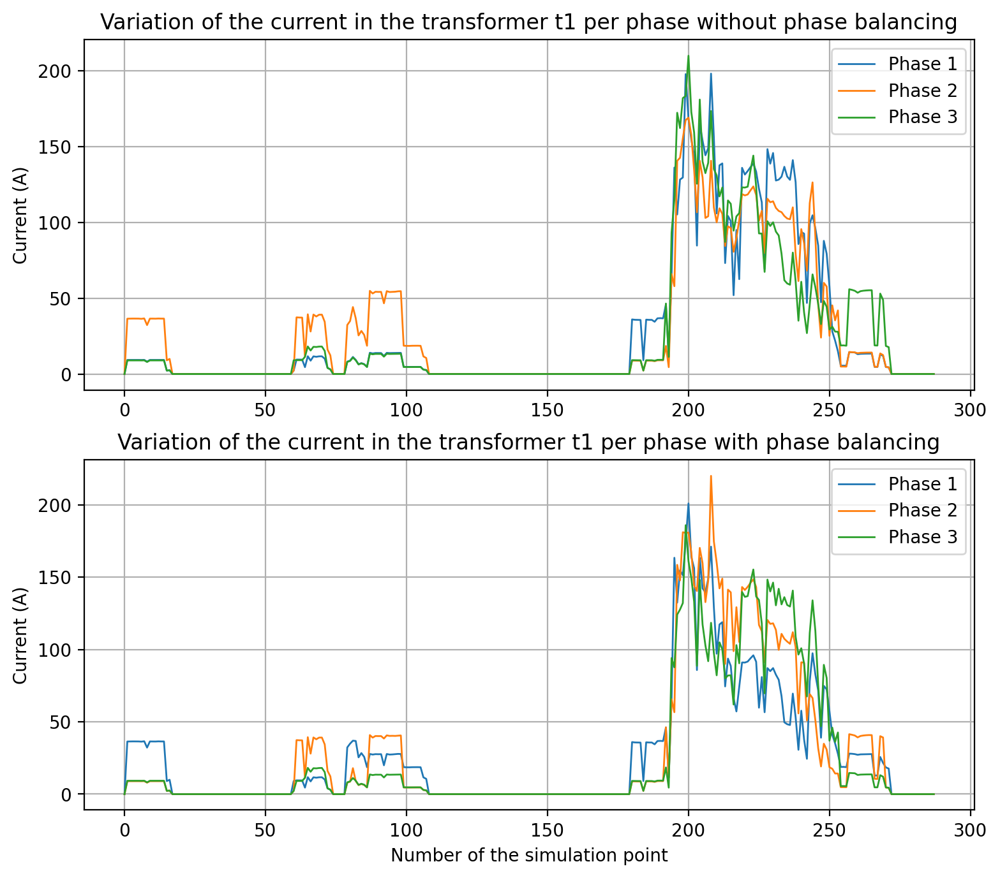

In [6]:
figure(figsize=(9, 8), dpi=200)
plt.subplot(2,1,1)
plt.plot(range(begin,end),result1["P1 (kW)"][begin:end] * 1000 / 120, linewidth=1, label = "Phase 1")
plt.plot(range(begin,end),result1["P2 (kW)"][begin:end] * 1000 / 120, linewidth=1, label = "Phase 2")
plt.plot(range(begin,end),result1["P3 (kW)"][begin:end] * 1000 / 120, linewidth=1, label = "Phase 3")
plt.ylabel("Current (A)")
plt.title("Variation of the current in the transformer t1 per phase without phase balancing")
plt.legend()
plt.grid()

plt.subplot(2,1,2)
plt.plot(range(begin,end),result2["P1 (kW)"][begin:end] * 1000 / 120, linewidth=1, label = "Phase 1")
plt.plot(range(begin,end),result2["P2 (kW)"][begin:end] * 1000 / 120, linewidth=1, label = "Phase 2")
plt.plot(range(begin,end),result2["P3 (kW)"][begin:end] * 1000 / 120, linewidth=1, label = "Phase 3")
plt.xlabel("Number of the simulation point")
plt.ylabel("Current (A)")
plt.title("Variation of the current in the transformer t1 per phase with phase balancing")
plt.grid()
plt.legend()
plt.show()